# set up

In [1]:
import sys
if sys.platform == 'linux':
    sys.path.append("/home/qix/MultiNeuronGLM")
else:
    sys.path.append("D:/Github/MultiNeuronGLM")

In [2]:
import pandas as pd
import utility_functions as utils
import GLM
from DataLoader import Allen_dataset
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import numpy as np
# sns.set_theme()
sns.set_theme(style="white")
# sns.set_style('whitegrid')

In [3]:
# Load selected group_id
import pickle
with open('group_id_all_a_c/membership.pickle', 'rb') as handle:
    membership = pickle.load(handle)
with open('group_id_all_a_c/condition_ids.pickle', 'rb') as handle:
    condition_ids = pickle.load(handle)

In [4]:
# Load data
start_time = 0.0
end_time = 0.50
padding = 0.3
V1 = Allen_dataset(fps=1000,
                   start_time=start_time, 
                   end_time=end_time,
                   padding=padding,
#                    orientation=[0],
                   session_id=757216464,
                   selected_probes=['probeA', 'probeB', 'probeC', 'probeD', 'probeE', 'probeF'],
#                    temporal_frequency=[1,2,4],
                   stimulus_condition_id=[275, 277, 246, 255, 272, 248, 283, 266, 274, 276, 286, 271, 268, 270],
#                    stimulus_condition_id=[246, 247, 248, 249, 250, 251, 252, 253, 255, 256, 257, 258, 259, 260, 261, 
#                                           262, 263, 264, 265, 266, 267, 268, 269, 271, 272, 273, 274, 275, 276, 277,
#                                           278, 279, 280, 281, 282, 283, 284, 285, 286, 270],
                   stimulus_name='drifting_gratings')

# V1.get_lfp()
# V1.remove_padding(padding)
V1.get_trial_metric_per_unit_per_trial()
# V1.get_trial_metric_per_unit_per_trial(metric_type='spike_times')
V1.get_running(method="mine")

/home/qix/anaconda3/lib/python3.9/site-packages/allensdk/brain_observatory/ecephys/stimulus_table/naming_utilities.py:154: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  movie_rows = table[stim_colname].str.contains(movie_re, na=False)
/home/qix/anaconda3/lib/python3.9/site-packages/allensdk/brain_observatory/ecephys/ecephys_session.py:1315: UserWarning: Session includes invalid time intervals that could be accessed with the attribute 'invalid_times',Spikes within these intervals are invalid and may need to be excluded from the analysis.
  warnings.warn("Session includes invalid time intervals that could be accessed with the attribute 'invalid_times',"


# Full search

In [5]:
# The following hyperparameters turned out to be the best
num_f_refractory = 4
max_iter = 10
tau = 15
coupling_filter_params = {'peaks_max':15.2, 'num':3, 'nonlinear':0.5}
num_basis_baseline = 20
penalty = 3e-1

################ No need to change below
probe_list = V1.selected_probes
running_filter = {}
stationary_filter = {}
running_output = {}
stationary_output = {}

ROI_filter = {}
statistics_filter = {}
ROI_output = {}
statistics_output = {}

running_model_list = []
stationary_model_list = []

for i, target_probe in tqdm(enumerate(probe_list)):
    select_trials = V1.running_trial_index
    model = GLM.PP_GLM(dataset=V1, 
                       select_trials=select_trials, 
                       membership=membership, 
                       condition_ids=condition_ids)
    model.add_effect('inhomogeneous_baseline', num=num_basis_baseline, apply_no_penalty=True)
    for j, input_probe in enumerate(probe_list):
        model.add_effect('coupling', probe_list[j], apply_no_penalty=True, **coupling_filter_params)
    model.add_effect('refractory_additive', target_probe, tau=tau, num=num_f_refractory, apply_no_penalty=True)
#     model.add_effect('refractory', target_probe, tau=tau, order=1.5, apply_no_penalty=True)
    model.add_effect('trial_coef')
    model.fit_time_warping_baseline(target_probe, verbose=False, max_iter=max_iter, penalty=penalty)
    running_model_list.append(model)
    
    filter_list = model.get_filter(ci=True)
    for j in range(len(model.basis_list)):
        running_filter[i,j-1] = filter_list[j]
    output_list = model.get_filter_output(ci=True)
    for j in range(len(model.basis_list)):
        running_output[i,j-1] = output_list[j]
    
    select_trials = V1.stationary_trial_index
    model = GLM.PP_GLM(dataset=V1, 
                       select_trials=select_trials, 
                       membership=membership, 
                       condition_ids=condition_ids)
    model.add_effect('inhomogeneous_baseline', num=num_basis_baseline, apply_no_penalty=True)
    for j, input_probe in enumerate(probe_list):
        model.add_effect('coupling', probe_list[j],apply_no_penalty=True, **coupling_filter_params)
    model.add_effect('refractory_additive', target_probe, tau=tau, num=num_f_refractory, apply_no_penalty=True)
#     model.add_effect('refractory', target_probe, tau=tau, order=1.5, apply_no_penalty=True)
    model.add_effect('trial_coef')
    model.fit_time_warping_baseline(target_probe, verbose=False, max_iter=max_iter, penalty=penalty)
    stationary_model_list.append(model)
    
    filter_list = model.get_filter(ci=True)
    for j in range(len(model.basis_list)):
        stationary_filter[i,j-1] = filter_list[j]
    output_list = model.get_filter_output(ci=True)
    for j in range(len(model.basis_list)):
        stationary_output[i,j-1] = output_list[j]
    
    # for effect filter
    filter_index = i,-1
    function1 = np.exp( running_filter[filter_index][0] )
    function2 = np.exp( stationary_filter[filter_index][0] )
    ROI_filter[filter_index], statistics_filter[filter_index] = GLM.get_excursion_statistic(function1, function2)
    for j, input_probe in enumerate(probe_list):
        filter_index = i,j
        function1 = running_filter[filter_index][0]
        function2 = stationary_filter[filter_index][0]
        ROI_filter[filter_index], statistics_filter[filter_index] = GLM.get_excursion_statistic(function1, function2)
    
    # for effect output
    filter_index = i,-1
    function1 = np.exp( running_output[filter_index][0] )
    function2 = np.exp( stationary_output[filter_index][0] )
    ROI_output[filter_index], statistics_output[filter_index] = GLM.get_excursion_statistic(function1, function2)
    for j, input_probe in enumerate(probe_list):
        filter_index = i,j
        function1 = running_output[filter_index][0]
        function2 = stationary_output[filter_index][0]
        ROI_output[filter_index], statistics_output[filter_index] = GLM.get_excursion_statistic(function1, function2)

aic = np.sum([model.aic for model in stationary_model_list]+[model.aic for model in running_model_list])
baseline_aic = 570714.232742189
print(f"AIC improvement of the model is: {(baseline_aic - aic)}")

bic = np.sum([model.bic for model in stationary_model_list]+[model.bic for model in running_model_list])
baseline_bic = 588924.4932276756
print(f"BIC improvement of the model is: {(baseline_bic - bic)}")

6it [03:17, 32.86s/it]

AIC improvement of the model is: 6857.286720926291
BIC improvement of the model is: 9403.707517772797


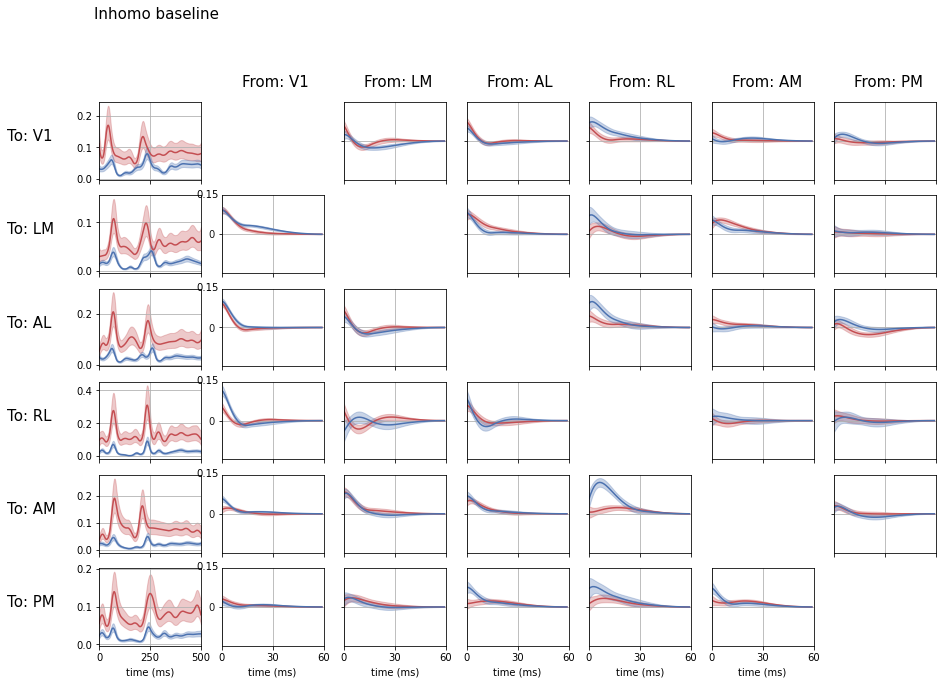

In [6]:
GLM.plot_filter_with_excursion(V1, stationary_filter, running_filter, inference=False, plot_baseline=True, 
                              plot_self=False)

Text(0.5, 1.0, 'Fitted with $f_{rf}(\\Lambda)$ model; LM; Resting; trial 85')

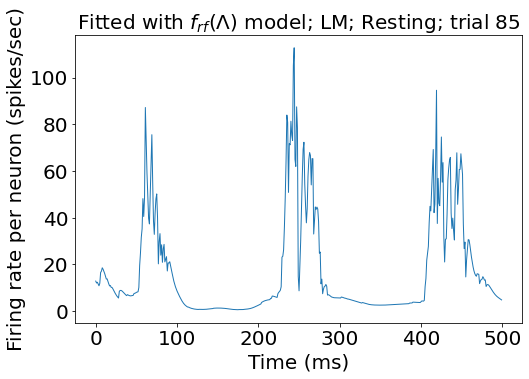

In [7]:
fontsize = 20
plt.subplots(figsize=(8,5.3))

plt.plot(np.exp(stationary_model_list[3].log_lmbd[:, 85])/10.625*1e3, linewidth=1)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel("Time (ms)", fontsize=fontsize)
plt.ylabel("Firing rate per neuron (spikes/sec)", fontsize=fontsize)
plt.title("Fitted with $f_{rf}(\Lambda)$ model; LM; Resting; trial 85", fontdict = {'fontsize' : 20})

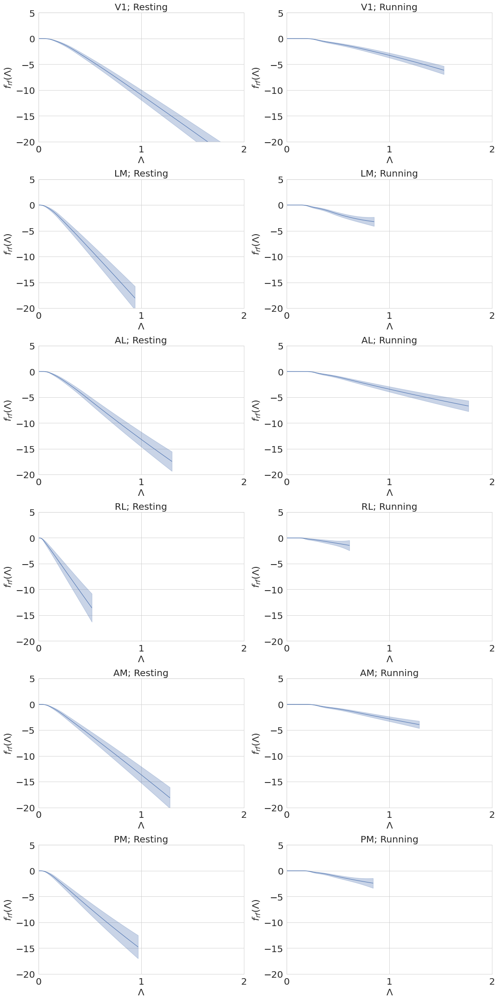

In [8]:
sns.set_style('whitegrid')
fontsize = 20
plt.subplots(figsize=(15,30))
transfer_ij = {4:0, 5:1, 0:2, 1:3, 2:4, 3:5}

model_list = stationary_model_list + running_model_list
for ii in range(6):
    i = transfer_ij[ii]
    for j in range(7,8):
        plt.subplot(6,2, 2*ii+j-6)
        model = model_list[i]
        utils.plot_ci(model.get_filter(ci=True)[j], center=True)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.xlabel('$\Lambda$', fontsize=fontsize)
        plt.ylabel('$f_{rf}(\Lambda)$', fontsize=fontsize)
        plt.ylim([-20, 5])
        plt.xlim([0, 200])
        plt.xticks([0, 100, 200], [0, 1, 2])
        plt.title(utils.PROBE_CORRESPONDING[probe_list[i]]+"; Resting", fontdict = {'fontsize' : 20})
    for j in range(7,8):
        plt.subplot(6,2, 2*ii+j-5)
        model = model_list[i+6]
        utils.plot_ci(model.get_filter(ci=True)[j], center=True)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.xlabel('$\Lambda$', fontsize=fontsize)
        plt.ylabel('$f_{rf}(\Lambda)$', fontsize=fontsize)
        plt.ylim([-20, 5])
        plt.xlim([0, 200])
        plt.xticks([0, 100, 200], [0, 1, 2])
        plt.title(utils.PROBE_CORRESPONDING[probe_list[i]]+"; Running", fontdict = {'fontsize' : 20})
plt.tight_layout()
sns.set_style('white')

In [9]:
# Save peak times, which turned out to be not useful. 
fix_peak_time = []
for i_probe in range(6):
    fix_peak_time_single = np.zeros((V1.ntrial, 4))
    i_stationary = 0
    i_running = 0
    for itrial in range(V1.ntrial):
        if stationary_model_list[0].select_trials[itrial] == True:
            fix_peak_time_single[itrial, 1] = stationary_model_list[i_probe].shifts[i_stationary,1]
            fix_peak_time_single[itrial, 3] = stationary_model_list[i_probe].shifts[i_stationary,3]
            fix_peak_time_single[itrial, 0] = stationary_model_list[i_probe].shifts[i_stationary,0]
            fix_peak_time_single[itrial, 2] = stationary_model_list[i_probe].shifts[i_stationary,2]
            i_stationary += 1
        else:
            fix_peak_time_single[itrial, 1] = running_model_list[i_probe].shifts[i_running,1]
            fix_peak_time_single[itrial, 3] = running_model_list[i_probe].shifts[i_running,3]
            fix_peak_time_single[itrial, 0] = running_model_list[i_probe].shifts[i_running,0]
            fix_peak_time_single[itrial, 2] = running_model_list[i_probe].shifts[i_running,2]
            i_running += 1
    fix_peak_time.append(fix_peak_time_single)

# Bayesian optimization

In [12]:
# The following hyperparameters turned out to be the best
num_f_refractory = 4
max_iter = 10
tau = 15
coupling_filter_params = {'peaks_max':15.2, 'num':3, 'nonlinear':0.5}
num_basis_baseline = 20
penalty = 3e-1

################ No need to change below
probe_list = V1.selected_probes
running_filter = {}
stationary_filter = {}
running_output = {}
stationary_output = {}

ROI_filter = {}
statistics_filter = {}
ROI_output = {}
statistics_output = {}

running_model_list = []
stationary_model_list = []

for i, target_probe in tqdm(enumerate(probe_list)):
    select_trials = V1.running_trial_index
    model = GLM.PP_GLM(dataset=V1, 
                       select_trials=select_trials, 
                       membership=membership, 
                       condition_ids=condition_ids)
    model.add_effect('inhomogeneous_baseline', num=num_basis_baseline, apply_no_penalty=True)
    for j, input_probe in enumerate(probe_list):
        model.add_effect('coupling', probe_list[j], apply_no_penalty=True, **coupling_filter_params)
    model.add_effect('refractory_additive', target_probe, tau=tau, num=num_f_refractory, apply_no_penalty=True)
#     model.add_effect('refractory', target_probe, tau=tau, order=1.5, apply_no_penalty=True)
    model.add_effect('trial_coef')
    model.fit_time_warping_baseline(target_probe, verbose=False, max_iter=max_iter, penalty=penalty)
    running_model_list.append(model)
    
    filter_list = model.get_filter(ci=True)
    for j in range(len(model.basis_list)):
        running_filter[i,j-1] = filter_list[j]
    output_list = model.get_filter_output(ci=True)
    for j in range(len(model.basis_list)):
        running_output[i,j-1] = output_list[j]
    
    select_trials = V1.stationary_trial_index
    model = GLM.PP_GLM(dataset=V1, 
                       select_trials=select_trials, 
                       membership=membership, 
                       condition_ids=condition_ids)
    model.add_effect('inhomogeneous_baseline', num=num_basis_baseline, apply_no_penalty=True)
    for j, input_probe in enumerate(probe_list):
        model.add_effect('coupling', probe_list[j],apply_no_penalty=True, **coupling_filter_params)
    model.add_effect('refractory_additive', target_probe, tau=tau, num=num_f_refractory, apply_no_penalty=True)
#     model.add_effect('refractory', target_probe, tau=tau, order=1.5, apply_no_penalty=True)
    model.add_effect('trial_coef')
    model.fit_time_warping_baseline(target_probe, verbose=False, max_iter=max_iter, penalty=penalty)
    stationary_model_list.append(model)
    
    filter_list = model.get_filter(ci=True)
    for j in range(len(model.basis_list)):
        stationary_filter[i,j-1] = filter_list[j]
    output_list = model.get_filter_output(ci=True)
    for j in range(len(model.basis_list)):
        stationary_output[i,j-1] = output_list[j]
    
    # for effect filter
    filter_index = i,-1
    function1 = np.exp( running_filter[filter_index][0] )
    function2 = np.exp( stationary_filter[filter_index][0] )
    ROI_filter[filter_index], statistics_filter[filter_index] = GLM.get_excursion_statistic(function1, function2)
    for j, input_probe in enumerate(probe_list):
        filter_index = i,j
        function1 = running_filter[filter_index][0]
        function2 = stationary_filter[filter_index][0]
        ROI_filter[filter_index], statistics_filter[filter_index] = GLM.get_excursion_statistic(function1, function2)
    
    # for effect output
    filter_index = i,-1
    function1 = np.exp( running_output[filter_index][0] )
    function2 = np.exp( stationary_output[filter_index][0] )
    ROI_output[filter_index], statistics_output[filter_index] = GLM.get_excursion_statistic(function1, function2)
    for j, input_probe in enumerate(probe_list):
        filter_index = i,j
        function1 = running_output[filter_index][0]
        function2 = stationary_output[filter_index][0]
        ROI_output[filter_index], statistics_output[filter_index] = GLM.get_excursion_statistic(function1, function2)

aic = np.sum([model.aic for model in stationary_model_list]+[model.aic for model in running_model_list])
baseline_aic = 570714.232742189
print(f"AIC improvement of the model is: {(baseline_aic - aic)}")

bic = np.sum([model.bic for model in stationary_model_list]+[model.bic for model in running_model_list])
baseline_bic = 588924.4932276756
print(f"BIC improvement of the model is: {(baseline_bic - bic)}")

0it [00:00, ?it/s]

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  411.0    |  0.06255  |
|  2        |  408.8    |  0.108    |
|  3        |  411.0    |  0.06254  |
|  4        |  411.7    |  0.03034  |
|  5        |  410.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  411.2    |  0.2334   |
|  2        |  412.0    |  0.2941   |
|  3        |  412.0    |  0.294    |
|  4        |  413.7    |  0.3408   |
|  5        |  414.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  416.1    |  0.06255  |
|  2        |  416.9    |  0.108    |
|  3        |  416.9    |  0.108    |
|  4        |  419.4    |  0.1431   |
|  5        |  420.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  416.2    |  0.2334   |
|  2        |  416.7    |  0.2941   |
|  3        |  416.7    |  0.294    |
|  4        

|  5        |  349.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.1    |  0.06255  |
|  2        |  384.2    |  0.108    |
|  3        |  386.1    |  0.06254  |
|  4        |  383.0    |  0.03034  |
|  5        |  386.1    |  0.08048  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.3    |  0.2334   |
|  2        |  386.8    |  0.2941   |
|  3        |  386.8    |  0.294    |
|  4        |  387.6    |  0.3408   |
|  5        |  386.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  365.5    |  0.06255  |
|  2        |  374.0    |  0.108    |
|  3        |  374.0    |  0.108    |
|  4        |  381.6    |  0.1431   |
|  5        |  372.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  364.7    |  0.2334   |
|  2        |  366.1    |  0.2941   |
|  3        

|  5        |  144.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.6    |  0.06255  |
|  2        |  237.9    |  0.108    |
|  3        |  237.9    |  0.108    |
|  4        |  245.4    |  0.1431   |
|  5        |  246.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.3    |  0.2334   |
|  2        |  235.3    |  0.2941   |
|  3        |  235.3    |  0.294    |
|  4        |  234.9    |  0.3408   |
|  5        |  235.7    |  0.1938   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.1    |  0.06255  |
|  2        |  299.9    |  0.108    |
|  3        |  299.9    |  0.108    |
|  4        |  303.6    |  0.1431   |
|  5        |  296.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.4    |  0.2334   |
|  2        |  297.3    |  0.2941   |
|  3        

|  4        |  213.3    |  0.3408   |
|  5        |  212.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  365.8    |  0.06255  |
|  2        |  368.1    |  0.108    |
|  3        |  368.1    |  0.108    |
|  4        |  376.9    |  0.1431   |
|  5        |  378.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  363.8    |  0.2334   |
|  2        |  363.7    |  0.2941   |
|  3        |  363.8    |  0.2334   |
|  4        |  363.4    |  0.1931   |
|  5        |  363.4    |  0.263    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.0    |  0.06255  |
|  2        |  339.6    |  0.108    |
|  3        |  339.6    |  0.108    |
|  4        |  346.8    |  0.1431   |
|  5        |  340.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.7    |  0.2334   |
|  2        

|  5        |  320.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.6    |  0.06255  |
|  2        |  364.7    |  0.108    |
|  3        |  364.7    |  0.108    |
|  4        |  367.1    |  0.1431   |
|  5        |  358.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.3    |  0.2334   |
|  2        |  360.3    |  0.2941   |
|  3        |  360.3    |  0.294    |
|  4        |  361.3    |  0.3408   |
|  5        |  361.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  409.4    |  0.06255  |
|  2        |  410.5    |  0.108    |
|  3        |  410.5    |  0.108    |
|  4        |  416.4    |  0.1431   |
|  5        |  418.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  407.6    |  0.2334   |
|  2        |  407.1    |  0.2941   |
|  3        

|  4        |  372.1    |  0.1431   |
|  5        |  365.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  360.8    |  0.2334   |
|  2        |  361.0    |  0.2941   |
|  3        |  361.0    |  0.294    |
|  4        |  361.4    |  0.3408   |
|  5        |  361.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.3    |  0.06255  |
|  2        |  211.6    |  0.108    |
|  3        |  211.6    |  0.108    |
|  4        |  221.8    |  0.1431   |
|  5        |  211.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.4    |  0.2334   |
|  2        |  205.6    |  0.2941   |
|  3        |  205.6    |  0.294    |
|  4        |  206.5    |  0.3408   |
|  5        |  206.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.2    |  0.06255  |
|  2        

|  5        |  262.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.7    |  0.06255  |
|  2        |  340.0    |  0.108    |
|  3        |  340.0    |  0.108    |
|  4        |  349.5    |  0.1431   |
|  5        |  341.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.2    |  0.2334   |
|  2        |  335.1    |  0.2941   |
|  3        |  335.1    |  0.294    |
|  4        |  334.9    |  0.3408   |
|  5        |  334.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  400.6    |  0.06255  |
|  2        |  401.9    |  0.108    |
|  3        |  401.9    |  0.108    |
|  4        |  403.3    |  0.1431   |
|  5        |  403.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  399.8    |  0.2334   |
|  2        |  399.8    |  0.2941   |
|  3        

|  4        |  316.1    |  0.3408   |
|  5        |  315.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.6    |  0.06255  |
|  2        |  284.2    |  0.108    |
|  3        |  284.2    |  0.108    |
|  4        |  293.4    |  0.1431   |
|  5        |  284.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.4    |  0.2334   |
|  2        |  278.0    |  0.2941   |
|  3        |  278.0    |  0.294    |
|  4        |  278.2    |  0.3408   |
|  5        |  278.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.5    |  0.06255  |
|  2        |  270.6    |  0.108    |
|  3        |  270.6    |  0.108    |
|  4        |  273.7    |  0.1431   |
|  5        |  269.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.9    |  0.2334   |
|  2        

|  4        |  414.4    |  0.1431   |
|  5        |  416.4    |  0.02601  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  416.8    |  0.2334   |
|  2        |  415.7    |  0.2941   |
|  3        |  416.8    |  0.2334   |
|  4        |  420.2    |  0.1931   |
|  5        |  417.1    |  0.1741   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  383.3    |  0.06255  |
|  2        |  379.5    |  0.108    |
|  3        |  383.3    |  0.06254  |
|  4        |  385.4    |  0.03034  |
|  5        |  382.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  384.6    |  0.2334   |
|  2        |  385.5    |  0.2941   |
|  3        |  385.5    |  0.294    |
|  4        |  388.9    |  0.3408   |
|  5        |  388.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.7    |  0.06255  |
|  2        

|  4        |  379.7    |  0.03034  |
|  5        |  378.2    |  0.0145   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.4    |  0.2334   |
|  2        |  377.4    |  0.2941   |
|  3        |  378.4    |  0.2334   |
|  4        |  374.5    |  0.1931   |
|  5        |  379.7    |  0.2607   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.7    |  0.06255  |
|  2        |  312.6    |  0.108    |
|  3        |  317.7    |  0.06254  |
|  4        |  322.8    |  0.03034  |
|  5        |  319.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.4    |  0.2334   |
|  2        |  322.7    |  0.2941   |
|  3        |  322.7    |  0.294    |
|  4        |  328.0    |  0.3408   |
|  5        |  322.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  409.7    |  0.06255  |
|  2        

|  5        |  306.2    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.4    |  0.06255  |
|  2        |  375.7    |  0.108    |
|  3        |  380.4    |  0.06254  |
|  4        |  382.4    |  0.03034  |
|  5        |  377.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  383.0    |  0.2334   |
|  2        |  382.8    |  0.2941   |
|  3        |  383.0    |  0.2334   |
|  4        |  381.5    |  0.1931   |
|  5        |  382.3    |  0.2619   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.3    |  0.06255  |
|  2        |  305.8    |  0.108    |
|  3        |  312.3    |  0.06254  |
|  4        |  311.3    |  0.03034  |
|  5        |  308.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.5    |  0.2334   |
|  2        |  310.5    |  0.2941   |
|  3        

|  3        |  342.2    |  0.2334   |
|  4        |  342.2    |  0.1931   |
|  5        |  342.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.9    |  0.06255  |
|  2        |  351.3    |  0.108    |
|  3        |  358.9    |  0.06254  |
|  4        |  356.0    |  0.03034  |
|  5        |  354.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.4    |  0.2334   |
|  2        |  357.8    |  0.2941   |
|  3        |  359.4    |  0.2334   |
|  4        |  360.7    |  0.1931   |
|  5        |  361.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  372.0    |  0.06255  |
|  2        |  362.9    |  0.108    |
|  3        |  372.0    |  0.06254  |
|  4        |  371.0    |  0.03034  |
|  5        |  369.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  407.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  414.1    |  0.2334   |
|  2        |  410.8    |  0.2941   |
|  3        |  414.1    |  0.2334   |
|  4        |  415.2    |  0.1931   |
|  5        |  412.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  403.1    |  0.06255  |
|  2        |  394.1    |  0.108    |
|  3        |  403.1    |  0.06254  |
|  4        |  402.0    |  0.03034  |
|  5        |  398.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  403.5    |  0.2334   |
|  2        |  402.5    |  0.2941   |
|  3        |  403.5    |  0.2334   |
|  4        |  402.8    |  0.1931   |
|  5        |  405.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  405.1    |  0.06255  |
|  2        |  402.4    |  0.108    |
|  3        

|  4        |  215.7    |  0.03034  |
|  5        |  211.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.1    |  0.2334   |
|  2        |  218.3    |  0.2941   |
|  3        |  218.3    |  0.294    |
|  4        |  219.6    |  0.3408   |
|  5        |  215.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  351.8    |  0.06255  |
|  2        |  351.0    |  0.108    |
|  3        |  351.8    |  0.06254  |
|  4        |  352.4    |  0.03034  |
|  5        |  352.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.6    |  0.2334   |
|  2        |  353.4    |  0.2941   |
|  3        |  353.4    |  0.294    |
|  4        |  354.2    |  0.3408   |
|  5        |  350.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.1    |  0.06255  |
|  2        

|  3        |  343.3    |  0.06254  |
|  4        |  346.1    |  0.03034  |
|  5        |  345.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.2    |  0.2334   |
|  2        |  346.4    |  0.2941   |
|  3        |  346.4    |  0.294    |
|  4        |  343.7    |  0.3408   |
|  5        |  343.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  400.3    |  0.06255  |
|  2        |  399.8    |  0.108    |
|  3        |  400.3    |  0.06254  |
|  4        |  400.5    |  0.03034  |
|  5        |  400.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  398.4    |  0.2334   |
|  2        |  400.8    |  0.2941   |
|  3        |  400.8    |  0.294    |
|  4        |  402.3    |  0.3408   |
|  5        |  400.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  286.0    |  0.06254  |
|  4        |  290.4    |  0.03034  |
|  5        |  289.7    |  0.009966 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.5    |  0.2334   |
|  2        |  290.4    |  0.2941   |
|  3        |  290.4    |  0.294    |
|  4        |  288.4    |  0.3408   |
|  5        |  286.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  269.4    |  0.06255  |
|  2        |  271.9    |  0.108    |
|  3        |  271.9    |  0.108    |
|  4        |  274.7    |  0.1431   |
|  5        |  274.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.2    |  0.2334   |
|  2        |  276.5    |  0.2941   |
|  3        |  276.5    |  0.294    |
|  4        |  275.4    |  0.3408   |
|  5        |  267.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  422.4    |  0.06254  |
|  4        |  422.6    |  0.03034  |
|  5        |  425.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  420.9    |  0.2334   |
|  2        |  422.1    |  0.2941   |
|  3        |  422.1    |  0.294    |
|  4        |  418.8    |  0.3408   |
|  5        |  415.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.4    |  0.06255  |
|  2        |  382.9    |  0.108    |
|  3        |  382.9    |  0.108    |
|  4        |  386.8    |  0.1431   |
|  5        |  385.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.9    |  0.2334   |
|  2        |  378.9    |  0.2941   |
|  3        |  380.9    |  0.2334   |
|  4        |  382.4    |  0.1931   |
|  5        |  380.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  371.9    |  0.1431   |
|  5        |  373.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  369.1    |  0.2334   |
|  2        |  372.9    |  0.2941   |
|  3        |  372.9    |  0.294    |
|  4        |  373.6    |  0.3408   |
|  5        |  370.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.8    |  0.06255  |
|  2        |  317.0    |  0.108    |
|  3        |  317.0    |  0.108    |
|  4        |  320.5    |  0.1431   |
|  5        |  320.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.7    |  0.2334   |
|  2        |  308.6    |  0.2941   |
|  3        |  312.7    |  0.2334   |
|  4        |  315.3    |  0.1931   |
|  5        |  317.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  400.6    |  0.06255  |
|  2        

|  4        |  301.9    |  0.3408   |
|  5        |  298.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.9    |  0.06255  |
|  2        |  379.1    |  0.108    |
|  3        |  379.1    |  0.108    |
|  4        |  385.2    |  0.1431   |
|  5        |  379.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.5    |  0.2334   |
|  2        |  374.8    |  0.2941   |
|  3        |  375.5    |  0.2334   |
|  4        |  376.1    |  0.1931   |
|  5        |  377.9    |  0.1509   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.7    |  0.06255  |
|  2        |  305.1    |  0.108    |
|  3        |  306.7    |  0.06254  |
|  4        |  306.9    |  0.03034  |
|  5        |  307.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.6    |  0.2334   |
|  2        

|  4        |  362.1    |  0.03034  |
|  5        |  361.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.7    |  0.2334   |
|  2        |  352.4    |  0.2941   |
|  3        |  357.7    |  0.2334   |
|  4        |  357.6    |  0.1931   |
|  5        |  356.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  369.3    |  0.06255  |
|  2        |  370.2    |  0.108    |
|  3        |  370.2    |  0.108    |
|  4        |  373.6    |  0.1431   |
|  5        |  373.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  365.6    |  0.2334   |
|  2        |  364.6    |  0.2941   |
|  3        |  365.6    |  0.2334   |
|  4        |  366.7    |  0.1931   |
|  5        |  364.8    |  0.1559   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.7    |  0.06255  |
|  2        

|  4        |  406.4    |  0.03034  |
|  5        |  407.9    |  0.01172  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  400.7    |  0.2334   |
|  2        |  396.5    |  0.2941   |
|  3        |  400.7    |  0.2334   |
|  4        |  400.1    |  0.1931   |
|  5        |  398.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  397.5    |  0.06255  |
|  2        |  399.5    |  0.108    |
|  3        |  399.5    |  0.108    |
|  4        |  401.1    |  0.1431   |
|  5        |  400.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  401.1    |  0.2334   |
|  2        |  405.6    |  0.2941   |
|  3        |  405.6    |  0.294    |
|  4        |  407.0    |  0.3408   |
|  5        |  397.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  354.9    |  0.06255  |
|  2        

|  4        |  351.5    |  0.03034  |
|  5        |  353.5    |  0.007391 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.5    |  0.2334   |
|  2        |  349.2    |  0.2941   |
|  3        |  349.2    |  0.294    |
|  4        |  351.3    |  0.3408   |
|  5        |  351.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.0    |  0.06255  |
|  2        |  357.7    |  0.108    |
|  3        |  358.0    |  0.06254  |
|  4        |  357.1    |  0.03034  |
|  5        |  358.6    |  0.08292  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.1    |  0.2334   |
|  2        |  358.1    |  0.2941   |
|  3        |  359.1    |  0.2334   |
|  4        |  358.3    |  0.1931   |
|  5        |  356.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.6    |  0.06255  |
|  2        

|  5        |  402.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.4    |  0.06255  |
|  2        |  240.6    |  0.108    |
|  3        |  240.6    |  0.108    |
|  4        |  247.1    |  0.1431   |
|  5        |  244.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.7    |  0.2334   |
|  2        |  237.1    |  0.2941   |
|  3        |  237.1    |  0.294    |
|  4        |  241.0    |  0.3408   |
|  5        |  243.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  385.4    |  0.06255  |
|  2        |  381.4    |  0.108    |
|  3        |  385.4    |  0.06254  |
|  4        |  386.5    |  0.03034  |
|  5        |  386.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  383.2    |  0.2334   |
|  2        |  389.1    |  0.2941   |
|  3        

|  4        |  271.0    |  0.3408   |
|  5        |  272.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.5    |  0.06255  |
|  2        |  333.9    |  0.108    |
|  3        |  333.9    |  0.108    |
|  4        |  337.9    |  0.1431   |
|  5        |  338.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.5    |  0.2334   |
|  2        |  329.3    |  0.2941   |
|  3        |  330.5    |  0.2334   |
|  4        |  332.6    |  0.1931   |
|  5        |  331.5    |  0.1706   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  341.8    |  0.06255  |
|  2        |  338.1    |  0.108    |
|  3        |  341.8    |  0.06254  |
|  4        |  341.9    |  0.03034  |
|  5        |  343.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.3    |  0.2334   |
|  2        

|  3        |  349.2    |  0.2334   |
|  4        |  346.8    |  0.1931   |
|  5        |  348.8    |  0.2568   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.1    |  0.06255  |
|  2        |  321.1    |  0.108    |
|  3        |  321.1    |  0.108    |
|  4        |  324.4    |  0.1431   |
|  5        |  322.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.7    |  0.2334   |
|  2        |  323.6    |  0.2941   |
|  3        |  323.6    |  0.294    |
|  4        |  320.6    |  0.3408   |
|  5        |  320.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.7    |  0.06255  |
|  2        |  341.7    |  0.108    |
|  3        |  341.7    |  0.108    |
|  4        |  344.0    |  0.1431   |
|  5        |  343.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  419.7    |  0.3408   |
|  5        |  415.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  360.6    |  0.06255  |
|  2        |  358.9    |  0.108    |
|  3        |  360.6    |  0.06254  |
|  4        |  369.4    |  0.03034  |
|  5        |  367.4    |  0.01551  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  372.1    |  0.2334   |
|  2        |  369.0    |  0.2941   |
|  3        |  372.1    |  0.2334   |
|  4        |  364.7    |  0.1931   |
|  5        |  371.1    |  0.2582   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.0    |  0.06255  |
|  2        |  369.9    |  0.108    |
|  3        |  373.0    |  0.06254  |
|  4        |  374.9    |  0.03034  |
|  5        |  370.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  377.0    |  0.2334   |
|  2        

|  4        |  376.5    |  0.3408   |
|  5        |  373.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.8    |  0.06255  |
|  2        |  250.4    |  0.108    |
|  3        |  250.4    |  0.108    |
|  4        |  252.6    |  0.1431   |
|  5        |  253.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.4    |  0.2334   |
|  2        |  253.0    |  0.2941   |
|  3        |  253.0    |  0.294    |
|  4        |  250.1    |  0.3408   |
|  5        |  251.8    |  0.1842   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.2    |  0.06255  |
|  2        |  323.3    |  0.108    |
|  3        |  333.2    |  0.06254  |
|  4        |  336.0    |  0.03034  |
|  5        |  331.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.1    |  0.2334   |
|  2        

|  3        |  378.9    |  0.2334   |
|  4        |  379.3    |  0.1931   |
|  5        |  377.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  369.1    |  0.06255  |
|  2        |  368.3    |  0.108    |
|  3        |  369.1    |  0.06254  |
|  4        |  377.9    |  0.03034  |
|  5        |  375.0    |  0.01623  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.9    |  0.2334   |
|  2        |  375.7    |  0.2941   |
|  3        |  375.7    |  0.294    |
|  4        |  376.1    |  0.3408   |
|  5        |  376.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  424.3    |  0.06255  |
|  2        |  422.1    |  0.108    |
|  3        |  424.3    |  0.06254  |
|  4        |  427.0    |  0.03034  |
|  5        |  424.7    |  0.005153 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  354.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.7    |  0.06255  |
|  2        |  333.7    |  0.108    |
|  3        |  346.7    |  0.06254  |
|  4        |  347.9    |  0.03034  |
|  5        |  341.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.5    |  0.2334   |
|  2        |  352.0    |  0.2941   |
|  3        |  352.0    |  0.294    |
|  4        |  351.0    |  0.3408   |
|  5        |  349.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  353.9    |  0.06255  |
|  2        |  349.8    |  0.108    |
|  3        |  353.9    |  0.06254  |
|  4        |  354.3    |  0.03034  |
|  5        |  353.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.6    |  0.2334   |
|  2        |  354.6    |  0.2941   |
|  3        

|  4        |  300.4    |  0.3408   |
|  5        |  302.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.5    |  0.06255  |
|  2        |  157.3    |  0.108    |
|  3        |  158.5    |  0.06254  |
|  4        |  161.2    |  0.03034  |
|  5        |  160.4    |  0.01309  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.8    |  0.2334   |
|  2        |  161.3    |  0.2941   |
|  3        |  161.3    |  0.294    |
|  4        |  161.9    |  0.3408   |
|  5        |  159.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.4    |  0.06255  |
|  2        |  152.1    |  0.108    |
|  3        |  153.4    |  0.06254  |
|  4        |  154.1    |  0.03034  |
|  5        |  153.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.2    |  0.2334   |
|  2        

|  3        |  394.2    |  0.294    |
|  4        |  390.0    |  0.3408   |
|  5        |  389.6    |  0.1799   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.0    |  0.06255  |
|  2        |  299.7    |  0.108    |
|  3        |  304.0    |  0.06254  |
|  4        |  308.9    |  0.03034  |
|  5        |  304.8    |  0.003267 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.4    |  0.2334   |
|  2        |  308.8    |  0.2941   |
|  3        |  308.8    |  0.294    |
|  4        |  304.1    |  0.3408   |
|  5        |  303.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  354.8    |  0.06255  |
|  2        |  351.3    |  0.108    |
|  3        |  354.8    |  0.06254  |
|  4        |  360.3    |  0.03034  |
|  5        |  357.8    |  0.009441 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  355.9    |  0.03034  |
|  5        |  353.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.2    |  0.2334   |
|  2        |  356.0    |  0.2941   |
|  3        |  356.0    |  0.294    |
|  4        |  349.1    |  0.3408   |
|  5        |  350.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.6    |  0.06255  |
|  2        |  248.7    |  0.108    |
|  3        |  251.6    |  0.06254  |
|  4        |  255.5    |  0.03034  |
|  5        |  252.1    |  0.007555 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.9    |  0.2334   |
|  2        |  255.0    |  0.2941   |
|  3        |  255.0    |  0.294    |
|  4        |  255.9    |  0.3408   |
|  5        |  250.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.2    |  0.06255  |
|  2        

|  5        |  320.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.8    |  0.06255  |
|  2        |  342.4    |  0.108    |
|  3        |  342.4    |  0.108    |
|  4        |  338.2    |  0.1431   |
|  5        |  342.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.2    |  0.2334   |
|  2        |  346.1    |  0.2941   |
|  3        |  346.1    |  0.294    |
|  4        |  346.1    |  0.3408   |
|  5        |  341.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.0    |  0.06255  |
|  2        |  387.2    |  0.108    |
|  3        |  387.2    |  0.108    |
|  4        |  381.8    |  0.1431   |
|  5        |  381.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.8    |  0.2334   |
|  2        |  374.8    |  0.2941   |
|  3        

|  4        |  374.9    |  0.3408   |
|  5        |  375.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.0    |  0.06255  |
|  2        |  346.4    |  0.108    |
|  3        |  346.4    |  0.108    |
|  4        |  346.2    |  0.1431   |
|  5        |  347.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.7    |  0.2334   |
|  2        |  348.2    |  0.2941   |
|  3        |  348.2    |  0.294    |
|  4        |  341.5    |  0.3408   |
|  5        |  341.5    |  0.1933   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  354.4    |  0.06255  |
|  2        |  350.8    |  0.108    |
|  3        |  354.4    |  0.06254  |
|  4        |  359.5    |  0.03034  |
|  5        |  359.1    |  0.007848 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.5    |  0.2334   |
|  2        

|  5        |  248.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.5    |  0.06255  |
|  2        |  326.1    |  0.108    |
|  3        |  326.1    |  0.108    |
|  4        |  331.6    |  0.1431   |
|  5        |  332.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.5    |  0.2334   |
|  2        |  320.1    |  0.2941   |
|  3        |  321.5    |  0.2334   |
|  4        |  324.0    |  0.1931   |
|  5        |  325.1    |  0.1702   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.5    |  0.06255  |
|  2        |  375.6    |  0.108    |
|  3        |  375.6    |  0.108    |
|  4        |  376.1    |  0.1431   |
|  5        |  373.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.1    |  0.2334   |
|  2        |  378.7    |  0.2941   |
|  3        

|  3        |  424.3    |  0.108    |
|  4        |  423.3    |  0.1431   |
|  5        |  420.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  419.9    |  0.2334   |
|  2        |  419.4    |  0.2941   |
|  3        |  419.9    |  0.2334   |
|  4        |  420.8    |  0.1931   |
|  5        |  421.0    |  0.1707   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.2    |  0.06255  |
|  2        |  265.6    |  0.108    |
|  3        |  265.6    |  0.108    |
|  4        |  264.9    |  0.1431   |
|  5        |  265.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.6    |  0.2334   |
|  2        |  266.4    |  0.2941   |
|  3        |  266.4    |  0.294    |
|  4        |  266.5    |  0.3408   |
|  5        |  267.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  357.6    |  0.03034  |
|  5        |  358.4    |  0.01645  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.0    |  0.2334   |
|  2        |  358.4    |  0.2941   |
|  3        |  358.4    |  0.294    |
|  4        |  358.0    |  0.3408   |
|  5        |  350.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.8    |  0.06255  |
|  2        |  387.8    |  0.108    |
|  3        |  387.8    |  0.108    |
|  4        |  385.9    |  0.1431   |
|  5        |  385.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  389.6    |  0.2334   |
|  2        |  389.8    |  0.2941   |
|  3        |  389.8    |  0.294    |
|  4        |  388.3    |  0.3408   |
|  5        |  386.0    |  0.1904   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.4    |  0.06255  |
|  2        

|  4        |  155.4    |  0.1431   |
|  5        |  155.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.2    |  0.2334   |
|  2        |  151.7    |  0.2941   |
|  3        |  154.2    |  0.2334   |
|  4        |  153.9    |  0.1931   |
|  5        |  153.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.8    |  0.06255  |
|  2        |  339.8    |  0.108    |
|  3        |  339.8    |  0.108    |
|  4        |  346.2    |  0.1431   |
|  5        |  345.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.6    |  0.2334   |
|  2        |  337.0    |  0.2941   |
|  3        |  337.6    |  0.2334   |
|  4        |  335.7    |  0.1931   |
|  5        |  336.4    |  0.2599   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.3    |  0.06255  |
|  2        

|  4        |  355.7    |  0.1431   |
|  5        |  354.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  355.2    |  0.2334   |
|  2        |  357.5    |  0.2941   |
|  3        |  357.5    |  0.294    |
|  4        |  356.4    |  0.3408   |
|  5        |  355.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  406.9    |  0.06255  |
|  2        |  404.2    |  0.108    |
|  3        |  406.9    |  0.06254  |
|  4        |  405.1    |  0.03034  |
|  5        |  403.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  405.8    |  0.2334   |
|  2        |  407.1    |  0.2941   |
|  3        |  407.1    |  0.294    |
|  4        |  409.2    |  0.3408   |
|  5        |  409.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.4    |  0.06255  |
|  2        

|  4        |  247.8    |  0.1931   |
|  5        |  248.9    |  0.1764   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.1    |  0.06255  |
|  2        |  176.6    |  0.108    |
|  3        |  176.6    |  0.108    |
|  4        |  176.8    |  0.1431   |
|  5        |  177.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.5    |  0.2334   |
|  2        |  173.1    |  0.2941   |
|  3        |  173.5    |  0.2334   |
|  4        |  177.0    |  0.1931   |
|  5        |  177.3    |  0.1757   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  364.1    |  0.06255  |
|  2        |  359.7    |  0.108    |
|  3        |  364.1    |  0.06254  |
|  4        |  364.9    |  0.03034  |
|  5        |  366.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.2    |  0.2334   |
|  2        

|  5        |  345.9    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  388.3    |  0.06255  |
|  2        |  385.3    |  0.108    |
|  3        |  388.3    |  0.06254  |
|  4        |  391.8    |  0.03034  |
|  5        |  386.5    |  0.00266  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.0    |  0.2334   |
|  2        |  392.7    |  0.2941   |
|  3        |  392.7    |  0.294    |
|  4        |  396.9    |  0.3408   |
|  5        |  386.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.6    |  0.06255  |
|  2        |  320.7    |  0.108    |
|  3        |  329.6    |  0.06254  |
|  4        |  322.6    |  0.03034  |
|  5        |  321.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.9    |  0.2334   |
|  2        |  323.4    |  0.2941   |
|  3        

|  4        |  372.1    |  0.1931   |
|  5        |  378.9    |  0.259    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.3    |  0.06255  |
|  2        |  336.5    |  0.108    |
|  3        |  342.3    |  0.06254  |
|  4        |  344.4    |  0.03034  |
|  5        |  339.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  353.1    |  0.2334   |
|  2        |  344.6    |  0.2941   |
|  3        |  353.1    |  0.2334   |
|  4        |  351.4    |  0.1931   |
|  5        |  346.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.8    |  0.06255  |
|  2        |  354.8    |  0.108    |
|  3        |  362.8    |  0.06254  |
|  4        |  357.2    |  0.03034  |
|  5        |  356.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.6    |  0.2334   |
|  2        

|  5        |  326.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.8    |  0.2334   |
|  2        |  337.2    |  0.2941   |
|  3        |  337.2    |  0.294    |
|  4        |  339.2    |  0.3408   |
|  5        |  336.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.6    |  0.06255  |
|  2        |  378.8    |  0.108    |
|  3        |  381.6    |  0.06254  |
|  4        |  383.9    |  0.03034  |
|  5        |  383.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  383.1    |  0.2334   |
|  2        |  383.5    |  0.2941   |
|  3        |  383.5    |  0.294    |
|  4        |  383.2    |  0.3408   |
|  5        |  381.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.5    |  0.06255  |
|  2        |  254.4    |  0.108    |
|  3        

|  3        |  428.9    |  0.294    |
|  4        |  429.6    |  0.3408   |
|  5        |  426.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  270.4    |  0.06255  |
|  2        |  267.2    |  0.108    |
|  3        |  270.4    |  0.06254  |
|  4        |  269.8    |  0.03034  |
|  5        |  265.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  269.5    |  0.2334   |
|  2        |  270.7    |  0.2941   |
|  3        |  270.7    |  0.294    |
|  4        |  269.9    |  0.3408   |
|  5        |  268.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.0    |  0.06255  |
|  2        |  329.7    |  0.108    |
|  3        |  329.7    |  0.108    |
|  4        |  324.6    |  0.1431   |
|  5        |  326.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  358.3    |  0.1931   |
|  5        |  354.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.8    |  0.06255  |
|  2        |  382.1    |  0.108    |
|  3        |  382.1    |  0.108    |
|  4        |  383.4    |  0.1431   |
|  5        |  382.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  396.1    |  0.2334   |
|  2        |  392.5    |  0.2941   |
|  3        |  396.1    |  0.2334   |
|  4        |  391.9    |  0.1931   |
|  5        |  395.8    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.2    |  0.06255  |
|  2        |  249.7    |  0.108    |
|  3        |  254.2    |  0.06254  |
|  4        |  256.6    |  0.03034  |
|  5        |  252.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.7    |  0.2334   |
|  2        

|  5        |  340.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.0    |  0.2334   |
|  2        |  345.5    |  0.2941   |
|  3        |  348.0    |  0.2334   |
|  4        |  344.5    |  0.1931   |
|  5        |  345.0    |  0.2558   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.3    |  0.06255  |
|  2        |  241.2    |  0.108    |
|  3        |  244.3    |  0.06254  |
|  4        |  249.0    |  0.03034  |
|  5        |  244.0    |  0.009748 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.2    |  0.2334   |
|  2        |  249.9    |  0.2941   |
|  3        |  249.9    |  0.294    |
|  4        |  248.1    |  0.3408   |
|  5        |  246.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.8    |  0.06255  |
|  2        |  361.6    |  0.108    |
|  3        

|  5        |  410.0    |  0.2622   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.6    |  0.06255  |
|  2        |  336.8    |  0.108    |
|  3        |  347.6    |  0.06254  |
|  4        |  342.1    |  0.03034  |
|  5        |  338.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.3    |  0.2334   |
|  2        |  343.6    |  0.2941   |
|  3        |  343.6    |  0.294    |
|  4        |  342.3    |  0.3408   |
|  5        |  338.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.7    |  0.06255  |
|  2        |  191.7    |  0.108    |
|  3        |  195.7    |  0.06254  |
|  4        |  194.6    |  0.03034  |
|  5        |  193.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.8    |  0.2334   |
|  2        |  195.0    |  0.2941   |
|  3        

|  4        |  182.7    |  0.3408   |
|  5        |  180.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.0    |  0.06255  |
|  2        |  365.1    |  0.108    |
|  3        |  373.0    |  0.06254  |
|  4        |  366.2    |  0.03034  |
|  5        |  366.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  370.6    |  0.2334   |
|  2        |  367.2    |  0.2941   |
|  3        |  370.6    |  0.2334   |
|  4        |  363.3    |  0.1931   |
|  5        |  370.2    |  0.2575   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  379.3    |  0.06255  |
|  2        |  366.1    |  0.108    |
|  3        |  379.3    |  0.06254  |
|  4        |  368.5    |  0.03034  |
|  5        |  366.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  371.9    |  0.2334   |
|  2        

|  4        |  384.4    |  0.1931   |
|  5        |  385.5    |  0.174    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.4    |  0.06255  |
|  2        |  320.3    |  0.108    |
|  3        |  321.4    |  0.06254  |
|  4        |  321.8    |  0.03034  |
|  5        |  322.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.2    |  0.2334   |
|  2        |  320.8    |  0.2941   |
|  3        |  320.8    |  0.294    |
|  4        |  322.2    |  0.3408   |
|  5        |  319.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  420.1    |  0.06255  |
|  2        |  426.2    |  0.108    |
|  3        |  426.2    |  0.108    |
|  4        |  428.4    |  0.1431   |
|  5        |  429.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  422.5    |  0.2334   |
|  2        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.9    |  0.2334   |
|  2        |  344.7    |  0.2941   |
|  3        |  344.9    |  0.2334   |
|  4        |  338.8    |  0.1931   |
|  5        |  348.4    |  0.2646   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  353.5    |  0.06255  |
|  2        |  349.1    |  0.108    |
|  3        |  353.5    |  0.06254  |
|  4        |  357.8    |  0.03034  |
|  5        |  357.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.4    |  0.2334   |
|  2        |  351.7    |  0.2941   |
|  3        |  351.7    |  0.294    |
|  4        |  350.3    |  0.3408   |
|  5        |  348.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.6    |  0.06255  |
|  2        |  287.1    |  0.108    |
|  3        |  287.6    |  0.06254  |
|  4        

|  4        |  319.9    |  0.1931   |
|  5        |  321.1    |  0.1686   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.1    |  0.06255  |
|  2        |  376.6    |  0.108    |
|  3        |  376.6    |  0.108    |
|  4        |  378.4    |  0.1431   |
|  5        |  374.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.8    |  0.2334   |
|  2        |  378.2    |  0.2941   |
|  3        |  378.2    |  0.294    |
|  4        |  379.3    |  0.3408   |
|  5        |  381.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.5    |  0.06255  |
|  2        |  257.7    |  0.108    |
|  3        |  257.7    |  0.108    |
|  4        |  257.6    |  0.1431   |
|  5        |  257.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.6    |  0.2334   |
|  2        

|  5        |  264.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.6    |  0.2334   |
|  2        |  264.4    |  0.2941   |
|  3        |  264.4    |  0.294    |
|  4        |  264.5    |  0.3408   |
|  5        |  265.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.2    |  0.06255  |
|  2        |  327.7    |  0.108    |
|  3        |  328.2    |  0.06254  |
|  4        |  329.0    |  0.03034  |
|  5        |  328.0    |  0.01015  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.3    |  0.2334   |
|  2        |  327.8    |  0.2941   |
|  3        |  327.8    |  0.294    |
|  4        |  327.8    |  0.3408   |
|  5        |  325.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.7    |  0.06255  |
|  2        |  327.8    |  0.108    |
|  3        

|  3        |  384.9    |  0.294    |
|  4        |  383.4    |  0.3408   |
|  5        |  381.3    |  0.1914   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.3    |  0.06255  |
|  2        |  248.9    |  0.108    |
|  3        |  248.9    |  0.108    |
|  4        |  250.9    |  0.1431   |
|  5        |  249.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.4    |  0.2334   |
|  2        |  250.7    |  0.2941   |
|  3        |  250.7    |  0.294    |
|  4        |  249.9    |  0.3408   |
|  5        |  250.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.5    |  0.06255  |
|  2        |  273.6    |  0.108    |
|  3        |  273.6    |  0.108    |
|  4        |  273.8    |  0.1431   |
|  5        |  274.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  343.3    |  0.01497  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.9    |  0.2334   |
|  2        |  336.5    |  0.2941   |
|  3        |  336.9    |  0.2334   |
|  4        |  335.2    |  0.1931   |
|  5        |  335.8    |  0.2607   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.7    |  0.06255  |
|  2        |  237.0    |  0.108    |
|  3        |  237.0    |  0.108    |
|  4        |  241.1    |  0.1431   |
|  5        |  240.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.4    |  0.2334   |
|  2        |  235.6    |  0.2941   |
|  3        |  235.6    |  0.294    |
|  4        |  237.5    |  0.3408   |
|  5        |  237.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.5    |  0.06255  |
|  2        |  357.0    |  0.108    |
|  3        

|  5        |  407.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  405.7    |  0.2334   |
|  2        |  407.1    |  0.2941   |
|  3        |  407.1    |  0.294    |
|  4        |  408.9    |  0.3408   |
|  5        |  408.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.1    |  0.06255  |
|  2        |  335.6    |  0.108    |
|  3        |  336.1    |  0.06254  |
|  4        |  339.4    |  0.03034  |
|  5        |  339.8    |  0.0158   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.5    |  0.2334   |
|  2        |  337.3    |  0.2941   |
|  3        |  337.3    |  0.294    |
|  4        |  339.2    |  0.3408   |
|  5        |  335.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.5    |  0.06255  |
|  2        |  191.8    |  0.108    |
|  3        

|  4        |  364.5    |  0.03034  |
|  5        |  365.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  364.0    |  0.2334   |
|  2        |  365.0    |  0.2941   |
|  3        |  365.0    |  0.294    |
|  4        |  367.9    |  0.3408   |
|  5        |  368.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  369.3    |  0.06255  |
|  2        |  363.1    |  0.108    |
|  3        |  369.3    |  0.06254  |
|  4        |  373.3    |  0.03034  |
|  5        |  374.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  366.2    |  0.2334   |
|  2        |  367.5    |  0.2941   |
|  3        |  367.5    |  0.294    |
|  4        |  368.9    |  0.3408   |
|  5        |  365.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.0    |  0.06255  |
|  2        

|  3        |  326.1    |  0.294    |
|  4        |  325.9    |  0.3408   |
|  5        |  323.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  424.6    |  0.06255  |
|  2        |  431.5    |  0.108    |
|  3        |  431.5    |  0.108    |
|  4        |  435.4    |  0.1431   |
|  5        |  438.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  430.6    |  0.2334   |
|  2        |  430.5    |  0.2941   |
|  3        |  430.6    |  0.2334   |
|  4        |  426.6    |  0.1931   |
|  5        |  431.7    |  0.2654   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.5    |  0.06255  |
|  2        |  358.5    |  0.108    |
|  3        |  358.5    |  0.108    |
|  4        |  361.8    |  0.1431   |
|  5        |  363.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  361.6    |  0.03034  |
|  5        |  355.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.4    |  0.2334   |
|  2        |  363.3    |  0.2941   |
|  3        |  363.3    |  0.294    |
|  4        |  360.4    |  0.3408   |
|  5        |  362.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.4    |  0.06255  |
|  2        |  289.8    |  0.108    |
|  3        |  293.4    |  0.06254  |
|  4        |  294.5    |  0.03034  |
|  5        |  294.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.4    |  0.2334   |
|  2        |  293.9    |  0.2941   |
|  3        |  293.9    |  0.294    |
|  4        |  293.7    |  0.3408   |
|  5        |  292.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.0    |  0.06255  |
|  2        

|  4        |  386.1    |  0.1431   |
|  5        |  386.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.1    |  0.2334   |
|  2        |  379.8    |  0.2941   |
|  3        |  380.1    |  0.2334   |
|  4        |  376.2    |  0.1931   |
|  5        |  381.3    |  0.264    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.4    |  0.06255  |
|  2        |  255.2    |  0.108    |
|  3        |  255.2    |  0.108    |
|  4        |  254.9    |  0.1431   |
|  5        |  256.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.8    |  0.2334   |
|  2        |  253.0    |  0.2941   |
|  3        |  256.8    |  0.2334   |
|  4        |  255.4    |  0.1931   |
|  5        |  254.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.3    |  0.06255  |
|  2        

|  3        |  268.5    |  0.06254  |
|  4        |  271.1    |  0.03034  |
|  5        |  268.8    |  0.006361 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  269.6    |  0.2334   |
|  2        |  270.4    |  0.2941   |
|  3        |  270.4    |  0.294    |
|  4        |  269.5    |  0.3408   |
|  5        |  268.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.6    |  0.06255  |
|  2        |  330.6    |  0.108    |
|  3        |  330.6    |  0.108    |
|  4        |  329.1    |  0.1431   |
|  5        |  328.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.7    |  0.2334   |
|  2        |  327.6    |  0.2941   |
|  3        |  327.6    |  0.294    |
|  4        |  327.8    |  0.3408   |
|  5        |  325.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  392.1    |  0.1431   |
|  5        |  389.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  389.7    |  0.2334   |
|  2        |  386.1    |  0.2941   |
|  3        |  389.7    |  0.2334   |
|  4        |  385.4    |  0.1931   |
|  5        |  389.3    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.0    |  0.06255  |
|  2        |  250.3    |  0.108    |
|  3        |  251.0    |  0.06254  |
|  4        |  255.4    |  0.03034  |
|  5        |  256.2    |  0.01572  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.3    |  0.2334   |
|  2        |  253.4    |  0.2941   |
|  3        |  253.4    |  0.294    |
|  4        |  250.9    |  0.3408   |
|  5        |  250.8    |  0.1941   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.0    |  0.06255  |
|  2        

|  5        |  348.4    |  0.2557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.3    |  0.06255  |
|  2        |  242.8    |  0.108    |
|  3        |  242.8    |  0.108    |
|  4        |  248.3    |  0.1431   |
|  5        |  249.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.2    |  0.2334   |
|  2        |  245.7    |  0.2941   |
|  3        |  245.7    |  0.294    |
|  4        |  243.2    |  0.3408   |
|  5        |  241.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  360.6    |  0.06255  |
|  2        |  359.9    |  0.108    |
|  3        |  360.6    |  0.06254  |
|  4        |  364.3    |  0.03034  |
|  5        |  363.9    |  0.01555  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  366.3    |  0.2334   |
|  2        |  362.3    |  0.2941   |
|  3        

|  4        |  403.2    |  0.1931   |
|  5        |  410.2    |  0.2622   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.3    |  0.06255  |
|  2        |  336.6    |  0.108    |
|  3        |  343.3    |  0.06254  |
|  4        |  346.1    |  0.03034  |
|  5        |  342.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.6    |  0.2334   |
|  2        |  345.8    |  0.2941   |
|  3        |  345.8    |  0.294    |
|  4        |  344.3    |  0.3408   |
|  5        |  341.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.1    |  0.06255  |
|  2        |  191.9    |  0.108    |
|  3        |  194.1    |  0.06254  |
|  4        |  195.4    |  0.03034  |
|  5        |  195.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.8    |  0.2334   |
|  2        

|  5        |  182.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.3    |  0.2334   |
|  2        |  180.2    |  0.2941   |
|  3        |  180.2    |  0.294    |
|  4        |  180.3    |  0.3408   |
|  5        |  178.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  372.4    |  0.06255  |
|  2        |  363.1    |  0.108    |
|  3        |  372.4    |  0.06254  |
|  4        |  370.1    |  0.03034  |
|  5        |  368.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.0    |  0.2334   |
|  2        |  371.7    |  0.2941   |
|  3        |  376.0    |  0.2334   |
|  4        |  368.2    |  0.1931   |
|  5        |  375.4    |  0.2568   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.7    |  0.06255  |
|  2        |  363.1    |  0.108    |
|  3        

|  3        |  322.6    |  0.06254  |
|  4        |  322.0    |  0.03034  |
|  5        |  323.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.0    |  0.2334   |
|  2        |  320.7    |  0.2941   |
|  3        |  320.7    |  0.294    |
|  4        |  322.2    |  0.3408   |
|  5        |  319.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  419.9    |  0.06255  |
|  2        |  432.4    |  0.108    |
|  3        |  432.4    |  0.108    |
|  4        |  430.1    |  0.1431   |
|  5        |  429.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  429.4    |  0.2334   |
|  2        |  433.3    |  0.2941   |
|  3        |  433.3    |  0.294    |
|  4        |  434.8    |  0.3408   |
|  5        |  432.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  351.7    |  0.2653   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  353.6    |  0.06255  |
|  2        |  350.3    |  0.108    |
|  3        |  353.6    |  0.06254  |
|  4        |  359.0    |  0.03034  |
|  5        |  358.5    |  0.009866 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.9    |  0.2334   |
|  2        |  351.2    |  0.2941   |
|  3        |  351.2    |  0.294    |
|  4        |  350.0    |  0.3408   |
|  5        |  348.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.2    |  0.06255  |
|  2        |  288.5    |  0.108    |
|  3        |  288.5    |  0.108    |
|  4        |  291.2    |  0.1431   |
|  5        |  290.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.4    |  0.2334   |
|  2        |  289.2    |  0.2941   |
|  3        

|  5        |  324.6    |  0.1689   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.4    |  0.06255  |
|  2        |  377.1    |  0.108    |
|  3        |  377.1    |  0.108    |
|  4        |  377.3    |  0.1431   |
|  5        |  373.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  377.3    |  0.2334   |
|  2        |  379.9    |  0.2941   |
|  3        |  379.9    |  0.294    |
|  4        |  381.3    |  0.3408   |
|  5        |  382.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.9    |  0.06255  |
|  2        |  259.0    |  0.108    |
|  3        |  259.0    |  0.108    |
|  4        |  258.3    |  0.1431   |
|  5        |  257.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.7    |  0.2334   |
|  2        |  258.6    |  0.2941   |
|  3        

|  4        |  419.0    |  0.1931   |
|  5        |  419.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.4    |  0.06255  |
|  2        |  264.8    |  0.108    |
|  3        |  264.8    |  0.108    |
|  4        |  265.9    |  0.1431   |
|  5        |  265.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.5    |  0.2334   |
|  2        |  265.3    |  0.2941   |
|  3        |  265.3    |  0.294    |
|  4        |  265.5    |  0.3408   |
|  5        |  266.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.2    |  0.06255  |
|  2        |  328.6    |  0.108    |
|  3        |  328.6    |  0.108    |
|  4        |  327.4    |  0.1431   |
|  5        |  328.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.4    |  0.2334   |
|  2        

|  4        |  351.7    |  0.1931   |
|  5        |  357.3    |  0.2649   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  379.5    |  0.06255  |
|  2        |  387.7    |  0.108    |
|  3        |  387.7    |  0.108    |
|  4        |  389.4    |  0.1431   |
|  5        |  385.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  388.3    |  0.2334   |
|  2        |  388.1    |  0.2941   |
|  3        |  388.3    |  0.2334   |
|  4        |  384.8    |  0.1931   |
|  5        |  388.9    |  0.2648   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.4    |  0.06255  |
|  2        |  250.7    |  0.108    |
|  3        |  250.7    |  0.108    |
|  4        |  251.8    |  0.1431   |
|  5        |  250.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.9    |  0.2334   |
|  2        

|  3        |  339.4    |  0.108    |
|  4        |  347.2    |  0.1431   |
|  5        |  347.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.8    |  0.2334   |
|  2        |  336.2    |  0.2941   |
|  3        |  336.8    |  0.2334   |
|  4        |  334.9    |  0.1931   |
|  5        |  335.7    |  0.259    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.8    |  0.06255  |
|  2        |  239.8    |  0.108    |
|  3        |  239.8    |  0.108    |
|  4        |  242.2    |  0.1431   |
|  5        |  240.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.5    |  0.2334   |
|  2        |  240.2    |  0.2941   |
|  3        |  240.2    |  0.294    |
|  4        |  241.6    |  0.3408   |
|  5        |  241.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  405.6    |  0.1431   |
|  5        |  407.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  406.8    |  0.2334   |
|  2        |  408.0    |  0.2941   |
|  3        |  408.0    |  0.294    |
|  4        |  409.4    |  0.3408   |
|  5        |  409.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.2    |  0.06255  |
|  2        |  337.5    |  0.108    |
|  3        |  337.5    |  0.108    |
|  4        |  339.2    |  0.1431   |
|  5        |  340.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.7    |  0.2334   |
|  2        |  337.3    |  0.2941   |
|  3        |  337.3    |  0.294    |
|  4        |  339.0    |  0.3408   |
|  5        |  335.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.8    |  0.06255  |
|  2        

|  5        |  176.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.0    |  0.2334   |
|  2        |  172.9    |  0.2941   |
|  3        |  173.0    |  0.2334   |
|  4        |  176.1    |  0.1931   |
|  5        |  176.4    |  0.1763   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  364.8    |  0.06255  |
|  2        |  361.5    |  0.108    |
|  3        |  364.8    |  0.06254  |
|  4        |  365.4    |  0.03034  |
|  5        |  366.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  364.3    |  0.2334   |
|  2        |  365.1    |  0.2941   |
|  3        |  365.1    |  0.294    |
|  4        |  367.8    |  0.3408   |
|  5        |  367.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  371.1    |  0.06255  |
|  2        |  365.3    |  0.108    |
|  3        

|  4        |  323.8    |  0.03034  |
|  5        |  323.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.8    |  0.2334   |
|  2        |  325.0    |  0.2941   |
|  3        |  325.0    |  0.294    |
|  4        |  325.2    |  0.3408   |
|  5        |  322.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  424.4    |  0.06255  |
|  2        |  431.2    |  0.108    |
|  3        |  431.2    |  0.108    |
|  4        |  431.5    |  0.1431   |
|  5        |  436.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  424.4    |  0.2334   |
|  2        |  424.0    |  0.2941   |
|  3        |  424.4    |  0.2334   |
|  4        |  420.6    |  0.1931   |
|  5        |  425.4    |  0.2634   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.4    |  0.06255  |
|  2        

|  3        |  292.7    |  0.06254  |
|  4        |  293.6    |  0.03034  |
|  5        |  293.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.9    |  0.2334   |
|  2        |  292.6    |  0.2941   |
|  3        |  292.6    |  0.294    |
|  4        |  292.4    |  0.3408   |
|  5        |  290.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.4    |  0.06255  |
|  2        |  144.8    |  0.108    |
|  3        |  144.8    |  0.108    |
|  4        |  146.2    |  0.1431   |
|  5        |  146.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.6    |  0.2334   |
|  2        |  144.4    |  0.2941   |
|  3        |  144.4    |  0.294    |
|  4        |  146.5    |  0.3408   |
|  5        |  143.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  378.8    |  0.3408   |
|  5        |  375.6    |  0.1855   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.4    |  0.06255  |
|  2        |  255.2    |  0.108    |
|  3        |  255.2    |  0.108    |
|  4        |  254.0    |  0.1431   |
|  5        |  255.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.4    |  0.2334   |
|  2        |  250.3    |  0.2941   |
|  3        |  254.4    |  0.2334   |
|  4        |  252.5    |  0.1931   |
|  5        |  251.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.9    |  0.06255  |
|  2        |  212.8    |  0.108    |
|  3        |  213.9    |  0.06254  |
|  4        |  217.1    |  0.03034  |
|  5        |  217.0    |  0.01413  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.4    |  0.2334   |
|  2        

|  5        |  327.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.3    |  0.2334   |
|  2        |  326.7    |  0.2941   |
|  3        |  326.7    |  0.294    |
|  4        |  327.0    |  0.3408   |
|  5        |  325.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.4    |  0.06255  |
|  2        |  325.6    |  0.108    |
|  3        |  325.6    |  0.108    |
|  4        |  328.2    |  0.1431   |
|  5        |  331.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.8    |  0.2334   |
|  2        |  318.4    |  0.2941   |
|  3        |  318.8    |  0.2334   |
|  4        |  318.8    |  0.1931   |
|  5        |  317.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  368.1    |  0.06255  |
|  2        |  372.3    |  0.108    |
|  3        

|  5        |  247.7    |  0.1944   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.5    |  0.06255  |
|  2        |  267.8    |  0.108    |
|  3        |  267.8    |  0.108    |
|  4        |  268.6    |  0.1431   |
|  5        |  268.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.3    |  0.2334   |
|  2        |  267.5    |  0.2941   |
|  3        |  268.3    |  0.2334   |
|  4        |  271.8    |  0.1931   |
|  5        |  268.7    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  365.5    |  0.06255  |
|  2        |  365.6    |  0.108    |
|  3        |  365.6    |  0.108    |
|  4        |  368.2    |  0.1431   |
|  5        |  369.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  365.0    |  0.2334   |
|  2        |  365.4    |  0.2941   |
|  3        

|  3        |  240.5    |  0.294    |
|  4        |  238.4    |  0.3408   |
|  5        |  236.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.4    |  0.06255  |
|  2        |  358.6    |  0.108    |
|  3        |  359.4    |  0.06254  |
|  4        |  363.1    |  0.03034  |
|  5        |  363.0    |  0.01535  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.7    |  0.2334   |
|  2        |  359.3    |  0.2941   |
|  3        |  362.7    |  0.2334   |
|  4        |  359.4    |  0.1931   |
|  5        |  362.6    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.4    |  0.06255  |
|  2        |  262.7    |  0.108    |
|  3        |  265.4    |  0.06254  |
|  4        |  264.0    |  0.03034  |
|  5        |  263.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  337.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.4    |  0.06255  |
|  2        |  191.9    |  0.108    |
|  3        |  193.4    |  0.06254  |
|  4        |  194.3    |  0.03034  |
|  5        |  195.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.3    |  0.2334   |
|  2        |  193.3    |  0.2941   |
|  3        |  197.3    |  0.2334   |
|  4        |  192.6    |  0.1931   |
|  5        |  196.6    |  0.2555   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  307.9    |  0.06255  |
|  2        |  307.2    |  0.108    |
|  3        |  307.9    |  0.06254  |
|  4        |  315.8    |  0.03034  |
|  5        |  314.9    |  0.01624  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.1    |  0.2334   |
|  2        |  307.4    |  0.2941   |
|  3        

|  2        |  370.2    |  0.2941   |
|  3        |  375.4    |  0.2334   |
|  4        |  367.7    |  0.1931   |
|  5        |  375.4    |  0.2561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.3    |  0.06255  |
|  2        |  363.2    |  0.108    |
|  3        |  375.3    |  0.06254  |
|  4        |  373.4    |  0.03034  |
|  5        |  371.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  377.0    |  0.2334   |
|  2        |  375.1    |  0.2941   |
|  3        |  377.0    |  0.2334   |
|  4        |  373.9    |  0.1931   |
|  5        |  376.5    |  0.2565   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.2    |  0.06255  |
|  2        |  322.9    |  0.108    |
|  3        |  324.2    |  0.06254  |
|  4        |  331.0    |  0.03034  |
|  5        |  330.3    |  0.01544  |
|   iter    |  target   | moved_... |
------------

|  4        |  183.0    |  0.1431   |
|  5        |  183.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.0    |  0.2334   |
|  2        |  182.1    |  0.2941   |
|  3        |  182.1    |  0.294    |
|  4        |  182.7    |  0.3408   |
|  5        |  179.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.8    |  0.06255  |
|  2        |  201.1    |  0.108    |
|  3        |  201.1    |  0.108    |
|  4        |  200.5    |  0.1431   |
|  5        |  199.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.9    |  0.2334   |
|  2        |  204.2    |  0.2941   |
|  3        |  204.2    |  0.294    |
|  4        |  204.8    |  0.3408   |
|  5        |  200.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.2    |  0.06255  |
|  2        

|  4        |  105.3    |  0.03034  |
|  5        |  105.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.2    |  0.2334   |
|  2        |  103.9    |  0.2941   |
|  3        |  104.2    |  0.2334   |
|  4        |  104.5    |  0.1931   |
|  5        |  105.1    |  0.1686   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.5    |  0.06255  |
|  2        |  265.8    |  0.108    |
|  3        |  265.8    |  0.108    |
|  4        |  268.3    |  0.1431   |
|  5        |  271.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.9    |  0.2334   |
|  2        |  262.6    |  0.2941   |
|  3        |  262.6    |  0.294    |
|  4        |  263.4    |  0.3408   |
|  5        |  260.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.4    |  0.06255  |
|  2        

|  3        |  159.9    |  0.108    |
|  4        |  160.4    |  0.1431   |
|  5        |  160.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.5    |  0.2334   |
|  2        |  158.2    |  0.2941   |
|  3        |  158.5    |  0.2334   |
|  4        |  159.3    |  0.1931   |
|  5        |  159.6    |  0.1721   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.1    |  0.06255  |
|  2        |  154.1    |  0.108    |
|  3        |  154.1    |  0.108    |
|  4        |  153.9    |  0.1431   |
|  5        |  153.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.6    |  0.2334   |
|  2        |  154.5    |  0.2941   |
|  3        |  154.5    |  0.294    |
|  4        |  158.3    |  0.3408   |
|  5        |  154.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  274.6    |  0.1581   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.8    |  0.06255  |
|  2        |  195.3    |  0.108    |
|  3        |  195.3    |  0.108    |
|  4        |  196.4    |  0.1431   |
|  5        |  196.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.9    |  0.2334   |
|  2        |  197.0    |  0.2941   |
|  3        |  197.0    |  0.294    |
|  4        |  199.5    |  0.3408   |
|  5        |  194.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.7    |  0.06255  |
|  2        |  166.6    |  0.108    |
|  3        |  166.7    |  0.06254  |
|  4        |  166.5    |  0.03034  |
|  5        |  166.2    |  0.08018  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.5    |  0.2334   |
|  2        |  166.8    |  0.2941   |
|  3        

|  4        |  149.4    |  0.1431   |
|  5        |  148.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.6    |  0.2334   |
|  2        |  148.3    |  0.2941   |
|  3        |  148.3    |  0.294    |
|  4        |  149.9    |  0.3408   |
|  5        |  148.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.6    |  0.06255  |
|  2        |  157.7    |  0.108    |
|  3        |  157.7    |  0.108    |
|  4        |  158.1    |  0.1431   |
|  5        |  157.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.5    |  0.2334   |
|  2        |  156.3    |  0.2941   |
|  3        |  156.5    |  0.2334   |
|  4        |  156.4    |  0.1931   |
|  5        |  156.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.2    |  0.06255  |
|  2        

|  4        |  175.7    |  0.1931   |
|  5        |  176.1    |  0.1645   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.2    |  0.06255  |
|  2        |  167.0    |  0.108    |
|  3        |  167.0    |  0.108    |
|  4        |  167.1    |  0.1431   |
|  5        |  167.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.4    |  0.2334   |
|  2        |  163.3    |  0.2941   |
|  3        |  165.4    |  0.2334   |
|  4        |  166.4    |  0.1931   |
|  5        |  166.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.9    |  0.06255  |
|  2        |  144.8    |  0.108    |
|  3        |  144.8    |  0.108    |
|  4        |  144.2    |  0.1431   |
|  5        |  143.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.4    |  0.2334   |
|  2        

|  5        |  259.0    |  0.1636   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.6    |  0.06255  |
|  2        |  189.0    |  0.108    |
|  3        |  189.0    |  0.108    |
|  4        |  188.1    |  0.1431   |
|  5        |  186.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.9    |  0.2334   |
|  2        |  189.9    |  0.2941   |
|  3        |  189.9    |  0.294    |
|  4        |  186.1    |  0.3408   |
|  5        |  189.5    |  0.178    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.0    |  0.06255  |
|  2        |  198.4    |  0.108    |
|  3        |  198.4    |  0.108    |
|  4        |  199.2    |  0.1431   |
|  5        |  199.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.6    |  0.2334   |
|  2        |  198.8    |  0.2941   |
|  3        

|  5        |  352.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.1    |  0.06255  |
|  2        |  196.5    |  0.108    |
|  3        |  196.5    |  0.108    |
|  4        |  195.5    |  0.1431   |
|  5        |  193.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.9    |  0.2334   |
|  2        |  195.8    |  0.2941   |
|  3        |  195.8    |  0.294    |
|  4        |  198.0    |  0.3408   |
|  5        |  193.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.2    |  0.06255  |
|  2        |  147.4    |  0.108    |
|  3        |  147.4    |  0.108    |
|  4        |  148.2    |  0.1431   |
|  5        |  148.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.0    |  0.2334   |
|  2        |  146.7    |  0.2941   |
|  3        

|  5        |  185.9    |  0.03178  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.1    |  0.2334   |
|  2        |  187.0    |  0.2941   |
|  3        |  187.1    |  0.2334   |
|  4        |  188.5    |  0.1931   |
|  5        |  188.8    |  0.1762   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.3    |  0.06255  |
|  2        |  189.6    |  0.108    |
|  3        |  189.6    |  0.108    |
|  4        |  189.1    |  0.1431   |
|  5        |  187.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.3    |  0.2334   |
|  2        |  186.2    |  0.2941   |
|  3        |  186.3    |  0.2334   |
|  4        |  186.9    |  0.1931   |
|  5        |  187.1    |  0.1756   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.2    |  0.06255  |
|  2        |  182.3    |  0.108    |
|  3        

|  5        |  129.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.7    |  0.2334   |
|  2        |  129.0    |  0.2941   |
|  3        |  129.0    |  0.294    |
|  4        |  128.9    |  0.3408   |
|  5        |  129.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.0    |  0.06255  |
|  2        |  137.8    |  0.108    |
|  3        |  137.8    |  0.108    |
|  4        |  137.1    |  0.1431   |
|  5        |  136.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.9    |  0.2334   |
|  2        |  138.6    |  0.2941   |
|  3        |  138.6    |  0.294    |
|  4        |  140.1    |  0.3408   |
|  5        |  138.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.2    |  0.06255  |
|  2        |  223.4    |  0.108    |
|  3        

|  5        |  175.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.4    |  0.06255  |
|  2        |  213.4    |  0.108    |
|  3        |  213.4    |  0.108    |
|  4        |  213.9    |  0.1431   |
|  5        |  213.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.1    |  0.2334   |
|  2        |  212.1    |  0.2941   |
|  3        |  212.1    |  0.294    |
|  4        |  214.0    |  0.3408   |
|  5        |  210.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.1    |  0.06255  |
|  2        |  233.1    |  0.108    |
|  3        |  233.1    |  0.108    |
|  4        |  234.3    |  0.1431   |
|  5        |  235.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.4    |  0.2334   |
|  2        |  235.0    |  0.2941   |
|  3        

|  3        |  198.8    |  0.108    |
|  4        |  200.3    |  0.1431   |
|  5        |  201.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.1    |  0.2334   |
|  2        |  197.2    |  0.2941   |
|  3        |  197.2    |  0.294    |
|  4        |  197.4    |  0.3408   |
|  5        |  197.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.5    |  0.06255  |
|  2        |  187.7    |  0.108    |
|  3        |  187.7    |  0.108    |
|  4        |  189.3    |  0.1431   |
|  5        |  189.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.8    |  0.2334   |
|  2        |  185.2    |  0.2941   |
|  3        |  185.2    |  0.294    |
|  4        |  189.0    |  0.3408   |
|  5        |  184.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.8    |  0.06255  |
|  2        |  314.9    |  0.108    |
|  3        |  323.8    |  0.06254  |
|  4        |  324.3    |  0.03034  |
|  5        |  324.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.5    |  0.2334   |
|  2        |  313.6    |  0.2941   |
|  3        |  316.5    |  0.2334   |
|  4        |  316.1    |  0.1931   |
|  5        |  317.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.7    |  0.06255  |
|  2        |  170.1    |  0.108    |
|  3        |  170.1    |  0.108    |
|  4        |  169.9    |  0.1431   |
|  5        |  166.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.4    |  0.2334   |
|  2        |  170.7    |  0.2941   |
|  3        |  173.4    |  0.2334   |
|  4        

|  4        |  217.6    |  0.3408   |
|  5        |  214.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.7    |  0.06255  |
|  2        |  268.2    |  0.108    |
|  3        |  268.2    |  0.108    |
|  4        |  270.0    |  0.1431   |
|  5        |  261.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.3    |  0.2334   |
|  2        |  269.0    |  0.2941   |
|  3        |  269.0    |  0.294    |
|  4        |  270.9    |  0.3408   |
|  5        |  270.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.6    |  0.06255  |
|  2        |  153.1    |  0.108    |
|  3        |  153.1    |  0.108    |
|  4        |  151.4    |  0.1431   |
|  5        |  151.3    |  0.01854  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.0    |  0.2334   |
|  2        

|  3        |  168.6    |  0.108    |
|  4        |  171.9    |  0.1431   |
|  5        |  161.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.9    |  0.2334   |
|  2        |  169.3    |  0.2941   |
|  3        |  169.9    |  0.2334   |
|  4        |  171.0    |  0.1931   |
|  5        |  171.4    |  0.1698   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.4    |  0.06255  |
|  2        |  265.8    |  0.108    |
|  3        |  265.8    |  0.108    |
|  4        |  269.0    |  0.1431   |
|  5        |  256.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.9    |  0.2334   |
|  2        |  268.1    |  0.2941   |
|  3        |  268.1    |  0.294    |
|  4        |  267.3    |  0.3408   |
|  5        |  262.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  188.0    |  0.3408   |
|  5        |  183.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.6    |  0.06255  |
|  2        |  197.8    |  0.108    |
|  3        |  197.8    |  0.108    |
|  4        |  204.7    |  0.1431   |
|  5        |  193.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.4    |  0.2334   |
|  2        |  200.5    |  0.2941   |
|  3        |  200.5    |  0.294    |
|  4        |  202.6    |  0.3408   |
|  5        |  199.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.3    |  0.06255  |
|  2        |  215.4    |  0.108    |
|  3        |  215.4    |  0.108    |
|  4        |  210.0    |  0.1431   |
|  5        |  204.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.4    |  0.2334   |
|  2        

|  3        |  186.7    |  0.294    |
|  4        |  183.9    |  0.3408   |
|  5        |  183.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.3    |  0.06255  |
|  2        |  201.6    |  0.108    |
|  3        |  201.6    |  0.108    |
|  4        |  199.3    |  0.1431   |
|  5        |  197.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.6    |  0.2334   |
|  2        |  198.6    |  0.2941   |
|  3        |  198.6    |  0.294    |
|  4        |  203.7    |  0.3408   |
|  5        |  196.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.4    |  0.06255  |
|  2        |  172.6    |  0.108    |
|  3        |  172.6    |  0.108    |
|  4        |  170.3    |  0.1431   |
|  5        |  166.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  199.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.3    |  0.06255  |
|  2        |  243.0    |  0.108    |
|  3        |  243.0    |  0.108    |
|  4        |  243.9    |  0.1431   |
|  5        |  239.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.5    |  0.2334   |
|  2        |  245.2    |  0.2941   |
|  3        |  245.2    |  0.294    |
|  4        |  241.5    |  0.3408   |
|  5        |  237.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.9    |  0.06255  |
|  2        |  349.8    |  0.108    |
|  3        |  352.9    |  0.06254  |
|  4        |  351.2    |  0.03034  |
|  5        |  352.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  350.6    |  0.2334   |
|  2        |  348.5    |  0.2941   |
|  3        

|  4        |  157.8    |  0.3408   |
|  5        |  148.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.5    |  0.06255  |
|  2        |  203.8    |  0.108    |
|  3        |  203.8    |  0.108    |
|  4        |  202.9    |  0.1431   |
|  5        |  203.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.3    |  0.2334   |
|  2        |  202.2    |  0.2941   |
|  3        |  202.2    |  0.294    |
|  4        |  203.8    |  0.3408   |
|  5        |  194.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.1    |  0.06255  |
|  2        |  175.8    |  0.108    |
|  3        |  175.8    |  0.108    |
|  4        |  177.8    |  0.1431   |
|  5        |  170.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.6    |  0.2334   |
|  2        

|  5        |  202.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.8    |  0.2334   |
|  2        |  204.8    |  0.2941   |
|  3        |  204.8    |  0.294    |
|  4        |  204.4    |  0.3408   |
|  5        |  202.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.8    |  0.06255  |
|  2        |  187.0    |  0.108    |
|  3        |  187.0    |  0.108    |
|  4        |  184.7    |  0.1431   |
|  5        |  182.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.0    |  0.2334   |
|  2        |  188.6    |  0.2941   |
|  3        |  188.6    |  0.294    |
|  4        |  185.8    |  0.3408   |
|  5        |  187.1    |  0.1831   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.9    |  0.06255  |
|  2        |  253.5    |  0.108    |
|  3        

|  4        |  156.5    |  0.1431   |
|  5        |  150.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.8    |  0.2334   |
|  2        |  156.8    |  0.2941   |
|  3        |  156.8    |  0.294    |
|  4        |  157.4    |  0.3408   |
|  5        |  154.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.6    |  0.06255  |
|  2        |  220.1    |  0.108    |
|  3        |  220.1    |  0.108    |
|  4        |  225.0    |  0.1431   |
|  5        |  213.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.2    |  0.2334   |
|  2        |  223.6    |  0.2941   |
|  3        |  223.6    |  0.294    |
|  4        |  220.6    |  0.3408   |
|  5        |  217.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.2    |  0.06255  |
|  2        

|  3        |  196.6    |  0.294    |
|  4        |  202.1    |  0.3408   |
|  5        |  202.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.7    |  0.06255  |
|  2        |  186.0    |  0.108    |
|  3        |  186.0    |  0.108    |
|  4        |  183.7    |  0.1431   |
|  5        |  182.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.7    |  0.2334   |
|  2        |  183.5    |  0.2941   |
|  3        |  183.7    |  0.2334   |
|  4        |  184.6    |  0.1931   |
|  5        |  184.9    |  0.1749   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.8    |  0.06255  |
|  2        |  317.2    |  0.108    |
|  3        |  318.8    |  0.06254  |
|  4        |  314.4    |  0.03034  |
|  5        |  316.4    |  0.0822   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  143.4    |  0.01503  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.2    |  0.2334   |
|  2        |  143.4    |  0.2941   |
|  3        |  143.4    |  0.294    |
|  4        |  144.2    |  0.3408   |
|  5        |  140.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.7    |  0.06255  |
|  2        |  225.6    |  0.108    |
|  3        |  227.7    |  0.06254  |
|  4        |  222.6    |  0.03034  |
|  5        |  226.7    |  0.08199  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.4    |  0.2334   |
|  2        |  226.6    |  0.2941   |
|  3        |  227.4    |  0.2334   |
|  4        |  227.4    |  0.1931   |
|  5        |  227.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.0    |  0.06255  |
|  2        |  247.1    |  0.108    |
|  3        

|  4        |  222.2    |  0.1431   |
|  5        |  216.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.7    |  0.2334   |
|  2        |  224.7    |  0.2941   |
|  3        |  224.7    |  0.294    |
|  4        |  224.1    |  0.3408   |
|  5        |  220.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.6    |  0.06255  |
|  2        |  243.8    |  0.108    |
|  3        |  243.8    |  0.108    |
|  4        |  242.9    |  0.1431   |
|  5        |  237.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.4    |  0.2334   |
|  2        |  244.0    |  0.2941   |
|  3        |  244.0    |  0.294    |
|  4        |  243.0    |  0.3408   |
|  5        |  238.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.2    |  0.06255  |
|  2        

|  5        |  198.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.4    |  0.06255  |
|  2        |  205.3    |  0.108    |
|  3        |  205.3    |  0.108    |
|  4        |  205.8    |  0.1431   |
|  5        |  198.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.2    |  0.2334   |
|  2        |  206.0    |  0.2941   |
|  3        |  206.2    |  0.2334   |
|  4        |  206.1    |  0.1931   |
|  5        |  209.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.8    |  0.06255  |
|  2        |  202.8    |  0.108    |
|  3        |  202.8    |  0.108    |
|  4        |  203.2    |  0.1431   |
|  5        |  192.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.0    |  0.2334   |
|  2        |  204.5    |  0.2941   |
|  3        

|  4        |  123.6    |  0.3408   |
|  5        |  121.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  332.8    |  0.06255  |
|  2        |  327.3    |  0.108    |
|  3        |  332.8    |  0.06254  |
|  4        |  328.8    |  0.03034  |
|  5        |  321.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.5    |  0.2334   |
|  2        |  331.8    |  0.2941   |
|  3        |  333.5    |  0.2334   |
|  4        |  330.3    |  0.1931   |
|  5        |  333.3    |  0.2569   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.0    |  0.06255  |
|  2        |  174.5    |  0.108    |
|  3        |  174.5    |  0.108    |
|  4        |  175.5    |  0.1431   |
|  5        |  175.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.8    |  0.2334   |
|  2        

|  4        |  205.2    |  0.1931   |
|  5        |  205.5    |  0.1641   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.0    |  0.06255  |
|  2        |  260.2    |  0.108    |
|  3        |  260.2    |  0.108    |
|  4        |  262.5    |  0.1431   |
|  5        |  262.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.5    |  0.2334   |
|  2        |  257.6    |  0.2941   |
|  3        |  259.5    |  0.2334   |
|  4        |  260.2    |  0.1931   |
|  5        |  260.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.8    |  0.06255  |
|  2        |  154.3    |  0.108    |
|  3        |  154.3    |  0.108    |
|  4        |  154.2    |  0.1431   |
|  5        |  154.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.0    |  0.2334   |
|  2        

|  3        |  230.0    |  0.294    |
|  4        |  226.8    |  0.3408   |
|  5        |  228.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.5    |  0.06255  |
|  2        |  163.7    |  0.108    |
|  3        |  165.5    |  0.06254  |
|  4        |  173.8    |  0.03034  |
|  5        |  174.7    |  0.01527  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.7    |  0.2334   |
|  2        |  158.5    |  0.2941   |
|  3        |  164.7    |  0.2334   |
|  4        |  165.5    |  0.1931   |
|  5        |  165.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.9    |  0.06255  |
|  2        |  250.7    |  0.108    |
|  3        |  250.7    |  0.108    |
|  4        |  248.7    |  0.1431   |
|  5        |  261.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  179.8    |  0.294    |
|  4        |  184.9    |  0.3408   |
|  5        |  186.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.7    |  0.06255  |
|  2        |  190.0    |  0.108    |
|  3        |  195.7    |  0.06254  |
|  4        |  202.7    |  0.03034  |
|  5        |  201.8    |  0.005735 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.4    |  0.2334   |
|  2        |  194.0    |  0.2941   |
|  3        |  194.4    |  0.2334   |
|  4        |  197.0    |  0.1931   |
|  5        |  197.5    |  0.1752   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.3    |  0.06255  |
|  2        |  200.3    |  0.108    |
|  3        |  200.3    |  0.108    |
|  4        |  200.3    |  0.1431   |
|  5        |  203.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  193.5    |  0.1431   |
|  5        |  196.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.8    |  0.2334   |
|  2        |  192.2    |  0.2941   |
|  3        |  192.8    |  0.2334   |
|  4        |  197.4    |  0.1931   |
|  5        |  198.5    |  0.1757   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.8    |  0.06255  |
|  2        |  168.2    |  0.108    |
|  3        |  168.2    |  0.108    |
|  4        |  167.9    |  0.1431   |
|  5        |  168.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.6    |  0.2334   |
|  2        |  163.0    |  0.2941   |
|  3        |  165.6    |  0.2334   |
|  4        |  166.0    |  0.1931   |
|  5        |  166.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.6    |  0.06255  |
|  2        

|  5        |  195.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.3    |  0.06255  |
|  2        |  232.7    |  0.108    |
|  3        |  232.7    |  0.108    |
|  4        |  233.3    |  0.1431   |
|  5        |  234.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.1    |  0.2334   |
|  2        |  243.5    |  0.2941   |
|  3        |  243.5    |  0.294    |
|  4        |  250.3    |  0.3408   |
|  5        |  236.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.5    |  0.06255  |
|  2        |  362.3    |  0.108    |
|  3        |  362.3    |  0.108    |
|  4        |  358.1    |  0.1431   |
|  5        |  358.5    |  0.02789  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.8    |  0.2334   |
|  2        |  361.1    |  0.2941   |
|  3        

|  5        |  190.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.6    |  0.2334   |
|  2        |  197.9    |  0.2941   |
|  3        |  197.9    |  0.294    |
|  4        |  212.5    |  0.3408   |
|  5        |  199.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.0    |  0.06255  |
|  2        |  173.4    |  0.108    |
|  3        |  174.0    |  0.06254  |
|  4        |  175.9    |  0.03034  |
|  5        |  176.7    |  0.01405  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.5    |  0.2334   |
|  2        |  172.7    |  0.2941   |
|  3        |  173.5    |  0.2334   |
|  4        |  174.5    |  0.1931   |
|  5        |  175.1    |  0.1639   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.5    |  0.06255  |
|  2        |  306.7    |  0.108    |
|  3        

|  4        |  181.7    |  0.1431   |
|  5        |  180.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.4    |  0.2334   |
|  2        |  183.1    |  0.2941   |
|  3        |  183.1    |  0.294    |
|  4        |  180.2    |  0.3408   |
|  5        |  179.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.9    |  0.06255  |
|  2        |  252.8    |  0.108    |
|  3        |  252.9    |  0.06254  |
|  4        |  248.7    |  0.03034  |
|  5        |  252.5    |  0.08649  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.9    |  0.2334   |
|  2        |  250.3    |  0.2941   |
|  3        |  252.9    |  0.2334   |
|  4        |  254.5    |  0.1931   |
|  5        |  254.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.0    |  0.06255  |
|  2        

|  5        |  149.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.9    |  0.06255  |
|  2        |  205.4    |  0.108    |
|  3        |  206.9    |  0.06254  |
|  4        |  213.4    |  0.03034  |
|  5        |  213.8    |  0.01513  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.8    |  0.2334   |
|  2        |  215.4    |  0.2941   |
|  3        |  215.4    |  0.294    |
|  4        |  221.4    |  0.3408   |
|  5        |  210.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.8    |  0.06255  |
|  2        |  216.4    |  0.108    |
|  3        |  216.8    |  0.06254  |
|  4        |  221.3    |  0.03034  |
|  5        |  219.1    |  0.01617  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.0    |  0.2334   |
|  2        |  218.9    |  0.2941   |
|  3        

|  1        |  184.7    |  0.2334   |
|  2        |  178.2    |  0.2941   |
|  3        |  184.7    |  0.2334   |
|  4        |  186.1    |  0.1931   |
|  5        |  186.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.1    |  0.06255  |
|  2        |  316.9    |  0.108    |
|  3        |  317.1    |  0.06254  |
|  4        |  313.0    |  0.03034  |
|  5        |  315.9    |  0.08606  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.0    |  0.2334   |
|  2        |  317.6    |  0.2941   |
|  3        |  317.6    |  0.294    |
|  4        |  319.1    |  0.3408   |
|  5        |  318.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.6    |  0.06255  |
|  2        |  156.0    |  0.108    |
|  3        |  156.6    |  0.06254  |
|  4        |  165.1    |  0.03034  |
|  5        |  165.9    |  0.01627  |
|   iter    

|  3        |  227.9    |  0.06254  |
|  4        |  224.2    |  0.03034  |
|  5        |  225.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.1    |  0.2334   |
|  2        |  228.4    |  0.2941   |
|  3        |  228.4    |  0.294    |
|  4        |  227.2    |  0.3408   |
|  5        |  228.0    |  0.1804   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.5    |  0.06255  |
|  2        |  245.4    |  0.108    |
|  3        |  245.4    |  0.108    |
|  4        |  241.6    |  0.1431   |
|  5        |  240.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.0    |  0.2334   |
|  2        |  246.1    |  0.2941   |
|  3        |  246.1    |  0.294    |
|  4        |  250.7    |  0.3408   |
|  5        |  245.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  245.0    |  0.3408   |
|  5        |  234.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.3    |  0.06255  |
|  2        |  158.9    |  0.108    |
|  3        |  163.3    |  0.06254  |
|  4        |  170.6    |  0.03034  |
|  5        |  171.0    |  0.0104   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.0    |  0.2334   |
|  2        |  168.5    |  0.2941   |
|  3        |  168.5    |  0.294    |
|  4        |  168.9    |  0.3408   |
|  5        |  165.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.7    |  0.06255  |
|  2        |  254.1    |  0.108    |
|  3        |  254.7    |  0.06254  |
|  4        |  258.1    |  0.03034  |
|  5        |  258.8    |  0.01549  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.4    |  0.2334   |
|  2        

|  4        |  238.4    |  0.1431   |
|  5        |  244.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.6    |  0.2334   |
|  2        |  233.0    |  0.2941   |
|  3        |  233.0    |  0.294    |
|  4        |  238.5    |  0.3408   |
|  5        |  240.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.8    |  0.06255  |
|  2        |  155.6    |  0.108    |
|  3        |  155.6    |  0.108    |
|  4        |  155.8    |  0.1431   |
|  5        |  155.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.7    |  0.2334   |
|  2        |  158.7    |  0.2941   |
|  3        |  158.7    |  0.294    |
|  4        |  160.0    |  0.3408   |
|  5        |  156.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.8    |  0.06255  |
|  2        

|  4        |  214.5    |  0.1431   |
|  5        |  214.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.4    |  0.2334   |
|  2        |  203.6    |  0.2941   |
|  3        |  203.6    |  0.294    |
|  4        |  207.1    |  0.3408   |
|  5        |  207.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.5    |  0.06255  |
|  2        |  216.1    |  0.108    |
|  3        |  216.1    |  0.108    |
|  4        |  216.2    |  0.1431   |
|  5        |  215.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.9    |  0.2334   |
|  2        |  215.3    |  0.2941   |
|  3        |  215.3    |  0.294    |
|  4        |  216.1    |  0.3408   |
|  5        |  217.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.2    |  0.06255  |
|  2        

|  4        |  321.3    |  0.1431   |
|  5        |  320.5    |  0.02018  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.0    |  0.2334   |
|  2        |  322.7    |  0.2941   |
|  3        |  323.0    |  0.2334   |
|  4        |  320.0    |  0.1931   |
|  5        |  322.6    |  0.2638   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.0    |  0.06255  |
|  2        |  146.1    |  0.108    |
|  3        |  146.1    |  0.108    |
|  4        |  145.7    |  0.1431   |
|  5        |  144.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.6    |  0.2334   |
|  2        |  146.1    |  0.2941   |
|  3        |  147.6    |  0.2334   |
|  4        |  146.1    |  0.1931   |
|  5        |  148.3    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.5    |  0.06255  |
|  2        

|  5        |  255.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.2    |  0.06255  |
|  2        |  189.3    |  0.108    |
|  3        |  189.3    |  0.108    |
|  4        |  190.3    |  0.1431   |
|  5        |  189.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.7    |  0.2334   |
|  2        |  187.6    |  0.2941   |
|  3        |  187.7    |  0.2334   |
|  4        |  189.1    |  0.1931   |
|  5        |  189.4    |  0.1759   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.0    |  0.06255  |
|  2        |  201.2    |  0.108    |
|  3        |  201.2    |  0.108    |
|  4        |  208.0    |  0.1431   |
|  5        |  208.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.8    |  0.2334   |
|  2        |  203.3    |  0.2941   |
|  3        

|  3        |  208.2    |  0.294    |
|  4        |  206.7    |  0.3408   |
|  5        |  206.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.2    |  0.06255  |
|  2        |  215.1    |  0.108    |
|  3        |  215.1    |  0.108    |
|  4        |  216.5    |  0.1431   |
|  5        |  216.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.6    |  0.2334   |
|  2        |  213.1    |  0.2941   |
|  3        |  214.6    |  0.2334   |
|  4        |  214.1    |  0.1931   |
|  5        |  213.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.6    |  0.06255  |
|  2        |  204.8    |  0.108    |
|  3        |  204.8    |  0.108    |
|  4        |  202.7    |  0.1431   |
|  5        |  197.2    |  0.03114  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  197.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.0    |  0.2334   |
|  2        |  195.0    |  0.2941   |
|  3        |  195.0    |  0.294    |
|  4        |  195.4    |  0.3408   |
|  5        |  197.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.9    |  0.06255  |
|  2        |  205.6    |  0.108    |
|  3        |  205.6    |  0.108    |
|  4        |  207.4    |  0.1431   |
|  5        |  208.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.0    |  0.2334   |
|  2        |  205.7    |  0.2941   |
|  3        |  205.7    |  0.294    |
|  4        |  204.9    |  0.3408   |
|  5        |  204.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.8    |  0.06255  |
|  2        |  239.5    |  0.108    |
|  3        

|  3        |  243.1    |  0.108    |
|  4        |  240.7    |  0.1431   |
|  5        |  239.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.6    |  0.2334   |
|  2        |  241.3    |  0.2941   |
|  3        |  241.3    |  0.294    |
|  4        |  242.9    |  0.3408   |
|  5        |  245.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.8    |  0.06255  |
|  2        |  162.1    |  0.108    |
|  3        |  162.1    |  0.108    |
|  4        |  163.2    |  0.1431   |
|  5        |  163.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.7    |  0.2334   |
|  2        |  164.4    |  0.2941   |
|  3        |  164.4    |  0.294    |
|  4        |  162.8    |  0.3408   |
|  5        |  163.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  175.6    |  0.1931   |
|  5        |  174.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.4    |  0.06255  |
|  2        |  303.6    |  0.108    |
|  3        |  311.4    |  0.06254  |
|  4        |  310.8    |  0.03034  |
|  5        |  310.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.9    |  0.2334   |
|  2        |  308.3    |  0.2941   |
|  3        |  308.3    |  0.294    |
|  4        |  303.9    |  0.3408   |
|  5        |  302.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.1    |  0.06255  |
|  2        |  158.6    |  0.108    |
|  3        |  158.6    |  0.108    |
|  4        |  159.6    |  0.1431   |
|  5        |  158.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.9    |  0.2334   |
|  2        

|  5        |  255.6    |  0.08514  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.5    |  0.2334   |
|  2        |  252.0    |  0.2941   |
|  3        |  255.5    |  0.2334   |
|  4        |  255.0    |  0.1931   |
|  5        |  253.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  383.9    |  0.06255  |
|  2        |  378.7    |  0.108    |
|  3        |  383.9    |  0.06254  |
|  4        |  388.8    |  0.03034  |
|  5        |  392.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.7    |  0.2334   |
|  2        |  382.7    |  0.2941   |
|  3        |  382.7    |  0.294    |
|  4        |  385.1    |  0.3408   |
|  5        |  379.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.6    |  0.06255  |
|  2        |  205.2    |  0.108    |
|  3        

|  4        |  161.2    |  0.1431   |
|  5        |  159.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.5    |  0.2334   |
|  2        |  160.2    |  0.2941   |
|  3        |  160.5    |  0.2334   |
|  4        |  160.7    |  0.1931   |
|  5        |  161.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.4    |  0.06255  |
|  2        |  212.0    |  0.108    |
|  3        |  212.0    |  0.108    |
|  4        |  213.8    |  0.1431   |
|  5        |  211.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.6    |  0.2334   |
|  2        |  208.2    |  0.2941   |
|  3        |  208.6    |  0.2334   |
|  4        |  210.4    |  0.1931   |
|  5        |  210.2    |  0.1746   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.7    |  0.06255  |
|  2        

|  3        |  155.0    |  0.294    |
|  4        |  154.7    |  0.3408   |
|  5        |  155.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.8    |  0.06255  |
|  2        |  195.0    |  0.108    |
|  3        |  195.0    |  0.108    |
|  4        |  194.0    |  0.1431   |
|  5        |  190.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.4    |  0.2334   |
|  2        |  185.8    |  0.2941   |
|  3        |  192.4    |  0.2334   |
|  4        |  193.8    |  0.1931   |
|  5        |  193.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.2    |  0.06255  |
|  2        |  198.0    |  0.108    |
|  3        |  198.0    |  0.108    |
|  4        |  198.7    |  0.1431   |
|  5        |  198.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  228.1    |  0.03034  |
|  5        |  229.2    |  0.008813 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.7    |  0.2334   |
|  2        |  216.2    |  0.2941   |
|  3        |  216.7    |  0.2334   |
|  4        |  217.7    |  0.1931   |
|  5        |  219.3    |  0.1725   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.0    |  0.06255  |
|  2        |  190.2    |  0.108    |
|  3        |  190.2    |  0.108    |
|  4        |  190.6    |  0.1431   |
|  5        |  190.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.8    |  0.2334   |
|  2        |  185.1    |  0.2941   |
|  3        |  185.8    |  0.2334   |
|  4        |  187.2    |  0.1931   |
|  5        |  182.2    |  0.1705   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.9    |  0.06255  |
|  2        

|  5        |  168.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.1    |  0.06255  |
|  2        |  251.2    |  0.108    |
|  3        |  251.2    |  0.108    |
|  4        |  253.8    |  0.1431   |
|  5        |  253.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.2    |  0.2334   |
|  2        |  252.6    |  0.2941   |
|  3        |  252.6    |  0.294    |
|  4        |  252.4    |  0.3408   |
|  5        |  251.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.2    |  0.06255  |
|  2        |  134.1    |  0.108    |
|  3        |  135.2    |  0.06254  |
|  4        |  135.7    |  0.03034  |
|  5        |  135.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.5    |  0.2334   |
|  2        |  139.3    |  0.2941   |
|  3        

|  5        |  240.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.6    |  0.06255  |
|  2        |  157.9    |  0.108    |
|  3        |  157.9    |  0.108    |
|  4        |  157.9    |  0.1431   |
|  5        |  157.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.2    |  0.2334   |
|  2        |  158.5    |  0.2941   |
|  3        |  158.5    |  0.294    |
|  4        |  157.8    |  0.3408   |
|  5        |  159.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.3    |  0.06255  |
|  2        |  116.6    |  0.108    |
|  3        |  116.6    |  0.108    |
|  4        |  117.3    |  0.1431   |
|  5        |  116.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.4    |  0.2334   |
|  2        |  110.1    |  0.2941   |
|  3        

|  5        |  215.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.7    |  0.2334   |
|  2        |  216.6    |  0.2941   |
|  3        |  216.6    |  0.294    |
|  4        |  218.9    |  0.3408   |
|  5        |  215.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.3    |  0.06255  |
|  2        |  136.8    |  0.108    |
|  3        |  136.8    |  0.108    |
|  4        |  137.4    |  0.1431   |
|  5        |  134.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.8    |  0.2334   |
|  2        |  135.6    |  0.2941   |
|  3        |  135.6    |  0.294    |
|  4        |  138.2    |  0.3408   |
|  5        |  136.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.7    |  0.06255  |
|  2        |  181.9    |  0.108    |
|  3        

|  5        |  146.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.1    |  0.2334   |
|  2        |  145.6    |  0.2941   |
|  3        |  147.1    |  0.2334   |
|  4        |  145.6    |  0.1931   |
|  5        |  147.3    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.6    |  0.06255  |
|  2        |  191.3    |  0.108    |
|  3        |  192.6    |  0.06254  |
|  4        |  193.0    |  0.03034  |
|  5        |  199.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.5    |  0.2334   |
|  2        |  199.5    |  0.2941   |
|  3        |  199.5    |  0.294    |
|  4        |  198.7    |  0.3408   |
|  5        |  200.9    |  0.1955   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.6    |  0.06255  |
|  2        |  245.0    |  0.108    |
|  3        

|  4        |  205.2    |  0.1431   |
|  5        |  201.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.2    |  0.2334   |
|  2        |  201.7    |  0.2941   |
|  3        |  201.7    |  0.294    |
|  4        |  202.6    |  0.3408   |
|  5        |  200.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.1    |  0.06255  |
|  2        |  192.4    |  0.108    |
|  3        |  192.4    |  0.108    |
|  4        |  193.2    |  0.1431   |
|  5        |  188.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.7    |  0.2334   |
|  2        |  189.1    |  0.2941   |
|  3        |  189.1    |  0.294    |
|  4        |  187.3    |  0.3408   |
|  5        |  185.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.1    |  0.06255  |
|  2        

|  5        |  217.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.5    |  0.06255  |
|  2        |  201.0    |  0.108    |
|  3        |  201.0    |  0.108    |
|  4        |  201.6    |  0.1431   |
|  5        |  200.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.0    |  0.2334   |
|  2        |  201.7    |  0.2941   |
|  3        |  201.7    |  0.294    |
|  4        |  204.4    |  0.3408   |
|  5        |  199.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.4    |  0.06255  |
|  2        |  204.7    |  0.108    |
|  3        |  204.7    |  0.108    |
|  4        |  205.6    |  0.1431   |
|  5        |  207.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.6    |  0.2334   |
|  2        |  208.0    |  0.2941   |
|  3        

|  3        |  235.0    |  0.108    |
|  4        |  235.7    |  0.1431   |
|  5        |  236.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.3    |  0.2334   |
|  2        |  236.0    |  0.2941   |
|  3        |  239.3    |  0.2334   |
|  4        |  239.4    |  0.1931   |
|  5        |  237.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.1    |  0.06255  |
|  2        |  212.3    |  0.108    |
|  3        |  212.3    |  0.108    |
|  4        |  212.9    |  0.1431   |
|  5        |  211.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.2    |  0.2334   |
|  2        |  212.1    |  0.2941   |
|  3        |  213.2    |  0.2334   |
|  4        |  214.3    |  0.1931   |
|  5        |  215.5    |  0.1559   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  161.6    |  0.1431   |
|  5        |  165.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.3    |  0.2334   |
|  2        |  166.3    |  0.2941   |
|  3        |  166.3    |  0.294    |
|  4        |  169.8    |  0.3408   |
|  5        |  165.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.9    |  0.06255  |
|  2        |  206.6    |  0.108    |
|  3        |  206.6    |  0.108    |
|  4        |  207.1    |  0.1431   |
|  5        |  204.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.0    |  0.2334   |
|  2        |  203.3    |  0.2941   |
|  3        |  205.0    |  0.2334   |
|  4        |  202.6    |  0.1931   |
|  5        |  205.5    |  0.2559   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.6    |  0.06255  |
|  2        

|  5        |  209.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.3    |  0.2334   |
|  2        |  211.4    |  0.2941   |
|  3        |  211.4    |  0.294    |
|  4        |  214.6    |  0.3408   |
|  5        |  209.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.1    |  0.06255  |
|  2        |  211.8    |  0.108    |
|  3        |  211.8    |  0.108    |
|  4        |  212.0    |  0.1431   |
|  5        |  211.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.8    |  0.2334   |
|  2        |  211.5    |  0.2941   |
|  3        |  211.5    |  0.294    |
|  4        |  214.7    |  0.3408   |
|  5        |  215.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.6    |  0.06255  |
|  2        |  174.2    |  0.108    |
|  3        

|  4        |  163.5    |  0.1431   |
|  5        |  160.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.1    |  0.2334   |
|  2        |  161.1    |  0.2941   |
|  3        |  163.1    |  0.2334   |
|  4        |  165.8    |  0.1931   |
|  5        |  166.4    |  0.1659   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.3    |  0.06255  |
|  2        |  210.8    |  0.108    |
|  3        |  210.8    |  0.108    |
|  4        |  212.0    |  0.1431   |
|  5        |  207.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.8    |  0.2334   |
|  2        |  208.4    |  0.2941   |
|  3        |  208.4    |  0.294    |
|  4        |  217.2    |  0.3408   |
|  5        |  218.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.8    |  0.06255  |
|  2        

|  5        |  180.8    |  0.1735   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.0    |  0.06255  |
|  2        |  141.3    |  0.108    |
|  3        |  141.3    |  0.108    |
|  4        |  141.9    |  0.1431   |
|  5        |  138.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.2    |  0.2334   |
|  2        |  140.2    |  0.2941   |
|  3        |  140.2    |  0.294    |
|  4        |  144.4    |  0.3408   |
|  5        |  141.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.3    |  0.06255  |
|  2        |  187.8    |  0.108    |
|  3        |  187.8    |  0.108    |
|  4        |  188.3    |  0.1431   |
|  5        |  186.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.4    |  0.2334   |
|  2        |  188.4    |  0.2941   |
|  3        

|  5        |  197.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.9    |  0.06255  |
|  2        |  240.6    |  0.108    |
|  3        |  241.9    |  0.06254  |
|  4        |  239.9    |  0.03034  |
|  5        |  238.8    |  0.08031  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.3    |  0.2334   |
|  2        |  245.9    |  0.2941   |
|  3        |  245.9    |  0.294    |
|  4        |  247.0    |  0.3408   |
|  5        |  243.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.7    |  0.06255  |
|  2        |  167.0    |  0.108    |
|  3        |  167.7    |  0.06254  |
|  4        |  166.8    |  0.03034  |
|  5        |  166.2    |  0.07964  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.9    |  0.2334   |
|  2        |  176.3    |  0.2941   |
|  3        

|  4        |  212.0    |  0.3408   |
|  5        |  209.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.8    |  0.06255  |
|  2        |  179.9    |  0.108    |
|  3        |  180.8    |  0.06254  |
|  4        |  180.3    |  0.03034  |
|  5        |  180.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.7    |  0.2334   |
|  2        |  182.8    |  0.2941   |
|  3        |  183.7    |  0.2334   |
|  4        |  184.6    |  0.1931   |
|  5        |  185.4    |  0.1604   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.6    |  0.06255  |
|  2        |  167.0    |  0.108    |
|  3        |  167.0    |  0.108    |
|  4        |  167.3    |  0.1431   |
|  5        |  169.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.6    |  0.2334   |
|  2        

|  4        |  229.5    |  0.3408   |
|  5        |  229.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.9    |  0.06255  |
|  2        |  241.5    |  0.108    |
|  3        |  245.9    |  0.06254  |
|  4        |  249.4    |  0.03034  |
|  5        |  249.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.2    |  0.2334   |
|  2        |  248.8    |  0.2941   |
|  3        |  251.2    |  0.2334   |
|  4        |  250.1    |  0.1931   |
|  5        |  252.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.9    |  0.06255  |
|  2        |  226.6    |  0.108    |
|  3        |  226.9    |  0.06254  |
|  4        |  226.9    |  0.03034  |
|  5        |  228.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.0    |  0.2334   |
|  2        

|  5        |  151.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.7    |  0.2334   |
|  2        |  151.6    |  0.2941   |
|  3        |  151.7    |  0.2334   |
|  4        |  152.2    |  0.1931   |
|  5        |  152.4    |  0.1756   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.3    |  0.06255  |
|  2        |  194.5    |  0.108    |
|  3        |  200.3    |  0.06254  |
|  4        |  203.9    |  0.03034  |
|  5        |  207.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.1    |  0.2334   |
|  2        |  208.5    |  0.2941   |
|  3        |  208.5    |  0.294    |
|  4        |  210.0    |  0.3408   |
|  5        |  207.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  417.2    |  0.06255  |
|  2        |  415.6    |  0.108    |
|  3        

|  4        |  172.5    |  0.1431   |
|  5        |  169.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.8    |  0.2334   |
|  2        |  178.9    |  0.2941   |
|  3        |  178.9    |  0.294    |
|  4        |  179.9    |  0.3408   |
|  5        |  177.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.0    |  0.06255  |
|  2        |  191.4    |  0.108    |
|  3        |  191.4    |  0.108    |
|  4        |  188.3    |  0.1431   |
|  5        |  184.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.8    |  0.2334   |
|  2        |  193.3    |  0.2941   |
|  3        |  193.3    |  0.294    |
|  4        |  194.3    |  0.3408   |
|  5        |  195.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.8    |  0.06255  |
|  2        

|  5        |  214.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.5    |  0.06255  |
|  2        |  102.5    |  0.108    |
|  3        |  104.5    |  0.06254  |
|  4        |  105.7    |  0.03034  |
|  5        |  106.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  101.9    |  0.2334   |
|  2        |  99.57    |  0.2941   |
|  3        |  101.9    |  0.2334   |
|  4        |  102.8    |  0.1931   |
|  5        |  102.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.8    |  0.06255  |
|  2        |  272.9    |  0.108    |
|  3        |  272.9    |  0.108    |
|  4        |  273.7    |  0.1431   |
|  5        |  262.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.6    |  0.2334   |
|  2        |  278.9    |  0.2941   |
|  3        

|  3        |  174.0    |  0.2334   |
|  4        |  176.4    |  0.1931   |
|  5        |  176.9    |  0.1751   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.7    |  0.06255  |
|  2        |  166.3    |  0.108    |
|  3        |  166.3    |  0.108    |
|  4        |  166.6    |  0.1431   |
|  5        |  164.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.2    |  0.2334   |
|  2        |  161.7    |  0.2941   |
|  3        |  165.2    |  0.2334   |
|  4        |  166.9    |  0.1931   |
|  5        |  166.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.9    |  0.06255  |
|  2        |  160.4    |  0.108    |
|  3        |  160.4    |  0.108    |
|  4        |  158.7    |  0.1431   |
|  5        |  157.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  281.3    |  0.1431   |
|  5        |  279.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.3    |  0.2334   |
|  2        |  274.6    |  0.2941   |
|  3        |  281.3    |  0.2334   |
|  4        |  281.5    |  0.1931   |
|  5        |  279.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.1    |  0.06255  |
|  2        |  198.9    |  0.108    |
|  3        |  198.9    |  0.108    |
|  4        |  199.6    |  0.1431   |
|  5        |  196.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.7    |  0.2334   |
|  2        |  203.6    |  0.2941   |
|  3        |  203.6    |  0.294    |
|  4        |  206.8    |  0.3408   |
|  5        |  204.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.3    |  0.06255  |
|  2        

|  4        |  191.5    |  0.3408   |
|  5        |  190.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.0    |  0.06255  |
|  2        |  153.9    |  0.108    |
|  3        |  153.9    |  0.108    |
|  4        |  152.1    |  0.1431   |
|  5        |  150.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.0    |  0.2334   |
|  2        |  151.6    |  0.2941   |
|  3        |  152.0    |  0.2334   |
|  4        |  154.5    |  0.1931   |
|  5        |  154.7    |  0.1755   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.1    |  0.06255  |
|  2        |  160.1    |  0.108    |
|  3        |  160.1    |  0.108    |
|  4        |  160.2    |  0.1431   |
|  5        |  158.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.6    |  0.2334   |
|  2        

|  3        |  182.7    |  0.108    |
|  4        |  183.0    |  0.1431   |
|  5        |  180.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.8    |  0.2334   |
|  2        |  175.3    |  0.2941   |
|  3        |  182.8    |  0.2334   |
|  4        |  182.0    |  0.1931   |
|  5        |  179.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.6    |  0.06255  |
|  2        |  172.1    |  0.108    |
|  3        |  172.1    |  0.108    |
|  4        |  171.5    |  0.1431   |
|  5        |  168.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.3    |  0.2334   |
|  2        |  172.3    |  0.2941   |
|  3        |  175.3    |  0.2334   |
|  4        |  169.8    |  0.1931   |
|  5        |  176.0    |  0.2568   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  261.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.8    |  0.2334   |
|  2        |  252.4    |  0.2941   |
|  3        |  258.8    |  0.2334   |
|  4        |  258.5    |  0.1931   |
|  5        |  256.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.0    |  0.06255  |
|  2        |  185.0    |  0.108    |
|  3        |  188.0    |  0.06254  |
|  4        |  188.9    |  0.03034  |
|  5        |  187.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.7    |  0.2334   |
|  2        |  196.2    |  0.2941   |
|  3        |  196.2    |  0.294    |
|  4        |  184.4    |  0.3408   |
|  5        |  185.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.2    |  0.06255  |
|  2        |  202.5    |  0.108    |
|  3        

|  5        |  357.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.8    |  0.2334   |
|  2        |  366.7    |  0.2941   |
|  3        |  366.7    |  0.294    |
|  4        |  367.6    |  0.3408   |
|  5        |  360.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.6    |  0.06255  |
|  2        |  201.8    |  0.108    |
|  3        |  201.8    |  0.108    |
|  4        |  198.4    |  0.1431   |
|  5        |  196.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.0    |  0.2334   |
|  2        |  205.9    |  0.2941   |
|  3        |  205.9    |  0.294    |
|  4        |  207.8    |  0.3408   |
|  5        |  206.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.2    |  0.06255  |
|  2        |  152.0    |  0.108    |
|  3        

|  5        |  210.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.5    |  0.2334   |
|  2        |  215.1    |  0.2941   |
|  3        |  219.5    |  0.2334   |
|  4        |  217.8    |  0.1931   |
|  5        |  216.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.1    |  0.06255  |
|  2        |  191.9    |  0.108    |
|  3        |  193.1    |  0.06254  |
|  4        |  192.5    |  0.03034  |
|  5        |  190.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.4    |  0.2334   |
|  2        |  188.4    |  0.2941   |
|  3        |  190.4    |  0.2334   |
|  4        |  191.6    |  0.1931   |
|  5        |  190.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.4    |  0.06255  |
|  2        |  200.8    |  0.108    |
|  3        

|  5        |  201.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.9    |  0.2334   |
|  2        |  213.2    |  0.2941   |
|  3        |  213.2    |  0.294    |
|  4        |  209.1    |  0.3408   |
|  5        |  208.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.7    |  0.06255  |
|  2        |  132.6    |  0.108    |
|  3        |  132.6    |  0.108    |
|  4        |  129.5    |  0.1431   |
|  5        |  129.8    |  0.01512  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.0    |  0.2334   |
|  2        |  133.1    |  0.2941   |
|  3        |  133.1    |  0.294    |
|  4        |  132.2    |  0.3408   |
|  5        |  133.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.7    |  0.06255  |
|  2        |  141.8    |  0.108    |
|  3        

|  4        |  222.7    |  0.3408   |
|  5        |  223.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.8    |  0.06255  |
|  2        |  178.2    |  0.108    |
|  3        |  179.8    |  0.06254  |
|  4        |  177.3    |  0.03034  |
|  5        |  178.2    |  0.08037  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.1    |  0.2334   |
|  2        |  179.3    |  0.2941   |
|  3        |  179.3    |  0.294    |
|  4        |  179.7    |  0.3408   |
|  5        |  174.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.6    |  0.06255  |
|  2        |  219.6    |  0.108    |
|  3        |  219.6    |  0.108    |
|  4        |  218.8    |  0.1431   |
|  5        |  214.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.4    |  0.2334   |
|  2        

|  3        |  164.7    |  0.294    |
|  4        |  160.6    |  0.3408   |
|  5        |  162.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.2    |  0.06255  |
|  2        |  204.5    |  0.108    |
|  3        |  204.5    |  0.108    |
|  4        |  203.1    |  0.1431   |
|  5        |  202.8    |  0.02231  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.0    |  0.2334   |
|  2        |  202.3    |  0.2941   |
|  3        |  202.3    |  0.294    |
|  4        |  207.9    |  0.3408   |
|  5        |  207.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.8    |  0.06255  |
|  2        |  205.7    |  0.108    |
|  3        |  205.7    |  0.108    |
|  4        |  207.2    |  0.1431   |
|  5        |  201.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  121.8    |  0.08249  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.4    |  0.2334   |
|  2        |  124.0    |  0.2941   |
|  3        |  124.0    |  0.294    |
|  4        |  122.1    |  0.3408   |
|  5        |  122.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.6    |  0.06255  |
|  2        |  119.6    |  0.108    |
|  3        |  119.6    |  0.108    |
|  4        |  121.4    |  0.1431   |
|  5        |  116.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.6    |  0.2334   |
|  2        |  117.4    |  0.2941   |
|  3        |  119.6    |  0.2334   |
|  4        |  120.5    |  0.1931   |
|  5        |  120.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.5    |  0.06255  |
|  2        |  323.2    |  0.108    |
|  3        

|  4        |  203.7    |  0.1431   |
|  5        |  202.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.1    |  0.2334   |
|  2        |  203.0    |  0.2941   |
|  3        |  204.1    |  0.2334   |
|  4        |  200.7    |  0.1931   |
|  5        |  208.1    |  0.2591   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.2    |  0.06255  |
|  2        |  207.5    |  0.108    |
|  3        |  207.5    |  0.108    |
|  4        |  209.5    |  0.1431   |
|  5        |  214.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.7    |  0.2334   |
|  2        |  204.9    |  0.2941   |
|  3        |  204.9    |  0.294    |
|  4        |  208.6    |  0.3408   |
|  5        |  203.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.5    |  0.06255  |
|  2        

|  5        |  282.4    |  0.01663  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.3    |  0.2334   |
|  2        |  264.2    |  0.2941   |
|  3        |  265.3    |  0.2334   |
|  4        |  262.1    |  0.1931   |
|  5        |  268.0    |  0.2589   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.9    |  0.06255  |
|  2        |  223.4    |  0.108    |
|  3        |  226.9    |  0.06254  |
|  4        |  228.3    |  0.03034  |
|  5        |  227.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.7    |  0.2334   |
|  2        |  227.2    |  0.2941   |
|  3        |  229.7    |  0.2334   |
|  4        |  228.4    |  0.1931   |
|  5        |  229.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.3    |  0.06255  |
|  2        |  157.6    |  0.108    |
|  3        

|  4        |  159.5    |  0.1431   |
|  5        |  161.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.0    |  0.2334   |
|  2        |  157.0    |  0.2941   |
|  3        |  157.0    |  0.294    |
|  4        |  156.6    |  0.3408   |
|  5        |  153.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.7    |  0.06255  |
|  2        |  185.1    |  0.108    |
|  3        |  185.1    |  0.108    |
|  4        |  184.4    |  0.1431   |
|  5        |  186.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.5    |  0.2334   |
|  2        |  182.4    |  0.2941   |
|  3        |  182.4    |  0.294    |
|  4        |  182.1    |  0.3408   |
|  5        |  178.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.3    |  0.06255  |
|  2        

|  4        |  169.2    |  0.03034  |
|  5        |  169.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.6    |  0.2334   |
|  2        |  170.4    |  0.2941   |
|  3        |  170.4    |  0.294    |
|  4        |  170.4    |  0.3408   |
|  5        |  168.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.5    |  0.06255  |
|  2        |  184.1    |  0.108    |
|  3        |  184.1    |  0.108    |
|  4        |  183.1    |  0.1431   |
|  5        |  183.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.9    |  0.2334   |
|  2        |  179.8    |  0.2941   |
|  3        |  179.8    |  0.294    |
|  4        |  175.1    |  0.3408   |
|  5        |  176.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.6    |  0.06255  |
|  2        

|  3        |  160.8    |  0.108    |
|  4        |  161.0    |  0.1431   |
|  5        |  160.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.9    |  0.2334   |
|  2        |  160.2    |  0.2941   |
|  3        |  160.2    |  0.294    |
|  4        |  159.6    |  0.3408   |
|  5        |  157.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.7    |  0.06255  |
|  2        |  190.7    |  0.108    |
|  3        |  197.7    |  0.06254  |
|  4        |  202.8    |  0.03034  |
|  5        |  201.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.8    |  0.2334   |
|  2        |  197.7    |  0.2941   |
|  3        |  197.7    |  0.294    |
|  4        |  196.5    |  0.3408   |
|  5        |  196.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  169.3    |  0.1931   |
|  5        |  169.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.4    |  0.06255  |
|  2        |  155.9    |  0.108    |
|  3        |  155.9    |  0.108    |
|  4        |  155.7    |  0.1431   |
|  5        |  156.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.6    |  0.2334   |
|  2        |  153.1    |  0.2941   |
|  3        |  153.1    |  0.294    |
|  4        |  151.0    |  0.3408   |
|  5        |  145.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.6    |  0.06255  |
|  2        |  202.1    |  0.108    |
|  3        |  202.1    |  0.108    |
|  4        |  202.0    |  0.1431   |
|  5        |  199.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.3    |  0.2334   |
|  2        

|  5        |  188.5    |  0.0307   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.9    |  0.2334   |
|  2        |  192.6    |  0.2941   |
|  3        |  198.9    |  0.2334   |
|  4        |  195.6    |  0.1931   |
|  5        |  189.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.1    |  0.06255  |
|  2        |  201.4    |  0.108    |
|  3        |  201.4    |  0.108    |
|  4        |  202.5    |  0.1431   |
|  5        |  202.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.9    |  0.2334   |
|  2        |  201.1    |  0.2941   |
|  3        |  201.1    |  0.294    |
|  4        |  200.6    |  0.3408   |
|  5        |  198.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.8    |  0.06255  |
|  2        |  187.1    |  0.108    |
|  3        

|  4        |  152.1    |  0.1431   |
|  5        |  156.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.4    |  0.2334   |
|  2        |  150.8    |  0.2941   |
|  3        |  150.8    |  0.294    |
|  4        |  147.9    |  0.3408   |
|  5        |  146.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.8    |  0.06255  |
|  2        |  210.8    |  0.108    |
|  3        |  213.8    |  0.06254  |
|  4        |  220.3    |  0.03034  |
|  5        |  219.9    |  0.01252  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.5    |  0.2334   |
|  2        |  214.1    |  0.2941   |
|  3        |  214.1    |  0.294    |
|  4        |  208.9    |  0.3408   |
|  5        |  209.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.8    |  0.06255  |
|  2        

|  5        |  188.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.4    |  0.06255  |
|  2        |  183.2    |  0.108    |
|  3        |  183.2    |  0.108    |
|  4        |  182.4    |  0.1431   |
|  5        |  180.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.2    |  0.2334   |
|  2        |  182.1    |  0.2941   |
|  3        |  183.2    |  0.2334   |
|  4        |  183.8    |  0.1931   |
|  5        |  184.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.4    |  0.06255  |
|  2        |  317.7    |  0.108    |
|  3        |  317.7    |  0.108    |
|  4        |  317.9    |  0.1431   |
|  5        |  314.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.8    |  0.2334   |
|  2        |  317.6    |  0.2941   |
|  3        

|  4        |  139.8    |  0.3408   |
|  5        |  138.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.9    |  0.06255  |
|  2        |  224.7    |  0.108    |
|  3        |  227.9    |  0.06254  |
|  4        |  224.7    |  0.03034  |
|  5        |  225.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.4    |  0.2334   |
|  2        |  227.9    |  0.2941   |
|  3        |  228.4    |  0.2334   |
|  4        |  228.1    |  0.1931   |
|  5        |  228.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.8    |  0.06255  |
|  2        |  250.1    |  0.108    |
|  3        |  250.1    |  0.108    |
|  4        |  246.6    |  0.1431   |
|  5        |  244.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.9    |  0.2334   |
|  2        

|  4        |  241.1    |  0.03034  |
|  5        |  242.9    |  0.01612  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.8    |  0.2334   |
|  2        |  237.3    |  0.2941   |
|  3        |  237.3    |  0.294    |
|  4        |  233.1    |  0.3408   |
|  5        |  232.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.5    |  0.06255  |
|  2        |  165.9    |  0.108    |
|  3        |  172.5    |  0.06254  |
|  4        |  180.0    |  0.03034  |
|  5        |  179.1    |  0.003522 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.4    |  0.2334   |
|  2        |  171.6    |  0.2941   |
|  3        |  171.6    |  0.294    |
|  4        |  169.3    |  0.3408   |
|  5        |  165.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.2    |  0.06255  |
|  2        

|  4        |  187.7    |  0.3408   |
|  5        |  185.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.8    |  0.06255  |
|  2        |  238.8    |  0.108    |
|  3        |  238.8    |  0.108    |
|  4        |  238.9    |  0.1431   |
|  5        |  246.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.9    |  0.2334   |
|  2        |  232.0    |  0.2941   |
|  3        |  232.0    |  0.294    |
|  4        |  230.0    |  0.3408   |
|  5        |  229.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.6    |  0.06255  |
|  2        |  160.6    |  0.108    |
|  3        |  160.6    |  0.108    |
|  4        |  160.8    |  0.1431   |
|  5        |  160.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.4    |  0.2334   |
|  2        

|  3        |  204.6    |  0.108    |
|  4        |  208.3    |  0.1431   |
|  5        |  208.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.4    |  0.2334   |
|  2        |  203.8    |  0.2941   |
|  3        |  203.8    |  0.294    |
|  4        |  208.5    |  0.3408   |
|  5        |  208.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.1    |  0.06255  |
|  2        |  212.7    |  0.108    |
|  3        |  212.7    |  0.108    |
|  4        |  213.1    |  0.1431   |
|  5        |  211.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.5    |  0.2334   |
|  2        |  216.1    |  0.2941   |
|  3        |  216.1    |  0.294    |
|  4        |  218.7    |  0.3408   |
|  5        |  217.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  323.4    |  0.1431   |
|  5        |  322.0    |  0.01343  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.7    |  0.2334   |
|  2        |  325.4    |  0.2941   |
|  3        |  325.7    |  0.2334   |
|  4        |  320.3    |  0.1931   |
|  5        |  325.7    |  0.2644   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.5    |  0.06255  |
|  2        |  148.6    |  0.108    |
|  3        |  148.6    |  0.108    |
|  4        |  148.2    |  0.1431   |
|  5        |  146.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.4    |  0.2334   |
|  2        |  146.3    |  0.2941   |
|  3        |  148.4    |  0.2334   |
|  4        |  146.3    |  0.1931   |
|  5        |  149.1    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.0    |  0.06255  |
|  2        

|  3        |  188.0    |  0.108    |
|  4        |  189.2    |  0.1431   |
|  5        |  188.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.0    |  0.2334   |
|  2        |  187.9    |  0.2941   |
|  3        |  187.9    |  0.294    |
|  4        |  190.9    |  0.3408   |
|  5        |  189.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.8    |  0.06255  |
|  2        |  194.7    |  0.108    |
|  3        |  194.7    |  0.108    |
|  4        |  202.3    |  0.1431   |
|  5        |  202.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.2    |  0.2334   |
|  2        |  203.7    |  0.2941   |
|  3        |  203.7    |  0.294    |
|  4        |  203.3    |  0.3408   |
|  5        |  201.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  204.4    |  0.1931   |
|  5        |  212.4    |  0.2618   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.3    |  0.06255  |
|  2        |  215.0    |  0.108    |
|  3        |  215.0    |  0.108    |
|  4        |  216.5    |  0.1431   |
|  5        |  215.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.1    |  0.2334   |
|  2        |  212.6    |  0.2941   |
|  3        |  214.1    |  0.2334   |
|  4        |  213.6    |  0.1931   |
|  5        |  214.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.2    |  0.06255  |
|  2        |  201.8    |  0.108    |
|  3        |  201.8    |  0.108    |
|  4        |  199.7    |  0.1431   |
|  5        |  195.3    |  0.009971 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.3    |  0.2334   |
|  2        

|  3        |  205.6    |  0.108    |
|  4        |  208.2    |  0.1431   |
|  5        |  208.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.6    |  0.2334   |
|  2        |  205.9    |  0.2941   |
|  3        |  205.9    |  0.294    |
|  4        |  205.7    |  0.3408   |
|  5        |  204.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.5    |  0.06255  |
|  2        |  239.3    |  0.108    |
|  3        |  239.3    |  0.108    |
|  4        |  239.9    |  0.1431   |
|  5        |  239.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.2    |  0.2334   |
|  2        |  234.9    |  0.2941   |
|  3        |  238.2    |  0.2334   |
|  4        |  237.8    |  0.1931   |
|  5        |  234.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  162.7    |  0.3408   |
|  5        |  162.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.6    |  0.06255  |
|  2        |  158.9    |  0.108    |
|  3        |  158.9    |  0.108    |
|  4        |  160.9    |  0.1431   |
|  5        |  160.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.0    |  0.2334   |
|  2        |  161.6    |  0.2941   |
|  3        |  161.6    |  0.294    |
|  4        |  163.7    |  0.3408   |
|  5        |  163.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.0    |  0.06255  |
|  2        |  206.0    |  0.108    |
|  3        |  206.0    |  0.06254  |
|  4        |  205.7    |  0.03034  |
|  5        |  206.0    |  0.085    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.0    |  0.2334   |
|  2        

|  3        |  153.0    |  0.294    |
|  4        |  157.5    |  0.3408   |
|  5        |  156.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.4    |  0.06255  |
|  2        |  208.2    |  0.108    |
|  3        |  208.2    |  0.108    |
|  4        |  205.9    |  0.1431   |
|  5        |  205.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.3    |  0.2334   |
|  2        |  214.5    |  0.2941   |
|  3        |  214.5    |  0.294    |
|  4        |  217.6    |  0.3408   |
|  5        |  215.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.5    |  0.06255  |
|  2        |  212.6    |  0.108    |
|  3        |  212.6    |  0.108    |
|  4        |  212.7    |  0.1431   |
|  5        |  212.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  166.8    |  0.1431   |
|  5        |  167.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.8    |  0.2334   |
|  2        |  160.9    |  0.2941   |
|  3        |  165.8    |  0.2334   |
|  4        |  168.4    |  0.1931   |
|  5        |  166.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.0    |  0.06255  |
|  2        |  213.5    |  0.108    |
|  3        |  213.5    |  0.108    |
|  4        |  212.4    |  0.1431   |
|  5        |  209.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.9    |  0.2334   |
|  2        |  211.5    |  0.2941   |
|  3        |  211.9    |  0.2334   |
|  4        |  218.3    |  0.1931   |
|  5        |  219.9    |  0.1762   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.9    |  0.06255  |
|  2        

|  5        |  178.6    |  0.1649   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.6    |  0.06255  |
|  2        |  140.1    |  0.108    |
|  3        |  140.1    |  0.108    |
|  4        |  139.8    |  0.1431   |
|  5        |  138.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.5    |  0.2334   |
|  2        |  142.2    |  0.2941   |
|  3        |  142.2    |  0.294    |
|  4        |  145.6    |  0.3408   |
|  5        |  145.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.4    |  0.06255  |
|  2        |  189.1    |  0.108    |
|  3        |  189.1    |  0.108    |
|  4        |  188.8    |  0.1431   |
|  5        |  186.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.4    |  0.2334   |
|  2        |  189.6    |  0.2941   |
|  3        

|  3        |  241.8    |  0.294    |
|  4        |  245.2    |  0.3408   |
|  5        |  242.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.7    |  0.06255  |
|  2        |  167.8    |  0.108    |
|  3        |  167.8    |  0.108    |
|  4        |  170.8    |  0.1431   |
|  5        |  169.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.1    |  0.2334   |
|  2        |  170.4    |  0.2941   |
|  3        |  170.4    |  0.294    |
|  4        |  173.8    |  0.3408   |
|  5        |  171.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.9    |  0.06255  |
|  2        |  202.4    |  0.108    |
|  3        |  202.4    |  0.108    |
|  4        |  203.0    |  0.1431   |
|  5        |  201.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  1        |  181.0    |  0.2334   |
|  2        |  179.4    |  0.2941   |
|  3        |  181.0    |  0.2334   |
|  4        |  182.6    |  0.1931   |
|  5        |  182.8    |  0.1523   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.2    |  0.06255  |
|  2        |  174.0    |  0.108    |
|  3        |  174.0    |  0.108    |
|  4        |  174.8    |  0.1431   |
|  5        |  174.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.3    |  0.2334   |
|  2        |  168.4    |  0.2941   |
|  3        |  172.3    |  0.2334   |
|  4        |  173.3    |  0.1931   |
|  5        |  171.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.4    |  0.06255  |
|  2        |  220.4    |  0.108    |
|  3        |  220.4    |  0.108    |
|  4        |  221.0    |  0.1431   |
|  5        |  222.3    |  0.0      |
|   iter    

|  4        |  255.2    |  0.03034  |
|  5        |  258.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.4    |  0.2334   |
|  2        |  241.7    |  0.2941   |
|  3        |  244.4    |  0.2334   |
|  4        |  246.2    |  0.1931   |
|  5        |  246.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.9    |  0.06255  |
|  2        |  226.5    |  0.108    |
|  3        |  226.5    |  0.108    |
|  4        |  225.8    |  0.1431   |
|  5        |  228.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.7    |  0.2334   |
|  2        |  226.0    |  0.2941   |
|  3        |  226.7    |  0.2334   |
|  4        |  227.6    |  0.1931   |
|  5        |  227.9    |  0.1636   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.4    |  0.06255  |
|  2        

|  5        |  203.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.0    |  0.2334   |
|  2        |  195.8    |  0.2941   |
|  3        |  195.8    |  0.294    |
|  4        |  196.7    |  0.3408   |
|  5        |  196.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  414.6    |  0.06255  |
|  2        |  403.1    |  0.108    |
|  3        |  414.6    |  0.06254  |
|  4        |  416.2    |  0.03034  |
|  5        |  412.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  404.9    |  0.2334   |
|  2        |  410.9    |  0.2941   |
|  3        |  410.9    |  0.294    |
|  4        |  409.5    |  0.3408   |
|  5        |  406.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.5    |  0.06255  |
|  2        |  121.4    |  0.108    |
|  3        

|  4        |  189.4    |  0.1431   |
|  5        |  189.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.3    |  0.2334   |
|  2        |  189.5    |  0.2941   |
|  3        |  189.5    |  0.294    |
|  4        |  190.1    |  0.3408   |
|  5        |  193.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.4    |  0.06255  |
|  2        |  203.0    |  0.108    |
|  3        |  203.4    |  0.06254  |
|  4        |  202.7    |  0.03034  |
|  5        |  204.3    |  0.08105  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.7    |  0.2334   |
|  2        |  203.5    |  0.2941   |
|  3        |  203.5    |  0.294    |
|  4        |  204.5    |  0.3408   |
|  5        |  207.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.8    |  0.06255  |
|  2        

|  5        |  103.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.8    |  0.06255  |
|  2        |  278.1    |  0.108    |
|  3        |  278.1    |  0.108    |
|  4        |  272.2    |  0.1431   |
|  5        |  265.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.1    |  0.2334   |
|  2        |  277.0    |  0.2941   |
|  3        |  277.0    |  0.294    |
|  4        |  277.4    |  0.3408   |
|  5        |  280.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.1    |  0.06255  |
|  2        |  224.3    |  0.108    |
|  3        |  224.3    |  0.108    |
|  4        |  227.2    |  0.1431   |
|  5        |  223.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.0    |  0.2334   |
|  2        |  229.8    |  0.2941   |
|  3        

|  5        |  159.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.2    |  0.2334   |
|  2        |  154.3    |  0.2941   |
|  3        |  158.2    |  0.2334   |
|  4        |  161.0    |  0.1931   |
|  5        |  159.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.0    |  0.06255  |
|  2        |  187.7    |  0.108    |
|  3        |  187.7    |  0.108    |
|  4        |  184.9    |  0.1431   |
|  5        |  184.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.8    |  0.2334   |
|  2        |  180.5    |  0.2941   |
|  3        |  184.8    |  0.2334   |
|  4        |  186.1    |  0.1931   |
|  5        |  182.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.5    |  0.06255  |
|  2        |  202.1    |  0.108    |
|  3        

|  5        |  169.1    |  0.08652  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.6    |  0.2334   |
|  2        |  167.9    |  0.2941   |
|  3        |  170.6    |  0.2334   |
|  4        |  170.5    |  0.1931   |
|  5        |  169.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.1    |  0.06255  |
|  2        |  182.6    |  0.108    |
|  3        |  183.1    |  0.06254  |
|  4        |  180.8    |  0.03034  |
|  5        |  186.7    |  0.08401  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.6    |  0.2334   |
|  2        |  179.0    |  0.2941   |
|  3        |  179.0    |  0.294    |
|  4        |  179.1    |  0.3408   |
|  5        |  182.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.0    |  0.06255  |
|  2        |  203.3    |  0.108    |
|  3        

|  5        |  160.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.2    |  0.2334   |
|  2        |  158.5    |  0.2941   |
|  3        |  162.2    |  0.2334   |
|  4        |  163.0    |  0.1931   |
|  5        |  159.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.5    |  0.06255  |
|  2        |  198.7    |  0.108    |
|  3        |  198.7    |  0.108    |
|  4        |  201.6    |  0.1431   |
|  5        |  196.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.5    |  0.2334   |
|  2        |  201.0    |  0.2941   |
|  3        |  201.0    |  0.294    |
|  4        |  201.9    |  0.3408   |
|  5        |  202.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.3    |  0.06255  |
|  2        |  240.9    |  0.108    |
|  3        

|  5        |  167.4    |  0.1949   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.3    |  0.06255  |
|  2        |  156.0    |  0.108    |
|  3        |  156.0    |  0.108    |
|  4        |  153.1    |  0.1431   |
|  5        |  153.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.8    |  0.2334   |
|  2        |  143.8    |  0.2941   |
|  3        |  148.8    |  0.2334   |
|  4        |  154.5    |  0.1931   |
|  5        |  152.5    |  0.161    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.9    |  0.06255  |
|  2        |  204.4    |  0.108    |
|  3        |  204.4    |  0.108    |
|  4        |  202.3    |  0.1431   |
|  5        |  203.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.9    |  0.2334   |
|  2        |  193.6    |  0.2941   |
|  3        

|  4        |  203.7    |  0.1931   |
|  5        |  203.9    |  0.1722   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.4    |  0.06255  |
|  2        |  187.2    |  0.108    |
|  3        |  187.2    |  0.108    |
|  4        |  183.3    |  0.1431   |
|  5        |  183.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.5    |  0.2334   |
|  2        |  188.6    |  0.2941   |
|  3        |  188.6    |  0.294    |
|  4        |  186.1    |  0.3408   |
|  5        |  186.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.7    |  0.06255  |
|  2        |  252.7    |  0.108    |
|  3        |  254.7    |  0.06254  |
|  4        |  251.0    |  0.03034  |
|  5        |  253.0    |  0.08083  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.3    |  0.2334   |
|  2        

|  3        |  151.2    |  0.294    |
|  4        |  151.9    |  0.3408   |
|  5        |  154.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.3    |  0.06255  |
|  2        |  219.4    |  0.108    |
|  3        |  219.4    |  0.108    |
|  4        |  217.8    |  0.1431   |
|  5        |  211.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.7    |  0.2334   |
|  2        |  217.8    |  0.2941   |
|  3        |  217.8    |  0.294    |
|  4        |  219.4    |  0.3408   |
|  5        |  223.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.7    |  0.06255  |
|  2        |  224.5    |  0.108    |
|  3        |  224.5    |  0.108    |
|  4        |  223.4    |  0.1431   |
|  5        |  218.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  191.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.4    |  0.2334   |
|  2        |  192.1    |  0.2941   |
|  3        |  198.4    |  0.2334   |
|  4        |  197.8    |  0.1931   |
|  5        |  193.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.0    |  0.06255  |
|  2        |  185.9    |  0.108    |
|  3        |  185.9    |  0.108    |
|  4        |  184.5    |  0.1431   |
|  5        |  183.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.0    |  0.2334   |
|  2        |  180.7    |  0.2941   |
|  3        |  188.0    |  0.2334   |
|  4        |  185.1    |  0.1931   |
|  5        |  181.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.3    |  0.06255  |
|  2        |  318.1    |  0.108    |
|  3        

|  5        |  146.5    |  0.08377  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.8    |  0.2334   |
|  2        |  138.8    |  0.2941   |
|  3        |  138.8    |  0.294    |
|  4        |  139.2    |  0.3408   |
|  5        |  141.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.5    |  0.06255  |
|  2        |  225.0    |  0.108    |
|  3        |  228.5    |  0.06254  |
|  4        |  224.2    |  0.03034  |
|  5        |  226.0    |  0.07968  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.3    |  0.2334   |
|  2        |  226.3    |  0.2941   |
|  3        |  226.3    |  0.2334   |
|  4        |  225.9    |  0.1931   |
|  5        |  227.2    |  0.2652   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.5    |  0.06255  |
|  2        |  246.3    |  0.108    |
|  3        

|  4        |  218.0    |  0.1431   |
|  5        |  215.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.2    |  0.2334   |
|  2        |  217.0    |  0.2941   |
|  3        |  217.2    |  0.2334   |
|  4        |  221.3    |  0.1931   |
|  5        |  222.1    |  0.1764   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.0    |  0.06255  |
|  2        |  241.5    |  0.108    |
|  3        |  241.5    |  0.108    |
|  4        |  239.0    |  0.1431   |
|  5        |  236.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.7    |  0.2334   |
|  2        |  238.3    |  0.2941   |
|  3        |  238.3    |  0.294    |
|  4        |  239.7    |  0.3408   |
|  5        |  242.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.5    |  0.06255  |
|  2        

|  4        |  205.8    |  0.1431   |
|  5        |  201.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.1    |  0.2334   |
|  2        |  206.5    |  0.2941   |
|  3        |  208.1    |  0.2334   |
|  4        |  208.2    |  0.1931   |
|  5        |  206.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.0    |  0.06255  |
|  2        |  199.8    |  0.108    |
|  3        |  199.8    |  0.108    |
|  4        |  194.7    |  0.1431   |
|  5        |  189.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.4    |  0.2334   |
|  2        |  195.1    |  0.2941   |
|  3        |  196.4    |  0.2334   |
|  4        |  199.5    |  0.1931   |
|  5        |  201.1    |  0.1725   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.0    |  0.06255  |
|  2        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.8    |  0.06255  |
|  2        |  325.0    |  0.108    |
|  3        |  329.8    |  0.06254  |
|  4        |  325.7    |  0.03034  |
|  5        |  318.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  331.9    |  0.2334   |
|  2        |  327.9    |  0.2941   |
|  3        |  331.9    |  0.2334   |
|  4        |  329.6    |  0.1931   |
|  5        |  328.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.3    |  0.06255  |
|  2        |  174.6    |  0.108    |
|  3        |  174.6    |  0.108    |
|  4        |  175.6    |  0.1431   |
|  5        |  175.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.4    |  0.2334   |
|  2        |  167.9    |  0.2941   |
|  3        |  174.4    |  0.2334   |
|  4        

|  5        |  206.1    |  0.1699   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.5    |  0.06255  |
|  2        |  259.6    |  0.108    |
|  3        |  259.6    |  0.108    |
|  4        |  261.8    |  0.1431   |
|  5        |  261.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.8    |  0.2334   |
|  2        |  258.5    |  0.2941   |
|  3        |  259.8    |  0.2334   |
|  4        |  260.3    |  0.1931   |
|  5        |  260.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.5    |  0.06255  |
|  2        |  152.7    |  0.108    |
|  3        |  152.7    |  0.108    |
|  4        |  152.4    |  0.1431   |
|  5        |  151.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.1    |  0.2334   |
|  2        |  152.0    |  0.2941   |
|  3        

|  5        |  227.5    |  0.1932   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.8    |  0.06255  |
|  2        |  159.9    |  0.108    |
|  3        |  161.8    |  0.06254  |
|  4        |  169.5    |  0.03034  |
|  5        |  170.0    |  0.01512  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.9    |  0.2334   |
|  2        |  159.1    |  0.2941   |
|  3        |  163.9    |  0.2334   |
|  4        |  164.8    |  0.1931   |
|  5        |  164.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.1    |  0.06255  |
|  2        |  251.9    |  0.108    |
|  3        |  251.9    |  0.108    |
|  4        |  249.8    |  0.1431   |
|  5        |  261.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.4    |  0.2334   |
|  2        |  252.9    |  0.2941   |
|  3        

|  4        |  182.4    |  0.3408   |
|  5        |  181.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.0    |  0.06255  |
|  2        |  189.7    |  0.108    |
|  3        |  196.0    |  0.06254  |
|  4        |  202.6    |  0.03034  |
|  5        |  200.7    |  0.000781 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.9    |  0.2334   |
|  2        |  194.5    |  0.2941   |
|  3        |  194.9    |  0.2334   |
|  4        |  197.5    |  0.1931   |
|  5        |  198.0    |  0.1754   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.7    |  0.06255  |
|  2        |  200.4    |  0.108    |
|  3        |  200.4    |  0.108    |
|  4        |  200.4    |  0.1431   |
|  5        |  203.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.5    |  0.2334   |
|  2        

|  4        |  179.7    |  0.3408   |
|  5        |  178.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.2    |  0.06255  |
|  2        |  190.5    |  0.108    |
|  3        |  190.5    |  0.108    |
|  4        |  189.7    |  0.1431   |
|  5        |  192.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.7    |  0.2334   |
|  2        |  194.2    |  0.2941   |
|  3        |  194.2    |  0.294    |
|  4        |  200.1    |  0.3408   |
|  5        |  200.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.7    |  0.06255  |
|  2        |  167.0    |  0.108    |
|  3        |  167.0    |  0.108    |
|  4        |  166.8    |  0.1431   |
|  5        |  168.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.5    |  0.2334   |
|  2        

|  4        |  196.7    |  0.3408   |
|  5        |  195.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.0    |  0.06255  |
|  2        |  239.0    |  0.108    |
|  3        |  239.0    |  0.108    |
|  4        |  239.7    |  0.1431   |
|  5        |  240.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.6    |  0.2334   |
|  2        |  240.0    |  0.2941   |
|  3        |  240.0    |  0.294    |
|  4        |  238.4    |  0.3408   |
|  5        |  236.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  355.4    |  0.06255  |
|  2        |  356.6    |  0.108    |
|  3        |  356.6    |  0.108    |
|  4        |  352.2    |  0.1431   |
|  5        |  352.6    |  0.01779  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.1    |  0.2334   |
|  2        

|  5        |  190.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.4    |  0.2334   |
|  2        |  196.4    |  0.2941   |
|  3        |  196.4    |  0.294    |
|  4        |  200.8    |  0.3408   |
|  5        |  198.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.2    |  0.06255  |
|  2        |  174.0    |  0.108    |
|  3        |  175.2    |  0.06254  |
|  4        |  176.1    |  0.03034  |
|  5        |  177.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.9    |  0.2334   |
|  2        |  172.3    |  0.2941   |
|  3        |  172.9    |  0.2334   |
|  4        |  172.8    |  0.1931   |
|  5        |  173.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.7    |  0.06255  |
|  2        |  303.8    |  0.108    |
|  3        

|  4        |  183.1    |  0.1431   |
|  5        |  182.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.5    |  0.2334   |
|  2        |  182.8    |  0.2941   |
|  3        |  182.8    |  0.294    |
|  4        |  180.0    |  0.3408   |
|  5        |  178.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.2    |  0.06255  |
|  2        |  251.8    |  0.108    |
|  3        |  252.2    |  0.06254  |
|  4        |  247.7    |  0.03034  |
|  5        |  251.6    |  0.08564  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.1    |  0.2334   |
|  2        |  251.4    |  0.2941   |
|  3        |  253.1    |  0.2334   |
|  4        |  254.6    |  0.1931   |
|  5        |  255.0    |  0.1534   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.1    |  0.06255  |
|  2        

|  5        |  210.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.4    |  0.06255  |
|  2        |  216.6    |  0.108    |
|  3        |  217.4    |  0.06254  |
|  4        |  221.7    |  0.03034  |
|  5        |  219.2    |  0.01542  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.8    |  0.2334   |
|  2        |  217.0    |  0.2941   |
|  3        |  217.0    |  0.294    |
|  4        |  219.8    |  0.3408   |
|  5        |  219.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.6    |  0.06255  |
|  2        |  161.9    |  0.108    |
|  3        |  161.9    |  0.108    |
|  4        |  161.8    |  0.1431   |
|  5        |  161.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.9    |  0.2334   |
|  2        |  159.6    |  0.2941   |
|  3        

|  5        |  186.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.4    |  0.06255  |
|  2        |  315.1    |  0.108    |
|  3        |  315.4    |  0.06254  |
|  4        |  312.0    |  0.03034  |
|  5        |  314.0    |  0.08541  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.0    |  0.2334   |
|  2        |  315.3    |  0.2941   |
|  3        |  315.3    |  0.294    |
|  4        |  314.3    |  0.3408   |
|  5        |  315.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.5    |  0.06255  |
|  2        |  156.5    |  0.108    |
|  3        |  157.5    |  0.06254  |
|  4        |  165.5    |  0.03034  |
|  5        |  165.9    |  0.01598  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.8    |  0.2334   |
|  2        |  156.6    |  0.2941   |
|  3        

|  4        |  243.7    |  0.3408   |
|  5        |  246.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.9    |  0.06255  |
|  2        |  216.8    |  0.108    |
|  3        |  223.9    |  0.06254  |
|  4        |  224.3    |  0.03034  |
|  5        |  221.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.9    |  0.2334   |
|  2        |  223.3    |  0.2941   |
|  3        |  223.3    |  0.294    |
|  4        |  223.8    |  0.3408   |
|  5        |  224.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.8    |  0.06255  |
|  2        |  185.9    |  0.108    |
|  3        |  185.9    |  0.108    |
|  4        |  186.3    |  0.1431   |
|  5        |  186.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.0    |  0.2334   |
|  2        

|  5        |  165.9    |  0.008241 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.6    |  0.2334   |
|  2        |  169.5    |  0.2941   |
|  3        |  169.5    |  0.294    |
|  4        |  168.0    |  0.3408   |
|  5        |  166.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.6    |  0.06255  |
|  2        |  253.0    |  0.108    |
|  3        |  253.6    |  0.06254  |
|  4        |  256.8    |  0.03034  |
|  5        |  257.3    |  0.01536  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.5    |  0.2334   |
|  2        |  252.7    |  0.2941   |
|  3        |  252.7    |  0.294    |
|  4        |  252.1    |  0.3408   |
|  5        |  250.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.7    |  0.06255  |
|  2        |  136.8    |  0.108    |
|  3        

|  4        |  238.7    |  0.1431   |
|  5        |  245.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.7    |  0.2334   |
|  2        |  232.4    |  0.2941   |
|  3        |  232.4    |  0.294    |
|  4        |  231.9    |  0.3408   |
|  5        |  232.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.7    |  0.06255  |
|  2        |  158.6    |  0.108    |
|  3        |  158.6    |  0.108    |
|  4        |  158.7    |  0.1431   |
|  5        |  158.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.9    |  0.2334   |
|  2        |  158.8    |  0.2941   |
|  3        |  158.8    |  0.294    |
|  4        |  157.4    |  0.3408   |
|  5        |  156.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.1    |  0.06255  |
|  2        

1it [06:51, 411.03s/it]

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.4    |  0.06255  |
|  2        |  359.1    |  0.108    |
|  3        |  359.4    |  0.06254  |
|  4        |  359.2    |  0.03034  |
|  5        |  357.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.9    |  0.2334   |
|  2        |  358.9    |  0.2941   |
|  3        |  359.9    |  0.2334   |
|  4        |  359.3    |  0.1931   |
|  5        |  358.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.3    |  0.06255  |
|  2        |  287.4    |  0.108    |
|  3        |  287.4    |  0.108    |
|  4        |  287.5    |  0.1431   |
|  5        |  286.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.8    |  0.2334   |
|  2        |  287.8    |  0.2941   |
|  3        |  287.8    |  0.2334   |
|  4        

|  4        |  314.4    |  0.3408   |
|  5        |  313.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  393.1    |  0.06255  |
|  2        |  392.0    |  0.108    |
|  3        |  393.1    |  0.06254  |
|  4        |  391.5    |  0.03034  |
|  5        |  392.6    |  0.08021  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  392.3    |  0.2334   |
|  2        |  392.6    |  0.2941   |
|  3        |  392.6    |  0.294    |
|  4        |  392.4    |  0.3408   |
|  5        |  392.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.4    |  0.06255  |
|  2        |  302.3    |  0.108    |
|  3        |  302.3    |  0.108    |
|  4        |  301.3    |  0.1431   |
|  5        |  301.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.6    |  0.2334   |
|  2        

|  4        |  144.9    |  0.03034  |
|  5        |  145.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.3    |  0.2334   |
|  2        |  144.8    |  0.2941   |
|  3        |  145.3    |  0.2334   |
|  4        |  145.6    |  0.1931   |
|  5        |  145.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.3    |  0.06255  |
|  2        |  301.6    |  0.108    |
|  3        |  303.3    |  0.06254  |
|  4        |  303.9    |  0.03034  |
|  5        |  303.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.9    |  0.2334   |
|  2        |  302.4    |  0.2941   |
|  3        |  302.9    |  0.2334   |
|  4        |  303.0    |  0.1931   |
|  5        |  302.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.4    |  0.06255  |
|  2        

|  5        |  328.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.9    |  0.06255  |
|  2        |  239.5    |  0.108    |
|  3        |  239.9    |  0.06254  |
|  4        |  239.7    |  0.03034  |
|  5        |  240.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.5    |  0.2334   |
|  2        |  239.4    |  0.2941   |
|  3        |  239.5    |  0.2334   |
|  4        |  239.7    |  0.1931   |
|  5        |  239.7    |  0.1679   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.0    |  0.06255  |
|  2        |  329.4    |  0.108    |
|  3        |  330.0    |  0.06254  |
|  4        |  328.9    |  0.03034  |
|  5        |  330.4    |  0.08057  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.9    |  0.2334   |
|  2        |  329.8    |  0.2941   |
|  3        

|  3        |  355.7    |  0.06254  |
|  4        |  356.0    |  0.03034  |
|  5        |  355.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.3    |  0.2334   |
|  2        |  356.3    |  0.2941   |
|  3        |  357.3    |  0.2334   |
|  4        |  357.3    |  0.1931   |
|  5        |  356.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.1    |  0.06255  |
|  2        |  361.0    |  0.108    |
|  3        |  361.1    |  0.06254  |
|  4        |  361.4    |  0.03034  |
|  5        |  361.9    |  0.0154   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.3    |  0.2334   |
|  2        |  361.6    |  0.2941   |
|  3        |  362.3    |  0.2334   |
|  4        |  362.8    |  0.1931   |
|  5        |  363.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  174.7    |  0.2334   |
|  4        |  175.0    |  0.1931   |
|  5        |  175.2    |  0.1709   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.6    |  0.06255  |
|  2        |  323.9    |  0.108    |
|  3        |  323.9    |  0.108    |
|  4        |  324.8    |  0.1431   |
|  5        |  324.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.7    |  0.2334   |
|  2        |  323.0    |  0.2941   |
|  3        |  323.7    |  0.2334   |
|  4        |  324.1    |  0.1931   |
|  5        |  323.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.7    |  0.06255  |
|  2        |  343.2    |  0.108    |
|  3        |  344.7    |  0.06254  |
|  4        |  342.9    |  0.03034  |
|  5        |  344.9    |  0.07962  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  289.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.7    |  0.06255  |
|  2        |  338.2    |  0.108    |
|  3        |  339.7    |  0.06254  |
|  4        |  338.2    |  0.03034  |
|  5        |  338.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.9    |  0.2334   |
|  2        |  338.1    |  0.2941   |
|  3        |  338.9    |  0.2334   |
|  4        |  339.4    |  0.1931   |
|  5        |  340.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.5    |  0.06255  |
|  2        |  204.6    |  0.108    |
|  3        |  204.6    |  0.108    |
|  4        |  205.4    |  0.1431   |
|  5        |  205.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.8    |  0.2334   |
|  2        |  205.1    |  0.2941   |
|  3        

|  3        |  255.5    |  0.2334   |
|  4        |  256.1    |  0.1931   |
|  5        |  256.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.3    |  0.06255  |
|  2        |  202.4    |  0.108    |
|  3        |  202.4    |  0.108    |
|  4        |  204.1    |  0.1431   |
|  5        |  204.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.7    |  0.2334   |
|  2        |  202.3    |  0.2941   |
|  3        |  202.3    |  0.294    |
|  4        |  201.5    |  0.3408   |
|  5        |  202.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.3    |  0.06255  |
|  2        |  279.9    |  0.108    |
|  3        |  280.3    |  0.06254  |
|  4        |  280.2    |  0.03034  |
|  5        |  279.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  343.1    |  0.06254  |
|  4        |  343.4    |  0.03034  |
|  5        |  341.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.9    |  0.2334   |
|  2        |  342.8    |  0.2941   |
|  3        |  344.9    |  0.2334   |
|  4        |  342.9    |  0.1931   |
|  5        |  344.9    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.7    |  0.06255  |
|  2        |  322.3    |  0.108    |
|  3        |  322.3    |  0.108    |
|  4        |  320.8    |  0.1431   |
|  5        |  318.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.2    |  0.2334   |
|  2        |  318.7    |  0.2941   |
|  3        |  319.2    |  0.2334   |
|  4        |  319.8    |  0.1931   |
|  5        |  319.1    |  0.1588   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  236.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.2    |  0.2334   |
|  2        |  233.0    |  0.2941   |
|  3        |  236.2    |  0.2334   |
|  4        |  235.6    |  0.1931   |
|  5        |  235.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.7    |  0.06255  |
|  2        |  344.7    |  0.108    |
|  3        |  344.7    |  0.108    |
|  4        |  340.4    |  0.1431   |
|  5        |  339.6    |  0.02402  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.2    |  0.2334   |
|  2        |  340.7    |  0.2941   |
|  3        |  342.2    |  0.2334   |
|  4        |  343.4    |  0.1931   |
|  5        |  343.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.4    |  0.06255  |
|  2        |  313.1    |  0.108    |
|  3        

|  3        |  289.5    |  0.2334   |
|  4        |  289.9    |  0.1931   |
|  5        |  288.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.9    |  0.06255  |
|  2        |  308.7    |  0.108    |
|  3        |  313.9    |  0.06254  |
|  4        |  311.9    |  0.03034  |
|  5        |  308.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.5    |  0.2334   |
|  2        |  312.3    |  0.2941   |
|  3        |  312.3    |  0.294    |
|  4        |  312.6    |  0.3408   |
|  5        |  314.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.7    |  0.06255  |
|  2        |  302.8    |  0.108    |
|  3        |  302.8    |  0.108    |
|  4        |  300.6    |  0.1431   |
|  5        |  303.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  328.6    |  0.1683   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.7    |  0.06255  |
|  2        |  320.9    |  0.108    |
|  3        |  320.9    |  0.108    |
|  4        |  320.0    |  0.1431   |
|  5        |  316.5    |  0.02634  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.5    |  0.2334   |
|  2        |  318.1    |  0.2941   |
|  3        |  318.5    |  0.2334   |
|  4        |  320.7    |  0.1931   |
|  5        |  320.3    |  0.1754   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.8    |  0.06255  |
|  2        |  311.9    |  0.108    |
|  3        |  314.8    |  0.06254  |
|  4        |  314.5    |  0.03034  |
|  5        |  313.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.1    |  0.2334   |
|  2        |  314.5    |  0.2941   |
|  3        

|  4        |  378.7    |  0.03034  |
|  5        |  381.8    |  0.08015  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.9    |  0.2334   |
|  2        |  379.5    |  0.2941   |
|  3        |  379.5    |  0.294    |
|  4        |  380.0    |  0.3408   |
|  5        |  382.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.7    |  0.06255  |
|  2        |  255.1    |  0.108    |
|  3        |  261.7    |  0.06254  |
|  4        |  258.5    |  0.03034  |
|  5        |  258.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.5    |  0.2334   |
|  2        |  263.3    |  0.2941   |
|  3        |  263.3    |  0.294    |
|  4        |  262.9    |  0.3408   |
|  5        |  261.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.6    |  0.06255  |
|  2        

|  3        |  344.4    |  0.294    |
|  4        |  344.2    |  0.3408   |
|  5        |  341.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.9    |  0.06255  |
|  2        |  291.4    |  0.108    |
|  3        |  292.9    |  0.06254  |
|  4        |  297.3    |  0.03034  |
|  5        |  297.0    |  0.01416  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.6    |  0.2334   |
|  2        |  293.3    |  0.2941   |
|  3        |  294.6    |  0.2334   |
|  4        |  293.2    |  0.1931   |
|  5        |  292.5    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.6    |  0.06255  |
|  2        |  186.3    |  0.108    |
|  3        |  186.6    |  0.06254  |
|  4        |  188.2    |  0.03034  |
|  5        |  188.3    |  0.01529  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  294.9    |  0.06254  |
|  4        |  295.4    |  0.03034  |
|  5        |  295.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.0    |  0.2334   |
|  2        |  292.1    |  0.2941   |
|  3        |  296.0    |  0.2334   |
|  4        |  295.3    |  0.1931   |
|  5        |  293.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.4    |  0.06255  |
|  2        |  243.1    |  0.108    |
|  3        |  243.1    |  0.108    |
|  4        |  242.9    |  0.1431   |
|  5        |  241.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.8    |  0.2334   |
|  2        |  241.7    |  0.2941   |
|  3        |  241.8    |  0.2334   |
|  4        |  242.3    |  0.1931   |
|  5        |  242.5    |  0.1759   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  281.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.6    |  0.2334   |
|  2        |  280.4    |  0.2941   |
|  3        |  280.4    |  0.294    |
|  4        |  282.6    |  0.3408   |
|  5        |  279.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.2    |  0.06255  |
|  2        |  274.3    |  0.108    |
|  3        |  280.2    |  0.06254  |
|  4        |  279.6    |  0.03034  |
|  5        |  277.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.4    |  0.2334   |
|  2        |  280.6    |  0.2941   |
|  3        |  280.6    |  0.294    |
|  4        |  280.2    |  0.3408   |
|  5        |  282.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.4    |  0.06255  |
|  2        |  215.7    |  0.108    |
|  3        

|  4        |  318.9    |  0.1431   |
|  5        |  322.2    |  0.03213  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.0    |  0.2334   |
|  2        |  325.0    |  0.2941   |
|  3        |  325.0    |  0.294    |
|  4        |  323.0    |  0.3408   |
|  5        |  322.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.9    |  0.06255  |
|  2        |  306.4    |  0.108    |
|  3        |  306.4    |  0.108    |
|  4        |  305.7    |  0.1431   |
|  5        |  305.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.3    |  0.2334   |
|  2        |  305.7    |  0.2941   |
|  3        |  305.7    |  0.294    |
|  4        |  307.0    |  0.3408   |
|  5        |  305.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.9    |  0.06255  |
|  2        

|  5        |  238.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.1    |  0.06255  |
|  2        |  337.6    |  0.108    |
|  3        |  342.1    |  0.06254  |
|  4        |  341.2    |  0.03034  |
|  5        |  340.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.8    |  0.2334   |
|  2        |  339.2    |  0.2941   |
|  3        |  339.2    |  0.294    |
|  4        |  341.4    |  0.3408   |
|  5        |  339.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.7    |  0.06255  |
|  2        |  312.7    |  0.108    |
|  3        |  312.7    |  0.06254  |
|  4        |  312.9    |  0.03034  |
|  5        |  312.9    |  0.01647  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.5    |  0.2334   |
|  2        |  310.6    |  0.2941   |
|  3        

|  3        |  311.4    |  0.06254  |
|  4        |  312.1    |  0.03034  |
|  5        |  311.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.1    |  0.2334   |
|  2        |  308.2    |  0.2941   |
|  3        |  308.2    |  0.294    |
|  4        |  306.4    |  0.3408   |
|  5        |  306.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.9    |  0.06255  |
|  2        |  301.1    |  0.108    |
|  3        |  301.1    |  0.108    |
|  4        |  301.2    |  0.1431   |
|  5        |  301.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.1    |  0.2334   |
|  2        |  301.0    |  0.2941   |
|  3        |  301.0    |  0.294    |
|  4        |  300.6    |  0.3408   |
|  5        |  302.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  322.5    |  0.06254  |
|  4        |  321.5    |  0.03034  |
|  5        |  319.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.2    |  0.2334   |
|  2        |  323.2    |  0.2941   |
|  3        |  323.2    |  0.294    |
|  4        |  321.8    |  0.3408   |
|  5        |  318.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  307.7    |  0.06255  |
|  2        |  307.4    |  0.108    |
|  3        |  307.7    |  0.06254  |
|  4        |  308.9    |  0.03034  |
|  5        |  309.2    |  0.01479  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.2    |  0.2334   |
|  2        |  311.2    |  0.2941   |
|  3        |  311.2    |  0.294    |
|  4        |  311.0    |  0.3408   |
|  5        |  307.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  358.7    |  0.3408   |
|  5        |  366.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  384.5    |  0.06255  |
|  2        |  379.4    |  0.108    |
|  3        |  384.5    |  0.06254  |
|  4        |  386.7    |  0.03034  |
|  5        |  386.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.3    |  0.2334   |
|  2        |  379.6    |  0.2941   |
|  3        |  379.6    |  0.294    |
|  4        |  378.7    |  0.3408   |
|  5        |  375.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.4    |  0.06255  |
|  2        |  257.6    |  0.108    |
|  3        |  260.4    |  0.06254  |
|  4        |  259.2    |  0.03034  |
|  5        |  259.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.5    |  0.2334   |
|  2        

|  5        |  349.1    |  0.081    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  354.4    |  0.2334   |
|  2        |  347.3    |  0.2941   |
|  3        |  354.4    |  0.2334   |
|  4        |  349.0    |  0.1931   |
|  5        |  345.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.5    |  0.06255  |
|  2        |  293.6    |  0.108    |
|  3        |  293.6    |  0.108    |
|  4        |  295.5    |  0.1431   |
|  5        |  295.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.2    |  0.2334   |
|  2        |  296.6    |  0.2941   |
|  3        |  296.6    |  0.294    |
|  4        |  296.7    |  0.3408   |
|  5        |  291.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.7    |  0.06255  |
|  2        |  185.3    |  0.108    |
|  3        

|  4        |  290.3    |  0.1431   |
|  5        |  290.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.6    |  0.2334   |
|  2        |  291.3    |  0.2941   |
|  3        |  291.3    |  0.294    |
|  4        |  291.6    |  0.3408   |
|  5        |  289.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.1    |  0.06255  |
|  2        |  241.7    |  0.108    |
|  3        |  243.1    |  0.06254  |
|  4        |  242.6    |  0.03034  |
|  5        |  239.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.7    |  0.2334   |
|  2        |  242.5    |  0.2941   |
|  3        |  242.5    |  0.294    |
|  4        |  243.7    |  0.3408   |
|  5        |  242.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.8    |  0.06255  |
|  2        

|  3        |  287.1    |  0.06254  |
|  4        |  286.7    |  0.03034  |
|  5        |  285.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.9    |  0.2334   |
|  2        |  287.1    |  0.2941   |
|  3        |  287.1    |  0.294    |
|  4        |  285.1    |  0.3408   |
|  5        |  280.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.5    |  0.06255  |
|  2        |  273.1    |  0.108    |
|  3        |  274.5    |  0.06254  |
|  4        |  274.7    |  0.03034  |
|  5        |  276.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.2334   |
|  2        |  269.0    |  0.2941   |
|  3        |  271.8    |  0.2334   |
|  4        |  270.1    |  0.1931   |
|  5        |  273.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  320.0    |  0.294    |
|  4        |  322.2    |  0.3408   |
|  5        |  321.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.4    |  0.06255  |
|  2        |  305.0    |  0.108    |
|  3        |  306.4    |  0.06254  |
|  4        |  307.7    |  0.03034  |
|  5        |  307.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.6    |  0.2334   |
|  2        |  306.0    |  0.2941   |
|  3        |  306.6    |  0.2334   |
|  4        |  309.5    |  0.1931   |
|  5        |  309.4    |  0.1749   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.7    |  0.06255  |
|  2        |  335.1    |  0.108    |
|  3        |  338.7    |  0.06254  |
|  4        |  337.7    |  0.03034  |
|  5        |  338.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  313.3    |  0.03034  |
|  5        |  311.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.7    |  0.2334   |
|  2        |  315.1    |  0.2941   |
|  3        |  315.1    |  0.294    |
|  4        |  313.7    |  0.3408   |
|  5        |  313.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.9    |  0.06255  |
|  2        |  330.0    |  0.108    |
|  3        |  330.9    |  0.06254  |
|  4        |  330.7    |  0.03034  |
|  5        |  329.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.1    |  0.2334   |
|  2        |  324.4    |  0.2941   |
|  3        |  330.1    |  0.2334   |
|  4        |  331.3    |  0.1931   |
|  5        |  329.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.4    |  0.06255  |
|  2        

|  5        |  305.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.6    |  0.06255  |
|  2        |  228.0    |  0.108    |
|  3        |  234.6    |  0.06254  |
|  4        |  233.8    |  0.03034  |
|  5        |  230.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.8    |  0.2334   |
|  2        |  232.7    |  0.2941   |
|  3        |  233.8    |  0.2334   |
|  4        |  235.9    |  0.1931   |
|  5        |  235.8    |  0.1714   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.5    |  0.06255  |
|  2        |  314.7    |  0.108    |
|  3        |  318.5    |  0.06254  |
|  4        |  317.0    |  0.03034  |
|  5        |  315.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.7    |  0.2334   |
|  2        |  319.3    |  0.2941   |
|  3        

|  4        |  316.3    |  0.1931   |
|  5        |  311.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.0    |  0.06255  |
|  2        |  317.1    |  0.108    |
|  3        |  322.0    |  0.06254  |
|  4        |  323.6    |  0.03034  |
|  5        |  322.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.2    |  0.2334   |
|  2        |  324.7    |  0.2941   |
|  3        |  324.7    |  0.294    |
|  4        |  321.7    |  0.3408   |
|  5        |  325.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.8    |  0.06255  |
|  2        |  308.1    |  0.108    |
|  3        |  308.8    |  0.06254  |
|  4        |  305.4    |  0.03034  |
|  5        |  309.1    |  0.08402  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.2    |  0.2334   |
|  2        

|  5        |  258.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.6    |  0.06255  |
|  2        |  263.2    |  0.108    |
|  3        |  266.6    |  0.06254  |
|  4        |  269.6    |  0.03034  |
|  5        |  270.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.5    |  0.2334   |
|  2        |  270.6    |  0.2941   |
|  3        |  270.6    |  0.294    |
|  4        |  272.2    |  0.3408   |
|  5        |  272.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.8    |  0.06255  |
|  2        |  317.5    |  0.108    |
|  3        |  317.5    |  0.108    |
|  4        |  317.0    |  0.1431   |
|  5        |  316.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.8    |  0.2334   |
|  2        |  313.6    |  0.2941   |
|  3        

|  4        |  301.0    |  0.1931   |
|  5        |  300.0    |  0.1643   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.2    |  0.06255  |
|  2        |  185.5    |  0.108    |
|  3        |  186.2    |  0.06254  |
|  4        |  186.5    |  0.03034  |
|  5        |  186.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.9    |  0.2334   |
|  2        |  185.1    |  0.2941   |
|  3        |  185.9    |  0.2334   |
|  4        |  187.3    |  0.1931   |
|  5        |  187.3    |  0.1694   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.8    |  0.06255  |
|  2        |  166.2    |  0.108    |
|  3        |  167.8    |  0.06254  |
|  4        |  168.6    |  0.03034  |
|  5        |  167.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.0    |  0.2334   |
|  2        

|  4        |  242.1    |  0.1931   |
|  5        |  242.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.1    |  0.06255  |
|  2        |  304.6    |  0.108    |
|  3        |  305.1    |  0.06254  |
|  4        |  304.5    |  0.03034  |
|  5        |  306.5    |  0.07983  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.3    |  0.2334   |
|  2        |  303.5    |  0.2941   |
|  3        |  304.3    |  0.2334   |
|  4        |  304.6    |  0.1931   |
|  5        |  305.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.3    |  0.06255  |
|  2        |  325.8    |  0.108    |
|  3        |  325.8    |  0.108    |
|  4        |  322.6    |  0.1431   |
|  5        |  322.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.4    |  0.2334   |
|  2        

|  4        |  278.0    |  0.1931   |
|  5        |  278.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.6    |  0.06255  |
|  2        |  213.5    |  0.108    |
|  3        |  217.6    |  0.06254  |
|  4        |  215.8    |  0.03034  |
|  5        |  214.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.7    |  0.2334   |
|  2        |  215.8    |  0.2941   |
|  3        |  216.7    |  0.2334   |
|  4        |  218.2    |  0.1931   |
|  5        |  219.0    |  0.1685   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.5    |  0.06255  |
|  2        |  286.7    |  0.108    |
|  3        |  289.5    |  0.06254  |
|  4        |  287.2    |  0.03034  |
|  5        |  287.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.7    |  0.2334   |
|  2        

|  4        |  307.3    |  0.3408   |
|  5        |  306.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.0    |  0.06255  |
|  2        |  333.4    |  0.108    |
|  3        |  333.4    |  0.108    |
|  4        |  336.9    |  0.1431   |
|  5        |  337.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  335.0    |  0.2334   |
|  2        |  332.5    |  0.2941   |
|  3        |  335.0    |  0.2334   |
|  4        |  334.0    |  0.1931   |
|  5        |  334.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.0    |  0.06255  |
|  2        |  272.0    |  0.108    |
|  3        |  272.0    |  0.108    |
|  4        |  273.7    |  0.1431   |
|  5        |  270.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.2    |  0.2334   |
|  2        

|  4        |  311.7    |  0.1931   |
|  5        |  311.0    |  0.1578   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.3    |  0.06255  |
|  2        |  326.4    |  0.108    |
|  3        |  327.3    |  0.06254  |
|  4        |  328.2    |  0.03034  |
|  5        |  326.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.5    |  0.2334   |
|  2        |  327.8    |  0.2941   |
|  3        |  327.8    |  0.294    |
|  4        |  332.7    |  0.3408   |
|  5        |  333.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.3    |  0.06255  |
|  2        |  290.0    |  0.108    |
|  3        |  293.3    |  0.06254  |
|  4        |  291.3    |  0.03034  |
|  5        |  289.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.8    |  0.2334   |
|  2        

|  4        |  299.8    |  0.3408   |
|  5        |  300.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.3    |  0.06255  |
|  2        |  228.1    |  0.108    |
|  3        |  228.3    |  0.06254  |
|  4        |  231.0    |  0.03034  |
|  5        |  231.6    |  0.01637  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.2    |  0.2334   |
|  2        |  227.4    |  0.2941   |
|  3        |  227.4    |  0.294    |
|  4        |  228.5    |  0.3408   |
|  5        |  226.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.3    |  0.06255  |
|  2        |  315.5    |  0.108    |
|  3        |  317.3    |  0.06254  |
|  4        |  318.6    |  0.03034  |
|  5        |  318.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.9    |  0.2334   |
|  2        

|  4        |  319.3    |  0.3408   |
|  5        |  321.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.4    |  0.06255  |
|  2        |  305.8    |  0.108    |
|  3        |  309.4    |  0.06254  |
|  4        |  309.3    |  0.03034  |
|  5        |  307.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.8    |  0.2334   |
|  2        |  306.1    |  0.2941   |
|  3        |  306.1    |  0.294    |
|  4        |  304.4    |  0.3408   |
|  5        |  304.6    |  0.189    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.3    |  0.06255  |
|  2        |  258.6    |  0.108    |
|  3        |  262.3    |  0.06254  |
|  4        |  263.3    |  0.03034  |
|  5        |  264.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.2    |  0.2334   |
|  2        

|  4        |  269.5    |  0.3408   |
|  5        |  268.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.0    |  0.06255  |
|  2        |  317.8    |  0.108    |
|  3        |  318.0    |  0.06254  |
|  4        |  318.3    |  0.03034  |
|  5        |  317.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.2    |  0.2334   |
|  2        |  318.7    |  0.2941   |
|  3        |  318.7    |  0.294    |
|  4        |  322.8    |  0.3408   |
|  5        |  317.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.5    |  0.06255  |
|  2        |  358.7    |  0.108    |
|  3        |  358.7    |  0.108    |
|  4        |  354.4    |  0.1431   |
|  5        |  354.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.4    |  0.2334   |
|  2        

|  4        |  186.9    |  0.3408   |
|  5        |  185.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.4    |  0.06255  |
|  2        |  161.0    |  0.108    |
|  3        |  161.0    |  0.108    |
|  4        |  162.5    |  0.1431   |
|  5        |  162.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.9    |  0.2334   |
|  2        |  161.1    |  0.2941   |
|  3        |  161.9    |  0.2334   |
|  4        |  162.9    |  0.1931   |
|  5        |  163.4    |  0.1628   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.2    |  0.06255  |
|  2        |  280.2    |  0.108    |
|  3        |  282.2    |  0.06254  |
|  4        |  281.2    |  0.03034  |
|  5        |  277.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.3    |  0.2334   |
|  2        

|  5        |  241.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.8    |  0.2334   |
|  2        |  242.7    |  0.2941   |
|  3        |  242.7    |  0.294    |
|  4        |  244.2    |  0.3408   |
|  5        |  242.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  307.4    |  0.06255  |
|  2        |  307.3    |  0.108    |
|  3        |  307.4    |  0.06254  |
|  4        |  304.9    |  0.03034  |
|  5        |  308.2    |  0.0861   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.9    |  0.2334   |
|  2        |  307.7    |  0.2941   |
|  3        |  307.7    |  0.294    |
|  4        |  308.6    |  0.3408   |
|  5        |  308.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.0    |  0.06255  |
|  2        |  323.7    |  0.108    |
|  3        

|  4        |  272.2    |  0.1931   |
|  5        |  273.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.0    |  0.06255  |
|  2        |  215.0    |  0.108    |
|  3        |  217.0    |  0.06254  |
|  4        |  217.1    |  0.03034  |
|  5        |  217.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.6    |  0.2334   |
|  2        |  215.0    |  0.2941   |
|  3        |  215.0    |  0.294    |
|  4        |  216.2    |  0.3408   |
|  5        |  214.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.9    |  0.06255  |
|  2        |  294.4    |  0.108    |
|  3        |  297.9    |  0.06254  |
|  4        |  299.5    |  0.03034  |
|  5        |  298.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.5    |  0.2334   |
|  2        

|  4        |  310.1    |  0.1931   |
|  5        |  309.7    |  0.1665   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.4    |  0.06255  |
|  2        |  337.5    |  0.108    |
|  3        |  337.5    |  0.108    |
|  4        |  341.4    |  0.1431   |
|  5        |  341.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.7    |  0.2334   |
|  2        |  338.5    |  0.2941   |
|  3        |  339.7    |  0.2334   |
|  4        |  337.3    |  0.1931   |
|  5        |  339.0    |  0.2572   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.5    |  0.06255  |
|  2        |  273.3    |  0.108    |
|  3        |  273.3    |  0.108    |
|  4        |  275.4    |  0.1431   |
|  5        |  271.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.2    |  0.2334   |
|  2        

|  5        |  331.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.8    |  0.2334   |
|  2        |  324.1    |  0.2941   |
|  3        |  330.8    |  0.2334   |
|  4        |  331.9    |  0.1931   |
|  5        |  330.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.9    |  0.06255  |
|  2        |  293.3    |  0.108    |
|  3        |  297.9    |  0.06254  |
|  4        |  297.3    |  0.03034  |
|  5        |  296.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.5    |  0.2334   |
|  2        |  293.0    |  0.2941   |
|  3        |  293.0    |  0.294    |
|  4        |  286.7    |  0.3408   |
|  5        |  290.8    |  0.1928   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.3    |  0.06255  |
|  2        |  288.7    |  0.108    |
|  3        

|  5        |  229.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.9    |  0.2334   |
|  2        |  232.1    |  0.2941   |
|  3        |  232.9    |  0.2334   |
|  4        |  235.3    |  0.1931   |
|  5        |  235.7    |  0.1738   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.4    |  0.06255  |
|  2        |  315.5    |  0.108    |
|  3        |  316.4    |  0.06254  |
|  4        |  317.5    |  0.03034  |
|  5        |  317.5    |  0.00733  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.8    |  0.2334   |
|  2        |  319.5    |  0.2941   |
|  3        |  319.5    |  0.294    |
|  4        |  317.1    |  0.3408   |
|  5        |  316.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.2    |  0.06255  |
|  2        |  298.2    |  0.108    |
|  3        

|  3        |  322.6    |  0.108    |
|  4        |  323.4    |  0.1431   |
|  5        |  319.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.9    |  0.2334   |
|  2        |  325.2    |  0.2941   |
|  3        |  325.2    |  0.294    |
|  4        |  321.8    |  0.3408   |
|  5        |  326.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.5    |  0.06255  |
|  2        |  303.7    |  0.108    |
|  3        |  306.5    |  0.06254  |
|  4        |  308.2    |  0.03034  |
|  5        |  306.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.1    |  0.2334   |
|  2        |  308.8    |  0.2941   |
|  3        |  308.8    |  0.294    |
|  4        |  305.2    |  0.3408   |
|  5        |  305.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  273.7    |  0.3408   |
|  5        |  274.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.8    |  0.06255  |
|  2        |  318.7    |  0.108    |
|  3        |  318.7    |  0.108    |
|  4        |  317.8    |  0.1431   |
|  5        |  318.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.6    |  0.2334   |
|  2        |  313.7    |  0.2941   |
|  3        |  316.6    |  0.2334   |
|  4        |  319.8    |  0.1931   |
|  5        |  321.5    |  0.1587   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.2    |  0.06255  |
|  2        |  357.9    |  0.108    |
|  3        |  357.9    |  0.108    |
|  4        |  353.3    |  0.1431   |
|  5        |  355.9    |  0.02892  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.3    |  0.2334   |
|  2        

|  5        |  185.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.0    |  0.2334   |
|  2        |  184.9    |  0.2941   |
|  3        |  186.0    |  0.2334   |
|  4        |  187.4    |  0.1931   |
|  5        |  187.7    |  0.1658   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.4    |  0.06255  |
|  2        |  167.5    |  0.108    |
|  3        |  167.5    |  0.108    |
|  4        |  168.9    |  0.1431   |
|  5        |  166.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.1    |  0.2334   |
|  2        |  162.6    |  0.2941   |
|  3        |  168.1    |  0.2334   |
|  4        |  167.7    |  0.1931   |
|  5        |  166.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.7    |  0.06255  |
|  2        |  282.6    |  0.108    |
|  3        

|  3        |  306.1    |  0.06254  |
|  4        |  304.1    |  0.03034  |
|  5        |  307.4    |  0.08095  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.0    |  0.2334   |
|  2        |  303.2    |  0.2941   |
|  3        |  304.0    |  0.2334   |
|  4        |  304.8    |  0.1931   |
|  5        |  305.8    |  0.1614   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.0    |  0.06255  |
|  2        |  321.9    |  0.108    |
|  3        |  327.0    |  0.06254  |
|  4        |  326.3    |  0.03034  |
|  5        |  325.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.6    |  0.2334   |
|  2        |  317.0    |  0.2941   |
|  3        |  319.6    |  0.2334   |
|  4        |  322.5    |  0.1931   |
|  5        |  322.9    |  0.16     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  216.4    |  0.2334   |
|  4        |  217.2    |  0.1931   |
|  5        |  218.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.8    |  0.06255  |
|  2        |  285.5    |  0.108    |
|  3        |  285.8    |  0.06254  |
|  4        |  289.6    |  0.03034  |
|  5        |  287.4    |  0.01639  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.3    |  0.2334   |
|  2        |  293.3    |  0.2941   |
|  3        |  293.3    |  0.294    |
|  4        |  294.3    |  0.3408   |
|  5        |  295.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.0    |  0.06255  |
|  2        |  327.2    |  0.108    |
|  3        |  327.2    |  0.108    |
|  4        |  327.6    |  0.1431   |
|  5        |  327.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  271.8    |  0.06254  |
|  4        |  273.3    |  0.03034  |
|  5        |  273.1    |  0.01518  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.5    |  0.2334   |
|  2        |  272.6    |  0.2941   |
|  3        |  272.6    |  0.294    |
|  4        |  273.5    |  0.3408   |
|  5        |  274.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.6    |  0.06255  |
|  2        |  263.4    |  0.108    |
|  3        |  263.4    |  0.108    |
|  4        |  263.3    |  0.1431   |
|  5        |  260.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.7    |  0.2334   |
|  2        |  259.4    |  0.2941   |
|  3        |  259.7    |  0.2334   |
|  4        |  260.4    |  0.1931   |
|  5        |  260.1    |  0.1726   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  292.5    |  0.108    |
|  4        |  290.4    |  0.1431   |
|  5        |  288.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.0    |  0.2334   |
|  2        |  289.9    |  0.2941   |
|  3        |  292.0    |  0.2334   |
|  4        |  295.0    |  0.1931   |
|  5        |  293.8    |  0.1676   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.1    |  0.06255  |
|  2        |  288.4    |  0.108    |
|  3        |  290.1    |  0.06254  |
|  4        |  290.8    |  0.03034  |
|  5        |  288.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.6    |  0.2334   |
|  2        |  291.1    |  0.2941   |
|  3        |  291.1    |  0.294    |
|  4        |  293.9    |  0.3408   |
|  5        |  292.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  319.0    |  0.2334   |
|  4        |  317.3    |  0.1931   |
|  5        |  318.2    |  0.2609   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.5    |  0.06255  |
|  2        |  299.3    |  0.108    |
|  3        |  301.5    |  0.06254  |
|  4        |  300.1    |  0.03034  |
|  5        |  299.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.0    |  0.2334   |
|  2        |  301.1    |  0.2941   |
|  3        |  304.0    |  0.2334   |
|  4        |  301.8    |  0.1931   |
|  5        |  301.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.4    |  0.06255  |
|  2        |  312.7    |  0.108    |
|  3        |  319.4    |  0.06254  |
|  4        |  320.6    |  0.03034  |
|  5        |  318.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  306.9    |  0.1945   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.0    |  0.06255  |
|  2        |  259.3    |  0.108    |
|  3        |  264.0    |  0.06254  |
|  4        |  263.6    |  0.03034  |
|  5        |  262.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.3    |  0.2334   |
|  2        |  264.2    |  0.2941   |
|  3        |  264.3    |  0.2334   |
|  4        |  265.1    |  0.1931   |
|  5        |  266.4    |  0.1753   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  350.8    |  0.06255  |
|  2        |  351.6    |  0.108    |
|  3        |  351.6    |  0.108    |
|  4        |  348.9    |  0.1431   |
|  5        |  347.9    |  0.009822 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.3    |  0.2334   |
|  2        |  350.6    |  0.2941   |
|  3        

|  3        |  317.9    |  0.294    |
|  4        |  322.3    |  0.3408   |
|  5        |  317.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.4    |  0.06255  |
|  2        |  359.8    |  0.108    |
|  3        |  359.8    |  0.108    |
|  4        |  357.5    |  0.1431   |
|  5        |  355.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  351.6    |  0.2334   |
|  2        |  351.9    |  0.2941   |
|  3        |  351.9    |  0.294    |
|  4        |  353.3    |  0.3408   |
|  5        |  353.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.5    |  0.06255  |
|  2        |  307.2    |  0.108    |
|  3        |  309.5    |  0.06254  |
|  4        |  311.1    |  0.03034  |
|  5        |  311.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  163.7    |  0.03034  |
|  5        |  163.8    |  0.005684 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.9    |  0.2334   |
|  2        |  163.0    |  0.2941   |
|  3        |  163.9    |  0.2334   |
|  4        |  164.9    |  0.1931   |
|  5        |  165.3    |  0.1627   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.8    |  0.06255  |
|  2        |  282.0    |  0.108    |
|  3        |  282.0    |  0.108    |
|  4        |  279.9    |  0.1431   |
|  5        |  278.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.7    |  0.2334   |
|  2        |  278.8    |  0.2941   |
|  3        |  279.7    |  0.2334   |
|  4        |  281.7    |  0.1931   |
|  5        |  281.8    |  0.1724   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.4    |  0.06255  |
|  2        

|  5        |  306.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.3    |  0.06255  |
|  2        |  325.1    |  0.108    |
|  3        |  325.1    |  0.108    |
|  4        |  322.8    |  0.1431   |
|  5        |  320.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.5    |  0.2334   |
|  2        |  321.2    |  0.2941   |
|  3        |  321.2    |  0.294    |
|  4        |  323.8    |  0.3408   |
|  5        |  321.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.3    |  0.06255  |
|  2        |  278.6    |  0.108    |
|  3        |  280.3    |  0.06254  |
|  4        |  278.4    |  0.03034  |
|  5        |  278.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.2    |  0.2334   |
|  2        |  279.7    |  0.2941   |
|  3        

|  3        |  299.7    |  0.294    |
|  4        |  296.2    |  0.3408   |
|  5        |  294.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.5    |  0.06255  |
|  2        |  326.0    |  0.108    |
|  3        |  326.0    |  0.108    |
|  4        |  327.0    |  0.1431   |
|  5        |  325.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.5    |  0.2334   |
|  2        |  325.4    |  0.2941   |
|  3        |  325.5    |  0.2334   |
|  4        |  325.6    |  0.1931   |
|  5        |  324.3    |  0.1724   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.6    |  0.06255  |
|  2        |  336.2    |  0.108    |
|  3        |  336.6    |  0.06254  |
|  4        |  337.2    |  0.03034  |
|  5        |  336.1    |  0.00684  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  265.3    |  0.06254  |
|  4        |  260.4    |  0.03034  |
|  5        |  266.4    |  0.08303  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.3    |  0.2334   |
|  2        |  263.5    |  0.2941   |
|  3        |  264.3    |  0.2334   |
|  4        |  264.4    |  0.1931   |
|  5        |  264.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.9    |  0.06255  |
|  2        |  340.1    |  0.108    |
|  3        |  340.1    |  0.108    |
|  4        |  343.4    |  0.1431   |
|  5        |  343.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.2    |  0.2334   |
|  2        |  331.6    |  0.2941   |
|  3        |  338.2    |  0.2334   |
|  4        |  340.8    |  0.1931   |
|  5        |  337.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  293.2    |  0.008708 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.6    |  0.2334   |
|  2        |  284.1    |  0.2941   |
|  3        |  286.6    |  0.2334   |
|  4        |  287.6    |  0.1931   |
|  5        |  286.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.6    |  0.06255  |
|  2        |  241.8    |  0.108    |
|  3        |  243.6    |  0.06254  |
|  4        |  242.6    |  0.03034  |
|  5        |  242.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.2    |  0.2334   |
|  2        |  245.6    |  0.2941   |
|  3        |  245.6    |  0.294    |
|  4        |  243.8    |  0.3408   |
|  5        |  241.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.1    |  0.06255  |
|  2        |  110.6    |  0.108    |
|  3        

|  5        |  298.4    |  0.1538   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.2    |  0.06255  |
|  2        |  310.1    |  0.108    |
|  3        |  310.2    |  0.06254  |
|  4        |  313.6    |  0.03034  |
|  5        |  315.3    |  0.01653  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.0    |  0.2334   |
|  2        |  309.2    |  0.2941   |
|  3        |  309.2    |  0.294    |
|  4        |  311.6    |  0.3408   |
|  5        |  312.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.8    |  0.06255  |
|  2        |  230.5    |  0.108    |
|  3        |  230.8    |  0.06254  |
|  4        |  231.2    |  0.03034  |
|  5        |  231.9    |  0.008643 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.1    |  0.2334   |
|  2        |  227.3    |  0.2941   |
|  3        

|  4        |  351.5    |  0.03034  |
|  5        |  350.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.2    |  0.2334   |
|  2        |  347.7    |  0.2941   |
|  3        |  347.7    |  0.294    |
|  4        |  346.2    |  0.3408   |
|  5        |  350.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  363.1    |  0.06255  |
|  2        |  368.0    |  0.108    |
|  3        |  368.0    |  0.108    |
|  4        |  367.7    |  0.1431   |
|  5        |  366.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  367.6    |  0.2334   |
|  2        |  369.1    |  0.2941   |
|  3        |  369.1    |  0.294    |
|  4        |  369.2    |  0.3408   |
|  5        |  368.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.2    |  0.06255  |
|  2        

|  4        |  302.7    |  0.1431   |
|  5        |  303.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.0    |  0.2334   |
|  2        |  309.1    |  0.2941   |
|  3        |  309.1    |  0.294    |
|  4        |  310.2    |  0.3408   |
|  5        |  306.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.6    |  0.06255  |
|  2        |  224.5    |  0.108    |
|  3        |  224.5    |  0.108    |
|  4        |  227.1    |  0.1431   |
|  5        |  225.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.8    |  0.2334   |
|  2        |  223.3    |  0.2941   |
|  3        |  223.8    |  0.2334   |
|  4        |  223.6    |  0.1931   |
|  5        |  220.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.8    |  0.06255  |
|  2        

|  5        |  201.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.0    |  0.2334   |
|  2        |  201.5    |  0.2941   |
|  3        |  202.0    |  0.2334   |
|  4        |  206.6    |  0.1931   |
|  5        |  206.8    |  0.1757   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.1    |  0.06255  |
|  2        |  313.6    |  0.108    |
|  3        |  316.1    |  0.06254  |
|  4        |  315.4    |  0.03034  |
|  5        |  314.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.0    |  0.2334   |
|  2        |  321.7    |  0.2941   |
|  3        |  321.7    |  0.294    |
|  4        |  316.7    |  0.3408   |
|  5        |  316.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.8    |  0.06255  |
|  2        |  314.0    |  0.108    |
|  3        

|  5        |  277.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.3    |  0.06255  |
|  2        |  280.0    |  0.108    |
|  3        |  280.0    |  0.108    |
|  4        |  285.1    |  0.1431   |
|  5        |  281.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.2    |  0.2334   |
|  2        |  280.7    |  0.2941   |
|  3        |  280.7    |  0.294    |
|  4        |  279.5    |  0.3408   |
|  5        |  276.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.2    |  0.06255  |
|  2        |  290.1    |  0.108    |
|  3        |  291.2    |  0.06254  |
|  4        |  287.6    |  0.03034  |
|  5        |  291.4    |  0.08291  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.8    |  0.2334   |
|  2        |  294.3    |  0.2941   |
|  3        

|  4        |  326.8    |  0.3408   |
|  5        |  325.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  335.6    |  0.06255  |
|  2        |  335.6    |  0.108    |
|  3        |  335.6    |  0.108    |
|  4        |  335.9    |  0.1431   |
|  5        |  336.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.1    |  0.2334   |
|  2        |  337.6    |  0.2941   |
|  3        |  337.6    |  0.294    |
|  4        |  336.5    |  0.3408   |
|  5        |  336.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  307.2    |  0.06255  |
|  2        |  307.3    |  0.108    |
|  3        |  307.3    |  0.108    |
|  4        |  307.3    |  0.1431   |
|  5        |  306.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.7    |  0.2334   |
|  2        

|  4        |  336.9    |  0.03034  |
|  5        |  336.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.0    |  0.2334   |
|  2        |  337.3    |  0.2941   |
|  3        |  337.3    |  0.294    |
|  4        |  343.0    |  0.3408   |
|  5        |  343.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.1    |  0.06255  |
|  2        |  312.1    |  0.108    |
|  3        |  313.1    |  0.06254  |
|  4        |  316.1    |  0.03034  |
|  5        |  316.6    |  0.01402  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.3    |  0.2334   |
|  2        |  314.3    |  0.2941   |
|  3        |  318.3    |  0.2334   |
|  4        |  316.1    |  0.1931   |
|  5        |  314.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  402.5    |  0.06255  |
|  2        

|  3        |  246.3    |  0.294    |
|  4        |  243.9    |  0.3408   |
|  5        |  244.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.4    |  0.06255  |
|  2        |  108.9    |  0.108    |
|  3        |  108.9    |  0.108    |
|  4        |  109.0    |  0.1431   |
|  5        |  110.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.4    |  0.2334   |
|  2        |  108.7    |  0.2941   |
|  3        |  108.7    |  0.294    |
|  4        |  110.8    |  0.3408   |
|  5        |  108.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.7    |  0.06255  |
|  2        |  144.7    |  0.108    |
|  3        |  145.7    |  0.06254  |
|  4        |  145.6    |  0.03034  |
|  5        |  145.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  232.6    |  0.03034  |
|  5        |  231.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.4    |  0.2334   |
|  2        |  233.0    |  0.2941   |
|  3        |  233.0    |  0.294    |
|  4        |  233.9    |  0.3408   |
|  5        |  233.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.9    |  0.06255  |
|  2        |  328.4    |  0.108    |
|  3        |  329.9    |  0.06254  |
|  4        |  330.2    |  0.03034  |
|  5        |  329.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.8    |  0.2334   |
|  2        |  330.4    |  0.2941   |
|  3        |  334.8    |  0.2334   |
|  4        |  328.9    |  0.1931   |
|  5        |  334.4    |  0.2557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.6    |  0.06255  |
|  2        

|  4        |  364.6    |  0.3408   |
|  5        |  362.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.1    |  0.06255  |
|  2        |  279.0    |  0.108    |
|  3        |  279.0    |  0.108    |
|  4        |  275.3    |  0.1431   |
|  5        |  278.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.2334   |
|  2        |  275.5    |  0.2941   |
|  3        |  275.5    |  0.294    |
|  4        |  275.0    |  0.3408   |
|  5        |  274.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.7    |  0.06255  |
|  2        |  358.9    |  0.108    |
|  3        |  358.9    |  0.108    |
|  4        |  355.8    |  0.1431   |
|  5        |  356.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.7    |  0.2334   |
|  2        

|  3        |  225.1    |  0.2334   |
|  4        |  225.0    |  0.1931   |
|  5        |  223.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.7    |  0.06255  |
|  2        |  274.3    |  0.108    |
|  3        |  281.7    |  0.06254  |
|  4        |  280.1    |  0.03034  |
|  5        |  277.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.4    |  0.2334   |
|  2        |  281.8    |  0.2941   |
|  3        |  281.8    |  0.294    |
|  4        |  281.8    |  0.3408   |
|  5        |  281.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.0    |  0.06255  |
|  2        |  174.7    |  0.108    |
|  3        |  175.0    |  0.06254  |
|  4        |  175.0    |  0.03034  |
|  5        |  176.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  318.0    |  0.1431   |
|  5        |  315.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.2    |  0.2334   |
|  2        |  317.3    |  0.2941   |
|  3        |  317.3    |  0.294    |
|  4        |  313.2    |  0.3408   |
|  5        |  314.1    |  0.174    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.4    |  0.06255  |
|  2        |  313.5    |  0.108    |
|  3        |  315.4    |  0.06254  |
|  4        |  313.9    |  0.03034  |
|  5        |  314.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.1    |  0.2334   |
|  2        |  314.8    |  0.2941   |
|  3        |  318.1    |  0.2334   |
|  4        |  315.5    |  0.1931   |
|  5        |  311.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.4    |  0.06255  |
|  2        

|  4        |  286.0    |  0.03034  |
|  5        |  284.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.5    |  0.2334   |
|  2        |  284.6    |  0.2941   |
|  3        |  285.5    |  0.2334   |
|  4        |  285.3    |  0.1931   |
|  5        |  284.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.9    |  0.06255  |
|  2        |  293.2    |  0.108    |
|  3        |  293.2    |  0.108    |
|  4        |  294.7    |  0.1431   |
|  5        |  295.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.3    |  0.2334   |
|  2        |  292.1    |  0.2941   |
|  3        |  292.1    |  0.294    |
|  4        |  290.2    |  0.3408   |
|  5        |  289.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.6    |  0.06255  |
|  2        

|  3        |  302.5    |  0.06254  |
|  4        |  302.4    |  0.03034  |
|  5        |  302.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.3    |  0.2334   |
|  2        |  302.4    |  0.2941   |
|  3        |  308.3    |  0.2334   |
|  4        |  305.2    |  0.1931   |
|  5        |  305.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  364.9    |  0.06255  |
|  2        |  364.3    |  0.108    |
|  3        |  364.9    |  0.06254  |
|  4        |  363.7    |  0.03034  |
|  5        |  364.7    |  0.0813   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  365.7    |  0.2334   |
|  2        |  361.8    |  0.2941   |
|  3        |  365.7    |  0.2334   |
|  4        |  362.1    |  0.1931   |
|  5        |  365.0    |  0.255    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  318.1    |  0.1431   |
|  5        |  317.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.0    |  0.2334   |
|  2        |  317.2    |  0.2941   |
|  3        |  317.2    |  0.294    |
|  4        |  315.4    |  0.3408   |
|  5        |  313.0    |  0.192    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  393.1    |  0.06255  |
|  2        |  390.5    |  0.108    |
|  3        |  393.1    |  0.06254  |
|  4        |  388.8    |  0.03034  |
|  5        |  392.5    |  0.08061  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  389.9    |  0.2334   |
|  2        |  399.7    |  0.2941   |
|  3        |  399.7    |  0.294    |
|  4        |  402.0    |  0.3408   |
|  5        |  401.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.0    |  0.06255  |
|  2        

|  4        |  111.2    |  0.1931   |
|  5        |  110.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.8    |  0.06255  |
|  2        |  145.4    |  0.108    |
|  3        |  145.8    |  0.06254  |
|  4        |  145.6    |  0.03034  |
|  5        |  145.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.5    |  0.2334   |
|  2        |  145.3    |  0.2941   |
|  3        |  145.5    |  0.2334   |
|  4        |  145.4    |  0.1931   |
|  5        |  145.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.7    |  0.06255  |
|  2        |  304.2    |  0.108    |
|  3        |  308.7    |  0.06254  |
|  4        |  310.1    |  0.03034  |
|  5        |  309.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.7    |  0.2334   |
|  2        

|  5        |  328.3    |  0.01556  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  331.3    |  0.2334   |
|  2        |  330.6    |  0.2941   |
|  3        |  331.3    |  0.2334   |
|  4        |  325.5    |  0.1931   |
|  5        |  332.3    |  0.263    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.5    |  0.06255  |
|  2        |  242.8    |  0.108    |
|  3        |  243.5    |  0.06254  |
|  4        |  242.9    |  0.03034  |
|  5        |  245.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.9    |  0.2334   |
|  2        |  237.5    |  0.2941   |
|  3        |  240.9    |  0.2334   |
|  4        |  243.1    |  0.1931   |
|  5        |  239.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  332.9    |  0.06255  |
|  2        |  333.5    |  0.108    |
|  3        

|  5        |  274.9    |  0.03368  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.4    |  0.2334   |
|  2        |  275.8    |  0.2941   |
|  3        |  275.8    |  0.294    |
|  4        |  276.8    |  0.3408   |
|  5        |  277.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.3    |  0.06255  |
|  2        |  358.6    |  0.108    |
|  3        |  358.6    |  0.108    |
|  4        |  356.9    |  0.1431   |
|  5        |  359.7    |  0.02741  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.2    |  0.2334   |
|  2        |  360.1    |  0.2941   |
|  3        |  360.1    |  0.294    |
|  4        |  356.9    |  0.3408   |
|  5        |  355.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  360.1    |  0.06255  |
|  2        |  360.1    |  0.108    |
|  3        

|  5        |  275.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.6    |  0.06255  |
|  2        |  178.1    |  0.108    |
|  3        |  178.1    |  0.108    |
|  4        |  178.9    |  0.1431   |
|  5        |  176.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.6    |  0.2334   |
|  2        |  175.9    |  0.2941   |
|  3        |  177.6    |  0.2334   |
|  4        |  178.0    |  0.1931   |
|  5        |  177.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.0    |  0.06255  |
|  2        |  328.5    |  0.108    |
|  3        |  328.5    |  0.108    |
|  4        |  332.5    |  0.1431   |
|  5        |  332.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.1    |  0.2334   |
|  2        |  319.8    |  0.2941   |
|  3        

|  4        |  318.6    |  0.3408   |
|  5        |  312.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.5    |  0.06255  |
|  2        |  291.6    |  0.108    |
|  3        |  291.6    |  0.108    |
|  4        |  289.0    |  0.1431   |
|  5        |  289.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.1    |  0.2334   |
|  2        |  293.5    |  0.2941   |
|  3        |  293.5    |  0.294    |
|  4        |  292.7    |  0.3408   |
|  5        |  293.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.3    |  0.06255  |
|  2        |  341.6    |  0.108    |
|  3        |  344.3    |  0.06254  |
|  4        |  340.6    |  0.03034  |
|  5        |  344.7    |  0.08002  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  341.4    |  0.2334   |
|  2        

|  5        |  293.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.8    |  0.06255  |
|  2        |  278.4    |  0.108    |
|  3        |  278.4    |  0.108    |
|  4        |  278.1    |  0.1431   |
|  5        |  278.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.0    |  0.2334   |
|  2        |  282.2    |  0.2941   |
|  3        |  282.2    |  0.294    |
|  4        |  279.6    |  0.3408   |
|  5        |  275.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.9    |  0.06255  |
|  2        |  256.2    |  0.108    |
|  3        |  256.2    |  0.108    |
|  4        |  258.1    |  0.1431   |
|  5        |  254.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.9    |  0.2334   |
|  2        |  258.3    |  0.2941   |
|  3        

|  3        |  308.2    |  0.2334   |
|  4        |  303.3    |  0.1931   |
|  5        |  308.7    |  0.2605   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.5    |  0.06255  |
|  2        |  210.3    |  0.108    |
|  3        |  210.3    |  0.108    |
|  4        |  209.4    |  0.1431   |
|  5        |  209.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.7    |  0.2334   |
|  2        |  209.3    |  0.2941   |
|  3        |  209.7    |  0.2334   |
|  4        |  209.3    |  0.1931   |
|  5        |  209.6    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.0    |  0.06255  |
|  2        |  143.4    |  0.108    |
|  3        |  143.4    |  0.108    |
|  4        |  143.4    |  0.1431   |
|  5        |  142.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  168.7    |  0.03034  |
|  5        |  168.8    |  0.01545  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.8    |  0.2334   |
|  2        |  168.6    |  0.2941   |
|  3        |  168.8    |  0.2334   |
|  4        |  169.0    |  0.1931   |
|  5        |  169.2    |  0.1643   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.34    |  0.06255  |
|  2        |  94.72    |  0.108    |
|  3        |  94.72    |  0.108    |
|  4        |  94.88    |  0.1431   |
|  5        |  94.62    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.6     |  0.2334   |
|  2        |  94.62    |  0.2941   |
|  3        |  94.62    |  0.294    |
|  4        |  94.53    |  0.3408   |
|  5        |  94.2     |  0.1873   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.3    |  0.06255  |
|  2        

|  4        |  97.25    |  0.1931   |
|  5        |  97.46    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.1    |  0.06255  |
|  2        |  172.4    |  0.108    |
|  3        |  173.1    |  0.06254  |
|  4        |  172.9    |  0.03034  |
|  5        |  173.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.1    |  0.2334   |
|  2        |  172.8    |  0.2941   |
|  3        |  173.1    |  0.2334   |
|  4        |  172.3    |  0.1931   |
|  5        |  173.5    |  0.2589   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.7    |  0.06255  |
|  2        |  127.0    |  0.108    |
|  3        |  127.0    |  0.108    |
|  4        |  127.2    |  0.1431   |
|  5        |  126.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.9    |  0.2334   |
|  2        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.1    |  0.06255  |
|  2        |  148.9    |  0.108    |
|  3        |  148.9    |  0.108    |
|  4        |  149.2    |  0.1431   |
|  5        |  147.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.0    |  0.2334   |
|  2        |  148.7    |  0.2941   |
|  3        |  148.7    |  0.294    |
|  4        |  149.3    |  0.3408   |
|  5        |  148.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.7    |  0.06255  |
|  2        |  187.6    |  0.108    |
|  3        |  187.6    |  0.108    |
|  4        |  187.8    |  0.1431   |
|  5        |  186.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.1    |  0.2334   |
|  2        |  188.2    |  0.2941   |
|  3        |  188.2    |  0.294    |
|  4        

|  5        |  119.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.6    |  0.2334   |
|  2        |  119.6    |  0.2941   |
|  3        |  119.6    |  0.2334   |
|  4        |  119.6    |  0.1931   |
|  5        |  119.1    |  0.2635   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.5    |  0.06255  |
|  2        |  111.1    |  0.108    |
|  3        |  111.1    |  0.108    |
|  4        |  111.3    |  0.1431   |
|  5        |  110.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.6    |  0.2334   |
|  2        |  110.8    |  0.2941   |
|  3        |  110.8    |  0.294    |
|  4        |  111.8    |  0.3408   |
|  5        |  111.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.4    |  0.06255  |
|  2        |  252.2    |  0.108    |
|  3        

|  5        |  338.3    |  0.2588   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.6    |  0.06255  |
|  2        |  154.9    |  0.108    |
|  3        |  154.9    |  0.108    |
|  4        |  155.1    |  0.1431   |
|  5        |  154.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.1    |  0.2334   |
|  2        |  154.3    |  0.2941   |
|  3        |  154.3    |  0.294    |
|  4        |  153.8    |  0.3408   |
|  5        |  154.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.12    |  0.06255  |
|  2        |  94.14    |  0.108    |
|  3        |  94.14    |  0.108    |
|  4        |  94.07    |  0.1431   |
|  5        |  94.09    |  0.02322  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.05    |  0.2334   |
|  2        |  93.83    |  0.2941   |
|  3        

|  5        |  235.7    |  0.03176  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.5    |  0.2334   |
|  2        |  235.1    |  0.2941   |
|  3        |  235.5    |  0.2334   |
|  4        |  235.0    |  0.1931   |
|  5        |  235.4    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.8    |  0.06255  |
|  2        |  177.7    |  0.108    |
|  3        |  177.8    |  0.06254  |
|  4        |  177.4    |  0.03034  |
|  5        |  177.7    |  0.0828   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.4    |  0.2334   |
|  2        |  177.0    |  0.2941   |
|  3        |  177.4    |  0.2334   |
|  4        |  178.2    |  0.1931   |
|  5        |  178.5    |  0.1714   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.7    |  0.06255  |
|  2        |  156.1    |  0.108    |
|  3        

|  5        |  292.5    |  0.2648   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.5    |  0.06255  |
|  2        |  167.7    |  0.108    |
|  3        |  168.5    |  0.06254  |
|  4        |  169.1    |  0.03034  |
|  5        |  168.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.8    |  0.2334   |
|  2        |  168.9    |  0.2941   |
|  3        |  168.9    |  0.294    |
|  4        |  169.4    |  0.3408   |
|  5        |  169.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  106.3    |  0.06255  |
|  2        |  106.9    |  0.108    |
|  3        |  106.9    |  0.108    |
|  4        |  107.1    |  0.1431   |
|  5        |  106.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  106.4    |  0.2334   |
|  2        |  105.9    |  0.2941   |
|  3        

|  5        |  155.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.7    |  0.06255  |
|  2        |  188.4    |  0.108    |
|  3        |  188.4    |  0.108    |
|  4        |  188.7    |  0.1431   |
|  5        |  187.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.3    |  0.2334   |
|  2        |  187.6    |  0.2941   |
|  3        |  187.6    |  0.294    |
|  4        |  188.2    |  0.3408   |
|  5        |  187.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.9    |  0.06255  |
|  2        |  206.2    |  0.108    |
|  3        |  206.2    |  0.108    |
|  4        |  206.3    |  0.1431   |
|  5        |  205.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.4    |  0.2334   |
|  2        |  205.4    |  0.2941   |
|  3        

|  4        |  129.0    |  0.3408   |
|  5        |  128.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.5    |  0.06255  |
|  2        |  185.5    |  0.108    |
|  3        |  185.5    |  0.108    |
|  4        |  186.1    |  0.1431   |
|  5        |  186.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.1    |  0.2334   |
|  2        |  187.1    |  0.2941   |
|  3        |  187.1    |  0.294    |
|  4        |  188.2    |  0.3408   |
|  5        |  186.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.2    |  0.06255  |
|  2        |  199.9    |  0.108    |
|  3        |  199.9    |  0.108    |
|  4        |  200.2    |  0.1431   |
|  5        |  199.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.0    |  0.2334   |
|  2        

|  5        |  176.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.6    |  0.2334   |
|  2        |  179.1    |  0.2941   |
|  3        |  179.1    |  0.294    |
|  4        |  180.2    |  0.3408   |
|  5        |  174.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.4    |  0.06255  |
|  2        |  274.4    |  0.108    |
|  3        |  277.4    |  0.06254  |
|  4        |  276.6    |  0.03034  |
|  5        |  276.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.5    |  0.2334   |
|  2        |  275.7    |  0.2941   |
|  3        |  276.5    |  0.2334   |
|  4        |  275.8    |  0.1931   |
|  5        |  275.6    |  0.255    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.3    |  0.06255  |
|  2        |  264.3    |  0.108    |
|  3        

|  4        |  107.4    |  0.03034  |
|  5        |  107.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.5    |  0.2334   |
|  2        |  107.4    |  0.2941   |
|  3        |  107.5    |  0.2334   |
|  4        |  107.5    |  0.1931   |
|  5        |  107.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.0    |  0.06255  |
|  2        |  183.8    |  0.108    |
|  3        |  183.8    |  0.108    |
|  4        |  184.2    |  0.1431   |
|  5        |  184.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.8    |  0.2334   |
|  2        |  184.0    |  0.2941   |
|  3        |  184.0    |  0.294    |
|  4        |  184.5    |  0.3408   |
|  5        |  184.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.1    |  0.06255  |
|  2        

|  5        |  156.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.6    |  0.06255  |
|  2        |  176.5    |  0.108    |
|  3        |  177.6    |  0.06254  |
|  4        |  177.9    |  0.03034  |
|  5        |  177.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.7    |  0.2334   |
|  2        |  177.9    |  0.2941   |
|  3        |  177.9    |  0.294    |
|  4        |  178.8    |  0.3408   |
|  5        |  178.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.2    |  0.06255  |
|  2        |  175.1    |  0.108    |
|  3        |  176.2    |  0.06254  |
|  4        |  175.2    |  0.03034  |
|  5        |  175.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.2    |  0.2334   |
|  2        |  175.4    |  0.2941   |
|  3        

|  5        |  93.17    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.9    |  0.06255  |
|  2        |  123.9    |  0.108    |
|  3        |  123.9    |  0.108    |
|  4        |  125.2    |  0.1431   |
|  5        |  123.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.7    |  0.2334   |
|  2        |  119.9    |  0.2941   |
|  3        |  119.9    |  0.294    |
|  4        |  120.4    |  0.3408   |
|  5        |  120.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.4    |  0.06255  |
|  2        |  140.8    |  0.108    |
|  3        |  140.8    |  0.108    |
|  4        |  140.4    |  0.1431   |
|  5        |  140.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.3    |  0.2334   |
|  2        |  144.1    |  0.2941   |
|  3        

|  5        |  156.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.3    |  0.06255  |
|  2        |  121.9    |  0.108    |
|  3        |  121.9    |  0.108    |
|  4        |  121.6    |  0.1431   |
|  5        |  121.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.7    |  0.2334   |
|  2        |  120.3    |  0.2941   |
|  3        |  121.7    |  0.2334   |
|  4        |  121.6    |  0.1931   |
|  5        |  120.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.9    |  0.06255  |
|  2        |  119.0    |  0.108    |
|  3        |  119.0    |  0.108    |
|  4        |  118.7    |  0.1431   |
|  5        |  118.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.0    |  0.2334   |
|  2        |  119.9    |  0.2941   |
|  3        

|  5        |  148.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.6    |  0.2334   |
|  2        |  146.3    |  0.2941   |
|  3        |  147.6    |  0.2334   |
|  4        |  150.8    |  0.1931   |
|  5        |  150.7    |  0.1725   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.5    |  0.06255  |
|  2        |  158.9    |  0.108    |
|  3        |  159.5    |  0.06254  |
|  4        |  155.9    |  0.03034  |
|  5        |  161.7    |  0.08442  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.6    |  0.2334   |
|  2        |  159.2    |  0.2941   |
|  3        |  161.6    |  0.2334   |
|  4        |  160.6    |  0.1931   |
|  5        |  160.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.3    |  0.06255  |
|  2        |  171.3    |  0.108    |
|  3        

|  4        |  151.7    |  0.1931   |
|  5        |  150.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.1    |  0.06255  |
|  2        |  176.4    |  0.108    |
|  3        |  176.4    |  0.108    |
|  4        |  177.4    |  0.1431   |
|  5        |  173.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.4    |  0.2334   |
|  2        |  172.6    |  0.2941   |
|  3        |  172.6    |  0.294    |
|  4        |  171.5    |  0.3408   |
|  5        |  170.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.6    |  0.06255  |
|  2        |  168.2    |  0.108    |
|  3        |  168.2    |  0.108    |
|  4        |  167.2    |  0.1431   |
|  5        |  166.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.1    |  0.2334   |
|  2        

|  1        |  172.4    |  0.2334   |
|  2        |  175.1    |  0.2941   |
|  3        |  175.1    |  0.294    |
|  4        |  175.0    |  0.3408   |
|  5        |  177.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.3    |  0.06255  |
|  2        |  153.7    |  0.108    |
|  3        |  155.3    |  0.06254  |
|  4        |  152.3    |  0.03034  |
|  5        |  155.5    |  0.08097  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.1    |  0.2334   |
|  2        |  156.2    |  0.2941   |
|  3        |  156.2    |  0.294    |
|  4        |  156.2    |  0.3408   |
|  5        |  155.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.2    |  0.06255  |
|  2        |  139.1    |  0.108    |
|  3        |  139.2    |  0.06254  |
|  4        |  138.1    |  0.03034  |
|  5        |  139.3    |  0.08545  |
|   iter    

|  5        |  142.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.4    |  0.06255  |
|  2        |  179.8    |  0.108    |
|  3        |  181.4    |  0.06254  |
|  4        |  180.3    |  0.03034  |
|  5        |  179.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.8    |  0.2334   |
|  2        |  181.1    |  0.2941   |
|  3        |  182.8    |  0.2334   |
|  4        |  181.9    |  0.1931   |
|  5        |  182.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.4    |  0.06255  |
|  2        |  174.4    |  0.108    |
|  3        |  174.4    |  0.108    |
|  4        |  175.3    |  0.1431   |
|  5        |  174.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.2    |  0.2334   |
|  2        |  178.1    |  0.2941   |
|  3        

|  5        |  263.7    |  0.0332   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.0    |  0.2334   |
|  2        |  270.9    |  0.2941   |
|  3        |  270.9    |  0.294    |
|  4        |  268.7    |  0.3408   |
|  5        |  263.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.9    |  0.06255  |
|  2        |  177.1    |  0.108    |
|  3        |  178.9    |  0.06254  |
|  4        |  177.5    |  0.03034  |
|  5        |  174.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.1    |  0.2334   |
|  2        |  179.7    |  0.2941   |
|  3        |  179.7    |  0.294    |
|  4        |  177.0    |  0.3408   |
|  5        |  177.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.3    |  0.06255  |
|  2        |  209.8    |  0.108    |
|  3        

|  5        |  460.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  497.0    |  0.2334   |
|  2        |  487.9    |  0.2941   |
|  3        |  497.0    |  0.2334   |
|  4        |  482.4    |  0.1931   |
|  5        |  493.4    |  0.2563   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.5    |  0.06255  |
|  2        |  144.1    |  0.108    |
|  3        |  144.5    |  0.06254  |
|  4        |  144.2    |  0.03034  |
|  5        |  146.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.2    |  0.2334   |
|  2        |  142.6    |  0.2941   |
|  3        |  142.6    |  0.294    |
|  4        |  143.7    |  0.3408   |
|  5        |  145.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.3    |  0.06255  |
|  2        |  119.8    |  0.108    |
|  3        

|  4        |  176.7    |  0.03034  |
|  5        |  179.2    |  0.08008  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.6    |  0.2334   |
|  2        |  174.6    |  0.2941   |
|  3        |  180.6    |  0.2334   |
|  4        |  179.2    |  0.1931   |
|  5        |  178.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.9    |  0.06255  |
|  2        |  194.2    |  0.108    |
|  3        |  195.9    |  0.06254  |
|  4        |  193.6    |  0.03034  |
|  5        |  195.7    |  0.07997  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.8    |  0.2334   |
|  2        |  193.5    |  0.2941   |
|  3        |  194.8    |  0.2334   |
|  4        |  195.9    |  0.1931   |
|  5        |  195.0    |  0.1516   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.1    |  0.06255  |
|  2        

|  4        |  183.2    |  0.03034  |
|  5        |  183.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.4    |  0.2334   |
|  2        |  182.9    |  0.2941   |
|  3        |  184.4    |  0.2334   |
|  4        |  185.2    |  0.1931   |
|  5        |  186.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.7    |  0.06255  |
|  2        |  118.0    |  0.108    |
|  3        |  119.7    |  0.06254  |
|  4        |  119.5    |  0.03034  |
|  5        |  118.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.5    |  0.2334   |
|  2        |  119.6    |  0.2941   |
|  3        |  119.6    |  0.294    |
|  4        |  119.6    |  0.3408   |
|  5        |  119.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.3    |  0.06255  |
|  2        

|  3        |  149.6    |  0.108    |
|  4        |  149.0    |  0.1431   |
|  5        |  149.9    |  0.03286  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.5    |  0.2334   |
|  2        |  148.0    |  0.2941   |
|  3        |  148.5    |  0.2334   |
|  4        |  149.6    |  0.1931   |
|  5        |  148.7    |  0.1719   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.8    |  0.06255  |
|  2        |  217.5    |  0.108    |
|  3        |  221.8    |  0.06254  |
|  4        |  217.2    |  0.03034  |
|  5        |  215.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.6    |  0.2334   |
|  2        |  225.1    |  0.2941   |
|  3        |  225.1    |  0.294    |
|  4        |  224.9    |  0.3408   |
|  5        |  223.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  93.33    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.3    |  0.06255  |
|  2        |  153.2    |  0.108    |
|  3        |  153.3    |  0.06254  |
|  4        |  153.2    |  0.03034  |
|  5        |  153.9    |  0.08152  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.3    |  0.2334   |
|  2        |  149.1    |  0.2941   |
|  3        |  151.3    |  0.2334   |
|  4        |  153.6    |  0.1931   |
|  5        |  151.5    |  0.1588   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.8    |  0.06255  |
|  2        |  214.3    |  0.108    |
|  3        |  216.8    |  0.06254  |
|  4        |  213.0    |  0.03034  |
|  5        |  217.4    |  0.08033  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.5    |  0.2334   |
|  2        |  220.6    |  0.2941   |
|  3        

|  5        |  162.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.7    |  0.06255  |
|  2        |  190.6    |  0.108    |
|  3        |  191.7    |  0.06254  |
|  4        |  190.2    |  0.03034  |
|  5        |  192.2    |  0.0799   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.0    |  0.2334   |
|  2        |  187.5    |  0.2941   |
|  3        |  191.0    |  0.2334   |
|  4        |  192.2    |  0.1931   |
|  5        |  190.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.3    |  0.06255  |
|  2        |  212.3    |  0.108    |
|  3        |  212.3    |  0.108    |
|  4        |  208.9    |  0.1431   |
|  5        |  207.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.1    |  0.2334   |
|  2        |  208.0    |  0.2941   |
|  3        

|  4        |  158.9    |  0.1931   |
|  5        |  159.1    |  0.173    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.0    |  0.06255  |
|  2        |  169.9    |  0.108    |
|  3        |  170.0    |  0.06254  |
|  4        |  170.1    |  0.03034  |
|  5        |  170.5    |  0.01336  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.9    |  0.2334   |
|  2        |  169.6    |  0.2941   |
|  3        |  169.9    |  0.2334   |
|  4        |  170.1    |  0.1931   |
|  5        |  170.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.39    |  0.06255  |
|  2        |  95.32    |  0.108    |
|  3        |  95.32    |  0.108    |
|  4        |  95.49    |  0.1431   |
|  5        |  95.46    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.57    |  0.2334   |
|  2        

|  5        |  119.2    |  0.08572  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.9    |  0.2334   |
|  2        |  119.1    |  0.2941   |
|  3        |  119.1    |  0.294    |
|  4        |  118.5    |  0.3408   |
|  5        |  118.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.61    |  0.06255  |
|  2        |  95.84    |  0.108    |
|  3        |  97.61    |  0.06254  |
|  4        |  99.57    |  0.03034  |
|  5        |  98.01    |  0.002151 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.94    |  0.2334   |
|  2        |  99.38    |  0.2941   |
|  3        |  99.94    |  0.2334   |
|  4        |  100.3    |  0.1931   |
|  5        |  100.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.5    |  0.06255  |
|  2        |  176.2    |  0.108    |
|  3        

|  4        |  124.2    |  0.1431   |
|  5        |  122.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.5    |  0.2334   |
|  2        |  121.4    |  0.2941   |
|  3        |  121.4    |  0.294    |
|  4        |  120.6    |  0.3408   |
|  5        |  120.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.0    |  0.06255  |
|  2        |  194.5    |  0.108    |
|  3        |  194.5    |  0.108    |
|  4        |  193.9    |  0.1431   |
|  5        |  195.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.0    |  0.2334   |
|  2        |  197.0    |  0.2941   |
|  3        |  197.0    |  0.294    |
|  4        |  192.2    |  0.3408   |
|  5        |  191.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.3    |  0.06255  |
|  2        

|  5        |  94.67    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.1    |  0.06255  |
|  2        |  129.6    |  0.108    |
|  3        |  131.1    |  0.06254  |
|  4        |  130.2    |  0.03034  |
|  5        |  130.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.2    |  0.2334   |
|  2        |  133.2    |  0.2941   |
|  3        |  133.2    |  0.294    |
|  4        |  132.0    |  0.3408   |
|  5        |  129.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  127.7    |  0.06255  |
|  2        |  129.3    |  0.108    |
|  3        |  129.3    |  0.108    |
|  4        |  128.7    |  0.1431   |
|  5        |  130.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.5    |  0.2334   |
|  2        |  132.9    |  0.2941   |
|  3        

|  3        |  168.8    |  0.06254  |
|  4        |  167.8    |  0.03034  |
|  5        |  168.0    |  0.08021  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.3    |  0.2334   |
|  2        |  166.3    |  0.2941   |
|  3        |  167.3    |  0.2334   |
|  4        |  167.1    |  0.1931   |
|  5        |  167.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.0    |  0.06255  |
|  2        |  139.6    |  0.108    |
|  3        |  140.0    |  0.06254  |
|  4        |  139.2    |  0.03034  |
|  5        |  139.4    |  0.08099  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.6    |  0.2334   |
|  2        |  137.0    |  0.2941   |
|  3        |  140.6    |  0.2334   |
|  4        |  138.5    |  0.1931   |
|  5        |  135.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  122.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.3    |  0.2334   |
|  2        |  121.7    |  0.2941   |
|  3        |  125.3    |  0.2334   |
|  4        |  124.6    |  0.1931   |
|  5        |  125.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.5    |  0.06255  |
|  2        |  173.1    |  0.108    |
|  3        |  173.1    |  0.108    |
|  4        |  173.5    |  0.1431   |
|  5        |  170.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.8    |  0.2334   |
|  2        |  173.7    |  0.2941   |
|  3        |  173.7    |  0.294    |
|  4        |  184.0    |  0.3408   |
|  5        |  184.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.3    |  0.06255  |
|  2        |  236.4    |  0.108    |
|  3        

|  4        |  203.6    |  0.1431   |
|  5        |  204.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.4    |  0.2334   |
|  2        |  206.4    |  0.2941   |
|  3        |  206.4    |  0.294    |
|  4        |  206.7    |  0.3408   |
|  5        |  205.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.1    |  0.06255  |
|  2        |  106.8    |  0.108    |
|  3        |  108.1    |  0.06254  |
|  4        |  108.6    |  0.03034  |
|  5        |  108.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.6    |  0.2334   |
|  2        |  108.4    |  0.2941   |
|  3        |  108.6    |  0.2334   |
|  4        |  108.7    |  0.1931   |
|  5        |  108.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.8    |  0.06255  |
|  2        

|  4        |  141.3    |  0.1431   |
|  5        |  142.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.7    |  0.2334   |
|  2        |  142.3    |  0.2941   |
|  3        |  142.3    |  0.294    |
|  4        |  140.4    |  0.3408   |
|  5        |  140.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.0    |  0.06255  |
|  2        |  169.2    |  0.108    |
|  3        |  169.2    |  0.108    |
|  4        |  169.3    |  0.1431   |
|  5        |  167.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.3    |  0.2334   |
|  2        |  168.9    |  0.2941   |
|  3        |  168.9    |  0.294    |
|  4        |  169.5    |  0.3408   |
|  5        |  166.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.0    |  0.06255  |
|  2        

|  5        |  104.1    |  0.08326  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.4    |  0.2334   |
|  2        |  104.1    |  0.2941   |
|  3        |  104.1    |  0.294    |
|  4        |  105.4    |  0.3408   |
|  5        |  104.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.8    |  0.06255  |
|  2        |  252.0    |  0.108    |
|  3        |  252.0    |  0.108    |
|  4        |  252.1    |  0.1431   |
|  5        |  250.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.5    |  0.2334   |
|  2        |  252.2    |  0.2941   |
|  3        |  252.2    |  0.294    |
|  4        |  251.5    |  0.3408   |
|  5        |  244.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.2    |  0.06255  |
|  2        |  148.4    |  0.108    |
|  3        

|  4        |  201.3    |  0.1431   |
|  5        |  198.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.6    |  0.2334   |
|  2        |  199.0    |  0.2941   |
|  3        |  199.0    |  0.294    |
|  4        |  196.5    |  0.3408   |
|  5        |  199.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.6    |  0.06255  |
|  2        |  204.5    |  0.108    |
|  3        |  204.5    |  0.108    |
|  4        |  204.2    |  0.1431   |
|  5        |  201.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.7    |  0.2334   |
|  2        |  199.2    |  0.2941   |
|  3        |  199.2    |  0.294    |
|  4        |  199.6    |  0.3408   |
|  5        |  197.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.5    |  0.06255  |
|  2        

|  1        |  221.6    |  0.06255  |
|  2        |  220.5    |  0.108    |
|  3        |  221.6    |  0.06254  |
|  4        |  223.5    |  0.03034  |
|  5        |  223.4    |  0.01119  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.4    |  0.2334   |
|  2        |  223.2    |  0.2941   |
|  3        |  223.2    |  0.294    |
|  4        |  223.6    |  0.3408   |
|  5        |  219.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.7    |  0.06255  |
|  2        |  177.7    |  0.108    |
|  3        |  187.7    |  0.06254  |
|  4        |  185.0    |  0.03034  |
|  5        |  183.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.0    |  0.2334   |
|  2        |  189.0    |  0.2941   |
|  3        |  189.0    |  0.294    |
|  4        |  177.3    |  0.3408   |
|  5        |  183.3    |  0.15     |
|   iter    

|  4        |  214.3    |  0.1931   |
|  5        |  214.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.6    |  0.06255  |
|  2        |  160.5    |  0.108    |
|  3        |  163.6    |  0.06254  |
|  4        |  162.5    |  0.03034  |
|  5        |  161.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.9    |  0.2334   |
|  2        |  162.4    |  0.2941   |
|  3        |  163.9    |  0.2334   |
|  4        |  164.0    |  0.1931   |
|  5        |  164.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.3    |  0.06255  |
|  2        |  187.6    |  0.108    |
|  3        |  188.3    |  0.06254  |
|  4        |  190.0    |  0.03034  |
|  5        |  188.8    |  0.01249  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.4    |  0.2334   |
|  2        

|  4        |  144.1    |  0.1431   |
|  5        |  141.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.2    |  0.2334   |
|  2        |  147.8    |  0.2941   |
|  3        |  147.8    |  0.294    |
|  4        |  143.5    |  0.3408   |
|  5        |  145.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.0    |  0.06255  |
|  2        |  170.8    |  0.108    |
|  3        |  175.0    |  0.06254  |
|  4        |  173.6    |  0.03034  |
|  5        |  173.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.8    |  0.2334   |
|  2        |  174.4    |  0.2941   |
|  3        |  174.4    |  0.294    |
|  4        |  172.3    |  0.3408   |
|  5        |  172.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.4    |  0.06255  |
|  2        

|  4        |  94.84    |  0.1431   |
|  5        |  94.77    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  95.82    |  0.2334   |
|  2        |  96.36    |  0.2941   |
|  3        |  96.36    |  0.294    |
|  4        |  95.82    |  0.3408   |
|  5        |  95.46    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.2    |  0.06255  |
|  2        |  247.6    |  0.108    |
|  3        |  249.2    |  0.06254  |
|  4        |  247.6    |  0.03034  |
|  5        |  245.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.6    |  0.2334   |
|  2        |  247.9    |  0.2941   |
|  3        |  247.9    |  0.294    |
|  4        |  246.7    |  0.3408   |
|  5        |  247.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.95    |  0.06255  |
|  2        

|  4        |  124.9    |  0.03034  |
|  5        |  124.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.7    |  0.2334   |
|  2        |  127.5    |  0.2941   |
|  3        |  127.5    |  0.294    |
|  4        |  128.2    |  0.3408   |
|  5        |  127.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.3    |  0.06255  |
|  2        |  173.6    |  0.108    |
|  3        |  174.3    |  0.06254  |
|  4        |  174.3    |  0.03034  |
|  5        |  173.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.0    |  0.2334   |
|  2        |  184.7    |  0.2941   |
|  3        |  184.7    |  0.294    |
|  4        |  179.2    |  0.3408   |
|  5        |  177.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.1    |  0.06255  |
|  2        

|  4        |  144.2    |  0.03034  |
|  5        |  142.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.2    |  0.2334   |
|  2        |  143.4    |  0.2941   |
|  3        |  143.4    |  0.294    |
|  4        |  142.2    |  0.3408   |
|  5        |  142.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.2    |  0.06255  |
|  2        |  132.1    |  0.108    |
|  3        |  134.2    |  0.06254  |
|  4        |  133.6    |  0.03034  |
|  5        |  133.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.9    |  0.2334   |
|  2        |  131.1    |  0.2941   |
|  3        |  132.9    |  0.2334   |
|  4        |  131.5    |  0.1931   |
|  5        |  131.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.2    |  0.06255  |
|  2        

|  4        |  256.7    |  0.03034  |
|  5        |  255.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.7    |  0.2334   |
|  2        |  250.5    |  0.2941   |
|  3        |  252.7    |  0.2334   |
|  4        |  248.8    |  0.1931   |
|  5        |  249.8    |  0.2566   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.1    |  0.06255  |
|  2        |  200.3    |  0.108    |
|  3        |  201.1    |  0.06254  |
|  4        |  200.8    |  0.03034  |
|  5        |  201.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.3    |  0.2334   |
|  2        |  202.2    |  0.2941   |
|  3        |  202.2    |  0.294    |
|  4        |  201.4    |  0.3408   |
|  5        |  200.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.3    |  0.06255  |
|  2        

|  4        |  176.6    |  0.03034  |
|  5        |  174.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.9    |  0.2334   |
|  2        |  178.7    |  0.2941   |
|  3        |  178.7    |  0.294    |
|  4        |  175.7    |  0.3408   |
|  5        |  175.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.4    |  0.06255  |
|  2        |  208.2    |  0.108    |
|  3        |  208.2    |  0.108    |
|  4        |  208.1    |  0.1431   |
|  5        |  207.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.0    |  0.2334   |
|  2        |  207.2    |  0.2941   |
|  3        |  209.0    |  0.2334   |
|  4        |  204.5    |  0.1931   |
|  5        |  209.2    |  0.2583   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.7    |  0.06255  |
|  2        

|  3        |  209.5    |  0.108    |
|  4        |  212.4    |  0.1431   |
|  5        |  207.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.5    |  0.2334   |
|  2        |  204.7    |  0.2941   |
|  3        |  209.5    |  0.2334   |
|  4        |  210.5    |  0.1931   |
|  5        |  209.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.9    |  0.06255  |
|  2        |  136.3    |  0.108    |
|  3        |  136.3    |  0.108    |
|  4        |  137.0    |  0.1431   |
|  5        |  136.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.8    |  0.2334   |
|  2        |  136.8    |  0.2941   |
|  3        |  136.8    |  0.2334   |
|  4        |  136.9    |  0.1931   |
|  5        |  138.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  106.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.3    |  0.06255  |
|  2        |  174.8    |  0.108    |
|  3        |  176.3    |  0.06254  |
|  4        |  176.0    |  0.03034  |
|  5        |  175.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.1    |  0.2334   |
|  2        |  170.1    |  0.2941   |
|  3        |  172.1    |  0.2334   |
|  4        |  180.5    |  0.1931   |
|  5        |  180.1    |  0.1746   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.3    |  0.06255  |
|  2        |  242.2    |  0.108    |
|  3        |  244.3    |  0.06254  |
|  4        |  242.1    |  0.03034  |
|  5        |  240.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.8    |  0.2334   |
|  2        |  242.9    |  0.2941   |
|  3        

|  5        |  124.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.4    |  0.2334   |
|  2        |  126.2    |  0.2941   |
|  3        |  126.2    |  0.294    |
|  4        |  127.3    |  0.3408   |
|  5        |  128.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.5    |  0.06255  |
|  2        |  133.3    |  0.108    |
|  3        |  133.5    |  0.06254  |
|  4        |  132.6    |  0.03034  |
|  5        |  134.0    |  0.0842   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.8    |  0.2334   |
|  2        |  135.6    |  0.2941   |
|  3        |  135.6    |  0.294    |
|  4        |  135.8    |  0.3408   |
|  5        |  136.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.0    |  0.06255  |
|  2        |  178.8    |  0.108    |
|  3        

|  4        |  203.9    |  0.1431   |
|  5        |  202.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.8    |  0.2334   |
|  2        |  201.4    |  0.2941   |
|  3        |  204.8    |  0.2334   |
|  4        |  207.8    |  0.1931   |
|  5        |  206.3    |  0.1508   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.06255  |
|  2        |  152.3    |  0.108    |
|  3        |  152.3    |  0.108    |
|  4        |  151.5    |  0.1431   |
|  5        |  150.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.3    |  0.2334   |
|  2        |  149.2    |  0.2941   |
|  3        |  152.3    |  0.2334   |
|  4        |  153.6    |  0.1931   |
|  5        |  152.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.3    |  0.06255  |
|  2        

|  2        |  124.5    |  0.108    |
|  3        |  125.3    |  0.06254  |
|  4        |  126.1    |  0.03034  |
|  5        |  124.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  124.9    |  0.2334   |
|  2        |  119.9    |  0.2941   |
|  3        |  124.9    |  0.2334   |
|  4        |  123.5    |  0.1931   |
|  5        |  122.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.3    |  0.06255  |
|  2        |  148.4    |  0.108    |
|  3        |  148.4    |  0.108    |
|  4        |  147.5    |  0.1431   |
|  5        |  148.6    |  0.03347  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.5    |  0.2334   |
|  2        |  149.0    |  0.2941   |
|  3        |  149.0    |  0.294    |
|  4        |  149.6    |  0.3408   |
|  5        |  148.4    |  0.15     |
|   iter    |  target   | moved_... |
------------

|  4        |  188.9    |  0.1931   |
|  5        |  189.4    |  0.1743   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.32    |  0.06255  |
|  2        |  92.69    |  0.108    |
|  3        |  92.69    |  0.108    |
|  4        |  93.39    |  0.1431   |
|  5        |  91.3     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.87    |  0.2334   |
|  2        |  94.29    |  0.2941   |
|  3        |  94.29    |  0.294    |
|  4        |  92.99    |  0.3408   |
|  5        |  92.87    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.06255  |
|  2        |  149.6    |  0.108    |
|  3        |  150.5    |  0.06254  |
|  4        |  150.1    |  0.03034  |
|  5        |  148.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.1    |  0.2334   |
|  2        

|  2        |  158.7    |  0.108    |
|  3        |  158.7    |  0.108    |
|  4        |  158.5    |  0.1431   |
|  5        |  157.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.8    |  0.2334   |
|  2        |  162.5    |  0.2941   |
|  3        |  162.5    |  0.294    |
|  4        |  162.6    |  0.3408   |
|  5        |  162.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.0    |  0.06255  |
|  2        |  190.2    |  0.108    |
|  3        |  190.2    |  0.108    |
|  4        |  194.2    |  0.1431   |
|  5        |  194.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.9    |  0.2334   |
|  2        |  186.3    |  0.2941   |
|  3        |  188.9    |  0.2334   |
|  4        |  192.0    |  0.1931   |
|  5        |  191.1    |  0.1631   |
|   iter    |  target   | moved_... |
------------

|  5        |  148.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.2    |  0.2334   |
|  2        |  147.7    |  0.2941   |
|  3        |  150.2    |  0.2334   |
|  4        |  147.6    |  0.1931   |
|  5        |  150.5    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.1    |  0.06255  |
|  2        |  157.1    |  0.108    |
|  3        |  157.1    |  0.108    |
|  4        |  157.6    |  0.1431   |
|  5        |  158.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.0    |  0.2334   |
|  2        |  157.1    |  0.2941   |
|  3        |  157.1    |  0.294    |
|  4        |  158.4    |  0.3408   |
|  5        |  157.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.3    |  0.06255  |
|  2        |  169.4    |  0.108    |
|  3        

|  5        |  214.1    |  0.02697  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.7    |  0.2334   |
|  2        |  215.2    |  0.2941   |
|  3        |  220.7    |  0.2334   |
|  4        |  219.7    |  0.1931   |
|  5        |  219.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.9    |  0.06255  |
|  2        |  120.6    |  0.108    |
|  3        |  120.9    |  0.06254  |
|  4        |  119.7    |  0.03034  |
|  5        |  121.2    |  0.08332  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.0    |  0.2334   |
|  2        |  120.2    |  0.2941   |
|  3        |  120.2    |  0.294    |
|  4        |  119.9    |  0.3408   |
|  5        |  119.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  96.29    |  0.06255  |
|  2        |  95.67    |  0.108    |
|  3        

|  3        |  127.7    |  0.108    |
|  4        |  127.2    |  0.1431   |
|  5        |  125.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.4    |  0.2334   |
|  2        |  125.5    |  0.2941   |
|  3        |  125.5    |  0.294    |
|  4        |  124.1    |  0.3408   |
|  5        |  121.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.4    |  0.06255  |
|  2        |  123.0    |  0.108    |
|  3        |  123.0    |  0.108    |
|  4        |  123.1    |  0.1431   |
|  5        |  121.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.3    |  0.2334   |
|  2        |  122.0    |  0.2941   |
|  3        |  122.0    |  0.294    |
|  4        |  120.6    |  0.3408   |
|  5        |  119.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  166.9    |  0.1931   |
|  5        |  172.8    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  91.66    |  0.06255  |
|  2        |  91.97    |  0.108    |
|  3        |  91.97    |  0.108    |
|  4        |  92.15    |  0.1431   |
|  5        |  94.72    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.1     |  0.2334   |
|  2        |  92.74    |  0.2941   |
|  3        |  92.74    |  0.294    |
|  4        |  93.58    |  0.3408   |
|  5        |  92.83    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.7    |  0.06255  |
|  2        |  130.8    |  0.108    |
|  3        |  131.7    |  0.06254  |
|  4        |  132.1    |  0.03034  |
|  5        |  131.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.4    |  0.2334   |
|  2        

|  4        |  151.5    |  0.3408   |
|  5        |  151.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.3    |  0.06255  |
|  2        |  139.2    |  0.108    |
|  3        |  139.2    |  0.108    |
|  4        |  139.2    |  0.1431   |
|  5        |  137.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.5    |  0.2334   |
|  2        |  138.2    |  0.2941   |
|  3        |  138.2    |  0.294    |
|  4        |  135.4    |  0.3408   |
|  5        |  132.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.6    |  0.06255  |
|  2        |  167.3    |  0.108    |
|  3        |  167.6    |  0.06254  |
|  4        |  167.6    |  0.03034  |
|  5        |  168.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.7    |  0.2334   |
|  2        

|  4        |  178.9    |  0.1431   |
|  5        |  180.8    |  0.02649  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.6    |  0.2334   |
|  2        |  179.7    |  0.2941   |
|  3        |  179.7    |  0.294    |
|  4        |  174.6    |  0.3408   |
|  5        |  174.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.0    |  0.06255  |
|  2        |  122.1    |  0.108    |
|  3        |  122.1    |  0.108    |
|  4        |  122.1    |  0.1431   |
|  5        |  120.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.2    |  0.2334   |
|  2        |  120.7    |  0.2941   |
|  3        |  125.2    |  0.2334   |
|  4        |  124.2    |  0.1931   |
|  5        |  124.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.4    |  0.06255  |
|  2        

|  4        |  172.1    |  0.3408   |
|  5        |  173.8    |  0.1954   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.7    |  0.06255  |
|  2        |  205.3    |  0.108    |
|  3        |  205.3    |  0.108    |
|  4        |  205.8    |  0.1431   |
|  5        |  206.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.2    |  0.2334   |
|  2        |  204.0    |  0.2941   |
|  3        |  204.0    |  0.294    |
|  4        |  205.8    |  0.3408   |
|  5        |  204.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.0    |  0.06255  |
|  2        |  106.6    |  0.108    |
|  3        |  108.0    |  0.06254  |
|  4        |  109.3    |  0.03034  |
|  5        |  109.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.1    |  0.2334   |
|  2        

|  4        |  118.5    |  0.3408   |
|  5        |  118.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.7    |  0.06255  |
|  2        |  143.4    |  0.108    |
|  3        |  143.7    |  0.06254  |
|  4        |  143.7    |  0.03034  |
|  5        |  144.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.3    |  0.2334   |
|  2        |  143.8    |  0.2941   |
|  3        |  143.8    |  0.294    |
|  4        |  141.6    |  0.3408   |
|  5        |  140.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.7    |  0.06255  |
|  2        |  170.6    |  0.108    |
|  3        |  170.6    |  0.108    |
|  4        |  170.4    |  0.1431   |
|  5        |  168.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.6    |  0.2334   |
|  2        

|  4        |  167.5    |  0.1931   |
|  5        |  167.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.9    |  0.06255  |
|  2        |  104.3    |  0.108    |
|  3        |  104.9    |  0.06254  |
|  4        |  103.9    |  0.03034  |
|  5        |  104.7    |  0.08085  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.2    |  0.2334   |
|  2        |  104.8    |  0.2941   |
|  3        |  104.8    |  0.294    |
|  4        |  106.5    |  0.3408   |
|  5        |  105.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.7    |  0.06255  |
|  2        |  252.2    |  0.108    |
|  3        |  252.2    |  0.108    |
|  4        |  252.1    |  0.1431   |
|  5        |  249.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.8    |  0.2334   |
|  2        

|  4        |  114.4    |  0.3408   |
|  5        |  114.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.9    |  0.06255  |
|  2        |  203.1    |  0.108    |
|  3        |  203.1    |  0.108    |
|  4        |  202.4    |  0.1431   |
|  5        |  199.6    |  0.0279   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.9    |  0.2334   |
|  2        |  200.2    |  0.2941   |
|  3        |  200.2    |  0.294    |
|  4        |  198.4    |  0.3408   |
|  5        |  199.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.4    |  0.06255  |
|  2        |  204.7    |  0.108    |
|  3        |  204.7    |  0.108    |
|  4        |  203.8    |  0.1431   |
|  5        |  200.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.5    |  0.2334   |
|  2        

|  3        |  220.9    |  0.06254  |
|  4        |  222.4    |  0.03034  |
|  5        |  222.6    |  0.01191  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.0    |  0.2334   |
|  2        |  221.8    |  0.2941   |
|  3        |  221.8    |  0.294    |
|  4        |  221.5    |  0.3408   |
|  5        |  219.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.0    |  0.06255  |
|  2        |  181.5    |  0.108    |
|  3        |  190.0    |  0.06254  |
|  4        |  193.5    |  0.03034  |
|  5        |  191.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.7    |  0.2334   |
|  2        |  193.3    |  0.2941   |
|  3        |  193.3    |  0.294    |
|  4        |  183.5    |  0.3408   |
|  5        |  185.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  165.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.6    |  0.06255  |
|  2        |  186.5    |  0.108    |
|  3        |  186.6    |  0.06254  |
|  4        |  189.6    |  0.03034  |
|  5        |  189.9    |  0.01638  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.9    |  0.2334   |
|  2        |  188.4    |  0.2941   |
|  3        |  191.9    |  0.2334   |
|  4        |  188.4    |  0.1931   |
|  5        |  191.6    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.1     |  0.06255  |
|  2        |  88.44    |  0.108    |
|  3        |  88.44    |  0.108    |
|  4        |  88.57    |  0.1431   |
|  5        |  87.86    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  87.39    |  0.2334   |
|  2        |  88.53    |  0.2941   |
|  3        

|  4        |  173.6    |  0.03034  |
|  5        |  172.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.0    |  0.2334   |
|  2        |  174.3    |  0.2941   |
|  3        |  174.3    |  0.294    |
|  4        |  172.2    |  0.3408   |
|  5        |  172.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.1    |  0.06255  |
|  2        |  194.1    |  0.108    |
|  3        |  194.1    |  0.108    |
|  4        |  193.0    |  0.1431   |
|  5        |  192.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.2    |  0.2334   |
|  2        |  192.0    |  0.2941   |
|  3        |  194.2    |  0.2334   |
|  4        |  192.0    |  0.1931   |
|  5        |  195.1    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.87    |  0.06255  |
|  2        

|  4        |  89.7     |  0.1431   |
|  5        |  89.32    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  89.8     |  0.2334   |
|  2        |  90.25    |  0.2941   |
|  3        |  90.25    |  0.294    |
|  4        |  90.99    |  0.3408   |
|  5        |  90.95    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.3    |  0.06255  |
|  2        |  153.4    |  0.108    |
|  3        |  153.4    |  0.108    |
|  4        |  153.4    |  0.1431   |
|  5        |  152.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.3    |  0.2334   |
|  2        |  157.5    |  0.2941   |
|  3        |  157.5    |  0.294    |
|  4        |  155.4    |  0.3408   |
|  5        |  154.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.3    |  0.06255  |
|  2        

|  4        |  175.5    |  0.03034  |
|  5        |  174.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.7    |  0.2334   |
|  2        |  185.0    |  0.2941   |
|  3        |  185.0    |  0.294    |
|  4        |  179.2    |  0.3408   |
|  5        |  177.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.2    |  0.06255  |
|  2        |  138.6    |  0.108    |
|  3        |  140.2    |  0.06254  |
|  4        |  139.4    |  0.03034  |
|  5        |  139.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.8    |  0.2334   |
|  2        |  139.9    |  0.2941   |
|  3        |  139.9    |  0.294    |
|  4        |  138.7    |  0.3408   |
|  5        |  138.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.5    |  0.06255  |
|  2        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.8    |  0.06255  |
|  2        |  132.5    |  0.108    |
|  3        |  133.8    |  0.06254  |
|  4        |  133.1    |  0.03034  |
|  5        |  131.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.6    |  0.2334   |
|  2        |  130.7    |  0.2941   |
|  3        |  132.6    |  0.2334   |
|  4        |  132.5    |  0.1931   |
|  5        |  132.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.0    |  0.06255  |
|  2        |  153.8    |  0.108    |
|  3        |  153.8    |  0.108    |
|  4        |  155.5    |  0.1431   |
|  5        |  152.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.3    |  0.2334   |
|  2        |  150.4    |  0.2941   |
|  3        |  153.3    |  0.2334   |
|  4        

|  3        |  252.8    |  0.2334   |
|  4        |  249.1    |  0.1931   |
|  5        |  250.3    |  0.2566   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.5    |  0.06255  |
|  2        |  199.5    |  0.108    |
|  3        |  200.5    |  0.06254  |
|  4        |  200.1    |  0.03034  |
|  5        |  200.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.2    |  0.2334   |
|  2        |  202.6    |  0.2941   |
|  3        |  202.6    |  0.294    |
|  4        |  202.2    |  0.3408   |
|  5        |  200.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.5    |  0.06255  |
|  2        |  161.9    |  0.108    |
|  3        |  163.5    |  0.06254  |
|  4        |  164.4    |  0.03034  |
|  5        |  161.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  177.8    |  0.03034  |
|  5        |  175.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.4    |  0.2334   |
|  2        |  178.8    |  0.2941   |
|  3        |  178.8    |  0.294    |
|  4        |  176.2    |  0.3408   |
|  5        |  174.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.0    |  0.06255  |
|  2        |  208.9    |  0.108    |
|  3        |  208.9    |  0.108    |
|  4        |  208.8    |  0.1431   |
|  5        |  208.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.2    |  0.2334   |
|  2        |  207.4    |  0.2941   |
|  3        |  209.2    |  0.2334   |
|  4        |  204.1    |  0.1931   |
|  5        |  209.5    |  0.2588   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.2    |  0.06255  |
|  2        

|  5        |  159.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.7    |  0.2334   |
|  2        |  154.3    |  0.2941   |
|  3        |  159.7    |  0.2334   |
|  4        |  158.4    |  0.1931   |
|  5        |  157.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.8    |  0.06255  |
|  2        |  208.9    |  0.108    |
|  3        |  208.9    |  0.108    |
|  4        |  212.2    |  0.1431   |
|  5        |  212.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.8    |  0.2334   |
|  2        |  204.3    |  0.2941   |
|  3        |  208.8    |  0.2334   |
|  4        |  209.9    |  0.1931   |
|  5        |  209.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.1    |  0.06255  |
|  2        |  136.5    |  0.108    |
|  3        

|  4        |  107.9    |  0.1431   |
|  5        |  108.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.4    |  0.2334   |
|  2        |  108.1    |  0.2941   |
|  3        |  109.4    |  0.2334   |
|  4        |  108.9    |  0.1931   |
|  5        |  106.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.2    |  0.06255  |
|  2        |  173.4    |  0.108    |
|  3        |  175.2    |  0.06254  |
|  4        |  174.5    |  0.03034  |
|  5        |  174.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.0    |  0.2334   |
|  2        |  170.5    |  0.2941   |
|  3        |  172.0    |  0.2334   |
|  4        |  179.0    |  0.1931   |
|  5        |  179.3    |  0.1748   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.5    |  0.06255  |
|  2        

|  5        |  211.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  123.6    |  0.06255  |
|  2        |  126.2    |  0.108    |
|  3        |  126.2    |  0.108    |
|  4        |  125.6    |  0.1431   |
|  5        |  123.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.4    |  0.2334   |
|  2        |  126.5    |  0.2941   |
|  3        |  126.5    |  0.294    |
|  4        |  128.2    |  0.3408   |
|  5        |  129.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.2    |  0.06255  |
|  2        |  133.0    |  0.108    |
|  3        |  133.2    |  0.06254  |
|  4        |  132.2    |  0.03034  |
|  5        |  134.0    |  0.08457  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.1    |  0.2334   |
|  2        |  136.0    |  0.2941   |
|  3        

|  4        |  192.3    |  0.1931   |
|  5        |  192.6    |  0.1756   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.4    |  0.06255  |
|  2        |  205.4    |  0.108    |
|  3        |  205.4    |  0.108    |
|  4        |  203.2    |  0.1431   |
|  5        |  201.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.9    |  0.2334   |
|  2        |  201.8    |  0.2941   |
|  3        |  204.9    |  0.2334   |
|  4        |  208.0    |  0.1931   |
|  5        |  207.6    |  0.1557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.2    |  0.06255  |
|  2        |  152.7    |  0.108    |
|  3        |  152.7    |  0.108    |
|  4        |  152.0    |  0.1431   |
|  5        |  150.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.6    |  0.2334   |
|  2        

|  4        |  280.1    |  0.1931   |
|  5        |  278.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.9    |  0.06255  |
|  2        |  268.7    |  0.108    |
|  3        |  268.7    |  0.108    |
|  4        |  269.0    |  0.1431   |
|  5        |  268.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.3    |  0.2334   |
|  2        |  264.7    |  0.2941   |
|  3        |  268.3    |  0.2334   |
|  4        |  269.5    |  0.1931   |
|  5        |  268.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.6    |  0.06255  |
|  2        |  124.6    |  0.108    |
|  3        |  125.6    |  0.06254  |
|  4        |  126.3    |  0.03034  |
|  5        |  125.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  124.2    |  0.2334   |
|  2        

|  4        |  202.7    |  0.03034  |
|  5        |  203.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.2    |  0.2334   |
|  2        |  199.2    |  0.2941   |
|  3        |  201.2    |  0.2334   |
|  4        |  200.9    |  0.1931   |
|  5        |  199.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.8    |  0.06255  |
|  2        |  188.0    |  0.108    |
|  3        |  188.0    |  0.108    |
|  4        |  185.0    |  0.1431   |
|  5        |  182.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.9    |  0.2334   |
|  2        |  187.5    |  0.2941   |
|  3        |  187.9    |  0.2334   |
|  4        |  189.2    |  0.1931   |
|  5        |  189.8    |  0.1745   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.17    |  0.06255  |
|  2        

|  3        |  296.9    |  0.06254  |
|  4        |  293.3    |  0.03034  |
|  5        |  297.1    |  0.08502  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.5    |  0.2334   |
|  2        |  292.8    |  0.2941   |
|  3        |  296.5    |  0.2334   |
|  4        |  293.5    |  0.1931   |
|  5        |  294.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.7    |  0.06255  |
|  2        |  158.6    |  0.108    |
|  3        |  158.6    |  0.108    |
|  4        |  158.5    |  0.1431   |
|  5        |  157.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.4    |  0.2334   |
|  2        |  162.5    |  0.2941   |
|  3        |  162.5    |  0.294    |
|  4        |  163.1    |  0.3408   |
|  5        |  162.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  97.04    |  0.1431   |
|  5        |  97.75    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.03    |  0.2334   |
|  2        |  97.13    |  0.2941   |
|  3        |  97.13    |  0.294    |
|  4        |  97.1     |  0.3408   |
|  5        |  95.49    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.8    |  0.06255  |
|  2        |  148.7    |  0.108    |
|  3        |  148.7    |  0.108    |
|  4        |  148.5    |  0.1431   |
|  5        |  146.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.2    |  0.2334   |
|  2        |  146.7    |  0.2941   |
|  3        |  150.2    |  0.2334   |
|  4        |  147.3    |  0.1931   |
|  5        |  146.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.8    |  0.06255  |
|  2        

|  4        |  54.09    |  0.1431   |
|  5        |  54.92    |  0.02397  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  55.72    |  0.2334   |
|  2        |  55.04    |  0.2941   |
|  3        |  55.72    |  0.2334   |
|  4        |  56.38    |  0.1931   |
|  5        |  55.46    |  0.154    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.0    |  0.06255  |
|  2        |  218.4    |  0.108    |
|  3        |  218.4    |  0.108    |
|  4        |  217.1    |  0.1431   |
|  5        |  212.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.1    |  0.2334   |
|  2        |  215.2    |  0.2941   |
|  3        |  221.1    |  0.2334   |
|  4        |  219.4    |  0.1931   |
|  5        |  218.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.2    |  0.06255  |
|  2        

|  5        |  170.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.4    |  0.06255  |
|  2        |  127.3    |  0.108    |
|  3        |  127.3    |  0.108    |
|  4        |  126.8    |  0.1431   |
|  5        |  124.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.9    |  0.2334   |
|  2        |  125.0    |  0.2941   |
|  3        |  125.0    |  0.294    |
|  4        |  122.5    |  0.3408   |
|  5        |  121.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.7    |  0.06255  |
|  2        |  122.3    |  0.108    |
|  3        |  122.3    |  0.108    |
|  4        |  122.5    |  0.1431   |
|  5        |  121.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.9    |  0.2334   |
|  2        |  121.5    |  0.2941   |
|  3        

|  4        |  166.7    |  0.1931   |
|  5        |  172.6    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  91.7     |  0.06255  |
|  2        |  91.96    |  0.108    |
|  3        |  91.96    |  0.108    |
|  4        |  92.13    |  0.1431   |
|  5        |  94.87    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.45    |  0.2334   |
|  2        |  92.82    |  0.2941   |
|  3        |  92.82    |  0.294    |
|  4        |  93.76    |  0.3408   |
|  5        |  93.82    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.5    |  0.06255  |
|  2        |  132.3    |  0.108    |
|  3        |  133.5    |  0.06254  |
|  4        |  134.0    |  0.03034  |
|  5        |  133.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.5    |  0.2334   |
|  2        

|  3        |  151.6    |  0.294    |
|  4        |  150.9    |  0.3408   |
|  5        |  151.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.1    |  0.06255  |
|  2        |  139.1    |  0.108    |
|  3        |  139.1    |  0.108    |
|  4        |  139.1    |  0.1431   |
|  5        |  137.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.8    |  0.2334   |
|  2        |  137.5    |  0.2941   |
|  3        |  137.5    |  0.294    |
|  4        |  133.3    |  0.3408   |
|  5        |  132.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.7    |  0.06255  |
|  2        |  166.4    |  0.108    |
|  3        |  166.7    |  0.06254  |
|  4        |  166.8    |  0.03034  |
|  5        |  168.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  180.8    |  0.01685  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.2    |  0.2334   |
|  2        |  179.4    |  0.2941   |
|  3        |  179.4    |  0.294    |
|  4        |  173.7    |  0.3408   |
|  5        |  174.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.9    |  0.06255  |
|  2        |  122.0    |  0.108    |
|  3        |  122.0    |  0.108    |
|  4        |  122.0    |  0.1431   |
|  5        |  120.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.3    |  0.2334   |
|  2        |  121.0    |  0.2941   |
|  3        |  125.3    |  0.2334   |
|  4        |  123.9    |  0.1931   |
|  5        |  123.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.6    |  0.06255  |
|  2        |  176.3    |  0.108    |
|  3        

|  4        |  175.8    |  0.1431   |
|  5        |  171.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.6    |  0.2334   |
|  2        |  173.2    |  0.2941   |
|  3        |  174.6    |  0.2334   |
|  4        |  173.0    |  0.1931   |
|  5        |  179.3    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.0    |  0.06255  |
|  2        |  207.6    |  0.108    |
|  3        |  207.6    |  0.108    |
|  4        |  208.1    |  0.1431   |
|  5        |  208.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.3    |  0.2334   |
|  2        |  205.9    |  0.2941   |
|  3        |  205.9    |  0.294    |
|  4        |  206.9    |  0.3408   |
|  5        |  204.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.1    |  0.06255  |
|  2        

|  4        |  147.0    |  0.03034  |
|  5        |  147.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.1    |  0.2334   |
|  2        |  146.6    |  0.2941   |
|  3        |  146.6    |  0.294    |
|  4        |  143.1    |  0.3408   |
|  5        |  143.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.2    |  0.06255  |
|  2        |  118.5    |  0.108    |
|  3        |  118.5    |  0.108    |
|  4        |  118.0    |  0.1431   |
|  5        |  116.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.8    |  0.2334   |
|  2        |  116.2    |  0.2941   |
|  3        |  116.2    |  0.294    |
|  4        |  118.5    |  0.3408   |
|  5        |  115.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.3    |  0.06255  |
|  2        

|  4        |  194.4    |  0.1431   |
|  5        |  194.0    |  0.02489  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.2    |  0.2334   |
|  2        |  194.6    |  0.2941   |
|  3        |  194.6    |  0.294    |
|  4        |  193.3    |  0.3408   |
|  5        |  193.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.5    |  0.06255  |
|  2        |  167.4    |  0.108    |
|  3        |  167.4    |  0.108    |
|  4        |  167.5    |  0.1431   |
|  5        |  168.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.6    |  0.2334   |
|  2        |  165.6    |  0.2941   |
|  3        |  166.6    |  0.2334   |
|  4        |  167.3    |  0.1931   |
|  5        |  167.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  105.7    |  0.06255  |
|  2        

|  3        |  123.0    |  0.06254  |
|  4        |  124.4    |  0.03034  |
|  5        |  123.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.9    |  0.2334   |
|  2        |  124.2    |  0.2941   |
|  3        |  124.2    |  0.294    |
|  4        |  123.4    |  0.3408   |
|  5        |  122.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.0    |  0.06255  |
|  2        |  115.6    |  0.108    |
|  3        |  115.6    |  0.108    |
|  4        |  115.7    |  0.1431   |
|  5        |  116.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.6    |  0.2334   |
|  2        |  115.0    |  0.2941   |
|  3        |  115.0    |  0.294    |
|  4        |  114.6    |  0.3408   |
|  5        |  114.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  219.7    |  0.1931   |
|  5        |  219.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.6    |  0.06255  |
|  2        |  197.0    |  0.108    |
|  3        |  198.6    |  0.06254  |
|  4        |  195.8    |  0.03034  |
|  5        |  199.2    |  0.08072  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.2    |  0.2334   |
|  2        |  196.8    |  0.2941   |
|  3        |  196.8    |  0.294    |
|  4        |  199.2    |  0.3408   |
|  5        |  194.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.4    |  0.06255  |
|  2        |  220.4    |  0.108    |
|  3        |  221.4    |  0.06254  |
|  4        |  223.1    |  0.03034  |
|  5        |  223.4    |  0.01021  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.6    |  0.2334   |
|  2        

|  4        |  214.4    |  0.1931   |
|  5        |  214.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.2    |  0.06255  |
|  2        |  160.1    |  0.108    |
|  3        |  163.2    |  0.06254  |
|  4        |  164.5    |  0.03034  |
|  5        |  163.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.5    |  0.2334   |
|  2        |  164.5    |  0.2941   |
|  3        |  165.5    |  0.2334   |
|  4        |  165.6    |  0.1931   |
|  5        |  165.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.9    |  0.06255  |
|  2        |  185.9    |  0.108    |
|  3        |  185.9    |  0.06254  |
|  4        |  188.9    |  0.03034  |
|  5        |  189.2    |  0.01661  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.4    |  0.2334   |
|  2        

|  4        |  142.9    |  0.1431   |
|  5        |  141.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.1    |  0.2334   |
|  2        |  146.5    |  0.2941   |
|  3        |  146.5    |  0.294    |
|  4        |  142.8    |  0.3408   |
|  5        |  145.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.8    |  0.06255  |
|  2        |  170.8    |  0.108    |
|  3        |  175.8    |  0.06254  |
|  4        |  173.7    |  0.03034  |
|  5        |  173.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.1    |  0.2334   |
|  2        |  174.6    |  0.2941   |
|  3        |  174.6    |  0.294    |
|  4        |  172.2    |  0.3408   |
|  5        |  172.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.4    |  0.06255  |
|  2        

|  4        |  95.08    |  0.1431   |
|  5        |  95.1     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  96.3     |  0.2334   |
|  2        |  96.45    |  0.2941   |
|  3        |  96.45    |  0.294    |
|  4        |  96.15    |  0.3408   |
|  5        |  95.8     |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.3    |  0.06255  |
|  2        |  245.9    |  0.108    |
|  3        |  247.3    |  0.06254  |
|  4        |  245.6    |  0.03034  |
|  5        |  247.5    |  0.07968  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.8    |  0.2334   |
|  2        |  248.7    |  0.2941   |
|  3        |  248.7    |  0.294    |
|  4        |  248.5    |  0.3408   |
|  5        |  248.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.9     |  0.06255  |
|  2        

|  5        |  172.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.9    |  0.06255  |
|  2        |  125.8    |  0.108    |
|  3        |  128.9    |  0.06254  |
|  4        |  126.1    |  0.03034  |
|  5        |  125.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.4    |  0.2334   |
|  2        |  129.2    |  0.2941   |
|  3        |  129.2    |  0.294    |
|  4        |  129.7    |  0.3408   |
|  5        |  126.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.8    |  0.06255  |
|  2        |  175.3    |  0.108    |
|  3        |  175.8    |  0.06254  |
|  4        |  175.9    |  0.03034  |
|  5        |  174.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.0    |  0.2334   |
|  2        |  185.3    |  0.2941   |
|  3        

|  5        |  152.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.5    |  0.06255  |
|  2        |  187.5    |  0.108    |
|  3        |  188.5    |  0.06254  |
|  4        |  186.9    |  0.03034  |
|  5        |  188.3    |  0.0805   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.9    |  0.2334   |
|  2        |  191.3    |  0.2941   |
|  3        |  191.3    |  0.294    |
|  4        |  195.6    |  0.3408   |
|  5        |  193.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.8    |  0.06255  |
|  2        |  142.0    |  0.108    |
|  3        |  145.8    |  0.06254  |
|  4        |  143.4    |  0.03034  |
|  5        |  142.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.0    |  0.2334   |
|  2        |  143.1    |  0.2941   |
|  3        

|  4        |  125.4    |  0.1931   |
|  5        |  125.2    |  0.1654   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.5    |  0.06255  |
|  2        |  113.6    |  0.108    |
|  3        |  113.6    |  0.108    |
|  4        |  112.0    |  0.1431   |
|  5        |  112.9    |  0.03277  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.7    |  0.2334   |
|  2        |  111.2    |  0.2941   |
|  3        |  113.7    |  0.2334   |
|  4        |  114.6    |  0.1931   |
|  5        |  113.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.9    |  0.06255  |
|  2        |  253.3    |  0.108    |
|  3        |  257.9    |  0.06254  |
|  4        |  256.3    |  0.03034  |
|  5        |  255.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.2    |  0.2334   |
|  2        

|  4        |  153.6    |  0.03034  |
|  5        |  153.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.0    |  0.2334   |
|  2        |  156.5    |  0.2941   |
|  3        |  156.5    |  0.294    |
|  4        |  155.1    |  0.3408   |
|  5        |  155.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  93.96    |  0.06255  |
|  2        |  94.35    |  0.108    |
|  3        |  94.35    |  0.108    |
|  4        |  94.52    |  0.1431   |
|  5        |  94.27    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.13    |  0.2334   |
|  2        |  93.75    |  0.2941   |
|  3        |  94.13    |  0.2334   |
|  4        |  94.28    |  0.1931   |
|  5        |  94.09    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.3    |  0.06255  |
|  2        

|  4        |  234.8    |  0.1931   |
|  5        |  235.1    |  0.26     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.2    |  0.06255  |
|  2        |  180.1    |  0.108    |
|  3        |  181.2    |  0.06254  |
|  4        |  179.4    |  0.03034  |
|  5        |  181.1    |  0.0804   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.1    |  0.2334   |
|  2        |  180.4    |  0.2941   |
|  3        |  181.1    |  0.2334   |
|  4        |  175.7    |  0.1931   |
|  5        |  187.6    |  0.2626   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.8    |  0.06255  |
|  2        |  159.1    |  0.108    |
|  3        |  160.8    |  0.06254  |
|  4        |  159.8    |  0.03034  |
|  5        |  158.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.4    |  0.2334   |
|  2        

|  5        |  168.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.5    |  0.2334   |
|  2        |  171.1    |  0.2941   |
|  3        |  171.5    |  0.2334   |
|  4        |  173.9    |  0.1931   |
|  5        |  174.1    |  0.1756   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.5    |  0.06255  |
|  2        |  109.0    |  0.108    |
|  3        |  109.0    |  0.108    |
|  4        |  107.6    |  0.1431   |
|  5        |  107.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.2    |  0.2334   |
|  2        |  107.9    |  0.2941   |
|  3        |  109.2    |  0.2334   |
|  4        |  109.0    |  0.1931   |
|  5        |  107.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.6    |  0.06255  |
|  2        |  173.0    |  0.108    |
|  3        

|  5        |  190.2    |  0.08003  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.0    |  0.2334   |
|  2        |  190.3    |  0.2941   |
|  3        |  190.3    |  0.294    |
|  4        |  191.2    |  0.3408   |
|  5        |  191.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.1    |  0.06255  |
|  2        |  208.8    |  0.108    |
|  3        |  211.1    |  0.06254  |
|  4        |  208.2    |  0.03034  |
|  5        |  212.2    |  0.07978  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.9    |  0.2334   |
|  2        |  205.9    |  0.2941   |
|  3        |  208.9    |  0.2334   |
|  4        |  211.9    |  0.1931   |
|  5        |  211.3    |  0.1552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  123.2    |  0.06255  |
|  2        |  125.8    |  0.108    |
|  3        

|  5        |  133.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.6    |  0.06255  |
|  2        |  188.6    |  0.108    |
|  3        |  188.6    |  0.108    |
|  4        |  189.0    |  0.1431   |
|  5        |  186.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.4    |  0.2334   |
|  2        |  188.4    |  0.2941   |
|  3        |  188.4    |  0.294    |
|  4        |  191.8    |  0.3408   |
|  5        |  192.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.1    |  0.06255  |
|  2        |  205.0    |  0.108    |
|  3        |  205.0    |  0.108    |
|  4        |  202.8    |  0.1431   |
|  5        |  201.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.8    |  0.2334   |
|  2        |  202.1    |  0.2941   |
|  3        

|  3        |  189.3    |  0.294    |
|  4        |  194.3    |  0.3408   |
|  5        |  182.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.3    |  0.06255  |
|  2        |  281.2    |  0.108    |
|  3        |  284.3    |  0.06254  |
|  4        |  284.0    |  0.03034  |
|  5        |  282.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.1    |  0.2334   |
|  2        |  274.7    |  0.2941   |
|  3        |  280.1    |  0.2334   |
|  4        |  278.4    |  0.1931   |
|  5        |  277.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.0    |  0.06255  |
|  2        |  268.1    |  0.108    |
|  3        |  268.1    |  0.108    |
|  4        |  268.2    |  0.1431   |
|  5        |  267.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  183.7    |  0.02633  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.7    |  0.2334   |
|  2        |  187.8    |  0.2941   |
|  3        |  188.7    |  0.2334   |
|  4        |  192.0    |  0.1931   |
|  5        |  191.9    |  0.1743   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.7    |  0.06255  |
|  2        |  200.7    |  0.108    |
|  3        |  202.7    |  0.06254  |
|  4        |  202.0    |  0.03034  |
|  5        |  202.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.0    |  0.2334   |
|  2        |  198.7    |  0.2941   |
|  3        |  201.0    |  0.2334   |
|  4        |  200.4    |  0.1931   |
|  5        |  199.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.5    |  0.06255  |
|  2        |  188.0    |  0.108    |
|  3        

|  3        |  182.2    |  0.108    |
|  4        |  186.4    |  0.1431   |
|  5        |  179.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.9    |  0.2334   |
|  2        |  178.0    |  0.2941   |
|  3        |  180.9    |  0.2334   |
|  4        |  182.5    |  0.1931   |
|  5        |  181.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.1    |  0.06255  |
|  2        |  176.1    |  0.108    |
|  3        |  178.1    |  0.06254  |
|  4        |  176.6    |  0.03034  |
|  5        |  180.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.3    |  0.2334   |
|  2        |  173.8    |  0.2941   |
|  3        |  175.3    |  0.2334   |
|  4        |  177.7    |  0.1931   |
|  5        |  177.6    |  0.1693   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  95.14    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.4    |  0.06255  |
|  2        |  125.3    |  0.108    |
|  3        |  125.4    |  0.06254  |
|  4        |  129.0    |  0.03034  |
|  5        |  129.4    |  0.01654  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.8    |  0.2334   |
|  2        |  127.8    |  0.2941   |
|  3        |  127.8    |  0.294    |
|  4        |  124.2    |  0.3408   |
|  5        |  124.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.3    |  0.06255  |
|  2        |  140.7    |  0.108    |
|  3        |  140.7    |  0.108    |
|  4        |  140.9    |  0.1431   |
|  5        |  140.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.4    |  0.2334   |
|  2        |  140.0    |  0.2941   |
|  3        

|  4        |  155.1    |  0.3408   |
|  5        |  153.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.6    |  0.06255  |
|  2        |  121.4    |  0.108    |
|  3        |  121.4    |  0.108    |
|  4        |  121.5    |  0.1431   |
|  5        |  121.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.6    |  0.2334   |
|  2        |  120.2    |  0.2941   |
|  3        |  120.2    |  0.294    |
|  4        |  120.2    |  0.3408   |
|  5        |  119.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.5    |  0.06255  |
|  2        |  118.6    |  0.108    |
|  3        |  118.6    |  0.108    |
|  4        |  118.8    |  0.1431   |
|  5        |  118.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.7    |  0.2334   |
|  2        

|  3        |  139.8    |  0.2334   |
|  4        |  139.9    |  0.1931   |
|  5        |  139.5    |  0.1755   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.2    |  0.06255  |
|  2        |  147.5    |  0.108    |
|  3        |  147.5    |  0.108    |
|  4        |  147.4    |  0.1431   |
|  5        |  145.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.4    |  0.2334   |
|  2        |  146.0    |  0.2941   |
|  3        |  146.0    |  0.294    |
|  4        |  146.9    |  0.3408   |
|  5        |  145.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.4    |  0.06255  |
|  2        |  159.6    |  0.108    |
|  3        |  159.6    |  0.108    |
|  4        |  158.7    |  0.1431   |
|  5        |  156.5    |  0.02668  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  153.9    |  0.03034  |
|  5        |  153.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.0    |  0.2334   |
|  2        |  153.2    |  0.2941   |
|  3        |  153.2    |  0.294    |
|  4        |  156.5    |  0.3408   |
|  5        |  152.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.1    |  0.06255  |
|  2        |  173.9    |  0.108    |
|  3        |  173.9    |  0.108    |
|  4        |  174.0    |  0.1431   |
|  5        |  177.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.9    |  0.2334   |
|  2        |  172.1    |  0.2941   |
|  3        |  172.9    |  0.2334   |
|  4        |  172.2    |  0.1931   |
|  5        |  170.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.3    |  0.06255  |
|  2        

|  4        |  168.0    |  0.1431   |
|  5        |  164.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.6    |  0.2334   |
|  2        |  165.6    |  0.2941   |
|  3        |  165.6    |  0.294    |
|  4        |  163.6    |  0.3408   |
|  5        |  161.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.1    |  0.06255  |
|  2        |  173.1    |  0.108    |
|  3        |  173.1    |  0.108    |
|  4        |  173.4    |  0.1431   |
|  5        |  171.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.5    |  0.2334   |
|  2        |  171.9    |  0.2941   |
|  3        |  178.5    |  0.2334   |
|  4        |  170.7    |  0.1931   |
|  5        |  175.4    |  0.2555   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.1    |  0.06255  |
|  2        

|  5        |  204.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.0    |  0.06255  |
|  2        |  141.7    |  0.108    |
|  3        |  145.0    |  0.06254  |
|  4        |  144.7    |  0.03034  |
|  5        |  144.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.2    |  0.2334   |
|  2        |  144.9    |  0.2941   |
|  3        |  144.9    |  0.294    |
|  4        |  144.7    |  0.3408   |
|  5        |  143.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.4    |  0.06255  |
|  2        |  178.6    |  0.108    |
|  3        |  179.4    |  0.06254  |
|  4        |  179.0    |  0.03034  |
|  5        |  179.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.6    |  0.2334   |
|  2        |  179.2    |  0.2941   |
|  3        

|  4        |  135.1    |  0.1931   |
|  5        |  138.0    |  0.2571   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.4    |  0.06255  |
|  2        |  269.0    |  0.108    |
|  3        |  269.0    |  0.108    |
|  4        |  267.6    |  0.1431   |
|  5        |  268.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.9    |  0.2334   |
|  2        |  267.3    |  0.2941   |
|  3        |  267.3    |  0.294    |
|  4        |  262.6    |  0.3408   |
|  5        |  262.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.9    |  0.06255  |
|  2        |  175.3    |  0.108    |
|  3        |  175.3    |  0.108    |
|  4        |  174.6    |  0.1431   |
|  5        |  169.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.6    |  0.2334   |
|  2        

|  4        |  482.8    |  0.1931   |
|  5        |  478.2    |  0.1752   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.3    |  0.06255  |
|  2        |  143.0    |  0.108    |
|  3        |  144.3    |  0.06254  |
|  4        |  145.8    |  0.03034  |
|  5        |  145.9    |  0.000809 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.4    |  0.2334   |
|  2        |  145.3    |  0.2941   |
|  3        |  145.3    |  0.294    |
|  4        |  142.3    |  0.3408   |
|  5        |  143.2    |  0.1615   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.3    |  0.06255  |
|  2        |  119.2    |  0.108    |
|  3        |  119.2    |  0.108    |
|  4        |  119.0    |  0.1431   |
|  5        |  118.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.6    |  0.2334   |
|  2        

|  4        |  176.7    |  0.1931   |
|  5        |  177.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.7    |  0.06255  |
|  2        |  196.0    |  0.108    |
|  3        |  196.0    |  0.108    |
|  4        |  194.8    |  0.1431   |
|  5        |  194.5    |  0.02093  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.6    |  0.2334   |
|  2        |  194.9    |  0.2941   |
|  3        |  194.9    |  0.294    |
|  4        |  192.9    |  0.3408   |
|  5        |  193.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.6    |  0.06255  |
|  2        |  168.1    |  0.108    |
|  3        |  168.1    |  0.108    |
|  4        |  168.3    |  0.1431   |
|  5        |  169.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.1    |  0.2334   |
|  2        

|  5        |  180.0    |  0.08071  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.9    |  0.2334   |
|  2        |  180.1    |  0.2941   |
|  3        |  186.9    |  0.2334   |
|  4        |  182.4    |  0.1931   |
|  5        |  182.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  123.2    |  0.06255  |
|  2        |  119.1    |  0.108    |
|  3        |  123.2    |  0.06254  |
|  4        |  124.9    |  0.03034  |
|  5        |  124.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.0    |  0.2334   |
|  2        |  124.5    |  0.2941   |
|  3        |  124.5    |  0.294    |
|  4        |  122.9    |  0.3408   |
|  5        |  122.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.0    |  0.06255  |
|  2        |  115.5    |  0.108    |
|  3        

|  4        |  151.2    |  0.1431   |
|  5        |  150.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.8    |  0.2334   |
|  2        |  150.1    |  0.2941   |
|  3        |  150.1    |  0.294    |
|  4        |  148.2    |  0.3408   |
|  5        |  146.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.1    |  0.06255  |
|  2        |  218.3    |  0.108    |
|  3        |  220.1    |  0.06254  |
|  4        |  217.3    |  0.03034  |
|  5        |  219.8    |  0.08031  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.1    |  0.2334   |
|  2        |  218.3    |  0.2941   |
|  3        |  219.1    |  0.2334   |
|  4        |  219.3    |  0.1931   |
|  5        |  218.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.0    |  0.06255  |
|  2        

|  5        |  93.33    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.9    |  0.06255  |
|  2        |  152.0    |  0.108    |
|  3        |  152.0    |  0.108    |
|  4        |  152.0    |  0.1431   |
|  5        |  149.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.4    |  0.2334   |
|  2        |  150.1    |  0.2941   |
|  3        |  150.1    |  0.294    |
|  4        |  149.9    |  0.3408   |
|  5        |  146.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.3    |  0.06255  |
|  2        |  212.0    |  0.108    |
|  3        |  213.3    |  0.06254  |
|  4        |  211.6    |  0.03034  |
|  5        |  213.1    |  0.07985  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.5    |  0.2334   |
|  2        |  212.3    |  0.2941   |
|  3        

|  5        |  160.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.8    |  0.06255  |
|  2        |  190.1    |  0.108    |
|  3        |  193.8    |  0.06254  |
|  4        |  195.3    |  0.03034  |
|  5        |  195.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.6    |  0.2334   |
|  2        |  194.5    |  0.2941   |
|  3        |  194.5    |  0.294    |
|  4        |  194.6    |  0.3408   |
|  5        |  191.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.7    |  0.06255  |
|  2        |  212.4    |  0.108    |
|  3        |  213.7    |  0.06254  |
|  4        |  213.0    |  0.03034  |
|  5        |  212.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.7    |  0.2334   |
|  2        |  209.2    |  0.2941   |
|  3        

|  4        |  148.5    |  0.3408   |
|  5        |  147.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.2    |  0.06255  |
|  2        |  162.3    |  0.108    |
|  3        |  162.3    |  0.108    |
|  4        |  161.2    |  0.1431   |
|  5        |  159.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.2    |  0.2334   |
|  2        |  157.9    |  0.2941   |
|  3        |  162.2    |  0.2334   |
|  4        |  161.8    |  0.1931   |
|  5        |  160.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.4    |  0.06255  |
|  2        |  170.4    |  0.108    |
|  3        |  170.4    |  0.108    |
|  4        |  171.3    |  0.1431   |
|  5        |  169.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.4    |  0.2334   |
|  2        

|  3        |  117.6    |  0.294    |
|  4        |  117.6    |  0.3408   |
|  5        |  118.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.99    |  0.06255  |
|  2        |  99.6     |  0.108    |
|  3        |  99.6     |  0.108    |
|  4        |  100.4    |  0.1431   |
|  5        |  96.41    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.34    |  0.2334   |
|  2        |  99.64    |  0.2941   |
|  3        |  99.64    |  0.294    |
|  4        |  98.77    |  0.3408   |
|  5        |  99.41    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.7    |  0.06255  |
|  2        |  173.1    |  0.108    |
|  3        |  174.7    |  0.06254  |
|  4        |  174.7    |  0.03034  |
|  5        |  174.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  120.8    |  0.01275  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.6    |  0.2334   |
|  2        |  122.1    |  0.2941   |
|  3        |  122.1    |  0.294    |
|  4        |  121.0    |  0.3408   |
|  5        |  119.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.5    |  0.06255  |
|  2        |  190.0    |  0.108    |
|  3        |  190.0    |  0.108    |
|  4        |  190.2    |  0.1431   |
|  5        |  187.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.8    |  0.2334   |
|  2        |  194.6    |  0.2941   |
|  3        |  194.6    |  0.294    |
|  4        |  194.3    |  0.3408   |
|  5        |  194.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.1    |  0.06255  |
|  2        |  148.0    |  0.108    |
|  3        

|  5        |  131.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  127.1    |  0.06255  |
|  2        |  129.4    |  0.108    |
|  3        |  129.4    |  0.108    |
|  4        |  129.1    |  0.1431   |
|  5        |  127.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.4    |  0.2334   |
|  2        |  130.8    |  0.2941   |
|  3        |  130.8    |  0.294    |
|  4        |  131.5    |  0.3408   |
|  5        |  132.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.3    |  0.06255  |
|  2        |  122.9    |  0.108    |
|  3        |  122.9    |  0.108    |
|  4        |  120.9    |  0.1431   |
|  5        |  121.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.9    |  0.2334   |
|  2        |  121.5    |  0.2941   |
|  3        

|  4        |  167.0    |  0.1931   |
|  5        |  170.7    |  0.2643   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.2    |  0.06255  |
|  2        |  137.3    |  0.108    |
|  3        |  137.3    |  0.108    |
|  4        |  137.9    |  0.1431   |
|  5        |  137.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.4    |  0.2334   |
|  2        |  137.8    |  0.2941   |
|  3        |  137.8    |  0.294    |
|  4        |  136.2    |  0.3408   |
|  5        |  135.8    |  0.1814   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.0    |  0.06255  |
|  2        |  346.0    |  0.108    |
|  3        |  346.0    |  0.108    |
|  4        |  342.8    |  0.1431   |
|  5        |  347.2    |  0.03413  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.2    |  0.2334   |
|  2        

|  5        |  177.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.6    |  0.2334   |
|  2        |  168.7    |  0.2941   |
|  3        |  176.6    |  0.2334   |
|  4        |  178.0    |  0.1931   |
|  5        |  175.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.5    |  0.06255  |
|  2        |  222.3    |  0.108    |
|  3        |  223.5    |  0.06254  |
|  4        |  222.9    |  0.03034  |
|  5        |  223.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.4    |  0.2334   |
|  2        |  232.3    |  0.2941   |
|  3        |  232.3    |  0.294    |
|  4        |  229.7    |  0.3408   |
|  5        |  227.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.4    |  0.06255  |
|  2        |  236.0    |  0.108    |
|  3        

|  3        |  229.4    |  0.06254  |
|  4        |  228.7    |  0.03034  |
|  5        |  227.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.7    |  0.2334   |
|  2        |  231.0    |  0.2941   |
|  3        |  231.0    |  0.294    |
|  4        |  224.7    |  0.3408   |
|  5        |  228.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.1    |  0.06255  |
|  2        |  293.3    |  0.108    |
|  3        |  299.1    |  0.06254  |
|  4        |  297.5    |  0.03034  |
|  5        |  295.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.7    |  0.2334   |
|  2        |  294.4    |  0.2941   |
|  3        |  294.4    |  0.294    |
|  4        |  293.5    |  0.3408   |
|  5        |  290.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  166.7    |  0.294    |
|  4        |  170.2    |  0.3408   |
|  5        |  169.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.2    |  0.06255  |
|  2        |  155.6    |  0.108    |
|  3        |  157.2    |  0.06254  |
|  4        |  156.2    |  0.03034  |
|  5        |  156.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.3    |  0.2334   |
|  2        |  155.9    |  0.2941   |
|  3        |  155.9    |  0.294    |
|  4        |  160.1    |  0.3408   |
|  5        |  160.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.6    |  0.06255  |
|  2        |  188.9    |  0.108    |
|  3        |  189.6    |  0.06254  |
|  4        |  188.9    |  0.03034  |
|  5        |  187.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  148.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.2334   |
|  2        |  151.1    |  0.2941   |
|  3        |  151.1    |  0.294    |
|  4        |  155.0    |  0.3408   |
|  5        |  155.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.4    |  0.06255  |
|  2        |  130.4    |  0.108    |
|  3        |  130.4    |  0.108    |
|  4        |  129.0    |  0.1431   |
|  5        |  129.3    |  0.03332  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.2    |  0.2334   |
|  2        |  131.7    |  0.2941   |
|  3        |  131.7    |  0.294    |
|  4        |  130.5    |  0.3408   |
|  5        |  132.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.2    |  0.06255  |
|  2        |  188.4    |  0.108    |
|  3        

|  4        |  160.9    |  0.03034  |
|  5        |  161.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.9    |  0.2334   |
|  2        |  157.7    |  0.2941   |
|  3        |  158.9    |  0.2334   |
|  4        |  158.2    |  0.1931   |
|  5        |  157.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.3    |  0.06255  |
|  2        |  175.1    |  0.108    |
|  3        |  175.3    |  0.06254  |
|  4        |  175.4    |  0.03034  |
|  5        |  175.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.6    |  0.2334   |
|  2        |  186.8    |  0.2941   |
|  3        |  186.8    |  0.294    |
|  4        |  191.8    |  0.3408   |
|  5        |  181.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  283.2    |  0.06255  |
|  2        

|  3        |  107.5    |  0.06254  |
|  4        |  107.6    |  0.03034  |
|  5        |  107.9    |  0.007369 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.2    |  0.2334   |
|  2        |  107.0    |  0.2941   |
|  3        |  107.2    |  0.2334   |
|  4        |  108.5    |  0.1931   |
|  5        |  108.4    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.1    |  0.06255  |
|  2        |  188.5    |  0.108    |
|  3        |  188.5    |  0.108    |
|  4        |  186.1    |  0.1431   |
|  5        |  183.9    |  0.02899  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.2    |  0.2334   |
|  2        |  188.0    |  0.2941   |
|  3        |  188.2    |  0.2334   |
|  4        |  191.0    |  0.1931   |
|  5        |  190.9    |  0.1759   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  181.4    |  0.108    |
|  4        |  185.5    |  0.1431   |
|  5        |  178.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.8    |  0.2334   |
|  2        |  178.2    |  0.2941   |
|  3        |  180.8    |  0.2334   |
|  4        |  182.3    |  0.1931   |
|  5        |  181.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.4    |  0.06255  |
|  2        |  175.9    |  0.108    |
|  3        |  177.4    |  0.06254  |
|  4        |  176.3    |  0.03034  |
|  5        |  179.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.5    |  0.2334   |
|  2        |  174.1    |  0.2941   |
|  3        |  175.5    |  0.2334   |
|  4        |  177.5    |  0.1931   |
|  5        |  177.3    |  0.1672   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

2it [13:45, 412.92s/it]

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  500.2    |  0.06255  |
|  2        |  518.5    |  0.108    |
|  3        |  518.5    |  0.108    |
|  4        |  529.6    |  0.1431   |
|  5        |  499.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  498.5    |  0.2334   |
|  2        |  502.5    |  0.2941   |
|  3        |  502.5    |  0.294    |
|  4        |  500.6    |  0.3408   |
|  5        |  497.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.5    |  0.06255  |
|  2        |  380.9    |  0.108    |
|  3        |  380.9    |  0.108    |
|  4        |  379.5    |  0.1431   |
|  5        |  376.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  371.6    |  0.2334   |
|  2        |  370.8    |  0.2941   |
|  3        |  371.6    |  0.2334   |
|  4        

|  3        |  399.4    |  0.108    |
|  4        |  401.2    |  0.1431   |
|  5        |  398.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  393.2    |  0.2334   |
|  2        |  393.8    |  0.2941   |
|  3        |  393.8    |  0.294    |
|  4        |  394.0    |  0.3408   |
|  5        |  394.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.8    |  0.06255  |
|  2        |  312.8    |  0.108    |
|  3        |  312.8    |  0.108    |
|  4        |  314.3    |  0.1431   |
|  5        |  309.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  300.5    |  0.2334   |
|  2        |  301.2    |  0.2941   |
|  3        |  301.2    |  0.294    |
|  4        |  301.5    |  0.3408   |
|  5        |  300.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  225.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.3    |  0.2334   |
|  2        |  219.8    |  0.2941   |
|  3        |  219.8    |  0.294    |
|  4        |  219.4    |  0.3408   |
|  5        |  218.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.5    |  0.06255  |
|  2        |  388.9    |  0.108    |
|  3        |  388.9    |  0.108    |
|  4        |  388.0    |  0.1431   |
|  5        |  375.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.1    |  0.2334   |
|  2        |  377.2    |  0.2941   |
|  3        |  377.2    |  0.294    |
|  4        |  377.8    |  0.3408   |
|  5        |  374.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.4    |  0.06255  |
|  2        |  351.3    |  0.108    |
|  3        

|  5        |  353.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.4    |  0.2334   |
|  2        |  353.0    |  0.2941   |
|  3        |  353.0    |  0.294    |
|  4        |  353.0    |  0.3408   |
|  5        |  353.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.2    |  0.06255  |
|  2        |  352.0    |  0.108    |
|  3        |  352.0    |  0.108    |
|  4        |  351.1    |  0.1431   |
|  5        |  348.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.0    |  0.2334   |
|  2        |  343.9    |  0.2941   |
|  3        |  345.0    |  0.2334   |
|  4        |  345.8    |  0.1931   |
|  5        |  344.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  413.5    |  0.06255  |
|  2        |  419.1    |  0.108    |
|  3        

|  5        |  260.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  355.3    |  0.06255  |
|  2        |  367.0    |  0.108    |
|  3        |  367.0    |  0.108    |
|  4        |  370.0    |  0.1431   |
|  5        |  362.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  353.7    |  0.2334   |
|  2        |  354.1    |  0.2941   |
|  3        |  354.1    |  0.294    |
|  4        |  354.6    |  0.3408   |
|  5        |  353.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  474.0    |  0.06255  |
|  2        |  473.5    |  0.108    |
|  3        |  474.0    |  0.06254  |
|  4        |  467.8    |  0.03034  |
|  5        |  475.1    |  0.08572  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  469.9    |  0.2334   |
|  2        |  471.4    |  0.2941   |
|  3        

|  4        |  250.9    |  0.1431   |
|  5        |  245.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.9    |  0.2334   |
|  2        |  245.1    |  0.2941   |
|  3        |  245.1    |  0.294    |
|  4        |  246.1    |  0.3408   |
|  5        |  246.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.5    |  0.06255  |
|  2        |  349.4    |  0.108    |
|  3        |  349.4    |  0.108    |
|  4        |  349.0    |  0.1431   |
|  5        |  346.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.0    |  0.2334   |
|  2        |  340.2    |  0.2941   |
|  3        |  342.0    |  0.2334   |
|  4        |  344.4    |  0.1931   |
|  5        |  345.0    |  0.1645   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.5    |  0.06255  |
|  2        

|  5        |  287.8    |  0.1624   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  438.4    |  0.06255  |
|  2        |  445.9    |  0.108    |
|  3        |  445.9    |  0.108    |
|  4        |  444.6    |  0.1431   |
|  5        |  440.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  434.0    |  0.2334   |
|  2        |  433.1    |  0.2941   |
|  3        |  434.0    |  0.2334   |
|  4        |  432.2    |  0.1931   |
|  5        |  434.1    |  0.2576   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.3    |  0.06255  |
|  2        |  285.6    |  0.108    |
|  3        |  285.6    |  0.108    |
|  4        |  284.6    |  0.1431   |
|  5        |  279.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.7    |  0.2334   |
|  2        |  276.8    |  0.2941   |
|  3        

|  3        |  270.5    |  0.294    |
|  4        |  270.2    |  0.3408   |
|  5        |  270.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.5    |  0.06255  |
|  2        |  326.6    |  0.108    |
|  3        |  326.6    |  0.108    |
|  4        |  326.4    |  0.1431   |
|  5        |  321.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.9    |  0.2334   |
|  2        |  316.8    |  0.2941   |
|  3        |  317.9    |  0.2334   |
|  4        |  317.5    |  0.1931   |
|  5        |  315.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.3    |  0.06255  |
|  2        |  269.2    |  0.108    |
|  3        |  269.2    |  0.108    |
|  4        |  269.5    |  0.1431   |
|  5        |  264.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  376.3    |  0.1431   |
|  5        |  378.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.3    |  0.2334   |
|  2        |  381.1    |  0.2941   |
|  3        |  381.1    |  0.294    |
|  4        |  383.9    |  0.3408   |
|  5        |  383.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  459.8    |  0.06255  |
|  2        |  459.4    |  0.108    |
|  3        |  459.8    |  0.06254  |
|  4        |  463.4    |  0.03034  |
|  5        |  463.6    |  0.01613  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  462.7    |  0.2334   |
|  2        |  463.1    |  0.2941   |
|  3        |  463.1    |  0.294    |
|  4        |  462.2    |  0.3408   |
|  5        |  462.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.0    |  0.06255  |
|  2        

|  3        |  298.8    |  0.108    |
|  4        |  302.2    |  0.1431   |
|  5        |  302.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.5    |  0.2334   |
|  2        |  308.8    |  0.2941   |
|  3        |  309.5    |  0.2334   |
|  4        |  308.4    |  0.1931   |
|  5        |  309.5    |  0.2564   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  409.4    |  0.06255  |
|  2        |  412.8    |  0.108    |
|  3        |  412.8    |  0.108    |
|  4        |  413.9    |  0.1431   |
|  5        |  410.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  415.9    |  0.2334   |
|  2        |  412.5    |  0.2941   |
|  3        |  415.9    |  0.2334   |
|  4        |  413.1    |  0.1931   |
|  5        |  414.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  394.5    |  0.2602   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.7    |  0.06255  |
|  2        |  346.1    |  0.108    |
|  3        |  346.7    |  0.06254  |
|  4        |  348.0    |  0.03034  |
|  5        |  350.6    |  0.0123   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.0    |  0.2334   |
|  2        |  350.5    |  0.2941   |
|  3        |  350.5    |  0.294    |
|  4        |  350.7    |  0.3408   |
|  5        |  348.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.7    |  0.06255  |
|  2        |  341.8    |  0.108    |
|  3        |  342.7    |  0.06254  |
|  4        |  351.3    |  0.03034  |
|  5        |  354.5    |  0.01618  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.1    |  0.2334   |
|  2        |  354.3    |  0.2941   |
|  3        

|  4        |  348.2    |  0.3408   |
|  5        |  348.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  411.4    |  0.06255  |
|  2        |  411.9    |  0.108    |
|  3        |  411.9    |  0.108    |
|  4        |  412.9    |  0.1431   |
|  5        |  415.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  419.4    |  0.2334   |
|  2        |  418.3    |  0.2941   |
|  3        |  419.4    |  0.2334   |
|  4        |  417.9    |  0.1931   |
|  5        |  418.6    |  0.2557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  428.7    |  0.06255  |
|  2        |  435.3    |  0.108    |
|  3        |  435.3    |  0.108    |
|  4        |  438.4    |  0.1431   |
|  5        |  439.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  437.4    |  0.2334   |
|  2        

|  4        |  368.9    |  0.3408   |
|  5        |  367.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  475.7    |  0.06255  |
|  2        |  477.3    |  0.108    |
|  3        |  477.3    |  0.108    |
|  4        |  474.7    |  0.1431   |
|  5        |  469.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  469.7    |  0.2334   |
|  2        |  470.3    |  0.2941   |
|  3        |  470.3    |  0.294    |
|  4        |  471.7    |  0.3408   |
|  5        |  471.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.3    |  0.06255  |
|  2        |  380.9    |  0.108    |
|  3        |  380.9    |  0.108    |
|  4        |  384.1    |  0.1431   |
|  5        |  383.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  382.7    |  0.2334   |
|  2        

|  4        |  254.9    |  0.3408   |
|  5        |  253.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.9    |  0.06255  |
|  2        |  349.0    |  0.108    |
|  3        |  349.0    |  0.108    |
|  4        |  349.3    |  0.1431   |
|  5        |  348.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.0    |  0.2334   |
|  2        |  352.9    |  0.2941   |
|  3        |  352.9    |  0.294    |
|  4        |  357.5    |  0.3408   |
|  5        |  353.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.7    |  0.06255  |
|  2        |  322.2    |  0.108    |
|  3        |  322.2    |  0.108    |
|  4        |  323.0    |  0.1431   |
|  5        |  321.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.9    |  0.2334   |
|  2        

|  5        |  436.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  444.3    |  0.2334   |
|  2        |  438.8    |  0.2941   |
|  3        |  444.3    |  0.2334   |
|  4        |  440.1    |  0.1931   |
|  5        |  440.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  283.3    |  0.06255  |
|  2        |  285.9    |  0.108    |
|  3        |  285.9    |  0.108    |
|  4        |  287.6    |  0.1431   |
|  5        |  290.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.6    |  0.2334   |
|  2        |  290.2    |  0.2941   |
|  3        |  290.2    |  0.294    |
|  4        |  285.7    |  0.3408   |
|  5        |  286.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  353.0    |  0.06255  |
|  2        |  351.0    |  0.108    |
|  3        

|  5        |  323.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.3    |  0.2334   |
|  2        |  323.0    |  0.2941   |
|  3        |  324.3    |  0.2334   |
|  4        |  324.7    |  0.1931   |
|  5        |  323.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.8    |  0.06255  |
|  2        |  280.6    |  0.108    |
|  3        |  280.6    |  0.108    |
|  4        |  281.8    |  0.1431   |
|  5        |  281.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  270.3    |  0.2334   |
|  2        |  283.3    |  0.2941   |
|  3        |  283.3    |  0.294    |
|  4        |  274.9    |  0.3408   |
|  5        |  274.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.9    |  0.06255  |
|  2        |  294.9    |  0.108    |
|  3        

|  4        |  378.9    |  0.1431   |
|  5        |  376.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.5    |  0.2334   |
|  2        |  379.1    |  0.2941   |
|  3        |  381.5    |  0.2334   |
|  4        |  382.3    |  0.1931   |
|  5        |  381.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  459.9    |  0.06255  |
|  2        |  458.5    |  0.108    |
|  3        |  459.9    |  0.06254  |
|  4        |  458.3    |  0.03034  |
|  5        |  462.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  462.3    |  0.2334   |
|  2        |  463.8    |  0.2941   |
|  3        |  463.8    |  0.294    |
|  4        |  463.9    |  0.3408   |
|  5        |  463.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  377.5    |  0.06255  |
|  2        

|  5        |  305.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.0    |  0.2334   |
|  2        |  313.4    |  0.2941   |
|  3        |  313.4    |  0.294    |
|  4        |  314.1    |  0.3408   |
|  5        |  312.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.5    |  0.06255  |
|  2        |  308.4    |  0.108    |
|  3        |  308.4    |  0.108    |
|  4        |  304.8    |  0.1431   |
|  5        |  299.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.8    |  0.2334   |
|  2        |  308.2    |  0.2941   |
|  3        |  308.8    |  0.2334   |
|  4        |  307.9    |  0.1931   |
|  5        |  308.2    |  0.2564   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  416.1    |  0.06255  |
|  2        |  419.6    |  0.108    |
|  3        

|  4        |  383.9    |  0.1431   |
|  5        |  374.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  388.8    |  0.2334   |
|  2        |  396.6    |  0.2941   |
|  3        |  396.6    |  0.294    |
|  4        |  398.3    |  0.3408   |
|  5        |  396.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.0    |  0.06255  |
|  2        |  350.4    |  0.108    |
|  3        |  350.4    |  0.108    |
|  4        |  349.1    |  0.1431   |
|  5        |  345.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  350.3    |  0.2334   |
|  2        |  350.9    |  0.2941   |
|  3        |  350.9    |  0.294    |
|  4        |  350.5    |  0.3408   |
|  5        |  348.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.8    |  0.06255  |
|  2        

|  4        |  352.0    |  0.1931   |
|  5        |  349.3    |  0.1551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  414.8    |  0.06255  |
|  2        |  420.6    |  0.108    |
|  3        |  420.6    |  0.108    |
|  4        |  416.1    |  0.1431   |
|  5        |  413.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  420.5    |  0.2334   |
|  2        |  422.2    |  0.2941   |
|  3        |  422.2    |  0.294    |
|  4        |  421.7    |  0.3408   |
|  5        |  419.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  431.9    |  0.06255  |
|  2        |  443.1    |  0.108    |
|  3        |  443.1    |  0.108    |
|  4        |  433.4    |  0.1431   |
|  5        |  429.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  438.9    |  0.2334   |
|  2        

|  4        |  478.9    |  0.03034  |
|  5        |  478.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  478.5    |  0.2334   |
|  2        |  481.5    |  0.2941   |
|  3        |  481.5    |  0.294    |
|  4        |  481.0    |  0.3408   |
|  5        |  481.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.6    |  0.06255  |
|  2        |  382.3    |  0.108    |
|  3        |  382.3    |  0.108    |
|  4        |  377.3    |  0.1431   |
|  5        |  373.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  384.7    |  0.2334   |
|  2        |  384.8    |  0.2941   |
|  3        |  384.8    |  0.294    |
|  4        |  386.2    |  0.3408   |
|  5        |  387.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.1    |  0.06255  |
|  2        

|  4        |  357.1    |  0.1931   |
|  5        |  356.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.4    |  0.06255  |
|  2        |  317.7    |  0.108    |
|  3        |  319.4    |  0.06254  |
|  4        |  313.7    |  0.03034  |
|  5        |  321.2    |  0.08295  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.7    |  0.2334   |
|  2        |  325.0    |  0.2941   |
|  3        |  325.0    |  0.294    |
|  4        |  324.3    |  0.3408   |
|  5        |  324.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.6    |  0.06255  |
|  2        |  331.1    |  0.108    |
|  3        |  331.1    |  0.108    |
|  4        |  325.1    |  0.1431   |
|  5        |  317.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.6    |  0.2334   |
|  2        

|  5        |  449.6    |  0.2615   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.1    |  0.06255  |
|  2        |  284.3    |  0.108    |
|  3        |  284.3    |  0.108    |
|  4        |  279.0    |  0.1431   |
|  5        |  275.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.6    |  0.2334   |
|  2        |  290.4    |  0.2941   |
|  3        |  290.4    |  0.294    |
|  4        |  291.0    |  0.3408   |
|  5        |  290.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.4    |  0.06255  |
|  2        |  359.5    |  0.108    |
|  3        |  359.5    |  0.108    |
|  4        |  356.0    |  0.1431   |
|  5        |  353.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  355.9    |  0.2334   |
|  2        |  354.7    |  0.2941   |
|  3        

|  3        |  278.7    |  0.294    |
|  4        |  280.5    |  0.3408   |
|  5        |  280.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.9    |  0.06255  |
|  2        |  300.7    |  0.108    |
|  3        |  300.7    |  0.108    |
|  4        |  295.4    |  0.1431   |
|  5        |  293.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.3    |  0.2334   |
|  2        |  300.1    |  0.2941   |
|  3        |  302.3    |  0.2334   |
|  4        |  301.3    |  0.1931   |
|  5        |  300.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.9    |  0.06255  |
|  2        |  243.7    |  0.108    |
|  3        |  243.7    |  0.108    |
|  4        |  241.7    |  0.1431   |
|  5        |  235.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  465.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  460.3    |  0.2334   |
|  2        |  459.3    |  0.2941   |
|  3        |  460.3    |  0.2334   |
|  4        |  458.5    |  0.1931   |
|  5        |  462.7    |  0.2569   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.3    |  0.06255  |
|  2        |  382.0    |  0.108    |
|  3        |  382.0    |  0.108    |
|  4        |  390.6    |  0.1431   |
|  5        |  384.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.6    |  0.2334   |
|  2        |  375.6    |  0.2941   |
|  3        |  375.6    |  0.2334   |
|  4        |  375.4    |  0.1931   |
|  5        |  371.7    |  0.2583   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  340.4    |  0.06255  |
|  2        |  345.0    |  0.108    |
|  3        

|  4        |  308.2    |  0.1431   |
|  5        |  301.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.2    |  0.2334   |
|  2        |  294.0    |  0.2941   |
|  3        |  295.2    |  0.2334   |
|  4        |  294.1    |  0.1931   |
|  5        |  294.9    |  0.255    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  411.7    |  0.06255  |
|  2        |  417.1    |  0.108    |
|  3        |  417.1    |  0.108    |
|  4        |  416.9    |  0.1431   |
|  5        |  408.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  412.4    |  0.2334   |
|  2        |  409.2    |  0.2941   |
|  3        |  412.4    |  0.2334   |
|  4        |  409.8    |  0.1931   |
|  5        |  410.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.5    |  0.06255  |
|  2        

|  4        |  354.5    |  0.1431   |
|  5        |  348.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  340.8    |  0.2334   |
|  2        |  338.6    |  0.2941   |
|  3        |  340.8    |  0.2334   |
|  4        |  339.5    |  0.1931   |
|  5        |  338.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.6    |  0.06255  |
|  2        |  389.3    |  0.108    |
|  3        |  389.3    |  0.108    |
|  4        |  389.6    |  0.1431   |
|  5        |  393.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  388.4    |  0.2334   |
|  2        |  387.5    |  0.2941   |
|  3        |  388.4    |  0.2334   |
|  4        |  387.6    |  0.1931   |
|  5        |  388.9    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.7    |  0.06255  |
|  2        

|  4        |  445.4    |  0.1431   |
|  5        |  436.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  421.8    |  0.2334   |
|  2        |  427.7    |  0.2941   |
|  3        |  427.7    |  0.294    |
|  4        |  424.3    |  0.3408   |
|  5        |  425.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.8    |  0.06255  |
|  2        |  322.3    |  0.108    |
|  3        |  322.3    |  0.108    |
|  4        |  323.9    |  0.1431   |
|  5        |  323.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.4    |  0.2334   |
|  2        |  318.5    |  0.2941   |
|  3        |  318.5    |  0.294    |
|  4        |  317.2    |  0.3408   |
|  5        |  317.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.3    |  0.06255  |
|  2        

|  5        |  480.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.0    |  0.06255  |
|  2        |  386.3    |  0.108    |
|  3        |  386.3    |  0.108    |
|  4        |  387.4    |  0.1431   |
|  5        |  375.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.9    |  0.2334   |
|  2        |  373.1    |  0.2941   |
|  3        |  374.9    |  0.2334   |
|  4        |  373.1    |  0.1931   |
|  5        |  375.7    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.0    |  0.06255  |
|  2        |  344.2    |  0.108    |
|  3        |  344.2    |  0.108    |
|  4        |  347.4    |  0.1431   |
|  5        |  340.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  335.9    |  0.2334   |
|  2        |  334.0    |  0.2941   |
|  3        

|  5        |  318.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.6    |  0.2334   |
|  2        |  317.1    |  0.2941   |
|  3        |  317.1    |  0.294    |
|  4        |  315.6    |  0.3408   |
|  5        |  315.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  332.1    |  0.06255  |
|  2        |  343.6    |  0.108    |
|  3        |  343.6    |  0.108    |
|  4        |  345.4    |  0.1431   |
|  5        |  332.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.9    |  0.2334   |
|  2        |  329.9    |  0.2941   |
|  3        |  329.9    |  0.294    |
|  4        |  325.3    |  0.3408   |
|  5        |  326.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.06255  |
|  2        |  279.4    |  0.108    |
|  3        

|  4        |  292.4    |  0.1431   |
|  5        |  285.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.6    |  0.2334   |
|  2        |  280.4    |  0.2941   |
|  3        |  280.4    |  0.294    |
|  4        |  276.2    |  0.3408   |
|  5        |  277.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  351.9    |  0.06255  |
|  2        |  356.1    |  0.108    |
|  3        |  356.1    |  0.108    |
|  4        |  355.4    |  0.1431   |
|  5        |  355.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.1    |  0.2334   |
|  2        |  352.1    |  0.2941   |
|  3        |  352.1    |  0.2334   |
|  4        |  351.3    |  0.1931   |
|  5        |  351.3    |  0.2655   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  434.1    |  0.06255  |
|  2        

|  3        |  298.8    |  0.108    |
|  4        |  298.2    |  0.1431   |
|  5        |  292.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.6    |  0.2334   |
|  2        |  290.0    |  0.2941   |
|  3        |  290.6    |  0.2334   |
|  4        |  292.3    |  0.1931   |
|  5        |  290.2    |  0.174    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.4    |  0.06255  |
|  2        |  245.3    |  0.108    |
|  3        |  245.3    |  0.108    |
|  4        |  247.7    |  0.1431   |
|  5        |  241.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.2334   |
|  2        |  239.9    |  0.2941   |
|  3        |  239.9    |  0.294    |
|  4        |  239.2    |  0.3408   |
|  5        |  239.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  375.4    |  0.1931   |
|  5        |  373.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  341.2    |  0.06255  |
|  2        |  344.8    |  0.108    |
|  3        |  344.8    |  0.108    |
|  4        |  346.2    |  0.1431   |
|  5        |  343.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.8    |  0.2334   |
|  2        |  338.3    |  0.2941   |
|  3        |  339.8    |  0.2334   |
|  4        |  337.8    |  0.1931   |
|  5        |  338.5    |  0.2557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.1    |  0.06255  |
|  2        |  313.3    |  0.108    |
|  3        |  313.3    |  0.108    |
|  4        |  313.9    |  0.1431   |
|  5        |  314.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.1    |  0.2334   |
|  2        

|  5        |  411.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  412.6    |  0.2334   |
|  2        |  409.3    |  0.2941   |
|  3        |  412.6    |  0.2334   |
|  4        |  409.3    |  0.1931   |
|  5        |  412.0    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.1    |  0.06255  |
|  2        |  308.9    |  0.108    |
|  3        |  308.9    |  0.108    |
|  4        |  311.3    |  0.1431   |
|  5        |  309.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.6    |  0.2334   |
|  2        |  301.6    |  0.2941   |
|  3        |  303.6    |  0.2334   |
|  4        |  303.0    |  0.1931   |
|  5        |  302.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  490.9    |  0.06255  |
|  2        |  494.0    |  0.108    |
|  3        

|  4        |  350.3    |  0.1431   |
|  5        |  350.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  340.1    |  0.2334   |
|  2        |  340.3    |  0.2941   |
|  3        |  340.3    |  0.294    |
|  4        |  339.0    |  0.3408   |
|  5        |  338.6    |  0.1882   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.0    |  0.06255  |
|  2        |  388.2    |  0.108    |
|  3        |  388.2    |  0.108    |
|  4        |  388.2    |  0.1431   |
|  5        |  392.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  387.9    |  0.2334   |
|  2        |  389.4    |  0.2941   |
|  3        |  389.4    |  0.294    |
|  4        |  387.6    |  0.3408   |
|  5        |  388.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  269.7    |  0.06255  |
|  2        

|  3        |  440.0    |  0.108    |
|  4        |  440.4    |  0.1431   |
|  5        |  435.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  423.1    |  0.2334   |
|  2        |  425.4    |  0.2941   |
|  3        |  425.4    |  0.294    |
|  4        |  423.7    |  0.3408   |
|  5        |  424.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.7    |  0.06255  |
|  2        |  321.7    |  0.108    |
|  3        |  321.7    |  0.108    |
|  4        |  322.4    |  0.1431   |
|  5        |  325.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.1    |  0.2334   |
|  2        |  319.1    |  0.2941   |
|  3        |  319.1    |  0.294    |
|  4        |  318.6    |  0.3408   |
|  5        |  318.4    |  0.1953   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  476.6    |  0.3408   |
|  5        |  478.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.4    |  0.06255  |
|  2        |  383.5    |  0.108    |
|  3        |  383.5    |  0.108    |
|  4        |  384.9    |  0.1431   |
|  5        |  376.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  372.0    |  0.2334   |
|  2        |  373.3    |  0.2941   |
|  3        |  373.3    |  0.294    |
|  4        |  374.7    |  0.3408   |
|  5        |  376.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.8    |  0.06255  |
|  2        |  343.7    |  0.108    |
|  3        |  343.7    |  0.108    |
|  4        |  346.8    |  0.1431   |
|  5        |  342.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  335.8    |  0.2334   |
|  2        

|  4        |  348.4    |  0.1931   |
|  5        |  346.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.7    |  0.06255  |
|  2        |  319.5    |  0.108    |
|  3        |  319.5    |  0.108    |
|  4        |  320.0    |  0.1431   |
|  5        |  315.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.6    |  0.2334   |
|  2        |  317.4    |  0.2941   |
|  3        |  317.4    |  0.294    |
|  4        |  316.0    |  0.3408   |
|  5        |  317.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.0    |  0.06255  |
|  2        |  331.9    |  0.108    |
|  3        |  331.9    |  0.108    |
|  4        |  333.6    |  0.1431   |
|  5        |  325.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.1    |  0.2334   |
|  2        

|  5        |  439.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  436.7    |  0.2334   |
|  2        |  434.4    |  0.2941   |
|  3        |  436.7    |  0.2334   |
|  4        |  432.9    |  0.1931   |
|  5        |  438.5    |  0.2564   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.4    |  0.06255  |
|  2        |  283.8    |  0.108    |
|  3        |  283.8    |  0.108    |
|  4        |  283.4    |  0.1431   |
|  5        |  279.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.2    |  0.2334   |
|  2        |  279.9    |  0.2941   |
|  3        |  279.9    |  0.294    |
|  4        |  279.3    |  0.3408   |
|  5        |  279.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.2    |  0.06255  |
|  2        |  356.2    |  0.108    |
|  3        

|  5        |  320.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.4    |  0.2334   |
|  2        |  316.3    |  0.2941   |
|  3        |  317.4    |  0.2334   |
|  4        |  316.5    |  0.1931   |
|  5        |  316.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.6    |  0.06255  |
|  2        |  269.8    |  0.108    |
|  3        |  269.8    |  0.108    |
|  4        |  270.6    |  0.1431   |
|  5        |  267.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.4    |  0.2334   |
|  2        |  273.3    |  0.2941   |
|  3        |  273.3    |  0.294    |
|  4        |  273.3    |  0.3408   |
|  5        |  275.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.2    |  0.06255  |
|  2        |  300.7    |  0.108    |
|  3        

|  4        |  378.3    |  0.1431   |
|  5        |  382.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.5    |  0.2334   |
|  2        |  375.6    |  0.2941   |
|  3        |  375.6    |  0.294    |
|  4        |  376.4    |  0.3408   |
|  5        |  376.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  463.5    |  0.06255  |
|  2        |  456.5    |  0.108    |
|  3        |  463.5    |  0.06254  |
|  4        |  461.6    |  0.03034  |
|  5        |  462.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  464.4    |  0.2334   |
|  2        |  461.2    |  0.2941   |
|  3        |  464.4    |  0.2334   |
|  4        |  460.9    |  0.1931   |
|  5        |  466.4    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.3    |  0.06255  |
|  2        

|  3        |  308.2    |  0.108    |
|  4        |  311.9    |  0.1431   |
|  5        |  319.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.2    |  0.2334   |
|  2        |  307.0    |  0.2941   |
|  3        |  307.0    |  0.294    |
|  4        |  306.0    |  0.3408   |
|  5        |  306.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.9    |  0.06255  |
|  2        |  300.9    |  0.108    |
|  3        |  300.9    |  0.108    |
|  4        |  304.2    |  0.1431   |
|  5        |  304.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  300.9    |  0.2334   |
|  2        |  299.5    |  0.2941   |
|  3        |  300.9    |  0.2334   |
|  4        |  299.5    |  0.1931   |
|  5        |  300.1    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  371.1    |  0.1931   |
|  5        |  379.4    |  0.2583   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.0    |  0.06255  |
|  2        |  348.4    |  0.108    |
|  3        |  348.4    |  0.108    |
|  4        |  348.5    |  0.1431   |
|  5        |  352.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.7    |  0.2334   |
|  2        |  346.4    |  0.2941   |
|  3        |  346.4    |  0.294    |
|  4        |  345.9    |  0.3408   |
|  5        |  344.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  340.6    |  0.06255  |
|  2        |  344.6    |  0.108    |
|  3        |  344.6    |  0.108    |
|  4        |  347.6    |  0.1431   |
|  5        |  357.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.0    |  0.2334   |
|  2        

|  3        |  346.3    |  0.294    |
|  4        |  345.4    |  0.3408   |
|  5        |  345.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  412.3    |  0.06255  |
|  2        |  412.5    |  0.108    |
|  3        |  412.5    |  0.108    |
|  4        |  412.7    |  0.1431   |
|  5        |  417.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  410.7    |  0.2334   |
|  2        |  411.0    |  0.2941   |
|  3        |  411.0    |  0.294    |
|  4        |  410.3    |  0.3408   |
|  5        |  410.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  430.7    |  0.06255  |
|  2        |  439.2    |  0.108    |
|  3        |  439.2    |  0.108    |
|  4        |  439.6    |  0.1431   |
|  5        |  443.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  363.1    |  0.1431   |
|  5        |  369.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.7    |  0.2334   |
|  2        |  357.6    |  0.2941   |
|  3        |  358.7    |  0.2334   |
|  4        |  359.0    |  0.1931   |
|  5        |  358.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  479.4    |  0.06255  |
|  2        |  477.2    |  0.108    |
|  3        |  479.4    |  0.06254  |
|  4        |  473.2    |  0.03034  |
|  5        |  479.7    |  0.08249  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  474.3    |  0.2334   |
|  2        |  475.1    |  0.2941   |
|  3        |  475.1    |  0.294    |
|  4        |  477.0    |  0.3408   |
|  5        |  476.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  377.7    |  0.06255  |
|  2        

|  5        |  239.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.2    |  0.06255  |
|  2        |  255.2    |  0.108    |
|  3        |  255.2    |  0.108    |
|  4        |  254.9    |  0.1431   |
|  5        |  254.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.7    |  0.2334   |
|  2        |  249.7    |  0.2941   |
|  3        |  249.7    |  0.294    |
|  4        |  245.5    |  0.3408   |
|  5        |  248.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.0    |  0.06255  |
|  2        |  352.1    |  0.108    |
|  3        |  352.1    |  0.108    |
|  4        |  350.5    |  0.1431   |
|  5        |  352.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.4    |  0.2334   |
|  2        |  346.0    |  0.2941   |
|  3        

|  5        |  313.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.7    |  0.06255  |
|  2        |  287.5    |  0.108    |
|  3        |  290.7    |  0.06254  |
|  4        |  290.4    |  0.03034  |
|  5        |  289.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.7    |  0.2334   |
|  2        |  290.5    |  0.2941   |
|  3        |  291.7    |  0.2334   |
|  4        |  289.3    |  0.1931   |
|  5        |  289.5    |  0.2572   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  432.4    |  0.06255  |
|  2        |  440.0    |  0.108    |
|  3        |  440.0    |  0.108    |
|  4        |  439.3    |  0.1431   |
|  5        |  439.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  437.1    |  0.2334   |
|  2        |  431.0    |  0.2941   |
|  3        

|  4        |  270.1    |  0.3408   |
|  5        |  270.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.2    |  0.06255  |
|  2        |  321.6    |  0.108    |
|  3        |  321.6    |  0.108    |
|  4        |  323.3    |  0.1431   |
|  5        |  321.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.9    |  0.2334   |
|  2        |  316.7    |  0.2941   |
|  3        |  318.9    |  0.2334   |
|  4        |  318.3    |  0.1931   |
|  5        |  316.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  270.4    |  0.06255  |
|  2        |  277.0    |  0.108    |
|  3        |  277.0    |  0.108    |
|  4        |  277.8    |  0.1431   |
|  5        |  280.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.5    |  0.2334   |
|  2        

|  4        |  379.3    |  0.1431   |
|  5        |  377.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.0    |  0.2334   |
|  2        |  378.5    |  0.2941   |
|  3        |  381.0    |  0.2334   |
|  4        |  381.6    |  0.1931   |
|  5        |  380.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  459.0    |  0.06255  |
|  2        |  456.1    |  0.108    |
|  3        |  459.0    |  0.06254  |
|  4        |  457.9    |  0.03034  |
|  5        |  459.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  460.7    |  0.2334   |
|  2        |  462.4    |  0.2941   |
|  3        |  462.4    |  0.294    |
|  4        |  462.5    |  0.3408   |
|  5        |  463.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.1    |  0.06255  |
|  2        

|  4        |  311.5    |  0.1431   |
|  5        |  306.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.8    |  0.2334   |
|  2        |  312.2    |  0.2941   |
|  3        |  312.2    |  0.294    |
|  4        |  313.3    |  0.3408   |
|  5        |  312.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.1    |  0.06255  |
|  2        |  307.3    |  0.108    |
|  3        |  307.3    |  0.108    |
|  4        |  304.6    |  0.1431   |
|  5        |  300.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  307.9    |  0.2334   |
|  2        |  306.4    |  0.2941   |
|  3        |  307.9    |  0.2334   |
|  4        |  306.3    |  0.1931   |
|  5        |  306.7    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  414.5    |  0.06255  |
|  2        

|  5        |  395.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.7    |  0.06255  |
|  2        |  349.4    |  0.108    |
|  3        |  349.4    |  0.108    |
|  4        |  348.4    |  0.1431   |
|  5        |  346.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.1    |  0.2334   |
|  2        |  349.9    |  0.2941   |
|  3        |  349.9    |  0.294    |
|  4        |  349.1    |  0.3408   |
|  5        |  348.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.3    |  0.06255  |
|  2        |  352.8    |  0.108    |
|  3        |  352.8    |  0.108    |
|  4        |  350.4    |  0.1431   |
|  5        |  343.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.5    |  0.2334   |
|  2        |  349.9    |  0.2941   |
|  3        

|  4        |  419.6    |  0.3408   |
|  5        |  419.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  433.5    |  0.06255  |
|  2        |  442.6    |  0.108    |
|  3        |  442.6    |  0.108    |
|  4        |  434.2    |  0.1431   |
|  5        |  431.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  438.2    |  0.2334   |
|  2        |  439.3    |  0.2941   |
|  3        |  439.3    |  0.294    |
|  4        |  437.6    |  0.3408   |
|  5        |  438.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.5    |  0.06255  |
|  2        |  325.9    |  0.108    |
|  3        |  325.9    |  0.108    |
|  4        |  325.8    |  0.1431   |
|  5        |  322.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.9    |  0.2334   |
|  2        

|  5        |  371.8    |  0.02972  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.6    |  0.2334   |
|  2        |  383.1    |  0.2941   |
|  3        |  383.1    |  0.294    |
|  4        |  383.5    |  0.3408   |
|  5        |  387.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.1    |  0.06255  |
|  2        |  344.6    |  0.108    |
|  3        |  344.6    |  0.108    |
|  4        |  341.7    |  0.1431   |
|  5        |  339.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.9    |  0.2334   |
|  2        |  345.2    |  0.2941   |
|  3        |  346.9    |  0.2334   |
|  4        |  346.3    |  0.1931   |
|  5        |  347.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.8    |  0.06255  |
|  2        |  285.0    |  0.108    |
|  3        

|  5        |  320.3    |  0.08352  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.4    |  0.2334   |
|  2        |  324.3    |  0.2941   |
|  3        |  324.3    |  0.294    |
|  4        |  322.4    |  0.3408   |
|  5        |  324.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.0    |  0.06255  |
|  2        |  332.5    |  0.108    |
|  3        |  332.5    |  0.108    |
|  4        |  328.2    |  0.1431   |
|  5        |  320.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.5    |  0.2334   |
|  2        |  331.7    |  0.2941   |
|  3        |  331.7    |  0.294    |
|  4        |  335.8    |  0.3408   |
|  5        |  339.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.4    |  0.06255  |
|  2        |  272.1    |  0.108    |
|  3        

|  5        |  275.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.1    |  0.2334   |
|  2        |  287.0    |  0.2941   |
|  3        |  287.0    |  0.294    |
|  4        |  287.4    |  0.3408   |
|  5        |  289.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  352.8    |  0.06255  |
|  2        |  359.0    |  0.108    |
|  3        |  359.0    |  0.108    |
|  4        |  356.0    |  0.1431   |
|  5        |  354.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.1    |  0.2334   |
|  2        |  354.4    |  0.2941   |
|  3        |  356.1    |  0.2334   |
|  4        |  356.0    |  0.1931   |
|  5        |  356.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  439.2    |  0.06255  |
|  2        |  443.5    |  0.108    |
|  3        

|  4        |  295.2    |  0.1431   |
|  5        |  293.1    |  0.01981  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.7    |  0.2334   |
|  2        |  298.9    |  0.2941   |
|  3        |  301.7    |  0.2334   |
|  4        |  300.5    |  0.1931   |
|  5        |  299.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.5    |  0.06255  |
|  2        |  244.9    |  0.108    |
|  3        |  244.9    |  0.108    |
|  4        |  243.6    |  0.1431   |
|  5        |  238.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.7    |  0.2334   |
|  2        |  239.1    |  0.2941   |
|  3        |  239.1    |  0.294    |
|  4        |  241.9    |  0.3408   |
|  5        |  242.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.0    |  0.06255  |
|  2        

|  4        |  375.4    |  0.1931   |
|  5        |  373.1    |  0.2567   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.7    |  0.06255  |
|  2        |  343.7    |  0.108    |
|  3        |  343.7    |  0.108    |
|  4        |  345.7    |  0.1431   |
|  5        |  341.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.4    |  0.2334   |
|  2        |  338.2    |  0.2941   |
|  3        |  339.4    |  0.2334   |
|  4        |  339.5    |  0.1931   |
|  5        |  338.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.5    |  0.06255  |
|  2        |  314.4    |  0.108    |
|  3        |  314.4    |  0.108    |
|  4        |  315.3    |  0.1431   |
|  5        |  313.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.7    |  0.2334   |
|  2        

|  3        |  310.5    |  0.108    |
|  4        |  313.4    |  0.1431   |
|  5        |  308.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.1    |  0.2334   |
|  2        |  301.4    |  0.2941   |
|  3        |  303.1    |  0.2334   |
|  4        |  302.9    |  0.1931   |
|  5        |  303.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  494.5    |  0.06255  |
|  2        |  497.9    |  0.108    |
|  3        |  497.9    |  0.108    |
|  4        |  502.6    |  0.1431   |
|  5        |  500.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  489.6    |  0.2334   |
|  2        |  495.0    |  0.2941   |
|  3        |  495.0    |  0.294    |
|  4        |  488.4    |  0.3408   |
|  5        |  494.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  388.5    |  0.2585   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.5    |  0.06255  |
|  2        |  278.9    |  0.108    |
|  3        |  278.9    |  0.108    |
|  4        |  281.3    |  0.1431   |
|  5        |  273.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.1    |  0.2334   |
|  2        |  276.4    |  0.2941   |
|  3        |  276.4    |  0.294    |
|  4        |  273.0    |  0.3408   |
|  5        |  270.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.3    |  0.06255  |
|  2        |  270.6    |  0.108    |
|  3        |  270.6    |  0.108    |
|  4        |  271.9    |  0.1431   |
|  5        |  267.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.5    |  0.2334   |
|  2        |  265.9    |  0.2941   |
|  3        

|  5        |  317.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.8    |  0.06255  |
|  2        |  324.4    |  0.108    |
|  3        |  324.4    |  0.108    |
|  4        |  324.7    |  0.1431   |
|  5        |  324.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.4    |  0.2334   |
|  2        |  321.0    |  0.2941   |
|  3        |  321.4    |  0.2334   |
|  4        |  320.1    |  0.1931   |
|  5        |  321.5    |  0.2599   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.9    |  0.06255  |
|  2        |  282.7    |  0.108    |
|  3        |  282.7    |  0.108    |
|  4        |  286.6    |  0.1431   |
|  5        |  284.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.5    |  0.2334   |
|  2        |  276.0    |  0.2941   |
|  3        

|  4        |  278.8    |  0.3408   |
|  5        |  277.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  412.7    |  0.06255  |
|  2        |  416.1    |  0.108    |
|  3        |  416.1    |  0.108    |
|  4        |  419.4    |  0.1431   |
|  5        |  422.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  408.8    |  0.2334   |
|  2        |  415.9    |  0.2941   |
|  3        |  415.9    |  0.294    |
|  4        |  411.6    |  0.3408   |
|  5        |  414.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.7    |  0.06255  |
|  2        |  359.5    |  0.108    |
|  3        |  359.5    |  0.108    |
|  4        |  364.9    |  0.1431   |
|  5        |  357.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.7    |  0.2334   |
|  2        

|  4        |  268.1    |  0.3408   |
|  5        |  264.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.1    |  0.06255  |
|  2        |  287.3    |  0.108    |
|  3        |  287.3    |  0.108    |
|  4        |  289.1    |  0.1431   |
|  5        |  281.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.0    |  0.2334   |
|  2        |  281.3    |  0.2941   |
|  3        |  281.3    |  0.294    |
|  4        |  287.4    |  0.3408   |
|  5        |  287.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.4    |  0.06255  |
|  2        |  328.5    |  0.108    |
|  3        |  328.5    |  0.108    |
|  4        |  331.3    |  0.1431   |
|  5        |  328.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.5    |  0.2334   |
|  2        

|  4        |  437.3    |  0.3408   |
|  5        |  437.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  342.4    |  0.06255  |
|  2        |  348.9    |  0.108    |
|  3        |  348.9    |  0.108    |
|  4        |  351.9    |  0.1431   |
|  5        |  346.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.0    |  0.2334   |
|  2        |  341.1    |  0.2941   |
|  3        |  345.0    |  0.2334   |
|  4        |  343.3    |  0.1931   |
|  5        |  342.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.3    |  0.06255  |
|  2        |  314.4    |  0.108    |
|  3        |  314.4    |  0.108    |
|  4        |  322.4    |  0.1431   |
|  5        |  322.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.1    |  0.2334   |
|  2        

|  4        |  240.6    |  0.3408   |
|  5        |  238.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.7    |  0.06255  |
|  2        |  238.4    |  0.108    |
|  3        |  238.4    |  0.108    |
|  4        |  241.0    |  0.1431   |
|  5        |  236.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.5    |  0.2334   |
|  2        |  233.7    |  0.2941   |
|  3        |  233.7    |  0.294    |
|  4        |  231.0    |  0.3408   |
|  5        |  229.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.9    |  0.06255  |
|  2        |  240.1    |  0.108    |
|  3        |  240.1    |  0.108    |
|  4        |  242.0    |  0.1431   |
|  5        |  236.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.4    |  0.2334   |
|  2        

|  5        |  339.1    |  0.2558   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.3    |  0.06255  |
|  2        |  313.0    |  0.108    |
|  3        |  313.0    |  0.108    |
|  4        |  313.6    |  0.1431   |
|  5        |  315.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.1    |  0.2334   |
|  2        |  310.5    |  0.2941   |
|  3        |  310.5    |  0.294    |
|  4        |  309.9    |  0.3408   |
|  5        |  309.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.6    |  0.06255  |
|  2        |  312.6    |  0.108    |
|  3        |  312.6    |  0.108    |
|  4        |  317.2    |  0.1431   |
|  5        |  321.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.6    |  0.2334   |
|  2        |  311.1    |  0.2941   |
|  3        

|  5        |  303.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  490.5    |  0.06255  |
|  2        |  493.0    |  0.108    |
|  3        |  493.0    |  0.108    |
|  4        |  496.3    |  0.1431   |
|  5        |  496.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  490.4    |  0.2334   |
|  2        |  498.2    |  0.2941   |
|  3        |  498.2    |  0.294    |
|  4        |  492.3    |  0.3408   |
|  5        |  495.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  427.9    |  0.06255  |
|  2        |  437.0    |  0.108    |
|  3        |  437.0    |  0.108    |
|  4        |  435.4    |  0.1431   |
|  5        |  427.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  421.4    |  0.2334   |
|  2        |  425.8    |  0.2941   |
|  3        

|  5        |  388.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.3    |  0.06255  |
|  2        |  273.3    |  0.108    |
|  3        |  273.3    |  0.108    |
|  4        |  275.4    |  0.1431   |
|  5        |  272.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.0    |  0.2334   |
|  2        |  270.3    |  0.2941   |
|  3        |  270.3    |  0.294    |
|  4        |  273.4    |  0.3408   |
|  5        |  275.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.9    |  0.06255  |
|  2        |  269.8    |  0.108    |
|  3        |  269.8    |  0.108    |
|  4        |  271.1    |  0.1431   |
|  5        |  269.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.8    |  0.2334   |
|  2        |  265.9    |  0.2941   |
|  3        

|  4        |  323.4    |  0.1431   |
|  5        |  324.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.3    |  0.2334   |
|  2        |  321.9    |  0.2941   |
|  3        |  321.9    |  0.294    |
|  4        |  321.4    |  0.3408   |
|  5        |  321.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.7    |  0.06255  |
|  2        |  276.4    |  0.108    |
|  3        |  276.4    |  0.108    |
|  4        |  279.8    |  0.1431   |
|  5        |  281.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.7    |  0.2334   |
|  2        |  278.5    |  0.2941   |
|  3        |  278.5    |  0.294    |
|  4        |  277.7    |  0.3408   |
|  5        |  278.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  370.7    |  0.06255  |
|  2        

|  3        |  408.5    |  0.108    |
|  4        |  410.2    |  0.1431   |
|  5        |  416.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  409.0    |  0.2334   |
|  2        |  414.8    |  0.2941   |
|  3        |  414.8    |  0.294    |
|  4        |  414.2    |  0.3408   |
|  5        |  416.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.4    |  0.06255  |
|  2        |  357.0    |  0.108    |
|  3        |  357.0    |  0.108    |
|  4        |  361.3    |  0.1431   |
|  5        |  359.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.3    |  0.2334   |
|  2        |  347.8    |  0.2941   |
|  3        |  348.3    |  0.2334   |
|  4        |  349.4    |  0.1931   |
|  5        |  349.9    |  0.1733   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  267.8    |  0.3408   |
|  5        |  268.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.1    |  0.06255  |
|  2        |  294.6    |  0.108    |
|  3        |  294.6    |  0.108    |
|  4        |  296.2    |  0.1431   |
|  5        |  293.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.9    |  0.2334   |
|  2        |  278.5    |  0.2941   |
|  3        |  284.9    |  0.2334   |
|  4        |  285.8    |  0.1931   |
|  5        |  283.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.0    |  0.06255  |
|  2        |  326.1    |  0.108    |
|  3        |  326.1    |  0.108    |
|  4        |  328.5    |  0.1431   |
|  5        |  328.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.0    |  0.2334   |
|  2        

|  3        |  436.6    |  0.2334   |
|  4        |  438.5    |  0.1931   |
|  5        |  434.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.0    |  0.06255  |
|  2        |  351.0    |  0.108    |
|  3        |  351.0    |  0.108    |
|  4        |  353.7    |  0.1431   |
|  5        |  352.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.2    |  0.2334   |
|  2        |  344.3    |  0.2941   |
|  3        |  347.2    |  0.2334   |
|  4        |  344.3    |  0.1931   |
|  5        |  346.6    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.7    |  0.06255  |
|  2        |  312.9    |  0.108    |
|  3        |  315.7    |  0.06254  |
|  4        |  320.9    |  0.03034  |
|  5        |  323.8    |  0.01176  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  239.1    |  0.3408   |
|  5        |  239.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.7    |  0.06255  |
|  2        |  230.8    |  0.108    |
|  3        |  230.8    |  0.108    |
|  4        |  233.3    |  0.1431   |
|  5        |  231.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.4    |  0.2334   |
|  2        |  230.1    |  0.2941   |
|  3        |  230.1    |  0.294    |
|  4        |  232.2    |  0.3408   |
|  5        |  233.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.7    |  0.06255  |
|  2        |  229.8    |  0.108    |
|  3        |  229.8    |  0.108    |
|  4        |  231.6    |  0.1431   |
|  5        |  229.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.9    |  0.2334   |
|  2        

|  4        |  343.5    |  0.1931   |
|  5        |  343.0    |  0.1545   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.5    |  0.06255  |
|  2        |  311.0    |  0.108    |
|  3        |  311.5    |  0.06254  |
|  4        |  315.9    |  0.03034  |
|  5        |  318.5    |  0.01612  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.2    |  0.2334   |
|  2        |  314.0    |  0.2941   |
|  3        |  316.2    |  0.2334   |
|  4        |  315.1    |  0.1931   |
|  5        |  314.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.1    |  0.06255  |
|  2        |  310.2    |  0.108    |
|  3        |  313.1    |  0.06254  |
|  4        |  319.4    |  0.03034  |
|  5        |  324.4    |  0.0127   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.2    |  0.2334   |
|  2        

|  3        |  498.3    |  0.06254  |
|  4        |  501.2    |  0.03034  |
|  5        |  502.7    |  0.01383  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  494.1    |  0.2334   |
|  2        |  498.3    |  0.2941   |
|  3        |  498.3    |  0.294    |
|  4        |  492.0    |  0.3408   |
|  5        |  498.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  432.4    |  0.06255  |
|  2        |  438.7    |  0.108    |
|  3        |  438.7    |  0.108    |
|  4        |  438.8    |  0.1431   |
|  5        |  439.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  426.9    |  0.2334   |
|  2        |  431.1    |  0.2941   |
|  3        |  431.1    |  0.294    |
|  4        |  424.8    |  0.3408   |
|  5        |  424.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  392.6    |  0.1931   |
|  5        |  392.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.7    |  0.06255  |
|  2        |  277.4    |  0.108    |
|  3        |  277.4    |  0.108    |
|  4        |  279.4    |  0.1431   |
|  5        |  279.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.3    |  0.2334   |
|  2        |  282.3    |  0.2941   |
|  3        |  282.3    |  0.294    |
|  4        |  276.5    |  0.3408   |
|  5        |  276.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.5    |  0.06255  |
|  2        |  267.8    |  0.108    |
|  3        |  268.5    |  0.06254  |
|  4        |  267.1    |  0.03034  |
|  5        |  268.5    |  0.08159  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.8    |  0.2334   |
|  2        

|  5        |  326.9    |  0.009378 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.9    |  0.2334   |
|  2        |  323.4    |  0.2941   |
|  3        |  324.9    |  0.2334   |
|  4        |  323.6    |  0.1931   |
|  5        |  325.1    |  0.255    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.7    |  0.06255  |
|  2        |  279.2    |  0.108    |
|  3        |  280.7    |  0.06254  |
|  4        |  285.7    |  0.03034  |
|  5        |  288.7    |  0.0144   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  283.4    |  0.2334   |
|  2        |  282.6    |  0.2941   |
|  3        |  283.4    |  0.2334   |
|  4        |  279.7    |  0.1931   |
|  5        |  284.2    |  0.261    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.5    |  0.06255  |
|  2        |  373.7    |  0.108    |
|  3        

|  4        |  421.4    |  0.03034  |
|  5        |  423.5    |  0.01007  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  413.7    |  0.2334   |
|  2        |  420.0    |  0.2941   |
|  3        |  420.0    |  0.294    |
|  4        |  414.7    |  0.3408   |
|  5        |  418.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  351.5    |  0.06255  |
|  2        |  355.0    |  0.108    |
|  3        |  355.0    |  0.108    |
|  4        |  357.3    |  0.1431   |
|  5        |  365.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  354.0    |  0.2334   |
|  2        |  356.2    |  0.2941   |
|  3        |  356.2    |  0.294    |
|  4        |  356.1    |  0.3408   |
|  5        |  356.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.6    |  0.06255  |
|  2        

|  4        |  285.2    |  0.1431   |
|  5        |  289.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.5    |  0.2334   |
|  2        |  286.9    |  0.2941   |
|  3        |  286.9    |  0.294    |
|  4        |  293.0    |  0.3408   |
|  5        |  292.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.2    |  0.06255  |
|  2        |  325.8    |  0.108    |
|  3        |  326.2    |  0.06254  |
|  4        |  328.8    |  0.03034  |
|  5        |  329.8    |  0.01592  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.1    |  0.2334   |
|  2        |  328.2    |  0.2941   |
|  3        |  328.2    |  0.294    |
|  4        |  326.5    |  0.3408   |
|  5        |  326.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.4    |  0.06255  |
|  2        

|  5        |  443.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.0    |  0.06255  |
|  2        |  344.5    |  0.108    |
|  3        |  345.0    |  0.06254  |
|  4        |  349.6    |  0.03034  |
|  5        |  351.9    |  0.01608  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  351.6    |  0.2334   |
|  2        |  348.3    |  0.2941   |
|  3        |  351.6    |  0.2334   |
|  4        |  350.7    |  0.1931   |
|  5        |  350.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.4    |  0.06255  |
|  2        |  313.3    |  0.108    |
|  3        |  321.4    |  0.06254  |
|  4        |  325.1    |  0.03034  |
|  5        |  326.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.2    |  0.2334   |
|  2        |  325.0    |  0.2941   |
|  3        

|  3        |  244.4    |  0.294    |
|  4        |  242.9    |  0.3408   |
|  5        |  242.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.2    |  0.06255  |
|  2        |  234.9    |  0.108    |
|  3        |  235.2    |  0.06254  |
|  4        |  236.2    |  0.03034  |
|  5        |  239.3    |  0.01484  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.0    |  0.2334   |
|  2        |  235.3    |  0.2941   |
|  3        |  235.3    |  0.294    |
|  4        |  231.9    |  0.3408   |
|  5        |  231.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.7    |  0.06255  |
|  2        |  236.9    |  0.108    |
|  3        |  236.9    |  0.108    |
|  4        |  238.6    |  0.1431   |
|  5        |  243.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  165.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.7    |  0.06255  |
|  2        |  214.4    |  0.108    |
|  3        |  214.4    |  0.108    |
|  4        |  213.2    |  0.1431   |
|  5        |  213.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.1    |  0.2334   |
|  2        |  207.4    |  0.2941   |
|  3        |  207.4    |  0.294    |
|  4        |  207.1    |  0.3408   |
|  5        |  206.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.2    |  0.06255  |
|  2        |  232.8    |  0.108    |
|  3        |  232.8    |  0.108    |
|  4        |  233.0    |  0.1431   |
|  5        |  231.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.6    |  0.2334   |
|  2        |  229.5    |  0.2941   |
|  3        

|  5        |  267.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.6    |  0.06255  |
|  2        |  232.2    |  0.108    |
|  3        |  232.2    |  0.108    |
|  4        |  230.7    |  0.1431   |
|  5        |  228.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.7    |  0.2334   |
|  2        |  234.4    |  0.2941   |
|  3        |  234.4    |  0.294    |
|  4        |  236.5    |  0.3408   |
|  5        |  226.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.8    |  0.06255  |
|  2        |  292.4    |  0.108    |
|  3        |  292.4    |  0.108    |
|  4        |  293.6    |  0.1431   |
|  5        |  293.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.4    |  0.2334   |
|  2        |  294.8    |  0.2941   |
|  3        

|  4        |  256.0    |  0.3408   |
|  5        |  250.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.3    |  0.06255  |
|  2        |  238.1    |  0.108    |
|  3        |  238.1    |  0.108    |
|  4        |  239.9    |  0.1431   |
|  5        |  239.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.0    |  0.2334   |
|  2        |  230.5    |  0.2941   |
|  3        |  231.0    |  0.2334   |
|  4        |  229.2    |  0.1931   |
|  5        |  231.0    |  0.2595   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.9    |  0.06255  |
|  2        |  238.4    |  0.108    |
|  3        |  238.9    |  0.06254  |
|  4        |  241.2    |  0.03034  |
|  5        |  244.3    |  0.01549  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.3    |  0.2334   |
|  2        

|  5        |  223.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.6    |  0.2334   |
|  2        |  217.8    |  0.2941   |
|  3        |  217.8    |  0.294    |
|  4        |  218.2    |  0.3408   |
|  5        |  215.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.2    |  0.06255  |
|  2        |  254.1    |  0.108    |
|  3        |  254.1    |  0.108    |
|  4        |  254.9    |  0.1431   |
|  5        |  254.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.3    |  0.2334   |
|  2        |  250.1    |  0.2941   |
|  3        |  250.1    |  0.294    |
|  4        |  251.5    |  0.3408   |
|  5        |  247.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.1    |  0.06255  |
|  2        |  249.4    |  0.108    |
|  3        

|  4        |  227.4    |  0.1431   |
|  5        |  226.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.3    |  0.2334   |
|  2        |  221.3    |  0.2941   |
|  3        |  221.3    |  0.294    |
|  4        |  222.9    |  0.3408   |
|  5        |  220.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.8    |  0.06255  |
|  2        |  259.6    |  0.108    |
|  3        |  259.6    |  0.108    |
|  4        |  258.1    |  0.1431   |
|  5        |  255.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.6    |  0.2334   |
|  2        |  256.4    |  0.2941   |
|  3        |  256.4    |  0.294    |
|  4        |  259.7    |  0.3408   |
|  5        |  253.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.1    |  0.06255  |
|  2        

|  4        |  277.6    |  0.1431   |
|  5        |  275.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  269.5    |  0.2334   |
|  2        |  272.6    |  0.2941   |
|  3        |  272.6    |  0.294    |
|  4        |  273.8    |  0.3408   |
|  5        |  266.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.0    |  0.06255  |
|  2        |  215.5    |  0.108    |
|  3        |  215.5    |  0.108    |
|  4        |  215.9    |  0.1431   |
|  5        |  215.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.3    |  0.2334   |
|  2        |  214.8    |  0.2941   |
|  3        |  214.8    |  0.294    |
|  4        |  215.3    |  0.3408   |
|  5        |  211.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.3    |  0.06255  |
|  2        

|  5        |  243.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.1    |  0.06255  |
|  2        |  278.8    |  0.108    |
|  3        |  278.8    |  0.108    |
|  4        |  280.1    |  0.1431   |
|  5        |  278.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.5    |  0.2334   |
|  2        |  268.5    |  0.2941   |
|  3        |  268.5    |  0.294    |
|  4        |  271.4    |  0.3408   |
|  5        |  268.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.8    |  0.06255  |
|  2        |  254.6    |  0.108    |
|  3        |  254.6    |  0.108    |
|  4        |  253.3    |  0.1431   |
|  5        |  252.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.6    |  0.2334   |
|  2        |  249.6    |  0.2941   |
|  3        

|  4        |  223.1    |  0.1431   |
|  5        |  224.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.4    |  0.2334   |
|  2        |  216.8    |  0.2941   |
|  3        |  216.8    |  0.294    |
|  4        |  217.3    |  0.3408   |
|  5        |  213.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.9    |  0.06255  |
|  2        |  292.5    |  0.108    |
|  3        |  292.5    |  0.108    |
|  4        |  291.5    |  0.1431   |
|  5        |  288.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.3    |  0.2334   |
|  2        |  278.1    |  0.2941   |
|  3        |  281.3    |  0.2334   |
|  4        |  284.5    |  0.1931   |
|  5        |  285.4    |  0.154    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  367.5    |  0.06255  |
|  2        

|  3        |  176.3    |  0.294    |
|  4        |  177.6    |  0.3408   |
|  5        |  175.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.2    |  0.06255  |
|  2        |  239.7    |  0.108    |
|  3        |  239.7    |  0.108    |
|  4        |  241.6    |  0.1431   |
|  5        |  242.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.3    |  0.2334   |
|  2        |  234.5    |  0.2941   |
|  3        |  234.5    |  0.294    |
|  4        |  235.9    |  0.3408   |
|  5        |  231.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.2    |  0.06255  |
|  2        |  237.3    |  0.108    |
|  3        |  237.3    |  0.108    |
|  4        |  236.8    |  0.1431   |
|  5        |  235.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  295.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.7    |  0.2334   |
|  2        |  290.6    |  0.2941   |
|  3        |  291.7    |  0.2334   |
|  4        |  292.0    |  0.1931   |
|  5        |  292.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.0    |  0.06255  |
|  2        |  249.9    |  0.108    |
|  3        |  249.9    |  0.108    |
|  4        |  247.9    |  0.1431   |
|  5        |  246.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.6    |  0.2334   |
|  2        |  246.9    |  0.2941   |
|  3        |  246.9    |  0.294    |
|  4        |  247.3    |  0.3408   |
|  5        |  242.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.9    |  0.06255  |
|  2        |  224.8    |  0.108    |
|  3        

|  4        |  278.3    |  0.3408   |
|  5        |  276.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.6    |  0.06255  |
|  2        |  309.6    |  0.108    |
|  3        |  309.6    |  0.108    |
|  4        |  309.3    |  0.1431   |
|  5        |  309.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.8    |  0.2334   |
|  2        |  305.5    |  0.2941   |
|  3        |  305.5    |  0.294    |
|  4        |  305.9    |  0.3408   |
|  5        |  307.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.9    |  0.06255  |
|  2        |  243.9    |  0.108    |
|  3        |  243.9    |  0.108    |
|  4        |  244.4    |  0.1431   |
|  5        |  242.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.1    |  0.2334   |
|  2        

|  3        |  210.2    |  0.108    |
|  4        |  208.9    |  0.1431   |
|  5        |  206.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.7    |  0.2334   |
|  2        |  200.9    |  0.2941   |
|  3        |  201.7    |  0.2334   |
|  4        |  201.5    |  0.1931   |
|  5        |  201.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.4    |  0.06255  |
|  2        |  173.9    |  0.108    |
|  3        |  173.9    |  0.108    |
|  4        |  173.6    |  0.1431   |
|  5        |  171.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.9    |  0.2334   |
|  2        |  165.8    |  0.2941   |
|  3        |  165.9    |  0.2334   |
|  4        |  167.4    |  0.1931   |
|  5        |  167.9    |  0.1761   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  343.8    |  0.108    |
|  4        |  344.3    |  0.1431   |
|  5        |  343.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.8    |  0.2334   |
|  2        |  340.0    |  0.2941   |
|  3        |  340.0    |  0.294    |
|  4        |  339.2    |  0.3408   |
|  5        |  339.8    |  0.1857   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.0    |  0.06255  |
|  2        |  199.4    |  0.108    |
|  3        |  199.4    |  0.108    |
|  4        |  199.9    |  0.1431   |
|  5        |  197.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.9    |  0.2334   |
|  2        |  191.1    |  0.2941   |
|  3        |  192.9    |  0.2334   |
|  4        |  194.3    |  0.1931   |
|  5        |  195.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  238.7    |  0.2585   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.1    |  0.06255  |
|  2        |  207.9    |  0.108    |
|  3        |  207.9    |  0.108    |
|  4        |  208.1    |  0.1431   |
|  5        |  211.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.7    |  0.2334   |
|  2        |  213.7    |  0.2941   |
|  3        |  213.7    |  0.294    |
|  4        |  218.4    |  0.3408   |
|  5        |  219.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.3    |  0.06255  |
|  2        |  251.5    |  0.108    |
|  3        |  251.5    |  0.108    |
|  4        |  251.7    |  0.1431   |
|  5        |  254.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.2    |  0.2334   |
|  2        |  251.1    |  0.2941   |
|  3        

|  4        |  307.3    |  0.3408   |
|  5        |  294.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.6    |  0.06255  |
|  2        |  137.3    |  0.108    |
|  3        |  137.6    |  0.06254  |
|  4        |  139.4    |  0.03034  |
|  5        |  137.4    |  0.01566  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.4    |  0.2334   |
|  2        |  137.7    |  0.2941   |
|  3        |  139.4    |  0.2334   |
|  4        |  140.8    |  0.1931   |
|  5        |  142.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.5    |  0.06255  |
|  2        |  217.4    |  0.108    |
|  3        |  217.4    |  0.108    |
|  4        |  218.5    |  0.1431   |
|  5        |  220.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.4    |  0.2334   |
|  2        

|  3        |  247.5    |  0.108    |
|  4        |  247.6    |  0.1431   |
|  5        |  247.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.6    |  0.2334   |
|  2        |  250.4    |  0.2941   |
|  3        |  250.4    |  0.294    |
|  4        |  254.9    |  0.3408   |
|  5        |  247.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.9    |  0.06255  |
|  2        |  208.6    |  0.108    |
|  3        |  208.6    |  0.108    |
|  4        |  209.8    |  0.1431   |
|  5        |  211.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.3    |  0.2334   |
|  2        |  214.5    |  0.2941   |
|  3        |  216.3    |  0.2334   |
|  4        |  211.7    |  0.1931   |
|  5        |  216.6    |  0.2585   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  263.1    |  0.108    |
|  4        |  264.0    |  0.1431   |
|  5        |  261.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.0    |  0.2334   |
|  2        |  265.4    |  0.2941   |
|  3        |  265.4    |  0.294    |
|  4        |  269.9    |  0.3408   |
|  5        |  254.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.1    |  0.06255  |
|  2        |  225.8    |  0.108    |
|  3        |  225.8    |  0.108    |
|  4        |  225.9    |  0.1431   |
|  5        |  226.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.5    |  0.2334   |
|  2        |  230.1    |  0.2941   |
|  3        |  230.1    |  0.294    |
|  4        |  239.5    |  0.3408   |
|  5        |  241.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  249.4    |  0.1431   |
|  5        |  250.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.5    |  0.2334   |
|  2        |  250.4    |  0.2941   |
|  3        |  250.4    |  0.294    |
|  4        |  258.2    |  0.3408   |
|  5        |  241.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.6    |  0.06255  |
|  2        |  241.4    |  0.108    |
|  3        |  241.4    |  0.108    |
|  4        |  243.0    |  0.1431   |
|  5        |  243.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.2    |  0.2334   |
|  2        |  244.0    |  0.2941   |
|  3        |  244.0    |  0.294    |
|  4        |  251.6    |  0.3408   |
|  5        |  238.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.1    |  0.06255  |
|  2        

|  3        |  187.0    |  0.108    |
|  4        |  186.0    |  0.1431   |
|  5        |  186.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.7    |  0.2334   |
|  2        |  185.6    |  0.2941   |
|  3        |  185.7    |  0.2334   |
|  4        |  186.8    |  0.1931   |
|  5        |  187.2    |  0.1763   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.7    |  0.06255  |
|  2        |  263.5    |  0.108    |
|  3        |  263.5    |  0.108    |
|  4        |  263.8    |  0.1431   |
|  5        |  263.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.7    |  0.2334   |
|  2        |  263.1    |  0.2941   |
|  3        |  263.1    |  0.294    |
|  4        |  270.7    |  0.3408   |
|  5        |  256.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  230.6    |  0.1431   |
|  5        |  232.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.6    |  0.2334   |
|  2        |  231.3    |  0.2941   |
|  3        |  231.3    |  0.294    |
|  4        |  247.5    |  0.3408   |
|  5        |  250.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.7    |  0.06255  |
|  2        |  226.6    |  0.108    |
|  3        |  226.6    |  0.108    |
|  4        |  227.1    |  0.1431   |
|  5        |  228.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.6    |  0.2334   |
|  2        |  226.9    |  0.2941   |
|  3        |  226.9    |  0.294    |
|  4        |  237.1    |  0.3408   |
|  5        |  239.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.9    |  0.06255  |
|  2        

|  3        |  221.4    |  0.108    |
|  4        |  221.0    |  0.1431   |
|  5        |  222.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.5    |  0.2334   |
|  2        |  224.5    |  0.2941   |
|  3        |  224.5    |  0.294    |
|  4        |  219.7    |  0.3408   |
|  5        |  214.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.0    |  0.06255  |
|  2        |  172.5    |  0.108    |
|  3        |  172.5    |  0.108    |
|  4        |  174.7    |  0.1431   |
|  5        |  175.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.0    |  0.2334   |
|  2        |  177.3    |  0.2941   |
|  3        |  177.3    |  0.294    |
|  4        |  182.6    |  0.3408   |
|  5        |  174.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  212.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.1    |  0.2334   |
|  2        |  213.4    |  0.2941   |
|  3        |  213.4    |  0.294    |
|  4        |  213.7    |  0.3408   |
|  5        |  211.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.7    |  0.06255  |
|  2        |  228.1    |  0.108    |
|  3        |  228.1    |  0.108    |
|  4        |  227.0    |  0.1431   |
|  5        |  228.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.2    |  0.2334   |
|  2        |  230.3    |  0.2941   |
|  3        |  230.3    |  0.294    |
|  4        |  238.0    |  0.3408   |
|  5        |  239.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.1    |  0.06255  |
|  2        |  228.3    |  0.108    |
|  3        

|  4        |  252.4    |  0.3408   |
|  5        |  240.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.2    |  0.06255  |
|  2        |  195.8    |  0.108    |
|  3        |  195.8    |  0.108    |
|  4        |  197.0    |  0.1431   |
|  5        |  198.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.7    |  0.2334   |
|  2        |  200.2    |  0.2941   |
|  3        |  200.2    |  0.294    |
|  4        |  206.2    |  0.3408   |
|  5        |  195.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.6    |  0.06255  |
|  2        |  273.5    |  0.108    |
|  3        |  273.5    |  0.108    |
|  4        |  276.1    |  0.1431   |
|  5        |  275.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.5    |  0.2334   |
|  2        

|  4        |  251.7    |  0.1931   |
|  5        |  252.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  270.3    |  0.06255  |
|  2        |  269.5    |  0.108    |
|  3        |  270.3    |  0.06254  |
|  4        |  275.7    |  0.03034  |
|  5        |  275.7    |  0.01577  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.4    |  0.2334   |
|  2        |  272.7    |  0.2941   |
|  3        |  272.7    |  0.294    |
|  4        |  279.3    |  0.3408   |
|  5        |  260.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.9    |  0.06255  |
|  2        |  247.4    |  0.108    |
|  3        |  249.9    |  0.06254  |
|  4        |  251.7    |  0.03034  |
|  5        |  247.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.2    |  0.2334   |
|  2        

|  3        |  248.0    |  0.294    |
|  4        |  261.2    |  0.3408   |
|  5        |  263.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.5    |  0.06255  |
|  2        |  252.5    |  0.108    |
|  3        |  252.5    |  0.108    |
|  4        |  252.6    |  0.1431   |
|  5        |  251.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.4    |  0.2334   |
|  2        |  259.0    |  0.2941   |
|  3        |  262.4    |  0.2334   |
|  4        |  259.0    |  0.1931   |
|  5        |  262.8    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.1    |  0.06255  |
|  2        |  269.0    |  0.108    |
|  3        |  269.0    |  0.108    |
|  4        |  268.2    |  0.1431   |
|  5        |  270.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  248.8    |  0.108    |
|  4        |  246.8    |  0.1431   |
|  5        |  247.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.4    |  0.2334   |
|  2        |  248.8    |  0.2941   |
|  3        |  248.8    |  0.294    |
|  4        |  246.9    |  0.3408   |
|  5        |  248.8    |  0.1809   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.3    |  0.06255  |
|  2        |  244.8    |  0.108    |
|  3        |  244.8    |  0.108    |
|  4        |  239.8    |  0.1431   |
|  5        |  241.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.3    |  0.2334   |
|  2        |  246.9    |  0.2941   |
|  3        |  246.9    |  0.294    |
|  4        |  247.5    |  0.3408   |
|  5        |  244.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  320.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.6    |  0.06255  |
|  2        |  216.2    |  0.108    |
|  3        |  216.6    |  0.06254  |
|  4        |  209.4    |  0.03034  |
|  5        |  219.3    |  0.0859   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.6    |  0.2334   |
|  2        |  223.9    |  0.2941   |
|  3        |  223.9    |  0.294    |
|  4        |  224.8    |  0.3408   |
|  5        |  223.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.1    |  0.06255  |
|  2        |  287.7    |  0.108    |
|  3        |  287.7    |  0.108    |
|  4        |  283.2    |  0.1431   |
|  5        |  285.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.4    |  0.2334   |
|  2        |  292.8    |  0.2941   |
|  3        

|  4        |  237.6    |  0.3408   |
|  5        |  233.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.2    |  0.06255  |
|  2        |  218.9    |  0.108    |
|  3        |  218.9    |  0.108    |
|  4        |  215.1    |  0.1431   |
|  5        |  216.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.4    |  0.2334   |
|  2        |  218.6    |  0.2941   |
|  3        |  218.6    |  0.294    |
|  4        |  219.1    |  0.3408   |
|  5        |  214.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.7    |  0.06255  |
|  2        |  219.6    |  0.108    |
|  3        |  219.6    |  0.108    |
|  4        |  216.5    |  0.1431   |
|  5        |  220.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.9    |  0.2334   |
|  2        

|  4        |  261.4    |  0.3408   |
|  5        |  260.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.7    |  0.06255  |
|  2        |  270.3    |  0.108    |
|  3        |  272.7    |  0.06254  |
|  4        |  268.9    |  0.03034  |
|  5        |  273.7    |  0.08042  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.6    |  0.2334   |
|  2        |  277.8    |  0.2941   |
|  3        |  277.8    |  0.294    |
|  4        |  280.0    |  0.3408   |
|  5        |  278.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.2    |  0.06255  |
|  2        |  267.8    |  0.108    |
|  3        |  267.8    |  0.108    |
|  4        |  264.2    |  0.1431   |
|  5        |  265.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.2    |  0.2334   |
|  2        

|  4        |  248.9    |  0.3408   |
|  5        |  248.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.2    |  0.06255  |
|  2        |  260.1    |  0.108    |
|  3        |  260.1    |  0.108    |
|  4        |  257.0    |  0.1431   |
|  5        |  256.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.1    |  0.2334   |
|  2        |  275.8    |  0.2941   |
|  3        |  275.8    |  0.294    |
|  4        |  274.7    |  0.3408   |
|  5        |  263.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.1    |  0.06255  |
|  2        |  258.3    |  0.108    |
|  3        |  258.3    |  0.108    |
|  4        |  254.0    |  0.1431   |
|  5        |  255.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.9    |  0.2334   |
|  2        

|  4        |  444.6    |  0.3408   |
|  5        |  438.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.5    |  0.06255  |
|  2        |  287.9    |  0.108    |
|  3        |  287.9    |  0.108    |
|  4        |  282.9    |  0.1431   |
|  5        |  283.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  283.0    |  0.2334   |
|  2        |  290.4    |  0.2941   |
|  3        |  290.4    |  0.294    |
|  4        |  293.9    |  0.3408   |
|  5        |  291.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.3    |  0.06255  |
|  2        |  194.4    |  0.108    |
|  3        |  194.4    |  0.108    |
|  4        |  189.7    |  0.1431   |
|  5        |  189.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.2    |  0.2334   |
|  2        

|  5        |  252.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.1    |  0.2334   |
|  2        |  256.0    |  0.2941   |
|  3        |  257.1    |  0.2334   |
|  4        |  257.3    |  0.1931   |
|  5        |  254.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.8    |  0.06255  |
|  2        |  270.2    |  0.108    |
|  3        |  270.2    |  0.108    |
|  4        |  267.3    |  0.1431   |
|  5        |  268.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.9    |  0.2334   |
|  2        |  272.0    |  0.2941   |
|  3        |  272.0    |  0.294    |
|  4        |  278.0    |  0.3408   |
|  5        |  277.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.7    |  0.06255  |
|  2        |  249.3    |  0.108    |
|  3        

|  4        |  300.4    |  0.1431   |
|  5        |  298.4    |  0.02582  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.2    |  0.2334   |
|  2        |  308.2    |  0.2941   |
|  3        |  308.2    |  0.294    |
|  4        |  306.4    |  0.3408   |
|  5        |  305.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.7    |  0.06255  |
|  2        |  241.6    |  0.108    |
|  3        |  241.6    |  0.108    |
|  4        |  236.8    |  0.1431   |
|  5        |  238.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.9    |  0.2334   |
|  2        |  244.6    |  0.2941   |
|  3        |  244.6    |  0.294    |
|  4        |  246.6    |  0.3408   |
|  5        |  244.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.2    |  0.06255  |
|  2        

|  5        |  251.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.8    |  0.06255  |
|  2        |  228.3    |  0.108    |
|  3        |  228.3    |  0.108    |
|  4        |  225.1    |  0.1431   |
|  5        |  226.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.0    |  0.2334   |
|  2        |  231.4    |  0.2941   |
|  3        |  231.4    |  0.294    |
|  4        |  232.0    |  0.3408   |
|  5        |  229.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.6    |  0.06255  |
|  2        |  244.5    |  0.108    |
|  3        |  244.5    |  0.108    |
|  4        |  238.8    |  0.1431   |
|  5        |  241.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.1    |  0.2334   |
|  2        |  238.6    |  0.2941   |
|  3        

|  4        |  226.5    |  0.3408   |
|  5        |  220.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.7    |  0.06255  |
|  2        |  247.2    |  0.108    |
|  3        |  247.2    |  0.108    |
|  4        |  243.2    |  0.1431   |
|  5        |  244.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.8    |  0.2334   |
|  2        |  243.5    |  0.2941   |
|  3        |  243.5    |  0.294    |
|  4        |  248.1    |  0.3408   |
|  5        |  249.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.0    |  0.06255  |
|  2        |  186.8    |  0.108    |
|  3        |  186.8    |  0.108    |
|  4        |  186.2    |  0.1431   |
|  5        |  186.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.7    |  0.2334   |
|  2        

|  5        |  243.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.5    |  0.2334   |
|  2        |  248.2    |  0.2941   |
|  3        |  248.2    |  0.294    |
|  4        |  250.0    |  0.3408   |
|  5        |  247.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.0    |  0.06255  |
|  2        |  261.6    |  0.108    |
|  3        |  261.6    |  0.108    |
|  4        |  268.6    |  0.1431   |
|  5        |  268.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.4    |  0.2334   |
|  2        |  252.8    |  0.2941   |
|  3        |  260.4    |  0.2334   |
|  4        |  257.6    |  0.1931   |
|  5        |  256.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.7    |  0.06255  |
|  2        |  269.2    |  0.108    |
|  3        

|  5        |  208.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.3    |  0.2334   |
|  2        |  197.4    |  0.2941   |
|  3        |  199.3    |  0.2334   |
|  4        |  206.9    |  0.1931   |
|  5        |  208.7    |  0.1746   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  371.0    |  0.06255  |
|  2        |  373.2    |  0.108    |
|  3        |  373.2    |  0.108    |
|  4        |  363.0    |  0.1431   |
|  5        |  370.1    |  0.02549  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.0    |  0.2334   |
|  2        |  377.3    |  0.2941   |
|  3        |  377.3    |  0.294    |
|  4        |  373.9    |  0.3408   |
|  5        |  375.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.9    |  0.06255  |
|  2        |  264.7    |  0.108    |
|  3        

|  4        |  140.6    |  0.1431   |
|  5        |  140.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.5    |  0.2334   |
|  2        |  128.2    |  0.2941   |
|  3        |  135.5    |  0.2334   |
|  4        |  140.7    |  0.1931   |
|  5        |  143.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.8    |  0.06255  |
|  2        |  253.7    |  0.108    |
|  3        |  253.7    |  0.108    |
|  4        |  248.7    |  0.1431   |
|  5        |  250.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.9    |  0.2334   |
|  2        |  254.5    |  0.2941   |
|  3        |  254.5    |  0.294    |
|  4        |  256.2    |  0.3408   |
|  5        |  257.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.5    |  0.06255  |
|  2        

|  4        |  193.7    |  0.1931   |
|  5        |  194.8    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.7    |  0.06255  |
|  2        |  175.8    |  0.108    |
|  3        |  175.8    |  0.108    |
|  4        |  175.4    |  0.1431   |
|  5        |  178.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.8    |  0.2334   |
|  2        |  168.4    |  0.2941   |
|  3        |  168.4    |  0.294    |
|  4        |  170.0    |  0.3408   |
|  5        |  174.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.6    |  0.06255  |
|  2        |  216.9    |  0.108    |
|  3        |  216.9    |  0.108    |
|  4        |  214.8    |  0.1431   |
|  5        |  218.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.7    |  0.2334   |
|  2        

|  5        |  256.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.6    |  0.2334   |
|  2        |  246.8    |  0.2941   |
|  3        |  246.8    |  0.294    |
|  4        |  251.3    |  0.3408   |
|  5        |  254.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.9    |  0.06255  |
|  2        |  286.5    |  0.108    |
|  3        |  286.5    |  0.108    |
|  4        |  289.4    |  0.1431   |
|  5        |  297.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.3    |  0.2334   |
|  2        |  271.9    |  0.2941   |
|  3        |  273.3    |  0.2334   |
|  4        |  280.7    |  0.1931   |
|  5        |  283.8    |  0.1751   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.0    |  0.06255  |
|  2        |  233.4    |  0.108    |
|  3        

|  5        |  242.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.9    |  0.2334   |
|  2        |  203.4    |  0.2941   |
|  3        |  213.9    |  0.2334   |
|  4        |  225.5    |  0.1931   |
|  5        |  219.4    |  0.1602   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.2    |  0.06255  |
|  2        |  254.8    |  0.108    |
|  3        |  254.8    |  0.108    |
|  4        |  254.2    |  0.1431   |
|  5        |  255.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.9    |  0.2334   |
|  2        |  262.9    |  0.2941   |
|  3        |  262.9    |  0.294    |
|  4        |  263.8    |  0.3408   |
|  5        |  255.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.1    |  0.06255  |
|  2        |  235.3    |  0.108    |
|  3        

|  5        |  273.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.0    |  0.2334   |
|  2        |  268.4    |  0.2941   |
|  3        |  268.4    |  0.294    |
|  4        |  268.0    |  0.3408   |
|  5        |  267.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.1    |  0.06255  |
|  2        |  269.6    |  0.108    |
|  3        |  269.6    |  0.108    |
|  4        |  267.7    |  0.1431   |
|  5        |  267.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.0    |  0.2334   |
|  2        |  247.0    |  0.2941   |
|  3        |  254.0    |  0.2334   |
|  4        |  260.1    |  0.1931   |
|  5        |  259.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.6    |  0.06255  |
|  2        |  231.9    |  0.108    |
|  3        

|  5        |  261.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.4    |  0.2334   |
|  2        |  254.8    |  0.2941   |
|  3        |  254.8    |  0.294    |
|  4        |  257.1    |  0.3408   |
|  5        |  257.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.2    |  0.06255  |
|  2        |  266.6    |  0.108    |
|  3        |  266.6    |  0.108    |
|  4        |  266.9    |  0.1431   |
|  5        |  270.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.9    |  0.2334   |
|  2        |  255.9    |  0.2941   |
|  3        |  259.9    |  0.2334   |
|  4        |  260.2    |  0.1931   |
|  5        |  262.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.5    |  0.06255  |
|  2        |  234.5    |  0.108    |
|  3        

|  5        |  206.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.5    |  0.2334   |
|  2        |  181.7    |  0.2941   |
|  3        |  186.5    |  0.2334   |
|  4        |  196.5    |  0.1931   |
|  5        |  196.3    |  0.1716   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.1    |  0.06255  |
|  2        |  237.0    |  0.108    |
|  3        |  237.0    |  0.108    |
|  4        |  238.5    |  0.1431   |
|  5        |  245.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.0    |  0.2334   |
|  2        |  222.9    |  0.2941   |
|  3        |  222.9    |  0.294    |
|  4        |  226.2    |  0.3408   |
|  5        |  236.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.7    |  0.06255  |
|  2        |  275.3    |  0.108    |
|  3        

|  5        |  278.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.5    |  0.2334   |
|  2        |  266.2    |  0.2941   |
|  3        |  268.5    |  0.2334   |
|  4        |  273.0    |  0.1931   |
|  5        |  276.1    |  0.1712   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.6    |  0.06255  |
|  2        |  257.5    |  0.108    |
|  3        |  257.5    |  0.108    |
|  4        |  256.8    |  0.1431   |
|  5        |  257.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.7    |  0.2334   |
|  2        |  239.9    |  0.2941   |
|  3        |  246.7    |  0.2334   |
|  4        |  249.6    |  0.1931   |
|  5        |  250.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.6    |  0.06255  |
|  2        |  296.3    |  0.108    |
|  3        

|  5        |  251.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.4    |  0.2334   |
|  2        |  235.5    |  0.2941   |
|  3        |  235.5    |  0.294    |
|  4        |  238.7    |  0.3408   |
|  5        |  244.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.0    |  0.06255  |
|  2        |  246.1    |  0.108    |
|  3        |  246.1    |  0.108    |
|  4        |  245.0    |  0.1431   |
|  5        |  247.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.1    |  0.2334   |
|  2        |  226.1    |  0.2941   |
|  3        |  236.1    |  0.2334   |
|  4        |  239.3    |  0.1931   |
|  5        |  234.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.7    |  0.06255  |
|  2        |  225.6    |  0.108    |
|  3        

|  5        |  265.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.3    |  0.2334   |
|  2        |  231.0    |  0.2941   |
|  3        |  234.3    |  0.2334   |
|  4        |  248.2    |  0.1931   |
|  5        |  252.1    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.9    |  0.06255  |
|  2        |  222.4    |  0.108    |
|  3        |  222.4    |  0.108    |
|  4        |  222.7    |  0.1431   |
|  5        |  227.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.5    |  0.2334   |
|  2        |  213.5    |  0.2941   |
|  3        |  213.5    |  0.294    |
|  4        |  215.6    |  0.3408   |
|  5        |  221.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.0    |  0.06255  |
|  2        |  188.7    |  0.108    |
|  3        

|  5        |  194.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.6    |  0.2334   |
|  2        |  184.2    |  0.2941   |
|  3        |  185.6    |  0.2334   |
|  4        |  190.6    |  0.1931   |
|  5        |  190.2    |  0.1742   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.4    |  0.06255  |
|  2        |  257.6    |  0.108    |
|  3        |  257.6    |  0.108    |
|  4        |  256.2    |  0.1431   |
|  5        |  255.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.2    |  0.2334   |
|  2        |  250.4    |  0.2941   |
|  3        |  250.4    |  0.294    |
|  4        |  252.3    |  0.3408   |
|  5        |  254.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.8    |  0.06255  |
|  2        |  307.3    |  0.108    |
|  3        

|  5        |  284.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.7    |  0.2334   |
|  2        |  272.8    |  0.2941   |
|  3        |  272.8    |  0.294    |
|  4        |  282.8    |  0.3408   |
|  5        |  289.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.9    |  0.06255  |
|  2        |  265.8    |  0.108    |
|  3        |  265.8    |  0.108    |
|  4        |  267.0    |  0.1431   |
|  5        |  271.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.9    |  0.2334   |
|  2        |  263.6    |  0.2941   |
|  3        |  263.6    |  0.294    |
|  4        |  264.0    |  0.3408   |
|  5        |  265.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.9    |  0.06255  |
|  2        |  298.4    |  0.108    |
|  3        

|  5        |  274.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.7    |  0.2334   |
|  2        |  252.0    |  0.2941   |
|  3        |  257.7    |  0.2334   |
|  4        |  263.9    |  0.1931   |
|  5        |  264.9    |  0.1594   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.3    |  0.06255  |
|  2        |  284.1    |  0.108    |
|  3        |  284.1    |  0.108    |
|  4        |  282.5    |  0.1431   |
|  5        |  281.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.9    |  0.2334   |
|  2        |  261.0    |  0.2941   |
|  3        |  286.9    |  0.2334   |
|  4        |  280.7    |  0.1931   |
|  5        |  273.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.8    |  0.06255  |
|  2        |  184.7    |  0.108    |
|  3        

|  5        |  273.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.3    |  0.2334   |
|  2        |  246.8    |  0.2941   |
|  3        |  246.8    |  0.294    |
|  4        |  249.9    |  0.3408   |
|  5        |  259.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.0    |  0.06255  |
|  2        |  269.6    |  0.108    |
|  3        |  269.6    |  0.108    |
|  4        |  272.1    |  0.1431   |
|  5        |  278.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.0    |  0.2334   |
|  2        |  262.1    |  0.2941   |
|  3        |  262.1    |  0.294    |
|  4        |  263.4    |  0.3408   |
|  5        |  267.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.2    |  0.06255  |
|  2        |  264.8    |  0.108    |
|  3        

|  5        |  167.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.6    |  0.06255  |
|  2        |  217.8    |  0.108    |
|  3        |  217.8    |  0.108    |
|  4        |  216.0    |  0.1431   |
|  5        |  219.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.9    |  0.2334   |
|  2        |  209.3    |  0.2941   |
|  3        |  209.3    |  0.294    |
|  4        |  207.8    |  0.3408   |
|  5        |  206.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.8    |  0.06255  |
|  2        |  233.6    |  0.108    |
|  3        |  233.6    |  0.108    |
|  4        |  233.5    |  0.1431   |
|  5        |  234.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.2334   |
|  2        |  230.3    |  0.2941   |
|  3        

|  4        |  279.4    |  0.3408   |
|  5        |  271.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.7    |  0.06255  |
|  2        |  242.4    |  0.108    |
|  3        |  242.4    |  0.108    |
|  4        |  240.4    |  0.1431   |
|  5        |  240.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.6    |  0.2334   |
|  2        |  237.0    |  0.2941   |
|  3        |  240.6    |  0.2334   |
|  4        |  229.5    |  0.1931   |
|  5        |  242.1    |  0.2593   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.8    |  0.06255  |
|  2        |  303.1    |  0.108    |
|  3        |  303.1    |  0.108    |
|  4        |  303.6    |  0.1431   |
|  5        |  306.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.8    |  0.2334   |
|  2        

|  5        |  261.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.4    |  0.2334   |
|  2        |  257.1    |  0.2941   |
|  3        |  266.4    |  0.2334   |
|  4        |  255.8    |  0.1931   |
|  5        |  263.5    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.8    |  0.06255  |
|  2        |  238.3    |  0.108    |
|  3        |  238.3    |  0.108    |
|  4        |  238.4    |  0.1431   |
|  5        |  241.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.1    |  0.2334   |
|  2        |  229.4    |  0.2941   |
|  3        |  235.1    |  0.2334   |
|  4        |  231.0    |  0.1931   |
|  5        |  229.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.9    |  0.06255  |
|  2        |  241.1    |  0.108    |
|  3        

|  5        |  252.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.4    |  0.2334   |
|  2        |  260.8    |  0.2941   |
|  3        |  260.8    |  0.294    |
|  4        |  263.0    |  0.3408   |
|  5        |  257.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.0    |  0.06255  |
|  2        |  227.6    |  0.108    |
|  3        |  227.6    |  0.108    |
|  4        |  228.5    |  0.1431   |
|  5        |  232.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.8    |  0.2334   |
|  2        |  227.2    |  0.2941   |
|  3        |  227.2    |  0.294    |
|  4        |  225.7    |  0.3408   |
|  5        |  221.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.7    |  0.06255  |
|  2        |  261.3    |  0.108    |
|  3        

|  5        |  263.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.1    |  0.2334   |
|  2        |  256.6    |  0.2941   |
|  3        |  256.6    |  0.294    |
|  4        |  259.6    |  0.3408   |
|  5        |  258.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.4    |  0.06255  |
|  2        |  234.1    |  0.108    |
|  3        |  234.1    |  0.108    |
|  4        |  233.3    |  0.1431   |
|  5        |  236.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.6    |  0.2334   |
|  2        |  231.6    |  0.2941   |
|  3        |  231.6    |  0.294    |
|  4        |  229.6    |  0.3408   |
|  5        |  225.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.8    |  0.06255  |
|  2        |  267.2    |  0.108    |
|  3        

|  5        |  236.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.5    |  0.2334   |
|  2        |  229.9    |  0.2941   |
|  3        |  229.9    |  0.294    |
|  4        |  229.2    |  0.3408   |
|  5        |  222.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.7    |  0.06255  |
|  2        |  282.2    |  0.108    |
|  3        |  282.2    |  0.108    |
|  4        |  281.1    |  0.1431   |
|  5        |  283.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.2    |  0.2334   |
|  2        |  272.9    |  0.2941   |
|  3        |  282.2    |  0.2334   |
|  4        |  270.6    |  0.1931   |
|  5        |  279.0    |  0.2556   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.8    |  0.06255  |
|  2        |  221.7    |  0.108    |
|  3        

|  5        |  247.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.7    |  0.2334   |
|  2        |  249.0    |  0.2941   |
|  3        |  249.0    |  0.294    |
|  4        |  251.1    |  0.3408   |
|  5        |  246.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.8    |  0.06255  |
|  2        |  283.6    |  0.108    |
|  3        |  283.6    |  0.108    |
|  4        |  282.8    |  0.1431   |
|  5        |  286.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.7    |  0.2334   |
|  2        |  281.7    |  0.2941   |
|  3        |  281.7    |  0.294    |
|  4        |  282.3    |  0.3408   |
|  5        |  274.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.2    |  0.06255  |
|  2        |  254.8    |  0.108    |
|  3        

|  5        |  232.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.9    |  0.2334   |
|  2        |  232.0    |  0.2941   |
|  3        |  232.0    |  0.294    |
|  4        |  242.5    |  0.3408   |
|  5        |  243.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.6    |  0.06255  |
|  2        |  230.0    |  0.108    |
|  3        |  230.0    |  0.108    |
|  4        |  230.7    |  0.1431   |
|  5        |  236.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.3    |  0.2334   |
|  2        |  223.4    |  0.2941   |
|  3        |  223.4    |  0.294    |
|  4        |  218.7    |  0.3408   |
|  5        |  217.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.4    |  0.06255  |
|  2        |  294.3    |  0.108    |
|  3        

|  5        |  228.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.7    |  0.2334   |
|  2        |  220.7    |  0.2941   |
|  3        |  220.7    |  0.294    |
|  4        |  216.9    |  0.3408   |
|  5        |  214.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.3    |  0.06255  |
|  2        |  182.5    |  0.108    |
|  3        |  182.5    |  0.108    |
|  4        |  182.5    |  0.1431   |
|  5        |  184.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.2    |  0.2334   |
|  2        |  182.8    |  0.2941   |
|  3        |  182.8    |  0.294    |
|  4        |  182.3    |  0.3408   |
|  5        |  178.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.4    |  0.06255  |
|  2        |  251.2    |  0.108    |
|  3        

|  5        |  254.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.9    |  0.2334   |
|  2        |  256.8    |  0.2941   |
|  3        |  256.8    |  0.294    |
|  4        |  255.3    |  0.3408   |
|  5        |  253.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.9    |  0.06255  |
|  2        |  296.4    |  0.108    |
|  3        |  296.4    |  0.108    |
|  4        |  294.8    |  0.1431   |
|  5        |  293.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  300.0    |  0.2334   |
|  2        |  296.2    |  0.2941   |
|  3        |  300.0    |  0.2334   |
|  4        |  300.6    |  0.1931   |
|  5        |  300.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.3    |  0.06255  |
|  2        |  257.6    |  0.108    |
|  3        

|  4        |  267.4    |  0.1431   |
|  5        |  272.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.1    |  0.2334   |
|  2        |  262.1    |  0.2941   |
|  3        |  262.1    |  0.294    |
|  4        |  260.0    |  0.3408   |
|  5        |  258.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.7    |  0.06255  |
|  2        |  286.6    |  0.108    |
|  3        |  286.6    |  0.108    |
|  4        |  285.2    |  0.1431   |
|  5        |  292.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.2334   |
|  2        |  285.0    |  0.2941   |
|  3        |  285.0    |  0.294    |
|  4        |  285.4    |  0.3408   |
|  5        |  279.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.7    |  0.06255  |
|  2        

|  4        |  267.5    |  0.1431   |
|  5        |  263.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.5    |  0.2334   |
|  2        |  265.0    |  0.2941   |
|  3        |  275.5    |  0.2334   |
|  4        |  275.0    |  0.1931   |
|  5        |  276.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.6    |  0.06255  |
|  2        |  183.6    |  0.108    |
|  3        |  183.6    |  0.108    |
|  4        |  183.4    |  0.1431   |
|  5        |  185.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.4    |  0.2334   |
|  2        |  179.8    |  0.2941   |
|  3        |  180.4    |  0.2334   |
|  4        |  181.9    |  0.1931   |
|  5        |  183.3    |  0.1733   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.1    |  0.06255  |
|  2        

|  4        |  269.3    |  0.1431   |
|  5        |  276.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.7    |  0.2334   |
|  2        |  263.1    |  0.2941   |
|  3        |  263.1    |  0.294    |
|  4        |  261.7    |  0.3408   |
|  5        |  258.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.0    |  0.06255  |
|  2        |  265.8    |  0.108    |
|  3        |  265.8    |  0.108    |
|  4        |  264.0    |  0.1431   |
|  5        |  266.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.9    |  0.2334   |
|  2        |  263.6    |  0.2941   |
|  3        |  263.6    |  0.294    |
|  4        |  260.9    |  0.3408   |
|  5        |  258.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.6    |  0.06255  |
|  2        

|  5        |  173.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.3    |  0.06255  |
|  2        |  215.2    |  0.108    |
|  3        |  215.2    |  0.108    |
|  4        |  211.2    |  0.1431   |
|  5        |  213.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.8    |  0.2334   |
|  2        |  210.8    |  0.2941   |
|  3        |  210.8    |  0.294    |
|  4        |  211.1    |  0.3408   |
|  5        |  211.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.1    |  0.06255  |
|  2        |  232.8    |  0.108    |
|  3        |  232.8    |  0.108    |
|  4        |  231.6    |  0.1431   |
|  5        |  232.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.7    |  0.2334   |
|  2        |  233.9    |  0.2941   |
|  3        

|  4        |  247.9    |  0.3408   |
|  5        |  239.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.7    |  0.06255  |
|  2        |  289.7    |  0.108    |
|  3        |  289.7    |  0.108    |
|  4        |  289.7    |  0.1431   |
|  5        |  291.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.5    |  0.2334   |
|  2        |  301.9    |  0.2941   |
|  3        |  301.9    |  0.294    |
|  4        |  303.2    |  0.3408   |
|  5        |  299.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.8    |  0.06255  |
|  2        |  147.7    |  0.108    |
|  3        |  147.7    |  0.108    |
|  4        |  147.0    |  0.1431   |
|  5        |  146.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.2    |  0.2334   |
|  2        

|  5        |  241.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.5    |  0.2334   |
|  2        |  234.7    |  0.2941   |
|  3        |  237.5    |  0.2334   |
|  4        |  231.3    |  0.1931   |
|  5        |  236.7    |  0.2578   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.7    |  0.06255  |
|  2        |  253.0    |  0.108    |
|  3        |  253.0    |  0.108    |
|  4        |  255.2    |  0.1431   |
|  5        |  259.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.1    |  0.2334   |
|  2        |  239.9    |  0.2941   |
|  3        |  241.1    |  0.2334   |
|  4        |  251.3    |  0.1931   |
|  5        |  253.4    |  0.1758   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.2    |  0.06255  |
|  2        |  247.2    |  0.108    |
|  3        

|  4        |  224.6    |  0.1431   |
|  5        |  226.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.1    |  0.2334   |
|  2        |  225.7    |  0.2941   |
|  3        |  225.7    |  0.294    |
|  4        |  227.3    |  0.3408   |
|  5        |  230.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.9    |  0.06255  |
|  2        |  255.3    |  0.108    |
|  3        |  255.3    |  0.108    |
|  4        |  252.7    |  0.1431   |
|  5        |  254.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.0    |  0.2334   |
|  2        |  257.3    |  0.2941   |
|  3        |  257.3    |  0.294    |
|  4        |  260.0    |  0.3408   |
|  5        |  261.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.1    |  0.06255  |
|  2        

|  4        |  226.5    |  0.1431   |
|  5        |  229.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.2    |  0.2334   |
|  2        |  230.5    |  0.2941   |
|  3        |  230.5    |  0.294    |
|  4        |  232.6    |  0.3408   |
|  5        |  235.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.5    |  0.06255  |
|  2        |  263.6    |  0.108    |
|  3        |  263.6    |  0.108    |
|  4        |  260.5    |  0.1431   |
|  5        |  259.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.5    |  0.2334   |
|  2        |  263.9    |  0.2941   |
|  3        |  263.9    |  0.294    |
|  4        |  269.5    |  0.3408   |
|  5        |  270.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.7    |  0.06255  |
|  2        

|  4        |  277.4    |  0.1431   |
|  5        |  279.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.0    |  0.2334   |
|  2        |  286.8    |  0.2941   |
|  3        |  286.8    |  0.294    |
|  4        |  286.8    |  0.3408   |
|  5        |  276.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.5    |  0.06255  |
|  2        |  214.1    |  0.108    |
|  3        |  214.1    |  0.108    |
|  4        |  213.0    |  0.1431   |
|  5        |  214.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.2    |  0.2334   |
|  2        |  223.5    |  0.2941   |
|  3        |  223.5    |  0.294    |
|  4        |  223.3    |  0.3408   |
|  5        |  220.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.6    |  0.06255  |
|  2        

|  4        |  280.2    |  0.1431   |
|  5        |  283.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.0    |  0.2334   |
|  2        |  277.1    |  0.2941   |
|  3        |  277.1    |  0.294    |
|  4        |  284.1    |  0.3408   |
|  5        |  293.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.0    |  0.06255  |
|  2        |  257.3    |  0.108    |
|  3        |  257.3    |  0.108    |
|  4        |  254.1    |  0.1431   |
|  5        |  254.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.4    |  0.2334   |
|  2        |  256.6    |  0.2941   |
|  3        |  259.4    |  0.2334   |
|  4        |  253.8    |  0.1931   |
|  5        |  256.7    |  0.2573   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.8    |  0.06255  |
|  2        

|  4        |  221.5    |  0.1431   |
|  5        |  224.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.5    |  0.2334   |
|  2        |  225.1    |  0.2941   |
|  3        |  225.1    |  0.294    |
|  4        |  226.0    |  0.3408   |
|  5        |  225.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.6    |  0.06255  |
|  2        |  305.5    |  0.108    |
|  3        |  305.5    |  0.108    |
|  4        |  301.8    |  0.1431   |
|  5        |  301.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.0    |  0.2334   |
|  2        |  285.5    |  0.2941   |
|  3        |  299.0    |  0.2334   |
|  4        |  302.8    |  0.1931   |
|  5        |  300.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  369.6    |  0.06255  |
|  2        

|  4        |  179.4    |  0.1431   |
|  5        |  180.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.8    |  0.2334   |
|  2        |  180.1    |  0.2941   |
|  3        |  180.1    |  0.294    |
|  4        |  182.6    |  0.3408   |
|  5        |  186.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.5    |  0.06255  |
|  2        |  243.1    |  0.108    |
|  3        |  243.1    |  0.108    |
|  4        |  240.7    |  0.1431   |
|  5        |  244.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.9    |  0.2334   |
|  2        |  246.5    |  0.2941   |
|  3        |  246.5    |  0.294    |
|  4        |  249.1    |  0.3408   |
|  5        |  249.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.8    |  0.06255  |
|  2        

|  5        |  260.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  307.8    |  0.06255  |
|  2        |  308.7    |  0.108    |
|  3        |  308.7    |  0.108    |
|  4        |  305.7    |  0.1431   |
|  5        |  303.7    |  0.01204  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.0    |  0.2334   |
|  2        |  296.4    |  0.2941   |
|  3        |  309.0    |  0.2334   |
|  4        |  306.8    |  0.1931   |
|  5        |  305.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.8    |  0.06255  |
|  2        |  248.8    |  0.108    |
|  3        |  248.8    |  0.108    |
|  4        |  245.0    |  0.1431   |
|  5        |  246.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.6    |  0.2334   |
|  2        |  255.2    |  0.2941   |
|  3        

|  4        |  263.2    |  0.3408   |
|  5        |  263.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.0    |  0.06255  |
|  2        |  289.4    |  0.108    |
|  3        |  289.4    |  0.108    |
|  4        |  285.5    |  0.1431   |
|  5        |  291.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.7    |  0.2334   |
|  2        |  281.1    |  0.2941   |
|  3        |  281.1    |  0.294    |
|  4        |  286.9    |  0.3408   |
|  5        |  296.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.2    |  0.06255  |
|  2        |  318.6    |  0.108    |
|  3        |  318.6    |  0.108    |
|  4        |  316.1    |  0.1431   |
|  5        |  318.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.3    |  0.2334   |
|  2        

|  5        |  187.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.2    |  0.2334   |
|  2        |  187.9    |  0.2941   |
|  3        |  187.9    |  0.294    |
|  4        |  183.1    |  0.3408   |
|  5        |  176.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.8    |  0.06255  |
|  2        |  209.6    |  0.108    |
|  3        |  209.6    |  0.108    |
|  4        |  206.9    |  0.1431   |
|  5        |  206.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.2    |  0.2334   |
|  2        |  203.5    |  0.2941   |
|  3        |  203.5    |  0.294    |
|  4        |  200.4    |  0.3408   |
|  5        |  199.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.6    |  0.06255  |
|  2        |  184.8    |  0.108    |
|  3        

|  4        |  257.8    |  0.1431   |
|  5        |  260.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.7    |  0.2334   |
|  2        |  264.8    |  0.2941   |
|  3        |  264.8    |  0.294    |
|  4        |  266.6    |  0.3408   |
|  5        |  267.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.4    |  0.06255  |
|  2        |  346.0    |  0.108    |
|  3        |  347.4    |  0.06254  |
|  4        |  343.4    |  0.03034  |
|  5        |  347.7    |  0.08246  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.4    |  0.2334   |
|  2        |  344.2    |  0.2941   |
|  3        |  348.4    |  0.2334   |
|  4        |  348.5    |  0.1931   |
|  5        |  348.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.7    |  0.06255  |
|  2        

|  5        |  234.6    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.6    |  0.06255  |
|  2        |  206.0    |  0.108    |
|  3        |  206.0    |  0.108    |
|  4        |  204.7    |  0.1431   |
|  5        |  216.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.4    |  0.2334   |
|  2        |  210.4    |  0.2941   |
|  3        |  210.4    |  0.294    |
|  4        |  214.1    |  0.3408   |
|  5        |  207.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.0    |  0.06255  |
|  2        |  248.4    |  0.108    |
|  3        |  248.4    |  0.108    |
|  4        |  247.7    |  0.1431   |
|  5        |  254.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.5    |  0.2334   |
|  2        |  248.1    |  0.2941   |
|  3        

|  5        |  296.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.0    |  0.06255  |
|  2        |  140.7    |  0.108    |
|  3        |  140.7    |  0.108    |
|  4        |  140.6    |  0.1431   |
|  5        |  140.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.3    |  0.2334   |
|  2        |  145.2    |  0.2941   |
|  3        |  147.3    |  0.2334   |
|  4        |  148.5    |  0.1931   |
|  5        |  149.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.8    |  0.06255  |
|  2        |  214.4    |  0.108    |
|  3        |  214.4    |  0.108    |
|  4        |  214.6    |  0.1431   |
|  5        |  224.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.3    |  0.2334   |
|  2        |  214.7    |  0.2941   |
|  3        

|  3        |  260.9    |  0.294    |
|  4        |  265.8    |  0.3408   |
|  5        |  257.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.9    |  0.06255  |
|  2        |  246.8    |  0.108    |
|  3        |  246.8    |  0.108    |
|  4        |  245.9    |  0.1431   |
|  5        |  253.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.9    |  0.2334   |
|  2        |  251.9    |  0.2941   |
|  3        |  251.9    |  0.294    |
|  4        |  252.4    |  0.3408   |
|  5        |  247.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.3    |  0.06255  |
|  2        |  206.9    |  0.108    |
|  3        |  206.9    |  0.108    |
|  4        |  207.2    |  0.1431   |
|  5        |  215.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  269.8    |  0.294    |
|  4        |  265.4    |  0.3408   |
|  5        |  261.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.0    |  0.06255  |
|  2        |  260.5    |  0.108    |
|  3        |  260.5    |  0.108    |
|  4        |  259.8    |  0.1431   |
|  5        |  265.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.4    |  0.2334   |
|  2        |  276.5    |  0.2941   |
|  3        |  276.5    |  0.294    |
|  4        |  270.7    |  0.3408   |
|  5        |  266.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.5    |  0.06255  |
|  2        |  226.9    |  0.108    |
|  3        |  226.9    |  0.108    |
|  4        |  226.2    |  0.1431   |
|  5        |  235.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  272.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.8    |  0.2334   |
|  2        |  275.9    |  0.2941   |
|  3        |  275.9    |  0.294    |
|  4        |  271.5    |  0.3408   |
|  5        |  265.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.9    |  0.06255  |
|  2        |  248.1    |  0.108    |
|  3        |  248.1    |  0.108    |
|  4        |  247.5    |  0.1431   |
|  5        |  255.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.8    |  0.2334   |
|  2        |  254.1    |  0.2941   |
|  3        |  254.1    |  0.294    |
|  4        |  249.1    |  0.3408   |
|  5        |  243.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.0    |  0.06255  |
|  2        |  240.2    |  0.108    |
|  3        

|  4        |  223.6    |  0.03034  |
|  5        |  228.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.3    |  0.2334   |
|  2        |  217.5    |  0.2941   |
|  3        |  217.5    |  0.294    |
|  4        |  213.4    |  0.3408   |
|  5        |  212.3    |  0.1946   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.7    |  0.06255  |
|  2        |  214.7    |  0.108    |
|  3        |  214.7    |  0.06254  |
|  4        |  221.5    |  0.03034  |
|  5        |  221.0    |  0.01666  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.8    |  0.2334   |
|  2        |  218.6    |  0.2941   |
|  3        |  220.8    |  0.2334   |
|  4        |  223.6    |  0.1931   |
|  5        |  225.6    |  0.165    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.7    |  0.06255  |
|  2        

|  5        |  286.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.0    |  0.06255  |
|  2        |  254.2    |  0.108    |
|  3        |  254.2    |  0.108    |
|  4        |  252.9    |  0.1431   |
|  5        |  258.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.8    |  0.2334   |
|  2        |  256.8    |  0.2941   |
|  3        |  260.8    |  0.2334   |
|  4        |  255.6    |  0.1931   |
|  5        |  257.7    |  0.2556   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.5    |  0.06255  |
|  2        |  303.7    |  0.108    |
|  3        |  310.5    |  0.06254  |
|  4        |  320.6    |  0.03034  |
|  5        |  314.7    |  0.008936 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.7    |  0.2334   |
|  2        |  319.6    |  0.2941   |
|  3        

|  4        |  229.7    |  0.3408   |
|  5        |  227.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.3    |  0.06255  |
|  2        |  295.3    |  0.108    |
|  3        |  295.3    |  0.108    |
|  4        |  293.6    |  0.1431   |
|  5        |  300.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.6    |  0.2334   |
|  2        |  300.5    |  0.2941   |
|  3        |  300.5    |  0.294    |
|  4        |  314.4    |  0.3408   |
|  5        |  315.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.9    |  0.06255  |
|  2        |  375.7    |  0.108    |
|  3        |  375.9    |  0.06254  |
|  4        |  391.5    |  0.03034  |
|  5        |  398.4    |  0.01664  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  379.3    |  0.2334   |
|  2        

|  5        |  265.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.1    |  0.2334   |
|  2        |  257.2    |  0.2941   |
|  3        |  257.2    |  0.294    |
|  4        |  250.7    |  0.3408   |
|  5        |  247.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.5    |  0.06255  |
|  2        |  233.9    |  0.108    |
|  3        |  233.9    |  0.108    |
|  4        |  232.9    |  0.1431   |
|  5        |  243.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.9    |  0.2334   |
|  2        |  243.6    |  0.2941   |
|  3        |  243.6    |  0.294    |
|  4        |  254.2    |  0.3408   |
|  5        |  244.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.0    |  0.06255  |
|  2        |  211.9    |  0.108    |
|  3        

|  5        |  261.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.6    |  0.2334   |
|  2        |  251.2    |  0.2941   |
|  3        |  256.6    |  0.2334   |
|  4        |  248.2    |  0.1931   |
|  5        |  256.5    |  0.2563   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.9    |  0.06255  |
|  2        |  231.3    |  0.108    |
|  3        |  231.3    |  0.108    |
|  4        |  229.9    |  0.1431   |
|  5        |  240.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.3    |  0.2334   |
|  2        |  242.0    |  0.2941   |
|  3        |  242.0    |  0.294    |
|  4        |  239.9    |  0.3408   |
|  5        |  231.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.6    |  0.06255  |
|  2        |  238.7    |  0.108    |
|  3        

|  4        |  318.8    |  0.03034  |
|  5        |  319.2    |  0.0157   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.5    |  0.2334   |
|  2        |  318.2    |  0.2941   |
|  3        |  318.2    |  0.294    |
|  4        |  323.6    |  0.3408   |
|  5        |  318.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.8    |  0.06255  |
|  2        |  254.0    |  0.108    |
|  3        |  254.0    |  0.108    |
|  4        |  253.9    |  0.1431   |
|  5        |  264.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.6    |  0.2334   |
|  2        |  258.5    |  0.2941   |
|  3        |  258.5    |  0.294    |
|  4        |  255.1    |  0.3408   |
|  5        |  248.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.1    |  0.06255  |
|  2        

|  4        |  207.9    |  0.1431   |
|  5        |  209.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.6    |  0.2334   |
|  2        |  214.7    |  0.2941   |
|  3        |  216.6    |  0.2334   |
|  4        |  216.9    |  0.1931   |
|  5        |  216.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.9    |  0.06255  |
|  2        |  175.0    |  0.108    |
|  3        |  175.0    |  0.108    |
|  4        |  174.4    |  0.1431   |
|  5        |  180.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.8    |  0.2334   |
|  2        |  178.7    |  0.2941   |
|  3        |  178.7    |  0.294    |
|  4        |  186.5    |  0.3408   |
|  5        |  186.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.4    |  0.06255  |
|  2        

|  4        |  342.2    |  0.1431   |
|  5        |  352.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  340.4    |  0.2334   |
|  2        |  340.3    |  0.2941   |
|  3        |  340.4    |  0.2334   |
|  4        |  340.0    |  0.1931   |
|  5        |  339.8    |  0.2622   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.6    |  0.06255  |
|  2        |  195.9    |  0.108    |
|  3        |  195.9    |  0.108    |
|  4        |  194.7    |  0.1431   |
|  5        |  201.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.8    |  0.2334   |
|  2        |  199.5    |  0.2941   |
|  3        |  199.5    |  0.294    |
|  4        |  213.4    |  0.3408   |
|  5        |  214.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.4    |  0.06255  |
|  2        

|  5        |  212.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.8    |  0.2334   |
|  2        |  199.8    |  0.2941   |
|  3        |  199.8    |  0.294    |
|  4        |  204.9    |  0.3408   |
|  5        |  205.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.2    |  0.06255  |
|  2        |  241.1    |  0.108    |
|  3        |  241.1    |  0.108    |
|  4        |  240.9    |  0.1431   |
|  5        |  238.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.2    |  0.2334   |
|  2        |  244.6    |  0.2941   |
|  3        |  244.6    |  0.294    |
|  4        |  247.6    |  0.3408   |
|  5        |  247.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.8    |  0.06255  |
|  2        |  210.6    |  0.108    |
|  3        

|  5        |  151.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.5    |  0.2334   |
|  2        |  137.0    |  0.2941   |
|  3        |  145.5    |  0.2334   |
|  4        |  143.3    |  0.1931   |
|  5        |  139.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.4    |  0.06255  |
|  2        |  211.4    |  0.108    |
|  3        |  211.4    |  0.108    |
|  4        |  211.8    |  0.1431   |
|  5        |  214.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.5    |  0.2334   |
|  2        |  210.1    |  0.2941   |
|  3        |  210.1    |  0.294    |
|  4        |  210.3    |  0.3408   |
|  5        |  206.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.2    |  0.06255  |
|  2        |  241.5    |  0.108    |
|  3        

|  5        |  246.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.7    |  0.2334   |
|  2        |  237.2    |  0.2941   |
|  3        |  237.2    |  0.294    |
|  4        |  242.1    |  0.3408   |
|  5        |  242.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.1    |  0.06255  |
|  2        |  210.3    |  0.108    |
|  3        |  210.3    |  0.108    |
|  4        |  210.4    |  0.1431   |
|  5        |  211.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.1    |  0.2334   |
|  2        |  207.3    |  0.2941   |
|  3        |  207.3    |  0.294    |
|  4        |  208.9    |  0.3408   |
|  5        |  205.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.5    |  0.06255  |
|  2        |  214.8    |  0.108    |
|  3        

|  5        |  257.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.0    |  0.2334   |
|  2        |  250.6    |  0.2941   |
|  3        |  250.6    |  0.294    |
|  4        |  253.5    |  0.3408   |
|  5        |  251.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.3    |  0.06255  |
|  2        |  235.9    |  0.108    |
|  3        |  235.9    |  0.108    |
|  4        |  237.0    |  0.1431   |
|  5        |  243.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.1    |  0.2334   |
|  2        |  215.0    |  0.2941   |
|  3        |  222.1    |  0.2334   |
|  4        |  231.5    |  0.1931   |
|  5        |  235.2    |  0.1656   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.8    |  0.06255  |
|  2        |  262.0    |  0.108    |
|  3        

|  5        |  238.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.3    |  0.2334   |
|  2        |  240.1    |  0.2941   |
|  3        |  240.1    |  0.294    |
|  4        |  243.1    |  0.3408   |
|  5        |  244.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.9    |  0.06255  |
|  2        |  231.7    |  0.108    |
|  3        |  231.7    |  0.108    |
|  4        |  233.0    |  0.1431   |
|  5        |  234.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.3    |  0.2334   |
|  2        |  233.0    |  0.2941   |
|  3        |  233.0    |  0.294    |
|  4        |  236.3    |  0.3408   |
|  5        |  239.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.6    |  0.06255  |
|  2        |  287.7    |  0.108    |
|  3        

|  5        |  235.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.7    |  0.2334   |
|  2        |  212.2    |  0.2941   |
|  3        |  223.7    |  0.2334   |
|  4        |  229.4    |  0.1931   |
|  5        |  223.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.0    |  0.06255  |
|  2        |  203.6    |  0.108    |
|  3        |  203.6    |  0.108    |
|  4        |  201.2    |  0.1431   |
|  5        |  201.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.9    |  0.2334   |
|  2        |  179.0    |  0.2941   |
|  3        |  188.9    |  0.2334   |
|  4        |  203.0    |  0.1931   |
|  5        |  202.7    |  0.1671   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.3    |  0.06255  |
|  2        |  253.7    |  0.108    |
|  3        

|  5        |  327.6    |  0.01166  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.9    |  0.2334   |
|  2        |  311.1    |  0.2941   |
|  3        |  311.1    |  0.294    |
|  4        |  307.1    |  0.3408   |
|  5        |  313.5    |  0.1934   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.7    |  0.06255  |
|  2        |  239.0    |  0.108    |
|  3        |  239.0    |  0.108    |
|  4        |  239.0    |  0.1431   |
|  5        |  240.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.7    |  0.2334   |
|  2        |  220.2    |  0.2941   |
|  3        |  225.7    |  0.2334   |
|  4        |  242.0    |  0.1931   |
|  5        |  248.0    |  0.1737   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.1    |  0.06255  |
|  2        |  239.7    |  0.108    |
|  3        

|  4        |  376.7    |  0.03034  |
|  5        |  382.7    |  0.01652  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  368.1    |  0.2334   |
|  2        |  373.4    |  0.2941   |
|  3        |  373.4    |  0.294    |
|  4        |  374.0    |  0.3408   |
|  5        |  373.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.8    |  0.06255  |
|  2        |  215.6    |  0.108    |
|  3        |  215.6    |  0.108    |
|  4        |  215.7    |  0.1431   |
|  5        |  216.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.6    |  0.2334   |
|  2        |  215.8    |  0.2941   |
|  3        |  215.8    |  0.294    |
|  4        |  216.4    |  0.3408   |
|  5        |  208.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.7    |  0.06255  |
|  2        

|  4        |  251.1    |  0.1431   |
|  5        |  253.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.3    |  0.2334   |
|  2        |  229.6    |  0.2941   |
|  3        |  237.3    |  0.2334   |
|  4        |  251.4    |  0.1931   |
|  5        |  254.1    |  0.1704   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.0    |  0.06255  |
|  2        |  206.6    |  0.108    |
|  3        |  206.6    |  0.108    |
|  4        |  207.8    |  0.1431   |
|  5        |  208.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.6    |  0.2334   |
|  2        |  206.8    |  0.2941   |
|  3        |  206.8    |  0.294    |
|  4        |  206.3    |  0.3408   |
|  5        |  206.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.5    |  0.06255  |
|  2        

|  4        |  225.0    |  0.1431   |
|  5        |  228.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.7    |  0.2334   |
|  2        |  221.9    |  0.2941   |
|  3        |  221.9    |  0.294    |
|  4        |  225.9    |  0.3408   |
|  5        |  233.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.0    |  0.06255  |
|  2        |  235.7    |  0.108    |
|  3        |  235.7    |  0.108    |
|  4        |  237.9    |  0.1431   |
|  5        |  241.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.1    |  0.2334   |
|  2        |  233.0    |  0.2941   |
|  3        |  233.0    |  0.294    |
|  4        |  236.5    |  0.3408   |
|  5        |  241.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.6    |  0.06255  |
|  2        

|  4        |  244.9    |  0.1431   |
|  5        |  246.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.9    |  0.2334   |
|  2        |  244.7    |  0.2941   |
|  3        |  244.7    |  0.294    |
|  4        |  249.6    |  0.3408   |
|  5        |  252.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.0    |  0.06255  |
|  2        |  239.7    |  0.108    |
|  3        |  239.7    |  0.108    |
|  4        |  239.8    |  0.1431   |
|  5        |  242.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.0    |  0.2334   |
|  2        |  242.1    |  0.2941   |
|  3        |  242.1    |  0.294    |
|  4        |  232.1    |  0.3408   |
|  5        |  231.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.1    |  0.06255  |
|  2        

|  5        |  198.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.6    |  0.06255  |
|  2        |  183.2    |  0.108    |
|  3        |  183.2    |  0.108    |
|  4        |  184.1    |  0.1431   |
|  5        |  185.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.8    |  0.2334   |
|  2        |  165.4    |  0.2941   |
|  3        |  173.8    |  0.2334   |
|  4        |  180.1    |  0.1931   |
|  5        |  182.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.4    |  0.06255  |
|  2        |  213.9    |  0.108    |
|  3        |  213.9    |  0.108    |
|  4        |  214.1    |  0.1431   |
|  5        |  214.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.6    |  0.2334   |
|  2        |  208.1    |  0.2941   |
|  3        

|  4        |  344.8    |  0.1931   |
|  5        |  344.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.1    |  0.06255  |
|  2        |  214.8    |  0.108    |
|  3        |  214.8    |  0.108    |
|  4        |  216.1    |  0.1431   |
|  5        |  216.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.3    |  0.2334   |
|  2        |  191.3    |  0.2941   |
|  3        |  205.3    |  0.2334   |
|  4        |  215.4    |  0.1931   |
|  5        |  213.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.5    |  0.06255  |
|  2        |  233.7    |  0.108    |
|  3        |  233.7    |  0.108    |
|  4        |  237.1    |  0.1431   |
|  5        |  243.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.8    |  0.2334   |
|  2        

|  5        |  212.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.5    |  0.2334   |
|  2        |  211.0    |  0.2941   |
|  3        |  211.0    |  0.294    |
|  4        |  212.8    |  0.3408   |
|  5        |  205.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.8    |  0.06255  |
|  2        |  249.2    |  0.108    |
|  3        |  249.2    |  0.108    |
|  4        |  248.3    |  0.1431   |
|  5        |  246.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.5    |  0.2334   |
|  2        |  249.4    |  0.2941   |
|  3        |  249.4    |  0.294    |
|  4        |  245.1    |  0.3408   |
|  5        |  242.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.0    |  0.06255  |
|  2        |  202.2    |  0.108    |
|  3        

|  5        |  140.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.4    |  0.2334   |
|  2        |  136.0    |  0.2941   |
|  3        |  138.4    |  0.2334   |
|  4        |  139.3    |  0.1931   |
|  5        |  140.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.4    |  0.06255  |
|  2        |  214.9    |  0.108    |
|  3        |  214.9    |  0.108    |
|  4        |  214.1    |  0.1431   |
|  5        |  216.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.6    |  0.2334   |
|  2        |  211.3    |  0.2941   |
|  3        |  213.6    |  0.2334   |
|  4        |  207.0    |  0.1931   |
|  5        |  214.0    |  0.2589   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.6    |  0.06255  |
|  2        |  252.7    |  0.108    |
|  3        

|  5        |  248.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.6    |  0.2334   |
|  2        |  245.0    |  0.2941   |
|  3        |  245.0    |  0.294    |
|  4        |  244.3    |  0.3408   |
|  5        |  239.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.6    |  0.06255  |
|  2        |  209.1    |  0.108    |
|  3        |  209.1    |  0.108    |
|  4        |  208.5    |  0.1431   |
|  5        |  209.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.3    |  0.2334   |
|  2        |  207.3    |  0.2941   |
|  3        |  209.3    |  0.2334   |
|  4        |  206.6    |  0.1931   |
|  5        |  205.9    |  0.2558   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.2    |  0.06255  |
|  2        |  220.9    |  0.108    |
|  3        

|  5        |  265.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.1    |  0.2334   |
|  2        |  251.7    |  0.2941   |
|  3        |  251.7    |  0.294    |
|  4        |  244.7    |  0.3408   |
|  5        |  242.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.3    |  0.06255  |
|  2        |  235.4    |  0.108    |
|  3        |  235.4    |  0.108    |
|  4        |  234.1    |  0.1431   |
|  5        |  237.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.3    |  0.2334   |
|  2        |  227.4    |  0.2941   |
|  3        |  227.4    |  0.294    |
|  4        |  235.7    |  0.3408   |
|  5        |  225.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.7    |  0.06255  |
|  2        |  271.9    |  0.108    |
|  3        

|  5        |  253.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.8    |  0.2334   |
|  2        |  248.8    |  0.2941   |
|  3        |  248.8    |  0.294    |
|  4        |  242.2    |  0.3408   |
|  5        |  236.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.3    |  0.06255  |
|  2        |  246.3    |  0.108    |
|  3        |  246.3    |  0.108    |
|  4        |  246.7    |  0.1431   |
|  5        |  247.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.9    |  0.2334   |
|  2        |  243.8    |  0.2941   |
|  3        |  243.8    |  0.294    |
|  4        |  238.7    |  0.3408   |
|  5        |  233.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.3    |  0.06255  |
|  2        |  283.9    |  0.108    |
|  3        

|  4        |  214.1    |  0.1431   |
|  5        |  215.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.1    |  0.2334   |
|  2        |  214.4    |  0.2941   |
|  3        |  215.1    |  0.2334   |
|  4        |  217.1    |  0.1931   |
|  5        |  218.8    |  0.1736   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.8    |  0.06255  |
|  2        |  189.1    |  0.108    |
|  3        |  189.1    |  0.108    |
|  4        |  185.7    |  0.1431   |
|  5        |  185.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.5    |  0.2334   |
|  2        |  188.4    |  0.2941   |
|  3        |  188.4    |  0.294    |
|  4        |  201.4    |  0.3408   |
|  5        |  201.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.0    |  0.06255  |
|  2        

|  4        |  315.6    |  0.03034  |
|  5        |  320.1    |  0.01508  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.0    |  0.2334   |
|  2        |  309.0    |  0.2941   |
|  3        |  309.0    |  0.294    |
|  4        |  310.4    |  0.3408   |
|  5        |  309.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.6    |  0.06255  |
|  2        |  242.0    |  0.108    |
|  3        |  242.0    |  0.108    |
|  4        |  240.7    |  0.1431   |
|  5        |  242.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.4    |  0.2334   |
|  2        |  238.4    |  0.2941   |
|  3        |  238.4    |  0.294    |
|  4        |  247.5    |  0.3408   |
|  5        |  230.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.0    |  0.06255  |
|  2        

|  4        |  383.3    |  0.1431   |
|  5        |  382.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  370.3    |  0.2334   |
|  2        |  374.6    |  0.2941   |
|  3        |  374.6    |  0.294    |
|  4        |  370.2    |  0.3408   |
|  5        |  369.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.4    |  0.06255  |
|  2        |  216.2    |  0.108    |
|  3        |  216.2    |  0.108    |
|  4        |  215.6    |  0.1431   |
|  5        |  216.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.0    |  0.2334   |
|  2        |  213.3    |  0.2941   |
|  3        |  220.0    |  0.2334   |
|  4        |  210.5    |  0.1931   |
|  5        |  218.7    |  0.2559   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.9    |  0.06255  |
|  2        

|  4        |  244.7    |  0.1431   |
|  5        |  246.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.4    |  0.2334   |
|  2        |  243.4    |  0.2941   |
|  3        |  243.4    |  0.294    |
|  4        |  253.6    |  0.3408   |
|  5        |  240.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.7    |  0.06255  |
|  2        |  211.9    |  0.108    |
|  3        |  211.9    |  0.108    |
|  4        |  211.5    |  0.1431   |
|  5        |  211.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.8    |  0.2334   |
|  2        |  207.3    |  0.2941   |
|  3        |  207.3    |  0.294    |
|  4        |  204.0    |  0.3408   |
|  5        |  204.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.6    |  0.06255  |
|  2        

|  4        |  240.4    |  0.1431   |
|  5        |  243.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.3    |  0.2334   |
|  2        |  234.4    |  0.2941   |
|  3        |  234.4    |  0.294    |
|  4        |  230.2    |  0.3408   |
|  5        |  222.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.1    |  0.06255  |
|  2        |  248.3    |  0.108    |
|  3        |  248.3    |  0.108    |
|  4        |  249.0    |  0.1431   |
|  5        |  252.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.6    |  0.2334   |
|  2        |  243.4    |  0.2941   |
|  3        |  243.4    |  0.294    |
|  4        |  241.4    |  0.3408   |
|  5        |  233.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.5    |  0.06255  |
|  2        

|  5        |  243.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.8    |  0.06255  |
|  2        |  240.5    |  0.108    |
|  3        |  240.5    |  0.108    |
|  4        |  239.5    |  0.1431   |
|  5        |  241.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.2    |  0.2334   |
|  2        |  236.8    |  0.2941   |
|  3        |  238.2    |  0.2334   |
|  4        |  239.7    |  0.1931   |
|  5        |  239.2    |  0.1544   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.0    |  0.06255  |
|  2        |  268.7    |  0.108    |
|  3        |  268.7    |  0.108    |
|  4        |  268.2    |  0.1431   |
|  5        |  269.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.7    |  0.2334   |
|  2        |  264.4    |  0.2941   |
|  3        

|  5        |  172.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.4    |  0.06255  |
|  2        |  217.5    |  0.108    |
|  3        |  217.5    |  0.108    |
|  4        |  216.5    |  0.1431   |
|  5        |  215.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.8    |  0.2334   |
|  2        |  214.7    |  0.2941   |
|  3        |  214.7    |  0.294    |
|  4        |  215.0    |  0.3408   |
|  5        |  208.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.0    |  0.06255  |
|  2        |  257.4    |  0.108    |
|  3        |  257.4    |  0.108    |
|  4        |  256.2    |  0.1431   |
|  5        |  257.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.9    |  0.2334   |
|  2        |  251.6    |  0.2941   |
|  3        

|  5        |  216.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.7    |  0.06255  |
|  2        |  248.8    |  0.108    |
|  3        |  248.8    |  0.108    |
|  4        |  250.0    |  0.1431   |
|  5        |  254.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.5    |  0.2334   |
|  2        |  241.0    |  0.2941   |
|  3        |  241.0    |  0.294    |
|  4        |  237.3    |  0.3408   |
|  5        |  232.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.4    |  0.06255  |
|  2        |  252.3    |  0.108    |
|  3        |  254.4    |  0.06254  |
|  4        |  258.1    |  0.03034  |
|  5        |  257.5    |  0.0107   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.3    |  0.2334   |
|  2        |  253.2    |  0.2941   |
|  3        

|  5        |  214.1    |  0.08514  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.0    |  0.2334   |
|  2        |  205.4    |  0.2941   |
|  3        |  212.0    |  0.2334   |
|  4        |  217.3    |  0.1931   |
|  5        |  219.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.5    |  0.06255  |
|  2        |  328.8    |  0.108    |
|  3        |  328.8    |  0.108    |
|  4        |  325.0    |  0.1431   |
|  5        |  321.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.0    |  0.2334   |
|  2        |  320.4    |  0.2941   |
|  3        |  326.0    |  0.2334   |
|  4        |  324.0    |  0.1931   |
|  5        |  322.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.5    |  0.06255  |
|  2        |  217.4    |  0.108    |
|  3        

|  4        |  250.9    |  0.1431   |
|  5        |  251.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.9    |  0.2334   |
|  2        |  250.9    |  0.2941   |
|  3        |  250.9    |  0.294    |
|  4        |  253.0    |  0.3408   |
|  5        |  254.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.6    |  0.06255  |
|  2        |  199.0    |  0.108    |
|  3        |  199.0    |  0.108    |
|  4        |  195.6    |  0.1431   |
|  5        |  194.6    |  0.03062  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.3    |  0.2334   |
|  2        |  188.9    |  0.2941   |
|  3        |  198.3    |  0.2334   |
|  4        |  201.9    |  0.1931   |
|  5        |  199.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.2    |  0.06255  |
|  2        

|  4        |  207.8    |  0.1431   |
|  5        |  207.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.9    |  0.2334   |
|  2        |  216.7    |  0.2941   |
|  3        |  216.7    |  0.294    |
|  4        |  219.2    |  0.3408   |
|  5        |  223.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.1    |  0.06255  |
|  2        |  223.5    |  0.108    |
|  3        |  223.5    |  0.108    |
|  4        |  221.2    |  0.1431   |
|  5        |  219.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.9    |  0.2334   |
|  2        |  210.2    |  0.2941   |
|  3        |  210.2    |  0.294    |
|  4        |  218.1    |  0.3408   |
|  5        |  219.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.7    |  0.06255  |
|  2        

|  4        |  260.1    |  0.1431   |
|  5        |  260.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.6    |  0.2334   |
|  2        |  273.8    |  0.2941   |
|  3        |  273.8    |  0.294    |
|  4        |  274.7    |  0.3408   |
|  5        |  268.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.5    |  0.06255  |
|  2        |  244.0    |  0.108    |
|  3        |  244.0    |  0.108    |
|  4        |  239.0    |  0.1431   |
|  5        |  238.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.2    |  0.2334   |
|  2        |  250.4    |  0.2941   |
|  3        |  250.4    |  0.294    |
|  4        |  252.9    |  0.3408   |
|  5        |  246.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.8    |  0.06255  |
|  2        

|  4        |  290.4    |  0.1431   |
|  5        |  289.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.7    |  0.2334   |
|  2        |  283.4    |  0.2941   |
|  3        |  286.7    |  0.2334   |
|  4        |  282.9    |  0.1931   |
|  5        |  285.7    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.4    |  0.06255  |
|  2        |  278.3    |  0.108    |
|  3        |  278.3    |  0.108    |
|  4        |  276.5    |  0.1431   |
|  5        |  271.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.2    |  0.2334   |
|  2        |  269.2    |  0.2941   |
|  3        |  274.2    |  0.2334   |
|  4        |  275.9    |  0.1931   |
|  5        |  279.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  444.5    |  0.06255  |
|  2        

|  4        |  252.6    |  0.1431   |
|  5        |  250.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.8    |  0.2334   |
|  2        |  264.5    |  0.2941   |
|  3        |  264.5    |  0.294    |
|  4        |  264.4    |  0.3408   |
|  5        |  251.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.8    |  0.06255  |
|  2        |  200.6    |  0.108    |
|  3        |  200.6    |  0.108    |
|  4        |  192.8    |  0.1431   |
|  5        |  190.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.6    |  0.2334   |
|  2        |  194.4    |  0.2941   |
|  3        |  194.4    |  0.294    |
|  4        |  201.7    |  0.3408   |
|  5        |  201.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.8    |  0.06255  |
|  2        

|  4        |  153.9    |  0.1431   |
|  5        |  151.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.1    |  0.2334   |
|  2        |  141.0    |  0.2941   |
|  3        |  150.1    |  0.2334   |
|  4        |  156.3    |  0.1931   |
|  5        |  157.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.2    |  0.06255  |
|  2        |  342.4    |  0.108    |
|  3        |  342.4    |  0.108    |
|  4        |  341.4    |  0.1431   |
|  5        |  336.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.7    |  0.2334   |
|  2        |  329.9    |  0.2941   |
|  3        |  329.9    |  0.294    |
|  4        |  336.3    |  0.3408   |
|  5        |  336.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.8    |  0.06255  |
|  2        

|  4        |  260.0    |  0.1431   |
|  5        |  261.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.7    |  0.2334   |
|  2        |  276.8    |  0.2941   |
|  3        |  276.8    |  0.294    |
|  4        |  277.7    |  0.3408   |
|  5        |  267.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.7    |  0.06255  |
|  2        |  249.1    |  0.108    |
|  3        |  249.7    |  0.06254  |
|  4        |  243.3    |  0.03034  |
|  5        |  251.9    |  0.08543  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.0    |  0.2334   |
|  2        |  267.5    |  0.2941   |
|  3        |  267.5    |  0.294    |
|  4        |  268.8    |  0.3408   |
|  5        |  253.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.0    |  0.06255  |
|  2        

|  4        |  214.1    |  0.1431   |
|  5        |  212.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.3    |  0.2334   |
|  2        |  227.2    |  0.2941   |
|  3        |  227.2    |  0.294    |
|  4        |  229.3    |  0.3408   |
|  5        |  225.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.7    |  0.06255  |
|  2        |  238.6    |  0.108    |
|  3        |  238.6    |  0.108    |
|  4        |  233.6    |  0.1431   |
|  5        |  230.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.9    |  0.2334   |
|  2        |  231.3    |  0.2941   |
|  3        |  231.3    |  0.294    |
|  4        |  228.4    |  0.3408   |
|  5        |  220.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.06255  |
|  2        

|  5        |  273.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.5    |  0.06255  |
|  2        |  251.0    |  0.108    |
|  3        |  251.0    |  0.108    |
|  4        |  245.3    |  0.1431   |
|  5        |  244.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.0    |  0.2334   |
|  2        |  252.2    |  0.2941   |
|  3        |  252.2    |  0.294    |
|  4        |  253.2    |  0.3408   |
|  5        |  249.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.0    |  0.06255  |
|  2        |  265.9    |  0.108    |
|  3        |  265.9    |  0.108    |
|  4        |  272.7    |  0.1431   |
|  5        |  272.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.0    |  0.2334   |
|  2        |  251.5    |  0.2941   |
|  3        

|  5        |  246.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.2    |  0.06255  |
|  2        |  211.5    |  0.108    |
|  3        |  211.5    |  0.108    |
|  4        |  213.0    |  0.1431   |
|  5        |  209.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.8    |  0.2334   |
|  2        |  195.8    |  0.2941   |
|  3        |  198.8    |  0.2334   |
|  4        |  211.6    |  0.1931   |
|  5        |  213.2    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  372.5    |  0.06255  |
|  2        |  377.1    |  0.108    |
|  3        |  377.1    |  0.108    |
|  4        |  365.8    |  0.1431   |
|  5        |  371.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.2    |  0.2334   |
|  2        |  379.8    |  0.2941   |
|  3        

|  4        |  256.4    |  0.3408   |
|  5        |  254.9    |  0.1951   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.1    |  0.06255  |
|  2        |  258.3    |  0.108    |
|  3        |  258.3    |  0.108    |
|  4        |  253.0    |  0.1431   |
|  5        |  253.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.3    |  0.2334   |
|  2        |  266.8    |  0.2941   |
|  3        |  266.8    |  0.294    |
|  4        |  269.5    |  0.3408   |
|  5        |  266.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.5    |  0.06255  |
|  2        |  142.8    |  0.108    |
|  3        |  142.8    |  0.108    |
|  4        |  142.3    |  0.1431   |
|  5        |  141.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.0    |  0.2334   |
|  2        

3it [20:24, 406.57s/it]

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  404.6    |  0.06255  |
|  2        |  410.8    |  0.108    |
|  3        |  410.8    |  0.108    |
|  4        |  417.6    |  0.1431   |
|  5        |  402.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  404.7    |  0.2334   |
|  2        |  405.3    |  0.2941   |
|  3        |  405.3    |  0.294    |
|  4        |  405.3    |  0.3408   |
|  5        |  406.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.7    |  0.06255  |
|  2        |  314.2    |  0.108    |
|  3        |  314.2    |  0.108    |
|  4        |  318.8    |  0.1431   |
|  5        |  313.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.7    |  0.2334   |
|  2        |  311.0    |  0.2941   |
|  3        |  311.0    |  0.294    |
|  4        

|  4        |  229.8    |  0.3408   |
|  5        |  229.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.8    |  0.06255  |
|  2        |  369.5    |  0.108    |
|  3        |  373.8    |  0.06254  |
|  4        |  371.3    |  0.03034  |
|  5        |  367.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.6    |  0.2334   |
|  2        |  372.9    |  0.2941   |
|  3        |  373.6    |  0.2334   |
|  4        |  374.4    |  0.1931   |
|  5        |  373.9    |  0.1599   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.0    |  0.06255  |
|  2        |  283.9    |  0.108    |
|  3        |  283.9    |  0.108    |
|  4        |  285.5    |  0.1431   |
|  5        |  282.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.1    |  0.2334   |
|  2        

|  4        |  145.0    |  0.1931   |
|  5        |  145.4    |  0.1628   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.8    |  0.06255  |
|  2        |  197.2    |  0.108    |
|  3        |  197.2    |  0.108    |
|  4        |  199.2    |  0.1431   |
|  5        |  197.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.8    |  0.2334   |
|  2        |  195.0    |  0.2941   |
|  3        |  195.0    |  0.294    |
|  4        |  194.9    |  0.3408   |
|  5        |  194.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.8    |  0.06255  |
|  2        |  278.8    |  0.108    |
|  3        |  278.8    |  0.108    |
|  4        |  279.7    |  0.1431   |
|  5        |  275.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.9    |  0.2334   |
|  2        

|  4        |  221.0    |  0.3408   |
|  5        |  221.1    |  0.1954   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.1    |  0.06255  |
|  2        |  257.0    |  0.108    |
|  3        |  257.0    |  0.108    |
|  4        |  260.8    |  0.1431   |
|  5        |  255.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.2    |  0.2334   |
|  2        |  251.9    |  0.2941   |
|  3        |  252.2    |  0.2334   |
|  4        |  251.9    |  0.1931   |
|  5        |  252.1    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.8    |  0.06255  |
|  2        |  260.3    |  0.108    |
|  3        |  260.3    |  0.108    |
|  4        |  264.5    |  0.1431   |
|  5        |  260.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.7    |  0.2334   |
|  2        

|  4        |  286.0    |  0.3408   |
|  5        |  286.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.0    |  0.06255  |
|  2        |  253.8    |  0.108    |
|  3        |  253.8    |  0.108    |
|  4        |  258.1    |  0.1431   |
|  5        |  259.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.9    |  0.2334   |
|  2        |  251.3    |  0.2941   |
|  3        |  251.9    |  0.2334   |
|  4        |  252.3    |  0.1931   |
|  5        |  253.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.3    |  0.06255  |
|  2        |  359.6    |  0.108    |
|  3        |  359.6    |  0.108    |
|  4        |  361.5    |  0.1431   |
|  5        |  362.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.3    |  0.2334   |
|  2        

|  4        |  241.1    |  0.3408   |
|  5        |  240.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.1    |  0.06255  |
|  2        |  236.6    |  0.108    |
|  3        |  236.6    |  0.108    |
|  4        |  237.8    |  0.1431   |
|  5        |  238.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.0    |  0.2334   |
|  2        |  235.8    |  0.2941   |
|  3        |  236.0    |  0.2334   |
|  4        |  236.4    |  0.1931   |
|  5        |  236.5    |  0.1689   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.9    |  0.06255  |
|  2        |  201.3    |  0.108    |
|  3        |  201.3    |  0.108    |
|  4        |  203.8    |  0.1431   |
|  5        |  204.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.7    |  0.2334   |
|  2        

|  4        |  288.5    |  0.1931   |
|  5        |  288.6    |  0.2572   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.8    |  0.06255  |
|  2        |  283.0    |  0.108    |
|  3        |  283.0    |  0.108    |
|  4        |  283.6    |  0.1431   |
|  5        |  280.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.9    |  0.2334   |
|  2        |  279.9    |  0.2941   |
|  3        |  279.9    |  0.294    |
|  4        |  279.5    |  0.3408   |
|  5        |  279.4    |  0.1909   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.7    |  0.06255  |
|  2        |  326.5    |  0.108    |
|  3        |  326.5    |  0.108    |
|  4        |  328.3    |  0.1431   |
|  5        |  324.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.9    |  0.2334   |
|  2        

|  4        |  269.6    |  0.1431   |
|  5        |  266.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.1    |  0.2334   |
|  2        |  262.3    |  0.2941   |
|  3        |  262.3    |  0.294    |
|  4        |  262.6    |  0.3408   |
|  5        |  262.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.6    |  0.06255  |
|  2        |  263.6    |  0.108    |
|  3        |  263.6    |  0.108    |
|  4        |  270.1    |  0.1431   |
|  5        |  262.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.5    |  0.2334   |
|  2        |  258.4    |  0.2941   |
|  3        |  258.5    |  0.2334   |
|  4        |  258.3    |  0.1931   |
|  5        |  258.4    |  0.2567   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.3    |  0.06255  |
|  2        

|  4        |  255.9    |  0.1431   |
|  5        |  253.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.7    |  0.2334   |
|  2        |  253.2    |  0.2941   |
|  3        |  253.2    |  0.294    |
|  4        |  253.2    |  0.3408   |
|  5        |  252.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  415.2    |  0.06255  |
|  2        |  415.1    |  0.108    |
|  3        |  415.2    |  0.06254  |
|  4        |  415.1    |  0.03034  |
|  5        |  414.4    |  0.07989  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  410.9    |  0.2334   |
|  2        |  412.1    |  0.2941   |
|  3        |  412.1    |  0.294    |
|  4        |  409.4    |  0.3408   |
|  5        |  415.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.6    |  0.06255  |
|  2        

|  4        |  234.7    |  0.3408   |
|  5        |  235.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.6    |  0.06255  |
|  2        |  372.2    |  0.108    |
|  3        |  374.6    |  0.06254  |
|  4        |  368.7    |  0.03034  |
|  5        |  376.9    |  0.08188  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  369.8    |  0.2334   |
|  2        |  368.2    |  0.2941   |
|  3        |  369.8    |  0.2334   |
|  4        |  369.3    |  0.1931   |
|  5        |  366.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.3    |  0.06255  |
|  2        |  283.8    |  0.108    |
|  3        |  284.3    |  0.06254  |
|  4        |  284.6    |  0.03034  |
|  5        |  284.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.0    |  0.2334   |
|  2        

|  4        |  152.7    |  0.1931   |
|  5        |  151.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.6    |  0.06255  |
|  2        |  195.8    |  0.108    |
|  3        |  195.8    |  0.108    |
|  4        |  197.0    |  0.1431   |
|  5        |  197.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.1    |  0.2334   |
|  2        |  199.7    |  0.2941   |
|  3        |  199.7    |  0.294    |
|  4        |  199.7    |  0.3408   |
|  5        |  199.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.7    |  0.06255  |
|  2        |  283.0    |  0.108    |
|  3        |  283.0    |  0.108    |
|  4        |  283.6    |  0.1431   |
|  5        |  278.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.6    |  0.2334   |
|  2        

|  5        |  223.0    |  0.01667  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.5    |  0.2334   |
|  2        |  222.5    |  0.2941   |
|  3        |  223.5    |  0.2334   |
|  4        |  223.7    |  0.1931   |
|  5        |  222.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.7    |  0.06255  |
|  2        |  254.9    |  0.108    |
|  3        |  254.9    |  0.108    |
|  4        |  257.1    |  0.1431   |
|  5        |  257.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.9    |  0.2334   |
|  2        |  260.5    |  0.2941   |
|  3        |  260.9    |  0.2334   |
|  4        |  259.3    |  0.1931   |
|  5        |  260.6    |  0.2606   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.5    |  0.06255  |
|  2        |  261.6    |  0.108    |
|  3        

|  5        |  285.8    |  0.01183  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.4    |  0.2334   |
|  2        |  284.5    |  0.2941   |
|  3        |  286.4    |  0.2334   |
|  4        |  287.2    |  0.1931   |
|  5        |  284.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.4    |  0.06255  |
|  2        |  252.5    |  0.108    |
|  3        |  254.4    |  0.06254  |
|  4        |  256.5    |  0.03034  |
|  5        |  256.8    |  0.002217 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.5    |  0.2334   |
|  2        |  258.9    |  0.2941   |
|  3        |  258.9    |  0.294    |
|  4        |  257.2    |  0.3408   |
|  5        |  256.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.7    |  0.06255  |
|  2        |  360.0    |  0.108    |
|  3        

|  4        |  248.1    |  0.1431   |
|  5        |  249.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.0    |  0.2334   |
|  2        |  243.8    |  0.2941   |
|  3        |  243.8    |  0.294    |
|  4        |  245.1    |  0.3408   |
|  5        |  247.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.0    |  0.06255  |
|  2        |  236.5    |  0.108    |
|  3        |  237.0    |  0.06254  |
|  4        |  238.4    |  0.03034  |
|  5        |  238.8    |  0.01399  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.1    |  0.2334   |
|  2        |  238.1    |  0.2941   |
|  3        |  238.1    |  0.294    |
|  4        |  237.7    |  0.3408   |
|  5        |  238.4    |  0.1954   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.6    |  0.06255  |
|  2        

|  4        |  290.8    |  0.1931   |
|  5        |  289.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.5    |  0.06255  |
|  2        |  279.6    |  0.108    |
|  3        |  279.6    |  0.108    |
|  4        |  280.3    |  0.1431   |
|  5        |  280.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.1    |  0.2334   |
|  2        |  279.6    |  0.2941   |
|  3        |  280.1    |  0.2334   |
|  4        |  279.9    |  0.1931   |
|  5        |  279.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.4    |  0.06255  |
|  2        |  325.8    |  0.108    |
|  3        |  325.8    |  0.108    |
|  4        |  325.9    |  0.1431   |
|  5        |  327.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.1    |  0.2334   |
|  2        

|  4        |  247.3    |  0.3408   |
|  5        |  249.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.4    |  0.06255  |
|  2        |  265.7    |  0.108    |
|  3        |  265.7    |  0.108    |
|  4        |  267.7    |  0.1431   |
|  5        |  268.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.4    |  0.2334   |
|  2        |  267.1    |  0.2941   |
|  3        |  267.4    |  0.2334   |
|  4        |  269.7    |  0.1931   |
|  5        |  269.1    |  0.1758   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.0    |  0.06255  |
|  2        |  261.4    |  0.108    |
|  3        |  261.4    |  0.108    |
|  4        |  265.0    |  0.1431   |
|  5        |  265.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.4    |  0.2334   |
|  2        

|  5        |  263.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.2    |  0.2334   |
|  2        |  258.3    |  0.2941   |
|  3        |  262.2    |  0.2334   |
|  4        |  262.5    |  0.1931   |
|  5        |  261.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.0    |  0.06255  |
|  2        |  254.2    |  0.108    |
|  3        |  254.2    |  0.108    |
|  4        |  254.7    |  0.1431   |
|  5        |  255.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.9    |  0.2334   |
|  2        |  252.9    |  0.2941   |
|  3        |  252.9    |  0.294    |
|  4        |  253.3    |  0.3408   |
|  5        |  254.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  409.6    |  0.06255  |
|  2        |  414.7    |  0.108    |
|  3        

|  3        |  316.7    |  0.294    |
|  4        |  315.0    |  0.3408   |
|  5        |  314.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.3    |  0.06255  |
|  2        |  234.1    |  0.108    |
|  3        |  234.1    |  0.108    |
|  4        |  235.0    |  0.1431   |
|  5        |  233.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.3    |  0.2334   |
|  2        |  234.1    |  0.2941   |
|  3        |  234.1    |  0.294    |
|  4        |  232.9    |  0.3408   |
|  5        |  233.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  377.6    |  0.06255  |
|  2        |  367.2    |  0.108    |
|  3        |  377.6    |  0.06254  |
|  4        |  374.4    |  0.03034  |
|  5        |  372.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  264.7    |  0.1431   |
|  5        |  263.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.3    |  0.2334   |
|  2        |  266.2    |  0.2941   |
|  3        |  266.3    |  0.2334   |
|  4        |  267.3    |  0.1931   |
|  5        |  266.1    |  0.1761   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.9    |  0.06255  |
|  2        |  148.8    |  0.108    |
|  3        |  148.8    |  0.108    |
|  4        |  148.5    |  0.1431   |
|  5        |  147.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.3    |  0.2334   |
|  2        |  147.3    |  0.2941   |
|  3        |  149.3    |  0.2334   |
|  4        |  150.4    |  0.1931   |
|  5        |  150.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.8    |  0.06255  |
|  2        

|  4        |  257.4    |  0.1431   |
|  5        |  259.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.2    |  0.2334   |
|  2        |  256.5    |  0.2941   |
|  3        |  257.2    |  0.2334   |
|  4        |  255.5    |  0.1931   |
|  5        |  257.2    |  0.258    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.6    |  0.06255  |
|  2        |  221.4    |  0.108    |
|  3        |  221.4    |  0.108    |
|  4        |  221.2    |  0.1431   |
|  5        |  222.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.4    |  0.2334   |
|  2        |  223.1    |  0.2941   |
|  3        |  223.1    |  0.294    |
|  4        |  223.1    |  0.3408   |
|  5        |  222.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.5    |  0.06255  |
|  2        

|  4        |  282.7    |  0.1431   |
|  5        |  283.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.2    |  0.2334   |
|  2        |  285.2    |  0.2941   |
|  3        |  285.2    |  0.2334   |
|  4        |  286.7    |  0.1931   |
|  5        |  287.7    |  0.1764   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.7    |  0.06255  |
|  2        |  257.2    |  0.108    |
|  3        |  257.2    |  0.108    |
|  4        |  258.4    |  0.1431   |
|  5        |  260.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.7    |  0.2334   |
|  2        |  254.5    |  0.2941   |
|  3        |  256.7    |  0.2334   |
|  4        |  256.0    |  0.1931   |
|  5        |  256.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.1    |  0.06255  |
|  2        

|  5        |  295.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.3    |  0.06255  |
|  2        |  247.3    |  0.108    |
|  3        |  247.3    |  0.108    |
|  4        |  245.4    |  0.1431   |
|  5        |  245.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.8    |  0.2334   |
|  2        |  248.6    |  0.2941   |
|  3        |  248.6    |  0.294    |
|  4        |  248.8    |  0.3408   |
|  5        |  246.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.3    |  0.06255  |
|  2        |  239.2    |  0.108    |
|  3        |  239.2    |  0.108    |
|  4        |  238.4    |  0.1431   |
|  5        |  240.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.5    |  0.2334   |
|  2        |  237.6    |  0.2941   |
|  3        

|  3        |  201.5    |  0.2334   |
|  4        |  201.1    |  0.1931   |
|  5        |  200.9    |  0.2557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.7    |  0.06255  |
|  2        |  289.4    |  0.108    |
|  3        |  289.4    |  0.108    |
|  4        |  287.7    |  0.1431   |
|  5        |  286.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.2    |  0.2334   |
|  2        |  290.7    |  0.2941   |
|  3        |  292.2    |  0.2334   |
|  4        |  293.6    |  0.1931   |
|  5        |  291.5    |  0.1549   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.7    |  0.06255  |
|  2        |  279.1    |  0.108    |
|  3        |  279.1    |  0.108    |
|  4        |  277.0    |  0.1431   |
|  5        |  277.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  278.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.9    |  0.2334   |
|  2        |  277.1    |  0.2941   |
|  3        |  277.1    |  0.294    |
|  4        |  275.7    |  0.3408   |
|  5        |  274.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.5    |  0.06255  |
|  2        |  248.9    |  0.108    |
|  3        |  248.9    |  0.108    |
|  4        |  248.6    |  0.1431   |
|  5        |  249.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.1    |  0.2334   |
|  2        |  247.9    |  0.2941   |
|  3        |  247.9    |  0.294    |
|  4        |  246.0    |  0.3408   |
|  5        |  244.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.2    |  0.06255  |
|  2        |  265.7    |  0.108    |
|  3        

|  4        |  304.5    |  0.1431   |
|  5        |  304.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.2    |  0.2334   |
|  2        |  302.7    |  0.2941   |
|  3        |  302.7    |  0.294    |
|  4        |  301.9    |  0.3408   |
|  5        |  301.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.8    |  0.06255  |
|  2        |  258.3    |  0.108    |
|  3        |  258.3    |  0.108    |
|  4        |  260.2    |  0.1431   |
|  5        |  259.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.4    |  0.2334   |
|  2        |  260.6    |  0.2941   |
|  3        |  260.6    |  0.294    |
|  4        |  262.8    |  0.3408   |
|  5        |  259.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.0    |  0.06255  |
|  2        

|  4        |  269.0    |  0.1431   |
|  5        |  269.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.7    |  0.2334   |
|  2        |  265.3    |  0.2941   |
|  3        |  268.7    |  0.2334   |
|  4        |  267.4    |  0.1931   |
|  5        |  264.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.4    |  0.06255  |
|  2        |  313.1    |  0.108    |
|  3        |  316.4    |  0.06254  |
|  4        |  315.5    |  0.03034  |
|  5        |  315.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.2    |  0.2334   |
|  2        |  318.6    |  0.2941   |
|  3        |  318.6    |  0.294    |
|  4        |  317.4    |  0.3408   |
|  5        |  317.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.3    |  0.06255  |
|  2        

|  4        |  318.7    |  0.03034  |
|  5        |  318.3    |  0.01513  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.4    |  0.2334   |
|  2        |  317.5    |  0.2941   |
|  3        |  317.5    |  0.294    |
|  4        |  319.4    |  0.3408   |
|  5        |  320.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.6    |  0.06255  |
|  2        |  268.6    |  0.108    |
|  3        |  268.6    |  0.108    |
|  4        |  268.8    |  0.1431   |
|  5        |  267.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.9    |  0.2334   |
|  2        |  263.6    |  0.2941   |
|  3        |  264.9    |  0.2334   |
|  4        |  264.8    |  0.1931   |
|  5        |  263.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.3    |  0.06255  |
|  2        

|  5        |  264.8    |  0.2598   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.0    |  0.06255  |
|  2        |  297.9    |  0.108    |
|  3        |  297.9    |  0.108    |
|  4        |  300.2    |  0.1431   |
|  5        |  301.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.8    |  0.2334   |
|  2        |  294.5    |  0.2941   |
|  3        |  296.8    |  0.2334   |
|  4        |  298.2    |  0.1931   |
|  5        |  298.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.5    |  0.06255  |
|  2        |  254.1    |  0.108    |
|  3        |  254.5    |  0.06254  |
|  4        |  258.2    |  0.03034  |
|  5        |  258.3    |  0.01603  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.1    |  0.2334   |
|  2        |  260.2    |  0.2941   |
|  3        

|  4        |  264.1    |  0.1931   |
|  5        |  263.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.5    |  0.06255  |
|  2        |  300.3    |  0.108    |
|  3        |  300.3    |  0.108    |
|  4        |  298.0    |  0.1431   |
|  5        |  297.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.7    |  0.2334   |
|  2        |  289.9    |  0.2941   |
|  3        |  293.7    |  0.2334   |
|  4        |  294.1    |  0.1931   |
|  5        |  293.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.1    |  0.06255  |
|  2        |  324.1    |  0.108    |
|  3        |  328.1    |  0.06254  |
|  4        |  329.8    |  0.03034  |
|  5        |  328.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.8    |  0.2334   |
|  2        

|  4        |  328.9    |  0.1431   |
|  5        |  327.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.5    |  0.2334   |
|  2        |  324.1    |  0.2941   |
|  3        |  326.5    |  0.2334   |
|  4        |  326.9    |  0.1931   |
|  5        |  330.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.7    |  0.06255  |
|  2        |  295.4    |  0.108    |
|  3        |  295.4    |  0.108    |
|  4        |  301.7    |  0.1431   |
|  5        |  302.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.2    |  0.2334   |
|  2        |  294.5    |  0.2941   |
|  3        |  296.2    |  0.2334   |
|  4        |  297.9    |  0.1931   |
|  5        |  299.4    |  0.1583   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.2    |  0.06255  |
|  2        

|  4        |  280.4    |  0.1931   |
|  5        |  282.0    |  0.2563   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.8    |  0.06255  |
|  2        |  204.1    |  0.108    |
|  3        |  204.1    |  0.108    |
|  4        |  208.1    |  0.1431   |
|  5        |  205.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.2    |  0.2334   |
|  2        |  200.0    |  0.2941   |
|  3        |  200.2    |  0.2334   |
|  4        |  199.7    |  0.1931   |
|  5        |  199.4    |  0.2577   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.8    |  0.06255  |
|  2        |  292.9    |  0.108    |
|  3        |  292.9    |  0.108    |
|  4        |  292.0    |  0.1431   |
|  5        |  290.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.5    |  0.2334   |
|  2        

|  4        |  279.2    |  0.3408   |
|  5        |  280.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.5    |  0.06255  |
|  2        |  241.5    |  0.108    |
|  3        |  242.5    |  0.06254  |
|  4        |  245.4    |  0.03034  |
|  5        |  246.0    |  0.01436  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.1    |  0.2334   |
|  2        |  248.3    |  0.2941   |
|  3        |  248.3    |  0.294    |
|  4        |  249.4    |  0.3408   |
|  5        |  249.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.0    |  0.06255  |
|  2        |  268.8    |  0.108    |
|  3        |  268.8    |  0.108    |
|  4        |  272.4    |  0.1431   |
|  5        |  271.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.8    |  0.2334   |
|  2        

|  5        |  301.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.9    |  0.2334   |
|  2        |  302.3    |  0.2941   |
|  3        |  302.3    |  0.294    |
|  4        |  301.8    |  0.3408   |
|  5        |  303.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.8    |  0.06255  |
|  2        |  263.4    |  0.108    |
|  3        |  263.8    |  0.06254  |
|  4        |  264.5    |  0.03034  |
|  5        |  265.0    |  0.01169  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.7    |  0.2334   |
|  2        |  258.6    |  0.2941   |
|  3        |  261.7    |  0.2334   |
|  4        |  264.4    |  0.1931   |
|  5        |  263.2    |  0.1501   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.9    |  0.06255  |
|  2        |  254.5    |  0.108    |
|  3        

|  4        |  264.9    |  0.1431   |
|  5        |  264.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.1    |  0.2334   |
|  2        |  265.2    |  0.2941   |
|  3        |  267.1    |  0.2334   |
|  4        |  267.3    |  0.1931   |
|  5        |  266.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.0    |  0.06255  |
|  2        |  313.4    |  0.108    |
|  3        |  315.0    |  0.06254  |
|  4        |  314.3    |  0.03034  |
|  5        |  314.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.8    |  0.2334   |
|  2        |  316.4    |  0.2941   |
|  3        |  316.4    |  0.294    |
|  4        |  313.9    |  0.3408   |
|  5        |  314.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.9    |  0.06255  |
|  2        

|  5        |  277.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.1    |  0.06255  |
|  2        |  318.4    |  0.108    |
|  3        |  318.4    |  0.108    |
|  4        |  317.5    |  0.1431   |
|  5        |  317.0    |  0.003809 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.7    |  0.2334   |
|  2        |  320.6    |  0.2941   |
|  3        |  320.6    |  0.294    |
|  4        |  321.6    |  0.3408   |
|  5        |  319.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.3    |  0.06255  |
|  2        |  265.1    |  0.108    |
|  3        |  265.1    |  0.108    |
|  4        |  265.5    |  0.1431   |
|  5        |  265.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.3    |  0.2334   |
|  2        |  264.4    |  0.2941   |
|  3        

|  4        |  265.2    |  0.1931   |
|  5        |  264.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.0    |  0.06255  |
|  2        |  296.0    |  0.108    |
|  3        |  296.0    |  0.108    |
|  4        |  296.8    |  0.1431   |
|  5        |  298.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.2    |  0.2334   |
|  2        |  297.9    |  0.2941   |
|  3        |  297.9    |  0.294    |
|  4        |  298.3    |  0.3408   |
|  5        |  297.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.2    |  0.06255  |
|  2        |  254.8    |  0.108    |
|  3        |  256.2    |  0.06254  |
|  4        |  258.9    |  0.03034  |
|  5        |  258.2    |  0.01235  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.5    |  0.2334   |
|  2        

|  5        |  295.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.7    |  0.2334   |
|  2        |  292.5    |  0.2941   |
|  3        |  292.5    |  0.294    |
|  4        |  293.1    |  0.3408   |
|  5        |  292.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.6    |  0.06255  |
|  2        |  326.2    |  0.108    |
|  3        |  329.6    |  0.06254  |
|  4        |  331.1    |  0.03034  |
|  5        |  329.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.1    |  0.2334   |
|  2        |  330.3    |  0.2941   |
|  3        |  330.3    |  0.294    |
|  4        |  331.3    |  0.3408   |
|  5        |  331.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.5    |  0.06255  |
|  2        |  283.8    |  0.108    |
|  3        

|  4        |  325.7    |  0.1931   |
|  5        |  327.4    |  0.2644   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.9    |  0.06255  |
|  2        |  292.8    |  0.108    |
|  3        |  292.9    |  0.06254  |
|  4        |  297.9    |  0.03034  |
|  5        |  297.9    |  0.01665  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.9    |  0.2334   |
|  2        |  297.7    |  0.2941   |
|  3        |  297.7    |  0.294    |
|  4        |  298.8    |  0.3408   |
|  5        |  298.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.0    |  0.06255  |
|  2        |  249.5    |  0.108    |
|  3        |  249.5    |  0.108    |
|  4        |  249.4    |  0.1431   |
|  5        |  249.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.0    |  0.2334   |
|  2        

|  5        |  280.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.4    |  0.2334   |
|  2        |  279.8    |  0.2941   |
|  3        |  282.4    |  0.2334   |
|  4        |  282.0    |  0.1931   |
|  5        |  281.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.7    |  0.06255  |
|  2        |  200.8    |  0.108    |
|  3        |  200.8    |  0.108    |
|  4        |  204.0    |  0.1431   |
|  5        |  202.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.4    |  0.2334   |
|  2        |  200.0    |  0.2941   |
|  3        |  200.4    |  0.2334   |
|  4        |  199.9    |  0.1931   |
|  5        |  199.5    |  0.2561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.9    |  0.06255  |
|  2        |  290.7    |  0.108    |
|  3        

|  5        |  296.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.6    |  0.2334   |
|  2        |  293.8    |  0.2941   |
|  3        |  293.8    |  0.294    |
|  4        |  293.0    |  0.3408   |
|  5        |  289.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.4    |  0.06255  |
|  2        |  276.8    |  0.108    |
|  3        |  280.4    |  0.06254  |
|  4        |  278.5    |  0.03034  |
|  5        |  279.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.4    |  0.2334   |
|  2        |  279.2    |  0.2941   |
|  3        |  279.2    |  0.294    |
|  4        |  276.8    |  0.3408   |
|  5        |  276.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.5    |  0.06255  |
|  2        |  246.3    |  0.108    |
|  3        

|  5        |  171.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.9    |  0.2334   |
|  2        |  168.4    |  0.2941   |
|  3        |  168.4    |  0.294    |
|  4        |  169.1    |  0.3408   |
|  5        |  168.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.9    |  0.06255  |
|  2        |  303.2    |  0.108    |
|  3        |  303.2    |  0.108    |
|  4        |  305.1    |  0.1431   |
|  5        |  305.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.1    |  0.2334   |
|  2        |  303.2    |  0.2941   |
|  3        |  303.2    |  0.294    |
|  4        |  302.3    |  0.3408   |
|  5        |  300.7    |  0.1929   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.4    |  0.06255  |
|  2        |  259.0    |  0.108    |
|  3        

|  4        |  267.3    |  0.1431   |
|  5        |  266.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  267.9    |  0.2334   |
|  2        |  264.9    |  0.2941   |
|  3        |  267.9    |  0.2334   |
|  4        |  267.3    |  0.1931   |
|  5        |  265.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.3    |  0.06255  |
|  2        |  313.3    |  0.108    |
|  3        |  314.3    |  0.06254  |
|  4        |  314.4    |  0.03034  |
|  5        |  314.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.7    |  0.2334   |
|  2        |  316.7    |  0.2941   |
|  3        |  316.7    |  0.294    |
|  4        |  315.2    |  0.3408   |
|  5        |  315.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.4    |  0.06255  |
|  2        

|  5        |  319.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.0    |  0.06255  |
|  2        |  267.3    |  0.108    |
|  3        |  267.3    |  0.108    |
|  4        |  267.8    |  0.1431   |
|  5        |  267.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.1    |  0.2334   |
|  2        |  264.0    |  0.2941   |
|  3        |  265.1    |  0.2334   |
|  4        |  265.5    |  0.1931   |
|  5        |  264.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.8    |  0.06255  |
|  2        |  150.3    |  0.108    |
|  3        |  150.3    |  0.108    |
|  4        |  153.5    |  0.1431   |
|  5        |  151.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.9    |  0.2334   |
|  2        |  147.8    |  0.2941   |
|  3        

|  4        |  298.4    |  0.1931   |
|  5        |  298.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.6    |  0.06255  |
|  2        |  253.3    |  0.108    |
|  3        |  254.6    |  0.06254  |
|  4        |  257.3    |  0.03034  |
|  5        |  256.0    |  0.01262  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.1    |  0.2334   |
|  2        |  259.3    |  0.2941   |
|  3        |  259.3    |  0.294    |
|  4        |  258.5    |  0.3408   |
|  5        |  257.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.6    |  0.06255  |
|  2        |  223.6    |  0.108    |
|  3        |  223.6    |  0.108    |
|  4        |  223.4    |  0.1431   |
|  5        |  223.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.1    |  0.2334   |
|  2        

|  5        |  326.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.2    |  0.2334   |
|  2        |  327.1    |  0.2941   |
|  3        |  328.2    |  0.2334   |
|  4        |  328.6    |  0.1931   |
|  5        |  331.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.2    |  0.06255  |
|  2        |  286.3    |  0.108    |
|  3        |  287.2    |  0.06254  |
|  4        |  288.5    |  0.03034  |
|  5        |  287.0    |  0.008259 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.6    |  0.2334   |
|  2        |  285.4    |  0.2941   |
|  3        |  287.6    |  0.2334   |
|  4        |  288.6    |  0.1931   |
|  5        |  286.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.9    |  0.06255  |
|  2        |  252.4    |  0.108    |
|  3        

|  4        |  297.5    |  0.1431   |
|  5        |  297.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.4    |  0.2334   |
|  2        |  294.5    |  0.2941   |
|  3        |  295.4    |  0.2334   |
|  4        |  296.9    |  0.1931   |
|  5        |  298.0    |  0.1686   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.1    |  0.06255  |
|  2        |  244.1    |  0.108    |
|  3        |  244.1    |  0.108    |
|  4        |  243.6    |  0.1431   |
|  5        |  243.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.3    |  0.2334   |
|  2        |  244.6    |  0.2941   |
|  3        |  244.6    |  0.294    |
|  4        |  245.8    |  0.3408   |
|  5        |  247.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.1    |  0.06255  |
|  2        

|  4        |  203.5    |  0.1431   |
|  5        |  201.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.9    |  0.2334   |
|  2        |  199.9    |  0.2941   |
|  3        |  199.9    |  0.294    |
|  4        |  199.7    |  0.3408   |
|  5        |  199.8    |  0.1801   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.7    |  0.06255  |
|  2        |  293.9    |  0.108    |
|  3        |  293.9    |  0.108    |
|  4        |  292.0    |  0.1431   |
|  5        |  291.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.1    |  0.2334   |
|  2        |  288.9    |  0.2941   |
|  3        |  290.1    |  0.2334   |
|  4        |  290.0    |  0.1931   |
|  5        |  289.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.2    |  0.06255  |
|  2        

|  4        |  273.2    |  0.03034  |
|  5        |  275.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.5    |  0.2334   |
|  2        |  276.4    |  0.2941   |
|  3        |  276.4    |  0.294    |
|  4        |  276.3    |  0.3408   |
|  5        |  276.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.0    |  0.06255  |
|  2        |  241.2    |  0.108    |
|  3        |  242.0    |  0.06254  |
|  4        |  244.3    |  0.03034  |
|  5        |  243.8    |  0.01372  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.9    |  0.2334   |
|  2        |  247.5    |  0.2941   |
|  3        |  247.5    |  0.294    |
|  4        |  247.8    |  0.3408   |
|  5        |  247.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.1    |  0.06255  |
|  2        

|  4        |  300.2    |  0.03034  |
|  5        |  299.7    |  0.01584  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  300.8    |  0.2334   |
|  2        |  302.7    |  0.2941   |
|  3        |  302.7    |  0.294    |
|  4        |  301.7    |  0.3408   |
|  5        |  302.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.3    |  0.06255  |
|  2        |  261.4    |  0.108    |
|  3        |  261.4    |  0.108    |
|  4        |  262.8    |  0.1431   |
|  5        |  262.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.9    |  0.2334   |
|  2        |  258.5    |  0.2941   |
|  3        |  259.9    |  0.2334   |
|  4        |  262.5    |  0.1931   |
|  5        |  263.2    |  0.1709   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.7    |  0.06255  |
|  2        

|  3        |  263.4    |  0.108    |
|  4        |  265.2    |  0.1431   |
|  5        |  263.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.2    |  0.2334   |
|  2        |  264.5    |  0.2941   |
|  3        |  266.2    |  0.2334   |
|  4        |  266.4    |  0.1931   |
|  5        |  265.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.2    |  0.06255  |
|  2        |  314.5    |  0.108    |
|  3        |  315.2    |  0.06254  |
|  4        |  315.0    |  0.03034  |
|  5        |  315.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.3    |  0.2334   |
|  2        |  315.9    |  0.2941   |
|  3        |  315.9    |  0.294    |
|  4        |  313.6    |  0.3408   |
|  5        |  314.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  277.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.4    |  0.06255  |
|  2        |  317.9    |  0.108    |
|  3        |  317.9    |  0.108    |
|  4        |  318.3    |  0.1431   |
|  5        |  316.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.3    |  0.2334   |
|  2        |  319.1    |  0.2941   |
|  3        |  319.1    |  0.294    |
|  4        |  319.8    |  0.3408   |
|  5        |  318.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.7    |  0.06255  |
|  2        |  265.8    |  0.108    |
|  3        |  265.8    |  0.108    |
|  4        |  266.5    |  0.1431   |
|  5        |  264.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.9    |  0.2334   |
|  2        |  263.9    |  0.2941   |
|  3        

|  5        |  263.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.5    |  0.06255  |
|  2        |  298.0    |  0.108    |
|  3        |  298.0    |  0.108    |
|  4        |  298.7    |  0.1431   |
|  5        |  298.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.1    |  0.2334   |
|  2        |  298.1    |  0.2941   |
|  3        |  298.1    |  0.294    |
|  4        |  298.3    |  0.3408   |
|  5        |  297.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.3    |  0.06255  |
|  2        |  255.0    |  0.108    |
|  3        |  255.3    |  0.06254  |
|  4        |  257.9    |  0.03034  |
|  5        |  257.4    |  0.01583  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.0    |  0.2334   |
|  2        |  257.5    |  0.2941   |
|  3        

|  4        |  261.8    |  0.3408   |
|  5        |  260.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.7    |  0.06255  |
|  2        |  297.5    |  0.108    |
|  3        |  297.5    |  0.108    |
|  4        |  295.4    |  0.1431   |
|  5        |  295.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.6    |  0.2334   |
|  2        |  292.6    |  0.2941   |
|  3        |  292.6    |  0.294    |
|  4        |  293.3    |  0.3408   |
|  5        |  292.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.0    |  0.06255  |
|  2        |  326.5    |  0.108    |
|  3        |  328.0    |  0.06254  |
|  4        |  329.6    |  0.03034  |
|  5        |  328.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.0    |  0.2334   |
|  2        

|  5        |  327.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.1    |  0.2334   |
|  2        |  328.9    |  0.2941   |
|  3        |  329.1    |  0.2334   |
|  4        |  326.0    |  0.1931   |
|  5        |  327.3    |  0.2639   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.1    |  0.06255  |
|  2        |  294.0    |  0.108    |
|  3        |  294.0    |  0.108    |
|  4        |  299.1    |  0.1431   |
|  5        |  299.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.4    |  0.2334   |
|  2        |  296.0    |  0.2941   |
|  3        |  296.0    |  0.294    |
|  4        |  296.8    |  0.3408   |
|  5        |  296.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.5    |  0.06255  |
|  2        |  250.1    |  0.108    |
|  3        

|  4        |  205.0    |  0.1431   |
|  5        |  200.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.0    |  0.2334   |
|  2        |  198.7    |  0.2941   |
|  3        |  199.0    |  0.2334   |
|  4        |  198.6    |  0.1931   |
|  5        |  198.4    |  0.2556   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.2    |  0.06255  |
|  2        |  291.2    |  0.108    |
|  3        |  291.2    |  0.108    |
|  4        |  289.5    |  0.1431   |
|  5        |  288.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.6    |  0.2334   |
|  2        |  287.9    |  0.2941   |
|  3        |  287.9    |  0.294    |
|  4        |  290.0    |  0.3408   |
|  5        |  290.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.8    |  0.06255  |
|  2        

|  3        |  278.8    |  0.06254  |
|  4        |  277.4    |  0.03034  |
|  5        |  280.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.3    |  0.2334   |
|  2        |  277.6    |  0.2941   |
|  3        |  277.6    |  0.294    |
|  4        |  275.3    |  0.3408   |
|  5        |  274.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.7    |  0.06255  |
|  2        |  245.4    |  0.108    |
|  3        |  245.7    |  0.06254  |
|  4        |  247.7    |  0.03034  |
|  5        |  247.7    |  0.01606  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.7    |  0.2334   |
|  2        |  246.2    |  0.2941   |
|  3        |  246.7    |  0.2334   |
|  4        |  244.0    |  0.1931   |
|  5        |  247.7    |  0.2617   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  168.5    |  0.3408   |
|  5        |  168.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.1    |  0.06255  |
|  2        |  302.3    |  0.108    |
|  3        |  302.3    |  0.108    |
|  4        |  304.4    |  0.1431   |
|  5        |  302.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.2    |  0.2334   |
|  2        |  301.5    |  0.2941   |
|  3        |  302.2    |  0.2334   |
|  4        |  299.9    |  0.1931   |
|  5        |  303.4    |  0.2599   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.7    |  0.06255  |
|  2        |  260.3    |  0.108    |
|  3        |  260.3    |  0.108    |
|  4        |  262.3    |  0.1431   |
|  5        |  262.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.3    |  0.2334   |
|  2        

|  3        |  267.2    |  0.108    |
|  4        |  270.1    |  0.1431   |
|  5        |  268.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.6    |  0.2334   |
|  2        |  263.3    |  0.2941   |
|  3        |  266.6    |  0.2334   |
|  4        |  265.9    |  0.1931   |
|  5        |  263.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.4    |  0.06255  |
|  2        |  314.4    |  0.108    |
|  3        |  315.4    |  0.06254  |
|  4        |  314.8    |  0.03034  |
|  5        |  316.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.6    |  0.2334   |
|  2        |  317.8    |  0.2941   |
|  3        |  317.8    |  0.294    |
|  4        |  316.0    |  0.3408   |
|  5        |  315.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  281.7    |  0.2555   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.2    |  0.06255  |
|  2        |  313.7    |  0.108    |
|  3        |  315.2    |  0.06254  |
|  4        |  318.2    |  0.03034  |
|  5        |  318.6    |  0.01224  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.0    |  0.2334   |
|  2        |  318.1    |  0.2941   |
|  3        |  318.1    |  0.294    |
|  4        |  320.4    |  0.3408   |
|  5        |  321.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.4    |  0.06255  |
|  2        |  269.4    |  0.108    |
|  3        |  269.4    |  0.108    |
|  4        |  270.1    |  0.1431   |
|  5        |  267.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.3    |  0.2334   |
|  2        |  263.1    |  0.2941   |
|  3        

|  4        |  261.7    |  0.1931   |
|  5        |  263.6    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.5    |  0.06255  |
|  2        |  297.5    |  0.108    |
|  3        |  297.5    |  0.108    |
|  4        |  300.1    |  0.1431   |
|  5        |  300.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.7    |  0.2334   |
|  2        |  293.4    |  0.2941   |
|  3        |  294.7    |  0.2334   |
|  4        |  295.4    |  0.1931   |
|  5        |  296.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.1    |  0.06255  |
|  2        |  255.2    |  0.108    |
|  3        |  255.2    |  0.108    |
|  4        |  257.5    |  0.1431   |
|  5        |  257.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.6    |  0.2334   |
|  2        

|  5        |  295.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.1    |  0.2334   |
|  2        |  290.4    |  0.2941   |
|  3        |  293.1    |  0.2334   |
|  4        |  294.2    |  0.1931   |
|  5        |  294.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.4    |  0.06255  |
|  2        |  324.8    |  0.108    |
|  3        |  326.4    |  0.06254  |
|  4        |  328.0    |  0.03034  |
|  5        |  328.9    |  0.000806 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.1    |  0.2334   |
|  2        |  327.3    |  0.2941   |
|  3        |  328.1    |  0.2334   |
|  4        |  328.5    |  0.1931   |
|  5        |  331.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.6    |  0.06255  |
|  2        |  288.4    |  0.108    |
|  3        

|  4        |  330.2    |  0.1431   |
|  5        |  327.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.4    |  0.2334   |
|  2        |  324.9    |  0.2941   |
|  3        |  326.4    |  0.2334   |
|  4        |  326.0    |  0.1931   |
|  5        |  329.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.7    |  0.06255  |
|  2        |  294.1    |  0.108    |
|  3        |  294.1    |  0.108    |
|  4        |  300.6    |  0.1431   |
|  5        |  298.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.4    |  0.2334   |
|  2        |  291.7    |  0.2941   |
|  3        |  292.4    |  0.2334   |
|  4        |  293.7    |  0.1931   |
|  5        |  295.0    |  0.1712   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.1    |  0.06255  |
|  2        

|  5        |  142.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.8    |  0.06255  |
|  2        |  284.0    |  0.108    |
|  3        |  284.0    |  0.108    |
|  4        |  284.4    |  0.1431   |
|  5        |  282.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.9    |  0.2334   |
|  2        |  279.4    |  0.2941   |
|  3        |  280.9    |  0.2334   |
|  4        |  279.7    |  0.1931   |
|  5        |  278.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.2    |  0.06255  |
|  2        |  204.0    |  0.108    |
|  3        |  204.0    |  0.108    |
|  4        |  208.2    |  0.1431   |
|  5        |  203.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.9    |  0.2334   |
|  2        |  197.2    |  0.2941   |
|  3        

|  5        |  288.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  283.2    |  0.06255  |
|  2        |  288.9    |  0.108    |
|  3        |  288.9    |  0.108    |
|  4        |  294.9    |  0.1431   |
|  5        |  292.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.4    |  0.2334   |
|  2        |  289.9    |  0.2941   |
|  3        |  289.9    |  0.294    |
|  4        |  291.6    |  0.3408   |
|  5        |  290.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.7    |  0.06255  |
|  2        |  271.6    |  0.108    |
|  3        |  275.7    |  0.06254  |
|  4        |  275.2    |  0.03034  |
|  5        |  273.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.4    |  0.2334   |
|  2        |  278.8    |  0.2941   |
|  3        

|  5        |  180.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.0    |  0.06255  |
|  2        |  172.8    |  0.108    |
|  3        |  172.8    |  0.108    |
|  4        |  174.9    |  0.1431   |
|  5        |  171.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.0    |  0.2334   |
|  2        |  165.6    |  0.2941   |
|  3        |  166.0    |  0.2334   |
|  4        |  166.5    |  0.1931   |
|  5        |  166.8    |  0.1665   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.0    |  0.06255  |
|  2        |  299.0    |  0.108    |
|  3        |  299.0    |  0.108    |
|  4        |  301.8    |  0.1431   |
|  5        |  301.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.1    |  0.2334   |
|  2        |  301.5    |  0.2941   |
|  3        

|  4        |  257.4    |  0.03034  |
|  5        |  259.2    |  0.07985  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.3    |  0.2334   |
|  2        |  258.4    |  0.2941   |
|  3        |  258.4    |  0.294    |
|  4        |  256.6    |  0.3408   |
|  5        |  256.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.2    |  0.06255  |
|  2        |  264.3    |  0.108    |
|  3        |  264.3    |  0.108    |
|  4        |  267.3    |  0.1431   |
|  5        |  266.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.2    |  0.2334   |
|  2        |  264.3    |  0.2941   |
|  3        |  266.2    |  0.2334   |
|  4        |  266.5    |  0.1931   |
|  5        |  265.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.5    |  0.06255  |
|  2        

|  5        |  307.1    |  0.1723   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.5    |  0.06255  |
|  2        |  284.4    |  0.108    |
|  3        |  284.4    |  0.108    |
|  4        |  282.8    |  0.1431   |
|  5        |  279.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.1    |  0.2334   |
|  2        |  278.7    |  0.2941   |
|  3        |  280.1    |  0.2334   |
|  4        |  280.7    |  0.1931   |
|  5        |  278.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.3    |  0.06255  |
|  2        |  317.8    |  0.108    |
|  3        |  319.3    |  0.06254  |
|  4        |  322.4    |  0.03034  |
|  5        |  322.6    |  0.01207  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.1    |  0.2334   |
|  2        |  321.0    |  0.2941   |
|  3        

|  4        |  201.7    |  0.3408   |
|  5        |  199.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.9    |  0.06255  |
|  2        |  263.9    |  0.108    |
|  3        |  263.9    |  0.108    |
|  4        |  265.4    |  0.1431   |
|  5        |  264.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.2    |  0.2334   |
|  2        |  260.5    |  0.2941   |
|  3        |  264.2    |  0.2334   |
|  4        |  264.2    |  0.1931   |
|  5        |  262.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.2    |  0.06255  |
|  2        |  298.3    |  0.108    |
|  3        |  298.3    |  0.108    |
|  4        |  300.8    |  0.1431   |
|  5        |  301.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.9    |  0.2334   |
|  2        

|  4        |  261.9    |  0.03034  |
|  5        |  262.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.2    |  0.2334   |
|  2        |  262.8    |  0.2941   |
|  3        |  262.8    |  0.294    |
|  4        |  263.5    |  0.3408   |
|  5        |  261.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.6    |  0.06255  |
|  2        |  299.1    |  0.108    |
|  3        |  299.1    |  0.108    |
|  4        |  297.7    |  0.1431   |
|  5        |  295.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.8    |  0.2334   |
|  2        |  292.8    |  0.2941   |
|  3        |  292.8    |  0.294    |
|  4        |  293.7    |  0.3408   |
|  5        |  293.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  329.5    |  0.06255  |
|  2        

|  5        |  205.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.9    |  0.06255  |
|  2        |  282.7    |  0.108    |
|  3        |  282.7    |  0.108    |
|  4        |  286.5    |  0.1431   |
|  5        |  281.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.4    |  0.2334   |
|  2        |  279.8    |  0.2941   |
|  3        |  280.4    |  0.2334   |
|  4        |  275.0    |  0.1931   |
|  5        |  282.0    |  0.2631   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.3    |  0.06255  |
|  2        |  332.1    |  0.108    |
|  3        |  332.1    |  0.108    |
|  4        |  332.0    |  0.1431   |
|  5        |  330.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.9    |  0.2334   |
|  2        |  328.4    |  0.2941   |
|  3        

|  4        |  144.9    |  0.03034  |
|  5        |  143.6    |  0.007138 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.6    |  0.2334   |
|  2        |  143.1    |  0.2941   |
|  3        |  146.6    |  0.2334   |
|  4        |  146.6    |  0.1931   |
|  5        |  146.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.3    |  0.06255  |
|  2        |  282.2    |  0.108    |
|  3        |  282.2    |  0.108    |
|  4        |  282.3    |  0.1431   |
|  5        |  281.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.0    |  0.2334   |
|  2        |  278.6    |  0.2941   |
|  3        |  281.0    |  0.2334   |
|  4        |  280.3    |  0.1931   |
|  5        |  280.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.2    |  0.06255  |
|  2        

|  3        |  290.9    |  0.108    |
|  4        |  295.1    |  0.1431   |
|  5        |  294.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.9    |  0.2334   |
|  2        |  289.6    |  0.2941   |
|  3        |  290.9    |  0.2334   |
|  4        |  292.7    |  0.1931   |
|  5        |  290.7    |  0.1651   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.5    |  0.06255  |
|  2        |  294.3    |  0.108    |
|  3        |  294.3    |  0.108    |
|  4        |  300.4    |  0.1431   |
|  5        |  299.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.4    |  0.2334   |
|  2        |  291.5    |  0.2941   |
|  3        |  291.5    |  0.294    |
|  4        |  290.0    |  0.3408   |
|  5        |  287.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  236.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.3    |  0.06255  |
|  2        |  182.6    |  0.108    |
|  3        |  182.6    |  0.108    |
|  4        |  184.8    |  0.1431   |
|  5        |  184.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.1    |  0.2334   |
|  2        |  179.6    |  0.2941   |
|  3        |  180.1    |  0.2334   |
|  4        |  180.5    |  0.1931   |
|  5        |  180.9    |  0.1602   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.6    |  0.06255  |
|  2        |  173.8    |  0.108    |
|  3        |  173.8    |  0.108    |
|  4        |  175.7    |  0.1431   |
|  5        |  173.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.3    |  0.2334   |
|  2        |  167.2    |  0.2941   |
|  3        

|  5        |  265.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.8    |  0.06255  |
|  2        |  237.2    |  0.108    |
|  3        |  239.8    |  0.06254  |
|  4        |  240.8    |  0.03034  |
|  5        |  238.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.0    |  0.2334   |
|  2        |  239.6    |  0.2941   |
|  3        |  240.0    |  0.2334   |
|  4        |  240.2    |  0.1931   |
|  5        |  239.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.9    |  0.06255  |
|  2        |  254.2    |  0.108    |
|  3        |  255.9    |  0.06254  |
|  4        |  254.8    |  0.03034  |
|  5        |  257.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.0    |  0.2334   |
|  2        |  255.2    |  0.2941   |
|  3        

|  4        |  281.3    |  0.1931   |
|  5        |  280.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.6    |  0.06255  |
|  2        |  308.4    |  0.108    |
|  3        |  308.6    |  0.06254  |
|  4        |  312.5    |  0.03034  |
|  5        |  313.2    |  0.01651  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.2    |  0.2334   |
|  2        |  307.4    |  0.2941   |
|  3        |  311.2    |  0.2334   |
|  4        |  310.0    |  0.1931   |
|  5        |  307.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.4    |  0.06255  |
|  2        |  286.1    |  0.108    |
|  3        |  286.1    |  0.108    |
|  4        |  284.7    |  0.1431   |
|  5        |  283.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.8    |  0.2334   |
|  2        

|  5        |  274.3    |  0.02509  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.7    |  0.2334   |
|  2        |  276.2    |  0.2941   |
|  3        |  276.2    |  0.294    |
|  4        |  278.3    |  0.3408   |
|  5        |  278.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.6    |  0.06255  |
|  2        |  199.9    |  0.108    |
|  3        |  199.9    |  0.108    |
|  4        |  203.3    |  0.1431   |
|  5        |  203.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.1    |  0.2334   |
|  2        |  198.1    |  0.2941   |
|  3        |  199.1    |  0.2334   |
|  4        |  201.4    |  0.1931   |
|  5        |  201.7    |  0.1719   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.9    |  0.06255  |
|  2        |  266.2    |  0.108    |
|  3        

|  5        |  288.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.9    |  0.2334   |
|  2        |  284.1    |  0.2941   |
|  3        |  284.1    |  0.294    |
|  4        |  282.1    |  0.3408   |
|  5        |  283.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.8    |  0.06255  |
|  2        |  347.9    |  0.108    |
|  3        |  347.9    |  0.108    |
|  4        |  341.1    |  0.1431   |
|  5        |  341.7    |  0.0338   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.6    |  0.2334   |
|  2        |  344.3    |  0.2941   |
|  3        |  344.6    |  0.2334   |
|  4        |  340.6    |  0.1931   |
|  5        |  345.3    |  0.2638   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.1    |  0.06255  |
|  2        |  261.6    |  0.108    |
|  3        

|  4        |  202.5    |  0.03034  |
|  5        |  205.6    |  0.08252  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.2    |  0.2334   |
|  2        |  203.9    |  0.2941   |
|  3        |  203.9    |  0.294    |
|  4        |  204.9    |  0.3408   |
|  5        |  206.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.0    |  0.06255  |
|  2        |  276.6    |  0.108    |
|  3        |  276.6    |  0.108    |
|  4        |  280.2    |  0.1431   |
|  5        |  280.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.2    |  0.2334   |
|  2        |  280.9    |  0.2941   |
|  3        |  280.9    |  0.294    |
|  4        |  282.9    |  0.3408   |
|  5        |  280.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.0    |  0.06255  |
|  2        

|  3        |  188.9    |  0.108    |
|  4        |  193.2    |  0.1431   |
|  5        |  193.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.0    |  0.2334   |
|  2        |  188.2    |  0.2941   |
|  3        |  189.0    |  0.2334   |
|  4        |  190.8    |  0.1931   |
|  5        |  191.0    |  0.1725   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.1    |  0.06255  |
|  2        |  144.4    |  0.108    |
|  3        |  146.1    |  0.06254  |
|  4        |  147.3    |  0.03034  |
|  5        |  146.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.6    |  0.2334   |
|  2        |  144.4    |  0.2941   |
|  3        |  147.6    |  0.2334   |
|  4        |  145.5    |  0.1931   |
|  5        |  143.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  307.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.7    |  0.06255  |
|  2        |  280.0    |  0.108    |
|  3        |  280.0    |  0.108    |
|  4        |  279.4    |  0.1431   |
|  5        |  278.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  277.2    |  0.2334   |
|  2        |  280.7    |  0.2941   |
|  3        |  280.7    |  0.294    |
|  4        |  279.4    |  0.3408   |
|  5        |  279.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.5    |  0.06255  |
|  2        |  293.2    |  0.108    |
|  3        |  293.2    |  0.108    |
|  4        |  296.7    |  0.1431   |
|  5        |  297.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.6    |  0.2334   |
|  2        |  290.8    |  0.2941   |
|  3        

|  5        |  291.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.8    |  0.06255  |
|  2        |  232.0    |  0.108    |
|  3        |  232.0    |  0.108    |
|  4        |  233.5    |  0.1431   |
|  5        |  233.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.7    |  0.2334   |
|  2        |  236.5    |  0.2941   |
|  3        |  236.5    |  0.294    |
|  4        |  237.5    |  0.3408   |
|  5        |  239.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.5    |  0.06255  |
|  2        |  184.2    |  0.108    |
|  3        |  184.2    |  0.108    |
|  4        |  185.7    |  0.1431   |
|  5        |  185.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.2    |  0.2334   |
|  2        |  179.9    |  0.2941   |
|  3        

|  4        |  207.9    |  0.3408   |
|  5        |  203.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.0    |  0.06255  |
|  2        |  119.2    |  0.108    |
|  3        |  119.2    |  0.108    |
|  4        |  120.5    |  0.1431   |
|  5        |  123.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.1    |  0.2334   |
|  2        |  119.4    |  0.2941   |
|  3        |  119.4    |  0.294    |
|  4        |  120.8    |  0.3408   |
|  5        |  120.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.8    |  0.06255  |
|  2        |  142.2    |  0.108    |
|  3        |  142.2    |  0.108    |
|  4        |  144.7    |  0.1431   |
|  5        |  144.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.2    |  0.2334   |
|  2        

|  4        |  160.7    |  0.3408   |
|  5        |  158.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.7    |  0.06255  |
|  2        |  160.0    |  0.108    |
|  3        |  160.0    |  0.108    |
|  4        |  159.2    |  0.1431   |
|  5        |  156.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.7    |  0.2334   |
|  2        |  156.0    |  0.2941   |
|  3        |  157.7    |  0.2334   |
|  4        |  158.1    |  0.1931   |
|  5        |  158.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.6    |  0.06255  |
|  2        |  164.6    |  0.108    |
|  3        |  164.6    |  0.108    |
|  4        |  164.6    |  0.1431   |
|  5        |  162.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.7    |  0.2334   |
|  2        

|  5        |  170.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.4    |  0.2334   |
|  2        |  171.3    |  0.2941   |
|  3        |  171.3    |  0.294    |
|  4        |  168.9    |  0.3408   |
|  5        |  165.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.0    |  0.06255  |
|  2        |  148.3    |  0.108    |
|  3        |  148.3    |  0.108    |
|  4        |  149.0    |  0.1431   |
|  5        |  148.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.7    |  0.2334   |
|  2        |  148.9    |  0.2941   |
|  3        |  148.9    |  0.294    |
|  4        |  151.1    |  0.3408   |
|  5        |  146.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.4    |  0.06255  |
|  2        |  178.4    |  0.108    |
|  3        

|  5        |  155.5    |  0.03313  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.2    |  0.2334   |
|  2        |  153.5    |  0.2941   |
|  3        |  154.2    |  0.2334   |
|  4        |  154.4    |  0.1931   |
|  5        |  154.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.6    |  0.06255  |
|  2        |  190.7    |  0.108    |
|  3        |  190.7    |  0.108    |
|  4        |  191.9    |  0.1431   |
|  5        |  190.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.4    |  0.2334   |
|  2        |  189.3    |  0.2941   |
|  3        |  189.3    |  0.294    |
|  4        |  192.0    |  0.3408   |
|  5        |  189.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.5    |  0.06255  |
|  2        |  176.7    |  0.108    |
|  3        

|  5        |  198.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.8    |  0.2334   |
|  2        |  192.8    |  0.2941   |
|  3        |  192.8    |  0.294    |
|  4        |  192.8    |  0.3408   |
|  5        |  190.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.4    |  0.06255  |
|  2        |  198.0    |  0.108    |
|  3        |  198.0    |  0.108    |
|  4        |  199.2    |  0.1431   |
|  5        |  201.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.1    |  0.2334   |
|  2        |  194.5    |  0.2941   |
|  3        |  194.5    |  0.294    |
|  4        |  194.9    |  0.3408   |
|  5        |  192.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.2    |  0.06255  |
|  2        |  160.3    |  0.108    |
|  3        

|  5        |  151.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.0    |  0.2334   |
|  2        |  148.2    |  0.2941   |
|  3        |  148.2    |  0.294    |
|  4        |  148.1    |  0.3408   |
|  5        |  146.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.1    |  0.06255  |
|  2        |  147.4    |  0.108    |
|  3        |  147.4    |  0.108    |
|  4        |  148.3    |  0.1431   |
|  5        |  148.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.8    |  0.2334   |
|  2        |  145.7    |  0.2941   |
|  3        |  145.7    |  0.294    |
|  4        |  146.9    |  0.3408   |
|  5        |  145.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.7    |  0.06255  |
|  2        |  160.0    |  0.108    |
|  3        

|  5        |  142.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.9    |  0.2334   |
|  2        |  142.8    |  0.2941   |
|  3        |  142.8    |  0.294    |
|  4        |  147.0    |  0.3408   |
|  5        |  143.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.3    |  0.06255  |
|  2        |  195.7    |  0.108    |
|  3        |  195.7    |  0.108    |
|  4        |  196.6    |  0.1431   |
|  5        |  196.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.4    |  0.2334   |
|  2        |  190.8    |  0.2941   |
|  3        |  191.4    |  0.2334   |
|  4        |  193.0    |  0.1931   |
|  5        |  193.9    |  0.1723   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.5    |  0.06255  |
|  2        |  191.0    |  0.108    |
|  3        

|  5        |  163.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.5    |  0.2334   |
|  2        |  158.5    |  0.2941   |
|  3        |  158.5    |  0.294    |
|  4        |  160.0    |  0.3408   |
|  5        |  158.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.3    |  0.06255  |
|  2        |  113.7    |  0.108    |
|  3        |  113.7    |  0.108    |
|  4        |  114.1    |  0.1431   |
|  5        |  113.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.7    |  0.2334   |
|  2        |  112.2    |  0.2941   |
|  3        |  112.2    |  0.294    |
|  4        |  113.8    |  0.3408   |
|  5        |  114.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.0    |  0.06255  |
|  2        |  144.7    |  0.108    |
|  3        

|  5        |  177.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.6    |  0.2334   |
|  2        |  170.9    |  0.2941   |
|  3        |  173.6    |  0.2334   |
|  4        |  173.9    |  0.1931   |
|  5        |  174.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.7    |  0.06255  |
|  2        |  174.2    |  0.108    |
|  3        |  174.7    |  0.06254  |
|  4        |  175.3    |  0.03034  |
|  5        |  176.3    |  0.00491  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.3    |  0.2334   |
|  2        |  175.1    |  0.2941   |
|  3        |  175.3    |  0.2334   |
|  4        |  178.6    |  0.1931   |
|  5        |  179.5    |  0.1763   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.4    |  0.06255  |
|  2        |  176.7    |  0.108    |
|  3        

|  3        |  135.8    |  0.108    |
|  4        |  137.2    |  0.1431   |
|  5        |  139.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.1    |  0.2334   |
|  2        |  136.0    |  0.2941   |
|  3        |  136.0    |  0.294    |
|  4        |  139.5    |  0.3408   |
|  5        |  140.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.3    |  0.06255  |
|  2        |  202.7    |  0.108    |
|  3        |  202.7    |  0.108    |
|  4        |  203.1    |  0.1431   |
|  5        |  201.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.6    |  0.2334   |
|  2        |  203.3    |  0.2941   |
|  3        |  203.3    |  0.294    |
|  4        |  209.5    |  0.3408   |
|  5        |  205.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  145.0    |  0.1606   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.7    |  0.06255  |
|  2        |  165.8    |  0.108    |
|  3        |  165.8    |  0.108    |
|  4        |  166.4    |  0.1431   |
|  5        |  166.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.7    |  0.2334   |
|  2        |  165.9    |  0.2941   |
|  3        |  165.9    |  0.294    |
|  4        |  166.0    |  0.3408   |
|  5        |  164.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.8    |  0.06255  |
|  2        |  239.3    |  0.108    |
|  3        |  239.8    |  0.06254  |
|  4        |  240.4    |  0.03034  |
|  5        |  242.3    |  0.007667 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.3    |  0.2334   |
|  2        |  241.0    |  0.2941   |
|  3        

|  4        |  321.1    |  0.3408   |
|  5        |  314.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.9    |  0.06255  |
|  2        |  132.5    |  0.108    |
|  3        |  132.5    |  0.108    |
|  4        |  133.9    |  0.1431   |
|  5        |  134.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.0    |  0.2334   |
|  2        |  133.3    |  0.2941   |
|  3        |  133.3    |  0.294    |
|  4        |  133.7    |  0.3408   |
|  5        |  133.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.7    |  0.06255  |
|  2        |  169.3    |  0.108    |
|  3        |  169.3    |  0.108    |
|  4        |  169.7    |  0.1431   |
|  5        |  170.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.5    |  0.2334   |
|  2        

|  3        |  132.6    |  0.294    |
|  4        |  132.5    |  0.3408   |
|  5        |  131.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.8    |  0.06255  |
|  2        |  144.5    |  0.108    |
|  3        |  144.5    |  0.108    |
|  4        |  146.1    |  0.1431   |
|  5        |  147.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.6    |  0.2334   |
|  2        |  143.0    |  0.2941   |
|  3        |  143.0    |  0.294    |
|  4        |  142.6    |  0.3408   |
|  5        |  142.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.0    |  0.06255  |
|  2        |  150.7    |  0.108    |
|  3        |  152.0    |  0.06254  |
|  4        |  154.7    |  0.03034  |
|  5        |  157.1    |  0.01175  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  215.2    |  0.3408   |
|  5        |  218.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.1    |  0.06255  |
|  2        |  124.3    |  0.108    |
|  3        |  128.1    |  0.06254  |
|  4        |  130.1    |  0.03034  |
|  5        |  125.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.2    |  0.2334   |
|  2        |  122.3    |  0.2941   |
|  3        |  125.2    |  0.2334   |
|  4        |  128.3    |  0.1931   |
|  5        |  125.7    |  0.1588   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.3    |  0.06255  |
|  2        |  151.2    |  0.108    |
|  3        |  156.3    |  0.06254  |
|  4        |  158.5    |  0.03034  |
|  5        |  153.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.0    |  0.2334   |
|  2        

|  4        |  179.3    |  0.1931   |
|  5        |  176.4    |  0.1652   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.0    |  0.06255  |
|  2        |  160.4    |  0.108    |
|  3        |  160.4    |  0.108    |
|  4        |  159.9    |  0.1431   |
|  5        |  158.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.3    |  0.2334   |
|  2        |  159.4    |  0.2941   |
|  3        |  162.3    |  0.2334   |
|  4        |  159.1    |  0.1931   |
|  5        |  163.1    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.3    |  0.06255  |
|  2        |  173.4    |  0.108    |
|  3        |  173.4    |  0.108    |
|  4        |  173.2    |  0.1431   |
|  5        |  173.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.4    |  0.2334   |
|  2        

|  5        |  181.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.7    |  0.2334   |
|  2        |  187.3    |  0.2941   |
|  3        |  187.3    |  0.294    |
|  4        |  182.5    |  0.3408   |
|  5        |  186.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.6    |  0.06255  |
|  2        |  153.7    |  0.108    |
|  3        |  153.7    |  0.108    |
|  4        |  154.2    |  0.1431   |
|  5        |  158.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.6    |  0.2334   |
|  2        |  154.6    |  0.2941   |
|  3        |  154.6    |  0.294    |
|  4        |  156.8    |  0.3408   |
|  5        |  161.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.3    |  0.06255  |
|  2        |  199.0    |  0.108    |
|  3        

|  4        |  155.3    |  0.03034  |
|  5        |  155.2    |  0.01398  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.7    |  0.2334   |
|  2        |  158.7    |  0.2941   |
|  3        |  158.7    |  0.294    |
|  4        |  153.8    |  0.3408   |
|  5        |  155.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.9    |  0.06255  |
|  2        |  201.0    |  0.108    |
|  3        |  201.0    |  0.108    |
|  4        |  202.3    |  0.1431   |
|  5        |  208.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.9    |  0.2334   |
|  2        |  196.5    |  0.2941   |
|  3        |  198.9    |  0.2334   |
|  4        |  207.5    |  0.1931   |
|  5        |  206.7    |  0.1742   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.4    |  0.06255  |
|  2        

|  5        |  134.5    |  0.1752   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.8    |  0.06255  |
|  2        |  194.8    |  0.108    |
|  3        |  194.8    |  0.108    |
|  4        |  196.0    |  0.1431   |
|  5        |  201.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.6    |  0.2334   |
|  2        |  205.8    |  0.2941   |
|  3        |  205.8    |  0.294    |
|  4        |  204.4    |  0.3408   |
|  5        |  208.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.3    |  0.06255  |
|  2        |  194.5    |  0.108    |
|  3        |  194.5    |  0.108    |
|  4        |  195.4    |  0.1431   |
|  5        |  195.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.7    |  0.2334   |
|  2        |  202.9    |  0.2941   |
|  3        

|  4        |  193.5    |  0.1931   |
|  5        |  190.0    |  0.1731   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.1    |  0.06255  |
|  2        |  154.8    |  0.108    |
|  3        |  159.1    |  0.06254  |
|  4        |  162.3    |  0.03034  |
|  5        |  155.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.5    |  0.2334   |
|  2        |  157.2    |  0.2941   |
|  3        |  157.2    |  0.294    |
|  4        |  157.4    |  0.3408   |
|  5        |  159.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.3    |  0.06255  |
|  2        |  154.1    |  0.108    |
|  3        |  154.1    |  0.108    |
|  4        |  154.8    |  0.1431   |
|  5        |  160.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.1    |  0.2334   |
|  2        

|  4        |  157.8    |  0.03034  |
|  5        |  154.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.1    |  0.2334   |
|  2        |  142.6    |  0.2941   |
|  3        |  148.1    |  0.2334   |
|  4        |  156.2    |  0.1931   |
|  5        |  154.7    |  0.1677   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.7    |  0.06255  |
|  2        |  206.4    |  0.108    |
|  3        |  206.4    |  0.108    |
|  4        |  207.3    |  0.1431   |
|  5        |  210.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.2    |  0.2334   |
|  2        |  201.1    |  0.2941   |
|  3        |  207.2    |  0.2334   |
|  4        |  213.0    |  0.1931   |
|  5        |  207.2    |  0.1535   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.9    |  0.06255  |
|  2        

|  4        |  168.5    |  0.1431   |
|  5        |  173.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.6    |  0.2334   |
|  2        |  168.0    |  0.2941   |
|  3        |  171.6    |  0.2334   |
|  4        |  176.3    |  0.1931   |
|  5        |  172.9    |  0.1653   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.1    |  0.06255  |
|  2        |  119.1    |  0.108    |
|  3        |  119.1    |  0.108    |
|  4        |  119.5    |  0.1431   |
|  5        |  121.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  124.2    |  0.2334   |
|  2        |  118.0    |  0.2941   |
|  3        |  124.2    |  0.2334   |
|  4        |  122.4    |  0.1931   |
|  5        |  117.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.4    |  0.06255  |
|  2        

|  5        |  202.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.3    |  0.06255  |
|  2        |  177.9    |  0.108    |
|  3        |  178.3    |  0.06254  |
|  4        |  182.9    |  0.03034  |
|  5        |  183.1    |  0.01631  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.7    |  0.2334   |
|  2        |  178.6    |  0.2941   |
|  3        |  184.7    |  0.2334   |
|  4        |  183.7    |  0.1931   |
|  5        |  178.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.2    |  0.06255  |
|  2        |  189.5    |  0.108    |
|  3        |  193.2    |  0.06254  |
|  4        |  191.4    |  0.03034  |
|  5        |  190.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.1    |  0.2334   |
|  2        |  174.6    |  0.2941   |
|  3        

|  4        |  146.7    |  0.1931   |
|  5        |  139.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.5    |  0.06255  |
|  2        |  221.7    |  0.108    |
|  3        |  221.7    |  0.108    |
|  4        |  222.1    |  0.1431   |
|  5        |  223.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.8    |  0.2334   |
|  2        |  207.9    |  0.2941   |
|  3        |  215.8    |  0.2334   |
|  4        |  224.9    |  0.1931   |
|  5        |  222.4    |  0.1613   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.6    |  0.06255  |
|  2        |  239.3    |  0.108    |
|  3        |  239.3    |  0.108    |
|  4        |  239.6    |  0.1431   |
|  5        |  241.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.7    |  0.2334   |
|  2        

|  4        |  167.3    |  0.3408   |
|  5        |  171.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.4    |  0.06255  |
|  2        |  242.0    |  0.108    |
|  3        |  242.0    |  0.108    |
|  4        |  239.8    |  0.1431   |
|  5        |  243.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.5    |  0.2334   |
|  2        |  244.1    |  0.2941   |
|  3        |  244.5    |  0.2334   |
|  4        |  243.3    |  0.1931   |
|  5        |  246.1    |  0.259    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.1    |  0.06255  |
|  2        |  233.4    |  0.108    |
|  3        |  233.4    |  0.108    |
|  4        |  233.4    |  0.1431   |
|  5        |  230.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.9    |  0.2334   |
|  2        

|  5        |  167.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.4    |  0.2334   |
|  2        |  173.8    |  0.2941   |
|  3        |  174.4    |  0.2334   |
|  4        |  169.3    |  0.1931   |
|  5        |  180.4    |  0.2631   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.1    |  0.06255  |
|  2        |  184.5    |  0.108    |
|  3        |  184.5    |  0.108    |
|  4        |  183.3    |  0.1431   |
|  5        |  192.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.3    |  0.2334   |
|  2        |  193.4    |  0.2941   |
|  3        |  193.4    |  0.294    |
|  4        |  189.7    |  0.3408   |
|  5        |  193.5    |  0.1726   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.6    |  0.06255  |
|  2        |  206.5    |  0.108    |
|  3        

|  5        |  158.9    |  0.1731   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.5    |  0.06255  |
|  2        |  170.0    |  0.108    |
|  3        |  171.5    |  0.06254  |
|  4        |  175.5    |  0.03034  |
|  5        |  174.8    |  0.01347  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.0    |  0.2334   |
|  2        |  165.8    |  0.2941   |
|  3        |  171.0    |  0.2334   |
|  4        |  175.5    |  0.1931   |
|  5        |  170.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  300.5    |  0.06255  |
|  2        |  297.0    |  0.108    |
|  3        |  300.5    |  0.06254  |
|  4        |  295.0    |  0.03034  |
|  5        |  302.3    |  0.08041  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.6    |  0.2334   |
|  2        |  303.2    |  0.2941   |
|  3        

|  4        |  176.2    |  0.1431   |
|  5        |  175.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.7    |  0.2334   |
|  2        |  172.0    |  0.2941   |
|  3        |  172.0    |  0.294    |
|  4        |  168.4    |  0.3408   |
|  5        |  167.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.0    |  0.06255  |
|  2        |  128.8    |  0.108    |
|  3        |  128.8    |  0.108    |
|  4        |  128.5    |  0.1431   |
|  5        |  128.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.2    |  0.2334   |
|  2        |  126.6    |  0.2941   |
|  3        |  126.6    |  0.294    |
|  4        |  129.6    |  0.3408   |
|  5        |  127.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.0    |  0.06255  |
|  2        

|  4        |  146.2    |  0.1431   |
|  5        |  144.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.9    |  0.2334   |
|  2        |  147.2    |  0.2941   |
|  3        |  147.2    |  0.294    |
|  4        |  150.6    |  0.3408   |
|  5        |  148.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.0    |  0.06255  |
|  2        |  92.51    |  0.108    |
|  3        |  102.0    |  0.06254  |
|  4        |  107.3    |  0.03034  |
|  5        |  108.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.0    |  0.2334   |
|  2        |  98.75    |  0.2941   |
|  3        |  100.0    |  0.2334   |
|  4        |  100.1    |  0.1931   |
|  5        |  100.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.1    |  0.06255  |
|  2        

|  5        |  165.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.1    |  0.06255  |
|  2        |  163.2    |  0.108    |
|  3        |  163.2    |  0.108    |
|  4        |  162.2    |  0.1431   |
|  5        |  160.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.6    |  0.2334   |
|  2        |  157.2    |  0.2941   |
|  3        |  157.6    |  0.2334   |
|  4        |  161.2    |  0.1931   |
|  5        |  162.2    |  0.1759   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.3    |  0.06255  |
|  2        |  200.0    |  0.108    |
|  3        |  200.0    |  0.108    |
|  4        |  201.0    |  0.1431   |
|  5        |  200.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.0    |  0.2334   |
|  2        |  196.9    |  0.2941   |
|  3        

|  5        |  192.1    |  0.1751   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.1    |  0.06255  |
|  2        |  194.7    |  0.108    |
|  3        |  194.7    |  0.108    |
|  4        |  197.4    |  0.1431   |
|  5        |  202.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.7    |  0.2334   |
|  2        |  195.3    |  0.2941   |
|  3        |  195.3    |  0.294    |
|  4        |  197.5    |  0.3408   |
|  5        |  194.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.2    |  0.06255  |
|  2        |  124.7    |  0.108    |
|  3        |  124.7    |  0.108    |
|  4        |  123.9    |  0.1431   |
|  5        |  123.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  124.0    |  0.2334   |
|  2        |  125.0    |  0.2941   |
|  3        

|  4        |  163.1    |  0.3408   |
|  5        |  160.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.2    |  0.06255  |
|  2        |  154.2    |  0.108    |
|  3        |  154.2    |  0.108    |
|  4        |  154.4    |  0.1431   |
|  5        |  153.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.2    |  0.2334   |
|  2        |  153.8    |  0.2941   |
|  3        |  153.8    |  0.294    |
|  4        |  155.3    |  0.3408   |
|  5        |  153.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.1    |  0.06255  |
|  2        |  155.8    |  0.108    |
|  3        |  155.8    |  0.108    |
|  4        |  154.6    |  0.1431   |
|  5        |  153.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.9    |  0.2334   |
|  2        

|  4        |  176.5    |  0.3408   |
|  5        |  174.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.7    |  0.06255  |
|  2        |  160.4    |  0.108    |
|  3        |  160.4    |  0.108    |
|  4        |  162.7    |  0.1431   |
|  5        |  166.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.0    |  0.2334   |
|  2        |  160.7    |  0.2941   |
|  3        |  160.7    |  0.294    |
|  4        |  147.7    |  0.3408   |
|  5        |  155.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.0    |  0.06255  |
|  2        |  139.8    |  0.108    |
|  3        |  139.8    |  0.108    |
|  4        |  141.4    |  0.1431   |
|  5        |  143.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.7    |  0.2334   |
|  2        

|  4        |  186.7    |  0.3408   |
|  5        |  182.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.8    |  0.06255  |
|  2        |  223.1    |  0.108    |
|  3        |  223.1    |  0.108    |
|  4        |  217.8    |  0.1431   |
|  5        |  220.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.8    |  0.2334   |
|  2        |  226.5    |  0.2941   |
|  3        |  226.5    |  0.294    |
|  4        |  232.8    |  0.3408   |
|  5        |  232.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.6    |  0.06255  |
|  2        |  133.8    |  0.108    |
|  3        |  133.8    |  0.108    |
|  4        |  133.1    |  0.1431   |
|  5        |  131.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.9    |  0.2334   |
|  2        

|  4        |  172.9    |  0.3408   |
|  5        |  170.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.5    |  0.06255  |
|  2        |  293.0    |  0.108    |
|  3        |  303.5    |  0.06254  |
|  4        |  301.3    |  0.03034  |
|  5        |  299.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.4    |  0.2334   |
|  2        |  299.2    |  0.2941   |
|  3        |  303.4    |  0.2334   |
|  4        |  301.9    |  0.1931   |
|  5        |  298.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.7    |  0.06255  |
|  2        |  168.3    |  0.108    |
|  3        |  168.3    |  0.108    |
|  4        |  167.3    |  0.1431   |
|  5        |  166.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.0    |  0.2334   |
|  2        

|  4        |  170.1    |  0.3408   |
|  5        |  167.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.4    |  0.06255  |
|  2        |  148.0    |  0.108    |
|  3        |  148.0    |  0.108    |
|  4        |  149.7    |  0.1431   |
|  5        |  151.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.3    |  0.2334   |
|  2        |  143.8    |  0.2941   |
|  3        |  147.3    |  0.2334   |
|  4        |  149.4    |  0.1931   |
|  5        |  150.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.3    |  0.06255  |
|  2        |  207.4    |  0.108    |
|  3        |  207.4    |  0.108    |
|  4        |  208.1    |  0.1431   |
|  5        |  209.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.4    |  0.2334   |
|  2        

|  4        |  152.5    |  0.3408   |
|  5        |  149.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.9    |  0.06255  |
|  2        |  162.2    |  0.108    |
|  3        |  162.2    |  0.108    |
|  4        |  160.9    |  0.1431   |
|  5        |  159.8    |  0.02412  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.5    |  0.2334   |
|  2        |  161.1    |  0.2941   |
|  3        |  161.1    |  0.294    |
|  4        |  156.8    |  0.3408   |
|  5        |  154.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.1    |  0.06255  |
|  2        |  143.1    |  0.108    |
|  3        |  143.1    |  0.108    |
|  4        |  142.5    |  0.1431   |
|  5        |  140.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.5    |  0.2334   |
|  2        

|  4        |  178.8    |  0.1931   |
|  5        |  179.3    |  0.1592   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.6    |  0.06255  |
|  2        |  195.4    |  0.108    |
|  3        |  195.4    |  0.108    |
|  4        |  194.0    |  0.1431   |
|  5        |  193.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.4    |  0.2334   |
|  2        |  196.7    |  0.2941   |
|  3        |  196.7    |  0.294    |
|  4        |  200.8    |  0.3408   |
|  5        |  200.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.9    |  0.06255  |
|  2        |  179.9    |  0.108    |
|  3        |  182.9    |  0.06254  |
|  4        |  181.1    |  0.03034  |
|  5        |  177.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.6    |  0.2334   |
|  2        

|  4        |  212.2    |  0.1931   |
|  5        |  210.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.2    |  0.06255  |
|  2        |  142.2    |  0.108    |
|  3        |  142.2    |  0.108    |
|  4        |  143.1    |  0.1431   |
|  5        |  143.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.5    |  0.2334   |
|  2        |  134.5    |  0.2941   |
|  3        |  137.5    |  0.2334   |
|  4        |  139.9    |  0.1931   |
|  5        |  141.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.4    |  0.06255  |
|  2        |  189.9    |  0.108    |
|  3        |  189.9    |  0.108    |
|  4        |  190.7    |  0.1431   |
|  5        |  192.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.1    |  0.2334   |
|  2        

|  4        |  309.5    |  0.1931   |
|  5        |  304.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.3    |  0.06255  |
|  2        |  134.9    |  0.108    |
|  3        |  134.9    |  0.108    |
|  4        |  135.6    |  0.1431   |
|  5        |  135.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.3    |  0.2334   |
|  2        |  135.1    |  0.2941   |
|  3        |  135.1    |  0.294    |
|  4        |  137.6    |  0.3408   |
|  5        |  138.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.3    |  0.06255  |
|  2        |  140.7    |  0.108    |
|  3        |  141.3    |  0.06254  |
|  4        |  141.3    |  0.03034  |
|  5        |  144.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.4    |  0.2334   |
|  2        

|  5        |  210.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.1    |  0.2334   |
|  2        |  217.4    |  0.2941   |
|  3        |  217.4    |  0.294    |
|  4        |  218.6    |  0.3408   |
|  5        |  218.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.0    |  0.06255  |
|  2        |  128.5    |  0.108    |
|  3        |  128.5    |  0.108    |
|  4        |  124.1    |  0.1431   |
|  5        |  122.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.3    |  0.2334   |
|  2        |  116.9    |  0.2941   |
|  3        |  126.3    |  0.2334   |
|  4        |  127.8    |  0.1931   |
|  5        |  123.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.1    |  0.06255  |
|  2        |  207.7    |  0.108    |
|  3        

|  4        |  193.7    |  0.03034  |
|  5        |  194.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.5    |  0.2334   |
|  2        |  202.1    |  0.2941   |
|  3        |  202.1    |  0.294    |
|  4        |  198.4    |  0.3408   |
|  5        |  196.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.0    |  0.06255  |
|  2        |  110.0    |  0.108    |
|  3        |  110.0    |  0.108    |
|  4        |  104.8    |  0.1431   |
|  5        |  104.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.6    |  0.2334   |
|  2        |  112.7    |  0.2941   |
|  3        |  112.7    |  0.294    |
|  4        |  109.2    |  0.3408   |
|  5        |  110.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.8    |  0.06255  |
|  2        

|  4        |  130.9    |  0.1431   |
|  5        |  126.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.6    |  0.2334   |
|  2        |  128.3    |  0.2941   |
|  3        |  128.3    |  0.294    |
|  4        |  129.4    |  0.3408   |
|  5        |  133.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.7    |  0.06255  |
|  2        |  183.2    |  0.108    |
|  3        |  183.2    |  0.108    |
|  4        |  177.5    |  0.1431   |
|  5        |  174.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.5    |  0.2334   |
|  2        |  209.1    |  0.2941   |
|  3        |  209.1    |  0.294    |
|  4        |  197.9    |  0.3408   |
|  5        |  189.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.7    |  0.06255  |
|  2        

|  5        |  132.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.6    |  0.06255  |
|  2        |  170.3    |  0.108    |
|  3        |  170.3    |  0.108    |
|  4        |  164.4    |  0.1431   |
|  5        |  164.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.7    |  0.2334   |
|  2        |  175.3    |  0.2941   |
|  3        |  175.3    |  0.294    |
|  4        |  179.1    |  0.3408   |
|  5        |  183.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.4    |  0.06255  |
|  2        |  167.0    |  0.108    |
|  3        |  167.0    |  0.108    |
|  4        |  163.4    |  0.1431   |
|  5        |  162.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.7    |  0.2334   |
|  2        |  167.5    |  0.2941   |
|  3        

|  4        |  166.3    |  0.3408   |
|  5        |  171.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.1    |  0.06255  |
|  2        |  180.6    |  0.108    |
|  3        |  180.6    |  0.108    |
|  4        |  174.2    |  0.1431   |
|  5        |  172.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.8    |  0.2334   |
|  2        |  179.1    |  0.2941   |
|  3        |  180.8    |  0.2334   |
|  4        |  181.4    |  0.1931   |
|  5        |  182.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.5    |  0.06255  |
|  2        |  202.3    |  0.108    |
|  3        |  202.3    |  0.108    |
|  4        |  193.5    |  0.1431   |
|  5        |  193.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.3    |  0.2334   |
|  2        

|  4        |  153.8    |  0.1931   |
|  5        |  151.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.0    |  0.06255  |
|  2        |  135.8    |  0.108    |
|  3        |  135.8    |  0.108    |
|  4        |  130.2    |  0.1431   |
|  5        |  132.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.2    |  0.2334   |
|  2        |  132.5    |  0.2941   |
|  3        |  134.2    |  0.2334   |
|  4        |  141.3    |  0.1931   |
|  5        |  143.0    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.2    |  0.06255  |
|  2        |  173.1    |  0.108    |
|  3        |  173.1    |  0.108    |
|  4        |  169.8    |  0.1431   |
|  5        |  169.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.0    |  0.2334   |
|  2        

|  4        |  143.5    |  0.1931   |
|  5        |  142.2    |  0.1659   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.9    |  0.06255  |
|  2        |  176.7    |  0.108    |
|  3        |  176.7    |  0.108    |
|  4        |  172.1    |  0.1431   |
|  5        |  169.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.8    |  0.2334   |
|  2        |  190.8    |  0.2941   |
|  3        |  190.8    |  0.294    |
|  4        |  185.4    |  0.3408   |
|  5        |  183.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.3    |  0.06255  |
|  2        |  115.4    |  0.108    |
|  3        |  115.4    |  0.108    |
|  4        |  111.4    |  0.1431   |
|  5        |  108.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.2    |  0.2334   |
|  2        

|  5        |  168.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.5    |  0.2334   |
|  2        |  171.9    |  0.2941   |
|  3        |  172.5    |  0.2334   |
|  4        |  186.6    |  0.1931   |
|  5        |  188.1    |  0.1763   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.7    |  0.06255  |
|  2        |  145.6    |  0.108    |
|  3        |  145.6    |  0.108    |
|  4        |  139.0    |  0.1431   |
|  5        |  138.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.9    |  0.2334   |
|  2        |  151.0    |  0.2941   |
|  3        |  151.0    |  0.294    |
|  4        |  153.2    |  0.3408   |
|  5        |  154.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.0    |  0.06255  |
|  2        |  186.9    |  0.108    |
|  3        

|  4        |  171.2    |  0.1431   |
|  5        |  169.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.4    |  0.2334   |
|  2        |  197.5    |  0.2941   |
|  3        |  197.5    |  0.294    |
|  4        |  182.9    |  0.3408   |
|  5        |  182.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.7    |  0.06255  |
|  2        |  166.8    |  0.108    |
|  3        |  166.8    |  0.108    |
|  4        |  161.7    |  0.1431   |
|  5        |  161.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.4    |  0.2334   |
|  2        |  162.3    |  0.2941   |
|  3        |  163.4    |  0.2334   |
|  4        |  172.2    |  0.1931   |
|  5        |  173.7    |  0.1758   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.0    |  0.06255  |
|  2        

|  4        |  133.1    |  0.1431   |
|  5        |  133.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.0    |  0.2334   |
|  2        |  148.8    |  0.2941   |
|  3        |  148.8    |  0.294    |
|  4        |  147.8    |  0.3408   |
|  5        |  149.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.7    |  0.06255  |
|  2        |  191.9    |  0.108    |
|  3        |  201.7    |  0.06254  |
|  4        |  199.1    |  0.03034  |
|  5        |  191.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.1    |  0.2334   |
|  2        |  182.0    |  0.2941   |
|  3        |  190.1    |  0.2334   |
|  4        |  195.4    |  0.1931   |
|  5        |  193.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  210.0    |  0.06255  |
|  2        

|  4        |  191.4    |  0.1931   |
|  5        |  193.9    |  0.1703   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.0    |  0.06255  |
|  2        |  174.7    |  0.108    |
|  3        |  174.7    |  0.108    |
|  4        |  166.3    |  0.1431   |
|  5        |  167.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.1    |  0.2334   |
|  2        |  175.7    |  0.2941   |
|  3        |  175.7    |  0.294    |
|  4        |  179.8    |  0.3408   |
|  5        |  184.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.0    |  0.06255  |
|  2        |  164.9    |  0.108    |
|  3        |  164.9    |  0.108    |
|  4        |  165.8    |  0.1431   |
|  5        |  160.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.0    |  0.2334   |
|  2        

|  4        |  222.1    |  0.1931   |
|  5        |  217.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.3    |  0.06255  |
|  2        |  149.4    |  0.108    |
|  3        |  149.4    |  0.108    |
|  4        |  143.5    |  0.1431   |
|  5        |  143.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.1    |  0.2334   |
|  2        |  158.2    |  0.2941   |
|  3        |  158.2    |  0.294    |
|  4        |  163.1    |  0.3408   |
|  5        |  164.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.5    |  0.06255  |
|  2        |  199.1    |  0.108    |
|  3        |  199.1    |  0.108    |
|  4        |  191.7    |  0.1431   |
|  5        |  191.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.9    |  0.2334   |
|  2        

|  4        |  128.7    |  0.1431   |
|  5        |  129.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  127.0    |  0.2334   |
|  2        |  122.8    |  0.2941   |
|  3        |  127.0    |  0.2334   |
|  4        |  127.5    |  0.1931   |
|  5        |  127.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.7    |  0.06255  |
|  2        |  187.0    |  0.108    |
|  3        |  187.0    |  0.108    |
|  4        |  187.6    |  0.1431   |
|  5        |  188.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.3    |  0.2334   |
|  2        |  186.1    |  0.2941   |
|  3        |  186.1    |  0.294    |
|  4        |  183.3    |  0.3408   |
|  5        |  179.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.7    |  0.06255  |
|  2        

|  4        |  133.6    |  0.1431   |
|  5        |  134.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.1    |  0.2334   |
|  2        |  132.6    |  0.2941   |
|  3        |  132.6    |  0.294    |
|  4        |  133.3    |  0.3408   |
|  5        |  129.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.3    |  0.06255  |
|  2        |  256.2    |  0.108    |
|  3        |  256.2    |  0.108    |
|  4        |  256.7    |  0.1431   |
|  5        |  258.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.2    |  0.2334   |
|  2        |  253.8    |  0.2941   |
|  3        |  257.2    |  0.2334   |
|  4        |  253.9    |  0.1931   |
|  5        |  251.8    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.5    |  0.06255  |
|  2        

|  4        |  169.0    |  0.1431   |
|  5        |  169.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.8    |  0.2334   |
|  2        |  166.3    |  0.2941   |
|  3        |  171.8    |  0.2334   |
|  4        |  165.9    |  0.1931   |
|  5        |  171.9    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.7    |  0.06255  |
|  2        |  180.6    |  0.108    |
|  3        |  180.6    |  0.108    |
|  4        |  181.7    |  0.1431   |
|  5        |  184.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.8    |  0.2334   |
|  2        |  176.0    |  0.2941   |
|  3        |  176.0    |  0.294    |
|  4        |  173.6    |  0.3408   |
|  5        |  170.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.0    |  0.06255  |
|  2        

|  4        |  164.9    |  0.1431   |
|  5        |  165.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.0    |  0.2334   |
|  2        |  163.0    |  0.2941   |
|  3        |  163.0    |  0.294    |
|  4        |  162.6    |  0.3408   |
|  5        |  156.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.6    |  0.06255  |
|  2        |  177.1    |  0.108    |
|  3        |  177.1    |  0.108    |
|  4        |  177.9    |  0.1431   |
|  5        |  179.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.8    |  0.2334   |
|  2        |  176.1    |  0.2941   |
|  3        |  176.1    |  0.294    |
|  4        |  171.0    |  0.3408   |
|  5        |  167.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.7    |  0.06255  |
|  2        

|  5        |  160.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.0    |  0.06255  |
|  2        |  171.3    |  0.108    |
|  3        |  171.3    |  0.108    |
|  4        |  171.1    |  0.1431   |
|  5        |  169.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.8    |  0.2334   |
|  2        |  174.5    |  0.2941   |
|  3        |  174.5    |  0.294    |
|  4        |  174.5    |  0.3408   |
|  5        |  168.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.5    |  0.06255  |
|  2        |  133.0    |  0.108    |
|  3        |  133.0    |  0.108    |
|  4        |  132.5    |  0.1431   |
|  5        |  131.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.3    |  0.2334   |
|  2        |  132.5    |  0.2941   |
|  3        

|  5        |  189.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.7    |  0.06255  |
|  2        |  341.3    |  0.108    |
|  3        |  341.3    |  0.108    |
|  4        |  343.1    |  0.1431   |
|  5        |  342.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.9    |  0.2334   |
|  2        |  340.9    |  0.2941   |
|  3        |  340.9    |  0.294    |
|  4        |  338.3    |  0.3408   |
|  5        |  335.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.4    |  0.06255  |
|  2        |  185.4    |  0.108    |
|  3        |  185.4    |  0.108    |
|  4        |  185.4    |  0.1431   |
|  5        |  185.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.3    |  0.2334   |
|  2        |  186.2    |  0.2941   |
|  3        

|  5        |  165.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.6    |  0.06255  |
|  2        |  158.7    |  0.108    |
|  3        |  158.7    |  0.108    |
|  4        |  160.1    |  0.1431   |
|  5        |  161.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.6    |  0.2334   |
|  2        |  150.8    |  0.2941   |
|  3        |  150.8    |  0.294    |
|  4        |  147.6    |  0.3408   |
|  5        |  145.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.5    |  0.06255  |
|  2        |  234.1    |  0.108    |
|  3        |  235.5    |  0.06254  |
|  4        |  238.7    |  0.03034  |
|  5        |  240.5    |  0.01271  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.9    |  0.2334   |
|  2        |  235.7    |  0.2941   |
|  3        

|  5        |  104.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.8    |  0.06255  |
|  2        |  185.1    |  0.108    |
|  3        |  185.1    |  0.108    |
|  4        |  185.4    |  0.1431   |
|  5        |  186.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.4    |  0.2334   |
|  2        |  180.4    |  0.2941   |
|  3        |  182.4    |  0.2334   |
|  4        |  183.5    |  0.1931   |
|  5        |  184.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.4    |  0.06255  |
|  2        |  290.6    |  0.108    |
|  3        |  290.6    |  0.108    |
|  4        |  288.5    |  0.1431   |
|  5        |  292.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.9    |  0.2334   |
|  2        |  285.4    |  0.2941   |
|  3        

|  4        |  140.1    |  0.3408   |
|  5        |  139.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.3    |  0.06255  |
|  2        |  189.2    |  0.108    |
|  3        |  189.2    |  0.108    |
|  4        |  188.8    |  0.1431   |
|  5        |  188.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.9    |  0.2334   |
|  2        |  189.0    |  0.2941   |
|  3        |  189.0    |  0.294    |
|  4        |  186.2    |  0.3408   |
|  5        |  181.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.9    |  0.06255  |
|  2        |  198.4    |  0.108    |
|  3        |  198.4    |  0.108    |
|  4        |  199.6    |  0.1431   |
|  5        |  202.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.5    |  0.2334   |
|  2        

|  4        |  164.2    |  0.3408   |
|  5        |  158.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.3    |  0.06255  |
|  2        |  160.9    |  0.108    |
|  3        |  161.3    |  0.06254  |
|  4        |  167.1    |  0.03034  |
|  5        |  168.6    |  0.01624  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.5    |  0.2334   |
|  2        |  161.0    |  0.2941   |
|  3        |  163.5    |  0.2334   |
|  4        |  161.9    |  0.1931   |
|  5        |  160.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.1    |  0.06255  |
|  2        |  146.6    |  0.108    |
|  3        |  146.6    |  0.108    |
|  4        |  147.0    |  0.1431   |
|  5        |  148.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.0    |  0.2334   |
|  2        

|  5        |  182.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.9    |  0.2334   |
|  2        |  194.3    |  0.2941   |
|  3        |  194.3    |  0.294    |
|  4        |  201.1    |  0.3408   |
|  5        |  195.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.4    |  0.06255  |
|  2        |  227.8    |  0.108    |
|  3        |  227.8    |  0.108    |
|  4        |  228.0    |  0.1431   |
|  5        |  229.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.4    |  0.2334   |
|  2        |  222.7    |  0.2941   |
|  3        |  222.7    |  0.294    |
|  4        |  217.9    |  0.3408   |
|  5        |  210.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.0    |  0.06255  |
|  2        |  144.8    |  0.108    |
|  3        

|  4        |  175.9    |  0.1431   |
|  5        |  176.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.4    |  0.2334   |
|  2        |  172.2    |  0.2941   |
|  3        |  172.2    |  0.294    |
|  4        |  170.0    |  0.3408   |
|  5        |  165.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.4    |  0.06255  |
|  2        |  171.8    |  0.108    |
|  3        |  176.4    |  0.06254  |
|  4        |  185.0    |  0.03034  |
|  5        |  185.9    |  0.01166  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.4    |  0.2334   |
|  2        |  174.0    |  0.2941   |
|  3        |  174.0    |  0.294    |
|  4        |  157.3    |  0.3408   |
|  5        |  159.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.2    |  0.06255  |
|  2        

|  3        |  157.8    |  0.108    |
|  4        |  158.0    |  0.1431   |
|  5        |  159.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.4    |  0.2334   |
|  2        |  153.6    |  0.2941   |
|  3        |  153.6    |  0.294    |
|  4        |  146.6    |  0.3408   |
|  5        |  144.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.6    |  0.06255  |
|  2        |  186.1    |  0.108    |
|  3        |  186.1    |  0.108    |
|  4        |  187.6    |  0.1431   |
|  5        |  191.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.0    |  0.2334   |
|  2        |  184.2    |  0.2941   |
|  3        |  187.0    |  0.2334   |
|  4        |  185.0    |  0.1931   |
|  5        |  186.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  130.0    |  0.1431   |
|  5        |  128.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.4    |  0.2334   |
|  2        |  130.1    |  0.2941   |
|  3        |  130.4    |  0.2334   |
|  4        |  128.7    |  0.1931   |
|  5        |  132.6    |  0.2615   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.7    |  0.06255  |
|  2        |  182.9    |  0.108    |
|  3        |  182.9    |  0.108    |
|  4        |  180.8    |  0.1431   |
|  5        |  179.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.8    |  0.2334   |
|  2        |  184.5    |  0.2941   |
|  3        |  184.5    |  0.294    |
|  4        |  188.3    |  0.3408   |
|  5        |  189.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.8    |  0.06255  |
|  2        

|  4        |  131.9    |  0.1431   |
|  5        |  129.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.6    |  0.2334   |
|  2        |  130.1    |  0.2941   |
|  3        |  130.1    |  0.294    |
|  4        |  134.1    |  0.3408   |
|  5        |  134.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.8    |  0.06255  |
|  2        |  267.0    |  0.108    |
|  3        |  267.0    |  0.108    |
|  4        |  265.8    |  0.1431   |
|  5        |  264.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.0    |  0.2334   |
|  2        |  262.8    |  0.2941   |
|  3        |  263.0    |  0.2334   |
|  4        |  258.5    |  0.1931   |
|  5        |  261.2    |  0.2646   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.8    |  0.06255  |
|  2        

|  5        |  103.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.4    |  0.06255  |
|  2        |  170.6    |  0.108    |
|  3        |  170.6    |  0.108    |
|  4        |  171.3    |  0.1431   |
|  5        |  174.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.1    |  0.2334   |
|  2        |  173.4    |  0.2941   |
|  3        |  173.4    |  0.294    |
|  4        |  171.9    |  0.3408   |
|  5        |  167.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.8    |  0.06255  |
|  2        |  177.9    |  0.108    |
|  3        |  177.9    |  0.108    |
|  4        |  176.8    |  0.1431   |
|  5        |  174.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.8    |  0.2334   |
|  2        |  177.8    |  0.2941   |
|  3        

|  5        |  177.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.7    |  0.06255  |
|  2        |  159.9    |  0.108    |
|  3        |  159.9    |  0.108    |
|  4        |  157.6    |  0.1431   |
|  5        |  155.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.9    |  0.2334   |
|  2        |  157.5    |  0.2941   |
|  3        |  157.5    |  0.294    |
|  4        |  165.0    |  0.3408   |
|  5        |  166.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.6    |  0.06255  |
|  2        |  169.1    |  0.108    |
|  3        |  169.1    |  0.108    |
|  4        |  167.9    |  0.1431   |
|  5        |  166.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.4    |  0.2334   |
|  2        |  169.8    |  0.2941   |
|  3        

|  5        |  166.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.1    |  0.06255  |
|  2        |  167.5    |  0.108    |
|  3        |  167.5    |  0.108    |
|  4        |  166.3    |  0.1431   |
|  5        |  164.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.8    |  0.2334   |
|  2        |  166.5    |  0.2941   |
|  3        |  166.5    |  0.294    |
|  4        |  173.0    |  0.3408   |
|  5        |  174.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.2    |  0.06255  |
|  2        |  130.6    |  0.108    |
|  3        |  131.2    |  0.06254  |
|  4        |  128.1    |  0.03034  |
|  5        |  131.1    |  0.08426  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  131.2    |  0.2334   |
|  2        |  133.9    |  0.2941   |
|  3        

|  5        |  197.7    |  0.1753   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  346.0    |  0.06255  |
|  2        |  350.5    |  0.108    |
|  3        |  350.5    |  0.108    |
|  4        |  349.2    |  0.1431   |
|  5        |  353.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.7    |  0.2334   |
|  2        |  351.6    |  0.2941   |
|  3        |  351.6    |  0.294    |
|  4        |  351.4    |  0.3408   |
|  5        |  337.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.3    |  0.06255  |
|  2        |  177.2    |  0.108    |
|  3        |  177.2    |  0.108    |
|  4        |  175.9    |  0.1431   |
|  5        |  173.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.7    |  0.2334   |
|  2        |  178.8    |  0.2941   |
|  3        

|  5        |  168.7    |  0.1756   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.0    |  0.06255  |
|  2        |  155.1    |  0.108    |
|  3        |  155.1    |  0.108    |
|  4        |  153.1    |  0.1431   |
|  5        |  149.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.3    |  0.2334   |
|  2        |  157.3    |  0.2941   |
|  3        |  157.3    |  0.294    |
|  4        |  153.4    |  0.3408   |
|  5        |  152.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.0    |  0.06255  |
|  2        |  236.1    |  0.108    |
|  3        |  236.1    |  0.108    |
|  4        |  238.4    |  0.1431   |
|  5        |  240.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.1    |  0.2334   |
|  2        |  233.4    |  0.2941   |
|  3        

|  5        |  100.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.6    |  0.06255  |
|  2        |  193.3    |  0.108    |
|  3        |  193.3    |  0.108    |
|  4        |  190.2    |  0.1431   |
|  5        |  187.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.3    |  0.2334   |
|  2        |  186.2    |  0.2941   |
|  3        |  191.3    |  0.2334   |
|  4        |  191.9    |  0.1931   |
|  5        |  190.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.7    |  0.06255  |
|  2        |  300.5    |  0.108    |
|  3        |  300.5    |  0.108    |
|  4        |  295.9    |  0.1431   |
|  5        |  300.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.7    |  0.2334   |
|  2        |  298.7    |  0.2941   |
|  3        

|  5        |  147.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.2    |  0.06255  |
|  2        |  182.0    |  0.108    |
|  3        |  182.0    |  0.108    |
|  4        |  180.3    |  0.1431   |
|  5        |  178.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.9    |  0.2334   |
|  2        |  183.5    |  0.2941   |
|  3        |  183.5    |  0.294    |
|  4        |  192.6    |  0.3408   |
|  5        |  191.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.8    |  0.06255  |
|  2        |  183.8    |  0.108    |
|  3        |  183.8    |  0.108    |
|  4        |  183.6    |  0.1431   |
|  5        |  181.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.1    |  0.2334   |
|  2        |  188.8    |  0.2941   |
|  3        

|  5        |  164.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.1    |  0.06255  |
|  2        |  165.8    |  0.108    |
|  3        |  165.8    |  0.108    |
|  4        |  168.8    |  0.1431   |
|  5        |  171.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.0    |  0.2334   |
|  2        |  162.6    |  0.2941   |
|  3        |  162.6    |  0.294    |
|  4        |  163.0    |  0.3408   |
|  5        |  159.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.8    |  0.06255  |
|  2        |  149.2    |  0.108    |
|  3        |  149.2    |  0.108    |
|  4        |  149.1    |  0.1431   |
|  5        |  149.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.2    |  0.2334   |
|  2        |  145.2    |  0.2941   |
|  3        

|  5        |  201.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.7    |  0.06255  |
|  2        |  211.1    |  0.108    |
|  3        |  211.1    |  0.108    |
|  4        |  209.3    |  0.1431   |
|  5        |  206.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.1    |  0.2334   |
|  2        |  217.7    |  0.2941   |
|  3        |  217.7    |  0.294    |
|  4        |  229.3    |  0.3408   |
|  5        |  226.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.6    |  0.06255  |
|  2        |  146.5    |  0.108    |
|  3        |  146.5    |  0.108    |
|  4        |  149.5    |  0.1431   |
|  5        |  156.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.1    |  0.2334   |
|  2        |  142.6    |  0.2941   |
|  3        

|  5        |  176.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.3    |  0.06255  |
|  2        |  155.2    |  0.108    |
|  3        |  155.2    |  0.108    |
|  4        |  160.3    |  0.1431   |
|  5        |  160.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.1    |  0.2334   |
|  2        |  175.0    |  0.2941   |
|  3        |  175.0    |  0.294    |
|  4        |  161.5    |  0.3408   |
|  5        |  154.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.0    |  0.06255  |
|  2        |  319.9    |  0.108    |
|  3        |  324.0    |  0.06254  |
|  4        |  325.3    |  0.03034  |
|  5        |  325.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.1    |  0.2334   |
|  2        |  329.8    |  0.2941   |
|  3        

|  5        |  155.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.1    |  0.06255  |
|  2        |  196.1    |  0.108    |
|  3        |  196.1    |  0.108    |
|  4        |  195.7    |  0.1431   |
|  5        |  194.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.0    |  0.2334   |
|  2        |  184.8    |  0.2941   |
|  3        |  191.0    |  0.2334   |
|  4        |  187.3    |  0.1931   |
|  5        |  186.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.5    |  0.06255  |
|  2        |  130.5    |  0.108    |
|  3        |  130.5    |  0.108    |
|  4        |  133.4    |  0.1431   |
|  5        |  133.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.2    |  0.2334   |
|  2        |  134.9    |  0.2941   |
|  3        

|  5        |  192.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.2    |  0.2334   |
|  2        |  187.9    |  0.2941   |
|  3        |  187.9    |  0.294    |
|  4        |  182.7    |  0.3408   |
|  5        |  180.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.4    |  0.06255  |
|  2        |  207.2    |  0.108    |
|  3        |  207.2    |  0.108    |
|  4        |  207.2    |  0.1431   |
|  5        |  207.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.7    |  0.2334   |
|  2        |  207.7    |  0.2941   |
|  3        |  211.7    |  0.2334   |
|  4        |  205.8    |  0.1931   |
|  5        |  210.8    |  0.256    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.6    |  0.06255  |
|  2        |  124.3    |  0.108    |
|  3        

|  5        |  261.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.9    |  0.2334   |
|  2        |  258.9    |  0.2941   |
|  3        |  259.9    |  0.2334   |
|  4        |  257.3    |  0.1931   |
|  5        |  254.7    |  0.2585   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.2    |  0.06255  |
|  2        |  168.3    |  0.108    |
|  3        |  168.3    |  0.108    |
|  4        |  170.2    |  0.1431   |
|  5        |  172.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.3    |  0.2334   |
|  2        |  172.8    |  0.2941   |
|  3        |  172.8    |  0.294    |
|  4        |  169.6    |  0.3408   |
|  5        |  165.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.8    |  0.06255  |
|  2        |  160.1    |  0.108    |
|  3        

|  4        |  180.1    |  0.1431   |
|  5        |  184.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.2    |  0.2334   |
|  2        |  179.7    |  0.2941   |
|  3        |  179.7    |  0.294    |
|  4        |  176.3    |  0.3408   |
|  5        |  175.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.9    |  0.06255  |
|  2        |  176.6    |  0.108    |
|  3        |  176.6    |  0.108    |
|  4        |  175.1    |  0.1431   |
|  5        |  178.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.8    |  0.2334   |
|  2        |  175.1    |  0.2941   |
|  3        |  175.8    |  0.2334   |
|  4        |  170.3    |  0.1931   |
|  5        |  187.4    |  0.263    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.7    |  0.06255  |
|  2        

|  5        |  157.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.5    |  0.06255  |
|  2        |  178.4    |  0.108    |
|  3        |  178.4    |  0.108    |
|  4        |  178.7    |  0.1431   |
|  5        |  182.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.8    |  0.2334   |
|  2        |  177.5    |  0.2941   |
|  3        |  177.5    |  0.294    |
|  4        |  171.0    |  0.3408   |
|  5        |  169.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.8    |  0.06255  |
|  2        |  153.5    |  0.108    |
|  3        |  153.8    |  0.06254  |
|  4        |  156.8    |  0.03034  |
|  5        |  156.1    |  0.01624  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.3    |  0.2334   |
|  2        |  156.1    |  0.2941   |
|  3        

|  5        |  166.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.1    |  0.06255  |
|  2        |  131.7    |  0.108    |
|  3        |  132.1    |  0.06254  |
|  4        |  129.9    |  0.03034  |
|  5        |  131.9    |  0.08399  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.3    |  0.2334   |
|  2        |  130.2    |  0.2941   |
|  3        |  130.3    |  0.2334   |
|  4        |  128.6    |  0.1931   |
|  5        |  130.0    |  0.2639   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.9    |  0.06255  |
|  2        |  195.5    |  0.108    |
|  3        |  195.5    |  0.108    |
|  4        |  196.3    |  0.1431   |
|  5        |  200.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.8    |  0.2334   |
|  2        |  198.2    |  0.2941   |
|  3        

|  4        |  346.1    |  0.3408   |
|  5        |  339.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.3    |  0.06255  |
|  2        |  187.8    |  0.108    |
|  3        |  187.8    |  0.108    |
|  4        |  187.5    |  0.1431   |
|  5        |  189.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.3    |  0.2334   |
|  2        |  187.8    |  0.2941   |
|  3        |  187.8    |  0.294    |
|  4        |  180.3    |  0.3408   |
|  5        |  177.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.3    |  0.06255  |
|  2        |  156.2    |  0.108    |
|  3        |  158.3    |  0.06254  |
|  4        |  162.9    |  0.03034  |
|  5        |  161.2    |  0.0125   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.2    |  0.2334   |
|  2        

|  4        |  152.7    |  0.3408   |
|  5        |  153.3    |  0.1894   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.3    |  0.06255  |
|  2        |  236.3    |  0.108    |
|  3        |  236.3    |  0.108    |
|  4        |  238.6    |  0.1431   |
|  5        |  239.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.0    |  0.2334   |
|  2        |  239.9    |  0.2941   |
|  3        |  239.9    |  0.294    |
|  4        |  238.9    |  0.3408   |
|  5        |  244.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.4    |  0.06255  |
|  2        |  152.0    |  0.108    |
|  3        |  154.4    |  0.06254  |
|  4        |  155.5    |  0.03034  |
|  5        |  153.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.6    |  0.2334   |
|  2        

|  5        |  291.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.3    |  0.2334   |
|  2        |  289.9    |  0.2941   |
|  3        |  291.3    |  0.2334   |
|  4        |  292.3    |  0.1931   |
|  5        |  290.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.5    |  0.06255  |
|  2        |  168.0    |  0.108    |
|  3        |  168.0    |  0.108    |
|  4        |  169.2    |  0.1431   |
|  5        |  172.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.9    |  0.2334   |
|  2        |  171.3    |  0.2941   |
|  3        |  171.3    |  0.294    |
|  4        |  167.0    |  0.3408   |
|  5        |  164.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.6    |  0.06255  |
|  2        |  120.5    |  0.108    |
|  3        

|  4        |  194.2    |  0.1431   |
|  5        |  197.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.7    |  0.2334   |
|  2        |  197.0    |  0.2941   |
|  3        |  197.0    |  0.294    |
|  4        |  187.0    |  0.3408   |
|  5        |  188.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.0    |  0.06255  |
|  2        |  178.7    |  0.108    |
|  3        |  178.7    |  0.108    |
|  4        |  179.5    |  0.1431   |
|  5        |  182.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.9    |  0.2334   |
|  2        |  181.0    |  0.2941   |
|  3        |  181.0    |  0.294    |
|  4        |  186.5    |  0.3408   |
|  5        |  186.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.8    |  0.06255  |
|  2        

|  4        |  149.9    |  0.1431   |
|  5        |  151.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.4    |  0.2334   |
|  2        |  151.1    |  0.2941   |
|  3        |  151.1    |  0.294    |
|  4        |  149.6    |  0.3408   |
|  5        |  147.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.7    |  0.06255  |
|  2        |  145.4    |  0.108    |
|  3        |  148.7    |  0.06254  |
|  4        |  149.3    |  0.03034  |
|  5        |  147.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.5    |  0.2334   |
|  2        |  149.5    |  0.2941   |
|  3        |  149.5    |  0.294    |
|  4        |  150.8    |  0.3408   |
|  5        |  143.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.3    |  0.06255  |
|  2        

|  5        |  213.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.4    |  0.06255  |
|  2        |  147.5    |  0.108    |
|  3        |  147.5    |  0.108    |
|  4        |  145.8    |  0.1431   |
|  5        |  145.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.7    |  0.2334   |
|  2        |  149.1    |  0.2941   |
|  3        |  149.1    |  0.294    |
|  4        |  148.8    |  0.3408   |
|  5        |  149.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.4    |  0.06255  |
|  2        |  166.6    |  0.108    |
|  3        |  168.4    |  0.06254  |
|  4        |  167.7    |  0.03034  |
|  5        |  166.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.1    |  0.2334   |
|  2        |  168.2    |  0.2941   |
|  3        

|  5        |  167.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.8    |  0.06255  |
|  2        |  317.4    |  0.108    |
|  3        |  317.4    |  0.108    |
|  4        |  314.6    |  0.1431   |
|  5        |  316.0    |  0.02529  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.3    |  0.2334   |
|  2        |  315.9    |  0.2941   |
|  3        |  315.9    |  0.294    |
|  4        |  313.2    |  0.3408   |
|  5        |  313.9    |  0.1834   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.0    |  0.06255  |
|  2        |  136.7    |  0.108    |
|  3        |  141.0    |  0.06254  |
|  4        |  142.9    |  0.03034  |
|  5        |  139.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.9    |  0.2334   |
|  2        |  143.4    |  0.2941   |
|  3        

|  4        |  191.9    |  0.1931   |
|  5        |  189.0    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.4    |  0.06255  |
|  2        |  135.7    |  0.108    |
|  3        |  138.4    |  0.06254  |
|  4        |  139.4    |  0.03034  |
|  5        |  137.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.1    |  0.2334   |
|  2        |  140.0    |  0.2941   |
|  3        |  140.0    |  0.294    |
|  4        |  136.6    |  0.3408   |
|  5        |  134.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.7    |  0.06255  |
|  2        |  144.1    |  0.108    |
|  3        |  144.1    |  0.108    |
|  4        |  145.2    |  0.1431   |
|  5        |  147.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.3    |  0.2334   |
|  2        

|  5        |  180.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.0    |  0.2334   |
|  2        |  183.5    |  0.2941   |
|  3        |  183.5    |  0.294    |
|  4        |  187.3    |  0.3408   |
|  5        |  188.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.6    |  0.06255  |
|  2        |  209.8    |  0.108    |
|  3        |  209.8    |  0.108    |
|  4        |  208.8    |  0.1431   |
|  5        |  207.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.9    |  0.2334   |
|  2        |  210.6    |  0.2941   |
|  3        |  210.6    |  0.294    |
|  4        |  211.0    |  0.3408   |
|  5        |  204.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.8    |  0.06255  |
|  2        |  120.2    |  0.108    |
|  3        

|  5        |  264.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.0    |  0.2334   |
|  2        |  261.2    |  0.2941   |
|  3        |  261.2    |  0.294    |
|  4        |  263.3    |  0.3408   |
|  5        |  263.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.7    |  0.06255  |
|  2        |  160.2    |  0.108    |
|  3        |  160.2    |  0.108    |
|  4        |  161.5    |  0.1431   |
|  5        |  166.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.8    |  0.2334   |
|  2        |  155.8    |  0.2941   |
|  3        |  155.8    |  0.294    |
|  4        |  165.2    |  0.3408   |
|  5        |  166.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.7    |  0.06255  |
|  2        |  162.8    |  0.108    |
|  3        

|  5        |  176.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.5    |  0.2334   |
|  2        |  175.5    |  0.2941   |
|  3        |  175.5    |  0.294    |
|  4        |  181.0    |  0.3408   |
|  5        |  177.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.8    |  0.06255  |
|  2        |  169.0    |  0.108    |
|  3        |  169.0    |  0.108    |
|  4        |  167.0    |  0.1431   |
|  5        |  170.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.3    |  0.2334   |
|  2        |  187.8    |  0.2941   |
|  3        |  187.8    |  0.294    |
|  4        |  178.7    |  0.3408   |
|  5        |  171.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.9    |  0.06255  |
|  2        |  148.9    |  0.108    |
|  3        

|  5        |  168.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.5    |  0.2334   |
|  2        |  168.7    |  0.2941   |
|  3        |  168.7    |  0.294    |
|  4        |  174.2    |  0.3408   |
|  5        |  174.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.8    |  0.06255  |
|  2        |  157.3    |  0.108    |
|  3        |  157.3    |  0.108    |
|  4        |  153.9    |  0.1431   |
|  5        |  160.0    |  0.03025  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.7    |  0.2334   |
|  2        |  157.6    |  0.2941   |
|  3        |  157.6    |  0.294    |
|  4        |  152.3    |  0.3408   |
|  5        |  156.0    |  0.1888   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.7    |  0.06255  |
|  2        |  192.8    |  0.108    |
|  3        

|  4        |  128.8    |  0.03034  |
|  5        |  132.1    |  0.08147  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.5    |  0.2334   |
|  2        |  133.5    |  0.2941   |
|  3        |  133.5    |  0.294    |
|  4        |  134.8    |  0.3408   |
|  5        |  132.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.1    |  0.06255  |
|  2        |  200.9    |  0.108    |
|  3        |  200.9    |  0.108    |
|  4        |  200.0    |  0.1431   |
|  5        |  201.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.0    |  0.2334   |
|  2        |  196.2    |  0.2941   |
|  3        |  196.2    |  0.294    |
|  4        |  195.3    |  0.3408   |
|  5        |  191.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.1    |  0.06255  |
|  2        

|  4        |  173.6    |  0.1431   |
|  5        |  173.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.8    |  0.2334   |
|  2        |  177.1    |  0.2941   |
|  3        |  177.1    |  0.294    |
|  4        |  185.3    |  0.3408   |
|  5        |  186.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.3    |  0.06255  |
|  2        |  148.0    |  0.108    |
|  3        |  148.0    |  0.108    |
|  4        |  151.0    |  0.1431   |
|  5        |  157.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.3    |  0.2334   |
|  2        |  149.6    |  0.2941   |
|  3        |  149.6    |  0.294    |
|  4        |  149.8    |  0.3408   |
|  5        |  147.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.7    |  0.06255  |
|  2        

|  4        |  240.6    |  0.03034  |
|  5        |  243.6    |  0.01515  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.3    |  0.2334   |
|  2        |  234.0    |  0.2941   |
|  3        |  235.3    |  0.2334   |
|  4        |  239.0    |  0.1931   |
|  5        |  238.9    |  0.1738   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.0    |  0.06255  |
|  2        |  140.2    |  0.108    |
|  3        |  140.2    |  0.108    |
|  4        |  142.2    |  0.1431   |
|  5        |  146.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.1    |  0.2334   |
|  2        |  142.7    |  0.2941   |
|  3        |  142.7    |  0.294    |
|  4        |  150.7    |  0.3408   |
|  5        |  149.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.0    |  0.06255  |
|  2        

|  4        |  295.3    |  0.1431   |
|  5        |  300.2    |  0.02477  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  300.7    |  0.2334   |
|  2        |  298.2    |  0.2941   |
|  3        |  300.7    |  0.2334   |
|  4        |  298.7    |  0.1931   |
|  5        |  295.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.2    |  0.06255  |
|  2        |  163.5    |  0.108    |
|  3        |  163.5    |  0.108    |
|  4        |  163.3    |  0.1431   |
|  5        |  167.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.3    |  0.2334   |
|  2        |  160.2    |  0.2941   |
|  3        |  160.2    |  0.294    |
|  4        |  163.4    |  0.3408   |
|  5        |  164.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.3    |  0.06255  |
|  2        

|  5        |  189.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.1    |  0.06255  |
|  2        |  180.4    |  0.108    |
|  3        |  180.4    |  0.108    |
|  4        |  180.5    |  0.1431   |
|  5        |  183.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.1    |  0.2334   |
|  2        |  170.4    |  0.2941   |
|  3        |  177.1    |  0.2334   |
|  4        |  180.0    |  0.1931   |
|  5        |  180.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.4    |  0.06255  |
|  2        |  177.7    |  0.108    |
|  3        |  179.4    |  0.06254  |
|  4        |  180.6    |  0.03034  |
|  5        |  183.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.7    |  0.2334   |
|  2        |  174.6    |  0.2941   |
|  3        

|  5        |  147.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.5    |  0.06255  |
|  2        |  139.2    |  0.108    |
|  3        |  139.2    |  0.108    |
|  4        |  142.0    |  0.1431   |
|  5        |  148.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.1    |  0.2334   |
|  2        |  133.4    |  0.2941   |
|  3        |  136.1    |  0.2334   |
|  4        |  144.6    |  0.1931   |
|  5        |  145.9    |  0.1738   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.3    |  0.06255  |
|  2        |  205.6    |  0.108    |
|  3        |  205.6    |  0.108    |
|  4        |  204.3    |  0.1431   |
|  5        |  204.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.0    |  0.2334   |
|  2        |  204.9    |  0.2941   |
|  3        

|  5        |  145.8    |  0.1663   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.4    |  0.06255  |
|  2        |  176.5    |  0.108    |
|  3        |  176.5    |  0.108    |
|  4        |  177.4    |  0.1431   |
|  5        |  177.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.0    |  0.2334   |
|  2        |  168.5    |  0.2941   |
|  3        |  175.0    |  0.2334   |
|  4        |  167.7    |  0.1931   |
|  5        |  174.4    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.3    |  0.06255  |
|  2        |  244.8    |  0.108    |
|  3        |  247.3    |  0.06254  |
|  4        |  246.0    |  0.03034  |
|  5        |  241.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.9    |  0.2334   |
|  2        |  250.0    |  0.2941   |
|  3        

|  4        |  327.8    |  0.3408   |
|  5        |  319.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.8    |  0.06255  |
|  2        |  135.6    |  0.108    |
|  3        |  135.6    |  0.108    |
|  4        |  138.8    |  0.1431   |
|  5        |  146.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.3    |  0.2334   |
|  2        |  131.8    |  0.2941   |
|  3        |  132.3    |  0.2334   |
|  4        |  135.7    |  0.1931   |
|  5        |  136.3    |  0.1756   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.9    |  0.06255  |
|  2        |  176.3    |  0.108    |
|  3        |  176.3    |  0.108    |
|  4        |  175.6    |  0.1431   |
|  5        |  177.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.3    |  0.2334   |
|  2        

|  5        |  135.9    |  0.01663  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.3    |  0.2334   |
|  2        |  133.6    |  0.2941   |
|  3        |  133.6    |  0.294    |
|  4        |  133.5    |  0.3408   |
|  5        |  132.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.3    |  0.06255  |
|  2        |  147.3    |  0.108    |
|  3        |  147.3    |  0.108    |
|  4        |  147.5    |  0.1431   |
|  5        |  150.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.3    |  0.2334   |
|  2        |  147.5    |  0.2941   |
|  3        |  147.5    |  0.294    |
|  4        |  144.6    |  0.3408   |
|  5        |  143.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.6    |  0.06255  |
|  2        |  150.9    |  0.108    |
|  3        

|  4        |  204.1    |  0.1931   |
|  5        |  208.9    |  0.2558   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.9    |  0.06255  |
|  2        |  126.7    |  0.108    |
|  3        |  126.7    |  0.108    |
|  4        |  129.8    |  0.1431   |
|  5        |  127.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.8    |  0.2334   |
|  2        |  122.7    |  0.2941   |
|  3        |  122.7    |  0.294    |
|  4        |  119.5    |  0.3408   |
|  5        |  117.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.1    |  0.06255  |
|  2        |  154.4    |  0.108    |
|  3        |  154.4    |  0.108    |
|  4        |  159.5    |  0.1431   |
|  5        |  157.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.5    |  0.2334   |
|  2        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.6    |  0.2334   |
|  2        |  167.2    |  0.2941   |
|  3        |  167.2    |  0.294    |
|  4        |  163.2    |  0.3408   |
|  5        |  158.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.7    |  0.06255  |
|  2        |  158.8    |  0.108    |
|  3        |  158.8    |  0.108    |
|  4        |  156.2    |  0.1431   |
|  5        |  155.0    |  0.03331  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.5    |  0.2334   |
|  2        |  159.8    |  0.2941   |
|  3        |  162.5    |  0.2334   |
|  4        |  162.3    |  0.1931   |
|  5        |  162.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.3    |  0.06255  |
|  2        |  171.6    |  0.108    |
|  3        |  171.6    |  0.108    |
|  4        

|  4        |  153.5    |  0.1431   |
|  5        |  149.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.7    |  0.2334   |
|  2        |  152.8    |  0.2941   |
|  3        |  152.8    |  0.294    |
|  4        |  148.8    |  0.3408   |
|  5        |  148.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.9    |  0.06255  |
|  2        |  193.1    |  0.108    |
|  3        |  193.1    |  0.108    |
|  4        |  193.5    |  0.1431   |
|  5        |  189.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.4    |  0.2334   |
|  2        |  190.4    |  0.2941   |
|  3        |  190.4    |  0.294    |
|  4        |  179.9    |  0.3408   |
|  5        |  179.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.0    |  0.06255  |
|  2        

|  4        |  201.5    |  0.1431   |
|  5        |  196.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.4    |  0.2334   |
|  2        |  197.6    |  0.2941   |
|  3        |  197.6    |  0.294    |
|  4        |  192.7    |  0.3408   |
|  5        |  190.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.4    |  0.06255  |
|  2        |  191.8    |  0.108    |
|  3        |  191.8    |  0.108    |
|  4        |  192.8    |  0.1431   |
|  5        |  189.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.8    |  0.2334   |
|  2        |  186.4    |  0.2941   |
|  3        |  186.4    |  0.294    |
|  4        |  180.7    |  0.3408   |
|  5        |  177.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.9    |  0.06255  |
|  2        

|  4        |  200.3    |  0.1431   |
|  5        |  196.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.6    |  0.2334   |
|  2        |  193.8    |  0.2941   |
|  3        |  199.6    |  0.2334   |
|  4        |  196.0    |  0.1931   |
|  5        |  194.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.1    |  0.06255  |
|  2        |  168.7    |  0.108    |
|  3        |  168.7    |  0.108    |
|  4        |  167.7    |  0.1431   |
|  5        |  163.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.1    |  0.2334   |
|  2        |  164.5    |  0.2941   |
|  3        |  164.5    |  0.294    |
|  4        |  160.4    |  0.3408   |
|  5        |  160.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.6    |  0.06255  |
|  2        

|  4        |  155.8    |  0.1431   |
|  5        |  152.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.8    |  0.2334   |
|  2        |  153.2    |  0.2941   |
|  3        |  153.2    |  0.294    |
|  4        |  149.8    |  0.3408   |
|  5        |  148.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.4    |  0.06255  |
|  2        |  164.0    |  0.108    |
|  3        |  164.0    |  0.108    |
|  4        |  163.3    |  0.1431   |
|  5        |  162.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.6    |  0.2334   |
|  2        |  163.0    |  0.2941   |
|  3        |  163.0    |  0.294    |
|  4        |  164.4    |  0.3408   |
|  5        |  162.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.4    |  0.06255  |
|  2        

|  4        |  208.0    |  0.1431   |
|  5        |  203.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.1    |  0.2334   |
|  2        |  202.8    |  0.2941   |
|  3        |  202.8    |  0.294    |
|  4        |  204.5    |  0.3408   |
|  5        |  197.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.0    |  0.06255  |
|  2        |  200.6    |  0.108    |
|  3        |  200.6    |  0.108    |
|  4        |  199.2    |  0.1431   |
|  5        |  195.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.8    |  0.2334   |
|  2        |  196.2    |  0.2941   |
|  3        |  196.2    |  0.294    |
|  4        |  194.0    |  0.3408   |
|  5        |  192.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.6    |  0.06255  |
|  2        

|  4        |  123.2    |  0.1431   |
|  5        |  120.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.6    |  0.2334   |
|  2        |  119.7    |  0.2941   |
|  3        |  119.7    |  0.294    |
|  4        |  123.1    |  0.3408   |
|  5        |  116.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.8    |  0.06255  |
|  2        |  156.3    |  0.108    |
|  3        |  156.3    |  0.108    |
|  4        |  156.8    |  0.1431   |
|  5        |  154.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.0    |  0.2334   |
|  2        |  154.2    |  0.2941   |
|  3        |  154.2    |  0.294    |
|  4        |  149.7    |  0.3408   |
|  5        |  146.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.1    |  0.06255  |
|  2        

|  4        |  198.4    |  0.1431   |
|  5        |  192.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.5    |  0.2334   |
|  2        |  190.8    |  0.2941   |
|  3        |  190.8    |  0.294    |
|  4        |  183.2    |  0.3408   |
|  5        |  178.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.0    |  0.06255  |
|  2        |  175.9    |  0.108    |
|  3        |  175.9    |  0.108    |
|  4        |  177.0    |  0.1431   |
|  5        |  173.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.8    |  0.2334   |
|  2        |  172.5    |  0.2941   |
|  3        |  172.5    |  0.294    |
|  4        |  166.5    |  0.3408   |
|  5        |  165.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.7    |  0.06255  |
|  2        

|  4        |  233.1    |  0.1431   |
|  5        |  228.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.4    |  0.2334   |
|  2        |  232.2    |  0.2941   |
|  3        |  232.2    |  0.294    |
|  4        |  231.6    |  0.3408   |
|  5        |  223.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.0    |  0.06255  |
|  2        |  158.6    |  0.108    |
|  3        |  158.6    |  0.108    |
|  4        |  157.8    |  0.1431   |
|  5        |  154.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.4    |  0.2334   |
|  2        |  155.3    |  0.2941   |
|  3        |  155.3    |  0.294    |
|  4        |  150.9    |  0.3408   |
|  5        |  147.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.3    |  0.06255  |
|  2        

|  4        |  176.2    |  0.1431   |
|  5        |  172.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.5    |  0.2334   |
|  2        |  178.4    |  0.2941   |
|  3        |  178.5    |  0.2334   |
|  4        |  178.4    |  0.1931   |
|  5        |  178.9    |  0.2574   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.2    |  0.06255  |
|  2        |  204.2    |  0.108    |
|  3        |  204.2    |  0.108    |
|  4        |  202.2    |  0.1431   |
|  5        |  199.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.5    |  0.2334   |
|  2        |  202.5    |  0.2941   |
|  3        |  202.5    |  0.294    |
|  4        |  200.5    |  0.3408   |
|  5        |  196.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.3    |  0.06255  |
|  2        

|  4        |  147.9    |  0.1431   |
|  5        |  144.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.1    |  0.2334   |
|  2        |  139.4    |  0.2941   |
|  3        |  139.4    |  0.294    |
|  4        |  145.4    |  0.3408   |
|  5        |  144.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.0    |  0.06255  |
|  2        |  198.7    |  0.108    |
|  3        |  198.7    |  0.108    |
|  4        |  200.6    |  0.1431   |
|  5        |  197.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.8    |  0.2334   |
|  2        |  193.3    |  0.2941   |
|  3        |  193.3    |  0.294    |
|  4        |  192.9    |  0.3408   |
|  5        |  186.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.3    |  0.06255  |
|  2        

|  3        |  142.0    |  0.108    |
|  4        |  142.6    |  0.1431   |
|  5        |  139.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.5    |  0.2334   |
|  2        |  139.2    |  0.2941   |
|  3        |  139.2    |  0.294    |
|  4        |  140.4    |  0.3408   |
|  5        |  135.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.2    |  0.06255  |
|  2        |  143.5    |  0.108    |
|  3        |  143.5    |  0.108    |
|  4        |  144.7    |  0.1431   |
|  5        |  144.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.8    |  0.2334   |
|  2        |  142.6    |  0.2941   |
|  3        |  142.6    |  0.294    |
|  4        |  142.7    |  0.3408   |
|  5        |  141.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  215.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.3    |  0.2334   |
|  2        |  217.2    |  0.2941   |
|  3        |  217.2    |  0.294    |
|  4        |  218.4    |  0.3408   |
|  5        |  212.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.1    |  0.06255  |
|  2        |  118.2    |  0.108    |
|  3        |  118.2    |  0.108    |
|  4        |  119.3    |  0.1431   |
|  5        |  122.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.2    |  0.2334   |
|  2        |  108.4    |  0.2941   |
|  3        |  116.2    |  0.2334   |
|  4        |  121.2    |  0.1931   |
|  5        |  120.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.6    |  0.06255  |
|  2        |  202.2    |  0.108    |
|  3        

|  5        |  202.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.7    |  0.2334   |
|  2        |  197.8    |  0.2941   |
|  3        |  197.8    |  0.294    |
|  4        |  199.7    |  0.3408   |
|  5        |  200.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.6    |  0.06255  |
|  2        |  197.6    |  0.108    |
|  3        |  198.6    |  0.06254  |
|  4        |  195.0    |  0.03034  |
|  5        |  200.7    |  0.08343  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.2    |  0.2334   |
|  2        |  203.9    |  0.2941   |
|  3        |  203.9    |  0.294    |
|  4        |  200.8    |  0.3408   |
|  5        |  197.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.1    |  0.06255  |
|  2        |  105.5    |  0.108    |
|  3        

|  3        |  191.0    |  0.108    |
|  4        |  193.5    |  0.1431   |
|  5        |  201.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.4    |  0.2334   |
|  2        |  200.4    |  0.2941   |
|  3        |  200.4    |  0.294    |
|  4        |  210.2    |  0.3408   |
|  5        |  200.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.8    |  0.06255  |
|  2        |  120.0    |  0.108    |
|  3        |  120.0    |  0.108    |
|  4        |  121.3    |  0.1431   |
|  5        |  121.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.4    |  0.2334   |
|  2        |  127.0    |  0.2941   |
|  3        |  127.0    |  0.294    |
|  4        |  128.5    |  0.3408   |
|  5        |  127.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  209.3    |  0.3408   |
|  5        |  201.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.9    |  0.06255  |
|  2        |  126.1    |  0.108    |
|  3        |  126.1    |  0.108    |
|  4        |  126.2    |  0.1431   |
|  5        |  129.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.5    |  0.2334   |
|  2        |  122.7    |  0.2941   |
|  3        |  122.7    |  0.294    |
|  4        |  125.2    |  0.3408   |
|  5        |  126.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.2    |  0.06255  |
|  2        |  165.6    |  0.108    |
|  3        |  165.6    |  0.108    |
|  4        |  166.2    |  0.1431   |
|  5        |  169.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.2    |  0.2334   |
|  2        

|  4        |  157.8    |  0.3408   |
|  5        |  156.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.4    |  0.06255  |
|  2        |  150.7    |  0.108    |
|  3        |  150.7    |  0.108    |
|  4        |  151.3    |  0.1431   |
|  5        |  154.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.3    |  0.2334   |
|  2        |  153.2    |  0.2941   |
|  3        |  153.2    |  0.294    |
|  4        |  158.7    |  0.3408   |
|  5        |  154.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.4    |  0.06255  |
|  2        |  173.7    |  0.108    |
|  3        |  173.7    |  0.108    |
|  4        |  174.8    |  0.1431   |
|  5        |  177.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.5    |  0.2334   |
|  2        

|  4        |  150.7    |  0.3408   |
|  5        |  152.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.0    |  0.06255  |
|  2        |  140.5    |  0.108    |
|  3        |  140.5    |  0.108    |
|  4        |  143.6    |  0.1431   |
|  5        |  154.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.3    |  0.2334   |
|  2        |  135.5    |  0.2941   |
|  3        |  138.3    |  0.2334   |
|  4        |  141.0    |  0.1931   |
|  5        |  139.9    |  0.1525   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  124.2    |  0.06255  |
|  2        |  127.8    |  0.108    |
|  3        |  127.8    |  0.108    |
|  4        |  128.6    |  0.1431   |
|  5        |  132.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  124.0    |  0.2334   |
|  2        

|  4        |  228.2    |  0.1931   |
|  5        |  227.7    |  0.1736   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.0    |  0.06255  |
|  2        |  135.2    |  0.108    |
|  3        |  135.2    |  0.108    |
|  4        |  135.7    |  0.1431   |
|  5        |  136.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.7    |  0.2334   |
|  2        |  130.3    |  0.2941   |
|  3        |  132.7    |  0.2334   |
|  4        |  138.1    |  0.1931   |
|  5        |  139.3    |  0.1723   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.2    |  0.06255  |
|  2        |  164.9    |  0.108    |
|  3        |  164.9    |  0.108    |
|  4        |  167.2    |  0.1431   |
|  5        |  167.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.9    |  0.2334   |
|  2        

|  4        |  304.2    |  0.1931   |
|  5        |  308.6    |  0.2605   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.7    |  0.06255  |
|  2        |  162.2    |  0.108    |
|  3        |  162.2    |  0.108    |
|  4        |  162.8    |  0.1431   |
|  5        |  165.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.8    |  0.2334   |
|  2        |  168.0    |  0.2941   |
|  3        |  168.0    |  0.294    |
|  4        |  172.4    |  0.3408   |
|  5        |  162.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.6    |  0.06255  |
|  2        |  162.9    |  0.108    |
|  3        |  162.9    |  0.108    |
|  4        |  163.9    |  0.1431   |
|  5        |  169.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.7    |  0.2334   |
|  2        

|  3        |  150.9    |  0.2334   |
|  4        |  152.7    |  0.1931   |
|  5        |  151.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.5    |  0.06255  |
|  2        |  200.0    |  0.108    |
|  3        |  200.0    |  0.108    |
|  4        |  201.9    |  0.1431   |
|  5        |  209.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.2    |  0.2334   |
|  2        |  206.4    |  0.2941   |
|  3        |  206.4    |  0.294    |
|  4        |  214.4    |  0.3408   |
|  5        |  208.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.7    |  0.06255  |
|  2        |  170.0    |  0.108    |
|  3        |  170.0    |  0.108    |
|  4        |  171.2    |  0.1431   |
|  5        |  177.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  153.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.0    |  0.2334   |
|  2        |  164.1    |  0.2941   |
|  3        |  164.1    |  0.294    |
|  4        |  160.2    |  0.3408   |
|  5        |  154.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.6    |  0.06255  |
|  2        |  138.2    |  0.108    |
|  3        |  138.2    |  0.108    |
|  4        |  138.5    |  0.1431   |
|  5        |  139.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.5    |  0.2334   |
|  2        |  142.0    |  0.2941   |
|  3        |  142.0    |  0.294    |
|  4        |  137.9    |  0.3408   |
|  5        |  136.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.2    |  0.06255  |
|  2        |  133.4    |  0.108    |
|  3        

|  5        |  197.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.4    |  0.2334   |
|  2        |  191.9    |  0.2941   |
|  3        |  191.9    |  0.294    |
|  4        |  200.1    |  0.3408   |
|  5        |  201.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.5    |  0.06255  |
|  2        |  187.6    |  0.108    |
|  3        |  189.5    |  0.06254  |
|  4        |  184.4    |  0.03034  |
|  5        |  188.7    |  0.0823   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.3    |  0.2334   |
|  2        |  186.5    |  0.2941   |
|  3        |  189.3    |  0.2334   |
|  4        |  186.3    |  0.1931   |
|  5        |  188.4    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.2    |  0.06255  |
|  2        |  177.7    |  0.108    |
|  3        

|  5        |  152.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.0    |  0.2334   |
|  2        |  135.6    |  0.2941   |
|  3        |  141.0    |  0.2334   |
|  4        |  144.0    |  0.1931   |
|  5        |  143.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.5    |  0.06255  |
|  2        |  188.3    |  0.108    |
|  3        |  188.3    |  0.108    |
|  4        |  189.8    |  0.1431   |
|  5        |  195.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.0    |  0.2334   |
|  2        |  187.4    |  0.2941   |
|  3        |  187.4    |  0.294    |
|  4        |  196.0    |  0.3408   |
|  5        |  197.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.4    |  0.06255  |
|  2        |  204.5    |  0.108    |
|  3        

|  5        |  141.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.0    |  0.2334   |
|  2        |  134.7    |  0.2941   |
|  3        |  136.0    |  0.2334   |
|  4        |  140.5    |  0.1931   |
|  5        |  141.0    |  0.1742   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.4    |  0.06255  |
|  2        |  139.2    |  0.108    |
|  3        |  141.4    |  0.06254  |
|  4        |  143.4    |  0.03034  |
|  5        |  147.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.5    |  0.2334   |
|  2        |  141.6    |  0.2941   |
|  3        |  141.6    |  0.294    |
|  4        |  143.1    |  0.3408   |
|  5        |  143.6    |  0.35     |


4it [27:01, 402.89s/it]

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  477.1    |  0.06255  |
|  2        |  475.5    |  0.108    |
|  3        |  477.1    |  0.06254  |
|  4        |  482.0    |  0.03034  |
|  5        |  482.7    |  0.0142   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  476.5    |  0.2334   |
|  2        |  476.6    |  0.2941   |
|  3        |  476.6    |  0.294    |
|  4        |  476.9    |  0.3408   |
|  5        |  476.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  399.7    |  0.06255  |
|  2        |  402.5    |  0.108    |
|  3        |  402.5    |  0.108    |
|  4        |  404.3    |  0.1431   |
|  5        |  403.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  399.1    |  0.2334   |
|  2        |  399.5    |  0.2941   |
|  3        |  399.5    |  0.294    |
|  4        

|  3        |  451.1    |  0.108    |
|  4        |  449.5    |  0.1431   |
|  5        |  452.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  449.9    |  0.2334   |
|  2        |  449.9    |  0.2941   |
|  3        |  449.9    |  0.294    |
|  4        |  449.8    |  0.3408   |
|  5        |  449.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.1    |  0.06255  |
|  2        |  338.9    |  0.108    |
|  3        |  338.9    |  0.108    |
|  4        |  343.1    |  0.1431   |
|  5        |  339.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.1    |  0.2334   |
|  2        |  336.0    |  0.2941   |
|  3        |  336.1    |  0.2334   |
|  4        |  335.7    |  0.1931   |
|  5        |  335.8    |  0.2614   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  216.6    |  0.3408   |
|  5        |  216.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.6    |  0.06255  |
|  2        |  246.8    |  0.108    |
|  3        |  246.8    |  0.108    |
|  4        |  249.9    |  0.1431   |
|  5        |  247.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.8    |  0.2334   |
|  2        |  239.8    |  0.2941   |
|  3        |  239.8    |  0.294    |
|  4        |  238.9    |  0.3408   |
|  5        |  240.1    |  0.1953   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.6    |  0.06255  |
|  2        |  368.8    |  0.108    |
|  3        |  368.8    |  0.108    |
|  4        |  376.1    |  0.1431   |
|  5        |  374.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  359.5    |  0.2334   |
|  2        

|  4        |  296.9    |  0.3408   |
|  5        |  296.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.1    |  0.06255  |
|  2        |  292.7    |  0.108    |
|  3        |  292.7    |  0.108    |
|  4        |  294.4    |  0.1431   |
|  5        |  294.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.8    |  0.2334   |
|  2        |  288.8    |  0.2941   |
|  3        |  288.8    |  0.294    |
|  4        |  289.2    |  0.3408   |
|  5        |  289.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.3    |  0.06255  |
|  2        |  332.4    |  0.108    |
|  3        |  332.4    |  0.108    |
|  4        |  334.4    |  0.1431   |
|  5        |  332.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.4    |  0.2334   |
|  2        

|  3        |  337.5    |  0.294    |
|  4        |  337.8    |  0.3408   |
|  5        |  337.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.5    |  0.06255  |
|  2        |  279.1    |  0.108    |
|  3        |  279.1    |  0.108    |
|  4        |  282.4    |  0.1431   |
|  5        |  279.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.1    |  0.2334   |
|  2        |  272.5    |  0.2941   |
|  3        |  272.5    |  0.294    |
|  4        |  273.1    |  0.3408   |
|  5        |  271.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  428.7    |  0.06255  |
|  2        |  431.8    |  0.108    |
|  3        |  431.8    |  0.108    |
|  4        |  427.7    |  0.1431   |
|  5        |  431.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  334.9    |  0.294    |
|  4        |  335.2    |  0.3408   |
|  5        |  334.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.8    |  0.06255  |
|  2        |  289.5    |  0.108    |
|  3        |  289.5    |  0.108    |
|  4        |  290.4    |  0.1431   |
|  5        |  288.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  283.2    |  0.2334   |
|  2        |  283.2    |  0.2941   |
|  3        |  283.2    |  0.294    |
|  4        |  283.5    |  0.3408   |
|  5        |  283.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.1    |  0.06255  |
|  2        |  252.2    |  0.108    |
|  3        |  252.2    |  0.108    |
|  4        |  256.4    |  0.1431   |
|  5        |  254.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  354.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.3    |  0.2334   |
|  2        |  348.7    |  0.2941   |
|  3        |  348.7    |  0.294    |
|  4        |  349.1    |  0.3408   |
|  5        |  348.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.2    |  0.06255  |
|  2        |  266.0    |  0.108    |
|  3        |  266.0    |  0.108    |
|  4        |  268.2    |  0.1431   |
|  5        |  264.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.1    |  0.2334   |
|  2        |  260.5    |  0.2941   |
|  3        |  260.5    |  0.294    |
|  4        |  259.7    |  0.3408   |
|  5        |  260.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.5    |  0.06255  |
|  2        |  366.3    |  0.108    |
|  3        

|  5        |  218.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.5    |  0.2334   |
|  2        |  216.1    |  0.2941   |
|  3        |  216.1    |  0.294    |
|  4        |  216.3    |  0.3408   |
|  5        |  215.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.4    |  0.06255  |
|  2        |  310.4    |  0.108    |
|  3        |  310.4    |  0.108    |
|  4        |  313.9    |  0.1431   |
|  5        |  314.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.9    |  0.2334   |
|  2        |  310.2    |  0.2941   |
|  3        |  310.2    |  0.294    |
|  4        |  310.2    |  0.3408   |
|  5        |  309.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.2    |  0.06255  |
|  2        |  349.0    |  0.108    |
|  3        

|  5        |  314.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  308.3    |  0.2334   |
|  2        |  308.9    |  0.2941   |
|  3        |  308.9    |  0.294    |
|  4        |  309.5    |  0.3408   |
|  5        |  309.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.6    |  0.06255  |
|  2        |  386.4    |  0.108    |
|  3        |  386.4    |  0.108    |
|  4        |  391.0    |  0.1431   |
|  5        |  385.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  376.6    |  0.2334   |
|  2        |  376.4    |  0.2941   |
|  3        |  376.6    |  0.2334   |
|  4        |  376.3    |  0.1931   |
|  5        |  376.9    |  0.2558   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  476.2    |  0.06255  |
|  2        |  481.2    |  0.108    |
|  3        

|  4        |  318.1    |  0.3408   |
|  5        |  318.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  363.8    |  0.06255  |
|  2        |  371.0    |  0.108    |
|  3        |  371.0    |  0.108    |
|  4        |  369.5    |  0.1431   |
|  5        |  365.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  370.6    |  0.2334   |
|  2        |  370.9    |  0.2941   |
|  3        |  370.9    |  0.294    |
|  4        |  372.3    |  0.3408   |
|  5        |  372.1    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  454.0    |  0.06255  |
|  2        |  455.1    |  0.108    |
|  3        |  455.1    |  0.108    |
|  4        |  453.3    |  0.1431   |
|  5        |  455.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  453.2    |  0.2334   |
|  2        

|  3        |  367.8    |  0.294    |
|  4        |  365.7    |  0.3408   |
|  5        |  366.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.4    |  0.06255  |
|  2        |  225.2    |  0.108    |
|  3        |  225.2    |  0.108    |
|  4        |  222.1    |  0.1431   |
|  5        |  217.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.1    |  0.2334   |
|  2        |  225.2    |  0.2941   |
|  3        |  225.2    |  0.294    |
|  4        |  223.9    |  0.3408   |
|  5        |  223.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.0    |  0.06255  |
|  2        |  251.1    |  0.108    |
|  3        |  251.1    |  0.108    |
|  4        |  245.8    |  0.1431   |
|  5        |  243.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  247.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.4    |  0.2334   |
|  2        |  253.0    |  0.2941   |
|  3        |  253.0    |  0.294    |
|  4        |  251.4    |  0.3408   |
|  5        |  251.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.6    |  0.06255  |
|  2        |  298.0    |  0.108    |
|  3        |  299.6    |  0.06254  |
|  4        |  298.1    |  0.03034  |
|  5        |  296.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.7    |  0.2334   |
|  2        |  298.1    |  0.2941   |
|  3        |  298.1    |  0.294    |
|  4        |  297.6    |  0.3408   |
|  5        |  297.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.4    |  0.06255  |
|  2        |  294.3    |  0.108    |
|  3        

|  5        |  382.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  383.6    |  0.2334   |
|  2        |  387.5    |  0.2941   |
|  3        |  387.5    |  0.294    |
|  4        |  387.6    |  0.3408   |
|  5        |  384.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.7    |  0.06255  |
|  2        |  346.9    |  0.108    |
|  3        |  346.9    |  0.108    |
|  4        |  345.0    |  0.1431   |
|  5        |  340.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.7    |  0.2334   |
|  2        |  346.8    |  0.2941   |
|  3        |  347.7    |  0.2334   |
|  4        |  348.0    |  0.1931   |
|  5        |  347.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.0    |  0.06255  |
|  2        |  283.8    |  0.108    |
|  3        

|  5        |  217.0    |  0.08069  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.0    |  0.2334   |
|  2        |  215.5    |  0.2941   |
|  3        |  216.0    |  0.2334   |
|  4        |  215.9    |  0.1931   |
|  5        |  215.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.8    |  0.06255  |
|  2        |  341.1    |  0.108    |
|  3        |  341.1    |  0.108    |
|  4        |  336.9    |  0.1431   |
|  5        |  339.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  341.0    |  0.2334   |
|  2        |  341.1    |  0.2941   |
|  3        |  341.1    |  0.294    |
|  4        |  342.3    |  0.3408   |
|  5        |  342.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.7    |  0.06255  |
|  2        |  293.7    |  0.108    |
|  3        

|  5        |  294.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.6    |  0.2334   |
|  2        |  298.4    |  0.2941   |
|  3        |  298.4    |  0.294    |
|  4        |  297.4    |  0.3408   |
|  5        |  296.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  353.2    |  0.06255  |
|  2        |  356.5    |  0.108    |
|  3        |  356.5    |  0.108    |
|  4        |  354.7    |  0.1431   |
|  5        |  353.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.5    |  0.2334   |
|  2        |  356.6    |  0.2941   |
|  3        |  357.5    |  0.2334   |
|  4        |  356.3    |  0.1931   |
|  5        |  357.5    |  0.2556   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.7    |  0.06255  |
|  2        |  266.8    |  0.108    |
|  3        

|  5        |  292.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.9    |  0.2334   |
|  2        |  298.8    |  0.2941   |
|  3        |  298.9    |  0.2334   |
|  4        |  297.8    |  0.1931   |
|  5        |  298.9    |  0.2643   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.8    |  0.06255  |
|  2        |  216.6    |  0.108    |
|  3        |  216.6    |  0.108    |
|  4        |  215.4    |  0.1431   |
|  5        |  215.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.3    |  0.2334   |
|  2        |  216.7    |  0.2941   |
|  3        |  218.3    |  0.2334   |
|  4        |  217.2    |  0.1931   |
|  5        |  217.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.8    |  0.06255  |
|  2        |  314.9    |  0.108    |
|  3        

|  3        |  387.6    |  0.108    |
|  4        |  388.7    |  0.1431   |
|  5        |  386.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  387.3    |  0.2334   |
|  2        |  387.6    |  0.2941   |
|  3        |  387.6    |  0.294    |
|  4        |  386.3    |  0.3408   |
|  5        |  386.8    |  0.1823   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.8    |  0.06255  |
|  2        |  315.3    |  0.108    |
|  3        |  315.3    |  0.108    |
|  4        |  312.5    |  0.1431   |
|  5        |  311.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.9    |  0.2334   |
|  2        |  315.4    |  0.2941   |
|  3        |  316.9    |  0.2334   |
|  4        |  315.1    |  0.1931   |
|  5        |  316.9    |  0.2555   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  309.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.8    |  0.2334   |
|  2        |  297.3    |  0.2941   |
|  3        |  298.8    |  0.2334   |
|  4        |  300.1    |  0.1931   |
|  5        |  299.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.2    |  0.06255  |
|  2        |  311.5    |  0.108    |
|  3        |  311.5    |  0.108    |
|  4        |  315.9    |  0.1431   |
|  5        |  315.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.2    |  0.2334   |
|  2        |  310.8    |  0.2941   |
|  3        |  310.8    |  0.294    |
|  4        |  310.2    |  0.3408   |
|  5        |  309.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.2    |  0.06255  |
|  2        |  365.5    |  0.108    |
|  3        

|  5        |  285.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.8    |  0.2334   |
|  2        |  274.7    |  0.2941   |
|  3        |  278.8    |  0.2334   |
|  4        |  278.8    |  0.1931   |
|  5        |  277.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.2    |  0.06255  |
|  2        |  365.5    |  0.108    |
|  3        |  365.5    |  0.108    |
|  4        |  367.0    |  0.1431   |
|  5        |  362.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.0    |  0.2334   |
|  2        |  357.2    |  0.2941   |
|  3        |  357.2    |  0.294    |
|  4        |  357.7    |  0.3408   |
|  5        |  357.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.1    |  0.06255  |
|  2        |  221.6    |  0.108    |
|  3        

|  5        |  357.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  350.3    |  0.2334   |
|  2        |  350.6    |  0.2941   |
|  3        |  350.6    |  0.294    |
|  4        |  350.4    |  0.3408   |
|  5        |  349.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.1    |  0.06255  |
|  2        |  249.3    |  0.108    |
|  3        |  249.3    |  0.108    |
|  4        |  253.7    |  0.1431   |
|  5        |  251.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.1    |  0.2334   |
|  2        |  246.1    |  0.2941   |
|  3        |  246.1    |  0.294    |
|  4        |  246.0    |  0.3408   |
|  5        |  245.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.8    |  0.06255  |
|  2        |  299.1    |  0.108    |
|  3        

|  4        |  339.8    |  0.03034  |
|  5        |  341.3    |  0.01533  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.8    |  0.2334   |
|  2        |  334.9    |  0.2941   |
|  3        |  334.9    |  0.294    |
|  4        |  336.3    |  0.3408   |
|  5        |  336.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.0    |  0.06255  |
|  2        |  381.4    |  0.108    |
|  3        |  381.4    |  0.108    |
|  4        |  387.1    |  0.1431   |
|  5        |  386.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.2    |  0.2334   |
|  2        |  376.5    |  0.2941   |
|  3        |  378.2    |  0.2334   |
|  4        |  381.7    |  0.1931   |
|  5        |  380.0    |  0.1717   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.3    |  0.06255  |
|  2        

|  5        |  314.8    |  0.1733   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.4    |  0.06255  |
|  2        |  337.5    |  0.108    |
|  3        |  338.4    |  0.06254  |
|  4        |  339.2    |  0.03034  |
|  5        |  338.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.4    |  0.2334   |
|  2        |  337.6    |  0.2941   |
|  3        |  338.4    |  0.2334   |
|  4        |  335.4    |  0.1931   |
|  5        |  338.8    |  0.2599   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.4    |  0.06255  |
|  2        |  218.7    |  0.108    |
|  3        |  218.7    |  0.108    |
|  4        |  221.1    |  0.1431   |
|  5        |  217.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.3    |  0.2334   |
|  2        |  215.7    |  0.2941   |
|  3        

|  4        |  260.1    |  0.1931   |
|  5        |  258.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  382.5    |  0.06255  |
|  2        |  386.5    |  0.108    |
|  3        |  386.5    |  0.108    |
|  4        |  388.7    |  0.1431   |
|  5        |  384.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  382.5    |  0.2334   |
|  2        |  384.7    |  0.2941   |
|  3        |  384.7    |  0.294    |
|  4        |  381.4    |  0.3408   |
|  5        |  382.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.9    |  0.06255  |
|  2        |  294.1    |  0.108    |
|  3        |  294.1    |  0.108    |
|  4        |  298.9    |  0.1431   |
|  5        |  294.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.9    |  0.2334   |
|  2        

|  3        |  362.3    |  0.294    |
|  4        |  363.6    |  0.3408   |
|  5        |  365.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.6    |  0.06255  |
|  2        |  264.4    |  0.108    |
|  3        |  264.4    |  0.108    |
|  4        |  268.4    |  0.1431   |
|  5        |  267.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.6    |  0.2334   |
|  2        |  262.4    |  0.2941   |
|  3        |  262.4    |  0.294    |
|  4        |  260.5    |  0.3408   |
|  5        |  260.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.4    |  0.06255  |
|  2        |  292.0    |  0.108    |
|  3        |  292.0    |  0.108    |
|  4        |  299.8    |  0.1431   |
|  5        |  301.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  271.5    |  0.3408   |
|  5        |  271.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.6    |  0.06255  |
|  2        |  196.4    |  0.108    |
|  3        |  196.4    |  0.108    |
|  4        |  198.9    |  0.1431   |
|  5        |  196.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.5    |  0.2334   |
|  2        |  196.6    |  0.2941   |
|  3        |  196.6    |  0.294    |
|  4        |  196.8    |  0.3408   |
|  5        |  196.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  390.0    |  0.06255  |
|  2        |  389.8    |  0.108    |
|  3        |  390.0    |  0.06254  |
|  4        |  391.0    |  0.03034  |
|  5        |  391.1    |  0.01517  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  390.1    |  0.2334   |
|  2        

|  5        |  340.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.1    |  0.06255  |
|  2        |  283.2    |  0.108    |
|  3        |  283.2    |  0.108    |
|  4        |  289.0    |  0.1431   |
|  5        |  290.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.1    |  0.2334   |
|  2        |  288.7    |  0.2941   |
|  3        |  289.1    |  0.2334   |
|  4        |  291.1    |  0.1931   |
|  5        |  290.3    |  0.175    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.6    |  0.06255  |
|  2        |  303.1    |  0.108    |
|  3        |  303.1    |  0.108    |
|  4        |  309.0    |  0.1431   |
|  5        |  309.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.2    |  0.2334   |
|  2        |  307.4    |  0.2941   |
|  3        

|  4        |  360.7    |  0.3408   |
|  5        |  360.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.7    |  0.06255  |
|  2        |  315.2    |  0.108    |
|  3        |  315.2    |  0.108    |
|  4        |  318.0    |  0.1431   |
|  5        |  317.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.9    |  0.2334   |
|  2        |  309.2    |  0.2941   |
|  3        |  309.2    |  0.294    |
|  4        |  305.7    |  0.3408   |
|  5        |  306.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.9    |  0.06255  |
|  2        |  282.6    |  0.108    |
|  3        |  282.6    |  0.108    |
|  4        |  281.2    |  0.1431   |
|  5        |  284.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.8    |  0.2334   |
|  2        

|  5        |  319.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.2    |  0.06255  |
|  2        |  343.0    |  0.108    |
|  3        |  343.2    |  0.06254  |
|  4        |  347.6    |  0.03034  |
|  5        |  348.7    |  0.01646  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.9    |  0.2334   |
|  2        |  346.6    |  0.2941   |
|  3        |  347.9    |  0.2334   |
|  4        |  347.1    |  0.1931   |
|  5        |  347.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  351.7    |  0.06255  |
|  2        |  353.7    |  0.108    |
|  3        |  353.7    |  0.108    |
|  4        |  355.3    |  0.1431   |
|  5        |  358.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  355.8    |  0.2334   |
|  2        |  356.4    |  0.2941   |
|  3        

|  4        |  291.6    |  0.1931   |
|  5        |  294.8    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.0    |  0.06255  |
|  2        |  336.8    |  0.108    |
|  3        |  338.0    |  0.06254  |
|  4        |  344.2    |  0.03034  |
|  5        |  344.3    |  0.01557  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.7    |  0.2334   |
|  2        |  341.4    |  0.2941   |
|  3        |  341.4    |  0.294    |
|  4        |  341.6    |  0.3408   |
|  5        |  339.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  379.2    |  0.06255  |
|  2        |  385.2    |  0.108    |
|  3        |  385.2    |  0.108    |
|  4        |  387.8    |  0.1431   |
|  5        |  388.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.5    |  0.2334   |
|  2        

|  4        |  319.9    |  0.1931   |
|  5        |  319.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  335.2    |  0.06255  |
|  2        |  335.7    |  0.108    |
|  3        |  335.7    |  0.108    |
|  4        |  332.6    |  0.1431   |
|  5        |  336.0    |  0.02721  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.4    |  0.2334   |
|  2        |  336.3    |  0.2941   |
|  3        |  339.4    |  0.2334   |
|  4        |  336.3    |  0.1931   |
|  5        |  338.3    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.9    |  0.06255  |
|  2        |  217.4    |  0.108    |
|  3        |  217.4    |  0.108    |
|  4        |  218.4    |  0.1431   |
|  5        |  218.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.2    |  0.2334   |
|  2        

|  4        |  387.2    |  0.1431   |
|  5        |  385.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  385.8    |  0.2334   |
|  2        |  384.6    |  0.2941   |
|  3        |  385.8    |  0.2334   |
|  4        |  384.5    |  0.1931   |
|  5        |  386.0    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.7    |  0.06255  |
|  2        |  297.8    |  0.108    |
|  3        |  297.8    |  0.108    |
|  4        |  300.8    |  0.1431   |
|  5        |  302.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.0    |  0.2334   |
|  2        |  295.6    |  0.2941   |
|  3        |  295.6    |  0.294    |
|  4        |  293.2    |  0.3408   |
|  5        |  293.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  348.3    |  0.06255  |
|  2        

|  3        |  268.9    |  0.2334   |
|  4        |  266.1    |  0.1931   |
|  5        |  269.7    |  0.2557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.0    |  0.06255  |
|  2        |  293.3    |  0.108    |
|  3        |  293.3    |  0.108    |
|  4        |  300.8    |  0.1431   |
|  5        |  301.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.6    |  0.2334   |
|  2        |  299.2    |  0.2941   |
|  3        |  299.6    |  0.2334   |
|  4        |  297.4    |  0.1931   |
|  5        |  299.2    |  0.2617   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.3    |  0.06255  |
|  2        |  217.4    |  0.108    |
|  3        |  217.4    |  0.108    |
|  4        |  217.6    |  0.1431   |
|  5        |  218.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  201.8    |  0.1431   |
|  5        |  201.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.4    |  0.2334   |
|  2        |  198.6    |  0.2941   |
|  3        |  198.6    |  0.294    |
|  4        |  195.6    |  0.3408   |
|  5        |  197.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  391.3    |  0.06255  |
|  2        |  390.7    |  0.108    |
|  3        |  391.3    |  0.06254  |
|  4        |  392.4    |  0.03034  |
|  5        |  391.5    |  0.01215  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  392.1    |  0.2334   |
|  2        |  392.2    |  0.2941   |
|  3        |  392.2    |  0.294    |
|  4        |  390.2    |  0.3408   |
|  5        |  391.4    |  0.1934   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.6    |  0.06255  |
|  2        

|  5        |  287.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.1    |  0.2334   |
|  2        |  284.6    |  0.2941   |
|  3        |  287.1    |  0.2334   |
|  4        |  286.3    |  0.1931   |
|  5        |  284.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.6    |  0.06255  |
|  2        |  304.9    |  0.108    |
|  3        |  304.9    |  0.108    |
|  4        |  306.9    |  0.1431   |
|  5        |  304.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.9    |  0.2334   |
|  2        |  300.7    |  0.2941   |
|  3        |  302.9    |  0.2334   |
|  4        |  303.7    |  0.1931   |
|  5        |  302.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.6    |  0.06255  |
|  2        |  315.0    |  0.108    |
|  3        

|  4        |  306.8    |  0.1431   |
|  5        |  303.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.5    |  0.2334   |
|  2        |  311.4    |  0.2941   |
|  3        |  311.4    |  0.294    |
|  4        |  312.8    |  0.3408   |
|  5        |  312.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.1    |  0.06255  |
|  2        |  284.3    |  0.108    |
|  3        |  284.3    |  0.108    |
|  4        |  283.0    |  0.1431   |
|  5        |  283.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.8    |  0.2334   |
|  2        |  280.6    |  0.2941   |
|  3        |  284.8    |  0.2334   |
|  4        |  284.2    |  0.1931   |
|  5        |  283.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.6    |  0.06255  |
|  2        

|  5        |  344.2    |  0.18     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  350.3    |  0.06255  |
|  2        |  357.2    |  0.108    |
|  3        |  357.2    |  0.108    |
|  4        |  357.1    |  0.1431   |
|  5        |  355.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  354.8    |  0.2334   |
|  2        |  355.5    |  0.2941   |
|  3        |  355.5    |  0.294    |
|  4        |  355.0    |  0.3408   |
|  5        |  354.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.5    |  0.06255  |
|  2        |  251.4    |  0.108    |
|  3        |  251.4    |  0.108    |
|  4        |  251.5    |  0.1431   |
|  5        |  248.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.1    |  0.2334   |
|  2        |  250.9    |  0.2941   |
|  3        

|  1        |  335.1    |  0.06255  |
|  2        |  338.7    |  0.108    |
|  3        |  338.7    |  0.108    |
|  4        |  341.7    |  0.1431   |
|  5        |  339.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.0    |  0.2334   |
|  2        |  337.9    |  0.2941   |
|  3        |  338.0    |  0.2334   |
|  4        |  340.2    |  0.1931   |
|  5        |  338.8    |  0.176    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  379.7    |  0.06255  |
|  2        |  386.4    |  0.108    |
|  3        |  386.4    |  0.108    |
|  4        |  388.0    |  0.1431   |
|  5        |  385.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.5    |  0.2334   |
|  2        |  383.3    |  0.2941   |
|  3        |  386.5    |  0.2334   |
|  4        |  389.0    |  0.1931   |
|  5        |  384.3    |  0.15     |
|   iter    

|  3        |  336.2    |  0.108    |
|  4        |  335.8    |  0.1431   |
|  5        |  336.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.1    |  0.2334   |
|  2        |  336.1    |  0.2941   |
|  3        |  336.1    |  0.294    |
|  4        |  334.5    |  0.3408   |
|  5        |  333.8    |  0.1947   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.9    |  0.06255  |
|  2        |  215.9    |  0.108    |
|  3        |  216.9    |  0.06254  |
|  4        |  214.5    |  0.03034  |
|  5        |  216.9    |  0.08193  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.4    |  0.2334   |
|  2        |  216.2    |  0.2941   |
|  3        |  216.4    |  0.2334   |
|  4        |  215.7    |  0.1931   |
|  5        |  216.6    |  0.2601   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  385.7    |  0.108    |
|  4        |  384.5    |  0.1431   |
|  5        |  383.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  385.4    |  0.2334   |
|  2        |  387.7    |  0.2941   |
|  3        |  387.7    |  0.294    |
|  4        |  385.2    |  0.3408   |
|  5        |  385.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.0    |  0.06255  |
|  2        |  296.0    |  0.108    |
|  3        |  296.0    |  0.108    |
|  4        |  294.7    |  0.1431   |
|  5        |  292.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.4    |  0.2334   |
|  2        |  296.4    |  0.2941   |
|  3        |  296.4    |  0.294    |
|  4        |  297.0    |  0.3408   |
|  5        |  295.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  263.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.9    |  0.2334   |
|  2        |  268.7    |  0.2941   |
|  3        |  268.7    |  0.294    |
|  4        |  267.0    |  0.3408   |
|  5        |  267.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.2    |  0.06255  |
|  2        |  296.6    |  0.108    |
|  3        |  296.6    |  0.108    |
|  4        |  298.6    |  0.1431   |
|  5        |  295.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.9    |  0.2334   |
|  2        |  296.0    |  0.2941   |
|  3        |  296.0    |  0.294    |
|  4        |  296.7    |  0.3408   |
|  5        |  295.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.3    |  0.06255  |
|  2        |  219.0    |  0.108    |
|  3        

|  4        |  201.5    |  0.3408   |
|  5        |  201.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  387.9    |  0.06255  |
|  2        |  389.6    |  0.108    |
|  3        |  389.6    |  0.108    |
|  4        |  390.5    |  0.1431   |
|  5        |  389.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  388.5    |  0.2334   |
|  2        |  389.9    |  0.2941   |
|  3        |  389.9    |  0.294    |
|  4        |  388.1    |  0.3408   |
|  5        |  390.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.1    |  0.06255  |
|  2        |  315.2    |  0.108    |
|  3        |  315.2    |  0.108    |
|  4        |  314.8    |  0.1431   |
|  5        |  313.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.0    |  0.2334   |
|  2        

|  3        |  303.0    |  0.108    |
|  4        |  309.1    |  0.1431   |
|  5        |  307.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.0    |  0.2334   |
|  2        |  300.7    |  0.2941   |
|  3        |  300.7    |  0.294    |
|  4        |  301.5    |  0.3408   |
|  5        |  299.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.4    |  0.06255  |
|  2        |  311.4    |  0.108    |
|  3        |  311.4    |  0.108    |
|  4        |  316.1    |  0.1431   |
|  5        |  315.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.1    |  0.2334   |
|  2        |  311.8    |  0.2941   |
|  3        |  311.8    |  0.294    |
|  4        |  313.0    |  0.3408   |
|  5        |  311.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  282.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.7    |  0.2334   |
|  2        |  275.5    |  0.2941   |
|  3        |  275.7    |  0.2334   |
|  4        |  277.8    |  0.1931   |
|  5        |  276.1    |  0.1762   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  360.1    |  0.06255  |
|  2        |  368.7    |  0.108    |
|  3        |  368.7    |  0.108    |
|  4        |  369.6    |  0.1431   |
|  5        |  366.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.5    |  0.2334   |
|  2        |  359.4    |  0.2941   |
|  3        |  359.4    |  0.294    |
|  4        |  357.1    |  0.3408   |
|  5        |  357.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.4    |  0.06255  |
|  2        |  225.9    |  0.108    |
|  3        

|  4        |  351.4    |  0.3408   |
|  5        |  351.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.1    |  0.06255  |
|  2        |  251.1    |  0.108    |
|  3        |  251.1    |  0.108    |
|  4        |  255.1    |  0.1431   |
|  5        |  252.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.4    |  0.2334   |
|  2        |  247.4    |  0.2941   |
|  3        |  247.4    |  0.294    |
|  4        |  245.5    |  0.3408   |
|  5        |  246.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.8    |  0.06255  |
|  2        |  301.0    |  0.108    |
|  3        |  301.0    |  0.108    |
|  4        |  299.9    |  0.1431   |
|  5        |  299.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.9    |  0.2334   |
|  2        

|  3        |  336.8    |  0.294    |
|  4        |  337.1    |  0.3408   |
|  5        |  335.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  379.9    |  0.06255  |
|  2        |  383.0    |  0.108    |
|  3        |  383.0    |  0.108    |
|  4        |  387.7    |  0.1431   |
|  5        |  387.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.6    |  0.2334   |
|  2        |  379.8    |  0.2941   |
|  3        |  379.8    |  0.294    |
|  4        |  380.5    |  0.3408   |
|  5        |  377.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.4    |  0.06255  |
|  2        |  340.2    |  0.108    |
|  3        |  340.2    |  0.108    |
|  4        |  345.6    |  0.1431   |
|  5        |  345.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  335.6    |  0.1931   |
|  5        |  337.8    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.3    |  0.06255  |
|  2        |  217.4    |  0.108    |
|  3        |  217.4    |  0.108    |
|  4        |  219.1    |  0.1431   |
|  5        |  215.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.8    |  0.2334   |
|  2        |  214.8    |  0.2941   |
|  3        |  215.8    |  0.2334   |
|  4        |  215.5    |  0.1931   |
|  5        |  215.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  333.8    |  0.06255  |
|  2        |  339.0    |  0.108    |
|  3        |  339.0    |  0.108    |
|  4        |  339.0    |  0.1431   |
|  5        |  340.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  334.4    |  0.2334   |
|  2        

|  3        |  297.5    |  0.108    |
|  4        |  301.0    |  0.1431   |
|  5        |  298.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.4    |  0.2334   |
|  2        |  292.1    |  0.2941   |
|  3        |  292.1    |  0.294    |
|  4        |  290.1    |  0.3408   |
|  5        |  289.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.1    |  0.06255  |
|  2        |  355.6    |  0.108    |
|  3        |  355.6    |  0.108    |
|  4        |  356.4    |  0.1431   |
|  5        |  355.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.4    |  0.2334   |
|  2        |  348.9    |  0.2941   |
|  3        |  349.4    |  0.2334   |
|  4        |  348.3    |  0.1931   |
|  5        |  350.0    |  0.2569   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  292.5    |  0.108    |
|  4        |  299.8    |  0.1431   |
|  5        |  300.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.5    |  0.2334   |
|  2        |  291.4    |  0.2941   |
|  3        |  291.5    |  0.2334   |
|  4        |  289.7    |  0.1931   |
|  5        |  291.7    |  0.2635   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.1    |  0.06255  |
|  2        |  216.7    |  0.108    |
|  3        |  216.7    |  0.108    |
|  4        |  217.7    |  0.1431   |
|  5        |  216.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.5    |  0.2334   |
|  2        |  214.0    |  0.2941   |
|  3        |  217.5    |  0.2334   |
|  4        |  214.6    |  0.1931   |
|  5        |  213.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  390.5    |  0.1431   |
|  5        |  391.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  389.9    |  0.2334   |
|  2        |  389.8    |  0.2941   |
|  3        |  389.9    |  0.2334   |
|  4        |  388.8    |  0.1931   |
|  5        |  389.6    |  0.2627   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.0    |  0.06255  |
|  2        |  315.0    |  0.108    |
|  3        |  315.0    |  0.108    |
|  4        |  318.7    |  0.1431   |
|  5        |  316.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.6    |  0.2334   |
|  2        |  309.6    |  0.2941   |
|  3        |  311.6    |  0.2334   |
|  4        |  308.5    |  0.1931   |
|  5        |  312.0    |  0.2561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  375.7    |  0.06255  |
|  2        

|  3        |  307.0    |  0.2334   |
|  4        |  307.9    |  0.1931   |
|  5        |  306.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.9    |  0.06255  |
|  2        |  310.9    |  0.108    |
|  3        |  312.9    |  0.06254  |
|  4        |  317.9    |  0.03034  |
|  5        |  317.8    |  0.01318  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.1    |  0.2334   |
|  2        |  316.2    |  0.2941   |
|  3        |  316.2    |  0.294    |
|  4        |  315.2    |  0.3408   |
|  5        |  317.3    |  0.1927   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  364.7    |  0.06255  |
|  2        |  365.5    |  0.108    |
|  3        |  365.5    |  0.108    |
|  4        |  369.8    |  0.1431   |
|  5        |  368.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  286.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.9    |  0.2334   |
|  2        |  277.7    |  0.2941   |
|  3        |  281.9    |  0.2334   |
|  4        |  281.2    |  0.1931   |
|  5        |  279.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  356.4    |  0.06255  |
|  2        |  365.3    |  0.108    |
|  3        |  365.3    |  0.108    |
|  4        |  365.4    |  0.1431   |
|  5        |  366.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  358.1    |  0.2334   |
|  2        |  358.5    |  0.2941   |
|  3        |  358.5    |  0.294    |
|  4        |  359.6    |  0.3408   |
|  5        |  359.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.6    |  0.06255  |
|  2        |  222.8    |  0.108    |
|  3        

|  3        |  357.3    |  0.294    |
|  4        |  356.6    |  0.3408   |
|  5        |  355.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.1    |  0.06255  |
|  2        |  249.7    |  0.108    |
|  3        |  249.7    |  0.108    |
|  4        |  252.2    |  0.1431   |
|  5        |  253.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.9    |  0.2334   |
|  2        |  250.6    |  0.2941   |
|  3        |  250.6    |  0.294    |
|  4        |  250.7    |  0.3408   |
|  5        |  250.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.0    |  0.06255  |
|  2        |  298.2    |  0.108    |
|  3        |  298.2    |  0.108    |
|  4        |  296.6    |  0.1431   |
|  5        |  297.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  386.8    |  0.1431   |
|  5        |  387.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  384.3    |  0.2334   |
|  2        |  381.2    |  0.2941   |
|  3        |  384.3    |  0.2334   |
|  4        |  386.6    |  0.1931   |
|  5        |  382.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  339.6    |  0.06255  |
|  2        |  339.5    |  0.108    |
|  3        |  339.6    |  0.06254  |
|  4        |  348.8    |  0.03034  |
|  5        |  350.1    |  0.01664  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.6    |  0.2334   |
|  2        |  346.0    |  0.2941   |
|  3        |  346.0    |  0.294    |
|  4        |  346.2    |  0.3408   |
|  5        |  346.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.5    |  0.06255  |
|  2        

|  5        |  334.9    |  0.1951   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.7    |  0.06255  |
|  2        |  217.7    |  0.108    |
|  3        |  217.7    |  0.108    |
|  4        |  218.7    |  0.1431   |
|  5        |  219.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.3    |  0.2334   |
|  2        |  215.1    |  0.2941   |
|  3        |  215.3    |  0.2334   |
|  4        |  214.6    |  0.1931   |
|  5        |  215.5    |  0.2596   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  335.1    |  0.06255  |
|  2        |  339.6    |  0.108    |
|  3        |  339.6    |  0.108    |
|  4        |  340.6    |  0.1431   |
|  5        |  342.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.1    |  0.2334   |
|  2        |  337.3    |  0.2941   |
|  3        

|  4        |  296.4    |  0.1431   |
|  5        |  298.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.2    |  0.2334   |
|  2        |  294.1    |  0.2941   |
|  3        |  294.1    |  0.294    |
|  4        |  294.5    |  0.3408   |
|  5        |  293.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.9    |  0.06255  |
|  2        |  356.3    |  0.108    |
|  3        |  356.3    |  0.108    |
|  4        |  353.9    |  0.1431   |
|  5        |  355.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  350.3    |  0.2334   |
|  2        |  352.0    |  0.2941   |
|  3        |  352.0    |  0.294    |
|  4        |  351.7    |  0.3408   |
|  5        |  350.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.0    |  0.06255  |
|  2        

|  5        |  299.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.2    |  0.06255  |
|  2        |  218.8    |  0.108    |
|  3        |  218.8    |  0.108    |
|  4        |  218.9    |  0.1431   |
|  5        |  219.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.4    |  0.2334   |
|  2        |  218.1    |  0.2941   |
|  3        |  218.1    |  0.294    |
|  4        |  217.2    |  0.3408   |
|  5        |  216.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.6    |  0.06255  |
|  2        |  310.6    |  0.108    |
|  3        |  311.6    |  0.06254  |
|  4        |  314.4    |  0.03034  |
|  5        |  315.2    |  0.01401  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.1    |  0.2334   |
|  2        |  314.8    |  0.2941   |
|  3        

|  4        |  317.1    |  0.1431   |
|  5        |  318.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.7    |  0.2334   |
|  2        |  315.0    |  0.2941   |
|  3        |  315.0    |  0.294    |
|  4        |  315.8    |  0.3408   |
|  5        |  315.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  378.8    |  0.06255  |
|  2        |  387.8    |  0.108    |
|  3        |  387.8    |  0.108    |
|  4        |  392.2    |  0.1431   |
|  5        |  392.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.4    |  0.2334   |
|  2        |  384.3    |  0.2941   |
|  3        |  386.4    |  0.2334   |
|  4        |  384.5    |  0.1931   |
|  5        |  386.3    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  479.1    |  0.06255  |
|  2        

|  5        |  311.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  360.9    |  0.06255  |
|  2        |  369.9    |  0.108    |
|  3        |  369.9    |  0.108    |
|  4        |  371.2    |  0.1431   |
|  5        |  365.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.6    |  0.2334   |
|  2        |  362.2    |  0.2941   |
|  3        |  362.6    |  0.2334   |
|  4        |  363.8    |  0.1931   |
|  5        |  363.6    |  0.1728   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  454.3    |  0.06255  |
|  2        |  457.5    |  0.108    |
|  3        |  457.5    |  0.108    |
|  4        |  455.2    |  0.1431   |
|  5        |  455.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  451.4    |  0.2334   |
|  2        |  455.3    |  0.2941   |
|  3        

|  5        |  366.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.0    |  0.06255  |
|  2        |  230.1    |  0.108    |
|  3        |  230.1    |  0.108    |
|  4        |  228.2    |  0.1431   |
|  5        |  220.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.9    |  0.2334   |
|  2        |  224.5    |  0.2941   |
|  3        |  224.5    |  0.294    |
|  4        |  222.5    |  0.3408   |
|  5        |  220.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.5    |  0.06255  |
|  2        |  255.9    |  0.108    |
|  3        |  255.9    |  0.108    |
|  4        |  252.5    |  0.1431   |
|  5        |  246.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.7    |  0.2334   |
|  2        |  248.1    |  0.2941   |
|  3        

|  4        |  298.5    |  0.1431   |
|  5        |  298.3    |  0.02891  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  300.7    |  0.2334   |
|  2        |  302.0    |  0.2941   |
|  3        |  302.0    |  0.294    |
|  4        |  301.1    |  0.3408   |
|  5        |  300.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.0    |  0.06255  |
|  2        |  296.5    |  0.108    |
|  3        |  296.5    |  0.108    |
|  4        |  295.0    |  0.1431   |
|  5        |  294.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.4    |  0.2334   |
|  2        |  294.4    |  0.2941   |
|  3        |  294.4    |  0.294    |
|  4        |  294.6    |  0.3408   |
|  5        |  292.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.8    |  0.06255  |
|  2        

|  4        |  340.4    |  0.1931   |
|  5        |  339.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.1    |  0.06255  |
|  2        |  288.3    |  0.108    |
|  3        |  288.3    |  0.108    |
|  4        |  284.6    |  0.1431   |
|  5        |  279.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.9    |  0.2334   |
|  2        |  282.0    |  0.2941   |
|  3        |  282.0    |  0.294    |
|  4        |  280.5    |  0.3408   |
|  5        |  279.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  436.7    |  0.06255  |
|  2        |  439.3    |  0.108    |
|  3        |  439.3    |  0.108    |
|  4        |  435.8    |  0.1431   |
|  5        |  437.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  432.5    |  0.2334   |
|  2        

|  3        |  338.1    |  0.2334   |
|  4        |  339.2    |  0.1931   |
|  5        |  337.7    |  0.1676   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.9    |  0.06255  |
|  2        |  298.3    |  0.108    |
|  3        |  298.3    |  0.108    |
|  4        |  294.9    |  0.1431   |
|  5        |  289.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.7    |  0.2334   |
|  2        |  290.2    |  0.2941   |
|  3        |  290.2    |  0.294    |
|  4        |  289.4    |  0.3408   |
|  5        |  288.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.3    |  0.06255  |
|  2        |  258.4    |  0.108    |
|  3        |  258.4    |  0.108    |
|  4        |  259.9    |  0.1431   |
|  5        |  254.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  264.6    |  0.1431   |
|  5        |  260.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.6    |  0.2334   |
|  2        |  263.1    |  0.2941   |
|  3        |  266.6    |  0.2334   |
|  4        |  264.4    |  0.1931   |
|  5        |  263.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.7    |  0.06255  |
|  2        |  372.9    |  0.108    |
|  3        |  372.9    |  0.108    |
|  4        |  367.9    |  0.1431   |
|  5        |  364.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  366.4    |  0.2334   |
|  2        |  365.8    |  0.2941   |
|  3        |  366.4    |  0.2334   |
|  4        |  364.6    |  0.1931   |
|  5        |  366.0    |  0.2591   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.9    |  0.06255  |
|  2        

|  4        |  320.4    |  0.1431   |
|  5        |  315.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.4    |  0.2334   |
|  2        |  313.9    |  0.2941   |
|  3        |  313.9    |  0.294    |
|  4        |  312.3    |  0.3408   |
|  5        |  311.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  344.1    |  0.06255  |
|  2        |  356.8    |  0.108    |
|  3        |  356.8    |  0.108    |
|  4        |  357.1    |  0.1431   |
|  5        |  351.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  349.1    |  0.2334   |
|  2        |  349.1    |  0.2941   |
|  3        |  349.1    |  0.294    |
|  4        |  349.0    |  0.3408   |
|  5        |  347.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  328.8    |  0.06255  |
|  2        

|  3        |  384.0    |  0.2334   |
|  4        |  383.5    |  0.1931   |
|  5        |  382.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  480.7    |  0.06255  |
|  2        |  479.2    |  0.108    |
|  3        |  480.7    |  0.06254  |
|  4        |  487.2    |  0.03034  |
|  5        |  488.3    |  0.01514  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  481.6    |  0.2334   |
|  2        |  479.0    |  0.2941   |
|  3        |  481.6    |  0.2334   |
|  4        |  477.3    |  0.1931   |
|  5        |  481.9    |  0.2565   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  397.7    |  0.06255  |
|  2        |  400.7    |  0.108    |
|  3        |  400.7    |  0.108    |
|  4        |  401.9    |  0.1431   |
|  5        |  401.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  360.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  451.2    |  0.06255  |
|  2        |  453.5    |  0.108    |
|  3        |  453.5    |  0.108    |
|  4        |  451.6    |  0.1431   |
|  5        |  455.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  450.4    |  0.2334   |
|  2        |  450.3    |  0.2941   |
|  3        |  450.4    |  0.2334   |
|  4        |  454.6    |  0.1931   |
|  5        |  452.8    |  0.1764   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.7    |  0.06255  |
|  2        |  339.7    |  0.108    |
|  3        |  339.7    |  0.108    |
|  4        |  344.4    |  0.1431   |
|  5        |  341.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.5    |  0.2334   |
|  2        |  337.5    |  0.2941   |
|  3        

|  4        |  239.4    |  0.3408   |
|  5        |  241.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.9    |  0.06255  |
|  2        |  371.8    |  0.108    |
|  3        |  371.8    |  0.108    |
|  4        |  379.9    |  0.1431   |
|  5        |  379.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  361.5    |  0.2334   |
|  2        |  361.1    |  0.2941   |
|  3        |  361.5    |  0.2334   |
|  4        |  361.6    |  0.1931   |
|  5        |  363.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  396.3    |  0.06255  |
|  2        |  402.8    |  0.108    |
|  3        |  402.8    |  0.108    |
|  4        |  396.9    |  0.1431   |
|  5        |  399.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  396.1    |  0.2334   |
|  2        

|  4        |  291.0    |  0.1931   |
|  5        |  290.9    |  0.1758   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.9    |  0.06255  |
|  2        |  333.5    |  0.108    |
|  3        |  333.5    |  0.108    |
|  4        |  335.4    |  0.1431   |
|  5        |  333.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.1    |  0.2334   |
|  2        |  326.7    |  0.2941   |
|  3        |  326.7    |  0.294    |
|  4        |  326.8    |  0.3408   |
|  5        |  325.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.9    |  0.06255  |
|  2        |  390.1    |  0.108    |
|  3        |  390.1    |  0.108    |
|  4        |  392.3    |  0.1431   |
|  5        |  395.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.5    |  0.2334   |
|  2        

|  4        |  430.5    |  0.1431   |
|  5        |  435.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  431.4    |  0.2334   |
|  2        |  431.5    |  0.2941   |
|  3        |  431.5    |  0.294    |
|  4        |  431.3    |  0.3408   |
|  5        |  433.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.8    |  0.06255  |
|  2        |  299.0    |  0.108    |
|  3        |  299.0    |  0.108    |
|  4        |  300.4    |  0.1431   |
|  5        |  301.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.4    |  0.2334   |
|  2        |  296.3    |  0.2941   |
|  3        |  296.4    |  0.2334   |
|  4        |  297.9    |  0.1931   |
|  5        |  298.7    |  0.1759   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  331.2    |  0.06255  |
|  2        

|  3        |  252.9    |  0.108    |
|  4        |  257.5    |  0.1431   |
|  5        |  257.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.1    |  0.2334   |
|  2        |  249.3    |  0.2941   |
|  3        |  250.1    |  0.2334   |
|  4        |  252.3    |  0.1931   |
|  5        |  252.2    |  0.1733   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.6    |  0.06255  |
|  2        |  340.4    |  0.108    |
|  3        |  340.4    |  0.108    |
|  4        |  341.6    |  0.1431   |
|  5        |  332.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.2    |  0.2334   |
|  2        |  339.2    |  0.2941   |
|  3        |  339.2    |  0.294    |
|  4        |  337.3    |  0.3408   |
|  5        |  336.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  366.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  357.5    |  0.2334   |
|  2        |  357.7    |  0.2941   |
|  3        |  357.7    |  0.294    |
|  4        |  359.4    |  0.3408   |
|  5        |  357.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.5    |  0.06255  |
|  2        |  336.1    |  0.108    |
|  3        |  336.1    |  0.108    |
|  4        |  340.6    |  0.1431   |
|  5        |  337.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.3    |  0.2334   |
|  2        |  330.6    |  0.2941   |
|  3        |  330.6    |  0.294    |
|  4        |  330.1    |  0.3408   |
|  5        |  329.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.8    |  0.06255  |
|  2        |  277.3    |  0.108    |
|  3        

|  4        |  334.7    |  0.1431   |
|  5        |  330.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  325.9    |  0.2334   |
|  2        |  325.9    |  0.2941   |
|  3        |  325.9    |  0.294    |
|  4        |  327.1    |  0.3408   |
|  5        |  326.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.5    |  0.06255  |
|  2        |  234.1    |  0.108    |
|  3        |  234.1    |  0.108    |
|  4        |  236.4    |  0.1431   |
|  5        |  233.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.4    |  0.2334   |
|  2        |  231.2    |  0.2941   |
|  3        |  231.2    |  0.294    |
|  4        |  231.9    |  0.3408   |
|  5        |  231.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.1    |  0.06255  |
|  2        

|  3        |  403.8    |  0.108    |
|  4        |  406.3    |  0.1431   |
|  5        |  405.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  406.8    |  0.2334   |
|  2        |  406.6    |  0.2941   |
|  3        |  406.8    |  0.2334   |
|  4        |  402.4    |  0.1931   |
|  5        |  408.9    |  0.2644   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  396.2    |  0.06255  |
|  2        |  401.1    |  0.108    |
|  3        |  401.1    |  0.108    |
|  4        |  401.4    |  0.1431   |
|  5        |  402.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  398.9    |  0.2334   |
|  2        |  399.2    |  0.2941   |
|  3        |  399.2    |  0.294    |
|  4        |  400.7    |  0.3408   |
|  5        |  401.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  340.6    |  0.03034  |
|  5        |  341.6    |  0.01593  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  343.4    |  0.2334   |
|  2        |  339.1    |  0.2941   |
|  3        |  343.4    |  0.2334   |
|  4        |  340.2    |  0.1931   |
|  5        |  341.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.6    |  0.06255  |
|  2        |  271.4    |  0.108    |
|  3        |  271.4    |  0.108    |
|  4        |  272.1    |  0.1431   |
|  5        |  272.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.1    |  0.2334   |
|  2        |  270.2    |  0.2941   |
|  3        |  270.2    |  0.294    |
|  4        |  270.9    |  0.3408   |
|  5        |  267.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.0    |  0.06255  |
|  2        

|  4        |  378.0    |  0.3408   |
|  5        |  374.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  390.4    |  0.06255  |
|  2        |  401.9    |  0.108    |
|  3        |  401.9    |  0.108    |
|  4        |  392.8    |  0.1431   |
|  5        |  394.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  395.7    |  0.2334   |
|  2        |  394.2    |  0.2941   |
|  3        |  395.7    |  0.2334   |
|  4        |  397.6    |  0.1931   |
|  5        |  395.6    |  0.165    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  324.3    |  0.06255  |
|  2        |  328.0    |  0.108    |
|  3        |  328.0    |  0.108    |
|  4        |  324.7    |  0.1431   |
|  5        |  328.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  326.5    |  0.2334   |
|  2        

|  4        |  334.5    |  0.1931   |
|  5        |  332.8    |  0.1739   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  383.6    |  0.06255  |
|  2        |  389.4    |  0.108    |
|  3        |  389.4    |  0.108    |
|  4        |  390.1    |  0.1431   |
|  5        |  396.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  393.4    |  0.2334   |
|  2        |  392.5    |  0.2941   |
|  3        |  393.4    |  0.2334   |
|  4        |  394.2    |  0.1931   |
|  5        |  390.8    |  0.1515   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  347.3    |  0.06255  |
|  2        |  346.4    |  0.108    |
|  3        |  347.3    |  0.06254  |
|  4        |  350.0    |  0.03034  |
|  5        |  348.1    |  0.01399  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  351.7    |  0.2334   |
|  2        

|  4        |  437.1    |  0.3408   |
|  5        |  434.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.5    |  0.06255  |
|  2        |  302.9    |  0.108    |
|  3        |  302.9    |  0.108    |
|  4        |  303.8    |  0.1431   |
|  5        |  305.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.8    |  0.2334   |
|  2        |  305.0    |  0.2941   |
|  3        |  305.0    |  0.294    |
|  4        |  303.4    |  0.3408   |
|  5        |  301.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  331.8    |  0.06255  |
|  2        |  327.0    |  0.108    |
|  3        |  331.8    |  0.06254  |
|  4        |  334.7    |  0.03034  |
|  5        |  332.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.7    |  0.2334   |
|  2        

|  4        |  257.9    |  0.3408   |
|  5        |  256.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  336.8    |  0.06255  |
|  2        |  341.1    |  0.108    |
|  3        |  341.1    |  0.108    |
|  4        |  341.0    |  0.1431   |
|  5        |  338.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  337.1    |  0.2334   |
|  2        |  335.4    |  0.2941   |
|  3        |  337.1    |  0.2334   |
|  4        |  335.3    |  0.1931   |
|  5        |  337.9    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  327.9    |  0.06255  |
|  2        |  333.6    |  0.108    |
|  3        |  333.6    |  0.108    |
|  4        |  330.1    |  0.1431   |
|  5        |  332.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.7    |  0.2334   |
|  2        

|  4        |  339.6    |  0.1431   |
|  5        |  339.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  338.1    |  0.2334   |
|  2        |  338.1    |  0.2941   |
|  3        |  338.1    |  0.2334   |
|  4        |  337.6    |  0.1931   |
|  5        |  337.6    |  0.2644   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.5    |  0.06255  |
|  2        |  280.1    |  0.108    |
|  3        |  280.1    |  0.108    |
|  4        |  282.5    |  0.1431   |
|  5        |  283.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.5    |  0.2334   |
|  2        |  279.5    |  0.2941   |
|  3        |  279.5    |  0.294    |
|  4        |  277.6    |  0.3408   |
|  5        |  276.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  345.8    |  0.06255  |
|  2        

|  3        |  332.3    |  0.108    |
|  4        |  335.3    |  0.1431   |
|  5        |  336.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  330.4    |  0.2334   |
|  2        |  331.7    |  0.2941   |
|  3        |  331.7    |  0.294    |
|  4        |  329.2    |  0.3408   |
|  5        |  329.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.8    |  0.06255  |
|  2        |  235.6    |  0.108    |
|  3        |  235.6    |  0.108    |
|  4        |  237.1    |  0.1431   |
|  5        |  237.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.6    |  0.2334   |
|  2        |  235.9    |  0.2941   |
|  3        |  235.9    |  0.294    |
|  4        |  234.5    |  0.3408   |
|  5        |  234.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  139.4    |  0.1431   |
|  5        |  144.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.3    |  0.2334   |
|  2        |  134.5    |  0.2941   |
|  3        |  135.3    |  0.2334   |
|  4        |  135.6    |  0.1931   |
|  5        |  136.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.6    |  0.06255  |
|  2        |  196.1    |  0.108    |
|  3        |  196.1    |  0.108    |
|  4        |  198.5    |  0.1431   |
|  5        |  201.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.9    |  0.2334   |
|  2        |  192.2    |  0.2941   |
|  3        |  192.2    |  0.294    |
|  4        |  193.0    |  0.3408   |
|  5        |  190.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.1    |  0.06255  |
|  2        

|  5        |  228.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.4    |  0.06255  |
|  2        |  188.7    |  0.108    |
|  3        |  188.7    |  0.108    |
|  4        |  187.5    |  0.1431   |
|  5        |  192.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.1    |  0.2334   |
|  2        |  186.7    |  0.2941   |
|  3        |  187.1    |  0.2334   |
|  4        |  187.6    |  0.1931   |
|  5        |  188.5    |  0.1627   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.3    |  0.06255  |
|  2        |  254.6    |  0.108    |
|  3        |  254.6    |  0.108    |
|  4        |  256.4    |  0.1431   |
|  5        |  255.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.7    |  0.2334   |
|  2        |  250.3    |  0.2941   |
|  3        

|  3        |  161.1    |  0.2334   |
|  4        |  160.4    |  0.1931   |
|  5        |  160.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.2    |  0.06255  |
|  2        |  242.2    |  0.108    |
|  3        |  242.2    |  0.108    |
|  4        |  243.0    |  0.1431   |
|  5        |  248.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.8    |  0.2334   |
|  2        |  241.1    |  0.2941   |
|  3        |  241.1    |  0.294    |
|  4        |  240.9    |  0.3408   |
|  5        |  241.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.0    |  0.06255  |
|  2        |  236.0    |  0.108    |
|  3        |  236.0    |  0.108    |
|  4        |  235.9    |  0.1431   |
|  5        |  236.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  226.0    |  0.1431   |
|  5        |  230.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.9    |  0.2334   |
|  2        |  218.9    |  0.2941   |
|  3        |  218.9    |  0.294    |
|  4        |  218.6    |  0.3408   |
|  5        |  218.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.6    |  0.06255  |
|  2        |  172.7    |  0.108    |
|  3        |  172.7    |  0.108    |
|  4        |  170.9    |  0.1431   |
|  5        |  173.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.9    |  0.2334   |
|  2        |  170.9    |  0.2941   |
|  3        |  170.9    |  0.294    |
|  4        |  172.0    |  0.3408   |
|  5        |  169.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.3    |  0.06255  |
|  2        

|  3        |  199.5    |  0.294    |
|  4        |  199.8    |  0.3408   |
|  5        |  198.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.9    |  0.06255  |
|  2        |  137.6    |  0.108    |
|  3        |  137.6    |  0.108    |
|  4        |  137.4    |  0.1431   |
|  5        |  134.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.1    |  0.2334   |
|  2        |  135.7    |  0.2941   |
|  3        |  135.7    |  0.294    |
|  4        |  135.9    |  0.3408   |
|  5        |  135.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.4    |  0.06255  |
|  2        |  143.2    |  0.108    |
|  3        |  143.2    |  0.108    |
|  4        |  144.4    |  0.1431   |
|  5        |  143.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  199.7    |  0.1431   |
|  5        |  201.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.9    |  0.2334   |
|  2        |  195.7    |  0.2941   |
|  3        |  195.7    |  0.294    |
|  4        |  196.1    |  0.3408   |
|  5        |  194.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.7    |  0.06255  |
|  2        |  325.6    |  0.108    |
|  3        |  325.6    |  0.108    |
|  4        |  326.8    |  0.1431   |
|  5        |  323.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  321.0    |  0.2334   |
|  2        |  325.0    |  0.2941   |
|  3        |  325.0    |  0.294    |
|  4        |  325.5    |  0.3408   |
|  5        |  322.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.4    |  0.06255  |
|  2        

|  5        |  137.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.6    |  0.2334   |
|  2        |  139.8    |  0.2941   |
|  3        |  139.8    |  0.294    |
|  4        |  141.6    |  0.3408   |
|  5        |  139.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.3    |  0.06255  |
|  2        |  159.0    |  0.108    |
|  3        |  159.0    |  0.108    |
|  4        |  158.7    |  0.1431   |
|  5        |  157.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.0    |  0.2334   |
|  2        |  157.1    |  0.2941   |
|  3        |  157.1    |  0.294    |
|  4        |  158.1    |  0.3408   |
|  5        |  156.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  317.0    |  0.06255  |
|  2        |  320.6    |  0.108    |
|  3        

|  5        |  231.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.3    |  0.06255  |
|  2        |  203.6    |  0.108    |
|  3        |  203.6    |  0.108    |
|  4        |  204.4    |  0.1431   |
|  5        |  206.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.0    |  0.2334   |
|  2        |  201.9    |  0.2941   |
|  3        |  202.0    |  0.2334   |
|  4        |  202.8    |  0.1931   |
|  5        |  203.0    |  0.1756   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.1    |  0.06255  |
|  2        |  310.3    |  0.108    |
|  3        |  310.3    |  0.108    |
|  4        |  309.8    |  0.1431   |
|  5        |  312.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.1    |  0.2334   |
|  2        |  308.8    |  0.2941   |
|  3        

|  4        |  181.0    |  0.3408   |
|  5        |  180.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.0    |  0.06255  |
|  2        |  167.8    |  0.108    |
|  3        |  167.8    |  0.108    |
|  4        |  169.4    |  0.1431   |
|  5        |  170.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.9    |  0.2334   |
|  2        |  166.7    |  0.2941   |
|  3        |  166.7    |  0.294    |
|  4        |  168.1    |  0.3408   |
|  5        |  164.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.2    |  0.06255  |
|  2        |  225.7    |  0.108    |
|  3        |  225.7    |  0.108    |
|  4        |  227.4    |  0.1431   |
|  5        |  227.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.9    |  0.2334   |
|  2        

|  4        |  211.9    |  0.3408   |
|  5        |  211.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.9    |  0.06255  |
|  2        |  199.0    |  0.108    |
|  3        |  199.0    |  0.108    |
|  4        |  200.6    |  0.1431   |
|  5        |  203.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.9    |  0.2334   |
|  2        |  194.4    |  0.2941   |
|  3        |  194.4    |  0.294    |
|  4        |  194.2    |  0.3408   |
|  5        |  192.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.2    |  0.06255  |
|  2        |  146.9    |  0.108    |
|  3        |  146.9    |  0.108    |
|  4        |  147.8    |  0.1431   |
|  5        |  150.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.1    |  0.2334   |
|  2        

|  4        |  191.3    |  0.1431   |
|  5        |  192.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.7    |  0.2334   |
|  2        |  189.8    |  0.2941   |
|  3        |  189.8    |  0.294    |
|  4        |  189.3    |  0.3408   |
|  5        |  190.0    |  0.1896   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.9    |  0.06255  |
|  2        |  197.8    |  0.108    |
|  3        |  197.9    |  0.06254  |
|  4        |  198.7    |  0.03034  |
|  5        |  198.6    |  0.01603  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.8    |  0.2334   |
|  2        |  197.0    |  0.2941   |
|  3        |  197.8    |  0.2334   |
|  4        |  198.5    |  0.1931   |
|  5        |  197.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.9    |  0.06255  |
|  2        

|  5        |  163.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.4    |  0.06255  |
|  2        |  376.8    |  0.108    |
|  3        |  380.4    |  0.06254  |
|  4        |  381.3    |  0.03034  |
|  5        |  381.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.8    |  0.2334   |
|  2        |  379.3    |  0.2941   |
|  3        |  380.8    |  0.2334   |
|  4        |  381.6    |  0.1931   |
|  5        |  377.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.5    |  0.06255  |
|  2        |  210.3    |  0.108    |
|  3        |  210.3    |  0.108    |
|  4        |  208.7    |  0.1431   |
|  5        |  205.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.9    |  0.2334   |
|  2        |  206.0    |  0.2941   |
|  3        

|  5        |  188.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.9    |  0.06255  |
|  2        |  182.1    |  0.108    |
|  3        |  182.1    |  0.108    |
|  4        |  182.6    |  0.1431   |
|  5        |  182.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.1    |  0.2334   |
|  2        |  179.6    |  0.2941   |
|  3        |  179.6    |  0.294    |
|  4        |  180.1    |  0.3408   |
|  5        |  180.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.3    |  0.06255  |
|  2        |  208.1    |  0.108    |
|  3        |  208.1    |  0.108    |
|  4        |  207.1    |  0.1431   |
|  5        |  208.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.1    |  0.2334   |
|  2        |  202.2    |  0.2941   |
|  3        

|  4        |  264.1    |  0.1931   |
|  5        |  266.7    |  0.2567   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.7    |  0.06255  |
|  2        |  166.8    |  0.108    |
|  3        |  166.8    |  0.108    |
|  4        |  166.6    |  0.1431   |
|  5        |  166.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.1    |  0.2334   |
|  2        |  163.0    |  0.2941   |
|  3        |  163.0    |  0.294    |
|  4        |  162.9    |  0.3408   |
|  5        |  164.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.7    |  0.06255  |
|  2        |  156.2    |  0.108    |
|  3        |  157.7    |  0.06254  |
|  4        |  160.2    |  0.03034  |
|  5        |  157.8    |  0.01055  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.3    |  0.2334   |
|  2        

|  3        |  176.7    |  0.294    |
|  4        |  177.6    |  0.3408   |
|  5        |  181.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.5    |  0.06255  |
|  2        |  222.2    |  0.108    |
|  3        |  222.2    |  0.108    |
|  4        |  223.3    |  0.1431   |
|  5        |  223.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.5    |  0.2334   |
|  2        |  227.8    |  0.2941   |
|  3        |  228.5    |  0.2334   |
|  4        |  227.5    |  0.1931   |
|  5        |  228.9    |  0.2561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.1    |  0.06255  |
|  2        |  174.9    |  0.108    |
|  3        |  174.9    |  0.108    |
|  4        |  176.2    |  0.1431   |
|  5        |  178.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  298.9    |  0.03034  |
|  5        |  296.2    |  0.01558  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.5    |  0.2334   |
|  2        |  292.4    |  0.2941   |
|  3        |  296.5    |  0.2334   |
|  4        |  297.9    |  0.1931   |
|  5        |  293.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.1    |  0.06255  |
|  2        |  163.7    |  0.108    |
|  3        |  163.7    |  0.108    |
|  4        |  164.5    |  0.1431   |
|  5        |  166.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.8    |  0.2334   |
|  2        |  165.7    |  0.2941   |
|  3        |  165.7    |  0.294    |
|  4        |  165.9    |  0.3408   |
|  5        |  169.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.6    |  0.06255  |
|  2        

|  5        |  198.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.5    |  0.2334   |
|  2        |  201.0    |  0.2941   |
|  3        |  201.0    |  0.294    |
|  4        |  199.8    |  0.3408   |
|  5        |  201.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.3    |  0.06255  |
|  2        |  184.1    |  0.108    |
|  3        |  184.1    |  0.108    |
|  4        |  184.9    |  0.1431   |
|  5        |  187.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.5    |  0.2334   |
|  2        |  188.3    |  0.2941   |
|  3        |  188.3    |  0.294    |
|  4        |  187.6    |  0.3408   |
|  5        |  188.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.6    |  0.06255  |
|  2        |  148.2    |  0.108    |
|  3        

|  4        |  217.8    |  0.3408   |
|  5        |  219.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.5    |  0.06255  |
|  2        |  256.2    |  0.108    |
|  3        |  256.2    |  0.108    |
|  4        |  256.5    |  0.1431   |
|  5        |  256.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.0    |  0.2334   |
|  2        |  253.4    |  0.2941   |
|  3        |  258.0    |  0.2334   |
|  4        |  258.8    |  0.1931   |
|  5        |  257.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.9    |  0.06255  |
|  2        |  190.2    |  0.108    |
|  3        |  190.2    |  0.108    |
|  4        |  190.0    |  0.1431   |
|  5        |  190.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.7    |  0.2334   |
|  2        

|  5        |  234.2    |  0.256    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.5    |  0.06255  |
|  2        |  190.7    |  0.108    |
|  3        |  190.7    |  0.108    |
|  4        |  192.6    |  0.1431   |
|  5        |  197.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.1    |  0.2334   |
|  2        |  197.3    |  0.2941   |
|  3        |  197.3    |  0.294    |
|  4        |  197.2    |  0.3408   |
|  5        |  197.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.0    |  0.06255  |
|  2        |  190.4    |  0.108    |
|  3        |  190.4    |  0.108    |
|  4        |  190.7    |  0.1431   |
|  5        |  189.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.9    |  0.2334   |
|  2        |  189.5    |  0.2941   |
|  3        

|  3        |  200.9    |  0.06254  |
|  4        |  203.9    |  0.03034  |
|  5        |  202.7    |  0.01484  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.9    |  0.2334   |
|  2        |  201.1    |  0.2941   |
|  3        |  201.9    |  0.2334   |
|  4        |  202.7    |  0.1931   |
|  5        |  202.5    |  0.1552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.3    |  0.06255  |
|  2        |  231.3    |  0.108    |
|  3        |  231.3    |  0.108    |
|  4        |  231.0    |  0.1431   |
|  5        |  234.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.0    |  0.2334   |
|  2        |  234.4    |  0.2941   |
|  3        |  234.4    |  0.294    |
|  4        |  234.5    |  0.3408   |
|  5        |  234.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  151.0    |  0.294    |
|  4        |  148.2    |  0.3408   |
|  5        |  150.3    |  0.1772   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.4    |  0.06255  |
|  2        |  150.5    |  0.108    |
|  3        |  150.5    |  0.108    |
|  4        |  151.5    |  0.1431   |
|  5        |  150.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.6    |  0.2334   |
|  2        |  152.6    |  0.2941   |
|  3        |  152.6    |  0.294    |
|  4        |  153.3    |  0.3408   |
|  5        |  154.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.0    |  0.06255  |
|  2        |  244.3    |  0.108    |
|  3        |  244.3    |  0.108    |
|  4        |  244.1    |  0.1431   |
|  5        |  244.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  155.5    |  0.3408   |
|  5        |  155.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.6    |  0.06255  |
|  2        |  199.9    |  0.108    |
|  3        |  199.9    |  0.108    |
|  4        |  200.6    |  0.1431   |
|  5        |  201.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.5    |  0.2334   |
|  2        |  203.1    |  0.2941   |
|  3        |  203.1    |  0.294    |
|  4        |  203.2    |  0.3408   |
|  5        |  204.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.3    |  0.06255  |
|  2        |  204.4    |  0.108    |
|  3        |  204.4    |  0.108    |
|  4        |  205.4    |  0.1431   |
|  5        |  205.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.5    |  0.2334   |
|  2        

|  3        |  295.9    |  0.108    |
|  4        |  295.0    |  0.1431   |
|  5        |  295.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.3    |  0.2334   |
|  2        |  289.0    |  0.2941   |
|  3        |  292.3    |  0.2334   |
|  4        |  293.5    |  0.1931   |
|  5        |  290.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.9    |  0.06255  |
|  2        |  195.8    |  0.108    |
|  3        |  195.9    |  0.06254  |
|  4        |  208.9    |  0.03034  |
|  5        |  207.6    |  0.01666  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.5    |  0.2334   |
|  2        |  205.3    |  0.2941   |
|  3        |  205.5    |  0.2334   |
|  4        |  206.0    |  0.1931   |
|  5        |  207.7    |  0.1739   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  186.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.0    |  0.06255  |
|  2        |  189.0    |  0.108    |
|  3        |  189.0    |  0.108    |
|  4        |  187.7    |  0.1431   |
|  5        |  189.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.2    |  0.2334   |
|  2        |  190.6    |  0.2941   |
|  3        |  190.6    |  0.294    |
|  4        |  189.2    |  0.3408   |
|  5        |  189.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.3    |  0.06255  |
|  2        |  208.3    |  0.108    |
|  3        |  208.3    |  0.108    |
|  4        |  208.7    |  0.1431   |
|  5        |  209.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.1    |  0.2334   |
|  2        |  216.1    |  0.2941   |
|  3        

|  4        |  206.3    |  0.1931   |
|  5        |  204.9    |  0.1729   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  305.2    |  0.06255  |
|  2        |  305.6    |  0.108    |
|  3        |  305.6    |  0.108    |
|  4        |  304.3    |  0.1431   |
|  5        |  309.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.4    |  0.2334   |
|  2        |  312.7    |  0.2941   |
|  3        |  312.7    |  0.294    |
|  4        |  312.8    |  0.3408   |
|  5        |  310.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.8    |  0.06255  |
|  2        |  270.9    |  0.108    |
|  3        |  270.9    |  0.108    |
|  4        |  269.4    |  0.1431   |
|  5        |  269.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  269.7    |  0.2334   |
|  2        

|  4        |  231.5    |  0.3408   |
|  5        |  232.1    |  0.1661   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.7    |  0.06255  |
|  2        |  272.7    |  0.108    |
|  3        |  272.7    |  0.108    |
|  4        |  275.9    |  0.1431   |
|  5        |  276.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  273.7    |  0.2334   |
|  2        |  275.4    |  0.2941   |
|  3        |  275.4    |  0.294    |
|  4        |  276.0    |  0.3408   |
|  5        |  277.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.9    |  0.06255  |
|  2        |  372.5    |  0.108    |
|  3        |  381.9    |  0.06254  |
|  4        |  384.3    |  0.03034  |
|  5        |  373.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  373.1    |  0.2334   |
|  2        

|  5        |  252.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.9    |  0.2334   |
|  2        |  247.9    |  0.2941   |
|  3        |  251.9    |  0.2334   |
|  4        |  250.8    |  0.1931   |
|  5        |  247.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.2    |  0.06255  |
|  2        |  143.8    |  0.108    |
|  3        |  143.8    |  0.108    |
|  4        |  141.9    |  0.1431   |
|  5        |  140.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.3    |  0.2334   |
|  2        |  140.1    |  0.2941   |
|  3        |  140.1    |  0.294    |
|  4        |  141.0    |  0.3408   |
|  5        |  140.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.0    |  0.06255  |
|  2        |  202.8    |  0.108    |
|  3        

|  4        |  149.3    |  0.1431   |
|  5        |  149.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.2334   |
|  2        |  146.0    |  0.2941   |
|  3        |  150.5    |  0.2334   |
|  4        |  149.1    |  0.1931   |
|  5        |  148.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.1    |  0.06255  |
|  2        |  298.1    |  0.108    |
|  3        |  298.1    |  0.108    |
|  4        |  295.6    |  0.1431   |
|  5        |  296.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.4    |  0.2334   |
|  2        |  291.8    |  0.2941   |
|  3        |  291.8    |  0.294    |
|  4        |  291.8    |  0.3408   |
|  5        |  290.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.5    |  0.06255  |
|  2        

|  5        |  140.3    |  0.161    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.1    |  0.06255  |
|  2        |  228.1    |  0.108    |
|  3        |  228.1    |  0.108    |
|  4        |  224.1    |  0.1431   |
|  5        |  225.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.8    |  0.2334   |
|  2        |  221.1    |  0.2941   |
|  3        |  221.1    |  0.294    |
|  4        |  218.7    |  0.3408   |
|  5        |  218.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.7    |  0.06255  |
|  2        |  159.9    |  0.108    |
|  3        |  159.9    |  0.108    |
|  4        |  158.4    |  0.1431   |
|  5        |  158.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.6    |  0.2334   |
|  2        |  158.0    |  0.2941   |
|  3        

|  5        |  200.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.7    |  0.2334   |
|  2        |  205.9    |  0.2941   |
|  3        |  205.9    |  0.294    |
|  4        |  205.4    |  0.3408   |
|  5        |  207.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.0    |  0.06255  |
|  2        |  157.2    |  0.108    |
|  3        |  157.2    |  0.108    |
|  4        |  156.1    |  0.1431   |
|  5        |  154.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.2334   |
|  2        |  151.6    |  0.2941   |
|  3        |  151.6    |  0.294    |
|  4        |  151.4    |  0.3408   |
|  5        |  151.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.0    |  0.06255  |
|  2        |  205.9    |  0.108    |
|  3        

|  4        |  100.5    |  0.3408   |
|  5        |  100.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.4    |  0.06255  |
|  2        |  278.4    |  0.108    |
|  3        |  278.4    |  0.108    |
|  4        |  277.0    |  0.1431   |
|  5        |  276.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.2    |  0.2334   |
|  2        |  274.7    |  0.2941   |
|  3        |  274.7    |  0.294    |
|  4        |  273.3    |  0.3408   |
|  5        |  273.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.9    |  0.06255  |
|  2        |  203.2    |  0.108    |
|  3        |  203.2    |  0.108    |
|  4        |  201.3    |  0.1431   |
|  5        |  200.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.7    |  0.2334   |
|  2        

|  5        |  146.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.4    |  0.2334   |
|  2        |  152.1    |  0.2941   |
|  3        |  152.1    |  0.294    |
|  4        |  156.0    |  0.3408   |
|  5        |  154.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.8    |  0.06255  |
|  2        |  138.6    |  0.108    |
|  3        |  138.6    |  0.108    |
|  4        |  139.0    |  0.1431   |
|  5        |  138.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.8    |  0.2334   |
|  2        |  138.1    |  0.2941   |
|  3        |  138.1    |  0.294    |
|  4        |  140.0    |  0.3408   |
|  5        |  139.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.0    |  0.06255  |
|  2        |  158.9    |  0.108    |
|  3        

|  3        |  246.0    |  0.2334   |
|  4        |  249.0    |  0.1931   |
|  5        |  249.1    |  0.1568   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.9    |  0.06255  |
|  2        |  243.0    |  0.108    |
|  3        |  243.0    |  0.108    |
|  4        |  238.8    |  0.1431   |
|  5        |  235.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.6    |  0.2334   |
|  2        |  237.9    |  0.2941   |
|  3        |  237.9    |  0.294    |
|  4        |  235.2    |  0.3408   |
|  5        |  238.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.9    |  0.06255  |
|  2        |  206.5    |  0.108    |
|  3        |  206.5    |  0.108    |
|  4        |  206.5    |  0.1431   |
|  5        |  205.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  200.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.6    |  0.06255  |
|  2        |  181.0    |  0.108    |
|  3        |  181.0    |  0.108    |
|  4        |  180.9    |  0.1431   |
|  5        |  182.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.1    |  0.2334   |
|  2        |  178.8    |  0.2941   |
|  3        |  178.8    |  0.294    |
|  4        |  178.2    |  0.3408   |
|  5        |  177.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.8    |  0.06255  |
|  2        |  190.2    |  0.108    |
|  3        |  190.2    |  0.108    |
|  4        |  188.5    |  0.1431   |
|  5        |  184.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.7    |  0.2334   |
|  2        |  180.7    |  0.2941   |
|  3        

|  3        |  160.7    |  0.108    |
|  4        |  158.4    |  0.1431   |
|  5        |  155.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.8    |  0.2334   |
|  2        |  159.9    |  0.2941   |
|  3        |  159.9    |  0.294    |
|  4        |  162.2    |  0.3408   |
|  5        |  161.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.9    |  0.06255  |
|  2        |  219.5    |  0.108    |
|  3        |  219.5    |  0.108    |
|  4        |  215.4    |  0.1431   |
|  5        |  214.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.5    |  0.2334   |
|  2        |  218.3    |  0.2941   |
|  3        |  220.5    |  0.2334   |
|  4        |  219.4    |  0.1931   |
|  5        |  218.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  243.6    |  0.1431   |
|  5        |  241.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.2    |  0.2334   |
|  2        |  241.3    |  0.2941   |
|  3        |  241.3    |  0.294    |
|  4        |  241.7    |  0.3408   |
|  5        |  240.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.2    |  0.06255  |
|  2        |  272.5    |  0.108    |
|  3        |  272.5    |  0.108    |
|  4        |  266.6    |  0.1431   |
|  5        |  263.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.8    |  0.2334   |
|  2        |  267.9    |  0.2941   |
|  3        |  267.9    |  0.294    |
|  4        |  268.5    |  0.3408   |
|  5        |  267.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.4    |  0.06255  |
|  2        

|  4        |  243.0    |  0.3408   |
|  5        |  241.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.0    |  0.06255  |
|  2        |  178.3    |  0.108    |
|  3        |  178.3    |  0.108    |
|  4        |  172.8    |  0.1431   |
|  5        |  170.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.1    |  0.2334   |
|  2        |  171.4    |  0.2941   |
|  3        |  176.1    |  0.2334   |
|  4        |  176.4    |  0.1931   |
|  5        |  175.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.2    |  0.06255  |
|  2        |  378.9    |  0.108    |
|  3        |  381.2    |  0.06254  |
|  4        |  383.0    |  0.03034  |
|  5        |  382.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  381.1    |  0.2334   |
|  2        

|  4        |  229.3    |  0.3408   |
|  5        |  228.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.5    |  0.06255  |
|  2        |  197.5    |  0.108    |
|  3        |  197.5    |  0.108    |
|  4        |  196.0    |  0.1431   |
|  5        |  194.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.1    |  0.2334   |
|  2        |  193.2    |  0.2941   |
|  3        |  193.2    |  0.294    |
|  4        |  192.2    |  0.3408   |
|  5        |  190.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.9    |  0.06255  |
|  2        |  186.7    |  0.108    |
|  3        |  186.7    |  0.108    |
|  4        |  185.3    |  0.1431   |
|  5        |  185.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.0    |  0.2334   |
|  2        

|  5        |  208.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.2    |  0.2334   |
|  2        |  192.4    |  0.2941   |
|  3        |  192.4    |  0.294    |
|  4        |  192.4    |  0.3408   |
|  5        |  195.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.6    |  0.06255  |
|  2        |  264.2    |  0.108    |
|  3        |  264.2    |  0.108    |
|  4        |  264.6    |  0.1431   |
|  5        |  268.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.2    |  0.2334   |
|  2        |  260.2    |  0.2941   |
|  3        |  262.2    |  0.2334   |
|  4        |  259.5    |  0.1931   |
|  5        |  260.7    |  0.2557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.5    |  0.06255  |
|  2        |  163.9    |  0.108    |
|  3        

|  4        |  252.7    |  0.3408   |
|  5        |  250.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.5    |  0.06255  |
|  2        |  172.2    |  0.108    |
|  3        |  172.2    |  0.108    |
|  4        |  172.9    |  0.1431   |
|  5        |  177.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.9    |  0.2334   |
|  2        |  172.0    |  0.2941   |
|  3        |  172.0    |  0.294    |
|  4        |  173.0    |  0.3408   |
|  5        |  175.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.1    |  0.06255  |
|  2        |  227.2    |  0.108    |
|  3        |  227.2    |  0.108    |
|  4        |  229.0    |  0.1431   |
|  5        |  234.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.5    |  0.2334   |
|  2        

|  4        |  232.2    |  0.3408   |
|  5        |  237.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.4    |  0.06255  |
|  2        |  296.6    |  0.108    |
|  3        |  296.6    |  0.108    |
|  4        |  301.3    |  0.1431   |
|  5        |  310.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.9    |  0.2334   |
|  2        |  279.5    |  0.2941   |
|  3        |  281.9    |  0.2334   |
|  4        |  289.9    |  0.1931   |
|  5        |  288.0    |  0.1739   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.0    |  0.06255  |
|  2        |  162.0    |  0.108    |
|  3        |  162.0    |  0.108    |
|  4        |  163.3    |  0.1431   |
|  5        |  166.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.3    |  0.2334   |
|  2        

|  5        |  206.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.6    |  0.06255  |
|  2        |  197.3    |  0.108    |
|  3        |  197.3    |  0.108    |
|  4        |  195.8    |  0.1431   |
|  5        |  199.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.2    |  0.2334   |
|  2        |  194.2    |  0.2941   |
|  3        |  194.2    |  0.294    |
|  4        |  192.2    |  0.3408   |
|  5        |  194.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.0    |  0.06255  |
|  2        |  184.0    |  0.108    |
|  3        |  184.0    |  0.108    |
|  4        |  186.6    |  0.1431   |
|  5        |  188.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.5    |  0.2334   |
|  2        |  182.0    |  0.2941   |
|  3        

|  3        |  137.0    |  0.2334   |
|  4        |  135.8    |  0.1931   |
|  5        |  136.9    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.3    |  0.06255  |
|  2        |  216.6    |  0.108    |
|  3        |  216.6    |  0.108    |
|  4        |  216.5    |  0.1431   |
|  5        |  216.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.0    |  0.2334   |
|  2        |  215.1    |  0.2941   |
|  3        |  215.1    |  0.294    |
|  4        |  213.8    |  0.3408   |
|  5        |  215.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.1    |  0.06255  |
|  2        |  259.3    |  0.108    |
|  3        |  259.3    |  0.108    |
|  4        |  259.5    |  0.1431   |
|  5        |  261.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  164.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.3    |  0.2334   |
|  2        |  160.2    |  0.2941   |
|  3        |  160.2    |  0.294    |
|  4        |  160.7    |  0.3408   |
|  5        |  164.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.1    |  0.06255  |
|  2        |  236.2    |  0.108    |
|  3        |  236.2    |  0.108    |
|  4        |  236.4    |  0.1431   |
|  5        |  237.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.9    |  0.2334   |
|  2        |  230.8    |  0.2941   |
|  3        |  230.8    |  0.294    |
|  4        |  227.1    |  0.3408   |
|  5        |  231.3    |  0.1815   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.7    |  0.06255  |
|  2        |  194.3    |  0.108    |
|  3        

|  3        |  321.5    |  0.294    |
|  4        |  321.0    |  0.3408   |
|  5        |  321.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.7    |  0.06255  |
|  2        |  257.1    |  0.108    |
|  3        |  257.1    |  0.108    |
|  4        |  257.8    |  0.1431   |
|  5        |  258.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.5    |  0.2334   |
|  2        |  241.7    |  0.2941   |
|  3        |  251.5    |  0.2334   |
|  4        |  256.7    |  0.1931   |
|  5        |  256.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.6    |  0.06255  |
|  2        |  201.1    |  0.108    |
|  3        |  201.1    |  0.108    |
|  4        |  203.0    |  0.1431   |
|  5        |  206.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  312.8    |  0.1431   |
|  5        |  317.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.2    |  0.2334   |
|  2        |  312.4    |  0.2941   |
|  3        |  312.4    |  0.294    |
|  4        |  310.7    |  0.3408   |
|  5        |  310.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.6    |  0.06255  |
|  2        |  188.0    |  0.108    |
|  3        |  188.0    |  0.108    |
|  4        |  190.2    |  0.1431   |
|  5        |  192.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.4    |  0.2334   |
|  2        |  182.6    |  0.2941   |
|  3        |  182.6    |  0.294    |
|  4        |  182.8    |  0.3408   |
|  5        |  184.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.3    |  0.06255  |
|  2        

|  5        |  180.3    |  0.2622   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.0    |  0.06255  |
|  2        |  169.7    |  0.108    |
|  3        |  169.7    |  0.108    |
|  4        |  171.5    |  0.1431   |
|  5        |  175.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.9    |  0.2334   |
|  2        |  164.7    |  0.2941   |
|  3        |  164.7    |  0.294    |
|  4        |  166.7    |  0.3408   |
|  5        |  172.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.9    |  0.06255  |
|  2        |  229.5    |  0.108    |
|  3        |  229.5    |  0.108    |
|  4        |  231.4    |  0.1431   |
|  5        |  234.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.7    |  0.2334   |
|  2        |  220.8    |  0.2941   |
|  3        

|  4        |  209.8    |  0.1931   |
|  5        |  213.2    |  0.2618   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.0    |  0.06255  |
|  2        |  200.6    |  0.108    |
|  3        |  200.6    |  0.108    |
|  4        |  201.7    |  0.1431   |
|  5        |  206.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.2    |  0.2334   |
|  2        |  195.7    |  0.2941   |
|  3        |  195.7    |  0.294    |
|  4        |  194.9    |  0.3408   |
|  5        |  193.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.3    |  0.06255  |
|  2        |  155.1    |  0.108    |
|  3        |  155.1    |  0.108    |
|  4        |  156.4    |  0.1431   |
|  5        |  161.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.6    |  0.2334   |
|  2        

|  3        |  255.9    |  0.2334   |
|  4        |  257.8    |  0.1931   |
|  5        |  259.8    |  0.1678   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.8    |  0.06255  |
|  2        |  188.8    |  0.108    |
|  3        |  189.8    |  0.06254  |
|  4        |  194.8    |  0.03034  |
|  5        |  194.6    |  0.01551  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.7    |  0.2334   |
|  2        |  192.1    |  0.2941   |
|  3        |  192.1    |  0.294    |
|  4        |  191.4    |  0.3408   |
|  5        |  193.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.2    |  0.06255  |
|  2        |  204.9    |  0.108    |
|  3        |  205.2    |  0.06254  |
|  4        |  206.1    |  0.03034  |
|  5        |  205.9    |  0.01406  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  384.2    |  0.06254  |
|  4        |  385.9    |  0.03034  |
|  5        |  385.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  387.0    |  0.2334   |
|  2        |  384.7    |  0.2941   |
|  3        |  387.0    |  0.2334   |
|  4        |  384.2    |  0.1931   |
|  5        |  387.9    |  0.2556   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.6    |  0.06255  |
|  2        |  215.6    |  0.108    |
|  3        |  215.6    |  0.108    |
|  4        |  212.0    |  0.1431   |
|  5        |  208.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.8    |  0.2334   |
|  2        |  208.6    |  0.2941   |
|  3        |  211.8    |  0.2334   |
|  4        |  209.5    |  0.1931   |
|  5        |  208.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  192.3    |  0.3408   |
|  5        |  194.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.8    |  0.06255  |
|  2        |  187.2    |  0.108    |
|  3        |  187.2    |  0.108    |
|  4        |  187.8    |  0.1431   |
|  5        |  188.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.7    |  0.2334   |
|  2        |  181.8    |  0.2941   |
|  3        |  181.8    |  0.294    |
|  4        |  178.4    |  0.3408   |
|  5        |  181.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.6    |  0.06255  |
|  2        |  215.6    |  0.108    |
|  3        |  215.6    |  0.108    |
|  4        |  214.0    |  0.1431   |
|  5        |  217.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.5    |  0.2334   |
|  2        

|  2        |  261.8    |  0.2941   |
|  3        |  262.7    |  0.2334   |
|  4        |  262.7    |  0.1931   |
|  5        |  259.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.5    |  0.06255  |
|  2        |  164.3    |  0.108    |
|  3        |  164.3    |  0.108    |
|  4        |  162.4    |  0.1431   |
|  5        |  162.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.0    |  0.2334   |
|  2        |  164.0    |  0.2941   |
|  3        |  164.0    |  0.294    |
|  4        |  161.9    |  0.3408   |
|  5        |  161.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.2    |  0.06255  |
|  2        |  158.1    |  0.108    |
|  3        |  158.1    |  0.108    |
|  4        |  160.7    |  0.1431   |
|  5        |  160.8    |  0.0      |
|   iter    |  target   | moved_... |
------------

|  3        |  174.3    |  0.294    |
|  4        |  173.2    |  0.3408   |
|  5        |  171.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.6    |  0.06255  |
|  2        |  228.2    |  0.108    |
|  3        |  228.2    |  0.108    |
|  4        |  227.4    |  0.1431   |
|  5        |  227.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.7    |  0.2334   |
|  2        |  218.7    |  0.2941   |
|  3        |  220.7    |  0.2334   |
|  4        |  221.9    |  0.1931   |
|  5        |  222.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.3    |  0.06255  |
|  2        |  181.7    |  0.108    |
|  3        |  181.7    |  0.108    |
|  4        |  180.8    |  0.1431   |
|  5        |  181.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  290.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.0    |  0.2334   |
|  2        |  283.8    |  0.2941   |
|  3        |  283.8    |  0.294    |
|  4        |  287.4    |  0.3408   |
|  5        |  283.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.4    |  0.06255  |
|  2        |  168.3    |  0.108    |
|  3        |  168.3    |  0.108    |
|  4        |  166.9    |  0.1431   |
|  5        |  167.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.3    |  0.2334   |
|  2        |  162.7    |  0.2941   |
|  3        |  162.7    |  0.294    |
|  4        |  161.6    |  0.3408   |
|  5        |  160.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.8    |  0.06255  |
|  2        |  216.2    |  0.108    |
|  3        

|  4        |  196.8    |  0.1931   |
|  5        |  199.0    |  0.2575   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  180.9    |  0.06255  |
|  2        |  186.5    |  0.108    |
|  3        |  186.5    |  0.108    |
|  4        |  186.9    |  0.1431   |
|  5        |  186.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.5    |  0.2334   |
|  2        |  184.2    |  0.2941   |
|  3        |  184.2    |  0.294    |
|  4        |  182.9    |  0.3408   |
|  5        |  182.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.5    |  0.06255  |
|  2        |  148.8    |  0.108    |
|  3        |  148.8    |  0.108    |
|  4        |  148.4    |  0.1431   |
|  5        |  148.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.5    |  0.2334   |
|  2        

|  3        |  219.5    |  0.2334   |
|  4        |  217.6    |  0.1931   |
|  5        |  220.7    |  0.2618   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.9    |  0.06255  |
|  2        |  255.6    |  0.108    |
|  3        |  255.6    |  0.108    |
|  4        |  253.9    |  0.1431   |
|  5        |  254.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.2    |  0.2334   |
|  2        |  253.0    |  0.2941   |
|  3        |  253.0    |  0.294    |
|  4        |  252.9    |  0.3408   |
|  5        |  253.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.0    |  0.06255  |
|  2        |  193.9    |  0.108    |
|  3        |  193.9    |  0.108    |
|  4        |  191.6    |  0.1431   |
|  5        |  190.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.6    |  0.2334   |
|  2        |  231.7    |  0.2941   |
|  3        |  231.7    |  0.294    |
|  4        |  230.4    |  0.3408   |
|  5        |  231.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.0    |  0.06255  |
|  2        |  197.3    |  0.108    |
|  3        |  197.3    |  0.108    |
|  4        |  196.8    |  0.1431   |
|  5        |  196.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.5    |  0.2334   |
|  2        |  193.9    |  0.2941   |
|  3        |  193.9    |  0.294    |
|  4        |  192.5    |  0.3408   |
|  5        |  191.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.6    |  0.06255  |
|  2        |  190.9    |  0.108    |
|  3        |  190.9    |  0.108    |
|  4        

|  3        |  246.9    |  0.294    |
|  4        |  254.0    |  0.3408   |
|  5        |  250.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.0    |  0.06255  |
|  2        |  204.3    |  0.108    |
|  3        |  204.3    |  0.108    |
|  4        |  204.7    |  0.1431   |
|  5        |  203.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.0    |  0.2334   |
|  2        |  198.0    |  0.2941   |
|  3        |  200.0    |  0.2334   |
|  4        |  199.2    |  0.1931   |
|  5        |  200.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  227.4    |  0.06255  |
|  2        |  232.9    |  0.108    |
|  3        |  232.9    |  0.108    |
|  4        |  232.2    |  0.1431   |
|  5        |  233.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  190.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.1    |  0.2334   |
|  2        |  186.7    |  0.2941   |
|  3        |  186.7    |  0.294    |
|  4        |  185.2    |  0.3408   |
|  5        |  183.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.06255  |
|  2        |  151.0    |  0.108    |
|  3        |  151.0    |  0.108    |
|  4        |  151.2    |  0.1431   |
|  5        |  151.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.9    |  0.2334   |
|  2        |  150.9    |  0.2941   |
|  3        |  150.9    |  0.294    |
|  4        |  151.2    |  0.3408   |
|  5        |  151.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.1    |  0.06255  |
|  2        |  154.3    |  0.108    |
|  3        

|  4        |  230.1    |  0.1431   |
|  5        |  229.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.2    |  0.2334   |
|  2        |  222.1    |  0.2941   |
|  3        |  224.2    |  0.2334   |
|  4        |  223.7    |  0.1931   |
|  5        |  224.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.8    |  0.06255  |
|  2        |  155.3    |  0.108    |
|  3        |  155.3    |  0.108    |
|  4        |  153.1    |  0.1431   |
|  5        |  151.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.2    |  0.2334   |
|  2        |  156.6    |  0.2941   |
|  3        |  156.6    |  0.294    |
|  4        |  156.4    |  0.3408   |
|  5        |  156.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.6    |  0.06255  |
|  2        

|  4        |  234.4    |  0.1431   |
|  5        |  235.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.1    |  0.2334   |
|  2        |  233.7    |  0.2941   |
|  3        |  233.7    |  0.294    |
|  4        |  234.2    |  0.3408   |
|  5        |  232.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.6    |  0.06255  |
|  2        |  292.2    |  0.108    |
|  3        |  293.6    |  0.06254  |
|  4        |  287.0    |  0.03034  |
|  5        |  294.9    |  0.08408  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.3    |  0.2334   |
|  2        |  290.0    |  0.2941   |
|  3        |  294.3    |  0.2334   |
|  4        |  294.4    |  0.1931   |
|  5        |  295.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.1    |  0.06255  |
|  2        

|  3        |  183.6    |  0.108    |
|  4        |  181.2    |  0.1431   |
|  5        |  182.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.8    |  0.2334   |
|  2        |  179.7    |  0.2941   |
|  3        |  179.7    |  0.294    |
|  4        |  178.5    |  0.3408   |
|  5        |  177.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.4    |  0.06255  |
|  2        |  190.4    |  0.108    |
|  3        |  192.4    |  0.06254  |
|  4        |  189.1    |  0.03034  |
|  5        |  193.3    |  0.08047  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.8    |  0.2334   |
|  2        |  190.3    |  0.2941   |
|  3        |  191.8    |  0.2334   |
|  4        |  189.5    |  0.1931   |
|  5        |  192.9    |  0.2562   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  201.4    |  0.1931   |
|  5        |  202.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.2    |  0.06255  |
|  2        |  309.4    |  0.108    |
|  3        |  309.4    |  0.108    |
|  4        |  305.0    |  0.1431   |
|  5        |  307.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.5    |  0.2334   |
|  2        |  305.2    |  0.2941   |
|  3        |  305.2    |  0.294    |
|  4        |  305.0    |  0.3408   |
|  5        |  306.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.1    |  0.06255  |
|  2        |  267.5    |  0.108    |
|  3        |  267.5    |  0.108    |
|  4        |  264.7    |  0.1431   |
|  5        |  264.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.9    |  0.2334   |
|  2        

|  4        |  227.3    |  0.3408   |
|  5        |  226.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.9    |  0.06255  |
|  2        |  274.4    |  0.108    |
|  3        |  274.4    |  0.108    |
|  4        |  278.7    |  0.1431   |
|  5        |  278.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.9    |  0.2334   |
|  2        |  271.5    |  0.2941   |
|  3        |  271.5    |  0.294    |
|  4        |  270.7    |  0.3408   |
|  5        |  268.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  365.8    |  0.06255  |
|  2        |  375.8    |  0.108    |
|  3        |  375.8    |  0.108    |
|  4        |  371.6    |  0.1431   |
|  5        |  376.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  362.8    |  0.2334   |
|  2        

|  5        |  165.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.8    |  0.06255  |
|  2        |  257.0    |  0.108    |
|  3        |  257.0    |  0.108    |
|  4        |  257.4    |  0.1431   |
|  5        |  258.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.0    |  0.2334   |
|  2        |  254.1    |  0.2941   |
|  3        |  259.0    |  0.2334   |
|  4        |  254.4    |  0.1931   |
|  5        |  258.1    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.8    |  0.06255  |
|  2        |  145.2    |  0.108    |
|  3        |  145.2    |  0.108    |
|  4        |  144.8    |  0.1431   |
|  5        |  145.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.1    |  0.2334   |
|  2        |  144.0    |  0.2941   |
|  3        

|  4        |  178.0    |  0.1931   |
|  5        |  176.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.0    |  0.06255  |
|  2        |  188.3    |  0.108    |
|  3        |  188.3    |  0.108    |
|  4        |  187.9    |  0.1431   |
|  5        |  191.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.3    |  0.2334   |
|  2        |  180.7    |  0.2941   |
|  3        |  182.3    |  0.2334   |
|  4        |  183.4    |  0.1931   |
|  5        |  183.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.6    |  0.06255  |
|  2        |  147.3    |  0.108    |
|  3        |  147.6    |  0.06254  |
|  4        |  146.8    |  0.03034  |
|  5        |  147.1    |  0.08262  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.3    |  0.2334   |
|  2        

|  4        |  217.1    |  0.3408   |
|  5        |  219.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.6    |  0.06255  |
|  2        |  191.5    |  0.108    |
|  3        |  191.5    |  0.108    |
|  4        |  193.5    |  0.1431   |
|  5        |  196.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.3    |  0.2334   |
|  2        |  196.3    |  0.2941   |
|  3        |  196.3    |  0.294    |
|  4        |  196.1    |  0.3408   |
|  5        |  196.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.1    |  0.06255  |
|  2        |  140.3    |  0.108    |
|  3        |  140.3    |  0.108    |
|  4        |  140.1    |  0.1431   |
|  5        |  141.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.1    |  0.2334   |
|  2        

|  4        |  148.5    |  0.3408   |
|  5        |  150.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.0    |  0.06255  |
|  2        |  191.9    |  0.108    |
|  3        |  191.9    |  0.108    |
|  4        |  192.4    |  0.1431   |
|  5        |  192.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.0    |  0.2334   |
|  2        |  196.0    |  0.2941   |
|  3        |  196.0    |  0.294    |
|  4        |  196.1    |  0.3408   |
|  5        |  197.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.9    |  0.06255  |
|  2        |  149.8    |  0.108    |
|  3        |  149.8    |  0.108    |
|  4        |  149.8    |  0.1431   |
|  5        |  149.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.2334   |
|  2        

|  5        |  190.5    |  0.2642   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.5    |  0.06255  |
|  2        |  213.0    |  0.108    |
|  3        |  213.0    |  0.108    |
|  4        |  213.2    |  0.1431   |
|  5        |  211.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.4    |  0.2334   |
|  2        |  211.7    |  0.2941   |
|  3        |  212.4    |  0.2334   |
|  4        |  215.3    |  0.1931   |
|  5        |  217.1    |  0.1748   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.7    |  0.06255  |
|  2        |  144.5    |  0.108    |
|  3        |  144.5    |  0.108    |
|  4        |  144.0    |  0.1431   |
|  5        |  146.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.2    |  0.2334   |
|  2        |  139.4    |  0.2941   |
|  3        

|  3        |  223.0    |  0.06254  |
|  4        |  227.6    |  0.03034  |
|  5        |  224.6    |  0.008606 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.5    |  0.2334   |
|  2        |  227.9    |  0.2941   |
|  3        |  227.9    |  0.294    |
|  4        |  227.0    |  0.3408   |
|  5        |  228.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.8    |  0.06255  |
|  2        |  211.1    |  0.108    |
|  3        |  211.1    |  0.108    |
|  4        |  213.0    |  0.1431   |
|  5        |  213.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.7    |  0.2334   |
|  2        |  202.7    |  0.2941   |
|  3        |  215.7    |  0.2334   |
|  4        |  209.1    |  0.1931   |
|  5        |  204.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  213.8    |  0.108    |
|  4        |  213.6    |  0.1431   |
|  5        |  212.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.9    |  0.2334   |
|  2        |  212.8    |  0.2941   |
|  3        |  212.8    |  0.294    |
|  4        |  216.4    |  0.3408   |
|  5        |  216.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.1    |  0.06255  |
|  2        |  292.2    |  0.108    |
|  3        |  292.2    |  0.108    |
|  4        |  288.9    |  0.1431   |
|  5        |  291.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.1    |  0.2334   |
|  2        |  285.6    |  0.2941   |
|  3        |  287.1    |  0.2334   |
|  4        |  287.5    |  0.1931   |
|  5        |  288.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  246.1    |  0.108    |
|  4        |  244.5    |  0.1431   |
|  5        |  245.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.3    |  0.2334   |
|  2        |  245.0    |  0.2941   |
|  3        |  245.0    |  0.294    |
|  4        |  241.0    |  0.3408   |
|  5        |  240.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.1    |  0.06255  |
|  2        |  389.1    |  0.108    |
|  3        |  389.1    |  0.108    |
|  4        |  386.6    |  0.1431   |
|  5        |  389.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  393.4    |  0.2334   |
|  2        |  394.4    |  0.2941   |
|  3        |  394.4    |  0.294    |
|  4        |  395.1    |  0.3408   |
|  5        |  388.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  206.0    |  0.1431   |
|  5        |  210.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.9    |  0.2334   |
|  2        |  204.2    |  0.2941   |
|  3        |  204.2    |  0.294    |
|  4        |  204.6    |  0.3408   |
|  5        |  206.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.4    |  0.06255  |
|  2        |  217.5    |  0.108    |
|  3        |  217.5    |  0.108    |
|  4        |  216.3    |  0.1431   |
|  5        |  217.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.6    |  0.2334   |
|  2        |  220.1    |  0.2941   |
|  3        |  220.1    |  0.294    |
|  4        |  216.6    |  0.3408   |
|  5        |  216.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.7    |  0.06255  |
|  2        

|  5        |  289.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.8    |  0.06255  |
|  2        |  199.1    |  0.108    |
|  3        |  199.1    |  0.108    |
|  4        |  201.6    |  0.1431   |
|  5        |  205.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.2    |  0.2334   |
|  2        |  202.6    |  0.2941   |
|  3        |  203.2    |  0.2334   |
|  4        |  201.7    |  0.1931   |
|  5        |  203.1    |  0.2582   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.5    |  0.06255  |
|  2        |  254.4    |  0.108    |
|  3        |  254.4    |  0.108    |
|  4        |  257.0    |  0.1431   |
|  5        |  260.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.1    |  0.2334   |
|  2        |  253.0    |  0.2941   |
|  3        

|  5        |  213.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.7    |  0.2334   |
|  2        |  210.7    |  0.2941   |
|  3        |  211.7    |  0.2334   |
|  4        |  210.7    |  0.1931   |
|  5        |  211.2    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.3    |  0.06255  |
|  2        |  214.0    |  0.108    |
|  3        |  214.0    |  0.108    |
|  4        |  213.6    |  0.1431   |
|  5        |  215.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.2    |  0.2334   |
|  2        |  201.0    |  0.2941   |
|  3        |  211.2    |  0.2334   |
|  4        |  210.9    |  0.1931   |
|  5        |  207.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.4    |  0.06255  |
|  2        |  239.6    |  0.108    |
|  3        

|  4        |  266.5    |  0.1431   |
|  5        |  265.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.8    |  0.2334   |
|  2        |  263.0    |  0.2941   |
|  3        |  263.8    |  0.2334   |
|  4        |  263.8    |  0.1931   |
|  5        |  262.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.9    |  0.06255  |
|  2        |  160.8    |  0.108    |
|  3        |  160.8    |  0.108    |
|  4        |  159.7    |  0.1431   |
|  5        |  161.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.5    |  0.2334   |
|  2        |  157.4    |  0.2941   |
|  3        |  157.5    |  0.2334   |
|  4        |  158.5    |  0.1931   |
|  5        |  157.7    |  0.1753   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.8    |  0.06255  |
|  2        

|  4        |  375.4    |  0.03034  |
|  5        |  374.1    |  0.01641  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  374.7    |  0.2334   |
|  2        |  380.8    |  0.2941   |
|  3        |  380.8    |  0.294    |
|  4        |  382.5    |  0.3408   |
|  5        |  383.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.3    |  0.06255  |
|  2        |  228.2    |  0.108    |
|  3        |  228.2    |  0.108    |
|  4        |  224.5    |  0.1431   |
|  5        |  225.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.8    |  0.2334   |
|  2        |  220.1    |  0.2941   |
|  3        |  220.1    |  0.294    |
|  4        |  219.2    |  0.3408   |
|  5        |  219.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.3    |  0.06255  |
|  2        

|  4        |  142.1    |  0.1431   |
|  5        |  141.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.2    |  0.2334   |
|  2        |  141.0    |  0.2941   |
|  3        |  141.0    |  0.294    |
|  4        |  141.1    |  0.3408   |
|  5        |  140.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.1    |  0.06255  |
|  2        |  203.7    |  0.108    |
|  3        |  203.7    |  0.108    |
|  4        |  201.3    |  0.1431   |
|  5        |  200.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.4    |  0.2334   |
|  2        |  200.4    |  0.2941   |
|  3        |  200.4    |  0.294    |
|  4        |  198.4    |  0.3408   |
|  5        |  197.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.8    |  0.06255  |
|  2        

|  3        |  150.9    |  0.2334   |
|  4        |  150.0    |  0.1931   |
|  5        |  149.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.7    |  0.06255  |
|  2        |  297.7    |  0.108    |
|  3        |  297.7    |  0.108    |
|  4        |  295.3    |  0.1431   |
|  5        |  296.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.1    |  0.2334   |
|  2        |  291.8    |  0.2941   |
|  3        |  291.8    |  0.294    |
|  4        |  291.3    |  0.3408   |
|  5        |  290.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.1    |  0.06255  |
|  2        |  268.9    |  0.108    |
|  3        |  268.9    |  0.108    |
|  4        |  268.0    |  0.1431   |
|  5        |  267.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  138.8    |  0.2334   |
|  4        |  140.0    |  0.1931   |
|  5        |  140.3    |  0.1712   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.8    |  0.06255  |
|  2        |  228.9    |  0.108    |
|  3        |  228.9    |  0.108    |
|  4        |  224.8    |  0.1431   |
|  5        |  226.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.3    |  0.2334   |
|  2        |  220.9    |  0.2941   |
|  3        |  220.9    |  0.294    |
|  4        |  217.7    |  0.3408   |
|  5        |  217.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.5    |  0.06255  |
|  2        |  160.4    |  0.108    |
|  3        |  160.4    |  0.108    |
|  4        |  158.9    |  0.1431   |
|  5        |  159.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  147.7    |  0.3408   |
|  5        |  146.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.6    |  0.06255  |
|  2        |  206.4    |  0.108    |
|  3        |  206.4    |  0.108    |
|  4        |  202.8    |  0.1431   |
|  5        |  201.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  205.5    |  0.2334   |
|  2        |  206.6    |  0.2941   |
|  3        |  206.6    |  0.294    |
|  4        |  206.1    |  0.3408   |
|  5        |  208.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.06255  |
|  2        |  157.5    |  0.108    |
|  3        |  157.5    |  0.108    |
|  4        |  156.5    |  0.1431   |
|  5        |  154.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.5    |  0.2334   |
|  2        

|  4        |  143.7    |  0.3408   |
|  5        |  144.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.16    |  0.06255  |
|  2        |  100.7    |  0.108    |
|  3        |  100.7    |  0.108    |
|  4        |  100.0    |  0.1431   |
|  5        |  99.48    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.7     |  0.2334   |
|  2        |  100.7    |  0.2941   |
|  3        |  100.7    |  0.294    |
|  4        |  100.6    |  0.3408   |
|  5        |  100.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.06255  |
|  2        |  279.1    |  0.108    |
|  3        |  279.1    |  0.108    |
|  4        |  277.9    |  0.1431   |
|  5        |  277.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.2334   |
|  2        

|  5        |  209.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.7    |  0.06255  |
|  2        |  184.3    |  0.108    |
|  3        |  184.3    |  0.108    |
|  4        |  182.4    |  0.1431   |
|  5        |  180.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  174.1    |  0.2334   |
|  2        |  174.9    |  0.2941   |
|  3        |  174.9    |  0.294    |
|  4        |  175.2    |  0.3408   |
|  5        |  175.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.0    |  0.06255  |
|  2        |  151.8    |  0.108    |
|  3        |  151.8    |  0.108    |
|  4        |  148.7    |  0.1431   |
|  5        |  148.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.9    |  0.2334   |
|  2        |  153.4    |  0.2941   |
|  3        

|  4        |  256.4    |  0.1431   |
|  5        |  241.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.7    |  0.2334   |
|  2        |  247.6    |  0.2941   |
|  3        |  247.6    |  0.294    |
|  4        |  244.9    |  0.3408   |
|  5        |  244.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.6    |  0.06255  |
|  2        |  244.7    |  0.108    |
|  3        |  244.7    |  0.108    |
|  4        |  241.5    |  0.1431   |
|  5        |  244.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  245.0    |  0.2334   |
|  2        |  243.7    |  0.2941   |
|  3        |  245.0    |  0.2334   |
|  4        |  248.3    |  0.1931   |
|  5        |  248.9    |  0.1726   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.5    |  0.06255  |
|  2        

|  4        |  185.8    |  0.1431   |
|  5        |  185.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  183.8    |  0.2334   |
|  2        |  185.8    |  0.2941   |
|  3        |  185.8    |  0.294    |
|  4        |  184.5    |  0.3408   |
|  5        |  184.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.1    |  0.06255  |
|  2        |  209.3    |  0.108    |
|  3        |  209.3    |  0.108    |
|  4        |  209.1    |  0.1431   |
|  5        |  206.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.7    |  0.2334   |
|  2        |  201.9    |  0.2941   |
|  3        |  201.9    |  0.294    |
|  4        |  200.9    |  0.3408   |
|  5        |  199.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.3    |  0.06255  |
|  2        

|  3        |  176.3    |  0.108    |
|  4        |  175.2    |  0.1431   |
|  5        |  175.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  168.4    |  0.2334   |
|  2        |  174.6    |  0.2941   |
|  3        |  174.6    |  0.294    |
|  4        |  173.8    |  0.3408   |
|  5        |  172.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  177.4    |  0.06255  |
|  2        |  181.2    |  0.108    |
|  3        |  181.2    |  0.108    |
|  4        |  178.9    |  0.1431   |
|  5        |  176.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.4    |  0.2334   |
|  2        |  183.5    |  0.2941   |
|  3        |  185.4    |  0.2334   |
|  4        |  189.1    |  0.1931   |
|  5        |  189.9    |  0.1714   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  248.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.6    |  0.06255  |
|  2        |  193.3    |  0.108    |
|  3        |  193.3    |  0.108    |
|  4        |  189.0    |  0.1431   |
|  5        |  188.5    |  0.02905  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.5    |  0.2334   |
|  2        |  197.5    |  0.2941   |
|  3        |  197.5    |  0.294    |
|  4        |  197.5    |  0.3408   |
|  5        |  198.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.1    |  0.06255  |
|  2        |  193.8    |  0.108    |
|  3        |  193.8    |  0.108    |
|  4        |  192.3    |  0.1431   |
|  5        |  190.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  184.8    |  0.2334   |
|  2        |  187.9    |  0.2941   |
|  3        

|  5        |  212.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.5    |  0.06255  |
|  2        |  239.5    |  0.108    |
|  3        |  239.5    |  0.108    |
|  4        |  239.0    |  0.1431   |
|  5        |  240.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.0    |  0.2334   |
|  2        |  238.5    |  0.2941   |
|  3        |  239.0    |  0.2334   |
|  4        |  239.9    |  0.1931   |
|  5        |  240.3    |  0.1695   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.2    |  0.06255  |
|  2        |  201.3    |  0.108    |
|  3        |  201.3    |  0.108    |
|  4        |  200.5    |  0.1431   |
|  5        |  199.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.0    |  0.2334   |
|  2        |  195.1    |  0.2941   |
|  3        

|  3        |  158.2    |  0.2334   |
|  4        |  159.6    |  0.1931   |
|  5        |  160.0    |  0.1586   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.8    |  0.06255  |
|  2        |  221.8    |  0.108    |
|  3        |  221.8    |  0.108    |
|  4        |  221.8    |  0.1431   |
|  5        |  218.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.7    |  0.2334   |
|  2        |  214.1    |  0.2941   |
|  3        |  214.1    |  0.294    |
|  4        |  215.3    |  0.3408   |
|  5        |  215.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.6    |  0.06255  |
|  2        |  218.0    |  0.108    |
|  3        |  218.0    |  0.108    |
|  4        |  213.2    |  0.1431   |
|  5        |  208.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  225.8    |  0.3408   |
|  5        |  224.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.2    |  0.06255  |
|  2        |  246.9    |  0.108    |
|  3        |  246.9    |  0.108    |
|  4        |  243.3    |  0.1431   |
|  5        |  241.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.0    |  0.2334   |
|  2        |  239.2    |  0.2941   |
|  3        |  239.2    |  0.294    |
|  4        |  239.5    |  0.3408   |
|  5        |  238.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  307.0    |  0.06255  |
|  2        |  319.0    |  0.108    |
|  3        |  319.0    |  0.108    |
|  4        |  320.9    |  0.1431   |
|  5        |  328.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.9    |  0.2334   |
|  2        

|  3        |  158.3    |  0.108    |
|  4        |  159.2    |  0.1431   |
|  5        |  162.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.0    |  0.2334   |
|  2        |  153.6    |  0.2941   |
|  3        |  156.0    |  0.2334   |
|  4        |  156.3    |  0.1931   |
|  5        |  153.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.8    |  0.06255  |
|  2        |  234.3    |  0.108    |
|  3        |  234.3    |  0.108    |
|  4        |  234.8    |  0.1431   |
|  5        |  237.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.2    |  0.2334   |
|  2        |  228.8    |  0.2941   |
|  3        |  231.2    |  0.2334   |
|  4        |  230.1    |  0.1931   |
|  5        |  228.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  293.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.1    |  0.06255  |
|  2        |  269.2    |  0.108    |
|  3        |  269.2    |  0.108    |
|  4        |  269.8    |  0.1431   |
|  5        |  275.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.2    |  0.2334   |
|  2        |  266.6    |  0.2941   |
|  3        |  266.6    |  0.294    |
|  4        |  265.5    |  0.3408   |
|  5        |  266.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.7    |  0.06255  |
|  2        |  167.2    |  0.108    |
|  3        |  167.2    |  0.108    |
|  4        |  167.4    |  0.1431   |
|  5        |  168.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.4    |  0.2334   |
|  2        |  158.3    |  0.2941   |
|  3        

|  5        |  220.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.3    |  0.06255  |
|  2        |  162.7    |  0.108    |
|  3        |  162.7    |  0.108    |
|  4        |  162.8    |  0.1431   |
|  5        |  164.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.2    |  0.2334   |
|  2        |  157.8    |  0.2941   |
|  3        |  158.2    |  0.2334   |
|  4        |  161.0    |  0.1931   |
|  5        |  159.8    |  0.1757   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.5    |  0.06255  |
|  2        |  227.6    |  0.108    |
|  3        |  227.6    |  0.108    |
|  4        |  230.9    |  0.1431   |
|  5        |  237.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  220.7    |  0.2334   |
|  2        |  220.5    |  0.2941   |
|  3        

|  5        |  201.4    |  0.169    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.8    |  0.06255  |
|  2        |  153.1    |  0.108    |
|  3        |  153.1    |  0.108    |
|  4        |  154.5    |  0.1431   |
|  5        |  158.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.1    |  0.2334   |
|  2        |  150.5    |  0.2941   |
|  3        |  150.5    |  0.294    |
|  4        |  150.8    |  0.3408   |
|  5        |  152.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.7    |  0.06255  |
|  2        |  201.3    |  0.108    |
|  3        |  201.3    |  0.108    |
|  4        |  204.3    |  0.1431   |
|  5        |  209.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.5    |  0.2334   |
|  2        |  200.5    |  0.2941   |
|  3        

|  5        |  100.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.6    |  0.06255  |
|  2        |  274.2    |  0.108    |
|  3        |  274.2    |  0.108    |
|  4        |  275.4    |  0.1431   |
|  5        |  280.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.2334   |
|  2        |  273.7    |  0.2941   |
|  3        |  273.7    |  0.294    |
|  4        |  273.7    |  0.3408   |
|  5        |  276.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.8    |  0.06255  |
|  2        |  198.9    |  0.108    |
|  3        |  198.9    |  0.108    |
|  4        |  200.2    |  0.1431   |
|  5        |  203.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.7    |  0.2334   |
|  2        |  197.7    |  0.2941   |
|  3        

|  5        |  172.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.0    |  0.06255  |
|  2        |  157.6    |  0.108    |
|  3        |  157.6    |  0.108    |
|  4        |  157.0    |  0.1431   |
|  5        |  158.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.4    |  0.2334   |
|  2        |  145.2    |  0.2941   |
|  3        |  148.4    |  0.2334   |
|  4        |  154.9    |  0.1931   |
|  5        |  155.2    |  0.1715   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.1    |  0.06255  |
|  2        |  141.1    |  0.108    |
|  3        |  141.1    |  0.06254  |
|  4        |  142.3    |  0.03034  |
|  5        |  141.8    |  0.01663  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  141.3    |  0.2334   |
|  2        |  138.7    |  0.2941   |
|  3        

|  4        |  246.4    |  0.3408   |
|  5        |  246.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.2    |  0.06255  |
|  2        |  251.6    |  0.108    |
|  3        |  251.6    |  0.108    |
|  4        |  250.2    |  0.1431   |
|  5        |  252.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  247.6    |  0.2334   |
|  2        |  240.7    |  0.2941   |
|  3        |  247.6    |  0.2334   |
|  4        |  249.0    |  0.1931   |
|  5        |  243.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.6    |  0.06255  |
|  2        |  244.9    |  0.108    |
|  3        |  244.9    |  0.108    |
|  4        |  245.0    |  0.1431   |
|  5        |  246.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.0    |  0.2334   |
|  2        

|  4        |  179.9    |  0.3408   |
|  5        |  183.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  197.8    |  0.06255  |
|  2        |  203.9    |  0.108    |
|  3        |  203.9    |  0.108    |
|  4        |  208.5    |  0.1431   |
|  5        |  217.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.2    |  0.2334   |
|  2        |  198.8    |  0.2941   |
|  3        |  198.8    |  0.294    |
|  4        |  198.6    |  0.3408   |
|  5        |  201.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.5    |  0.06255  |
|  2        |  176.8    |  0.108    |
|  3        |  176.8    |  0.108    |
|  4        |  178.9    |  0.1431   |
|  5        |  184.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  175.7    |  0.2334   |
|  2        

|  4        |  173.5    |  0.3408   |
|  5        |  177.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.3    |  0.06255  |
|  2        |  196.4    |  0.108    |
|  3        |  196.4    |  0.108    |
|  4        |  196.6    |  0.1431   |
|  5        |  198.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.4    |  0.2334   |
|  2        |  175.0    |  0.2941   |
|  3        |  191.4    |  0.2334   |
|  4        |  187.8    |  0.1931   |
|  5        |  180.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.7    |  0.06255  |
|  2        |  164.7    |  0.108    |
|  3        |  164.7    |  0.108    |
|  4        |  165.2    |  0.1431   |
|  5        |  166.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.1    |  0.2334   |
|  2        

|  4        |  196.3    |  0.1931   |
|  5        |  194.7    |  0.1546   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.5    |  0.06255  |
|  2        |  194.8    |  0.108    |
|  3        |  194.8    |  0.108    |
|  4        |  197.0    |  0.1431   |
|  5        |  201.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.5    |  0.2334   |
|  2        |  186.8    |  0.2941   |
|  3        |  187.5    |  0.2334   |
|  4        |  192.0    |  0.1931   |
|  5        |  191.5    |  0.1754   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  238.0    |  0.06255  |
|  2        |  244.1    |  0.108    |
|  3        |  244.1    |  0.108    |
|  4        |  246.1    |  0.1431   |
|  5        |  249.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.8    |  0.2334   |
|  2        

|  4        |  238.0    |  0.1931   |
|  5        |  237.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.3    |  0.06255  |
|  2        |  194.3    |  0.108    |
|  3        |  194.3    |  0.108    |
|  4        |  196.8    |  0.1431   |
|  5        |  200.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.0    |  0.2334   |
|  2        |  194.6    |  0.2941   |
|  3        |  194.6    |  0.294    |
|  4        |  194.7    |  0.3408   |
|  5        |  197.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  234.6    |  0.06255  |
|  2        |  238.8    |  0.108    |
|  3        |  238.8    |  0.108    |
|  4        |  238.7    |  0.1431   |
|  5        |  239.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.4    |  0.2334   |
|  2        

|  4        |  215.8    |  0.3408   |
|  5        |  218.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.8    |  0.06255  |
|  2        |  230.2    |  0.108    |
|  3        |  230.2    |  0.108    |
|  4        |  232.0    |  0.1431   |
|  5        |  232.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.8    |  0.2334   |
|  2        |  207.3    |  0.2941   |
|  3        |  212.8    |  0.2334   |
|  4        |  218.0    |  0.1931   |
|  5        |  212.1    |  0.1526   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.2    |  0.06255  |
|  2        |  235.3    |  0.108    |
|  3        |  235.3    |  0.108    |
|  4        |  240.7    |  0.1431   |
|  5        |  250.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.3    |  0.2334   |
|  2        

|  4        |  244.1    |  0.1931   |
|  5        |  243.0    |  0.1761   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.0    |  0.06255  |
|  2        |  317.8    |  0.108    |
|  3        |  317.8    |  0.108    |
|  4        |  316.5    |  0.1431   |
|  5        |  315.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.3    |  0.2334   |
|  2        |  302.7    |  0.2941   |
|  3        |  304.3    |  0.2334   |
|  4        |  305.0    |  0.1931   |
|  5        |  303.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.1    |  0.06255  |
|  2        |  143.5    |  0.108    |
|  3        |  143.5    |  0.108    |
|  4        |  144.8    |  0.1431   |
|  5        |  144.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.8    |  0.2334   |
|  2        

|  5        |  154.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.0    |  0.06255  |
|  2        |  234.6    |  0.108    |
|  3        |  234.6    |  0.108    |
|  4        |  233.5    |  0.1431   |
|  5        |  232.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.2    |  0.2334   |
|  2        |  229.0    |  0.2941   |
|  3        |  229.2    |  0.2334   |
|  4        |  229.9    |  0.1931   |
|  5        |  229.6    |  0.1742   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.7    |  0.06255  |
|  2        |  189.7    |  0.108    |
|  3        |  189.7    |  0.108    |
|  4        |  188.6    |  0.1431   |
|  5        |  190.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.6    |  0.2334   |
|  2        |  189.3    |  0.2941   |
|  3        

|  5        |  264.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.0    |  0.06255  |
|  2        |  164.0    |  0.108    |
|  3        |  164.0    |  0.108    |
|  4        |  163.2    |  0.1431   |
|  5        |  162.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.5    |  0.2334   |
|  2        |  159.0    |  0.2941   |
|  3        |  162.5    |  0.2334   |
|  4        |  162.8    |  0.1931   |
|  5        |  162.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.3    |  0.06255  |
|  2        |  246.7    |  0.108    |
|  3        |  246.7    |  0.108    |
|  4        |  247.8    |  0.1431   |
|  5        |  247.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.8    |  0.2334   |
|  2        |  241.1    |  0.2941   |
|  3        

|  5        |  158.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.0    |  0.06255  |
|  2        |  230.3    |  0.108    |
|  3        |  230.3    |  0.108    |
|  4        |  230.4    |  0.1431   |
|  5        |  230.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.6    |  0.2334   |
|  2        |  220.2    |  0.2941   |
|  3        |  220.2    |  0.294    |
|  4        |  221.4    |  0.3408   |
|  5        |  220.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.3    |  0.06255  |
|  2        |  175.3    |  0.108    |
|  3        |  175.3    |  0.108    |
|  4        |  172.0    |  0.1431   |
|  5        |  173.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.6    |  0.2334   |
|  2        |  175.9    |  0.2941   |
|  3        

|  5        |  150.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.4    |  0.06255  |
|  2        |  205.8    |  0.108    |
|  3        |  205.8    |  0.108    |
|  4        |  207.2    |  0.1431   |
|  5        |  206.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.0    |  0.2334   |
|  2        |  201.2    |  0.2941   |
|  3        |  201.2    |  0.294    |
|  4        |  200.2    |  0.3408   |
|  5        |  198.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.6    |  0.06255  |
|  2        |  138.1    |  0.108    |
|  3        |  138.6    |  0.06254  |
|  4        |  133.9    |  0.03034  |
|  5        |  138.8    |  0.08554  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.0    |  0.2334   |
|  2        |  139.7    |  0.2941   |
|  3        

|  5        |  272.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.5    |  0.06255  |
|  2        |  204.1    |  0.108    |
|  3        |  204.1    |  0.108    |
|  4        |  203.4    |  0.1431   |
|  5        |  203.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.9    |  0.2334   |
|  2        |  199.0    |  0.2941   |
|  3        |  199.0    |  0.294    |
|  4        |  197.4    |  0.3408   |
|  5        |  197.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  322.7    |  0.06255  |
|  2        |  328.9    |  0.108    |
|  3        |  328.9    |  0.108    |
|  4        |  328.8    |  0.1431   |
|  5        |  325.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.2    |  0.2334   |
|  2        |  327.7    |  0.2941   |
|  3        

|  4        |  155.6    |  0.3408   |
|  5        |  152.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.9    |  0.06255  |
|  2        |  139.3    |  0.108    |
|  3        |  139.3    |  0.108    |
|  4        |  139.4    |  0.1431   |
|  5        |  138.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.5    |  0.2334   |
|  2        |  139.7    |  0.2941   |
|  3        |  139.7    |  0.294    |
|  4        |  141.2    |  0.3408   |
|  5        |  140.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.2    |  0.06255  |
|  2        |  158.6    |  0.108    |
|  3        |  158.6    |  0.108    |
|  4        |  157.5    |  0.1431   |
|  5        |  156.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.1    |  0.2334   |
|  2        

|  4        |  247.7    |  0.1931   |
|  5        |  248.1    |  0.1722   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.6    |  0.06255  |
|  2        |  243.5    |  0.108    |
|  3        |  243.5    |  0.108    |
|  4        |  240.4    |  0.1431   |
|  5        |  238.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.0    |  0.2334   |
|  2        |  237.7    |  0.2941   |
|  3        |  237.7    |  0.294    |
|  4        |  235.0    |  0.3408   |
|  5        |  236.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  203.1    |  0.06255  |
|  2        |  206.3    |  0.108    |
|  3        |  206.3    |  0.108    |
|  4        |  206.8    |  0.1431   |
|  5        |  206.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.1    |  0.2334   |
|  2        

|  4        |  199.9    |  0.3408   |
|  5        |  198.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.5    |  0.06255  |
|  2        |  182.1    |  0.108    |
|  3        |  182.1    |  0.108    |
|  4        |  183.4    |  0.1431   |
|  5        |  184.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.1    |  0.2334   |
|  2        |  180.2    |  0.2941   |
|  3        |  180.2    |  0.294    |
|  4        |  179.0    |  0.3408   |
|  5        |  178.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  178.6    |  0.06255  |
|  2        |  188.9    |  0.108    |
|  3        |  188.9    |  0.108    |
|  4        |  188.3    |  0.1431   |
|  5        |  187.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.2    |  0.2334   |
|  2        

|  4        |  161.4    |  0.3408   |
|  5        |  159.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.7    |  0.06255  |
|  2        |  219.7    |  0.108    |
|  3        |  219.7    |  0.108    |
|  4        |  216.7    |  0.1431   |
|  5        |  215.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  218.8    |  0.2334   |
|  2        |  216.1    |  0.2941   |
|  3        |  218.8    |  0.2334   |
|  4        |  217.3    |  0.1931   |
|  5        |  215.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.2    |  0.06255  |
|  2        |  205.2    |  0.108    |
|  3        |  205.2    |  0.108    |
|  4        |  204.2    |  0.1431   |
|  5        |  204.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  200.4    |  0.2334   |
|  2        

|  5        |  244.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.3    |  0.2334   |
|  2        |  240.2    |  0.2941   |
|  3        |  240.2    |  0.294    |
|  4        |  240.9    |  0.3408   |
|  5        |  240.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.0    |  0.06255  |
|  2        |  273.5    |  0.108    |
|  3        |  273.5    |  0.108    |
|  4        |  270.2    |  0.1431   |
|  5        |  268.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.4    |  0.2334   |
|  2        |  266.5    |  0.2941   |
|  3        |  266.5    |  0.294    |
|  4        |  266.3    |  0.3408   |
|  5        |  265.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.1    |  0.06255  |
|  2        |  191.5    |  0.108    |
|  3        

|  5        |  247.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.1    |  0.2334   |
|  2        |  243.2    |  0.2941   |
|  3        |  243.2    |  0.294    |
|  4        |  239.7    |  0.3408   |
|  5        |  237.7    |  0.1682   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.6    |  0.06255  |
|  2        |  175.0    |  0.108    |
|  3        |  175.0    |  0.108    |
|  4        |  171.3    |  0.1431   |
|  5        |  169.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.8    |  0.2334   |
|  2        |  166.7    |  0.2941   |
|  3        |  170.8    |  0.2334   |
|  4        |  171.5    |  0.1931   |
|  5        |  171.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  380.0    |  0.06255  |
|  2        |  377.8    |  0.108    |
|  3        

|  4        |  197.1    |  0.1431   |
|  5        |  196.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.3    |  0.2334   |
|  2        |  193.2    |  0.2941   |
|  3        |  193.2    |  0.294    |
|  4        |  191.1    |  0.3408   |
|  5        |  190.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.8    |  0.06255  |
|  2        |  186.2    |  0.108    |
|  3        |  186.2    |  0.108    |
|  4        |  185.7    |  0.1431   |
|  5        |  185.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.2    |  0.2334   |
|  2        |  184.6    |  0.2941   |
|  3        |  184.6    |  0.294    |
|  4        |  183.4    |  0.3408   |
|  5        |  184.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  204.8    |  0.06255  |
|  2        

|  5        |  206.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.8    |  0.2334   |
|  2        |  194.2    |  0.2941   |
|  3        |  194.2    |  0.294    |
|  4        |  194.4    |  0.3408   |
|  5        |  195.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.5    |  0.06255  |
|  2        |  266.0    |  0.108    |
|  3        |  266.0    |  0.108    |
|  4        |  265.8    |  0.1431   |
|  5        |  270.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  262.5    |  0.2334   |
|  2        |  260.7    |  0.2941   |
|  3        |  262.5    |  0.2334   |
|  4        |  260.8    |  0.1931   |
|  5        |  260.9    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.8    |  0.06255  |
|  2        |  161.3    |  0.108    |
|  3        

|  5        |  260.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.1    |  0.2334   |
|  2        |  252.8    |  0.2941   |
|  3        |  253.1    |  0.2334   |
|  4        |  253.5    |  0.1931   |
|  5        |  250.1    |  0.1555   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.9    |  0.06255  |
|  2        |  172.6    |  0.108    |
|  3        |  172.6    |  0.108    |
|  4        |  172.8    |  0.1431   |
|  5        |  178.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.9    |  0.2334   |
|  2        |  174.7    |  0.2941   |
|  3        |  174.7    |  0.294    |
|  4        |  175.4    |  0.3408   |
|  5        |  174.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.9    |  0.06255  |
|  2        |  227.5    |  0.108    |
|  3        

|  5        |  239.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.1    |  0.2334   |
|  2        |  235.0    |  0.2941   |
|  3        |  235.0    |  0.294    |
|  4        |  235.1    |  0.3408   |
|  5        |  235.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.6    |  0.06255  |
|  2        |  292.0    |  0.108    |
|  3        |  292.0    |  0.108    |
|  4        |  296.1    |  0.1431   |
|  5        |  307.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.8    |  0.2334   |
|  2        |  281.4    |  0.2941   |
|  3        |  281.4    |  0.294    |
|  4        |  284.9    |  0.3408   |
|  5        |  284.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.2    |  0.06255  |
|  2        |  161.0    |  0.108    |
|  3        

|  5        |  205.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  201.0    |  0.2334   |
|  2        |  204.5    |  0.2941   |
|  3        |  204.5    |  0.294    |
|  4        |  205.0    |  0.3408   |
|  5        |  204.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.8    |  0.06255  |
|  2        |  197.5    |  0.108    |
|  3        |  197.5    |  0.108    |
|  4        |  195.8    |  0.1431   |
|  5        |  200.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.7    |  0.2334   |
|  2        |  194.6    |  0.2941   |
|  3        |  194.6    |  0.294    |
|  4        |  192.5    |  0.3408   |
|  5        |  193.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.9    |  0.06255  |
|  2        |  182.6    |  0.108    |
|  3        

|  5        |  146.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.2    |  0.2334   |
|  2        |  135.9    |  0.2941   |
|  3        |  137.2    |  0.2334   |
|  4        |  136.1    |  0.1931   |
|  5        |  136.7    |  0.255    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.3    |  0.06255  |
|  2        |  216.5    |  0.108    |
|  3        |  216.5    |  0.108    |
|  4        |  216.2    |  0.1431   |
|  5        |  216.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  213.9    |  0.2334   |
|  2        |  215.7    |  0.2941   |
|  3        |  215.7    |  0.294    |
|  4        |  213.5    |  0.3408   |
|  5        |  214.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.8    |  0.06255  |
|  2        |  257.1    |  0.108    |
|  3        

|  4        |  161.3    |  0.1431   |
|  5        |  162.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.1    |  0.2334   |
|  2        |  160.9    |  0.2941   |
|  3        |  160.9    |  0.294    |
|  4        |  161.4    |  0.3408   |
|  5        |  162.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.1    |  0.06255  |
|  2        |  234.6    |  0.108    |
|  3        |  234.6    |  0.108    |
|  4        |  234.3    |  0.1431   |
|  5        |  234.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  228.3    |  0.2334   |
|  2        |  232.3    |  0.2941   |
|  3        |  232.3    |  0.294    |
|  4        |  227.8    |  0.3408   |
|  5        |  230.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  186.4    |  0.06255  |
|  2        

|  4        |  319.5    |  0.1431   |
|  5        |  332.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  323.2    |  0.2334   |
|  2        |  323.0    |  0.2941   |
|  3        |  323.2    |  0.2334   |
|  4        |  318.6    |  0.1931   |
|  5        |  324.9    |  0.2647   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.3    |  0.06255  |
|  2        |  253.4    |  0.108    |
|  3        |  253.4    |  0.108    |
|  4        |  254.1    |  0.1431   |
|  5        |  255.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  248.5    |  0.2334   |
|  2        |  244.5    |  0.2941   |
|  3        |  248.5    |  0.2334   |
|  4        |  255.2    |  0.1931   |
|  5        |  256.4    |  0.1694   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.8    |  0.06255  |
|  2        

|  4        |  311.8    |  0.1431   |
|  5        |  317.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.5    |  0.2334   |
|  2        |  311.8    |  0.2941   |
|  3        |  311.8    |  0.294    |
|  4        |  310.7    |  0.3408   |
|  5        |  310.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.2    |  0.06255  |
|  2        |  186.0    |  0.108    |
|  3        |  186.0    |  0.108    |
|  4        |  188.0    |  0.1431   |
|  5        |  192.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.9    |  0.2334   |
|  2        |  183.1    |  0.2941   |
|  3        |  183.1    |  0.294    |
|  4        |  183.1    |  0.3408   |
|  5        |  182.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  151.7    |  0.06255  |
|  2        

|  5        |  181.8    |  0.2654   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.5    |  0.06255  |
|  2        |  168.0    |  0.108    |
|  3        |  168.0    |  0.108    |
|  4        |  169.4    |  0.1431   |
|  5        |  174.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.8    |  0.2334   |
|  2        |  167.4    |  0.2941   |
|  3        |  167.4    |  0.294    |
|  4        |  169.2    |  0.3408   |
|  5        |  170.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.8    |  0.06255  |
|  2        |  229.0    |  0.108    |
|  3        |  229.0    |  0.108    |
|  4        |  230.6    |  0.1431   |
|  5        |  235.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.1    |  0.2334   |
|  2        |  220.5    |  0.2941   |
|  3        

|  4        |  209.7    |  0.1931   |
|  5        |  212.8    |  0.2558   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.3    |  0.06255  |
|  2        |  200.2    |  0.108    |
|  3        |  200.2    |  0.108    |
|  4        |  201.1    |  0.1431   |
|  5        |  207.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  194.0    |  0.2334   |
|  2        |  195.6    |  0.2941   |
|  3        |  195.6    |  0.294    |
|  4        |  194.6    |  0.3408   |
|  5        |  192.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.2    |  0.06255  |
|  2        |  150.8    |  0.108    |
|  3        |  150.8    |  0.108    |
|  4        |  151.8    |  0.1431   |
|  5        |  158.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.9    |  0.2334   |
|  2        

|  4        |  257.6    |  0.3408   |
|  5        |  257.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.3    |  0.06255  |
|  2        |  187.9    |  0.108    |
|  3        |  189.3    |  0.06254  |
|  4        |  194.8    |  0.03034  |
|  5        |  194.6    |  0.01497  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.1    |  0.2334   |
|  2        |  192.7    |  0.2941   |
|  3        |  192.7    |  0.294    |
|  4        |  191.7    |  0.3408   |
|  5        |  193.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.7    |  0.06255  |
|  2        |  202.1    |  0.108    |
|  3        |  202.7    |  0.06254  |
|  4        |  203.7    |  0.03034  |
|  5        |  203.4    |  0.01084  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  199.4    |  0.2334   |
|  2        

|  4        |  167.1    |  0.1931   |
|  5        |  162.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  386.4    |  0.06255  |
|  2        |  384.2    |  0.108    |
|  3        |  386.4    |  0.06254  |
|  4        |  387.9    |  0.03034  |
|  5        |  388.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  387.4    |  0.2334   |
|  2        |  383.2    |  0.2941   |
|  3        |  387.4    |  0.2334   |
|  4        |  386.4    |  0.1931   |
|  5        |  377.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  214.5    |  0.06255  |
|  2        |  216.7    |  0.108    |
|  3        |  216.7    |  0.108    |
|  4        |  213.2    |  0.1431   |
|  5        |  210.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.9    |  0.2334   |
|  2        

|  4        |  192.8    |  0.3408   |
|  5        |  192.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  182.7    |  0.06255  |
|  2        |  185.3    |  0.108    |
|  3        |  185.3    |  0.108    |
|  4        |  185.4    |  0.1431   |
|  5        |  186.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.8    |  0.2334   |
|  2        |  184.0    |  0.2941   |
|  3        |  184.0    |  0.294    |
|  4        |  180.0    |  0.3408   |
|  5        |  181.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  206.8    |  0.06255  |
|  2        |  213.7    |  0.108    |
|  3        |  213.7    |  0.108    |
|  4        |  211.7    |  0.1431   |
|  5        |  216.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  202.8    |  0.2334   |
|  2        

5it [33:40, 401.45s/it]

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.8    |  0.06255  |
|  2        |  304.0    |  0.108    |
|  3        |  304.8    |  0.06254  |
|  4        |  305.3    |  0.03034  |
|  5        |  305.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.9    |  0.2334   |
|  2        |  305.4    |  0.2941   |
|  3        |  305.4    |  0.294    |
|  4        |  306.2    |  0.3408   |
|  5        |  305.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.8    |  0.06255  |
|  2        |  264.5    |  0.108    |
|  3        |  264.5    |  0.108    |
|  4        |  265.3    |  0.1431   |
|  5        |  266.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.6    |  0.2334   |
|  2        |  263.3    |  0.2941   |
|  3        |  263.6    |  0.2334   |
|  4        

|  4        |  247.4    |  0.1931   |
|  5        |  246.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.1    |  0.06255  |
|  2        |  243.2    |  0.108    |
|  3        |  243.2    |  0.108    |
|  4        |  243.2    |  0.1431   |
|  5        |  241.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.0    |  0.2334   |
|  2        |  241.5    |  0.2941   |
|  3        |  242.0    |  0.2334   |
|  4        |  242.2    |  0.1931   |
|  5        |  241.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.5    |  0.06255  |
|  2        |  316.7    |  0.108    |
|  3        |  316.7    |  0.108    |
|  4        |  317.9    |  0.1431   |
|  5        |  318.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.2    |  0.2334   |
|  2        

|  4        |  108.9    |  0.3408   |
|  5        |  109.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.6    |  0.06255  |
|  2        |  190.6    |  0.108    |
|  3        |  190.6    |  0.108    |
|  4        |  191.2    |  0.1431   |
|  5        |  189.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.6    |  0.2334   |
|  2        |  189.2    |  0.2941   |
|  3        |  189.6    |  0.2334   |
|  4        |  189.5    |  0.1931   |
|  5        |  189.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.7    |  0.06255  |
|  2        |  300.1    |  0.108    |
|  3        |  302.7    |  0.06254  |
|  4        |  302.9    |  0.03034  |
|  5        |  303.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.8    |  0.2334   |
|  2        

|  4        |  248.7    |  0.3408   |
|  5        |  245.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.9    |  0.06255  |
|  2        |  286.6    |  0.108    |
|  3        |  286.9    |  0.06254  |
|  4        |  287.2    |  0.03034  |
|  5        |  286.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.2    |  0.2334   |
|  2        |  287.6    |  0.2941   |
|  3        |  287.6    |  0.294    |
|  4        |  287.3    |  0.3408   |
|  5        |  286.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.8    |  0.06255  |
|  2        |  280.6    |  0.108    |
|  3        |  280.8    |  0.06254  |
|  4        |  281.0    |  0.03034  |
|  5        |  281.1    |  0.001711 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  280.8    |  0.2334   |
|  2        

|  4        |  247.3    |  0.3408   |
|  5        |  247.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.1    |  0.06255  |
|  2        |  179.4    |  0.108    |
|  3        |  179.4    |  0.108    |
|  4        |  179.8    |  0.1431   |
|  5        |  178.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.1    |  0.2334   |
|  2        |  179.0    |  0.2941   |
|  3        |  179.1    |  0.2334   |
|  4        |  179.3    |  0.1931   |
|  5        |  179.5    |  0.1594   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.6    |  0.06255  |
|  2        |  295.5    |  0.108    |
|  3        |  295.5    |  0.108    |
|  4        |  296.6    |  0.1431   |
|  5        |  295.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.6    |  0.2334   |
|  2        

|  4        |  252.3    |  0.3408   |
|  5        |  251.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.5    |  0.06255  |
|  2        |  252.1    |  0.108    |
|  3        |  252.1    |  0.108    |
|  4        |  252.5    |  0.1431   |
|  5        |  251.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  251.8    |  0.2334   |
|  2        |  253.0    |  0.2941   |
|  3        |  253.0    |  0.294    |
|  4        |  253.2    |  0.3408   |
|  5        |  251.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.7    |  0.06255  |
|  2        |  210.8    |  0.108    |
|  3        |  210.8    |  0.108    |
|  4        |  211.1    |  0.1431   |
|  5        |  210.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.8    |  0.2334   |
|  2        

|  4        |  303.1    |  0.3408   |
|  5        |  302.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.5    |  0.06255  |
|  2        |  208.3    |  0.108    |
|  3        |  208.5    |  0.06254  |
|  4        |  208.0    |  0.03034  |
|  5        |  208.5    |  0.0827   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.2    |  0.2334   |
|  2        |  208.0    |  0.2941   |
|  3        |  208.2    |  0.2334   |
|  4        |  208.8    |  0.1931   |
|  5        |  208.7    |  0.1727   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.8    |  0.06255  |
|  2        |  225.0    |  0.108    |
|  3        |  225.8    |  0.06254  |
|  4        |  226.1    |  0.03034  |
|  5        |  227.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.0    |  0.2334   |
|  2        

|  5        |  158.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.1    |  0.2334   |
|  2        |  158.1    |  0.2941   |
|  3        |  158.1    |  0.2334   |
|  4        |  158.4    |  0.1931   |
|  5        |  158.4    |  0.175    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.8    |  0.06255  |
|  2        |  256.3    |  0.108    |
|  3        |  256.3    |  0.108    |
|  4        |  257.6    |  0.1431   |
|  5        |  258.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  255.8    |  0.2334   |
|  2        |  256.4    |  0.2941   |
|  3        |  256.4    |  0.294    |
|  4        |  257.2    |  0.3408   |
|  5        |  256.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  207.3    |  0.06255  |
|  2        |  207.7    |  0.108    |
|  3        

|  5        |  234.0    |  0.002011 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.8    |  0.2334   |
|  2        |  234.1    |  0.2941   |
|  3        |  234.1    |  0.294    |
|  4        |  235.5    |  0.3408   |
|  5        |  235.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.0    |  0.06255  |
|  2        |  247.9    |  0.108    |
|  3        |  249.0    |  0.06254  |
|  4        |  249.5    |  0.03034  |
|  5        |  249.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  249.3    |  0.2334   |
|  2        |  250.1    |  0.2941   |
|  3        |  250.1    |  0.294    |
|  4        |  250.4    |  0.3408   |
|  5        |  249.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  306.3    |  0.06255  |
|  2        |  305.9    |  0.108    |
|  3        

|  4        |  244.5    |  0.3408   |
|  5        |  240.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  250.0    |  0.06255  |
|  2        |  247.8    |  0.108    |
|  3        |  250.0    |  0.06254  |
|  4        |  248.6    |  0.03034  |
|  5        |  248.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.5    |  0.2334   |
|  2        |  249.3    |  0.2941   |
|  3        |  249.3    |  0.294    |
|  4        |  251.2    |  0.3408   |
|  5        |  246.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.4    |  0.06255  |
|  2        |  245.5    |  0.108    |
|  3        |  245.5    |  0.108    |
|  4        |  243.0    |  0.1431   |
|  5        |  241.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  244.1    |  0.2334   |
|  2        

|  4        |  115.2    |  0.3408   |
|  5        |  111.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.0    |  0.06255  |
|  2        |  190.8    |  0.108    |
|  3        |  191.0    |  0.06254  |
|  4        |  188.9    |  0.03034  |
|  5        |  191.1    |  0.08549  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  191.9    |  0.2334   |
|  2        |  190.8    |  0.2941   |
|  3        |  191.9    |  0.2334   |
|  4        |  193.6    |  0.1931   |
|  5        |  192.9    |  0.1672   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.4    |  0.06255  |
|  2        |  299.5    |  0.108    |
|  3        |  301.4    |  0.06254  |
|  4        |  303.7    |  0.03034  |
|  5        |  304.5    |  0.004756 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.3    |  0.2334   |
|  2        

|  5        |  288.7    |  0.01544  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.6    |  0.2334   |
|  2        |  286.9    |  0.2941   |
|  3        |  292.6    |  0.2334   |
|  4        |  289.6    |  0.1931   |
|  5        |  285.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.7    |  0.06255  |
|  2        |  280.3    |  0.108    |
|  3        |  280.3    |  0.108    |
|  4        |  281.0    |  0.1431   |
|  5        |  279.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  281.0    |  0.2334   |
|  2        |  280.2    |  0.2941   |
|  3        |  281.0    |  0.2334   |
|  4        |  282.3    |  0.1931   |
|  5        |  282.9    |  0.1699   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.3    |  0.06255  |
|  2        |  315.0    |  0.108    |
|  3        

|  5        |  180.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  179.2    |  0.2334   |
|  2        |  179.8    |  0.2941   |
|  3        |  179.8    |  0.294    |
|  4        |  179.0    |  0.3408   |
|  5        |  179.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  299.7    |  0.06255  |
|  2        |  302.7    |  0.108    |
|  3        |  302.7    |  0.108    |
|  4        |  300.8    |  0.1431   |
|  5        |  301.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.0    |  0.2334   |
|  2        |  302.3    |  0.2941   |
|  3        |  302.3    |  0.294    |
|  4        |  300.2    |  0.3408   |
|  5        |  300.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.8    |  0.06255  |
|  2        |  266.1    |  0.108    |
|  3        

|  4        |  255.5    |  0.1431   |
|  5        |  253.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  256.6    |  0.2334   |
|  2        |  256.0    |  0.2941   |
|  3        |  256.6    |  0.2334   |
|  4        |  257.5    |  0.1931   |
|  5        |  254.9    |  0.1654   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.7    |  0.06255  |
|  2        |  221.3    |  0.108    |
|  3        |  221.3    |  0.108    |
|  4        |  219.5    |  0.1431   |
|  5        |  217.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.9    |  0.2334   |
|  2        |  220.0    |  0.2941   |
|  3        |  220.0    |  0.294    |
|  4        |  217.7    |  0.3408   |
|  5        |  216.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.3    |  0.06255  |
|  2        

|  4        |  234.7    |  0.1431   |
|  5        |  235.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.4    |  0.2334   |
|  2        |  229.1    |  0.2941   |
|  3        |  230.4    |  0.2334   |
|  4        |  230.7    |  0.1931   |
|  5        |  231.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.1    |  0.06255  |
|  2        |  289.7    |  0.108    |
|  3        |  289.7    |  0.108    |
|  4        |  287.8    |  0.1431   |
|  5        |  286.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.5    |  0.2334   |
|  2        |  288.8    |  0.2941   |
|  3        |  289.5    |  0.2334   |
|  4        |  289.9    |  0.1931   |
|  5        |  287.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.7    |  0.06255  |
|  2        

|  5        |  209.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.1    |  0.06255  |
|  2        |  260.1    |  0.108    |
|  3        |  260.1    |  0.108    |
|  4        |  260.1    |  0.1431   |
|  5        |  260.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.5    |  0.2334   |
|  2        |  259.6    |  0.2941   |
|  3        |  259.6    |  0.294    |
|  4        |  260.2    |  0.3408   |
|  5        |  256.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  140.8    |  0.06255  |
|  2        |  139.2    |  0.108    |
|  3        |  140.8    |  0.06254  |
|  4        |  139.0    |  0.03034  |
|  5        |  139.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.7    |  0.2334   |
|  2        |  140.4    |  0.2941   |
|  3        

|  4        |  269.9    |  0.1431   |
|  5        |  272.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  265.7    |  0.2334   |
|  2        |  264.5    |  0.2941   |
|  3        |  265.7    |  0.2334   |
|  4        |  266.9    |  0.1931   |
|  5        |  265.6    |  0.1562   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.3    |  0.06255  |
|  2        |  317.1    |  0.108    |
|  3        |  318.3    |  0.06254  |
|  4        |  318.0    |  0.03034  |
|  5        |  320.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  316.9    |  0.2334   |
|  2        |  314.1    |  0.2941   |
|  3        |  316.9    |  0.2334   |
|  4        |  317.6    |  0.1931   |
|  5        |  314.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  292.4    |  0.06255  |
|  2        

|  4        |  324.0    |  0.1431   |
|  5        |  324.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.0    |  0.2334   |
|  2        |  314.6    |  0.2941   |
|  3        |  320.0    |  0.2334   |
|  4        |  321.4    |  0.1931   |
|  5        |  323.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.3    |  0.06255  |
|  2        |  295.0    |  0.108    |
|  3        |  295.0    |  0.108    |
|  4        |  298.5    |  0.1431   |
|  5        |  298.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.5    |  0.2334   |
|  2        |  302.7    |  0.2941   |
|  3        |  302.7    |  0.294    |
|  4        |  301.8    |  0.3408   |
|  5        |  298.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.8    |  0.06255  |
|  2        

|  5        |  310.8    |  0.1935   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.0    |  0.06255  |
|  2        |  239.3    |  0.108    |
|  3        |  242.0    |  0.06254  |
|  4        |  243.4    |  0.03034  |
|  5        |  242.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  239.5    |  0.2334   |
|  2        |  237.6    |  0.2941   |
|  3        |  239.5    |  0.2334   |
|  4        |  243.4    |  0.1931   |
|  5        |  244.4    |  0.1713   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.5    |  0.06255  |
|  2        |  290.4    |  0.108    |
|  3        |  290.4    |  0.108    |
|  4        |  293.8    |  0.1431   |
|  5        |  293.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.6    |  0.2334   |
|  2        |  291.3    |  0.2941   |
|  3        

|  4        |  284.0    |  0.1931   |
|  5        |  281.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.5    |  0.06255  |
|  2        |  314.4    |  0.108    |
|  3        |  314.4    |  0.108    |
|  4        |  313.7    |  0.1431   |
|  5        |  309.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.3    |  0.2334   |
|  2        |  314.5    |  0.2941   |
|  3        |  314.5    |  0.294    |
|  4        |  313.3    |  0.3408   |
|  5        |  310.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.9    |  0.06255  |
|  2        |  307.2    |  0.108    |
|  3        |  310.9    |  0.06254  |
|  4        |  315.5    |  0.03034  |
|  5        |  313.6    |  0.005005 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.4    |  0.2334   |
|  2        

|  5        |  262.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.4    |  0.2334   |
|  2        |  265.1    |  0.2941   |
|  3        |  265.1    |  0.294    |
|  4        |  266.1    |  0.3408   |
|  5        |  264.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.0    |  0.06255  |
|  2        |  270.8    |  0.108    |
|  3        |  270.8    |  0.108    |
|  4        |  269.8    |  0.1431   |
|  5        |  269.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.3    |  0.2334   |
|  2        |  262.9    |  0.2941   |
|  3        |  262.9    |  0.294    |
|  4        |  265.8    |  0.3408   |
|  5        |  266.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.2    |  0.06255  |
|  2        |  256.1    |  0.108    |
|  3        

|  5        |  264.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.6    |  0.2334   |
|  2        |  264.2    |  0.2941   |
|  3        |  264.2    |  0.294    |
|  4        |  266.7    |  0.3408   |
|  5        |  262.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.5    |  0.06255  |
|  2        |  235.0    |  0.108    |
|  3        |  235.0    |  0.108    |
|  4        |  236.5    |  0.1431   |
|  5        |  234.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.6    |  0.2334   |
|  2        |  233.0    |  0.2941   |
|  3        |  233.0    |  0.294    |
|  4        |  236.9    |  0.3408   |
|  5        |  236.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.9    |  0.06255  |
|  2        |  288.7    |  0.108    |
|  3        

|  4        |  284.2    |  0.1431   |
|  5        |  284.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.4    |  0.2334   |
|  2        |  286.6    |  0.2941   |
|  3        |  286.6    |  0.294    |
|  4        |  287.5    |  0.3408   |
|  5        |  281.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.0    |  0.06255  |
|  2        |  227.2    |  0.108    |
|  3        |  227.2    |  0.108    |
|  4        |  228.5    |  0.1431   |
|  5        |  226.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.0    |  0.2334   |
|  2        |  229.2    |  0.2941   |
|  3        |  229.2    |  0.294    |
|  4        |  233.2    |  0.3408   |
|  5        |  231.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.0    |  0.06255  |
|  2        

|  5        |  209.2    |  0.2642   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.6    |  0.06255  |
|  2        |  257.5    |  0.108    |
|  3        |  257.6    |  0.06254  |
|  4        |  259.2    |  0.03034  |
|  5        |  258.6    |  0.01623  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  258.1    |  0.2334   |
|  2        |  259.4    |  0.2941   |
|  3        |  259.4    |  0.294    |
|  4        |  259.8    |  0.3408   |
|  5        |  260.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.5    |  0.06255  |
|  2        |  139.7    |  0.108    |
|  3        |  139.7    |  0.108    |
|  4        |  141.0    |  0.1431   |
|  5        |  141.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.4    |  0.2334   |
|  2        |  136.1    |  0.2941   |
|  3        

|  4        |  268.7    |  0.1431   |
|  5        |  267.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.2    |  0.2334   |
|  2        |  269.3    |  0.2941   |
|  3        |  269.3    |  0.294    |
|  4        |  270.0    |  0.3408   |
|  5        |  268.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.7    |  0.06255  |
|  2        |  312.5    |  0.108    |
|  3        |  314.7    |  0.06254  |
|  4        |  313.8    |  0.03034  |
|  5        |  316.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.8    |  0.2334   |
|  2        |  312.4    |  0.2941   |
|  3        |  312.4    |  0.294    |
|  4        |  314.9    |  0.3408   |
|  5        |  310.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  294.3    |  0.06255  |
|  2        

|  4        |  321.9    |  0.1431   |
|  5        |  322.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.2    |  0.2334   |
|  2        |  322.0    |  0.2941   |
|  3        |  322.0    |  0.294    |
|  4        |  325.9    |  0.3408   |
|  5        |  321.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.9    |  0.06255  |
|  2        |  302.4    |  0.108    |
|  3        |  302.4    |  0.108    |
|  4        |  304.1    |  0.1431   |
|  5        |  304.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  304.3    |  0.2334   |
|  2        |  303.1    |  0.2941   |
|  3        |  304.3    |  0.2334   |
|  4        |  300.5    |  0.1931   |
|  5        |  304.9    |  0.2595   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.2    |  0.06255  |
|  2        

|  5        |  301.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  242.5    |  0.06255  |
|  2        |  244.4    |  0.108    |
|  3        |  244.4    |  0.108    |
|  4        |  247.1    |  0.1431   |
|  5        |  244.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.8    |  0.2334   |
|  2        |  244.4    |  0.2941   |
|  3        |  244.4    |  0.294    |
|  4        |  245.3    |  0.3408   |
|  5        |  240.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.9    |  0.06255  |
|  2        |  291.8    |  0.108    |
|  3        |  291.8    |  0.108    |
|  4        |  293.3    |  0.1431   |
|  5        |  287.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.0    |  0.2334   |
|  2        |  292.1    |  0.2941   |
|  3        

|  4        |  284.1    |  0.3408   |
|  5        |  285.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.6    |  0.06255  |
|  2        |  313.7    |  0.108    |
|  3        |  313.7    |  0.108    |
|  4        |  309.2    |  0.1431   |
|  5        |  312.4    |  0.02173  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.9    |  0.2334   |
|  2        |  312.3    |  0.2941   |
|  3        |  314.9    |  0.2334   |
|  4        |  313.1    |  0.1931   |
|  5        |  311.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.8    |  0.06255  |
|  2        |  316.5    |  0.108    |
|  3        |  316.5    |  0.108    |
|  4        |  319.7    |  0.1431   |
|  5        |  311.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.7    |  0.2334   |
|  2        

|  5        |  268.4    |  0.08006  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.6    |  0.2334   |
|  2        |  263.9    |  0.2941   |
|  3        |  266.6    |  0.2334   |
|  4        |  263.0    |  0.1931   |
|  5        |  265.5    |  0.2558   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.8    |  0.06255  |
|  2        |  278.1    |  0.108    |
|  3        |  278.1    |  0.108    |
|  4        |  270.0    |  0.1431   |
|  5        |  270.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.6    |  0.2334   |
|  2        |  275.5    |  0.2941   |
|  3        |  275.5    |  0.294    |
|  4        |  273.3    |  0.3408   |
|  5        |  272.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.8    |  0.06255  |
|  2        |  262.0    |  0.108    |
|  3        

|  4        |  265.1    |  0.1931   |
|  5        |  266.2    |  0.2564   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.4    |  0.06255  |
|  2        |  238.3    |  0.108    |
|  3        |  238.3    |  0.108    |
|  4        |  234.7    |  0.1431   |
|  5        |  237.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.3    |  0.2334   |
|  2        |  237.3    |  0.2941   |
|  3        |  237.3    |  0.294    |
|  4        |  238.5    |  0.3408   |
|  5        |  233.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.3    |  0.06255  |
|  2        |  284.0    |  0.108    |
|  3        |  285.3    |  0.06254  |
|  4        |  285.8    |  0.03034  |
|  5        |  283.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  287.6    |  0.2334   |
|  2        

|  4        |  289.4    |  0.1931   |
|  5        |  286.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.8    |  0.06255  |
|  2        |  239.1    |  0.108    |
|  3        |  239.1    |  0.108    |
|  4        |  236.3    |  0.1431   |
|  5        |  234.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.2334   |
|  2        |  238.7    |  0.2941   |
|  3        |  238.7    |  0.294    |
|  4        |  233.5    |  0.3408   |
|  5        |  233.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.5    |  0.06255  |
|  2        |  209.8    |  0.108    |
|  3        |  212.5    |  0.06254  |
|  4        |  211.5    |  0.03034  |
|  5        |  210.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.5    |  0.2334   |
|  2        

|  5        |  256.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.6    |  0.06255  |
|  2        |  141.1    |  0.108    |
|  3        |  142.6    |  0.06254  |
|  4        |  140.9    |  0.03034  |
|  5        |  141.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.8    |  0.2334   |
|  2        |  140.7    |  0.2941   |
|  3        |  140.7    |  0.294    |
|  4        |  142.1    |  0.3408   |
|  5        |  139.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.7    |  0.06255  |
|  2        |  317.5    |  0.108    |
|  3        |  317.5    |  0.108    |
|  4        |  319.1    |  0.1431   |
|  5        |  317.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.7    |  0.2334   |
|  2        |  317.9    |  0.2941   |
|  3        

|  5        |  311.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.4    |  0.2334   |
|  2        |  313.3    |  0.2941   |
|  3        |  315.4    |  0.2334   |
|  4        |  316.9    |  0.1931   |
|  5        |  314.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.6    |  0.06255  |
|  2        |  289.5    |  0.108    |
|  3        |  291.6    |  0.06254  |
|  4        |  295.3    |  0.03034  |
|  5        |  296.2    |  0.01137  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.4    |  0.2334   |
|  2        |  290.5    |  0.2941   |
|  3        |  291.4    |  0.2334   |
|  4        |  295.3    |  0.1931   |
|  5        |  295.4    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.4    |  0.06255  |
|  2        |  165.6    |  0.108    |
|  3        

|  3        |  295.4    |  0.108    |
|  4        |  298.7    |  0.1431   |
|  5        |  299.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.6    |  0.2334   |
|  2        |  301.8    |  0.2941   |
|  3        |  301.8    |  0.294    |
|  4        |  301.2    |  0.3408   |
|  5        |  298.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.2    |  0.06255  |
|  2        |  218.8    |  0.108    |
|  3        |  218.8    |  0.108    |
|  4        |  219.4    |  0.1431   |
|  5        |  222.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.1    |  0.2334   |
|  2        |  218.8    |  0.2941   |
|  3        |  218.8    |  0.294    |
|  4        |  220.3    |  0.3408   |
|  5        |  221.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  243.5    |  0.1931   |
|  5        |  244.6    |  0.1729   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.7    |  0.06255  |
|  2        |  289.0    |  0.108    |
|  3        |  289.0    |  0.108    |
|  4        |  291.9    |  0.1431   |
|  5        |  291.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.0    |  0.2334   |
|  2        |  290.0    |  0.2941   |
|  3        |  290.0    |  0.294    |
|  4        |  289.8    |  0.3408   |
|  5        |  285.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.3    |  0.06255  |
|  2        |  277.4    |  0.108    |
|  3        |  279.3    |  0.06254  |
|  4        |  278.8    |  0.03034  |
|  5        |  276.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.5    |  0.2334   |
|  2        

|  5        |  310.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.3    |  0.2334   |
|  2        |  313.4    |  0.2941   |
|  3        |  313.4    |  0.294    |
|  4        |  311.8    |  0.3408   |
|  5        |  309.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.2    |  0.06255  |
|  2        |  306.5    |  0.108    |
|  3        |  311.2    |  0.06254  |
|  4        |  315.4    |  0.03034  |
|  5        |  313.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  312.8    |  0.2334   |
|  2        |  314.2    |  0.2941   |
|  3        |  314.2    |  0.294    |
|  4        |  314.9    |  0.3408   |
|  5        |  316.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.1    |  0.06255  |
|  2        |  241.4    |  0.108    |
|  3        

|  5        |  263.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.6    |  0.2334   |
|  2        |  265.3    |  0.2941   |
|  3        |  265.3    |  0.294    |
|  4        |  265.8    |  0.3408   |
|  5        |  264.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.1    |  0.06255  |
|  2        |  269.3    |  0.108    |
|  3        |  269.3    |  0.108    |
|  4        |  268.5    |  0.1431   |
|  5        |  268.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.6    |  0.2334   |
|  2        |  262.7    |  0.2941   |
|  3        |  262.7    |  0.294    |
|  4        |  264.9    |  0.3408   |
|  5        |  265.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.0    |  0.06255  |
|  2        |  254.3    |  0.108    |
|  3        

|  5        |  264.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.1    |  0.2334   |
|  2        |  263.6    |  0.2941   |
|  3        |  263.6    |  0.294    |
|  4        |  265.6    |  0.3408   |
|  5        |  262.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.06255  |
|  2        |  234.7    |  0.108    |
|  3        |  234.7    |  0.108    |
|  4        |  236.4    |  0.1431   |
|  5        |  234.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.2    |  0.2334   |
|  2        |  232.1    |  0.2941   |
|  3        |  232.2    |  0.2334   |
|  4        |  232.2    |  0.1931   |
|  5        |  235.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.9    |  0.06255  |
|  2        |  288.6    |  0.108    |
|  3        

|  5        |  285.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.0    |  0.2334   |
|  2        |  284.8    |  0.2941   |
|  3        |  284.8    |  0.294    |
|  4        |  285.8    |  0.3408   |
|  5        |  280.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.9    |  0.06255  |
|  2        |  225.5    |  0.108    |
|  3        |  225.5    |  0.108    |
|  4        |  226.8    |  0.1431   |
|  5        |  225.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.7    |  0.2334   |
|  2        |  227.8    |  0.2941   |
|  3        |  227.8    |  0.294    |
|  4        |  231.5    |  0.3408   |
|  5        |  231.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.3    |  0.06255  |
|  2        |  212.1    |  0.108    |
|  3        

|  5        |  258.3    |  0.01668  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.8    |  0.2334   |
|  2        |  258.5    |  0.2941   |
|  3        |  258.5    |  0.294    |
|  4        |  258.8    |  0.3408   |
|  5        |  259.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.0    |  0.06255  |
|  2        |  139.0    |  0.108    |
|  3        |  139.0    |  0.108    |
|  4        |  140.3    |  0.1431   |
|  5        |  140.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.0    |  0.2334   |
|  2        |  136.8    |  0.2941   |
|  3        |  138.0    |  0.2334   |
|  4        |  140.7    |  0.1931   |
|  5        |  141.5    |  0.1722   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.0    |  0.06255  |
|  2        |  316.1    |  0.108    |
|  3        

|  4        |  267.8    |  0.1431   |
|  5        |  266.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.3    |  0.2334   |
|  2        |  268.5    |  0.2941   |
|  3        |  268.5    |  0.294    |
|  4        |  269.3    |  0.3408   |
|  5        |  268.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.4    |  0.06255  |
|  2        |  311.2    |  0.108    |
|  3        |  313.4    |  0.06254  |
|  4        |  312.7    |  0.03034  |
|  5        |  315.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.8    |  0.2334   |
|  2        |  311.3    |  0.2941   |
|  3        |  311.3    |  0.294    |
|  4        |  314.1    |  0.3408   |
|  5        |  310.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.6    |  0.06255  |
|  2        

|  4        |  321.2    |  0.1431   |
|  5        |  321.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.2    |  0.2334   |
|  2        |  321.4    |  0.2941   |
|  3        |  321.4    |  0.294    |
|  4        |  325.3    |  0.3408   |
|  5        |  325.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  302.3    |  0.06255  |
|  2        |  302.7    |  0.108    |
|  3        |  302.7    |  0.108    |
|  4        |  304.5    |  0.1431   |
|  5        |  304.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.2    |  0.2334   |
|  2        |  303.1    |  0.2941   |
|  3        |  303.2    |  0.2334   |
|  4        |  299.5    |  0.1931   |
|  5        |  303.7    |  0.2651   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.5    |  0.06255  |
|  2        

|  4        |  303.1    |  0.1931   |
|  5        |  301.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.8    |  0.06255  |
|  2        |  242.5    |  0.108    |
|  3        |  242.5    |  0.108    |
|  4        |  245.2    |  0.1431   |
|  5        |  242.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.4    |  0.2334   |
|  2        |  242.7    |  0.2941   |
|  3        |  242.7    |  0.294    |
|  4        |  244.9    |  0.3408   |
|  5        |  240.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.3    |  0.06255  |
|  2        |  291.1    |  0.108    |
|  3        |  291.1    |  0.108    |
|  4        |  292.6    |  0.1431   |
|  5        |  286.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.8    |  0.2334   |
|  2        

|  5        |  314.3    |  0.0247   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.8    |  0.2334   |
|  2        |  312.9    |  0.2941   |
|  3        |  314.8    |  0.2334   |
|  4        |  313.0    |  0.1931   |
|  5        |  314.9    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.1    |  0.06255  |
|  2        |  316.7    |  0.108    |
|  3        |  316.7    |  0.108    |
|  4        |  319.9    |  0.1431   |
|  5        |  311.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.0    |  0.2334   |
|  2        |  317.6    |  0.2941   |
|  3        |  318.0    |  0.2334   |
|  4        |  315.4    |  0.1931   |
|  5        |  318.7    |  0.2626   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.6    |  0.06255  |
|  2        |  243.0    |  0.108    |
|  3        

|  4        |  263.6    |  0.03034  |
|  5        |  268.3    |  0.07989  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.2    |  0.2334   |
|  2        |  264.3    |  0.2941   |
|  3        |  266.2    |  0.2334   |
|  4        |  262.8    |  0.1931   |
|  5        |  265.5    |  0.2568   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.0    |  0.06255  |
|  2        |  277.8    |  0.108    |
|  3        |  277.8    |  0.108    |
|  4        |  269.8    |  0.1431   |
|  5        |  270.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  271.3    |  0.2334   |
|  2        |  275.8    |  0.2941   |
|  3        |  275.8    |  0.294    |
|  4        |  274.3    |  0.3408   |
|  5        |  272.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.8    |  0.06255  |
|  2        

|  4        |  265.6    |  0.1431   |
|  5        |  263.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.0    |  0.2334   |
|  2        |  266.2    |  0.2941   |
|  3        |  268.0    |  0.2334   |
|  4        |  264.4    |  0.1931   |
|  5        |  266.4    |  0.2573   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.4    |  0.06255  |
|  2        |  238.1    |  0.108    |
|  3        |  238.1    |  0.108    |
|  4        |  234.4    |  0.1431   |
|  5        |  237.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.6    |  0.2334   |
|  2        |  237.4    |  0.2941   |
|  3        |  237.4    |  0.294    |
|  4        |  238.9    |  0.3408   |
|  5        |  234.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  285.3    |  0.06255  |
|  2        

|  5        |  285.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.9    |  0.06255  |
|  2        |  238.9    |  0.108    |
|  3        |  238.9    |  0.108    |
|  4        |  236.1    |  0.1431   |
|  5        |  234.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.2    |  0.2334   |
|  2        |  238.4    |  0.2941   |
|  3        |  238.4    |  0.294    |
|  4        |  234.9    |  0.3408   |
|  5        |  233.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.0    |  0.06255  |
|  2        |  209.5    |  0.108    |
|  3        |  212.0    |  0.06254  |
|  4        |  211.2    |  0.03034  |
|  5        |  210.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.8    |  0.2334   |
|  2        |  209.3    |  0.2941   |
|  3        

|  4        |  259.9    |  0.3408   |
|  5        |  256.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.0    |  0.06255  |
|  2        |  140.3    |  0.108    |
|  3        |  142.0    |  0.06254  |
|  4        |  140.3    |  0.03034  |
|  5        |  140.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.6    |  0.2334   |
|  2        |  140.1    |  0.2941   |
|  3        |  140.1    |  0.294    |
|  4        |  142.1    |  0.3408   |
|  5        |  139.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.6    |  0.06255  |
|  2        |  317.5    |  0.108    |
|  3        |  317.5    |  0.108    |
|  4        |  319.1    |  0.1431   |
|  5        |  317.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.5    |  0.2334   |
|  2        

|  5        |  312.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.4    |  0.2334   |
|  2        |  313.3    |  0.2941   |
|  3        |  315.4    |  0.2334   |
|  4        |  316.6    |  0.1931   |
|  5        |  314.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.6    |  0.06255  |
|  2        |  289.9    |  0.108    |
|  3        |  291.6    |  0.06254  |
|  4        |  295.3    |  0.03034  |
|  5        |  296.4    |  0.01241  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.3    |  0.2334   |
|  2        |  290.8    |  0.2941   |
|  3        |  291.3    |  0.2334   |
|  4        |  295.3    |  0.1931   |
|  5        |  295.1    |  0.1758   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.4    |  0.06255  |
|  2        |  165.5    |  0.108    |
|  3        

|  4        |  298.4    |  0.1431   |
|  5        |  298.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.5    |  0.2334   |
|  2        |  301.6    |  0.2941   |
|  3        |  301.6    |  0.294    |
|  4        |  300.9    |  0.3408   |
|  5        |  298.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.1    |  0.06255  |
|  2        |  218.9    |  0.108    |
|  3        |  218.9    |  0.108    |
|  4        |  219.6    |  0.1431   |
|  5        |  221.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.3    |  0.2334   |
|  2        |  219.1    |  0.2941   |
|  3        |  219.1    |  0.294    |
|  4        |  220.5    |  0.3408   |
|  5        |  221.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.1    |  0.06255  |
|  2        

|  4        |  243.3    |  0.1931   |
|  5        |  244.5    |  0.1728   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.7    |  0.06255  |
|  2        |  289.3    |  0.108    |
|  3        |  289.3    |  0.108    |
|  4        |  292.2    |  0.1431   |
|  5        |  292.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.0    |  0.2334   |
|  2        |  290.0    |  0.2941   |
|  3        |  290.0    |  0.294    |
|  4        |  289.9    |  0.3408   |
|  5        |  285.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  278.9    |  0.06255  |
|  2        |  277.0    |  0.108    |
|  3        |  278.9    |  0.06254  |
|  4        |  278.6    |  0.03034  |
|  5        |  276.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.1    |  0.2334   |
|  2        

|  5        |  310.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  311.7    |  0.2334   |
|  2        |  313.7    |  0.2941   |
|  3        |  313.7    |  0.294    |
|  4        |  312.2    |  0.3408   |
|  5        |  310.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.8    |  0.06255  |
|  2        |  306.8    |  0.108    |
|  3        |  310.8    |  0.06254  |
|  4        |  315.0    |  0.03034  |
|  5        |  313.0    |  0.000767 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.1    |  0.2334   |
|  2        |  314.6    |  0.2941   |
|  3        |  314.6    |  0.294    |
|  4        |  315.1    |  0.3408   |
|  5        |  316.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.8    |  0.06255  |
|  2        |  241.0    |  0.108    |
|  3        

|  5        |  263.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.4    |  0.2334   |
|  2        |  265.0    |  0.2941   |
|  3        |  265.0    |  0.294    |
|  4        |  265.6    |  0.3408   |
|  5        |  264.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  260.5    |  0.06255  |
|  2        |  269.6    |  0.108    |
|  3        |  269.6    |  0.108    |
|  4        |  268.7    |  0.1431   |
|  5        |  268.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.5    |  0.2334   |
|  2        |  262.9    |  0.2941   |
|  3        |  262.9    |  0.294    |
|  4        |  265.0    |  0.3408   |
|  5        |  265.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.1    |  0.06255  |
|  2        |  254.9    |  0.108    |
|  3        

|  5        |  264.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.4    |  0.2334   |
|  2        |  263.8    |  0.2941   |
|  3        |  263.8    |  0.294    |
|  4        |  265.8    |  0.3408   |
|  5        |  262.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.06255  |
|  2        |  234.5    |  0.108    |
|  3        |  234.5    |  0.108    |
|  4        |  236.0    |  0.1431   |
|  5        |  234.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.2334   |
|  2        |  232.4    |  0.2941   |
|  3        |  232.4    |  0.294    |
|  4        |  235.9    |  0.3408   |
|  5        |  235.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.6    |  0.06255  |
|  2        |  288.2    |  0.108    |
|  3        

|  4        |  284.1    |  0.1431   |
|  5        |  285.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  282.1    |  0.2334   |
|  2        |  284.9    |  0.2941   |
|  3        |  284.9    |  0.294    |
|  4        |  286.0    |  0.3408   |
|  5        |  280.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  222.3    |  0.06255  |
|  2        |  225.9    |  0.108    |
|  3        |  225.9    |  0.108    |
|  4        |  227.0    |  0.1431   |
|  5        |  225.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.8    |  0.2334   |
|  2        |  228.0    |  0.2941   |
|  3        |  228.0    |  0.294    |
|  4        |  231.5    |  0.3408   |
|  5        |  231.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  211.7    |  0.06255  |
|  2        

|  3        |  257.0    |  0.06254  |
|  4        |  258.6    |  0.03034  |
|  5        |  258.0    |  0.01612  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  257.7    |  0.2334   |
|  2        |  258.5    |  0.2941   |
|  3        |  258.5    |  0.294    |
|  4        |  258.8    |  0.3408   |
|  5        |  259.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.3    |  0.06255  |
|  2        |  139.5    |  0.108    |
|  3        |  139.5    |  0.108    |
|  4        |  140.6    |  0.1431   |
|  5        |  140.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.8    |  0.2334   |
|  2        |  136.7    |  0.2941   |
|  3        |  137.8    |  0.2334   |
|  4        |  140.5    |  0.1931   |
|  5        |  141.3    |  0.1726   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  267.9    |  0.1431   |
|  5        |  266.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.3    |  0.2334   |
|  2        |  268.7    |  0.2941   |
|  3        |  268.7    |  0.294    |
|  4        |  269.6    |  0.3408   |
|  5        |  268.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.5    |  0.06255  |
|  2        |  311.2    |  0.108    |
|  3        |  313.5    |  0.06254  |
|  4        |  312.8    |  0.03034  |
|  5        |  315.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  309.7    |  0.2334   |
|  2        |  311.2    |  0.2941   |
|  3        |  311.2    |  0.294    |
|  4        |  314.1    |  0.3408   |
|  5        |  310.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.8    |  0.06255  |
|  2        

|  4        |  321.2    |  0.1431   |
|  5        |  321.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.5    |  0.2334   |
|  2        |  321.6    |  0.2941   |
|  3        |  321.6    |  0.294    |
|  4        |  325.5    |  0.3408   |
|  5        |  326.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  301.9    |  0.06255  |
|  2        |  302.4    |  0.108    |
|  3        |  302.4    |  0.108    |
|  4        |  304.1    |  0.1431   |
|  5        |  304.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  303.3    |  0.2334   |
|  2        |  302.9    |  0.2941   |
|  3        |  303.3    |  0.2334   |
|  4        |  299.7    |  0.1931   |
|  5        |  304.1    |  0.263    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  221.4    |  0.06255  |
|  2        

|  5        |  301.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.7    |  0.06255  |
|  2        |  242.5    |  0.108    |
|  3        |  242.5    |  0.108    |
|  4        |  245.0    |  0.1431   |
|  5        |  242.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  237.4    |  0.2334   |
|  2        |  242.8    |  0.2941   |
|  3        |  242.8    |  0.294    |
|  4        |  245.0    |  0.3408   |
|  5        |  240.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.2    |  0.06255  |
|  2        |  291.0    |  0.108    |
|  3        |  291.0    |  0.108    |
|  4        |  292.5    |  0.1431   |
|  5        |  286.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.8    |  0.2334   |
|  2        |  291.6    |  0.2941   |
|  3        

|  4        |  282.7    |  0.1931   |
|  5        |  283.1    |  0.1759   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.0    |  0.06255  |
|  2        |  314.0    |  0.108    |
|  3        |  314.0    |  0.108    |
|  4        |  309.6    |  0.1431   |
|  5        |  314.2    |  0.02459  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  314.6    |  0.2334   |
|  2        |  312.7    |  0.2941   |
|  3        |  314.6    |  0.2334   |
|  4        |  312.8    |  0.1931   |
|  5        |  314.7    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  310.2    |  0.06255  |
|  2        |  316.9    |  0.108    |
|  3        |  316.9    |  0.108    |
|  4        |  319.9    |  0.1431   |
|  5        |  311.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.3    |  0.2334   |
|  2        

|  4        |  263.7    |  0.03034  |
|  5        |  268.5    |  0.07997  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  266.4    |  0.2334   |
|  2        |  264.3    |  0.2941   |
|  3        |  266.4    |  0.2334   |
|  4        |  263.0    |  0.1931   |
|  5        |  265.8    |  0.2565   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.0    |  0.06255  |
|  2        |  277.8    |  0.108    |
|  3        |  277.8    |  0.108    |
|  4        |  269.9    |  0.1431   |
|  5        |  270.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  270.9    |  0.2334   |
|  2        |  275.4    |  0.2941   |
|  3        |  275.4    |  0.294    |
|  4        |  273.6    |  0.3408   |
|  5        |  271.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.9    |  0.06255  |
|  2        

|  3        |  265.6    |  0.108    |
|  4        |  265.4    |  0.1431   |
|  5        |  263.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.0    |  0.2334   |
|  2        |  266.0    |  0.2941   |
|  3        |  268.0    |  0.2334   |
|  4        |  264.5    |  0.1931   |
|  5        |  266.2    |  0.2566   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.3    |  0.06255  |
|  2        |  238.1    |  0.108    |
|  3        |  238.1    |  0.108    |
|  4        |  234.4    |  0.1431   |
|  5        |  237.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.5    |  0.2334   |
|  2        |  237.2    |  0.2941   |
|  3        |  237.2    |  0.294    |
|  4        |  238.7    |  0.3408   |
|  5        |  233.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  285.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  233.7    |  0.06255  |
|  2        |  238.7    |  0.108    |
|  3        |  238.7    |  0.108    |
|  4        |  236.0    |  0.1431   |
|  5        |  234.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.0    |  0.2334   |
|  2        |  238.2    |  0.2941   |
|  3        |  238.2    |  0.294    |
|  4        |  234.3    |  0.3408   |
|  5        |  233.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.0    |  0.06255  |
|  2        |  209.4    |  0.108    |
|  3        |  212.0    |  0.06254  |
|  4        |  211.1    |  0.03034  |
|  5        |  210.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  208.7    |  0.2334   |
|  2        |  209.1    |  0.2941   |
|  3        

|  4        |  259.6    |  0.3408   |
|  5        |  256.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.0    |  0.06255  |
|  2        |  140.4    |  0.108    |
|  3        |  142.0    |  0.06254  |
|  4        |  140.3    |  0.03034  |
|  5        |  140.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.6    |  0.2334   |
|  2        |  140.2    |  0.2941   |
|  3        |  140.2    |  0.294    |
|  4        |  141.9    |  0.3408   |
|  5        |  139.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.6    |  0.06255  |
|  2        |  317.3    |  0.108    |
|  3        |  317.3    |  0.108    |
|  4        |  318.8    |  0.1431   |
|  5        |  317.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  319.3    |  0.2334   |
|  2        

|  5        |  312.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  315.7    |  0.2334   |
|  2        |  313.5    |  0.2941   |
|  3        |  315.7    |  0.2334   |
|  4        |  317.0    |  0.1931   |
|  5        |  314.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.7    |  0.06255  |
|  2        |  290.0    |  0.108    |
|  3        |  291.7    |  0.06254  |
|  4        |  295.5    |  0.03034  |
|  5        |  296.8    |  0.01286  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  291.6    |  0.2334   |
|  2        |  291.1    |  0.2941   |
|  3        |  291.6    |  0.2334   |
|  4        |  295.7    |  0.1931   |
|  5        |  295.5    |  0.1758   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.5    |  0.06255  |
|  2        |  165.5    |  0.108    |
|  3        

|  4        |  298.7    |  0.1431   |
|  5        |  299.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  296.6    |  0.2334   |
|  2        |  301.9    |  0.2941   |
|  3        |  301.9    |  0.294    |
|  4        |  301.2    |  0.3408   |
|  5        |  298.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.0    |  0.06255  |
|  2        |  219.1    |  0.108    |
|  3        |  219.1    |  0.108    |
|  4        |  219.6    |  0.1431   |
|  5        |  222.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.4    |  0.2334   |
|  2        |  219.3    |  0.2941   |
|  3        |  219.3    |  0.294    |
|  4        |  220.8    |  0.3408   |
|  5        |  221.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.0    |  0.06255  |
|  2        

|  4        |  243.5    |  0.1931   |
|  5        |  244.7    |  0.173    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  288.8    |  0.06255  |
|  2        |  289.5    |  0.108    |
|  3        |  289.5    |  0.108    |
|  4        |  292.6    |  0.1431   |
|  5        |  292.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.3    |  0.2334   |
|  2        |  290.1    |  0.2941   |
|  3        |  290.1    |  0.294    |
|  4        |  290.0    |  0.3408   |
|  5        |  285.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.0    |  0.06255  |
|  2        |  277.3    |  0.108    |
|  3        |  279.0    |  0.06254  |
|  4        |  278.8    |  0.03034  |
|  5        |  276.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.4    |  0.2334   |
|  2        

|  5        |  313.2    |  0.004241 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  313.4    |  0.2334   |
|  2        |  315.1    |  0.2941   |
|  3        |  315.1    |  0.294    |
|  4        |  315.6    |  0.3408   |
|  5        |  316.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.8    |  0.06255  |
|  2        |  241.1    |  0.108    |
|  3        |  241.1    |  0.108    |
|  4        |  242.3    |  0.1431   |
|  5        |  242.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.6    |  0.2334   |
|  2        |  242.6    |  0.2941   |
|  3        |  242.6    |  0.294    |
|  4        |  242.5    |  0.3408   |
|  5        |  244.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.4    |  0.06255  |
|  2        |  292.4    |  0.108    |
|  3        

|  4        |  268.9    |  0.1431   |
|  5        |  268.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  259.4    |  0.2334   |
|  2        |  263.0    |  0.2941   |
|  3        |  263.0    |  0.294    |
|  4        |  265.1    |  0.3408   |
|  5        |  265.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.3    |  0.06255  |
|  2        |  255.1    |  0.108    |
|  3        |  255.1    |  0.108    |
|  4        |  256.8    |  0.1431   |
|  5        |  261.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  252.9    |  0.2334   |
|  2        |  252.9    |  0.2941   |
|  3        |  252.9    |  0.294    |
|  4        |  254.3    |  0.3408   |
|  5        |  254.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  165.8    |  0.06255  |
|  2        

|  4        |  236.3    |  0.3408   |
|  5        |  236.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.1    |  0.06255  |
|  2        |  288.6    |  0.108    |
|  3        |  289.1    |  0.06254  |
|  4        |  287.4    |  0.03034  |
|  5        |  290.4    |  0.08326  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.6    |  0.2334   |
|  2        |  289.6    |  0.2941   |
|  3        |  289.6    |  0.2334   |
|  4        |  285.3    |  0.1931   |
|  5        |  290.0    |  0.2652   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  226.4    |  0.06255  |
|  2        |  227.0    |  0.108    |
|  3        |  227.0    |  0.108    |
|  4        |  229.9    |  0.1431   |
|  5        |  230.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  225.2    |  0.2334   |
|  2        

|  3        |  211.9    |  0.294    |
|  4        |  212.4    |  0.3408   |
|  5        |  211.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  272.9    |  0.06255  |
|  2        |  273.5    |  0.108    |
|  3        |  273.5    |  0.108    |
|  4        |  277.9    |  0.1431   |
|  5        |  277.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  274.5    |  0.2334   |
|  2        |  278.3    |  0.2941   |
|  3        |  278.3    |  0.294    |
|  4        |  277.6    |  0.3408   |
|  5        |  275.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  264.7    |  0.06255  |
|  2        |  264.4    |  0.108    |
|  3        |  264.7    |  0.06254  |
|  4        |  264.3    |  0.03034  |
|  5        |  263.4    |  0.07981  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  321.2    |  0.03034  |
|  5        |  321.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  320.4    |  0.2334   |
|  2        |  317.8    |  0.2941   |
|  3        |  320.4    |  0.2334   |
|  4        |  320.1    |  0.1931   |
|  5        |  322.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  298.3    |  0.06255  |
|  2        |  296.5    |  0.108    |
|  3        |  298.3    |  0.06254  |
|  4        |  300.0    |  0.03034  |
|  5        |  298.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.6    |  0.2334   |
|  2        |  295.3    |  0.2941   |
|  3        |  297.6    |  0.2334   |
|  4        |  299.1    |  0.1931   |
|  5        |  299.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  254.8    |  0.06255  |
|  2        

|  4        |  298.4    |  0.1931   |
|  5        |  296.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.4    |  0.06255  |
|  2        |  164.9    |  0.108    |
|  3        |  164.9    |  0.108    |
|  4        |  166.4    |  0.1431   |
|  5        |  166.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.8    |  0.2334   |
|  2        |  166.2    |  0.2941   |
|  3        |  166.8    |  0.2334   |
|  4        |  165.5    |  0.1931   |
|  5        |  166.4    |  0.2582   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  246.9    |  0.06255  |
|  2        |  246.5    |  0.108    |
|  3        |  246.9    |  0.06254  |
|  4        |  247.0    |  0.03034  |
|  5        |  248.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  241.2    |  0.2334   |
|  2        

|  5        |  222.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.1    |  0.2334   |
|  2        |  224.2    |  0.2941   |
|  3        |  224.2    |  0.294    |
|  4        |  225.0    |  0.3408   |
|  5        |  227.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.3    |  0.06255  |
|  2        |  221.4    |  0.108    |
|  3        |  221.4    |  0.108    |
|  4        |  221.1    |  0.1431   |
|  5        |  219.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  223.3    |  0.2334   |
|  2        |  221.4    |  0.2941   |
|  3        |  223.3    |  0.2334   |
|  4        |  222.0    |  0.1931   |
|  5        |  222.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  268.8    |  0.06255  |
|  2        |  269.8    |  0.108    |
|  3        

|  4        |  292.6    |  0.1431   |
|  5        |  286.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  293.5    |  0.2334   |
|  2        |  291.7    |  0.2941   |
|  3        |  293.5    |  0.2334   |
|  4        |  292.5    |  0.1931   |
|  5        |  292.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  279.3    |  0.06255  |
|  2        |  279.3    |  0.108    |
|  3        |  279.3    |  0.06254  |
|  4        |  280.2    |  0.03034  |
|  5        |  281.7    |  0.01649  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  276.6    |  0.2334   |
|  2        |  277.6    |  0.2941   |
|  3        |  277.6    |  0.294    |
|  4        |  276.0    |  0.3408   |
|  5        |  279.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.5    |  0.06255  |
|  2        

|  4        |  316.9    |  0.3408   |
|  5        |  320.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  243.3    |  0.06255  |
|  2        |  242.7    |  0.108    |
|  3        |  243.3    |  0.06254  |
|  4        |  243.5    |  0.03034  |
|  5        |  243.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  240.9    |  0.2334   |
|  2        |  240.5    |  0.2941   |
|  3        |  240.9    |  0.2334   |
|  4        |  241.8    |  0.1931   |
|  5        |  243.5    |  0.1739   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  290.1    |  0.06255  |
|  2        |  291.0    |  0.108    |
|  3        |  291.0    |  0.108    |
|  4        |  290.9    |  0.1431   |
|  5        |  289.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  289.4    |  0.2334   |
|  2        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  269.3    |  0.2334   |
|  2        |  271.3    |  0.2941   |
|  3        |  271.3    |  0.294    |
|  4        |  272.2    |  0.3408   |
|  5        |  275.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  253.3    |  0.06255  |
|  2        |  261.3    |  0.108    |
|  3        |  261.3    |  0.108    |
|  4        |  259.5    |  0.1431   |
|  5        |  254.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  261.3    |  0.2334   |
|  2        |  259.6    |  0.2941   |
|  3        |  261.3    |  0.2334   |
|  4        |  261.8    |  0.1931   |
|  5        |  259.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.3    |  0.06255  |
|  2        |  165.9    |  0.108    |
|  3        |  166.3    |  0.06254  |
|  4        

|  4        |  236.9    |  0.1931   |
|  5        |  238.1    |  0.1706   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  284.9    |  0.06255  |
|  2        |  283.5    |  0.108    |
|  3        |  284.9    |  0.06254  |
|  4        |  285.4    |  0.03034  |
|  5        |  283.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  286.3    |  0.2334   |
|  2        |  287.5    |  0.2941   |
|  3        |  287.5    |  0.294    |
|  4        |  288.0    |  0.3408   |
|  5        |  284.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.2    |  0.06255  |
|  2        |  234.3    |  0.108    |
|  3        |  235.2    |  0.06254  |
|  4        |  230.6    |  0.03034  |
|  5        |  236.2    |  0.0841   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.5    |  0.2334   |
|  2        

|  3        |  231.2    |  0.294    |
|  4        |  234.3    |  0.3408   |
|  5        |  234.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  212.1    |  0.06255  |
|  2        |  209.5    |  0.108    |
|  3        |  212.1    |  0.06254  |
|  4        |  211.2    |  0.03034  |
|  5        |  210.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  209.2    |  0.2334   |
|  2        |  209.3    |  0.2941   |
|  3        |  209.3    |  0.294    |
|  4        |  209.9    |  0.3408   |
|  5        |  210.5    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  275.2    |  0.06255  |
|  2        |  281.3    |  0.108    |
|  3        |  281.3    |  0.108    |
|  4        |  280.6    |  0.1431   |
|  5        |  278.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  319.0    |  0.1431   |
|  5        |  317.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  318.7    |  0.2334   |
|  2        |  318.0    |  0.2941   |
|  3        |  318.7    |  0.2334   |
|  4        |  317.7    |  0.1931   |
|  5        |  319.0    |  0.2561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  295.0    |  0.06255  |
|  2        |  295.9    |  0.108    |
|  3        |  295.9    |  0.108    |
|  4        |  297.2    |  0.1431   |
|  5        |  296.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  297.6    |  0.2334   |
|  2        |  292.7    |  0.2941   |
|  3        |  297.6    |  0.2334   |
|  4        |  296.2    |  0.1931   |
|  5        |  294.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  263.2    |  0.06255  |
|  2        

|  3        |  154.2    |  0.2334   |
|  4        |  154.3    |  0.1931   |
|  5        |  155.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  60.88    |  0.06255  |
|  2        |  61.16    |  0.108    |
|  3        |  61.16    |  0.108    |
|  4        |  61.5     |  0.1431   |
|  5        |  62.26    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  60.91    |  0.2334   |
|  2        |  61.8     |  0.2941   |
|  3        |  61.8     |  0.294    |
|  4        |  62.1     |  0.3408   |
|  5        |  61.42    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  82.7     |  0.06255  |
|  2        |  83.48    |  0.108    |
|  3        |  83.48    |  0.108    |
|  4        |  83.67    |  0.1431   |
|  5        |  83.09    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  79.22    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  105.9    |  0.06255  |
|  2        |  107.6    |  0.108    |
|  3        |  107.6    |  0.108    |
|  4        |  107.8    |  0.1431   |
|  5        |  109.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  105.9    |  0.2334   |
|  2        |  104.7    |  0.2941   |
|  3        |  105.9    |  0.2334   |
|  4        |  105.9    |  0.1931   |
|  5        |  106.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.8    |  0.06255  |
|  2        |  105.5    |  0.108    |
|  3        |  105.5    |  0.108    |
|  4        |  106.0    |  0.1431   |
|  5        |  106.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.8    |  0.2334   |
|  2        |  105.0    |  0.2941   |
|  3        

|  4        |  107.0    |  0.3408   |
|  5        |  106.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  67.2     |  0.06255  |
|  2        |  68.1     |  0.108    |
|  3        |  68.1     |  0.108    |
|  4        |  68.3     |  0.1431   |
|  5        |  68.6     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  67.26    |  0.2334   |
|  2        |  67.47    |  0.2941   |
|  3        |  67.47    |  0.294    |
|  4        |  67.58    |  0.3408   |
|  5        |  67.51    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.4     |  0.06255  |
|  2        |  100.8    |  0.108    |
|  3        |  100.8    |  0.108    |
|  4        |  101.2    |  0.1431   |
|  5        |  101.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.45    |  0.2334   |
|  2        

|  5        |  117.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  87.35    |  0.06255  |
|  2        |  88.71    |  0.108    |
|  3        |  88.71    |  0.108    |
|  4        |  88.92    |  0.1431   |
|  5        |  91.12    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  87.35    |  0.2334   |
|  2        |  88.4     |  0.2941   |
|  3        |  88.4     |  0.294    |
|  4        |  89.16    |  0.3408   |
|  5        |  88.59    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  82.37    |  0.06255  |
|  2        |  82.65    |  0.108    |
|  3        |  82.65    |  0.108    |
|  4        |  83.02    |  0.1431   |
|  5        |  82.96    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  82.42    |  0.2334   |
|  2        |  82.47    |  0.2941   |
|  3        

|  5        |  222.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  224.4    |  0.2334   |
|  2        |  226.0    |  0.2941   |
|  3        |  226.0    |  0.294    |
|  4        |  227.6    |  0.3408   |
|  5        |  218.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.5    |  0.06255  |
|  2        |  103.5    |  0.108    |
|  3        |  103.5    |  0.108    |
|  4        |  104.1    |  0.1431   |
|  5        |  104.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.6    |  0.2334   |
|  2        |  105.7    |  0.2941   |
|  3        |  105.7    |  0.294    |
|  4        |  108.3    |  0.3408   |
|  5        |  105.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  101.2    |  0.06255  |
|  2        |  99.66    |  0.108    |
|  3        

|  5        |  132.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.7    |  0.2334   |
|  2        |  134.4    |  0.2941   |
|  3        |  134.4    |  0.294    |
|  4        |  134.8    |  0.3408   |
|  5        |  134.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  81.84    |  0.06255  |
|  2        |  82.63    |  0.108    |
|  3        |  82.63    |  0.108    |
|  4        |  83.05    |  0.1431   |
|  5        |  82.4     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  81.87    |  0.2334   |
|  2        |  81.32    |  0.2941   |
|  3        |  81.87    |  0.2334   |
|  4        |  81.67    |  0.1931   |
|  5        |  82.43    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.0    |  0.06255  |
|  2        |  158.3    |  0.108    |
|  3        

|  4        |  109.5    |  0.1431   |
|  5        |  109.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.3    |  0.2334   |
|  2        |  110.9    |  0.2941   |
|  3        |  110.9    |  0.294    |
|  4        |  112.0    |  0.3408   |
|  5        |  110.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.2    |  0.06255  |
|  2        |  131.7    |  0.108    |
|  3        |  131.7    |  0.108    |
|  4        |  132.0    |  0.1431   |
|  5        |  131.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.3    |  0.2334   |
|  2        |  130.8    |  0.2941   |
|  3        |  130.8    |  0.294    |
|  4        |  131.2    |  0.3408   |
|  5        |  130.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.0    |  0.06255  |
|  2        

|  4        |  107.8    |  0.1431   |
|  5        |  106.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  106.0    |  0.2334   |
|  2        |  105.5    |  0.2941   |
|  3        |  106.0    |  0.2334   |
|  4        |  106.5    |  0.1931   |
|  5        |  106.8    |  0.1586   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.3    |  0.06255  |
|  2        |  112.7    |  0.108    |
|  3        |  112.7    |  0.108    |
|  4        |  113.3    |  0.1431   |
|  5        |  113.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.3    |  0.2334   |
|  2        |  113.3    |  0.2941   |
|  3        |  113.3    |  0.294    |
|  4        |  114.0    |  0.3408   |
|  5        |  112.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.8    |  0.06255  |
|  2        

|  4        |  93.39    |  0.1431   |
|  5        |  92.71    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.86    |  0.2334   |
|  2        |  93.43    |  0.2941   |
|  3        |  93.43    |  0.294    |
|  4        |  93.82    |  0.3408   |
|  5        |  93.87    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  77.45    |  0.06255  |
|  2        |  78.38    |  0.108    |
|  3        |  78.38    |  0.108    |
|  4        |  78.66    |  0.1431   |
|  5        |  79.44    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  77.47    |  0.2334   |
|  2        |  78.92    |  0.2941   |
|  3        |  78.92    |  0.294    |
|  4        |  79.11    |  0.3408   |
|  5        |  77.6     |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  95.35    |  0.06255  |
|  2        

|  5        |  138.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.3    |  0.2334   |
|  2        |  139.0    |  0.2941   |
|  3        |  139.0    |  0.294    |
|  4        |  139.9    |  0.3408   |
|  5        |  138.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.2    |  0.06255  |
|  2        |  113.3    |  0.108    |
|  3        |  113.3    |  0.108    |
|  4        |  113.7    |  0.1431   |
|  5        |  113.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.3    |  0.2334   |
|  2        |  111.7    |  0.2941   |
|  3        |  112.3    |  0.2334   |
|  4        |  113.1    |  0.1931   |
|  5        |  114.1    |  0.1688   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  95.61    |  0.06255  |
|  2        |  94.92    |  0.108    |
|  3        

|  5        |  145.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.4    |  0.2334   |
|  2        |  147.1    |  0.2941   |
|  3        |  147.1    |  0.294    |
|  4        |  148.2    |  0.3408   |
|  5        |  148.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.5    |  0.06255  |
|  2        |  159.8    |  0.108    |
|  3        |  159.8    |  0.108    |
|  4        |  160.6    |  0.1431   |
|  5        |  160.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.7    |  0.2334   |
|  2        |  160.3    |  0.2941   |
|  3        |  160.3    |  0.294    |
|  4        |  159.6    |  0.3408   |
|  5        |  159.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.5    |  0.06255  |
|  2        |  117.4    |  0.108    |
|  3        

|  4        |  118.6    |  0.3408   |
|  5        |  120.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.7    |  0.06255  |
|  2        |  144.7    |  0.108    |
|  3        |  144.7    |  0.108    |
|  4        |  144.3    |  0.1431   |
|  5        |  143.7    |  0.02231  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.6    |  0.2334   |
|  2        |  143.9    |  0.2941   |
|  3        |  144.6    |  0.2334   |
|  4        |  145.4    |  0.1931   |
|  5        |  146.3    |  0.1561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.6    |  0.06255  |
|  2        |  156.4    |  0.108    |
|  3        |  156.4    |  0.108    |
|  4        |  157.2    |  0.1431   |
|  5        |  157.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.5    |  0.2334   |
|  2        

|  4        |  126.0    |  0.3408   |
|  5        |  123.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  127.9    |  0.06255  |
|  2        |  126.8    |  0.108    |
|  3        |  127.9    |  0.06254  |
|  4        |  129.0    |  0.03034  |
|  5        |  129.6    |  0.000148 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  127.9    |  0.2334   |
|  2        |  127.9    |  0.2941   |
|  3        |  127.9    |  0.294    |
|  4        |  128.8    |  0.3408   |
|  5        |  129.0    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.4    |  0.06255  |
|  2        |  197.1    |  0.108    |
|  3        |  198.4    |  0.06254  |
|  4        |  198.0    |  0.03034  |
|  5        |  198.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  198.5    |  0.2334   |
|  2        

|  4        |  122.6    |  0.1931   |
|  5        |  120.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.3    |  0.06255  |
|  2        |  99.14    |  0.108    |
|  3        |  100.3    |  0.06254  |
|  4        |  99.01    |  0.03034  |
|  5        |  100.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.61    |  0.2334   |
|  2        |  97.06    |  0.2941   |
|  3        |  98.61    |  0.2334   |
|  4        |  99.46    |  0.1931   |
|  5        |  97.35    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  82.58    |  0.06255  |
|  2        |  81.94    |  0.108    |
|  3        |  82.58    |  0.06254  |
|  4        |  81.04    |  0.03034  |
|  5        |  82.13    |  0.08185  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  83.16    |  0.2334   |
|  2        

|  4        |  76.71    |  0.1431   |
|  5        |  74.98    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  77.85    |  0.2334   |
|  2        |  73.57    |  0.2941   |
|  3        |  77.85    |  0.2334   |
|  4        |  74.85    |  0.1931   |
|  5        |  74.21    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.7    |  0.06255  |
|  2        |  201.7    |  0.108    |
|  3        |  201.7    |  0.108    |
|  4        |  201.5    |  0.1431   |
|  5        |  197.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  193.9    |  0.2334   |
|  2        |  194.7    |  0.2941   |
|  3        |  194.7    |  0.294    |
|  4        |  197.2    |  0.3408   |
|  5        |  196.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.3    |  0.06255  |
|  2        

|  4        |  73.36    |  0.1431   |
|  5        |  73.02    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  72.33    |  0.2334   |
|  2        |  73.8     |  0.2941   |
|  3        |  73.8     |  0.294    |
|  4        |  73.66    |  0.3408   |
|  5        |  73.5     |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  87.16    |  0.06255  |
|  2        |  88.8     |  0.108    |
|  3        |  88.8     |  0.108    |
|  4        |  88.52    |  0.1431   |
|  5        |  88.15    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  87.59    |  0.2334   |
|  2        |  89.73    |  0.2941   |
|  3        |  89.73    |  0.294    |
|  4        |  90.32    |  0.3408   |
|  5        |  92.98    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.33    |  0.06255  |
|  2        

|  4        |  128.6    |  0.1431   |
|  5        |  125.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.6    |  0.2334   |
|  2        |  120.7    |  0.2941   |
|  3        |  121.6    |  0.2334   |
|  4        |  125.0    |  0.1931   |
|  5        |  125.6    |  0.1744   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.4    |  0.06255  |
|  2        |  120.0    |  0.108    |
|  3        |  120.4    |  0.06254  |
|  4        |  119.8    |  0.03034  |
|  5        |  120.7    |  0.08032  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.1    |  0.2334   |
|  2        |  120.9    |  0.2941   |
|  3        |  120.9    |  0.294    |
|  4        |  120.5    |  0.3408   |
|  5        |  120.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  69.34    |  0.06255  |
|  2        

|  3        |  87.59    |  0.108    |
|  4        |  86.98    |  0.1431   |
|  5        |  86.76    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  84.0     |  0.2334   |
|  2        |  85.08    |  0.2941   |
|  3        |  85.08    |  0.294    |
|  4        |  85.49    |  0.3408   |
|  5        |  85.55    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  90.73    |  0.06255  |
|  2        |  93.23    |  0.108    |
|  3        |  93.23    |  0.108    |
|  4        |  92.2     |  0.1431   |
|  5        |  91.49    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.56    |  0.2334   |
|  2        |  91.52    |  0.2941   |
|  3        |  91.52    |  0.294    |
|  4        |  90.79    |  0.3408   |
|  5        |  94.3     |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  134.4    |  0.108    |
|  4        |  133.5    |  0.1431   |
|  5        |  130.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.7    |  0.2334   |
|  2        |  135.2    |  0.2941   |
|  3        |  136.7    |  0.2334   |
|  4        |  134.6    |  0.1931   |
|  5        |  132.7    |  0.2559   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.5     |  0.06255  |
|  2        |  101.6    |  0.108    |
|  3        |  101.6    |  0.108    |
|  4        |  100.5    |  0.1431   |
|  5        |  99.83    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.1    |  0.2334   |
|  2        |  97.45    |  0.2941   |
|  3        |  104.1    |  0.2334   |
|  4        |  102.9    |  0.1931   |
|  5        |  100.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  183.2    |  0.08312  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.1    |  0.2334   |
|  2        |  181.9    |  0.2941   |
|  3        |  188.1    |  0.2334   |
|  4        |  181.6    |  0.1931   |
|  5        |  186.6    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  127.6    |  0.06255  |
|  2        |  129.9    |  0.108    |
|  3        |  129.9    |  0.108    |
|  4        |  128.6    |  0.1431   |
|  5        |  127.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.4    |  0.2334   |
|  2        |  125.6    |  0.2941   |
|  3        |  125.6    |  0.294    |
|  4        |  126.2    |  0.3408   |
|  5        |  126.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  153.3    |  0.06255  |
|  2        |  152.7    |  0.108    |
|  3        

|  4        |  238.4    |  0.1431   |
|  5        |  236.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.8    |  0.2334   |
|  2        |  231.5    |  0.2941   |
|  3        |  232.8    |  0.2334   |
|  4        |  236.2    |  0.1931   |
|  5        |  238.4    |  0.1727   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  138.5    |  0.06255  |
|  2        |  143.4    |  0.108    |
|  3        |  143.4    |  0.108    |
|  4        |  144.6    |  0.1431   |
|  5        |  142.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.2    |  0.2334   |
|  2        |  138.1    |  0.2941   |
|  3        |  138.1    |  0.294    |
|  4        |  139.1    |  0.3408   |
|  5        |  143.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  78.17    |  0.06255  |
|  2        

|  5        |  113.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.0    |  0.2334   |
|  2        |  117.1    |  0.2941   |
|  3        |  121.0    |  0.2334   |
|  4        |  116.7    |  0.1931   |
|  5        |  121.7    |  0.2553   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.6    |  0.06255  |
|  2        |  135.8    |  0.108    |
|  3        |  135.8    |  0.108    |
|  4        |  134.7    |  0.1431   |
|  5        |  135.1    |  0.02724  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.2    |  0.2334   |
|  2        |  133.8    |  0.2941   |
|  3        |  135.2    |  0.2334   |
|  4        |  137.1    |  0.1931   |
|  5        |  133.9    |  0.1656   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.1    |  0.06255  |
|  2        |  114.0    |  0.108    |
|  3        

|  4        |  113.9    |  0.1431   |
|  5        |  111.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.0    |  0.2334   |
|  2        |  108.3    |  0.2941   |
|  3        |  112.0    |  0.2334   |
|  4        |  115.8    |  0.1931   |
|  5        |  111.3    |  0.1571   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  93.83    |  0.06255  |
|  2        |  93.35    |  0.108    |
|  3        |  93.83    |  0.06254  |
|  4        |  91.1     |  0.03034  |
|  5        |  94.59    |  0.08445  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.48    |  0.2334   |
|  2        |  93.3     |  0.2941   |
|  3        |  93.3     |  0.294    |
|  4        |  93.26    |  0.3408   |
|  5        |  92.81    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  105.2    |  0.06255  |
|  2        

|  3        |  116.8    |  0.108    |
|  4        |  115.4    |  0.1431   |
|  5        |  113.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.4    |  0.2334   |
|  2        |  114.6    |  0.2941   |
|  3        |  116.4    |  0.2334   |
|  4        |  117.5    |  0.1931   |
|  5        |  114.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.6    |  0.06255  |
|  2        |  132.3    |  0.108    |
|  3        |  132.3    |  0.108    |
|  4        |  131.1    |  0.1431   |
|  5        |  129.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.5    |  0.2334   |
|  2        |  137.2    |  0.2941   |
|  3        |  137.2    |  0.294    |
|  4        |  131.8    |  0.3408   |
|  5        |  131.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  154.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.9    |  0.06255  |
|  2        |  123.6    |  0.108    |
|  3        |  123.6    |  0.108    |
|  4        |  123.5    |  0.1431   |
|  5        |  121.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.8    |  0.2334   |
|  2        |  117.6    |  0.2941   |
|  3        |  120.8    |  0.2334   |
|  4        |  124.1    |  0.1931   |
|  5        |  119.7    |  0.1562   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.3    |  0.06255  |
|  2        |  111.7    |  0.108    |
|  3        |  111.7    |  0.108    |
|  4        |  113.0    |  0.1431   |
|  5        |  111.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.4    |  0.2334   |
|  2        |  109.0    |  0.2941   |
|  3        

|  4        |  141.5    |  0.1931   |
|  5        |  138.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.0    |  0.06255  |
|  2        |  146.4    |  0.108    |
|  3        |  148.0    |  0.06254  |
|  4        |  148.8    |  0.03034  |
|  5        |  146.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.2    |  0.2334   |
|  2        |  143.9    |  0.2941   |
|  3        |  145.2    |  0.2334   |
|  4        |  146.9    |  0.1931   |
|  5        |  145.6    |  0.1661   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.5    |  0.06255  |
|  2        |  216.2    |  0.108    |
|  3        |  217.5    |  0.06254  |
|  4        |  220.3    |  0.03034  |
|  5        |  220.4    |  0.01281  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  216.0    |  0.2334   |
|  2        

|  4        |  82.15    |  0.1931   |
|  5        |  81.74    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  101.6    |  0.06255  |
|  2        |  101.1    |  0.108    |
|  3        |  101.6    |  0.06254  |
|  4        |  99.13    |  0.03034  |
|  5        |  101.6    |  0.08415  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.47    |  0.2334   |
|  2        |  103.1    |  0.2941   |
|  3        |  103.1    |  0.294    |
|  4        |  104.4    |  0.3408   |
|  5        |  103.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.3    |  0.06255  |
|  2        |  108.0    |  0.108    |
|  3        |  108.0    |  0.108    |
|  4        |  108.5    |  0.1431   |
|  5        |  107.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.6    |  0.2334   |
|  2        

|  4        |  195.0    |  0.3408   |
|  5        |  192.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  106.8    |  0.06255  |
|  2        |  109.6    |  0.108    |
|  3        |  109.6    |  0.108    |
|  4        |  108.3    |  0.1431   |
|  5        |  108.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  106.9    |  0.2334   |
|  2        |  109.3    |  0.2941   |
|  3        |  109.3    |  0.294    |
|  4        |  109.1    |  0.3408   |
|  5        |  110.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.5    |  0.06255  |
|  2        |  109.3    |  0.108    |
|  3        |  111.5    |  0.06254  |
|  4        |  113.3    |  0.03034  |
|  5        |  115.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.7    |  0.2334   |
|  2        

|  5        |  90.66    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  89.0     |  0.2334   |
|  2        |  89.41    |  0.2941   |
|  3        |  89.41    |  0.294    |
|  4        |  88.5     |  0.3408   |
|  5        |  86.79    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  96.14    |  0.06255  |
|  2        |  94.8     |  0.108    |
|  3        |  96.14    |  0.06254  |
|  4        |  98.9     |  0.03034  |
|  5        |  99.71    |  0.01225  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  96.19    |  0.2334   |
|  2        |  99.44    |  0.2941   |
|  3        |  99.44    |  0.294    |
|  4        |  101.1    |  0.3408   |
|  5        |  99.49    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.4    |  0.06255  |
|  2        |  113.9    |  0.108    |
|  3        

|  5        |  124.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.2    |  0.2334   |
|  2        |  121.7    |  0.2941   |
|  3        |  122.2    |  0.2334   |
|  4        |  121.4    |  0.1931   |
|  5        |  123.1    |  0.2561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  66.02    |  0.06255  |
|  2        |  66.89    |  0.108    |
|  3        |  66.89    |  0.108    |
|  4        |  67.33    |  0.1431   |
|  5        |  68.61    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  63.99    |  0.2334   |
|  2        |  67.75    |  0.2941   |
|  3        |  67.75    |  0.294    |
|  4        |  66.67    |  0.3408   |
|  5        |  66.22    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.23    |  0.06255  |
|  2        |  90.95    |  0.108    |
|  3        

|  4        |  92.33    |  0.1431   |
|  5        |  93.52    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  87.04    |  0.2334   |
|  2        |  88.74    |  0.2941   |
|  3        |  88.74    |  0.294    |
|  4        |  87.85    |  0.3408   |
|  5        |  88.22    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.6    |  0.06255  |
|  2        |  171.7    |  0.108    |
|  3        |  171.7    |  0.108    |
|  4        |  173.5    |  0.1431   |
|  5        |  170.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.2    |  0.2334   |
|  2        |  167.5    |  0.2941   |
|  3        |  171.2    |  0.2334   |
|  4        |  169.2    |  0.1931   |
|  5        |  167.4    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.5    |  0.06255  |
|  2        

|  4        |  95.59    |  0.1431   |
|  5        |  97.73    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.56    |  0.2334   |
|  2        |  96.02    |  0.2941   |
|  3        |  96.02    |  0.294    |
|  4        |  99.76    |  0.3408   |
|  5        |  99.93    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.1    |  0.06255  |
|  2        |  120.9    |  0.108    |
|  3        |  120.9    |  0.108    |
|  4        |  122.5    |  0.1431   |
|  5        |  124.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.3    |  0.2334   |
|  2        |  121.8    |  0.2941   |
|  3        |  121.8    |  0.294    |
|  4        |  122.9    |  0.3408   |
|  5        |  121.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  105.4    |  0.06255  |
|  2        

|  4        |  126.2    |  0.1431   |
|  5        |  127.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.3    |  0.2334   |
|  2        |  125.1    |  0.2941   |
|  3        |  125.1    |  0.294    |
|  4        |  122.5    |  0.3408   |
|  5        |  122.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.1    |  0.06255  |
|  2        |  160.9    |  0.108    |
|  3        |  160.9    |  0.108    |
|  4        |  161.4    |  0.1431   |
|  5        |  157.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  160.0    |  0.2334   |
|  2        |  156.9    |  0.2941   |
|  3        |  160.0    |  0.2334   |
|  4        |  156.5    |  0.1931   |
|  5        |  160.1    |  0.2554   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  79.85    |  0.06255  |
|  2        

|  3        |  140.9    |  0.294    |
|  4        |  139.1    |  0.3408   |
|  5        |  139.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  74.93    |  0.06255  |
|  2        |  75.3     |  0.108    |
|  3        |  75.3     |  0.108    |
|  4        |  75.77    |  0.1431   |
|  5        |  76.87    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  73.83    |  0.2334   |
|  2        |  76.09    |  0.2941   |
|  3        |  76.09    |  0.294    |
|  4        |  75.94    |  0.3408   |
|  5        |  75.55    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  64.8     |  0.06255  |
|  2        |  65.62    |  0.108    |
|  3        |  65.62    |  0.108    |
|  4        |  64.99    |  0.1431   |
|  5        |  66.61    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  109.3    |  0.108    |
|  4        |  109.7    |  0.1431   |
|  5        |  109.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.4    |  0.2334   |
|  2        |  109.9    |  0.2941   |
|  3        |  109.9    |  0.294    |
|  4        |  111.8    |  0.3408   |
|  5        |  112.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.2    |  0.06255  |
|  2        |  116.6    |  0.108    |
|  3        |  116.6    |  0.108    |
|  4        |  117.9    |  0.1431   |
|  5        |  120.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.6    |  0.2334   |
|  2        |  118.4    |  0.2941   |
|  3        |  118.4    |  0.294    |
|  4        |  119.4    |  0.3408   |
|  5        |  117.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  101.3    |  0.1431   |
|  5        |  104.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.19    |  0.2334   |
|  2        |  101.7    |  0.2941   |
|  3        |  101.7    |  0.294    |
|  4        |  104.5    |  0.3408   |
|  5        |  103.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.6    |  0.06255  |
|  2        |  108.9    |  0.108    |
|  3        |  108.9    |  0.108    |
|  4        |  109.4    |  0.1431   |
|  5        |  109.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.6    |  0.2334   |
|  2        |  108.6    |  0.2941   |
|  3        |  108.6    |  0.294    |
|  4        |  109.9    |  0.3408   |
|  5        |  110.2    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.0    |  0.06255  |
|  2        

|  4        |  129.4    |  0.3408   |
|  5        |  128.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.8    |  0.06255  |
|  2        |  158.1    |  0.108    |
|  3        |  158.1    |  0.108    |
|  4        |  158.4    |  0.1431   |
|  5        |  156.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.6    |  0.2334   |
|  2        |  152.1    |  0.2941   |
|  3        |  155.6    |  0.2334   |
|  4        |  149.1    |  0.1931   |
|  5        |  155.1    |  0.2569   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.2    |  0.06255  |
|  2        |  119.9    |  0.108    |
|  3        |  119.9    |  0.108    |
|  4        |  120.6    |  0.1431   |
|  5        |  122.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.4    |  0.2334   |
|  2        

|  4        |  115.7    |  0.3408   |
|  5        |  115.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  101.6    |  0.06255  |
|  2        |  102.0    |  0.108    |
|  3        |  102.0    |  0.108    |
|  4        |  102.5    |  0.1431   |
|  5        |  103.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.0    |  0.2334   |
|  2        |  103.9    |  0.2941   |
|  3        |  103.9    |  0.294    |
|  4        |  103.4    |  0.3408   |
|  5        |  102.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.4    |  0.06255  |
|  2        |  126.5    |  0.108    |
|  3        |  126.5    |  0.108    |
|  4        |  126.9    |  0.1431   |
|  5        |  125.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.6    |  0.2334   |
|  2        

|  4        |  71.82    |  0.1431   |
|  5        |  71.39    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  73.14    |  0.2334   |
|  2        |  71.42    |  0.2941   |
|  3        |  73.14    |  0.2334   |
|  4        |  71.93    |  0.1931   |
|  5        |  72.04    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.6    |  0.06255  |
|  2        |  161.2    |  0.108    |
|  3        |  161.6    |  0.06254  |
|  4        |  162.3    |  0.03034  |
|  5        |  159.8    |  0.01333  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  163.0    |  0.2334   |
|  2        |  159.6    |  0.2941   |
|  3        |  163.0    |  0.2334   |
|  4        |  160.3    |  0.1931   |
|  5        |  158.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.2    |  0.06255  |
|  2        

|  3        |  88.99    |  0.294    |
|  4        |  89.47    |  0.3408   |
|  5        |  92.08    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.5    |  0.06255  |
|  2        |  147.9    |  0.108    |
|  3        |  147.9    |  0.108    |
|  4        |  148.4    |  0.1431   |
|  5        |  147.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.3    |  0.2334   |
|  2        |  145.1    |  0.2941   |
|  3        |  148.3    |  0.2334   |
|  4        |  145.2    |  0.1931   |
|  5        |  147.9    |  0.2551   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  80.38    |  0.06255  |
|  2        |  81.92    |  0.108    |
|  3        |  81.92    |  0.108    |
|  4        |  82.03    |  0.1431   |
|  5        |  81.66    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  138.0    |  0.3408   |
|  5        |  142.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  77.1     |  0.06255  |
|  2        |  78.81    |  0.108    |
|  3        |  78.81    |  0.108    |
|  4        |  78.39    |  0.1431   |
|  5        |  77.24    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  78.35    |  0.2334   |
|  2        |  77.21    |  0.2941   |
|  3        |  78.35    |  0.2334   |
|  4        |  78.72    |  0.1931   |
|  5        |  79.7     |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.8    |  0.06255  |
|  2        |  112.2    |  0.108    |
|  3        |  112.2    |  0.108    |
|  4        |  113.0    |  0.1431   |
|  5        |  111.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  106.9    |  0.2334   |
|  2        

|  3        |  78.46    |  0.294    |
|  4        |  79.19    |  0.3408   |
|  5        |  81.0     |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.3     |  0.06255  |
|  2        |  98.62    |  0.108    |
|  3        |  98.62    |  0.108    |
|  4        |  98.59    |  0.1431   |
|  5        |  97.51    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.01    |  0.2334   |
|  2        |  97.15    |  0.2941   |
|  3        |  99.01    |  0.2334   |
|  4        |  99.18    |  0.1931   |
|  5        |  99.93    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.4    |  0.06255  |
|  2        |  125.3    |  0.108    |
|  3        |  125.3    |  0.108    |
|  4        |  127.7    |  0.1431   |
|  5        |  127.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  65.78    |  0.1431   |
|  5        |  65.41    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  63.94    |  0.2334   |
|  2        |  66.89    |  0.2941   |
|  3        |  66.89    |  0.294    |
|  4        |  67.32    |  0.3408   |
|  5        |  69.83    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  64.16    |  0.06255  |
|  2        |  65.81    |  0.108    |
|  3        |  65.81    |  0.108    |
|  4        |  65.69    |  0.1431   |
|  5        |  64.97    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  66.36    |  0.2334   |
|  2        |  65.65    |  0.2941   |
|  3        |  66.36    |  0.2334   |
|  4        |  64.83    |  0.1931   |
|  5        |  65.49    |  0.2576   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.0    |  0.06255  |
|  2        

|  3        |  232.5    |  0.108    |
|  4        |  236.5    |  0.1431   |
|  5        |  235.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.4    |  0.2334   |
|  2        |  233.2    |  0.2941   |
|  3        |  233.2    |  0.294    |
|  4        |  229.7    |  0.3408   |
|  5        |  231.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.8    |  0.06255  |
|  2        |  124.2    |  0.108    |
|  3        |  124.2    |  0.108    |
|  4        |  123.7    |  0.1431   |
|  5        |  123.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.8    |  0.2334   |
|  2        |  122.7    |  0.2941   |
|  3        |  122.7    |  0.294    |
|  4        |  123.7    |  0.3408   |
|  5        |  126.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  104.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.5    |  0.06255  |
|  2        |  138.3    |  0.108    |
|  3        |  138.3    |  0.108    |
|  4        |  136.2    |  0.1431   |
|  5        |  136.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.5    |  0.2334   |
|  2        |  136.2    |  0.2941   |
|  3        |  136.2    |  0.294    |
|  4        |  136.0    |  0.3408   |
|  5        |  138.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.4    |  0.06255  |
|  2        |  144.6    |  0.108    |
|  3        |  146.4    |  0.06254  |
|  4        |  147.6    |  0.03034  |
|  5        |  146.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.5    |  0.2334   |
|  2        |  144.9    |  0.2941   |
|  3        

|  5        |  148.7    |  0.08183  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.3    |  0.2334   |
|  2        |  150.9    |  0.2941   |
|  3        |  150.9    |  0.294    |
|  4        |  148.7    |  0.3408   |
|  5        |  148.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.0    |  0.06255  |
|  2        |  159.5    |  0.108    |
|  3        |  159.5    |  0.108    |
|  4        |  160.5    |  0.1431   |
|  5        |  160.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  161.3    |  0.2334   |
|  2        |  160.9    |  0.2941   |
|  3        |  161.3    |  0.2334   |
|  4        |  160.3    |  0.1931   |
|  5        |  162.5    |  0.2586   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.63    |  0.06255  |
|  2        |  100.3    |  0.108    |
|  3        

|  4        |  92.07    |  0.03034  |
|  5        |  96.12    |  0.08262  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.37    |  0.2334   |
|  2        |  97.05    |  0.2941   |
|  3        |  97.37    |  0.2334   |
|  4        |  94.58    |  0.1931   |
|  5        |  96.9     |  0.2632   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  101.6    |  0.06255  |
|  2        |  103.5    |  0.108    |
|  3        |  103.5    |  0.108    |
|  4        |  102.7    |  0.1431   |
|  5        |  101.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.3    |  0.2334   |
|  2        |  106.3    |  0.2941   |
|  3        |  106.3    |  0.294    |
|  4        |  106.7    |  0.3408   |
|  5        |  108.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.1    |  0.06255  |
|  2        

|  4        |  177.5    |  0.3408   |
|  5        |  175.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.4    |  0.06255  |
|  2        |  105.0    |  0.108    |
|  3        |  105.0    |  0.108    |
|  4        |  105.6    |  0.1431   |
|  5        |  104.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.7    |  0.2334   |
|  2        |  102.2    |  0.2941   |
|  3        |  103.7    |  0.2334   |
|  4        |  103.2    |  0.1931   |
|  5        |  103.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  87.61    |  0.06255  |
|  2        |  91.25    |  0.108    |
|  3        |  91.25    |  0.108    |
|  4        |  91.86    |  0.1431   |
|  5        |  91.39    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  90.79    |  0.2334   |
|  2        

|  3        |  47.62    |  0.294    |
|  4        |  46.84    |  0.3408   |
|  5        |  46.39    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  171.0    |  0.06255  |
|  2        |  170.5    |  0.108    |
|  3        |  171.0    |  0.06254  |
|  4        |  170.4    |  0.03034  |
|  5        |  167.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  173.6    |  0.2334   |
|  2        |  174.9    |  0.2941   |
|  3        |  174.9    |  0.294    |
|  4        |  175.1    |  0.3408   |
|  5        |  167.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.2    |  0.06255  |
|  2        |  148.5    |  0.108    |
|  3        |  148.5    |  0.108    |
|  4        |  146.1    |  0.1431   |
|  5        |  146.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  189.5    |  0.1931   |
|  5        |  187.9    |  0.1698   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.3    |  0.06255  |
|  2        |  133.6    |  0.108    |
|  3        |  133.6    |  0.108    |
|  4        |  133.9    |  0.1431   |
|  5        |  132.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.9    |  0.2334   |
|  2        |  122.6    |  0.2941   |
|  3        |  130.9    |  0.2334   |
|  4        |  132.7    |  0.1931   |
|  5        |  129.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.5    |  0.06255  |
|  2        |  120.7    |  0.108    |
|  3        |  120.7    |  0.108    |
|  4        |  120.4    |  0.1431   |
|  5        |  120.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.3    |  0.2334   |
|  2        

|  4        |  86.19    |  0.1931   |
|  5        |  85.62    |  0.1762   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.82    |  0.06255  |
|  2        |  91.72    |  0.108    |
|  3        |  92.82    |  0.06254  |
|  4        |  93.19    |  0.03034  |
|  5        |  91.3     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  89.23    |  0.2334   |
|  2        |  89.33    |  0.2941   |
|  3        |  89.33    |  0.294    |
|  4        |  90.32    |  0.3408   |
|  5        |  90.41    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.1    |  0.06255  |
|  2        |  127.2    |  0.108    |
|  3        |  127.2    |  0.108    |
|  4        |  127.0    |  0.1431   |
|  5        |  125.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.2    |  0.2334   |
|  2        

|  5        |  157.0    |  0.08426  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.8    |  0.2334   |
|  2        |  155.8    |  0.2941   |
|  3        |  156.8    |  0.2334   |
|  4        |  155.7    |  0.1931   |
|  5        |  156.9    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  62.81    |  0.06255  |
|  2        |  62.49    |  0.108    |
|  3        |  62.81    |  0.06254  |
|  4        |  64.28    |  0.03034  |
|  5        |  64.74    |  0.01528  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  61.3     |  0.2334   |
|  2        |  64.18    |  0.2941   |
|  3        |  64.18    |  0.294    |
|  4        |  63.04    |  0.3408   |
|  5        |  62.61    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  86.32    |  0.06255  |
|  2        |  87.46    |  0.108    |
|  3        

|  4        |  107.7    |  0.1431   |
|  5        |  111.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.4    |  0.2334   |
|  2        |  105.3    |  0.2941   |
|  3        |  107.4    |  0.2334   |
|  4        |  107.8    |  0.1931   |
|  5        |  107.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  106.8    |  0.06255  |
|  2        |  106.8    |  0.108    |
|  3        |  106.8    |  0.108    |
|  4        |  108.0    |  0.1431   |
|  5        |  108.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.6    |  0.2334   |
|  2        |  107.6    |  0.2941   |
|  3        |  107.6    |  0.2334   |
|  4        |  106.1    |  0.1931   |
|  5        |  107.3    |  0.2649   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  54.43    |  0.06255  |
|  2        

|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  68.16    |  0.06255  |
|  2        |  68.91    |  0.108    |
|  3        |  68.91    |  0.108    |
|  4        |  69.5     |  0.1431   |
|  5        |  70.55    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  68.07    |  0.2334   |
|  2        |  69.0     |  0.2941   |
|  3        |  69.0     |  0.294    |
|  4        |  68.63    |  0.3408   |
|  5        |  68.6     |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.3    |  0.06255  |
|  2        |  104.6    |  0.108    |
|  3        |  104.6    |  0.108    |
|  4        |  105.6    |  0.1431   |
|  5        |  107.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.4    |  0.2334   |
|  2        |  104.1    |  0.2941   |
|  3        |  104.1    |  0.294    |
|  4        

|  4        |  93.54    |  0.1431   |
|  5        |  97.77    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.52    |  0.2334   |
|  2        |  92.22    |  0.2941   |
|  3        |  92.22    |  0.294    |
|  4        |  91.2     |  0.3408   |
|  5        |  90.49    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  84.54    |  0.06255  |
|  2        |  84.58    |  0.108    |
|  3        |  84.58    |  0.108    |
|  4        |  85.11    |  0.1431   |
|  5        |  85.16    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  83.43    |  0.2334   |
|  2        |  86.12    |  0.2941   |
|  3        |  86.12    |  0.294    |
|  4        |  89.0     |  0.3408   |
|  5        |  86.37    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  81.36    |  0.06255  |
|  2        

|  5        |  173.3    |  0.2562   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  229.5    |  0.06255  |
|  2        |  229.5    |  0.108    |
|  3        |  229.5    |  0.06254  |
|  4        |  224.8    |  0.03034  |
|  5        |  229.0    |  0.08656  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.1    |  0.2334   |
|  2        |  233.1    |  0.2941   |
|  3        |  233.1    |  0.294    |
|  4        |  233.6    |  0.3408   |
|  5        |  225.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.2    |  0.06255  |
|  2        |  109.9    |  0.108    |
|  3        |  109.9    |  0.108    |
|  4        |  111.2    |  0.1431   |
|  5        |  112.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.7    |  0.2334   |
|  2        |  115.7    |  0.2941   |
|  3        

|  3        |  137.9    |  0.294    |
|  4        |  138.3    |  0.3408   |
|  5        |  135.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  80.59    |  0.06255  |
|  2        |  81.49    |  0.108    |
|  3        |  81.49    |  0.108    |
|  4        |  81.85    |  0.1431   |
|  5        |  82.33    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  83.03    |  0.2334   |
|  2        |  80.97    |  0.2941   |
|  3        |  83.03    |  0.2334   |
|  4        |  83.47    |  0.1931   |
|  5        |  82.78    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.2    |  0.06255  |
|  2        |  159.3    |  0.108    |
|  3        |  159.3    |  0.108    |
|  4        |  161.2    |  0.1431   |
|  5        |  163.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  112.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.9    |  0.06255  |
|  2        |  134.6    |  0.108    |
|  3        |  134.6    |  0.108    |
|  4        |  135.3    |  0.1431   |
|  5        |  136.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.3    |  0.2334   |
|  2        |  133.3    |  0.2941   |
|  3        |  133.3    |  0.294    |
|  4        |  132.6    |  0.3408   |
|  5        |  131.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.3    |  0.06255  |
|  2        |  119.5    |  0.108    |
|  3        |  120.3    |  0.06254  |
|  4        |  120.7    |  0.03034  |
|  5        |  121.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.0    |  0.2334   |
|  2        |  128.0    |  0.2941   |
|  3        

|  4        |  109.0    |  0.1931   |
|  5        |  110.5    |  0.2552   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.0    |  0.06255  |
|  2        |  115.8    |  0.108    |
|  3        |  115.8    |  0.108    |
|  4        |  117.1    |  0.1431   |
|  5        |  118.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.5    |  0.2334   |
|  2        |  119.8    |  0.2941   |
|  3        |  119.8    |  0.294    |
|  4        |  117.2    |  0.3408   |
|  5        |  115.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.0    |  0.06255  |
|  2        |  143.2    |  0.108    |
|  3        |  144.0    |  0.06254  |
|  4        |  145.9    |  0.03034  |
|  5        |  146.2    |  0.01339  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  143.6    |  0.2334   |
|  2        

|  5        |  94.38    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  81.06    |  0.06255  |
|  2        |  81.66    |  0.108    |
|  3        |  81.66    |  0.108    |
|  4        |  82.62    |  0.1431   |
|  5        |  85.03    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  79.92    |  0.2334   |
|  2        |  81.38    |  0.2941   |
|  3        |  81.38    |  0.294    |
|  4        |  78.87    |  0.3408   |
|  5        |  79.22    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.59    |  0.06255  |
|  2        |  98.17    |  0.108    |
|  3        |  98.17    |  0.108    |
|  4        |  98.79    |  0.1431   |
|  5        |  99.58    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  95.48    |  0.2334   |
|  2        |  103.0    |  0.2941   |
|  3        

|  4        |  138.9    |  0.1931   |
|  5        |  140.9    |  0.2605   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.9    |  0.06255  |
|  2        |  118.9    |  0.108    |
|  3        |  118.9    |  0.108    |
|  4        |  119.7    |  0.1431   |
|  5        |  120.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.4    |  0.2334   |
|  2        |  114.8    |  0.2941   |
|  3        |  116.4    |  0.2334   |
|  4        |  114.1    |  0.1931   |
|  5        |  118.7    |  0.256    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.6    |  0.06255  |
|  2        |  99.62    |  0.108    |
|  3        |  100.6    |  0.06254  |
|  4        |  99.95    |  0.03034  |
|  5        |  100.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.76    |  0.2334   |
|  2        

|  5        |  148.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.6    |  0.2334   |
|  2        |  148.8    |  0.2941   |
|  3        |  148.8    |  0.294    |
|  4        |  147.9    |  0.3408   |
|  5        |  147.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  166.0    |  0.06255  |
|  2        |  165.9    |  0.108    |
|  3        |  166.0    |  0.06254  |
|  4        |  164.3    |  0.03034  |
|  5        |  166.0    |  0.08593  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.7    |  0.2334   |
|  2        |  163.1    |  0.2941   |
|  3        |  163.1    |  0.294    |
|  4        |  159.1    |  0.3408   |
|  5        |  159.0    |  0.1924   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  114.1    |  0.06255  |
|  2        |  116.9    |  0.108    |
|  3        

|  4        |  143.7    |  0.03034  |
|  5        |  146.2    |  0.0861   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.1    |  0.2334   |
|  2        |  145.1    |  0.2941   |
|  3        |  145.1    |  0.2334   |
|  4        |  145.6    |  0.1931   |
|  5        |  145.9    |  0.176    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  155.2    |  0.06255  |
|  2        |  155.6    |  0.108    |
|  3        |  155.6    |  0.108    |
|  4        |  157.8    |  0.1431   |
|  5        |  156.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.2    |  0.2334   |
|  2        |  157.1    |  0.2941   |
|  3        |  157.1    |  0.294    |
|  4        |  156.7    |  0.3408   |
|  5        |  155.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  114.8    |  0.06255  |
|  2        

|  4        |  130.6    |  0.03034  |
|  5        |  131.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.8    |  0.2334   |
|  2        |  132.2    |  0.2941   |
|  3        |  132.2    |  0.294    |
|  4        |  132.6    |  0.3408   |
|  5        |  130.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  196.8    |  0.06255  |
|  2        |  198.3    |  0.108    |
|  3        |  198.3    |  0.108    |
|  4        |  194.6    |  0.1431   |
|  5        |  198.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  195.8    |  0.2334   |
|  2        |  194.8    |  0.2941   |
|  3        |  195.8    |  0.2334   |
|  4        |  195.7    |  0.1931   |
|  5        |  193.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.5    |  0.06255  |
|  2        

|  3        |  121.6    |  0.06254  |
|  4        |  122.1    |  0.03034  |
|  5        |  120.6    |  0.008636 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.2    |  0.2334   |
|  2        |  119.3    |  0.2941   |
|  3        |  121.2    |  0.2334   |
|  4        |  122.5    |  0.1931   |
|  5        |  121.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.0    |  0.06255  |
|  2        |  97.93    |  0.108    |
|  3        |  100.0    |  0.06254  |
|  4        |  99.35    |  0.03034  |
|  5        |  99.82    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  96.51    |  0.2334   |
|  2        |  97.23    |  0.2941   |
|  3        |  97.23    |  0.294    |
|  4        |  97.91    |  0.3408   |
|  5        |  98.49    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  106.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  56.3     |  0.06255  |
|  2        |  57.06    |  0.108    |
|  3        |  57.06    |  0.108    |
|  4        |  55.65    |  0.1431   |
|  5        |  56.1     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  56.58    |  0.2334   |
|  2        |  55.78    |  0.2941   |
|  3        |  56.58    |  0.2334   |
|  4        |  57.24    |  0.1931   |
|  5        |  56.56    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  75.92    |  0.06255  |
|  2        |  77.98    |  0.108    |
|  3        |  77.98    |  0.108    |
|  4        |  79.67    |  0.1431   |
|  5        |  80.2     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  76.09    |  0.2334   |
|  2        |  71.76    |  0.2941   |
|  3        

|  4        |  138.1    |  0.1431   |
|  5        |  140.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.9    |  0.2334   |
|  2        |  140.7    |  0.2941   |
|  3        |  140.7    |  0.294    |
|  4        |  138.3    |  0.3408   |
|  5        |  140.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  71.11    |  0.06255  |
|  2        |  72.4     |  0.108    |
|  3        |  72.4     |  0.108    |
|  4        |  71.99    |  0.1431   |
|  5        |  71.68    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  72.71    |  0.2334   |
|  2        |  72.91    |  0.2941   |
|  3        |  72.91    |  0.294    |
|  4        |  72.92    |  0.3408   |
|  5        |  72.86    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  85.8     |  0.06255  |
|  2        

|  3        |  82.0     |  0.294    |
|  4        |  82.5     |  0.3408   |
|  5        |  82.84    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.9    |  0.06255  |
|  2        |  121.4    |  0.108    |
|  3        |  121.4    |  0.108    |
|  4        |  123.6    |  0.1431   |
|  5        |  124.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.2    |  0.2334   |
|  2        |  120.2    |  0.2941   |
|  3        |  120.2    |  0.294    |
|  4        |  122.0    |  0.3408   |
|  5        |  121.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.8    |  0.06255  |
|  2        |  120.5    |  0.108    |
|  3        |  120.8    |  0.06254  |
|  4        |  119.6    |  0.03034  |
|  5        |  120.8    |  0.08343  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  103.7    |  0.03034  |
|  5        |  103.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.83    |  0.2334   |
|  2        |  99.74    |  0.2941   |
|  3        |  99.74    |  0.294    |
|  4        |  100.9    |  0.3408   |
|  5        |  102.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  83.4     |  0.06255  |
|  2        |  84.01    |  0.108    |
|  3        |  84.01    |  0.108    |
|  4        |  83.51    |  0.1431   |
|  5        |  82.99    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  83.46    |  0.2334   |
|  2        |  85.77    |  0.2941   |
|  3        |  85.77    |  0.294    |
|  4        |  86.27    |  0.3408   |
|  5        |  86.32    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  85.12    |  0.06255  |
|  2        

|  5        |  166.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  162.8    |  0.2334   |
|  2        |  165.0    |  0.2941   |
|  3        |  165.0    |  0.294    |
|  4        |  171.0    |  0.3408   |
|  5        |  171.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.2    |  0.06255  |
|  2        |  135.0    |  0.108    |
|  3        |  135.0    |  0.108    |
|  4        |  135.3    |  0.1431   |
|  5        |  135.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.6    |  0.2334   |
|  2        |  135.4    |  0.2941   |
|  3        |  135.4    |  0.294    |
|  4        |  133.7    |  0.3408   |
|  5        |  134.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.96    |  0.06255  |
|  2        |  101.4    |  0.108    |
|  3        

|  4        |  119.8    |  0.03034  |
|  5        |  120.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.1    |  0.2334   |
|  2        |  121.1    |  0.2941   |
|  3        |  121.1    |  0.294    |
|  4        |  126.5    |  0.3408   |
|  5        |  126.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  187.5    |  0.06255  |
|  2        |  185.6    |  0.108    |
|  3        |  187.5    |  0.06254  |
|  4        |  182.8    |  0.03034  |
|  5        |  188.7    |  0.08193  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.4    |  0.2334   |
|  2        |  185.8    |  0.2941   |
|  3        |  188.4    |  0.2334   |
|  4        |  187.8    |  0.1931   |
|  5        |  184.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.0    |  0.06255  |
|  2        

|  4        |  137.5    |  0.1931   |
|  5        |  142.6    |  0.2583   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  231.8    |  0.06255  |
|  2        |  232.8    |  0.108    |
|  3        |  232.8    |  0.108    |
|  4        |  233.5    |  0.1431   |
|  5        |  234.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.4    |  0.2334   |
|  2        |  236.0    |  0.2941   |
|  3        |  236.0    |  0.294    |
|  4        |  238.7    |  0.3408   |
|  5        |  234.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.7    |  0.06255  |
|  2        |  136.6    |  0.108    |
|  3        |  136.6    |  0.108    |
|  4        |  138.3    |  0.1431   |
|  5        |  140.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.8    |  0.2334   |
|  2        

|  4        |  100.9    |  0.3408   |
|  5        |  100.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.0    |  0.06255  |
|  2        |  119.2    |  0.108    |
|  3        |  119.2    |  0.108    |
|  4        |  118.8    |  0.1431   |
|  5        |  118.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.6    |  0.2334   |
|  2        |  114.6    |  0.2941   |
|  3        |  118.6    |  0.2334   |
|  4        |  118.3    |  0.1931   |
|  5        |  117.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.3    |  0.06255  |
|  2        |  134.6    |  0.108    |
|  3        |  134.6    |  0.108    |
|  4        |  133.8    |  0.1431   |
|  5        |  132.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.5    |  0.2334   |
|  2        

|  3        |  110.8    |  0.108    |
|  4        |  110.9    |  0.1431   |
|  5        |  110.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.5    |  0.2334   |
|  2        |  108.8    |  0.2941   |
|  3        |  108.8    |  0.294    |
|  4        |  112.0    |  0.3408   |
|  5        |  112.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  91.34    |  0.06255  |
|  2        |  90.75    |  0.108    |
|  3        |  91.34    |  0.06254  |
|  4        |  88.55    |  0.03034  |
|  5        |  91.39    |  0.08401  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  90.93    |  0.2334   |
|  2        |  92.31    |  0.2941   |
|  3        |  92.31    |  0.294    |
|  4        |  92.15    |  0.3408   |
|  5        |  92.21    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  115.8    |  0.1931   |
|  5        |  116.2    |  0.1674   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  130.5    |  0.06255  |
|  2        |  134.8    |  0.108    |
|  3        |  134.8    |  0.108    |
|  4        |  133.6    |  0.1431   |
|  5        |  134.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.1    |  0.2334   |
|  2        |  132.6    |  0.2941   |
|  3        |  134.1    |  0.2334   |
|  4        |  133.6    |  0.1931   |
|  5        |  133.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.1    |  0.06255  |
|  2        |  126.9    |  0.108    |
|  3        |  128.1    |  0.06254  |
|  4        |  127.9    |  0.03034  |
|  5        |  127.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.2    |  0.2334   |
|  2        

|  5        |  120.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.9    |  0.06255  |
|  2        |  113.0    |  0.108    |
|  3        |  113.0    |  0.108    |
|  4        |  114.5    |  0.1431   |
|  5        |  114.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.8    |  0.2334   |
|  2        |  108.1    |  0.2941   |
|  3        |  111.8    |  0.2334   |
|  4        |  111.6    |  0.1931   |
|  5        |  110.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  114.6    |  0.06255  |
|  2        |  118.0    |  0.108    |
|  3        |  118.0    |  0.108    |
|  4        |  117.6    |  0.1431   |
|  5        |  117.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.5    |  0.2334   |
|  2        |  116.9    |  0.2941   |
|  3        

|  3        |  137.3    |  0.294    |
|  4        |  138.6    |  0.3408   |
|  5        |  138.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.8    |  0.06255  |
|  2        |  143.4    |  0.108    |
|  3        |  147.8    |  0.06254  |
|  4        |  149.9    |  0.03034  |
|  5        |  147.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  145.2    |  0.2334   |
|  2        |  142.8    |  0.2941   |
|  3        |  145.2    |  0.2334   |
|  4        |  145.1    |  0.1931   |
|  5        |  145.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  217.5    |  0.06255  |
|  2        |  215.8    |  0.108    |
|  3        |  217.5    |  0.06254  |
|  4        |  219.2    |  0.03034  |
|  5        |  217.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  100.6    |  0.03034  |
|  5        |  103.6    |  0.0827   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.0    |  0.2334   |
|  2        |  98.88    |  0.2941   |
|  3        |  100.0    |  0.2334   |
|  4        |  101.9    |  0.1931   |
|  5        |  104.1    |  0.1698   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.0    |  0.06255  |
|  2        |  112.4    |  0.108    |
|  3        |  112.4    |  0.108    |
|  4        |  112.7    |  0.1431   |
|  5        |  112.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.8    |  0.2334   |
|  2        |  108.8    |  0.2941   |
|  3        |  111.8    |  0.2334   |
|  4        |  112.3    |  0.1931   |
|  5        |  109.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  85.64    |  0.06255  |
|  2        

|  3        |  114.6    |  0.108    |
|  4        |  112.6    |  0.1431   |
|  5        |  113.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.7    |  0.2334   |
|  2        |  107.7    |  0.2941   |
|  3        |  107.7    |  0.2334   |
|  4        |  112.2    |  0.1931   |
|  5        |  112.2    |  0.1765   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.3    |  0.06255  |
|  2        |  114.4    |  0.108    |
|  3        |  115.3    |  0.06254  |
|  4        |  117.7    |  0.03034  |
|  5        |  116.0    |  0.01385  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  113.2    |  0.2334   |
|  2        |  114.5    |  0.2941   |
|  3        |  114.5    |  0.294    |
|  4        |  114.8    |  0.3408   |
|  5        |  117.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  102.6    |  0.03034  |
|  5        |  101.8    |  0.001366 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.33    |  0.2334   |
|  2        |  97.83    |  0.2941   |
|  3        |  98.33    |  0.2334   |
|  4        |  102.7    |  0.1931   |
|  5        |  103.1    |  0.1758   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  122.1    |  0.06255  |
|  2        |  123.8    |  0.108    |
|  3        |  123.8    |  0.108    |
|  4        |  124.3    |  0.1431   |
|  5        |  124.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.8    |  0.2334   |
|  2        |  116.5    |  0.2941   |
|  3        |  118.8    |  0.2334   |
|  4        |  124.6    |  0.1931   |
|  5        |  123.4    |  0.1729   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  78.13    |  0.06255  |
|  2        

|  4        |  93.49    |  0.1431   |
|  5        |  94.8     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  89.66    |  0.2334   |
|  2        |  90.23    |  0.2941   |
|  3        |  90.23    |  0.294    |
|  4        |  91.27    |  0.3408   |
|  5        |  95.54    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  66.01    |  0.06255  |
|  2        |  66.61    |  0.108    |
|  3        |  66.61    |  0.108    |
|  4        |  66.85    |  0.1431   |
|  5        |  67.25    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  63.71    |  0.2334   |
|  2        |  65.42    |  0.2941   |
|  3        |  65.42    |  0.294    |
|  4        |  66.22    |  0.3408   |
|  5        |  69.95    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  64.28    |  0.06255  |
|  2        

|  5        |  169.2    |  0.2559   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.1    |  0.06255  |
|  2        |  106.3    |  0.108    |
|  3        |  107.1    |  0.06254  |
|  4        |  107.8    |  0.03034  |
|  5        |  106.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  108.7    |  0.2334   |
|  2        |  108.8    |  0.2941   |
|  3        |  108.8    |  0.294    |
|  4        |  109.6    |  0.3408   |
|  5        |  109.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  232.9    |  0.06255  |
|  2        |  229.7    |  0.108    |
|  3        |  232.9    |  0.06254  |
|  4        |  235.7    |  0.03034  |
|  5        |  232.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  235.0    |  0.2334   |
|  2        |  236.9    |  0.2941   |
|  3        

|  4        |  124.6    |  0.1931   |
|  5        |  126.1    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.3    |  0.06255  |
|  2        |  107.8    |  0.108    |
|  3        |  107.8    |  0.108    |
|  4        |  107.6    |  0.1431   |
|  5        |  107.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.5    |  0.2334   |
|  2        |  108.3    |  0.2941   |
|  3        |  109.5    |  0.2334   |
|  4        |  107.7    |  0.1931   |
|  5        |  108.9    |  0.2561   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.2    |  0.06255  |
|  2        |  137.3    |  0.108    |
|  3        |  137.3    |  0.108    |
|  4        |  136.9    |  0.1431   |
|  5        |  138.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.2    |  0.2334   |
|  2        

|  4        |  155.4    |  0.3408   |
|  5        |  154.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  86.66    |  0.06255  |
|  2        |  85.09    |  0.108    |
|  3        |  86.66    |  0.06254  |
|  4        |  87.24    |  0.03034  |
|  5        |  86.06    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  86.73    |  0.2334   |
|  2        |  80.61    |  0.2941   |
|  3        |  86.73    |  0.2334   |
|  4        |  87.59    |  0.1931   |
|  5        |  84.79    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.0    |  0.06255  |
|  2        |  148.2    |  0.108    |
|  3        |  149.0    |  0.06254  |
|  4        |  147.2    |  0.03034  |
|  5        |  148.8    |  0.08179  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.1    |  0.2334   |
|  2        

|  5        |  66.71    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  65.11    |  0.2334   |
|  2        |  64.99    |  0.2941   |
|  3        |  65.11    |  0.2334   |
|  4        |  65.59    |  0.1931   |
|  5        |  65.65    |  0.1746   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.44    |  0.06255  |
|  2        |  95.07    |  0.108    |
|  3        |  95.07    |  0.108    |
|  4        |  94.64    |  0.1431   |
|  5        |  95.52    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  93.59    |  0.2334   |
|  2        |  93.79    |  0.2941   |
|  3        |  93.79    |  0.294    |
|  4        |  93.41    |  0.3408   |
|  5        |  92.81    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.0    |  0.06255  |
|  2        |  103.6    |  0.108    |
|  3        

|  5        |  120.8    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  181.9    |  0.06255  |
|  2        |  180.1    |  0.108    |
|  3        |  181.9    |  0.06254  |
|  4        |  177.6    |  0.03034  |
|  5        |  181.5    |  0.08177  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  176.4    |  0.2334   |
|  2        |  177.1    |  0.2941   |
|  3        |  177.1    |  0.294    |
|  4        |  177.0    |  0.3408   |
|  5        |  174.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.5    |  0.06255  |
|  2        |  102.7    |  0.108    |
|  3        |  102.7    |  0.108    |
|  4        |  104.0    |  0.1431   |
|  5        |  104.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.3    |  0.2334   |
|  2        |  103.2    |  0.2941   |
|  3        

|  3        |  117.5    |  0.294    |
|  4        |  118.5    |  0.3408   |
|  5        |  119.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  45.44    |  0.06255  |
|  2        |  46.17    |  0.108    |
|  3        |  46.17    |  0.108    |
|  4        |  45.28    |  0.1431   |
|  5        |  46.25    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  46.19    |  0.2334   |
|  2        |  47.15    |  0.2941   |
|  3        |  47.15    |  0.294    |
|  4        |  46.21    |  0.3408   |
|  5        |  45.72    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  167.7    |  0.06255  |
|  2        |  168.6    |  0.108    |
|  3        |  168.6    |  0.108    |
|  4        |  166.5    |  0.1431   |
|  5        |  167.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  126.6    |  0.1431   |
|  5        |  126.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.5    |  0.2334   |
|  2        |  120.5    |  0.2941   |
|  3        |  126.5    |  0.2334   |
|  4        |  126.0    |  0.1931   |
|  5        |  121.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  190.2    |  0.06255  |
|  2        |  190.7    |  0.108    |
|  3        |  190.7    |  0.108    |
|  4        |  190.1    |  0.1431   |
|  5        |  190.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  189.3    |  0.2334   |
|  2        |  187.5    |  0.2941   |
|  3        |  189.3    |  0.2334   |
|  4        |  191.0    |  0.1931   |
|  5        |  188.4    |  0.1548   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  129.4    |  0.06255  |
|  2        

|  5        |  131.1    |  0.1745   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  86.52    |  0.06255  |
|  2        |  86.19    |  0.108    |
|  3        |  86.52    |  0.06254  |
|  4        |  86.93    |  0.03034  |
|  5        |  85.98    |  0.005264 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  86.16    |  0.2334   |
|  2        |  86.51    |  0.2941   |
|  3        |  86.51    |  0.294    |
|  4        |  86.44    |  0.3408   |
|  5        |  88.31    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  93.68    |  0.06255  |
|  2        |  93.21    |  0.108    |
|  3        |  93.68    |  0.06254  |
|  4        |  93.16    |  0.03034  |
|  5        |  93.53    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  90.16    |  0.2334   |
|  2        |  89.45    |  0.2941   |
|  3        

|  4        |  154.4    |  0.1931   |
|  5        |  155.2    |  0.2555   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  62.12    |  0.06255  |
|  2        |  63.39    |  0.108    |
|  3        |  63.39    |  0.108    |
|  4        |  63.71    |  0.1431   |
|  5        |  64.46    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  61.69    |  0.2334   |
|  2        |  63.92    |  0.2941   |
|  3        |  63.92    |  0.294    |
|  4        |  63.28    |  0.3408   |
|  5        |  63.03    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  86.96    |  0.06255  |
|  2        |  88.31    |  0.108    |
|  3        |  88.31    |  0.108    |
|  4        |  87.75    |  0.1431   |
|  5        |  87.85    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  83.09    |  0.2334   |
|  2        

|  5        |  108.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.6    |  0.2334   |
|  2        |  108.6    |  0.2941   |
|  3        |  110.6    |  0.2334   |
|  4        |  110.7    |  0.1931   |
|  5        |  110.3    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  105.2    |  0.06255  |
|  2        |  106.8    |  0.108    |
|  3        |  106.8    |  0.108    |
|  4        |  106.9    |  0.1431   |
|  5        |  108.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.3    |  0.2334   |
|  2        |  107.3    |  0.2941   |
|  3        |  107.3    |  0.2334   |
|  4        |  105.8    |  0.1931   |
|  5        |  106.0    |  0.2653   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  54.58    |  0.06255  |
|  2        |  55.13    |  0.108    |
|  3        

|  3        |  68.96    |  0.294    |
|  4        |  68.84    |  0.3408   |
|  5        |  68.83    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.5    |  0.06255  |
|  2        |  105.7    |  0.108    |
|  3        |  105.7    |  0.108    |
|  4        |  104.9    |  0.1431   |
|  5        |  105.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.0    |  0.2334   |
|  2        |  104.8    |  0.2941   |
|  3        |  104.8    |  0.294    |
|  4        |  102.8    |  0.3408   |
|  5        |  102.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  139.1    |  0.06255  |
|  2        |  140.0    |  0.108    |
|  3        |  140.0    |  0.108    |
|  4        |  139.8    |  0.1431   |
|  5        |  144.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  84.84    |  0.108    |
|  4        |  85.05    |  0.1431   |
|  5        |  84.98    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  83.31    |  0.2334   |
|  2        |  85.07    |  0.2941   |
|  3        |  85.07    |  0.294    |
|  4        |  88.06    |  0.3408   |
|  5        |  86.14    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  81.82    |  0.06255  |
|  2        |  82.57    |  0.108    |
|  3        |  82.57    |  0.108    |
|  4        |  81.86    |  0.1431   |
|  5        |  82.86    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  80.63    |  0.2334   |
|  2        |  82.72    |  0.2941   |
|  3        |  82.72    |  0.294    |
|  4        |  82.27    |  0.3408   |
|  5        |  82.39    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  110.7    |  0.1431   |
|  5        |  111.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.7    |  0.2334   |
|  2        |  114.4    |  0.2941   |
|  3        |  114.4    |  0.294    |
|  4        |  115.1    |  0.3408   |
|  5        |  112.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  101.9    |  0.06255  |
|  2        |  99.15    |  0.108    |
|  3        |  101.9    |  0.06254  |
|  4        |  102.9    |  0.03034  |
|  5        |  102.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.35    |  0.2334   |
|  2        |  101.6    |  0.2941   |
|  3        |  101.6    |  0.294    |
|  4        |  102.5    |  0.3408   |
|  5        |  101.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  84.72    |  0.06255  |
|  2        

|  5        |  137.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  80.22    |  0.06255  |
|  2        |  81.74    |  0.108    |
|  3        |  81.74    |  0.108    |
|  4        |  81.65    |  0.1431   |
|  5        |  81.6     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  84.02    |  0.2334   |
|  2        |  82.21    |  0.2941   |
|  3        |  84.02    |  0.2334   |
|  4        |  84.8     |  0.1931   |
|  5        |  83.74    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.4    |  0.06255  |
|  2        |  159.1    |  0.108    |
|  3        |  159.4    |  0.06254  |
|  4        |  157.2    |  0.03034  |
|  5        |  160.3    |  0.08535  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  159.9    |  0.2334   |
|  2        |  167.8    |  0.2941   |
|  3        

|  3        |  135.3    |  0.108    |
|  4        |  134.4    |  0.1431   |
|  5        |  134.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.9    |  0.2334   |
|  2        |  133.6    |  0.2941   |
|  3        |  134.9    |  0.2334   |
|  4        |  132.1    |  0.1931   |
|  5        |  135.3    |  0.2574   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.8    |  0.06255  |
|  2        |  119.2    |  0.108    |
|  3        |  119.8    |  0.06254  |
|  4        |  120.6    |  0.03034  |
|  5        |  120.9    |  0.006217 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.4    |  0.2334   |
|  2        |  125.3    |  0.2941   |
|  3        |  125.3    |  0.294    |
|  4        |  127.6    |  0.3408   |
|  5        |  123.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  107.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  114.0    |  0.06255  |
|  2        |  117.6    |  0.108    |
|  3        |  117.6    |  0.108    |
|  4        |  117.1    |  0.1431   |
|  5        |  117.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.7    |  0.2334   |
|  2        |  119.5    |  0.2941   |
|  3        |  119.5    |  0.294    |
|  4        |  118.0    |  0.3408   |
|  5        |  117.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.2    |  0.06255  |
|  2        |  143.5    |  0.108    |
|  3        |  143.5    |  0.108    |
|  4        |  144.2    |  0.1431   |
|  5        |  144.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  142.8    |  0.2334   |
|  2        |  139.0    |  0.2941   |
|  3        

|  4        |  79.72    |  0.3408   |
|  5        |  79.71    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.0     |  0.06255  |
|  2        |  98.63    |  0.108    |
|  3        |  98.63    |  0.108    |
|  4        |  98.32    |  0.1431   |
|  5        |  98.5     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  95.58    |  0.2334   |
|  2        |  101.3    |  0.2941   |
|  3        |  101.3    |  0.294    |
|  4        |  100.6    |  0.3408   |
|  5        |  99.26    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.2    |  0.06255  |
|  2        |  115.1    |  0.108    |
|  3        |  115.1    |  0.108    |
|  4        |  114.3    |  0.1431   |
|  5        |  116.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.7    |  0.2334   |
|  2        

|  5        |  99.59    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.06    |  0.2334   |
|  2        |  98.55    |  0.2941   |
|  3        |  98.55    |  0.294    |
|  4        |  97.01    |  0.3408   |
|  5        |  96.76    |  0.1557   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.0    |  0.06255  |
|  2        |  108.0    |  0.108    |
|  3        |  108.0    |  0.108    |
|  4        |  107.0    |  0.1431   |
|  5        |  108.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  107.5    |  0.2334   |
|  2        |  111.6    |  0.2941   |
|  3        |  111.6    |  0.294    |
|  4        |  113.7    |  0.3408   |
|  5        |  110.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  91.93    |  0.06255  |
|  2        |  90.85    |  0.108    |
|  3        

|  3        |  119.2    |  0.108    |
|  4        |  117.4    |  0.1431   |
|  5        |  119.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.4    |  0.2334   |
|  2        |  119.1    |  0.2941   |
|  3        |  120.4    |  0.2334   |
|  4        |  120.7    |  0.1931   |
|  5        |  120.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.9    |  0.06255  |
|  2        |  112.5    |  0.108    |
|  3        |  112.5    |  0.108    |
|  4        |  111.7    |  0.1431   |
|  5        |  110.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  112.9    |  0.2334   |
|  2        |  114.2    |  0.2941   |
|  3        |  114.2    |  0.294    |
|  4        |  116.9    |  0.3408   |
|  5        |  114.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  157.1    |  0.1431   |
|  5        |  157.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  154.5    |  0.2334   |
|  2        |  154.8    |  0.2941   |
|  3        |  154.8    |  0.294    |
|  4        |  154.8    |  0.3408   |
|  5        |  153.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  114.4    |  0.06255  |
|  2        |  118.3    |  0.108    |
|  3        |  118.3    |  0.108    |
|  4        |  117.7    |  0.1431   |
|  5        |  119.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.5    |  0.2334   |
|  2        |  120.1    |  0.2941   |
|  3        |  120.1    |  0.294    |
|  4        |  122.4    |  0.3408   |
|  5        |  120.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.8    |  0.06255  |
|  2        

|  3        |  137.8    |  0.108    |
|  4        |  137.1    |  0.1431   |
|  5        |  139.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  136.3    |  0.2334   |
|  2        |  138.6    |  0.2941   |
|  3        |  138.6    |  0.294    |
|  4        |  140.1    |  0.3408   |
|  5        |  138.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.2    |  0.06255  |
|  2        |  144.8    |  0.108    |
|  3        |  149.2    |  0.06254  |
|  4        |  150.6    |  0.03034  |
|  5        |  149.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.3    |  0.2334   |
|  2        |  142.9    |  0.2941   |
|  3        |  144.3    |  0.2334   |
|  4        |  144.2    |  0.1931   |
|  5        |  144.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  2        |  81.0     |  0.2941   |
|  3        |  81.66    |  0.2334   |
|  4        |  80.85    |  0.1931   |
|  5        |  81.39    |  0.2556   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  101.5    |  0.06255  |
|  2        |  99.74    |  0.108    |
|  3        |  101.5    |  0.06254  |
|  4        |  99.63    |  0.03034  |
|  5        |  100.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.98    |  0.2334   |
|  2        |  99.48    |  0.2941   |
|  3        |  99.48    |  0.294    |
|  4        |  102.1    |  0.3408   |
|  5        |  101.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.0    |  0.06255  |
|  2        |  111.0    |  0.108    |
|  3        |  111.0    |  0.108    |
|  4        |  110.9    |  0.1431   |
|  5        |  110.5    |  0.0      |
|   iter    |  target   | moved_... |
------------

|  4        |  191.9    |  0.1431   |
|  5        |  192.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  192.6    |  0.2334   |
|  2        |  195.8    |  0.2941   |
|  3        |  195.8    |  0.294    |
|  4        |  198.8    |  0.3408   |
|  5        |  196.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.0    |  0.06255  |
|  2        |  109.5    |  0.108    |
|  3        |  109.5    |  0.108    |
|  4        |  108.6    |  0.1431   |
|  5        |  109.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.5    |  0.2334   |
|  2        |  111.5    |  0.2941   |
|  3        |  111.5    |  0.294    |
|  4        |  111.1    |  0.3408   |
|  5        |  114.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  111.1    |  0.06255  |
|  2        

|  3        |  87.43    |  0.108    |
|  4        |  87.25    |  0.1431   |
|  5        |  86.7     |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.65    |  0.2334   |
|  2        |  90.52    |  0.2941   |
|  3        |  90.52    |  0.294    |
|  4        |  90.55    |  0.3408   |
|  5        |  88.12    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  95.93    |  0.06255  |
|  2        |  97.75    |  0.108    |
|  3        |  97.75    |  0.108    |
|  4        |  98.2     |  0.1431   |
|  5        |  99.59    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  95.5     |  0.2334   |
|  2        |  97.13    |  0.2941   |
|  3        |  97.13    |  0.294    |
|  4        |  98.95    |  0.3408   |
|  5        |  100.1    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  121.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.3    |  0.06255  |
|  2        |  120.7    |  0.108    |
|  3        |  121.3    |  0.06254  |
|  4        |  120.3    |  0.03034  |
|  5        |  121.6    |  0.08048  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.2    |  0.2334   |
|  2        |  119.9    |  0.2941   |
|  3        |  121.2    |  0.2334   |
|  4        |  120.6    |  0.1931   |
|  5        |  120.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  63.7     |  0.06255  |
|  2        |  65.08    |  0.108    |
|  3        |  65.08    |  0.108    |
|  4        |  64.61    |  0.1431   |
|  5        |  65.15    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  65.33    |  0.2334   |
|  2        |  68.0     |  0.2941   |
|  3        

|  5        |  86.07    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  85.48    |  0.06255  |
|  2        |  87.46    |  0.108    |
|  3        |  87.46    |  0.108    |
|  4        |  86.68    |  0.1431   |
|  5        |  87.19    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  89.59    |  0.2334   |
|  2        |  91.46    |  0.2941   |
|  3        |  91.46    |  0.294    |
|  4        |  91.35    |  0.3408   |
|  5        |  90.89    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  170.6    |  0.06255  |
|  2        |  168.9    |  0.108    |
|  3        |  170.6    |  0.06254  |
|  4        |  168.2    |  0.03034  |
|  5        |  168.7    |  0.08006  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  169.0    |  0.2334   |
|  2        |  165.2    |  0.2941   |
|  3        

|  4        |  133.0    |  0.3408   |
|  5        |  134.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.82    |  0.06255  |
|  2        |  100.4    |  0.108    |
|  3        |  100.4    |  0.108    |
|  4        |  99.32    |  0.1431   |
|  5        |  100.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.69    |  0.2334   |
|  2        |  97.9     |  0.2941   |
|  3        |  98.69    |  0.2334   |
|  4        |  102.1    |  0.1931   |
|  5        |  102.6    |  0.1748   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  117.5    |  0.06255  |
|  2        |  119.7    |  0.108    |
|  3        |  119.7    |  0.108    |
|  4        |  119.5    |  0.1431   |
|  5        |  120.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.2    |  0.2334   |
|  2        

|  4        |  185.0    |  0.1931   |
|  5        |  181.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  119.0    |  0.06255  |
|  2        |  121.1    |  0.108    |
|  3        |  121.1    |  0.108    |
|  4        |  119.9    |  0.1431   |
|  5        |  120.4    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  121.0    |  0.2334   |
|  2        |  126.3    |  0.2941   |
|  3        |  126.3    |  0.294    |
|  4        |  125.0    |  0.3408   |
|  5        |  125.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.0    |  0.06255  |
|  2        |  156.1    |  0.108    |
|  3        |  156.1    |  0.108    |
|  4        |  156.9    |  0.1431   |
|  5        |  157.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  157.1    |  0.2334   |
|  2        

|  5        |  233.7    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  230.9    |  0.2334   |
|  2        |  234.9    |  0.2941   |
|  3        |  234.9    |  0.294    |
|  4        |  237.8    |  0.3408   |
|  5        |  235.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.6    |  0.06255  |
|  2        |  135.7    |  0.108    |
|  3        |  135.7    |  0.108    |
|  4        |  135.6    |  0.1431   |
|  5        |  139.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  134.8    |  0.2334   |
|  2        |  138.8    |  0.2941   |
|  3        |  138.8    |  0.294    |
|  4        |  139.3    |  0.3408   |
|  5        |  139.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  74.65    |  0.06255  |
|  2        |  74.74    |  0.108    |
|  3        

|  4        |  133.5    |  0.03034  |
|  5        |  134.1    |  0.08272  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.2    |  0.2334   |
|  2        |  133.6    |  0.2941   |
|  3        |  133.6    |  0.294    |
|  4        |  136.1    |  0.3408   |
|  5        |  136.3    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.5    |  0.06255  |
|  2        |  112.6    |  0.108    |
|  3        |  112.6    |  0.108    |
|  4        |  112.0    |  0.1431   |
|  5        |  111.6    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  110.8    |  0.2334   |
|  2        |  110.1    |  0.2941   |
|  3        |  110.8    |  0.2334   |
|  4        |  113.9    |  0.1931   |
|  5        |  114.3    |  0.1747   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  115.1    |  0.06255  |
|  2        

|  4        |  88.83    |  0.03034  |
|  5        |  90.71    |  0.0803   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  89.52    |  0.2334   |
|  2        |  90.69    |  0.2941   |
|  3        |  90.69    |  0.294    |
|  4        |  90.47    |  0.3408   |
|  5        |  90.79    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.7    |  0.06255  |
|  2        |  106.1    |  0.108    |
|  3        |  106.1    |  0.108    |
|  4        |  104.7    |  0.1431   |
|  5        |  105.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.9    |  0.2334   |
|  2        |  104.0    |  0.2941   |
|  3        |  104.0    |  0.294    |
|  4        |  106.4    |  0.3408   |
|  5        |  106.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  109.1    |  0.06255  |
|  2        

|  4        |  132.2    |  0.1931   |
|  5        |  130.9    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  126.6    |  0.06255  |
|  2        |  126.2    |  0.108    |
|  3        |  126.6    |  0.06254  |
|  4        |  127.6    |  0.03034  |
|  5        |  125.6    |  0.01413  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  128.2    |  0.2334   |
|  2        |  129.3    |  0.2941   |
|  3        |  129.3    |  0.294    |
|  4        |  130.1    |  0.3408   |
|  5        |  128.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  152.6    |  0.06255  |
|  2        |  152.6    |  0.108    |
|  3        |  152.6    |  0.06254  |
|  4        |  151.7    |  0.03034  |
|  5        |  153.9    |  0.08623  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  156.0    |  0.2334   |
|  2        

|  3        |  116.9    |  0.108    |
|  4        |  115.9    |  0.1431   |
|  5        |  116.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  116.5    |  0.2334   |
|  2        |  116.0    |  0.2941   |
|  3        |  116.5    |  0.2334   |
|  4        |  118.1    |  0.1931   |
|  5        |  118.5    |  0.1737   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  99.92    |  0.06255  |
|  2        |  101.6    |  0.108    |
|  3        |  101.6    |  0.108    |
|  4        |  101.2    |  0.1431   |
|  5        |  101.3    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  100.3    |  0.2334   |
|  2        |  102.5    |  0.2941   |
|  3        |  102.5    |  0.294    |
|  4        |  104.0    |  0.3408   |
|  5        |  103.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  144.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  219.9    |  0.06255  |
|  2        |  217.8    |  0.108    |
|  3        |  219.9    |  0.06254  |
|  4        |  220.8    |  0.03034  |
|  5        |  219.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  215.6    |  0.2334   |
|  2        |  221.2    |  0.2941   |
|  3        |  221.2    |  0.294    |
|  4        |  217.3    |  0.3408   |
|  5        |  217.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  68.44    |  0.06255  |
|  2        |  69.68    |  0.108    |
|  3        |  69.68    |  0.108    |
|  4        |  69.75    |  0.1431   |
|  5        |  71.37    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  69.83    |  0.2334   |
|  2        |  68.94    |  0.2941   |
|  3        

|  4        |  112.6    |  0.3408   |
|  5        |  110.9    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.29    |  0.06255  |
|  2        |  88.87    |  0.108    |
|  3        |  88.87    |  0.108    |
|  4        |  89.02    |  0.1431   |
|  5        |  90.21    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  85.11    |  0.2334   |
|  2        |  87.36    |  0.2941   |
|  3        |  87.36    |  0.294    |
|  4        |  84.69    |  0.3408   |
|  5        |  85.15    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  146.1    |  0.06255  |
|  2        |  144.3    |  0.108    |
|  3        |  146.1    |  0.06254  |
|  4        |  144.4    |  0.03034  |
|  5        |  145.2    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  148.2    |  0.2334   |
|  2        

|  3        |  141.7    |  0.108    |
|  4        |  141.5    |  0.1431   |
|  5        |  140.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  137.8    |  0.2334   |
|  2        |  142.9    |  0.2941   |
|  3        |  142.9    |  0.294    |
|  4        |  138.2    |  0.3408   |
|  5        |  139.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  77.19    |  0.06255  |
|  2        |  78.18    |  0.108    |
|  3        |  78.18    |  0.108    |
|  4        |  78.22    |  0.1431   |
|  5        |  78.49    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  78.16    |  0.2334   |
|  2        |  78.73    |  0.2941   |
|  3        |  78.73    |  0.294    |
|  4        |  78.11    |  0.3408   |
|  5        |  77.99    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  4        |  123.1    |  0.3408   |
|  5        |  120.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  80.05    |  0.06255  |
|  2        |  80.6     |  0.108    |
|  3        |  80.6     |  0.108    |
|  4        |  80.91    |  0.1431   |
|  5        |  79.93    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  79.38    |  0.2334   |
|  2        |  82.29    |  0.2941   |
|  3        |  82.29    |  0.294    |
|  4        |  81.07    |  0.3408   |
|  5        |  80.88    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.35    |  0.06255  |
|  2        |  99.09    |  0.108    |
|  3        |  99.09    |  0.108    |
|  4        |  99.19    |  0.1431   |
|  5        |  98.47    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  98.76    |  0.2334   |
|  2        

|  4        |  93.43    |  0.3408   |
|  5        |  93.31    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  68.86    |  0.06255  |
|  2        |  69.11    |  0.108    |
|  3        |  69.11    |  0.108    |
|  4        |  69.29    |  0.1431   |
|  5        |  69.51    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  64.43    |  0.2334   |
|  2        |  68.91    |  0.2941   |
|  3        |  68.91    |  0.294    |
|  4        |  66.05    |  0.3408   |
|  5        |  66.37    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  64.11    |  0.06255  |
|  2        |  64.37    |  0.108    |
|  3        |  64.37    |  0.108    |
|  4        |  64.56    |  0.1431   |
|  5        |  64.36    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  66.49    |  0.2334   |
|  2        

|  4        |  234.1    |  0.03034  |
|  5        |  231.8    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  236.4    |  0.2334   |
|  2        |  233.4    |  0.2941   |
|  3        |  236.4    |  0.2334   |
|  4        |  231.1    |  0.1931   |
|  5        |  236.4    |  0.2568   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.4    |  0.06255  |
|  2        |  126.3    |  0.108    |
|  3        |  126.3    |  0.108    |
|  4        |  126.6    |  0.1431   |
|  5        |  126.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  120.5    |  0.2334   |
|  2        |  126.9    |  0.2941   |
|  3        |  126.9    |  0.294    |
|  4        |  124.2    |  0.3408   |
|  5        |  123.6    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  97.43    |  0.06255  |
|  2        

|  5        |  108.7    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  135.4    |  0.06255  |
|  2        |  136.8    |  0.108    |
|  3        |  136.8    |  0.108    |
|  4        |  135.9    |  0.1431   |
|  5        |  137.5    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  133.4    |  0.2334   |
|  2        |  137.1    |  0.2941   |
|  3        |  137.1    |  0.294    |
|  4        |  137.5    |  0.3408   |
|  5        |  136.5    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  147.3    |  0.06255  |
|  2        |  146.4    |  0.108    |
|  3        |  147.3    |  0.06254  |
|  4        |  145.9    |  0.03034  |
|  5        |  147.6    |  0.08024  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  144.0    |  0.2334   |
|  2        |  145.6    |  0.2941   |
|  3        

|  3        |  84.21    |  0.294    |
|  4        |  88.53    |  0.3408   |
|  5        |  85.33    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  150.2    |  0.06255  |
|  2        |  149.4    |  0.108    |
|  3        |  150.2    |  0.06254  |
|  4        |  148.3    |  0.03034  |
|  5        |  150.1    |  0.08192  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  149.7    |  0.2334   |
|  2        |  147.6    |  0.2941   |
|  3        |  149.7    |  0.2334   |
|  4        |  148.6    |  0.1931   |
|  5        |  148.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  158.6    |  0.06255  |
|  2        |  160.5    |  0.108    |
|  3        |  160.5    |  0.108    |
|  4        |  160.4    |  0.1431   |
|  5        |  160.0    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  95.85    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  94.96    |  0.2334   |
|  2        |  91.19    |  0.2941   |
|  3        |  94.96    |  0.2334   |
|  4        |  91.78    |  0.1931   |
|  5        |  93.07    |  0.255    |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  103.9    |  0.06255  |
|  2        |  104.8    |  0.108    |
|  3        |  104.8    |  0.108    |
|  4        |  105.0    |  0.1431   |
|  5        |  105.9    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  105.7    |  0.2334   |
|  2        |  104.3    |  0.2941   |
|  3        |  105.7    |  0.2334   |
|  4        |  101.0    |  0.1931   |
|  5        |  105.9    |  0.2596   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  118.0    |  0.06255  |
|  2        |  117.8    |  0.108    |
|  3        

|  3        |  179.1    |  0.06254  |
|  4        |  175.7    |  0.03034  |
|  5        |  178.8    |  0.08426  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  172.8    |  0.2334   |
|  2        |  176.1    |  0.2941   |
|  3        |  176.1    |  0.294    |
|  4        |  175.4    |  0.3408   |
|  5        |  171.7    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  102.9    |  0.06255  |
|  2        |  102.1    |  0.108    |
|  3        |  102.9    |  0.06254  |
|  4        |  104.2    |  0.03034  |
|  5        |  103.0    |  0.01157  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  104.3    |  0.2334   |
|  2        |  104.7    |  0.2941   |
|  3        |  104.7    |  0.294    |
|  4        |  104.9    |  0.3408   |
|  5        |  104.0    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  3        |  116.7    |  0.294    |
|  4        |  114.5    |  0.3408   |
|  5        |  114.4    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  46.29    |  0.06255  |
|  2        |  45.94    |  0.108    |
|  3        |  46.29    |  0.06254  |
|  4        |  46.7     |  0.03034  |
|  5        |  46.14    |  0.003817 |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  46.5     |  0.2334   |
|  2        |  46.81    |  0.2941   |
|  3        |  46.81    |  0.294    |
|  4        |  46.63    |  0.3408   |
|  5        |  46.67    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  164.4    |  0.06255  |
|  2        |  164.7    |  0.108    |
|  3        |  164.7    |  0.108    |
|  4        |  162.6    |  0.1431   |
|  5        |  164.4    |  0.02988  |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

|  5        |  129.6    |  0.35     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  188.2    |  0.06255  |
|  2        |  188.5    |  0.108    |
|  3        |  188.5    |  0.108    |
|  4        |  188.4    |  0.1431   |
|  5        |  188.1    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  185.9    |  0.2334   |
|  2        |  189.9    |  0.2941   |
|  3        |  189.9    |  0.294    |
|  4        |  188.1    |  0.3408   |
|  5        |  186.8    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.0    |  0.06255  |
|  2        |  126.5    |  0.108    |
|  3        |  126.5    |  0.108    |
|  4        |  127.2    |  0.1431   |
|  5        |  127.2    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  125.8    |  0.2334   |
|  2        |  128.4    |  0.2941   |
|  3        

|  3        |  86.82    |  0.294    |
|  4        |  87.34    |  0.3408   |
|  5        |  86.83    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  92.39    |  0.06255  |
|  2        |  92.61    |  0.108    |
|  3        |  92.61    |  0.108    |
|  4        |  92.91    |  0.1431   |
|  5        |  93.11    |  0.0      |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  88.34    |  0.2334   |
|  2        |  93.01    |  0.2941   |
|  3        |  93.01    |  0.294    |
|  4        |  92.31    |  0.3408   |
|  5        |  90.98    |  0.15     |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        |  132.1    |  0.06255  |
|  2        |  131.5    |  0.108    |
|  3        |  132.1    |  0.06254  |
|  4        |  131.1    |  0.03034  |
|  5        |  132.1    |  0.0807   |
|   iter    |  target   | moved_... |
-------------------------------------
|  1        

6it [40:27, 404.55s/it]

AIC improvement of the model is: 1154.0185708121862
BIC improvement of the model is: 3700.439367658575


In [ ]:
GLM.plot_filter_with_excursion(V1, stationary_filter, running_filter, inference=False, plot_baseline=True, 
                              plot_self=False)

In [ ]:
fontsize = 20
plt.subplots(figsize=(8,5.3))

plt.plot(np.exp(stationary_model_list[3].log_lmbd[:, 85])/10.625*1e3, linewidth=1)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel("Time (ms)", fontsize=fontsize)
plt.ylabel("Firing rate per neuron (spikes/sec)", fontsize=fontsize)
plt.title("Fitted with $f_{rf}(\Lambda)$ model; LM; Resting; trial 85", fontdict = {'fontsize' : 20})

In [ ]:
sns.set_style('whitegrid')
fontsize = 20
plt.subplots(figsize=(15,30))
transfer_ij = {4:0, 5:1, 0:2, 1:3, 2:4, 3:5}

model_list = stationary_model_list + running_model_list
for ii in range(6):
    i = transfer_ij[ii]
    for j in range(7,8):
        plt.subplot(6,2, 2*ii+j-6)
        model = model_list[i]
        utils.plot_ci(model.get_filter(ci=True)[j], center=True)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.xlabel('$\Lambda$', fontsize=fontsize)
        plt.ylabel('$f_{rf}(\Lambda)$', fontsize=fontsize)
        plt.ylim([-20, 5])
        plt.xlim([0, 200])
        plt.xticks([0, 100, 200], [0, 1, 2])
        plt.title(utils.PROBE_CORRESPONDING[probe_list[i]]+"; Resting", fontdict = {'fontsize' : 20})
    for j in range(7,8):
        plt.subplot(6,2, 2*ii+j-5)
        model = model_list[i+6]
        utils.plot_ci(model.get_filter(ci=True)[j], center=True)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.xlabel('$\Lambda$', fontsize=fontsize)
        plt.ylabel('$f_{rf}(\Lambda)$', fontsize=fontsize)
        plt.ylim([-20, 5])
        plt.xlim([0, 200])
        plt.xticks([0, 100, 200], [0, 1, 2])
        plt.title(utils.PROBE_CORRESPONDING[probe_list[i]]+"; Running", fontdict = {'fontsize' : 20})
plt.tight_layout()
sns.set_style('white')

In [ ]:
# Save peak times, which turned out to be not useful. 
fix_peak_time_bayes = []
for i_probe in range(6):
    fix_peak_time_single = np.zeros((V1.ntrial, 4))
    i_stationary = 0
    i_running = 0
    for itrial in range(V1.ntrial):
        if stationary_model_list[0].select_trials[itrial] == True:
            fix_peak_time_single[itrial, 1] = stationary_model_list[i_probe].shifts[i_stationary,1]
            fix_peak_time_single[itrial, 3] = stationary_model_list[i_probe].shifts[i_stationary,3]
            fix_peak_time_single[itrial, 0] = stationary_model_list[i_probe].shifts[i_stationary,0]
            fix_peak_time_single[itrial, 2] = stationary_model_list[i_probe].shifts[i_stationary,2]
            i_stationary += 1
        else:
            fix_peak_time_single[itrial, 1] = running_model_list[i_probe].shifts[i_running,1]
            fix_peak_time_single[itrial, 3] = running_model_list[i_probe].shifts[i_running,3]
            fix_peak_time_single[itrial, 0] = running_model_list[i_probe].shifts[i_running,0]
            fix_peak_time_single[itrial, 2] = running_model_list[i_probe].shifts[i_running,2]
            i_running += 1
    fix_peak_time_bayes.append(fix_peak_time_single)